In [1]:
import tensorflow 
tensorflow.__version__

'2.1.0'

In [1]:
import torch

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID" 
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [3]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch import optim
import pickle
import torch.nn as nn
import torch.autograd as autograd
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
from torch.autograd import Variable
import h5py
from torchsummary import summary
import pytorch_model_summary as pms

In [4]:
from keras.datasets import mnist
import numpy as np
(x_train, y_train), (x_test, y_test) = mnist.load_data()

Using TensorFlow backend.


In [5]:
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.

In [6]:
x_train = x_train.reshape(60000,784)

In [7]:
np.amax(x_train)

1.0

In [61]:
train_iterator = torch.utils.data.DataLoader(x_train,batch_size = 60,shuffle = True)

In [102]:
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder,self).__init__()
        self.dense_1 = nn.Linear(784,128)
        self.dense_2 = nn.Linear(128,64)
        self.dense_3 = nn.Linear(64,32)
        self.relu_1 = nn.ReLU()
        self.relu_2 = nn.ReLU()
        self.relu_3 = nn.ReLU()
        self.relu_4 = nn.ReLU()
        self.relu_5 = nn.ReLU()
        self.relu_6 = nn.ReLU()
        self.mn = nn.Linear(32,10)
        self.sd = nn.Linear(32,10)
        self.logspike = nn.Linear(32,10)
    def forward(self,x):
        x = self.dense_1(x)
        x = self.relu_1(x)
        x = self.dense_2(x)
        x = self.relu_2(x)
        x = self.dense_3(x)
        encode = self.relu_3(x)
#        encode,(_,__) = self.lstm(x)
        mn = self.mn(encode)
#        mn = self.relu_4(mn)
        sd = self.sd(encode)
#        sd = self.relu_5(sd)
        std = torch.exp(sd / 2.0).cuda()
        eps = torch.normal(1,1,size=std.size()).cuda()
        gaussian = eps.mul(std).add_(mn).cuda()
        
        log_spike = -F.relu(-self.logspike(encode))
        eta = torch.normal(1,1,size=std.size()).cuda()
        selection = F.sigmoid(50.0*(eta + log_spike.exp() - 1)).cuda()
        selection = selection.mul(gaussian).cuda()
        selection = self.relu_4(selection)
        
        return mn,sd,log_spike,selection
        
        
        
        
        

In [103]:
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        self.dense_4 = nn.Linear(10,64)
        self.dense_5 = nn.Linear(64,128)
        self.dense_6 = nn.Linear(128,784)
        self.relu_7 = nn.ReLU()
        self.relu_8 = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        
    def forward(self,x):
        x = self.dense_4(x)
        x = self.relu_7(x)
        x = self.dense_5(x)
        x = self.relu_8(x)
        x = self.dense_6(x)
        decode = self.sigmoid(x)
        
        return decode
        

In [104]:
class Mnist(nn.Module):
    
    ''' This the VAE, which takes a encoder and decoder.

    '''
    def __init__(self, enc, dec):
        super().__init__()
        self.enc = enc
        self.dec = dec

    def forward(self, x):
        # encode
        mn, std,logspike, embedding = self.enc(x)

        # sample from the distribution having latent parameters z_mu, z_var
        # reparameterize

        # decode
        predicted = self.dec(embedding)
        return predicted, mn, std,logspike

In [133]:
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder,self).__init__()
        self.dense_1 = nn.Linear(784,128)
        self.dense_2 = nn.Linear(128,64)
        self.dense_3 = nn.Linear(64,32)
        self.relu_1 = nn.ReLU()
        self.relu_2 = nn.ReLU()
        self.relu_3 = nn.ReLU()
        self.relu_4 = nn.ReLU()
        self.relu_5 = nn.ReLU()
        self.relu_6 = nn.ReLU()
        self.mn = nn.Linear(32,10)
        self.sd = nn.Linear(32,10)
    
    def forward(self,x):
        x = self.dense_1(x)
        x = self.relu_1(x)
        x = self.dense_2(x)
        x = self.relu_2(x)
        x = self.dense_3(x)
        encode = self.relu_3(x)
#        encode,(_,__) = self.lstm(x)
        mn = self.mn(encode)
        mn = self.relu_4(mn)
        sd = self.sd(encode)
        sd = self.relu_5(sd)
        std = torch.exp(sd / 2.0).cuda()
        eps = torch.normal(1,1,size=std.size()).cuda()
        x = eps.mul(std).add_(mn).cuda()
        output = self.relu_6(x)
        
        return mn,sd,output
        

In [134]:
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        self.dense_4 = nn.Linear(10,64)
        self.dense_5 = nn.Linear(64,128)
        self.dense_6 = nn.Linear(128,784)
        self.relu_7 = nn.ReLU()
        self.relu_8 = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        
    def forward(self,x):
        x = self.dense_4(x)
        x = self.relu_7(x)
        x = self.dense_5(x)
        x = self.relu_8(x)
        x = self.dense_6(x)
        decode = self.sigmoid(x)
        
        return decode
        

In [135]:
class Mnist(nn.Module):
    
    ''' This the VAE, which takes a encoder and decoder.

    '''
    def __init__(self, enc, dec):
        super().__init__()
        self.enc = enc
        self.dec = dec

    def forward(self, x):
        # encode
        mn, std, embedding = self.enc(x)

        # sample from the distribution having latent parameters z_mu, z_var
        # reparameterize

        # decode
        predicted = self.dec(embedding)
        return predicted, mn, std

In [18]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [137]:
encoder = Encoder().to(device)
decoder = Decoder().to(device)
model = Mnist(encoder,decoder).to(device)

# optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [107]:
def train():
    
     # set the train mode
    model.train()

    # loss of the epoch
    train_loss = 0
    t_mse = 0
    t_kl = 0
    prior = 0
    alpha = 0.1
    

    for i, x in enumerate(train_iterator):
        # reshape the data into [batch_size, 784]
        x = x.to(device, dtype=torch.float)
            
        # update the gradients to zero
        optimizer.zero_grad()

        # forward pass
        predicted_x, z_mu, z_var, logspike = model(x)
        spike = torch.clamp(logspike.exp(), 1e-6, 1.0 - 1e-6) 
        

        # reconstruction loss
        recon_loss = F.mse_loss(x, predicted_x, reduction='sum')

        # kl divergence loss
#         inx = z_mu!=0
#         z_mu = z_mu[inx]
#         z_var = z_var[inx]
#         iny = z_var!=0
#         z_mu = z_mu[iny]
#         z_var = z_var[iny]
        
        kl_loss_1 = 0.5*torch.sum(spike.mul(torch.exp(z_var) + (z_mu-1)**2 - 1.0 - z_var))
        prior21 = (1 - spike).mul(torch.log((1 - spike) / (1 - alpha)))
        prior22 = spike.mul(torch.log(spike / alpha))
        prior2 = torch.sum(prior21 + prior22)
        
        kl_loss = kl_loss_1 + prior2
        t_mse += recon_loss
        t_kl += kl_loss_1
        prior += prior2

        # total loss
        loss = recon_loss + kl_loss

        # backward pass
        loss.backward()
        train_loss += loss.item()
            
        # update the weights
        optimizer.step()

    return train_loss, t_mse, t_kl, prior

In [74]:
def train():
    
     # set the train mode
    model.train()

    # loss of the epoch
    train_loss = 0
    t_mse = 0
    t_kl = 0
    

    for i, x in enumerate(train_iterator):
        # reshape the data into [batch_size, 784]
        x = x.to(device, dtype=torch.float)
            
        # update the gradients to zero
        optimizer.zero_grad()

        # forward pass
        predicted_x, z_mu, z_var = model(x)
        
        

        # reconstruction loss
        recon_loss = F.binary_cross_entropy(predicted_x, x, size_average=False)

        # kl divergence loss
#         inx = z_mu!=0
#         z_mu = z_mu[inx]
#         z_var = z_var[inx]
#         iny = z_var!=0
#         z_mu = z_mu[iny]
#         z_var = z_var[iny]
        
        kl_loss = 0.5*torch.sum(torch.exp(z_var) + (z_mu)**2 - 1.0 - z_var)

        # total loss
        loss = recon_loss + kl_loss

        # backward pass
        loss.backward()
        train_loss += loss.item()
        t_mse += recon_loss
        t_kl += kl_loss
            
        # update the weights
        optimizer.step()

    return train_loss, t_mse, t_kl

latent_loss = -coef * tensorflow.reduce_sum(1.0 + 2.0 * sd - tensorflow.square(mn-1)
                                               - tensorflow.exp(2.0 * sd))

In [23]:
best_train_loss = float('inf')

N_EPOCHS = 30000
for epoch in range(N_EPOCHS):
    
    
    train_loss,t_mse,t_kl = train()
    train_loss /= len(x_train)
    t_mse /= len(x_train)
    t_kl /= len(x_train)
    print(f'Epoch {epoch}, Train Loss: {train_loss:.4f}')
    print(f'Epoch {epoch}, MSE Loss: {t_mse:.4f}')
    print(f'Epoch {epoch}, KL Loss: {t_kl:.4f}')

    if best_train_loss > train_loss:
        best_train_loss = train_loss
        patience_counter = 1
        checkpoint = {
            "net": model.state_dict(),
            'optimizer': optimizer.state_dict(),
            "epoch": epoch,
        }
        if epoch >=200:
            torch.save(checkpoint, 'MNIST_1/weights-%s.pkl' % (str(epoch)))
    else:
        patience_counter += 1

    if patience_counter > 15000:
        break

Epoch 0, Train Loss: 122.3721
Epoch 0, MSE Loss: 117.7456
Epoch 0, KL Loss: 4.6265
Epoch 1, Train Loss: 57.2052
Epoch 1, MSE Loss: 55.2405
Epoch 1, KL Loss: 1.9647
Epoch 2, Train Loss: 53.9398
Epoch 2, MSE Loss: 53.2583
Epoch 2, KL Loss: 0.6815
Epoch 3, Train Loss: 53.3603
Epoch 3, MSE Loss: 52.6735
Epoch 3, KL Loss: 0.6868
Epoch 4, Train Loss: 53.0386
Epoch 4, MSE Loss: 52.2586
Epoch 4, KL Loss: 0.7800
Epoch 5, Train Loss: 52.1802
Epoch 5, MSE Loss: 51.7418
Epoch 5, KL Loss: 0.4383
Epoch 6, Train Loss: 51.2915
Epoch 6, MSE Loss: 50.9510
Epoch 6, KL Loss: 0.3405
Epoch 7, Train Loss: 49.5291
Epoch 7, MSE Loss: 49.3315
Epoch 7, KL Loss: 0.1976
Epoch 8, Train Loss: 47.8435
Epoch 8, MSE Loss: 47.7362
Epoch 8, KL Loss: 0.1073
Epoch 9, Train Loss: 46.3272
Epoch 9, MSE Loss: 46.1605
Epoch 9, KL Loss: 0.1667
Epoch 10, Train Loss: 44.9256
Epoch 10, MSE Loss: 44.7329
Epoch 10, KL Loss: 0.1927
Epoch 11, Train Loss: 43.2268
Epoch 11, MSE Loss: 43.1026
Epoch 11, KL Loss: 0.1242
Epoch 12, Train Loss

Epoch 98, Train Loss: 19.3745
Epoch 98, MSE Loss: 19.3473
Epoch 98, KL Loss: 0.0272
Epoch 99, Train Loss: 19.3139
Epoch 99, MSE Loss: 19.3029
Epoch 99, KL Loss: 0.0110
Epoch 100, Train Loss: 19.2607
Epoch 100, MSE Loss: 19.2578
Epoch 100, KL Loss: 0.0030
Epoch 101, Train Loss: 19.2119
Epoch 101, MSE Loss: 19.2090
Epoch 101, KL Loss: 0.0030
Epoch 102, Train Loss: 19.1628
Epoch 102, MSE Loss: 19.1612
Epoch 102, KL Loss: 0.0016
Epoch 103, Train Loss: 19.1255
Epoch 103, MSE Loss: 19.1238
Epoch 103, KL Loss: 0.0017
Epoch 104, Train Loss: 19.0684
Epoch 104, MSE Loss: 19.0684
Epoch 104, KL Loss: 0.0000
Epoch 105, Train Loss: 19.0314
Epoch 105, MSE Loss: 19.0314
Epoch 105, KL Loss: 0.0000
Epoch 106, Train Loss: 18.9952
Epoch 106, MSE Loss: 18.9895
Epoch 106, KL Loss: 0.0056
Epoch 107, Train Loss: 18.9481
Epoch 107, MSE Loss: 18.9473
Epoch 107, KL Loss: 0.0007
Epoch 108, Train Loss: 18.9441
Epoch 108, MSE Loss: 18.9072
Epoch 108, KL Loss: 0.0369
Epoch 109, Train Loss: 18.8653
Epoch 109, MSE Los

Epoch 193, Train Loss: 15.8428
Epoch 193, MSE Loss: 15.8390
Epoch 193, KL Loss: 0.0038
Epoch 194, Train Loss: 16.0076
Epoch 194, MSE Loss: 15.8150
Epoch 194, KL Loss: 0.1925
Epoch 195, Train Loss: 15.7823
Epoch 195, MSE Loss: 15.7792
Epoch 195, KL Loss: 0.0031
Epoch 196, Train Loss: 15.7494
Epoch 196, MSE Loss: 15.7494
Epoch 196, KL Loss: 0.0000
Epoch 197, Train Loss: 15.7191
Epoch 197, MSE Loss: 15.7191
Epoch 197, KL Loss: 0.0000
Epoch 198, Train Loss: 15.7555
Epoch 198, MSE Loss: 15.6893
Epoch 198, KL Loss: 0.0662
Epoch 199, Train Loss: 15.7611
Epoch 199, MSE Loss: 15.6632
Epoch 199, KL Loss: 0.0979
Epoch 200, Train Loss: 15.6259
Epoch 200, MSE Loss: 15.6259
Epoch 200, KL Loss: 0.0000
Epoch 201, Train Loss: 15.5893
Epoch 201, MSE Loss: 15.5893
Epoch 201, KL Loss: 0.0000
Epoch 202, Train Loss: 15.5639
Epoch 202, MSE Loss: 15.5639
Epoch 202, KL Loss: 0.0000
Epoch 203, Train Loss: 15.5341
Epoch 203, MSE Loss: 15.5341
Epoch 203, KL Loss: 0.0000
Epoch 204, Train Loss: 15.8599
Epoch 204, M

Epoch 288, Train Loss: 13.5935
Epoch 288, MSE Loss: 13.5935
Epoch 288, KL Loss: 0.0000
Epoch 289, Train Loss: 13.6036
Epoch 289, MSE Loss: 13.5835
Epoch 289, KL Loss: 0.0202
Epoch 290, Train Loss: 13.5684
Epoch 290, MSE Loss: 13.5684
Epoch 290, KL Loss: 0.0000
Epoch 291, Train Loss: 13.5539
Epoch 291, MSE Loss: 13.5519
Epoch 291, KL Loss: 0.0020
Epoch 292, Train Loss: 13.5357
Epoch 292, MSE Loss: 13.5357
Epoch 292, KL Loss: 0.0000
Epoch 293, Train Loss: 13.5272
Epoch 293, MSE Loss: 13.5272
Epoch 293, KL Loss: 0.0000
Epoch 294, Train Loss: 13.5117
Epoch 294, MSE Loss: 13.5117
Epoch 294, KL Loss: 0.0000
Epoch 295, Train Loss: 13.5850
Epoch 295, MSE Loss: 13.4962
Epoch 295, KL Loss: 0.0888
Epoch 296, Train Loss: 13.4876
Epoch 296, MSE Loss: 13.4876
Epoch 296, KL Loss: 0.0000
Epoch 297, Train Loss: 13.4686
Epoch 297, MSE Loss: 13.4686
Epoch 297, KL Loss: 0.0000
Epoch 298, Train Loss: 13.4578
Epoch 298, MSE Loss: 13.4578
Epoch 298, KL Loss: 0.0000
Epoch 299, Train Loss: 13.4369
Epoch 299, M

Epoch 383, Train Loss: 12.0798
Epoch 383, MSE Loss: 12.0761
Epoch 383, KL Loss: 0.0038
Epoch 384, Train Loss: 12.0579
Epoch 384, MSE Loss: 12.0579
Epoch 384, KL Loss: 0.0000
Epoch 385, Train Loss: 12.0442
Epoch 385, MSE Loss: 12.0442
Epoch 385, KL Loss: 0.0000
Epoch 386, Train Loss: 12.0314
Epoch 386, MSE Loss: 12.0314
Epoch 386, KL Loss: 0.0000
Epoch 387, Train Loss: 12.0202
Epoch 387, MSE Loss: 12.0202
Epoch 387, KL Loss: 0.0000
Epoch 388, Train Loss: 12.0042
Epoch 388, MSE Loss: 12.0042
Epoch 388, KL Loss: 0.0000
Epoch 389, Train Loss: 11.9918
Epoch 389, MSE Loss: 11.9918
Epoch 389, KL Loss: 0.0000
Epoch 390, Train Loss: 11.9826
Epoch 390, MSE Loss: 11.9826
Epoch 390, KL Loss: 0.0000
Epoch 391, Train Loss: 24.8331
Epoch 391, MSE Loss: 12.1095
Epoch 391, KL Loss: 12.7237
Epoch 392, Train Loss: 12.0847
Epoch 392, MSE Loss: 12.0847
Epoch 392, KL Loss: 0.0000
Epoch 393, Train Loss: 12.0437
Epoch 393, MSE Loss: 12.0437
Epoch 393, KL Loss: 0.0000
Epoch 394, Train Loss: 12.0143
Epoch 394, 

Epoch 478, Train Loss: 11.3327
Epoch 478, MSE Loss: 11.3327
Epoch 478, KL Loss: 0.0000
Epoch 479, Train Loss: 11.4413
Epoch 479, MSE Loss: 11.3315
Epoch 479, KL Loss: 0.1098
Epoch 480, Train Loss: 11.3164
Epoch 480, MSE Loss: 11.3164
Epoch 480, KL Loss: 0.0000
Epoch 481, Train Loss: 11.3112
Epoch 481, MSE Loss: 11.3112
Epoch 481, KL Loss: 0.0000
Epoch 482, Train Loss: 11.3063
Epoch 482, MSE Loss: 11.3063
Epoch 482, KL Loss: 0.0000
Epoch 483, Train Loss: 11.3052
Epoch 483, MSE Loss: 11.3052
Epoch 483, KL Loss: 0.0000
Epoch 484, Train Loss: 11.2959
Epoch 484, MSE Loss: 11.2959
Epoch 484, KL Loss: 0.0000
Epoch 485, Train Loss: 11.2912
Epoch 485, MSE Loss: 11.2912
Epoch 485, KL Loss: 0.0000
Epoch 486, Train Loss: 11.2814
Epoch 486, MSE Loss: 11.2815
Epoch 486, KL Loss: 0.0000
Epoch 487, Train Loss: 11.2968
Epoch 487, MSE Loss: 11.2818
Epoch 487, KL Loss: 0.0150
Epoch 488, Train Loss: 11.2804
Epoch 488, MSE Loss: 11.2804
Epoch 488, KL Loss: 0.0000
Epoch 489, Train Loss: 11.2653
Epoch 489, M

Epoch 573, Train Loss: 10.9487
Epoch 573, MSE Loss: 10.9487
Epoch 573, KL Loss: 0.0000
Epoch 574, Train Loss: 10.9452
Epoch 574, MSE Loss: 10.9452
Epoch 574, KL Loss: 0.0000
Epoch 575, Train Loss: 10.9424
Epoch 575, MSE Loss: 10.9424
Epoch 575, KL Loss: 0.0000
Epoch 576, Train Loss: 10.9372
Epoch 576, MSE Loss: 10.9372
Epoch 576, KL Loss: 0.0000
Epoch 577, Train Loss: 11.1067
Epoch 577, MSE Loss: 10.9352
Epoch 577, KL Loss: 0.1715
Epoch 578, Train Loss: 11.1087
Epoch 578, MSE Loss: 10.9416
Epoch 578, KL Loss: 0.1671
Epoch 579, Train Loss: 11.0058
Epoch 579, MSE Loss: 10.9310
Epoch 579, KL Loss: 0.0748
Epoch 580, Train Loss: 10.9283
Epoch 580, MSE Loss: 10.9283
Epoch 580, KL Loss: 0.0000
Epoch 581, Train Loss: 10.9202
Epoch 581, MSE Loss: 10.9202
Epoch 581, KL Loss: 0.0000
Epoch 582, Train Loss: 10.9153
Epoch 582, MSE Loss: 10.9153
Epoch 582, KL Loss: 0.0000
Epoch 583, Train Loss: 10.9111
Epoch 583, MSE Loss: 10.9111
Epoch 583, KL Loss: 0.0000
Epoch 584, Train Loss: 10.9256
Epoch 584, M

Epoch 668, Train Loss: 43.3010
Epoch 668, MSE Loss: 10.7428
Epoch 668, KL Loss: 32.5582
Epoch 669, Train Loss: 10.7229
Epoch 669, MSE Loss: 10.7229
Epoch 669, KL Loss: 0.0000
Epoch 670, Train Loss: 10.6944
Epoch 670, MSE Loss: 10.6944
Epoch 670, KL Loss: 0.0000
Epoch 671, Train Loss: 10.6847
Epoch 671, MSE Loss: 10.6847
Epoch 671, KL Loss: 0.0000
Epoch 672, Train Loss: 10.6848
Epoch 672, MSE Loss: 10.6848
Epoch 672, KL Loss: 0.0000
Epoch 673, Train Loss: 10.6933
Epoch 673, MSE Loss: 10.6788
Epoch 673, KL Loss: 0.0145
Epoch 674, Train Loss: 10.6684
Epoch 674, MSE Loss: 10.6684
Epoch 674, KL Loss: 0.0000
Epoch 675, Train Loss: 10.6693
Epoch 675, MSE Loss: 10.6693
Epoch 675, KL Loss: 0.0000
Epoch 676, Train Loss: 10.6636
Epoch 676, MSE Loss: 10.6636
Epoch 676, KL Loss: 0.0000
Epoch 677, Train Loss: 10.6597
Epoch 677, MSE Loss: 10.6597
Epoch 677, KL Loss: 0.0000
Epoch 678, Train Loss: 10.7367
Epoch 678, MSE Loss: 10.6544
Epoch 678, KL Loss: 0.0824
Epoch 679, Train Loss: 10.8603
Epoch 679, 

Epoch 763, Train Loss: 10.3991
Epoch 763, MSE Loss: 10.3991
Epoch 763, KL Loss: 0.0000
Epoch 764, Train Loss: 10.3924
Epoch 764, MSE Loss: 10.3924
Epoch 764, KL Loss: 0.0000
Epoch 765, Train Loss: 10.3952
Epoch 765, MSE Loss: 10.3952
Epoch 765, KL Loss: 0.0000
Epoch 766, Train Loss: 73.6065
Epoch 766, MSE Loss: 10.5461
Epoch 766, KL Loss: 63.0605
Epoch 767, Train Loss: 10.4568
Epoch 767, MSE Loss: 10.4568
Epoch 767, KL Loss: 0.0000
Epoch 768, Train Loss: 10.4425
Epoch 768, MSE Loss: 10.4425
Epoch 768, KL Loss: 0.0000
Epoch 769, Train Loss: 10.4382
Epoch 769, MSE Loss: 10.4382
Epoch 769, KL Loss: 0.0000
Epoch 770, Train Loss: 10.4286
Epoch 770, MSE Loss: 10.4286
Epoch 770, KL Loss: 0.0000
Epoch 771, Train Loss: 10.4211
Epoch 771, MSE Loss: 10.4200
Epoch 771, KL Loss: 0.0011
Epoch 772, Train Loss: 10.4152
Epoch 772, MSE Loss: 10.4152
Epoch 772, KL Loss: 0.0000
Epoch 773, Train Loss: 10.4142
Epoch 773, MSE Loss: 10.4142
Epoch 773, KL Loss: 0.0000
Epoch 774, Train Loss: 10.4074
Epoch 774, 

Epoch 858, Train Loss: 10.1789
Epoch 858, MSE Loss: 10.1789
Epoch 858, KL Loss: 0.0000
Epoch 859, Train Loss: 10.1712
Epoch 859, MSE Loss: 10.1712
Epoch 859, KL Loss: 0.0000
Epoch 860, Train Loss: 10.1684
Epoch 860, MSE Loss: 10.1684
Epoch 860, KL Loss: 0.0000
Epoch 861, Train Loss: 10.1688
Epoch 861, MSE Loss: 10.1688
Epoch 861, KL Loss: 0.0000
Epoch 862, Train Loss: 10.1638
Epoch 862, MSE Loss: 10.1638
Epoch 862, KL Loss: 0.0000
Epoch 863, Train Loss: 34.0662
Epoch 863, MSE Loss: 10.2889
Epoch 863, KL Loss: 23.7773
Epoch 864, Train Loss: 10.2746
Epoch 864, MSE Loss: 10.2746
Epoch 864, KL Loss: 0.0000
Epoch 865, Train Loss: 10.2518
Epoch 865, MSE Loss: 10.2518
Epoch 865, KL Loss: 0.0000
Epoch 866, Train Loss: 10.2355
Epoch 866, MSE Loss: 10.2355
Epoch 866, KL Loss: 0.0000
Epoch 867, Train Loss: 10.2197
Epoch 867, MSE Loss: 10.2197
Epoch 867, KL Loss: 0.0000
Epoch 868, Train Loss: 10.2089
Epoch 868, MSE Loss: 10.2089
Epoch 868, KL Loss: 0.0000
Epoch 869, Train Loss: 10.1965
Epoch 869, 

Epoch 953, Train Loss: 9.9952
Epoch 953, MSE Loss: 9.9952
Epoch 953, KL Loss: 0.0000
Epoch 954, Train Loss: 9.9918
Epoch 954, MSE Loss: 9.9918
Epoch 954, KL Loss: 0.0000
Epoch 955, Train Loss: 10.1842
Epoch 955, MSE Loss: 9.9912
Epoch 955, KL Loss: 0.1930
Epoch 956, Train Loss: 9.9864
Epoch 956, MSE Loss: 9.9864
Epoch 956, KL Loss: 0.0000
Epoch 957, Train Loss: 9.9783
Epoch 957, MSE Loss: 9.9783
Epoch 957, KL Loss: 0.0000
Epoch 958, Train Loss: 9.9769
Epoch 958, MSE Loss: 9.9769
Epoch 958, KL Loss: 0.0000
Epoch 959, Train Loss: 9.9712
Epoch 959, MSE Loss: 9.9712
Epoch 959, KL Loss: 0.0000
Epoch 960, Train Loss: 9.9663
Epoch 960, MSE Loss: 9.9663
Epoch 960, KL Loss: 0.0000
Epoch 961, Train Loss: 9.9616
Epoch 961, MSE Loss: 9.9616
Epoch 961, KL Loss: 0.0000
Epoch 962, Train Loss: 35.7849
Epoch 962, MSE Loss: 10.0912
Epoch 962, KL Loss: 25.6937
Epoch 963, Train Loss: 10.0229
Epoch 963, MSE Loss: 10.0229
Epoch 963, KL Loss: 0.0000
Epoch 964, Train Loss: 10.0050
Epoch 964, MSE Loss: 10.0050

Epoch 1047, Train Loss: 10.0240
Epoch 1047, MSE Loss: 10.0240
Epoch 1047, KL Loss: 0.0000
Epoch 1048, Train Loss: 10.0001
Epoch 1048, MSE Loss: 10.0001
Epoch 1048, KL Loss: 0.0000
Epoch 1049, Train Loss: 9.9759
Epoch 1049, MSE Loss: 9.9759
Epoch 1049, KL Loss: 0.0000
Epoch 1050, Train Loss: 9.9562
Epoch 1050, MSE Loss: 9.9562
Epoch 1050, KL Loss: 0.0000
Epoch 1051, Train Loss: 9.9357
Epoch 1051, MSE Loss: 9.9357
Epoch 1051, KL Loss: 0.0000
Epoch 1052, Train Loss: 9.9125
Epoch 1052, MSE Loss: 9.9125
Epoch 1052, KL Loss: 0.0000
Epoch 1053, Train Loss: 9.9031
Epoch 1053, MSE Loss: 9.9031
Epoch 1053, KL Loss: 0.0000
Epoch 1054, Train Loss: 9.8841
Epoch 1054, MSE Loss: 9.8841
Epoch 1054, KL Loss: 0.0000
Epoch 1055, Train Loss: 9.8730
Epoch 1055, MSE Loss: 9.8730
Epoch 1055, KL Loss: 0.0000
Epoch 1056, Train Loss: 9.8596
Epoch 1056, MSE Loss: 9.8596
Epoch 1056, KL Loss: 0.0000
Epoch 1057, Train Loss: 9.8435
Epoch 1057, MSE Loss: 9.8435
Epoch 1057, KL Loss: 0.0000
Epoch 1058, Train Loss: 9.83

Epoch 1140, Train Loss: 9.6450
Epoch 1140, MSE Loss: 9.6450
Epoch 1140, KL Loss: 0.0000
Epoch 1141, Train Loss: 9.6305
Epoch 1141, MSE Loss: 9.6305
Epoch 1141, KL Loss: 0.0000
Epoch 1142, Train Loss: 34.7835
Epoch 1142, MSE Loss: 9.7210
Epoch 1142, KL Loss: 25.0625
Epoch 1143, Train Loss: 9.9278
Epoch 1143, MSE Loss: 9.8094
Epoch 1143, KL Loss: 0.1184
Epoch 1144, Train Loss: 9.7495
Epoch 1144, MSE Loss: 9.7495
Epoch 1144, KL Loss: 0.0000
Epoch 1145, Train Loss: 9.7272
Epoch 1145, MSE Loss: 9.7272
Epoch 1145, KL Loss: 0.0000
Epoch 1146, Train Loss: 9.7945
Epoch 1146, MSE Loss: 9.7102
Epoch 1146, KL Loss: 0.0844
Epoch 1147, Train Loss: 9.6904
Epoch 1147, MSE Loss: 9.6904
Epoch 1147, KL Loss: 0.0000
Epoch 1148, Train Loss: 9.6731
Epoch 1148, MSE Loss: 9.6730
Epoch 1148, KL Loss: 0.0000
Epoch 1149, Train Loss: 9.6588
Epoch 1149, MSE Loss: 9.6588
Epoch 1149, KL Loss: 0.0000
Epoch 1150, Train Loss: 9.6455
Epoch 1150, MSE Loss: 9.6455
Epoch 1150, KL Loss: 0.0000
Epoch 1151, Train Loss: 9.6311

Epoch 1233, Train Loss: 9.3621
Epoch 1233, MSE Loss: 9.3621
Epoch 1233, KL Loss: 0.0000
Epoch 1234, Train Loss: 9.3571
Epoch 1234, MSE Loss: 9.3571
Epoch 1234, KL Loss: 0.0000
Epoch 1235, Train Loss: 9.3571
Epoch 1235, MSE Loss: 9.3571
Epoch 1235, KL Loss: 0.0000
Epoch 1236, Train Loss: 21.9706
Epoch 1236, MSE Loss: 9.4581
Epoch 1236, KL Loss: 12.5125
Epoch 1237, Train Loss: 59.0555
Epoch 1237, MSE Loss: 9.6343
Epoch 1237, KL Loss: 49.4212
Epoch 1238, Train Loss: 9.5436
Epoch 1238, MSE Loss: 9.5436
Epoch 1238, KL Loss: 0.0000
Epoch 1239, Train Loss: 23.4951
Epoch 1239, MSE Loss: 9.6739
Epoch 1239, KL Loss: 13.8213
Epoch 1240, Train Loss: 9.6246
Epoch 1240, MSE Loss: 9.6246
Epoch 1240, KL Loss: 0.0000
Epoch 1241, Train Loss: 26.8293
Epoch 1241, MSE Loss: 9.7338
Epoch 1241, KL Loss: 17.0955
Epoch 1242, Train Loss: 9.7226
Epoch 1242, MSE Loss: 9.7226
Epoch 1242, KL Loss: 0.0000
Epoch 1243, Train Loss: 9.6792
Epoch 1243, MSE Loss: 9.6792
Epoch 1243, KL Loss: 0.0000
Epoch 1244, Train Loss: 

Epoch 1326, Train Loss: 9.3727
Epoch 1326, MSE Loss: 9.3727
Epoch 1326, KL Loss: 0.0000
Epoch 1327, Train Loss: 9.3556
Epoch 1327, MSE Loss: 9.3556
Epoch 1327, KL Loss: 0.0000
Epoch 1328, Train Loss: 9.3391
Epoch 1328, MSE Loss: 9.3391
Epoch 1328, KL Loss: 0.0000
Epoch 1329, Train Loss: 9.3235
Epoch 1329, MSE Loss: 9.3235
Epoch 1329, KL Loss: 0.0000
Epoch 1330, Train Loss: 9.3091
Epoch 1330, MSE Loss: 9.3091
Epoch 1330, KL Loss: 0.0000
Epoch 1331, Train Loss: 9.2982
Epoch 1331, MSE Loss: 9.2982
Epoch 1331, KL Loss: 0.0000
Epoch 1332, Train Loss: 9.2882
Epoch 1332, MSE Loss: 9.2882
Epoch 1332, KL Loss: 0.0000
Epoch 1333, Train Loss: 9.2781
Epoch 1333, MSE Loss: 9.2781
Epoch 1333, KL Loss: 0.0000
Epoch 1334, Train Loss: 9.2682
Epoch 1334, MSE Loss: 9.2682
Epoch 1334, KL Loss: 0.0000
Epoch 1335, Train Loss: 9.2578
Epoch 1335, MSE Loss: 9.2579
Epoch 1335, KL Loss: 0.0000
Epoch 1336, Train Loss: 9.2531
Epoch 1336, MSE Loss: 9.2531
Epoch 1336, KL Loss: 0.0000
Epoch 1337, Train Loss: 10.2785


Epoch 1419, Train Loss: 9.1721
Epoch 1419, MSE Loss: 9.1721
Epoch 1419, KL Loss: 0.0000
Epoch 1420, Train Loss: 9.1578
Epoch 1420, MSE Loss: 9.1578
Epoch 1420, KL Loss: 0.0000
Epoch 1421, Train Loss: 9.1444
Epoch 1421, MSE Loss: 9.1444
Epoch 1421, KL Loss: 0.0000
Epoch 1422, Train Loss: 9.1360
Epoch 1422, MSE Loss: 9.1360
Epoch 1422, KL Loss: 0.0000
Epoch 1423, Train Loss: 9.1304
Epoch 1423, MSE Loss: 9.1304
Epoch 1423, KL Loss: 0.0000
Epoch 1424, Train Loss: 41.5921
Epoch 1424, MSE Loss: 9.3364
Epoch 1424, KL Loss: 32.2557
Epoch 1425, Train Loss: 9.2488
Epoch 1425, MSE Loss: 9.2488
Epoch 1425, KL Loss: 0.0000
Epoch 1426, Train Loss: 9.2245
Epoch 1426, MSE Loss: 9.2245
Epoch 1426, KL Loss: 0.0000
Epoch 1427, Train Loss: 9.2070
Epoch 1427, MSE Loss: 9.2071
Epoch 1427, KL Loss: 0.0000
Epoch 1428, Train Loss: 9.1958
Epoch 1428, MSE Loss: 9.1958
Epoch 1428, KL Loss: 0.0000
Epoch 1429, Train Loss: 9.1815
Epoch 1429, MSE Loss: 9.1815
Epoch 1429, KL Loss: 0.0000
Epoch 1430, Train Loss: 9.1675

Epoch 1512, Train Loss: 9.1019
Epoch 1512, MSE Loss: 9.1019
Epoch 1512, KL Loss: 0.0000
Epoch 1513, Train Loss: 9.0946
Epoch 1513, MSE Loss: 9.0946
Epoch 1513, KL Loss: 0.0000
Epoch 1514, Train Loss: 9.0818
Epoch 1514, MSE Loss: 9.0818
Epoch 1514, KL Loss: 0.0000
Epoch 1515, Train Loss: 9.5725
Epoch 1515, MSE Loss: 9.0781
Epoch 1515, KL Loss: 0.4944
Epoch 1516, Train Loss: 9.0712
Epoch 1516, MSE Loss: 9.0712
Epoch 1516, KL Loss: 0.0000
Epoch 1517, Train Loss: 9.0626
Epoch 1517, MSE Loss: 9.0625
Epoch 1517, KL Loss: 0.0000
Epoch 1518, Train Loss: 9.0525
Epoch 1518, MSE Loss: 9.0525
Epoch 1518, KL Loss: 0.0000
Epoch 1519, Train Loss: 24.8014
Epoch 1519, MSE Loss: 9.2633
Epoch 1519, KL Loss: 15.5381
Epoch 1520, Train Loss: 9.1533
Epoch 1520, MSE Loss: 9.1533
Epoch 1520, KL Loss: 0.0000
Epoch 1521, Train Loss: 9.1226
Epoch 1521, MSE Loss: 9.1226
Epoch 1521, KL Loss: 0.0000
Epoch 1522, Train Loss: 9.1092
Epoch 1522, MSE Loss: 9.1092
Epoch 1522, KL Loss: 0.0000
Epoch 1523, Train Loss: 9.0972

Epoch 1605, Train Loss: 9.0133
Epoch 1605, MSE Loss: 9.0133
Epoch 1605, KL Loss: 0.0000
Epoch 1606, Train Loss: 22.8490
Epoch 1606, MSE Loss: 9.1598
Epoch 1606, KL Loss: 13.6892
Epoch 1607, Train Loss: 9.0964
Epoch 1607, MSE Loss: 9.0964
Epoch 1607, KL Loss: 0.0000
Epoch 1608, Train Loss: 9.0678
Epoch 1608, MSE Loss: 9.0678
Epoch 1608, KL Loss: 0.0000
Epoch 1609, Train Loss: 9.0464
Epoch 1609, MSE Loss: 9.0464
Epoch 1609, KL Loss: 0.0000
Epoch 1610, Train Loss: 9.0234
Epoch 1610, MSE Loss: 9.0234
Epoch 1610, KL Loss: 0.0000
Epoch 1611, Train Loss: 9.0137
Epoch 1611, MSE Loss: 9.0137
Epoch 1611, KL Loss: 0.0000
Epoch 1612, Train Loss: 9.0001
Epoch 1612, MSE Loss: 9.0001
Epoch 1612, KL Loss: 0.0000
Epoch 1613, Train Loss: 8.9855
Epoch 1613, MSE Loss: 8.9855
Epoch 1613, KL Loss: 0.0000
Epoch 1614, Train Loss: 17.8133
Epoch 1614, MSE Loss: 9.0742
Epoch 1614, KL Loss: 8.7391
Epoch 1615, Train Loss: 9.0614
Epoch 1615, MSE Loss: 9.0614
Epoch 1615, KL Loss: 0.0000
Epoch 1616, Train Loss: 9.031

Epoch 1698, Train Loss: 8.8823
Epoch 1698, MSE Loss: 8.8823
Epoch 1698, KL Loss: 0.0000
Epoch 1699, Train Loss: 8.8751
Epoch 1699, MSE Loss: 8.8751
Epoch 1699, KL Loss: 0.0000
Epoch 1700, Train Loss: 8.8671
Epoch 1700, MSE Loss: 8.8671
Epoch 1700, KL Loss: 0.0000
Epoch 1701, Train Loss: 8.8620
Epoch 1701, MSE Loss: 8.8620
Epoch 1701, KL Loss: 0.0000
Epoch 1702, Train Loss: 8.8536
Epoch 1702, MSE Loss: 8.8536
Epoch 1702, KL Loss: 0.0000
Epoch 1703, Train Loss: 8.8463
Epoch 1703, MSE Loss: 8.8463
Epoch 1703, KL Loss: 0.0000
Epoch 1704, Train Loss: 8.8394
Epoch 1704, MSE Loss: 8.8394
Epoch 1704, KL Loss: 0.0000
Epoch 1705, Train Loss: 8.8348
Epoch 1705, MSE Loss: 8.8348
Epoch 1705, KL Loss: 0.0000
Epoch 1706, Train Loss: 60.3303
Epoch 1706, MSE Loss: 8.9200
Epoch 1706, KL Loss: 51.4103
Epoch 1707, Train Loss: 9.0024
Epoch 1707, MSE Loss: 9.0024
Epoch 1707, KL Loss: 0.0000
Epoch 1708, Train Loss: 8.9376
Epoch 1708, MSE Loss: 8.9376
Epoch 1708, KL Loss: 0.0000
Epoch 1709, Train Loss: 8.9195

Epoch 1791, Train Loss: 9.1580
Epoch 1791, MSE Loss: 9.1580
Epoch 1791, KL Loss: 0.0000
Epoch 1792, Train Loss: 9.1016
Epoch 1792, MSE Loss: 9.1016
Epoch 1792, KL Loss: 0.0000
Epoch 1793, Train Loss: 9.0604
Epoch 1793, MSE Loss: 9.0604
Epoch 1793, KL Loss: 0.0000
Epoch 1794, Train Loss: 9.0248
Epoch 1794, MSE Loss: 9.0248
Epoch 1794, KL Loss: 0.0000
Epoch 1795, Train Loss: 8.9891
Epoch 1795, MSE Loss: 8.9891
Epoch 1795, KL Loss: 0.0000
Epoch 1796, Train Loss: 8.9600
Epoch 1796, MSE Loss: 8.9600
Epoch 1796, KL Loss: 0.0000
Epoch 1797, Train Loss: 8.9337
Epoch 1797, MSE Loss: 8.9337
Epoch 1797, KL Loss: 0.0000
Epoch 1798, Train Loss: 8.9074
Epoch 1798, MSE Loss: 8.9074
Epoch 1798, KL Loss: 0.0000
Epoch 1799, Train Loss: 8.8899
Epoch 1799, MSE Loss: 8.8899
Epoch 1799, KL Loss: 0.0000
Epoch 1800, Train Loss: 8.8694
Epoch 1800, MSE Loss: 8.8694
Epoch 1800, KL Loss: 0.0000
Epoch 1801, Train Loss: 8.8543
Epoch 1801, MSE Loss: 8.8543
Epoch 1801, KL Loss: 0.0000
Epoch 1802, Train Loss: 40.2308


Epoch 1884, Train Loss: 8.9480
Epoch 1884, MSE Loss: 8.9480
Epoch 1884, KL Loss: 0.0000
Epoch 1885, Train Loss: 8.9216
Epoch 1885, MSE Loss: 8.9216
Epoch 1885, KL Loss: 0.0000
Epoch 1886, Train Loss: 8.8996
Epoch 1886, MSE Loss: 8.8996
Epoch 1886, KL Loss: 0.0000
Epoch 1887, Train Loss: 8.8787
Epoch 1887, MSE Loss: 8.8787
Epoch 1887, KL Loss: 0.0000
Epoch 1888, Train Loss: 23.1859
Epoch 1888, MSE Loss: 9.0349
Epoch 1888, KL Loss: 14.1510
Epoch 1889, Train Loss: 9.0516
Epoch 1889, MSE Loss: 9.0516
Epoch 1889, KL Loss: 0.0000
Epoch 1890, Train Loss: 8.9979
Epoch 1890, MSE Loss: 8.9979
Epoch 1890, KL Loss: 0.0000
Epoch 1891, Train Loss: 8.9614
Epoch 1891, MSE Loss: 8.9614
Epoch 1891, KL Loss: 0.0000
Epoch 1892, Train Loss: 29.2529
Epoch 1892, MSE Loss: 9.1790
Epoch 1892, KL Loss: 20.0738
Epoch 1893, Train Loss: 9.1133
Epoch 1893, MSE Loss: 9.1133
Epoch 1893, KL Loss: 0.0000
Epoch 1894, Train Loss: 9.0639
Epoch 1894, MSE Loss: 9.0639
Epoch 1894, KL Loss: 0.0000
Epoch 1895, Train Loss: 9.02

Epoch 1977, Train Loss: 23.8469
Epoch 1977, MSE Loss: 9.1473
Epoch 1977, KL Loss: 14.6996
Epoch 1978, Train Loss: 9.1576
Epoch 1978, MSE Loss: 9.1576
Epoch 1978, KL Loss: 0.0000
Epoch 1979, Train Loss: 9.0740
Epoch 1979, MSE Loss: 9.0740
Epoch 1979, KL Loss: 0.0000
Epoch 1980, Train Loss: 9.0072
Epoch 1980, MSE Loss: 9.0072
Epoch 1980, KL Loss: 0.0000
Epoch 1981, Train Loss: 18.3355
Epoch 1981, MSE Loss: 9.1232
Epoch 1981, KL Loss: 9.2122
Epoch 1982, Train Loss: 9.1109
Epoch 1982, MSE Loss: 9.1109
Epoch 1982, KL Loss: 0.0000
Epoch 1983, Train Loss: 9.0422
Epoch 1983, MSE Loss: 9.0422
Epoch 1983, KL Loss: 0.0000
Epoch 1984, Train Loss: 8.9760
Epoch 1984, MSE Loss: 8.9760
Epoch 1984, KL Loss: 0.0000
Epoch 1985, Train Loss: 8.9236
Epoch 1985, MSE Loss: 8.9236
Epoch 1985, KL Loss: 0.0000
Epoch 1986, Train Loss: 8.8794
Epoch 1986, MSE Loss: 8.8794
Epoch 1986, KL Loss: 0.0000
Epoch 1987, Train Loss: 8.8398
Epoch 1987, MSE Loss: 8.8398
Epoch 1987, KL Loss: 0.0000
Epoch 1988, Train Loss: 21.04

Epoch 2070, Train Loss: 21.1101
Epoch 2070, MSE Loss: 8.9077
Epoch 2070, KL Loss: 12.2024
Epoch 2071, Train Loss: 8.8001
Epoch 2071, MSE Loss: 8.8001
Epoch 2071, KL Loss: 0.0000
Epoch 2072, Train Loss: 8.7538
Epoch 2072, MSE Loss: 8.7538
Epoch 2072, KL Loss: 0.0000
Epoch 2073, Train Loss: 8.7174
Epoch 2073, MSE Loss: 8.7174
Epoch 2073, KL Loss: 0.0000
Epoch 2074, Train Loss: 8.6915
Epoch 2074, MSE Loss: 8.6915
Epoch 2074, KL Loss: 0.0000
Epoch 2075, Train Loss: 8.6666
Epoch 2075, MSE Loss: 8.6666
Epoch 2075, KL Loss: 0.0000
Epoch 2076, Train Loss: 8.6448
Epoch 2076, MSE Loss: 8.6448
Epoch 2076, KL Loss: 0.0000
Epoch 2077, Train Loss: 8.6259
Epoch 2077, MSE Loss: 8.6259
Epoch 2077, KL Loss: 0.0000
Epoch 2078, Train Loss: 8.6084
Epoch 2078, MSE Loss: 8.6084
Epoch 2078, KL Loss: 0.0000
Epoch 2079, Train Loss: 8.5959
Epoch 2079, MSE Loss: 8.5959
Epoch 2079, KL Loss: 0.0000
Epoch 2080, Train Loss: 8.5793
Epoch 2080, MSE Loss: 8.5793
Epoch 2080, KL Loss: 0.0000
Epoch 2081, Train Loss: 8.5718

Epoch 2163, Train Loss: 23.0470
Epoch 2163, MSE Loss: 8.5448
Epoch 2163, KL Loss: 14.5022
Epoch 2164, Train Loss: 8.6111
Epoch 2164, MSE Loss: 8.6111
Epoch 2164, KL Loss: 0.0000
Epoch 2165, Train Loss: 8.5482
Epoch 2165, MSE Loss: 8.5482
Epoch 2165, KL Loss: 0.0000
Epoch 2166, Train Loss: 8.5292
Epoch 2166, MSE Loss: 8.5292
Epoch 2166, KL Loss: 0.0000
Epoch 2167, Train Loss: 8.5185
Epoch 2167, MSE Loss: 8.5185
Epoch 2167, KL Loss: 0.0000
Epoch 2168, Train Loss: 8.5035
Epoch 2168, MSE Loss: 8.5035
Epoch 2168, KL Loss: 0.0000
Epoch 2169, Train Loss: 8.4922
Epoch 2169, MSE Loss: 8.4922
Epoch 2169, KL Loss: 0.0000
Epoch 2170, Train Loss: 36.4773
Epoch 2170, MSE Loss: 8.6641
Epoch 2170, KL Loss: 27.8132
Epoch 2171, Train Loss: 8.5696
Epoch 2171, MSE Loss: 8.5696
Epoch 2171, KL Loss: 0.0000
Epoch 2172, Train Loss: 8.5524
Epoch 2172, MSE Loss: 8.5524
Epoch 2172, KL Loss: 0.0000
Epoch 2173, Train Loss: 8.5395
Epoch 2173, MSE Loss: 8.5395
Epoch 2173, KL Loss: 0.0000
Epoch 2174, Train Loss: 8.53

Epoch 2256, Train Loss: 8.6393
Epoch 2256, MSE Loss: 8.6393
Epoch 2256, KL Loss: 0.0000
Epoch 2257, Train Loss: 8.6100
Epoch 2257, MSE Loss: 8.6100
Epoch 2257, KL Loss: 0.0000
Epoch 2258, Train Loss: 8.5826
Epoch 2258, MSE Loss: 8.5826
Epoch 2258, KL Loss: 0.0000
Epoch 2259, Train Loss: 8.5584
Epoch 2259, MSE Loss: 8.5584
Epoch 2259, KL Loss: 0.0000
Epoch 2260, Train Loss: 8.5383
Epoch 2260, MSE Loss: 8.5383
Epoch 2260, KL Loss: 0.0000
Epoch 2261, Train Loss: 8.5169
Epoch 2261, MSE Loss: 8.5169
Epoch 2261, KL Loss: 0.0000
Epoch 2262, Train Loss: 8.5026
Epoch 2262, MSE Loss: 8.5026
Epoch 2262, KL Loss: 0.0000
Epoch 2263, Train Loss: 8.4887
Epoch 2263, MSE Loss: 8.4887
Epoch 2263, KL Loss: 0.0000
Epoch 2264, Train Loss: 8.4727
Epoch 2264, MSE Loss: 8.4727
Epoch 2264, KL Loss: 0.0000
Epoch 2265, Train Loss: 21.6102
Epoch 2265, MSE Loss: 8.6047
Epoch 2265, KL Loss: 13.0055
Epoch 2266, Train Loss: 8.6619
Epoch 2266, MSE Loss: 8.6619
Epoch 2266, KL Loss: 0.0000
Epoch 2267, Train Loss: 8.6133

Epoch 2349, Train Loss: 8.3831
Epoch 2349, MSE Loss: 8.3831
Epoch 2349, KL Loss: 0.0000
Epoch 2350, Train Loss: 8.3745
Epoch 2350, MSE Loss: 8.3745
Epoch 2350, KL Loss: 0.0000
Epoch 2351, Train Loss: 8.3648
Epoch 2351, MSE Loss: 8.3648
Epoch 2351, KL Loss: 0.0000
Epoch 2352, Train Loss: 8.3577
Epoch 2352, MSE Loss: 8.3577
Epoch 2352, KL Loss: 0.0000
Epoch 2353, Train Loss: 8.3480
Epoch 2353, MSE Loss: 8.3480
Epoch 2353, KL Loss: 0.0000
Epoch 2354, Train Loss: 8.3432
Epoch 2354, MSE Loss: 8.3432
Epoch 2354, KL Loss: 0.0000
Epoch 2355, Train Loss: 32.0793
Epoch 2355, MSE Loss: 8.5841
Epoch 2355, KL Loss: 23.4951
Epoch 2356, Train Loss: 8.4405
Epoch 2356, MSE Loss: 8.4404
Epoch 2356, KL Loss: 0.0000
Epoch 2357, Train Loss: 8.4207
Epoch 2357, MSE Loss: 8.4207
Epoch 2357, KL Loss: 0.0000
Epoch 2358, Train Loss: 40.8187
Epoch 2358, MSE Loss: 8.9586
Epoch 2358, KL Loss: 31.8601
Epoch 2359, Train Loss: 8.9518
Epoch 2359, MSE Loss: 8.9518
Epoch 2359, KL Loss: 0.0000
Epoch 2360, Train Loss: 8.82

Epoch 2442, Train Loss: 25.4563
Epoch 2442, MSE Loss: 8.6324
Epoch 2442, KL Loss: 16.8239
Epoch 2443, Train Loss: 8.8906
Epoch 2443, MSE Loss: 8.8906
Epoch 2443, KL Loss: 0.0000
Epoch 2444, Train Loss: 18.0147
Epoch 2444, MSE Loss: 8.7672
Epoch 2444, KL Loss: 9.2474
Epoch 2445, Train Loss: 8.8236
Epoch 2445, MSE Loss: 8.8236
Epoch 2445, KL Loss: 0.0000
Epoch 2446, Train Loss: 19.9187
Epoch 2446, MSE Loss: 8.8572
Epoch 2446, KL Loss: 11.0615
Epoch 2447, Train Loss: 18.1628
Epoch 2447, MSE Loss: 8.9895
Epoch 2447, KL Loss: 9.1733
Epoch 2448, Train Loss: 9.0639
Epoch 2448, MSE Loss: 9.0639
Epoch 2448, KL Loss: 0.0000
Epoch 2449, Train Loss: 8.8946
Epoch 2449, MSE Loss: 8.8946
Epoch 2449, KL Loss: 0.0000
Epoch 2450, Train Loss: 16.2488
Epoch 2450, MSE Loss: 8.9872
Epoch 2450, KL Loss: 7.2616
Epoch 2451, Train Loss: 8.9236
Epoch 2451, MSE Loss: 8.9236
Epoch 2451, KL Loss: 0.0000
Epoch 2452, Train Loss: 8.8144
Epoch 2452, MSE Loss: 8.8144
Epoch 2452, KL Loss: 0.0000
Epoch 2453, Train Loss: 8

Epoch 2535, Train Loss: 8.2066
Epoch 2535, MSE Loss: 8.2066
Epoch 2535, KL Loss: 0.0000
Epoch 2536, Train Loss: 8.2039
Epoch 2536, MSE Loss: 8.2039
Epoch 2536, KL Loss: 0.0000
Epoch 2537, Train Loss: 8.1967
Epoch 2537, MSE Loss: 8.1967
Epoch 2537, KL Loss: 0.0000
Epoch 2538, Train Loss: 17.4739
Epoch 2538, MSE Loss: 8.3537
Epoch 2538, KL Loss: 9.1202
Epoch 2539, Train Loss: 36.3412
Epoch 2539, MSE Loss: 8.3549
Epoch 2539, KL Loss: 27.9863
Epoch 2540, Train Loss: 8.5139
Epoch 2540, MSE Loss: 8.5139
Epoch 2540, KL Loss: 0.0000
Epoch 2541, Train Loss: 8.4083
Epoch 2541, MSE Loss: 8.4083
Epoch 2541, KL Loss: 0.0000
Epoch 2542, Train Loss: 8.3717
Epoch 2542, MSE Loss: 8.3717
Epoch 2542, KL Loss: 0.0000
Epoch 2543, Train Loss: 8.3465
Epoch 2543, MSE Loss: 8.3465
Epoch 2543, KL Loss: 0.0000
Epoch 2544, Train Loss: 8.3272
Epoch 2544, MSE Loss: 8.3272
Epoch 2544, KL Loss: 0.0000
Epoch 2545, Train Loss: 8.3059
Epoch 2545, MSE Loss: 8.3059
Epoch 2545, KL Loss: 0.0000
Epoch 2546, Train Loss: 8.290

Epoch 2628, Train Loss: 8.2415
Epoch 2628, MSE Loss: 8.2415
Epoch 2628, KL Loss: 0.0000
Epoch 2629, Train Loss: 8.2238
Epoch 2629, MSE Loss: 8.2238
Epoch 2629, KL Loss: 0.0000
Epoch 2630, Train Loss: 8.2067
Epoch 2630, MSE Loss: 8.2067
Epoch 2630, KL Loss: 0.0000
Epoch 2631, Train Loss: 8.1972
Epoch 2631, MSE Loss: 8.1972
Epoch 2631, KL Loss: 0.0000
Epoch 2632, Train Loss: 8.1866
Epoch 2632, MSE Loss: 8.1866
Epoch 2632, KL Loss: 0.0000
Epoch 2633, Train Loss: 8.1753
Epoch 2633, MSE Loss: 8.1753
Epoch 2633, KL Loss: 0.0000
Epoch 2634, Train Loss: 8.1692
Epoch 2634, MSE Loss: 8.1692
Epoch 2634, KL Loss: 0.0000
Epoch 2635, Train Loss: 8.1619
Epoch 2635, MSE Loss: 8.1619
Epoch 2635, KL Loss: 0.0000
Epoch 2636, Train Loss: 8.1571
Epoch 2636, MSE Loss: 8.1571
Epoch 2636, KL Loss: 0.0000
Epoch 2637, Train Loss: 8.1462
Epoch 2637, MSE Loss: 8.1462
Epoch 2637, KL Loss: 0.0000
Epoch 2638, Train Loss: 8.1436
Epoch 2638, MSE Loss: 8.1436
Epoch 2638, KL Loss: 0.0000
Epoch 2639, Train Loss: 8.1363
E

Epoch 2721, Train Loss: 8.1475
Epoch 2721, MSE Loss: 8.1475
Epoch 2721, KL Loss: 0.0000
Epoch 2722, Train Loss: 8.1370
Epoch 2722, MSE Loss: 8.1370
Epoch 2722, KL Loss: 0.0000
Epoch 2723, Train Loss: 29.2684
Epoch 2723, MSE Loss: 8.3459
Epoch 2723, KL Loss: 20.9225
Epoch 2724, Train Loss: 8.3233
Epoch 2724, MSE Loss: 8.3233
Epoch 2724, KL Loss: 0.0000
Epoch 2725, Train Loss: 8.2698
Epoch 2725, MSE Loss: 8.2698
Epoch 2725, KL Loss: 0.0000
Epoch 2726, Train Loss: 8.2431
Epoch 2726, MSE Loss: 8.2431
Epoch 2726, KL Loss: 0.0000
Epoch 2727, Train Loss: 8.2193
Epoch 2727, MSE Loss: 8.2193
Epoch 2727, KL Loss: 0.0000
Epoch 2728, Train Loss: 16.7153
Epoch 2728, MSE Loss: 8.4197
Epoch 2728, KL Loss: 8.2956
Epoch 2729, Train Loss: 8.3617
Epoch 2729, MSE Loss: 8.3617
Epoch 2729, KL Loss: 0.0000
Epoch 2730, Train Loss: 8.3099
Epoch 2730, MSE Loss: 8.3099
Epoch 2730, KL Loss: 0.0000
Epoch 2731, Train Loss: 8.2764
Epoch 2731, MSE Loss: 8.2764
Epoch 2731, KL Loss: 0.0000
Epoch 2732, Train Loss: 8.242

Epoch 2814, Train Loss: 8.1438
Epoch 2814, MSE Loss: 8.1438
Epoch 2814, KL Loss: 0.0000
Epoch 2815, Train Loss: 8.1251
Epoch 2815, MSE Loss: 8.1251
Epoch 2815, KL Loss: 0.0000
Epoch 2816, Train Loss: 8.1097
Epoch 2816, MSE Loss: 8.1097
Epoch 2816, KL Loss: 0.0000
Epoch 2817, Train Loss: 8.0976
Epoch 2817, MSE Loss: 8.0976
Epoch 2817, KL Loss: 0.0000
Epoch 2818, Train Loss: 8.0827
Epoch 2818, MSE Loss: 8.0827
Epoch 2818, KL Loss: 0.0000
Epoch 2819, Train Loss: 8.0721
Epoch 2819, MSE Loss: 8.0721
Epoch 2819, KL Loss: 0.0000
Epoch 2820, Train Loss: 8.0622
Epoch 2820, MSE Loss: 8.0622
Epoch 2820, KL Loss: 0.0000
Epoch 2821, Train Loss: 8.0565
Epoch 2821, MSE Loss: 8.0565
Epoch 2821, KL Loss: 0.0000
Epoch 2822, Train Loss: 29.7371
Epoch 2822, MSE Loss: 8.1402
Epoch 2822, KL Loss: 21.5969
Epoch 2823, Train Loss: 8.2790
Epoch 2823, MSE Loss: 8.2790
Epoch 2823, KL Loss: 0.0000
Epoch 2824, Train Loss: 8.1677
Epoch 2824, MSE Loss: 8.1677
Epoch 2824, KL Loss: 0.0000
Epoch 2825, Train Loss: 8.1393

Epoch 2907, Train Loss: 8.0640
Epoch 2907, MSE Loss: 8.0640
Epoch 2907, KL Loss: 0.0000
Epoch 2908, Train Loss: 8.0517
Epoch 2908, MSE Loss: 8.0517
Epoch 2908, KL Loss: 0.0000
Epoch 2909, Train Loss: 8.0435
Epoch 2909, MSE Loss: 8.0435
Epoch 2909, KL Loss: 0.0000
Epoch 2910, Train Loss: 20.9668
Epoch 2910, MSE Loss: 8.3003
Epoch 2910, KL Loss: 12.6665
Epoch 2911, Train Loss: 8.2073
Epoch 2911, MSE Loss: 8.2073
Epoch 2911, KL Loss: 0.0000
Epoch 2912, Train Loss: 8.1687
Epoch 2912, MSE Loss: 8.1687
Epoch 2912, KL Loss: 0.0000
Epoch 2913, Train Loss: 8.1362
Epoch 2913, MSE Loss: 8.1362
Epoch 2913, KL Loss: 0.0000
Epoch 2914, Train Loss: 22.4062
Epoch 2914, MSE Loss: 8.4099
Epoch 2914, KL Loss: 13.9964
Epoch 2915, Train Loss: 17.2352
Epoch 2915, MSE Loss: 8.3957
Epoch 2915, KL Loss: 8.8396
Epoch 2916, Train Loss: 16.3408
Epoch 2916, MSE Loss: 8.8937
Epoch 2916, KL Loss: 7.4471
Epoch 2917, Train Loss: 25.6483
Epoch 2917, MSE Loss: 9.1734
Epoch 2917, KL Loss: 16.4749
Epoch 2918, Train Loss: 

Epoch 3000, Train Loss: 8.0053
Epoch 3000, MSE Loss: 8.0053
Epoch 3000, KL Loss: 0.0000
Epoch 3001, Train Loss: 7.9932
Epoch 3001, MSE Loss: 7.9932
Epoch 3001, KL Loss: 0.0000
Epoch 3002, Train Loss: 7.9833
Epoch 3002, MSE Loss: 7.9833
Epoch 3002, KL Loss: 0.0000
Epoch 3003, Train Loss: 7.9744
Epoch 3003, MSE Loss: 7.9744
Epoch 3003, KL Loss: 0.0000
Epoch 3004, Train Loss: 7.9640
Epoch 3004, MSE Loss: 7.9640
Epoch 3004, KL Loss: 0.0000
Epoch 3005, Train Loss: 7.9591
Epoch 3005, MSE Loss: 7.9591
Epoch 3005, KL Loss: 0.0000
Epoch 3006, Train Loss: 16.1748
Epoch 3006, MSE Loss: 8.0483
Epoch 3006, KL Loss: 8.1265
Epoch 3007, Train Loss: 8.0714
Epoch 3007, MSE Loss: 8.0714
Epoch 3007, KL Loss: 0.0000
Epoch 3008, Train Loss: 8.0293
Epoch 3008, MSE Loss: 8.0293
Epoch 3008, KL Loss: 0.0000
Epoch 3009, Train Loss: 8.0066
Epoch 3009, MSE Loss: 8.0066
Epoch 3009, KL Loss: 0.0000
Epoch 3010, Train Loss: 7.9923
Epoch 3010, MSE Loss: 7.9923
Epoch 3010, KL Loss: 0.0000
Epoch 3011, Train Loss: 7.9797


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 10937, Train Loss: 7.3538
Epoch 10937, MSE Loss: 7.3521
Epoch 10937, KL Loss: 0.0017
Epoch 10938, Train Loss: 7.2894
Epoch 10938, MSE Loss: 7.2871
Epoch 10938, KL Loss: 0.0023
Epoch 10939, Train Loss: 7.2376
Epoch 10939, MSE Loss: 7.2348
Epoch 10939, KL Loss: 0.0028
Epoch 10940, Train Loss: 7.2050
Epoch 10940, MSE Loss: 7.2005
Epoch 10940, KL Loss: 0.0045
Epoch 10941, Train Loss: 7.1732
Epoch 10941, MSE Loss: 7.1689
Epoch 10941, KL Loss: 0.0043
Epoch 10942, Train Loss: 7.1438
Epoch 10942, MSE Loss: 7.1402
Epoch 10942, KL Loss: 0.0036
Epoch 10943, Train Loss: 7.1286
Epoch 10943, MSE Loss: 7.1245
Epoch 10943, KL Loss: 0.0041
Epoch 10944, Train Loss: 7.1107
Epoch 10944, MSE Loss: 7.1063
Epoch 10944, KL Loss: 0.0044
Epoch 10945, Train Loss: 7.0938
Epoch 10945, MSE Loss: 7.0906
Epoch 10945, KL Loss: 0.0033
Epoch 10946, Train Loss: 20.5594
Epoch 10946, MSE Loss: 7.7292
Epoch 10946, KL Loss: 12.8302
Epoch 10947, Train Loss: 7.7798
Epoch 10947, MSE Loss: 7.7723
Epoch 10947, KL Loss: 0.00

Epoch 11027, Train Loss: 7.0875
Epoch 11027, MSE Loss: 7.0826
Epoch 11027, KL Loss: 0.0048
Epoch 11028, Train Loss: 7.0682
Epoch 11028, MSE Loss: 7.0623
Epoch 11028, KL Loss: 0.0058
Epoch 11029, Train Loss: 7.0533
Epoch 11029, MSE Loss: 7.0475
Epoch 11029, KL Loss: 0.0059
Epoch 11030, Train Loss: 7.0456
Epoch 11030, MSE Loss: 7.0383
Epoch 11030, KL Loss: 0.0073
Epoch 11031, Train Loss: 7.0279
Epoch 11031, MSE Loss: 7.0235
Epoch 11031, KL Loss: 0.0044
Epoch 11032, Train Loss: 7.0171
Epoch 11032, MSE Loss: 7.0125
Epoch 11032, KL Loss: 0.0046
Epoch 11033, Train Loss: 7.0164
Epoch 11033, MSE Loss: 7.0131
Epoch 11033, KL Loss: 0.0033
Epoch 11034, Train Loss: 31.7202
Epoch 11034, MSE Loss: 7.8756
Epoch 11034, KL Loss: 23.8446
Epoch 11035, Train Loss: 7.3398
Epoch 11035, MSE Loss: 7.3334
Epoch 11035, KL Loss: 0.0064
Epoch 11036, Train Loss: 7.2157
Epoch 11036, MSE Loss: 7.2098
Epoch 11036, KL Loss: 0.0059
Epoch 11037, Train Loss: 7.1529
Epoch 11037, MSE Loss: 7.1480
Epoch 11037, KL Loss: 0.00

Epoch 11117, Train Loss: 7.0037
Epoch 11117, MSE Loss: 7.0003
Epoch 11117, KL Loss: 0.0034
Epoch 11118, Train Loss: 6.9963
Epoch 11118, MSE Loss: 6.9941
Epoch 11118, KL Loss: 0.0022
Epoch 11119, Train Loss: 6.9918
Epoch 11119, MSE Loss: 6.9880
Epoch 11119, KL Loss: 0.0038
Epoch 11120, Train Loss: 6.9916
Epoch 11120, MSE Loss: 6.9896
Epoch 11120, KL Loss: 0.0020
Epoch 11121, Train Loss: 6.9884
Epoch 11121, MSE Loss: 6.9859
Epoch 11121, KL Loss: 0.0026
Epoch 11122, Train Loss: 6.9900
Epoch 11122, MSE Loss: 6.9871
Epoch 11122, KL Loss: 0.0029
Epoch 11123, Train Loss: 6.9862
Epoch 11123, MSE Loss: 6.9835
Epoch 11123, KL Loss: 0.0026
Epoch 11124, Train Loss: 6.9830
Epoch 11124, MSE Loss: 6.9805
Epoch 11124, KL Loss: 0.0025
Epoch 11125, Train Loss: 6.9886
Epoch 11125, MSE Loss: 6.9849
Epoch 11125, KL Loss: 0.0037
Epoch 11126, Train Loss: 6.9790
Epoch 11126, MSE Loss: 6.9766
Epoch 11126, KL Loss: 0.0024
Epoch 11127, Train Loss: 6.9821
Epoch 11127, MSE Loss: 6.9799
Epoch 11127, KL Loss: 0.0022

Epoch 11207, Train Loss: 7.4953
Epoch 11207, MSE Loss: 7.4953
Epoch 11207, KL Loss: 0.0000
Epoch 11208, Train Loss: 7.3459
Epoch 11208, MSE Loss: 7.3459
Epoch 11208, KL Loss: 0.0000
Epoch 11209, Train Loss: 7.2498
Epoch 11209, MSE Loss: 7.2498
Epoch 11209, KL Loss: 0.0000
Epoch 11210, Train Loss: 7.1860
Epoch 11210, MSE Loss: 7.1860
Epoch 11210, KL Loss: 0.0000
Epoch 11211, Train Loss: 7.1403
Epoch 11211, MSE Loss: 7.1403
Epoch 11211, KL Loss: 0.0000
Epoch 11212, Train Loss: 7.1061
Epoch 11212, MSE Loss: 7.1061
Epoch 11212, KL Loss: 0.0000
Epoch 11213, Train Loss: 7.0787
Epoch 11213, MSE Loss: 7.0787
Epoch 11213, KL Loss: 0.0000
Epoch 11214, Train Loss: 7.0547
Epoch 11214, MSE Loss: 7.0547
Epoch 11214, KL Loss: 0.0000
Epoch 11215, Train Loss: 7.0373
Epoch 11215, MSE Loss: 7.0373
Epoch 11215, KL Loss: 0.0000
Epoch 11216, Train Loss: 7.0310
Epoch 11216, MSE Loss: 7.0310
Epoch 11216, KL Loss: 0.0000
Epoch 11217, Train Loss: 7.0202
Epoch 11217, MSE Loss: 7.0202
Epoch 11217, KL Loss: 0.0000

Epoch 11297, Train Loss: 7.1722
Epoch 11297, MSE Loss: 7.1722
Epoch 11297, KL Loss: 0.0000
Epoch 11298, Train Loss: 7.1326
Epoch 11298, MSE Loss: 7.1326
Epoch 11298, KL Loss: 0.0000
Epoch 11299, Train Loss: 25.9108
Epoch 11299, MSE Loss: 7.6121
Epoch 11299, KL Loss: 18.2987
Epoch 11300, Train Loss: 7.6761
Epoch 11300, MSE Loss: 7.6683
Epoch 11300, KL Loss: 0.0078
Epoch 11301, Train Loss: 7.3572
Epoch 11301, MSE Loss: 7.3527
Epoch 11301, KL Loss: 0.0045
Epoch 11302, Train Loss: 7.2498
Epoch 11302, MSE Loss: 7.2452
Epoch 11302, KL Loss: 0.0046
Epoch 11303, Train Loss: 7.1877
Epoch 11303, MSE Loss: 7.1813
Epoch 11303, KL Loss: 0.0064
Epoch 11304, Train Loss: 7.1407
Epoch 11304, MSE Loss: 7.1354
Epoch 11304, KL Loss: 0.0054
Epoch 11305, Train Loss: 7.1030
Epoch 11305, MSE Loss: 7.0989
Epoch 11305, KL Loss: 0.0041
Epoch 11306, Train Loss: 7.0779
Epoch 11306, MSE Loss: 7.0732
Epoch 11306, KL Loss: 0.0047
Epoch 11307, Train Loss: 7.0573
Epoch 11307, MSE Loss: 7.0538
Epoch 11307, KL Loss: 0.00

Epoch 11387, Train Loss: 7.2634
Epoch 11387, MSE Loss: 7.2634
Epoch 11387, KL Loss: 0.0000
Epoch 11388, Train Loss: 7.1750
Epoch 11388, MSE Loss: 7.1750
Epoch 11388, KL Loss: 0.0000
Epoch 11389, Train Loss: 7.1133
Epoch 11389, MSE Loss: 7.1133
Epoch 11389, KL Loss: 0.0000
Epoch 11390, Train Loss: 7.0732
Epoch 11390, MSE Loss: 7.0732
Epoch 11390, KL Loss: 0.0000
Epoch 11391, Train Loss: 7.0502
Epoch 11391, MSE Loss: 7.0502
Epoch 11391, KL Loss: 0.0000
Epoch 11392, Train Loss: 7.0264
Epoch 11392, MSE Loss: 7.0264
Epoch 11392, KL Loss: 0.0000
Epoch 11393, Train Loss: 7.0069
Epoch 11393, MSE Loss: 7.0069
Epoch 11393, KL Loss: 0.0000
Epoch 11394, Train Loss: 6.9990
Epoch 11394, MSE Loss: 6.9990
Epoch 11394, KL Loss: 0.0000
Epoch 11395, Train Loss: 6.9848
Epoch 11395, MSE Loss: 6.9848
Epoch 11395, KL Loss: 0.0000
Epoch 11396, Train Loss: 6.9747
Epoch 11396, MSE Loss: 6.9747
Epoch 11396, KL Loss: 0.0000
Epoch 11397, Train Loss: 6.9677
Epoch 11397, MSE Loss: 6.9677
Epoch 11397, KL Loss: 0.0000

Epoch 11477, Train Loss: 7.0274
Epoch 11477, MSE Loss: 7.0246
Epoch 11477, KL Loss: 0.0028
Epoch 11478, Train Loss: 7.0134
Epoch 11478, MSE Loss: 7.0114
Epoch 11478, KL Loss: 0.0020
Epoch 11479, Train Loss: 7.0038
Epoch 11479, MSE Loss: 7.0004
Epoch 11479, KL Loss: 0.0034
Epoch 11480, Train Loss: 6.9959
Epoch 11480, MSE Loss: 6.9940
Epoch 11480, KL Loss: 0.0019
Epoch 11481, Train Loss: 6.9860
Epoch 11481, MSE Loss: 6.9841
Epoch 11481, KL Loss: 0.0019
Epoch 11482, Train Loss: 6.9774
Epoch 11482, MSE Loss: 6.9754
Epoch 11482, KL Loss: 0.0020
Epoch 11483, Train Loss: 6.9720
Epoch 11483, MSE Loss: 6.9689
Epoch 11483, KL Loss: 0.0031
Epoch 11484, Train Loss: 6.9724
Epoch 11484, MSE Loss: 6.9696
Epoch 11484, KL Loss: 0.0028
Epoch 11485, Train Loss: 6.9649
Epoch 11485, MSE Loss: 6.9627
Epoch 11485, KL Loss: 0.0022
Epoch 11486, Train Loss: 6.9599
Epoch 11486, MSE Loss: 6.9578
Epoch 11486, KL Loss: 0.0021
Epoch 11487, Train Loss: 6.9599
Epoch 11487, MSE Loss: 6.9572
Epoch 11487, KL Loss: 0.0026

Epoch 11567, Train Loss: 7.0282
Epoch 11567, MSE Loss: 7.0282
Epoch 11567, KL Loss: 0.0000
Epoch 11568, Train Loss: 7.0118
Epoch 11568, MSE Loss: 7.0118
Epoch 11568, KL Loss: 0.0000
Epoch 11569, Train Loss: 6.9996
Epoch 11569, MSE Loss: 6.9996
Epoch 11569, KL Loss: 0.0000
Epoch 11570, Train Loss: 6.9898
Epoch 11570, MSE Loss: 6.9898
Epoch 11570, KL Loss: 0.0000
Epoch 11571, Train Loss: 6.9803
Epoch 11571, MSE Loss: 6.9803
Epoch 11571, KL Loss: 0.0000
Epoch 11572, Train Loss: 6.9765
Epoch 11572, MSE Loss: 6.9765
Epoch 11572, KL Loss: 0.0000
Epoch 11573, Train Loss: 6.9699
Epoch 11573, MSE Loss: 6.9699
Epoch 11573, KL Loss: 0.0000
Epoch 11574, Train Loss: 20.9759
Epoch 11574, MSE Loss: 7.6768
Epoch 11574, KL Loss: 13.2991
Epoch 11575, Train Loss: 7.6385
Epoch 11575, MSE Loss: 7.6313
Epoch 11575, KL Loss: 0.0072
Epoch 11576, Train Loss: 7.2857
Epoch 11576, MSE Loss: 7.2783
Epoch 11576, KL Loss: 0.0073
Epoch 11577, Train Loss: 7.1632
Epoch 11577, MSE Loss: 7.1543
Epoch 11577, KL Loss: 0.00

Epoch 11657, Train Loss: 7.1666
Epoch 11657, MSE Loss: 7.1630
Epoch 11657, KL Loss: 0.0037
Epoch 11658, Train Loss: 16.3872
Epoch 11658, MSE Loss: 7.9176
Epoch 11658, KL Loss: 8.4696
Epoch 11659, Train Loss: 29.2227
Epoch 11659, MSE Loss: 7.8655
Epoch 11659, KL Loss: 21.3572
Epoch 11660, Train Loss: 7.6648
Epoch 11660, MSE Loss: 7.6644
Epoch 11660, KL Loss: 0.0004
Epoch 11661, Train Loss: 7.3996
Epoch 11661, MSE Loss: 7.3931
Epoch 11661, KL Loss: 0.0065
Epoch 11662, Train Loss: 7.2778
Epoch 11662, MSE Loss: 7.2695
Epoch 11662, KL Loss: 0.0083
Epoch 11663, Train Loss: 7.2081
Epoch 11663, MSE Loss: 7.2011
Epoch 11663, KL Loss: 0.0070
Epoch 11664, Train Loss: 7.1500
Epoch 11664, MSE Loss: 7.1454
Epoch 11664, KL Loss: 0.0047
Epoch 11665, Train Loss: 7.1117
Epoch 11665, MSE Loss: 7.1069
Epoch 11665, KL Loss: 0.0049
Epoch 11666, Train Loss: 7.0835
Epoch 11666, MSE Loss: 7.0774
Epoch 11666, KL Loss: 0.0061
Epoch 11667, Train Loss: 7.0580
Epoch 11667, MSE Loss: 7.0541
Epoch 11667, KL Loss: 0.0

Epoch 11747, Train Loss: 7.0765
Epoch 11747, MSE Loss: 7.0742
Epoch 11747, KL Loss: 0.0023
Epoch 11748, Train Loss: 7.0420
Epoch 11748, MSE Loss: 7.0393
Epoch 11748, KL Loss: 0.0027
Epoch 11749, Train Loss: 7.0185
Epoch 11749, MSE Loss: 7.0165
Epoch 11749, KL Loss: 0.0020
Epoch 11750, Train Loss: 7.0001
Epoch 11750, MSE Loss: 6.9972
Epoch 11750, KL Loss: 0.0029
Epoch 11751, Train Loss: 6.9835
Epoch 11751, MSE Loss: 6.9808
Epoch 11751, KL Loss: 0.0027
Epoch 11752, Train Loss: 6.9671
Epoch 11752, MSE Loss: 6.9645
Epoch 11752, KL Loss: 0.0026
Epoch 11753, Train Loss: 27.5876
Epoch 11753, MSE Loss: 8.4938
Epoch 11753, KL Loss: 19.0938
Epoch 11754, Train Loss: 7.6581
Epoch 11754, MSE Loss: 7.6581
Epoch 11754, KL Loss: 0.0000
Epoch 11755, Train Loss: 7.3607
Epoch 11755, MSE Loss: 7.3607
Epoch 11755, KL Loss: 0.0000
Epoch 11756, Train Loss: 7.2096
Epoch 11756, MSE Loss: 7.2096
Epoch 11756, KL Loss: 0.0000
Epoch 11757, Train Loss: 7.1222
Epoch 11757, MSE Loss: 7.1222
Epoch 11757, KL Loss: 0.00

Epoch 11837, Train Loss: 7.4408
Epoch 11837, MSE Loss: 7.4366
Epoch 11837, KL Loss: 0.0042
Epoch 11838, Train Loss: 7.2363
Epoch 11838, MSE Loss: 7.2320
Epoch 11838, KL Loss: 0.0043
Epoch 11839, Train Loss: 7.1456
Epoch 11839, MSE Loss: 7.1424
Epoch 11839, KL Loss: 0.0031
Epoch 11840, Train Loss: 7.0857
Epoch 11840, MSE Loss: 7.0826
Epoch 11840, KL Loss: 0.0031
Epoch 11841, Train Loss: 7.0545
Epoch 11841, MSE Loss: 7.0506
Epoch 11841, KL Loss: 0.0039
Epoch 11842, Train Loss: 15.7441
Epoch 11842, MSE Loss: 7.6092
Epoch 11842, KL Loss: 8.1348
Epoch 11843, Train Loss: 7.7261
Epoch 11843, MSE Loss: 7.7191
Epoch 11843, KL Loss: 0.0069
Epoch 11844, Train Loss: 7.2815
Epoch 11844, MSE Loss: 7.2784
Epoch 11844, KL Loss: 0.0031
Epoch 11845, Train Loss: 7.1506
Epoch 11845, MSE Loss: 7.1463
Epoch 11845, KL Loss: 0.0043
Epoch 11846, Train Loss: 7.0812
Epoch 11846, MSE Loss: 7.0785
Epoch 11846, KL Loss: 0.0027
Epoch 11847, Train Loss: 7.0472
Epoch 11847, MSE Loss: 7.0430
Epoch 11847, KL Loss: 0.004

Epoch 11927, Train Loss: 7.0502
Epoch 11927, MSE Loss: 7.0480
Epoch 11927, KL Loss: 0.0021
Epoch 11928, Train Loss: 7.0299
Epoch 11928, MSE Loss: 7.0279
Epoch 11928, KL Loss: 0.0021
Epoch 11929, Train Loss: 7.0121
Epoch 11929, MSE Loss: 7.0088
Epoch 11929, KL Loss: 0.0033
Epoch 11930, Train Loss: 7.0004
Epoch 11930, MSE Loss: 6.9977
Epoch 11930, KL Loss: 0.0026
Epoch 11931, Train Loss: 16.6629
Epoch 11931, MSE Loss: 7.3846
Epoch 11931, KL Loss: 9.2782
Epoch 11932, Train Loss: 7.5823
Epoch 11932, MSE Loss: 7.5806
Epoch 11932, KL Loss: 0.0016
Epoch 11933, Train Loss: 7.2454
Epoch 11933, MSE Loss: 7.2423
Epoch 11933, KL Loss: 0.0031
Epoch 11934, Train Loss: 7.1271
Epoch 11934, MSE Loss: 7.1238
Epoch 11934, KL Loss: 0.0033
Epoch 11935, Train Loss: 7.0679
Epoch 11935, MSE Loss: 7.0643
Epoch 11935, KL Loss: 0.0036
Epoch 11936, Train Loss: 7.0309
Epoch 11936, MSE Loss: 7.0266
Epoch 11936, KL Loss: 0.0043
Epoch 11937, Train Loss: 7.0102
Epoch 11937, MSE Loss: 7.0060
Epoch 11937, KL Loss: 0.004

Epoch 12017, Train Loss: 7.0096
Epoch 12017, MSE Loss: 7.0037
Epoch 12017, KL Loss: 0.0059
Epoch 12018, Train Loss: 17.5739
Epoch 12018, MSE Loss: 7.4192
Epoch 12018, KL Loss: 10.1548
Epoch 12019, Train Loss: 7.8879
Epoch 12019, MSE Loss: 7.8879
Epoch 12019, KL Loss: 0.0000
Epoch 12020, Train Loss: 7.2936
Epoch 12020, MSE Loss: 7.2936
Epoch 12020, KL Loss: 0.0000
Epoch 12021, Train Loss: 7.1451
Epoch 12021, MSE Loss: 7.1450
Epoch 12021, KL Loss: 0.0001
Epoch 12022, Train Loss: 7.0794
Epoch 12022, MSE Loss: 7.0755
Epoch 12022, KL Loss: 0.0040
Epoch 12023, Train Loss: 7.0419
Epoch 12023, MSE Loss: 7.0366
Epoch 12023, KL Loss: 0.0053
Epoch 12024, Train Loss: 7.0154
Epoch 12024, MSE Loss: 7.0096
Epoch 12024, KL Loss: 0.0058
Epoch 12025, Train Loss: 6.9968
Epoch 12025, MSE Loss: 6.9919
Epoch 12025, KL Loss: 0.0049
Epoch 12026, Train Loss: 6.9832
Epoch 12026, MSE Loss: 6.9785
Epoch 12026, KL Loss: 0.0046
Epoch 12027, Train Loss: 6.9709
Epoch 12027, MSE Loss: 6.9662
Epoch 12027, KL Loss: 0.00

Epoch 12107, Train Loss: 7.2977
Epoch 12107, MSE Loss: 7.2935
Epoch 12107, KL Loss: 0.0042
Epoch 12108, Train Loss: 7.1640
Epoch 12108, MSE Loss: 7.1595
Epoch 12108, KL Loss: 0.0045
Epoch 12109, Train Loss: 20.9694
Epoch 12109, MSE Loss: 7.6691
Epoch 12109, KL Loss: 13.3003
Epoch 12110, Train Loss: 7.8101
Epoch 12110, MSE Loss: 7.8056
Epoch 12110, KL Loss: 0.0046
Epoch 12111, Train Loss: 7.4156
Epoch 12111, MSE Loss: 7.4110
Epoch 12111, KL Loss: 0.0046
Epoch 12112, Train Loss: 7.2528
Epoch 12112, MSE Loss: 7.2484
Epoch 12112, KL Loss: 0.0044
Epoch 12113, Train Loss: 7.1591
Epoch 12113, MSE Loss: 7.1553
Epoch 12113, KL Loss: 0.0038
Epoch 12114, Train Loss: 7.1000
Epoch 12114, MSE Loss: 7.0952
Epoch 12114, KL Loss: 0.0048
Epoch 12115, Train Loss: 7.0551
Epoch 12115, MSE Loss: 7.0500
Epoch 12115, KL Loss: 0.0051
Epoch 12116, Train Loss: 7.0238
Epoch 12116, MSE Loss: 7.0191
Epoch 12116, KL Loss: 0.0047
Epoch 12117, Train Loss: 7.0049
Epoch 12117, MSE Loss: 6.9999
Epoch 12117, KL Loss: 0.00

Epoch 12197, Train Loss: 20.7902
Epoch 12197, MSE Loss: 7.8600
Epoch 12197, KL Loss: 12.9302
Epoch 12198, Train Loss: 7.4457
Epoch 12198, MSE Loss: 7.4395
Epoch 12198, KL Loss: 0.0061
Epoch 12199, Train Loss: 7.1926
Epoch 12199, MSE Loss: 7.1872
Epoch 12199, KL Loss: 0.0054
Epoch 12200, Train Loss: 7.0990
Epoch 12200, MSE Loss: 7.0940
Epoch 12200, KL Loss: 0.0051
Epoch 12201, Train Loss: 7.0398
Epoch 12201, MSE Loss: 7.0353
Epoch 12201, KL Loss: 0.0045
Epoch 12202, Train Loss: 31.4071
Epoch 12202, MSE Loss: 8.6686
Epoch 12202, KL Loss: 22.7385
Epoch 12203, Train Loss: 8.1750
Epoch 12203, MSE Loss: 8.1690
Epoch 12203, KL Loss: 0.0060
Epoch 12204, Train Loss: 7.6301
Epoch 12204, MSE Loss: 7.6257
Epoch 12204, KL Loss: 0.0044
Epoch 12205, Train Loss: 7.3866
Epoch 12205, MSE Loss: 7.3823
Epoch 12205, KL Loss: 0.0044
Epoch 12206, Train Loss: 7.2546
Epoch 12206, MSE Loss: 7.2502
Epoch 12206, KL Loss: 0.0044
Epoch 12207, Train Loss: 7.1698
Epoch 12207, MSE Loss: 7.1651
Epoch 12207, KL Loss: 0.

Epoch 12287, Train Loss: 7.0617
Epoch 12287, MSE Loss: 7.0567
Epoch 12287, KL Loss: 0.0050
Epoch 12288, Train Loss: 7.0442
Epoch 12288, MSE Loss: 7.0365
Epoch 12288, KL Loss: 0.0077
Epoch 12289, Train Loss: 17.4157
Epoch 12289, MSE Loss: 7.4985
Epoch 12289, KL Loss: 9.9171
Epoch 12290, Train Loss: 7.9963
Epoch 12290, MSE Loss: 7.9897
Epoch 12290, KL Loss: 0.0065
Epoch 12291, Train Loss: 20.6669
Epoch 12291, MSE Loss: 8.1220
Epoch 12291, KL Loss: 12.5449
Epoch 12292, Train Loss: 7.6362
Epoch 12292, MSE Loss: 7.6329
Epoch 12292, KL Loss: 0.0033
Epoch 12293, Train Loss: 7.3940
Epoch 12293, MSE Loss: 7.3899
Epoch 12293, KL Loss: 0.0041
Epoch 12294, Train Loss: 7.2665
Epoch 12294, MSE Loss: 7.2627
Epoch 12294, KL Loss: 0.0038
Epoch 12295, Train Loss: 7.1807
Epoch 12295, MSE Loss: 7.1757
Epoch 12295, KL Loss: 0.0049
Epoch 12296, Train Loss: 7.1233
Epoch 12296, MSE Loss: 7.1189
Epoch 12296, KL Loss: 0.0044
Epoch 12297, Train Loss: 15.9615
Epoch 12297, MSE Loss: 7.2739
Epoch 12297, KL Loss: 8.

Epoch 12377, Train Loss: 6.9336
Epoch 12377, MSE Loss: 6.9284
Epoch 12377, KL Loss: 0.0051
Epoch 12378, Train Loss: 31.4015
Epoch 12378, MSE Loss: 8.8075
Epoch 12378, KL Loss: 22.5940
Epoch 12379, Train Loss: 8.1912
Epoch 12379, MSE Loss: 8.1910
Epoch 12379, KL Loss: 0.0001
Epoch 12380, Train Loss: 7.6290
Epoch 12380, MSE Loss: 7.6288
Epoch 12380, KL Loss: 0.0002
Epoch 12381, Train Loss: 7.3612
Epoch 12381, MSE Loss: 7.3603
Epoch 12381, KL Loss: 0.0009
Epoch 12382, Train Loss: 7.2164
Epoch 12382, MSE Loss: 7.2122
Epoch 12382, KL Loss: 0.0042
Epoch 12383, Train Loss: 7.1242
Epoch 12383, MSE Loss: 7.1183
Epoch 12383, KL Loss: 0.0059
Epoch 12384, Train Loss: 7.0760
Epoch 12384, MSE Loss: 7.0684
Epoch 12384, KL Loss: 0.0076
Epoch 12385, Train Loss: 7.0297
Epoch 12385, MSE Loss: 7.0242
Epoch 12385, KL Loss: 0.0055
Epoch 12386, Train Loss: 7.0104
Epoch 12386, MSE Loss: 7.0034
Epoch 12386, KL Loss: 0.0071
Epoch 12387, Train Loss: 6.9900
Epoch 12387, MSE Loss: 6.9840
Epoch 12387, KL Loss: 0.00

Epoch 12467, Train Loss: 23.4018
Epoch 12467, MSE Loss: 9.8822
Epoch 12467, KL Loss: 13.5196
Epoch 12468, Train Loss: 10.7158
Epoch 12468, MSE Loss: 10.6962
Epoch 12468, KL Loss: 0.0197
Epoch 12469, Train Loss: 10.0994
Epoch 12469, MSE Loss: 10.0805
Epoch 12469, KL Loss: 0.0190
Epoch 12470, Train Loss: 9.8274
Epoch 12470, MSE Loss: 9.8051
Epoch 12470, KL Loss: 0.0223
Epoch 12471, Train Loss: 9.6390
Epoch 12471, MSE Loss: 9.6100
Epoch 12471, KL Loss: 0.0290
Epoch 12472, Train Loss: 9.4899
Epoch 12472, MSE Loss: 9.4578
Epoch 12472, KL Loss: 0.0321
Epoch 12473, Train Loss: 9.3784
Epoch 12473, MSE Loss: 9.3448
Epoch 12473, KL Loss: 0.0335
Epoch 12474, Train Loss: 9.2759
Epoch 12474, MSE Loss: 9.2419
Epoch 12474, KL Loss: 0.0340
Epoch 12475, Train Loss: 9.1961
Epoch 12475, MSE Loss: 9.1566
Epoch 12475, KL Loss: 0.0396
Epoch 12476, Train Loss: 9.1074
Epoch 12476, MSE Loss: 9.0719
Epoch 12476, KL Loss: 0.0355
Epoch 12477, Train Loss: 9.0266
Epoch 12477, MSE Loss: 8.9918
Epoch 12477, KL Loss: 

Epoch 12557, Train Loss: 7.9120
Epoch 12557, MSE Loss: 7.8960
Epoch 12557, KL Loss: 0.0160
Epoch 12558, Train Loss: 7.8981
Epoch 12558, MSE Loss: 7.8851
Epoch 12558, KL Loss: 0.0130
Epoch 12559, Train Loss: 7.8844
Epoch 12559, MSE Loss: 7.8712
Epoch 12559, KL Loss: 0.0132
Epoch 12560, Train Loss: 7.8751
Epoch 12560, MSE Loss: 7.8605
Epoch 12560, KL Loss: 0.0145
Epoch 12561, Train Loss: 7.8656
Epoch 12561, MSE Loss: 7.8481
Epoch 12561, KL Loss: 0.0175
Epoch 12562, Train Loss: 7.8412
Epoch 12562, MSE Loss: 7.8282
Epoch 12562, KL Loss: 0.0129
Epoch 12563, Train Loss: 7.8349
Epoch 12563, MSE Loss: 7.8210
Epoch 12563, KL Loss: 0.0139
Epoch 12564, Train Loss: 7.8229
Epoch 12564, MSE Loss: 7.8066
Epoch 12564, KL Loss: 0.0162
Epoch 12565, Train Loss: 7.8104
Epoch 12565, MSE Loss: 7.7966
Epoch 12565, KL Loss: 0.0138
Epoch 12566, Train Loss: 7.7967
Epoch 12566, MSE Loss: 7.7840
Epoch 12566, KL Loss: 0.0127
Epoch 12567, Train Loss: 7.7891
Epoch 12567, MSE Loss: 7.7684
Epoch 12567, KL Loss: 0.0207

Epoch 12647, Train Loss: 27.3975
Epoch 12647, MSE Loss: 8.6853
Epoch 12647, KL Loss: 18.7121
Epoch 12648, Train Loss: 8.3436
Epoch 12648, MSE Loss: 8.3281
Epoch 12648, KL Loss: 0.0155
Epoch 12649, Train Loss: 8.0392
Epoch 12649, MSE Loss: 8.0190
Epoch 12649, KL Loss: 0.0202
Epoch 12650, Train Loss: 7.9090
Epoch 12650, MSE Loss: 7.8880
Epoch 12650, KL Loss: 0.0209
Epoch 12651, Train Loss: 7.8340
Epoch 12651, MSE Loss: 7.8143
Epoch 12651, KL Loss: 0.0197
Epoch 12652, Train Loss: 7.7919
Epoch 12652, MSE Loss: 7.7753
Epoch 12652, KL Loss: 0.0166
Epoch 12653, Train Loss: 7.7605
Epoch 12653, MSE Loss: 7.7415
Epoch 12653, KL Loss: 0.0190
Epoch 12654, Train Loss: 23.3378
Epoch 12654, MSE Loss: 9.0272
Epoch 12654, KL Loss: 14.3106
Epoch 12655, Train Loss: 8.2715
Epoch 12655, MSE Loss: 8.2580
Epoch 12655, KL Loss: 0.0135
Epoch 12656, Train Loss: 8.0512
Epoch 12656, MSE Loss: 8.0394
Epoch 12656, KL Loss: 0.0118
Epoch 12657, Train Loss: 7.9309
Epoch 12657, MSE Loss: 7.9193
Epoch 12657, KL Loss: 0.

Epoch 12737, Train Loss: 7.6010
Epoch 12737, MSE Loss: 7.5873
Epoch 12737, KL Loss: 0.0137
Epoch 12738, Train Loss: 7.5923
Epoch 12738, MSE Loss: 7.5786
Epoch 12738, KL Loss: 0.0137
Epoch 12739, Train Loss: 7.5836
Epoch 12739, MSE Loss: 7.5682
Epoch 12739, KL Loss: 0.0154
Epoch 12740, Train Loss: 7.5783
Epoch 12740, MSE Loss: 7.5661
Epoch 12740, KL Loss: 0.0122
Epoch 12741, Train Loss: 24.8395
Epoch 12741, MSE Loss: 8.4161
Epoch 12741, KL Loss: 16.4234
Epoch 12742, Train Loss: 8.6601
Epoch 12742, MSE Loss: 8.6569
Epoch 12742, KL Loss: 0.0032
Epoch 12743, Train Loss: 8.0384
Epoch 12743, MSE Loss: 8.0366
Epoch 12743, KL Loss: 0.0018
Epoch 12744, Train Loss: 7.8289
Epoch 12744, MSE Loss: 7.8271
Epoch 12744, KL Loss: 0.0018
Epoch 12745, Train Loss: 7.7274
Epoch 12745, MSE Loss: 7.7231
Epoch 12745, KL Loss: 0.0043
Epoch 12746, Train Loss: 7.6728
Epoch 12746, MSE Loss: 7.6665
Epoch 12746, KL Loss: 0.0062
Epoch 12747, Train Loss: 7.6459
Epoch 12747, MSE Loss: 7.6340
Epoch 12747, KL Loss: 0.01

Epoch 12827, Train Loss: 7.5827
Epoch 12827, MSE Loss: 7.5727
Epoch 12827, KL Loss: 0.0100
Epoch 12828, Train Loss: 26.2121
Epoch 12828, MSE Loss: 8.9439
Epoch 12828, KL Loss: 17.2682
Epoch 12829, Train Loss: 8.0557
Epoch 12829, MSE Loss: 8.0481
Epoch 12829, KL Loss: 0.0077
Epoch 12830, Train Loss: 20.1887
Epoch 12830, MSE Loss: 8.3170
Epoch 12830, KL Loss: 11.8717
Epoch 12831, Train Loss: 8.4431
Epoch 12831, MSE Loss: 8.4327
Epoch 12831, KL Loss: 0.0105
Epoch 12832, Train Loss: 8.0993
Epoch 12832, MSE Loss: 8.0907
Epoch 12832, KL Loss: 0.0086
Epoch 12833, Train Loss: 7.9244
Epoch 12833, MSE Loss: 7.9140
Epoch 12833, KL Loss: 0.0104
Epoch 12834, Train Loss: 18.6003
Epoch 12834, MSE Loss: 8.2632
Epoch 12834, KL Loss: 10.3371
Epoch 12835, Train Loss: 8.5202
Epoch 12835, MSE Loss: 8.4908
Epoch 12835, KL Loss: 0.0294
Epoch 12836, Train Loss: 8.0320
Epoch 12836, MSE Loss: 8.0256
Epoch 12836, KL Loss: 0.0064
Epoch 12837, Train Loss: 7.8682
Epoch 12837, MSE Loss: 7.8627
Epoch 12837, KL Loss: 

Epoch 12917, Train Loss: 8.2229
Epoch 12917, MSE Loss: 8.2013
Epoch 12917, KL Loss: 0.0216
Epoch 12918, Train Loss: 7.8215
Epoch 12918, MSE Loss: 7.8100
Epoch 12918, KL Loss: 0.0115
Epoch 12919, Train Loss: 7.6916
Epoch 12919, MSE Loss: 7.6804
Epoch 12919, KL Loss: 0.0112
Epoch 12920, Train Loss: 7.6266
Epoch 12920, MSE Loss: 7.6152
Epoch 12920, KL Loss: 0.0114
Epoch 12921, Train Loss: 19.3906
Epoch 12921, MSE Loss: 8.3311
Epoch 12921, KL Loss: 11.0595
Epoch 12922, Train Loss: 7.8478
Epoch 12922, MSE Loss: 7.8458
Epoch 12922, KL Loss: 0.0021
Epoch 12923, Train Loss: 7.7218
Epoch 12923, MSE Loss: 7.7148
Epoch 12923, KL Loss: 0.0070
Epoch 12924, Train Loss: 7.6579
Epoch 12924, MSE Loss: 7.6499
Epoch 12924, KL Loss: 0.0080
Epoch 12925, Train Loss: 7.6157
Epoch 12925, MSE Loss: 7.6088
Epoch 12925, KL Loss: 0.0069
Epoch 12926, Train Loss: 7.5777
Epoch 12926, MSE Loss: 7.5702
Epoch 12926, KL Loss: 0.0075
Epoch 12927, Train Loss: 7.5527
Epoch 12927, MSE Loss: 7.5459
Epoch 12927, KL Loss: 0.00

Epoch 13007, Train Loss: 7.5045
Epoch 13007, MSE Loss: 7.4918
Epoch 13007, KL Loss: 0.0126
Epoch 13008, Train Loss: 7.4828
Epoch 13008, MSE Loss: 7.4739
Epoch 13008, KL Loss: 0.0090
Epoch 13009, Train Loss: 7.4713
Epoch 13009, MSE Loss: 7.4595
Epoch 13009, KL Loss: 0.0118
Epoch 13010, Train Loss: 7.4684
Epoch 13010, MSE Loss: 7.4559
Epoch 13010, KL Loss: 0.0125
Epoch 13011, Train Loss: 7.4636
Epoch 13011, MSE Loss: 7.4535
Epoch 13011, KL Loss: 0.0101
Epoch 13012, Train Loss: 7.4551
Epoch 13012, MSE Loss: 7.4467
Epoch 13012, KL Loss: 0.0085
Epoch 13013, Train Loss: 7.4446
Epoch 13013, MSE Loss: 7.4352
Epoch 13013, KL Loss: 0.0094
Epoch 13014, Train Loss: 7.4503
Epoch 13014, MSE Loss: 7.4409
Epoch 13014, KL Loss: 0.0094
Epoch 13015, Train Loss: 7.4417
Epoch 13015, MSE Loss: 7.4323
Epoch 13015, KL Loss: 0.0094
Epoch 13016, Train Loss: 7.4404
Epoch 13016, MSE Loss: 7.4307
Epoch 13016, KL Loss: 0.0097
Epoch 13017, Train Loss: 25.2293
Epoch 13017, MSE Loss: 7.9168
Epoch 13017, KL Loss: 17.31

Epoch 13097, Train Loss: 7.9524
Epoch 13097, MSE Loss: 7.9469
Epoch 13097, KL Loss: 0.0055
Epoch 13098, Train Loss: 7.7912
Epoch 13098, MSE Loss: 7.7794
Epoch 13098, KL Loss: 0.0118
Epoch 13099, Train Loss: 7.7013
Epoch 13099, MSE Loss: 7.6880
Epoch 13099, KL Loss: 0.0134
Epoch 13100, Train Loss: 7.6492
Epoch 13100, MSE Loss: 7.6346
Epoch 13100, KL Loss: 0.0146
Epoch 13101, Train Loss: 7.6003
Epoch 13101, MSE Loss: 7.5873
Epoch 13101, KL Loss: 0.0130
Epoch 13102, Train Loss: 7.5765
Epoch 13102, MSE Loss: 7.5640
Epoch 13102, KL Loss: 0.0126
Epoch 13103, Train Loss: 7.5565
Epoch 13103, MSE Loss: 7.5429
Epoch 13103, KL Loss: 0.0136
Epoch 13104, Train Loss: 7.5334
Epoch 13104, MSE Loss: 7.5202
Epoch 13104, KL Loss: 0.0132
Epoch 13105, Train Loss: 7.5267
Epoch 13105, MSE Loss: 7.5120
Epoch 13105, KL Loss: 0.0147
Epoch 13106, Train Loss: 7.5081
Epoch 13106, MSE Loss: 7.4946
Epoch 13106, KL Loss: 0.0135
Epoch 13107, Train Loss: 7.5041
Epoch 13107, MSE Loss: 7.4908
Epoch 13107, KL Loss: 0.0133

Epoch 13187, Train Loss: 21.0881
Epoch 13187, MSE Loss: 8.4292
Epoch 13187, KL Loss: 12.6590
Epoch 13188, Train Loss: 7.9709
Epoch 13188, MSE Loss: 7.9695
Epoch 13188, KL Loss: 0.0014
Epoch 13189, Train Loss: 7.7304
Epoch 13189, MSE Loss: 7.7288
Epoch 13189, KL Loss: 0.0016
Epoch 13190, Train Loss: 7.6075
Epoch 13190, MSE Loss: 7.6072
Epoch 13190, KL Loss: 0.0004
Epoch 13191, Train Loss: 7.5156
Epoch 13191, MSE Loss: 7.5151
Epoch 13191, KL Loss: 0.0005
Epoch 13192, Train Loss: 7.4555
Epoch 13192, MSE Loss: 7.4549
Epoch 13192, KL Loss: 0.0006
Epoch 13193, Train Loss: 7.4099
Epoch 13193, MSE Loss: 7.4090
Epoch 13193, KL Loss: 0.0008
Epoch 13194, Train Loss: 22.7603
Epoch 13194, MSE Loss: 8.0696
Epoch 13194, KL Loss: 14.6907
Epoch 13195, Train Loss: 7.8047
Epoch 13195, MSE Loss: 7.8040
Epoch 13195, KL Loss: 0.0007
Epoch 13196, Train Loss: 7.6098
Epoch 13196, MSE Loss: 7.6095
Epoch 13196, KL Loss: 0.0004
Epoch 13197, Train Loss: 19.6495
Epoch 13197, MSE Loss: 8.2353
Epoch 13197, KL Loss: 1

Epoch 13277, Train Loss: 7.2230
Epoch 13277, MSE Loss: 7.2229
Epoch 13277, KL Loss: 0.0000
Epoch 13278, Train Loss: 7.1950
Epoch 13278, MSE Loss: 7.1949
Epoch 13278, KL Loss: 0.0000
Epoch 13279, Train Loss: 7.1731
Epoch 13279, MSE Loss: 7.1730
Epoch 13279, KL Loss: 0.0000
Epoch 13280, Train Loss: 7.1560
Epoch 13280, MSE Loss: 7.1559
Epoch 13280, KL Loss: 0.0001
Epoch 13281, Train Loss: 7.1446
Epoch 13281, MSE Loss: 7.1445
Epoch 13281, KL Loss: 0.0001
Epoch 13282, Train Loss: 7.1332
Epoch 13282, MSE Loss: 7.1331
Epoch 13282, KL Loss: 0.0001
Epoch 13283, Train Loss: 7.1197
Epoch 13283, MSE Loss: 7.1193
Epoch 13283, KL Loss: 0.0004
Epoch 13284, Train Loss: 7.1158
Epoch 13284, MSE Loss: 7.1146
Epoch 13284, KL Loss: 0.0012
Epoch 13285, Train Loss: 40.3412
Epoch 13285, MSE Loss: 8.5283
Epoch 13285, KL Loss: 31.8128
Epoch 13286, Train Loss: 8.5407
Epoch 13286, MSE Loss: 8.5407
Epoch 13286, KL Loss: 0.0000
Epoch 13287, Train Loss: 7.8687
Epoch 13287, MSE Loss: 7.8687
Epoch 13287, KL Loss: 0.00

Epoch 13367, Train Loss: 7.0349
Epoch 13367, MSE Loss: 7.0331
Epoch 13367, KL Loss: 0.0017
Epoch 13368, Train Loss: 7.0366
Epoch 13368, MSE Loss: 7.0353
Epoch 13368, KL Loss: 0.0013
Epoch 13369, Train Loss: 19.9664
Epoch 13369, MSE Loss: 8.4082
Epoch 13369, KL Loss: 11.5582
Epoch 13370, Train Loss: 7.5076
Epoch 13370, MSE Loss: 7.5009
Epoch 13370, KL Loss: 0.0067
Epoch 13371, Train Loss: 7.2698
Epoch 13371, MSE Loss: 7.2664
Epoch 13371, KL Loss: 0.0034
Epoch 13372, Train Loss: 7.1759
Epoch 13372, MSE Loss: 7.1712
Epoch 13372, KL Loss: 0.0047
Epoch 13373, Train Loss: 7.1199
Epoch 13373, MSE Loss: 7.1172
Epoch 13373, KL Loss: 0.0027
Epoch 13374, Train Loss: 7.0927
Epoch 13374, MSE Loss: 7.0898
Epoch 13374, KL Loss: 0.0030
Epoch 13375, Train Loss: 7.0703
Epoch 13375, MSE Loss: 7.0678
Epoch 13375, KL Loss: 0.0025
Epoch 13376, Train Loss: 7.0589
Epoch 13376, MSE Loss: 7.0564
Epoch 13376, KL Loss: 0.0025
Epoch 13377, Train Loss: 7.0471
Epoch 13377, MSE Loss: 7.0448
Epoch 13377, KL Loss: 0.00

Epoch 13457, Train Loss: 7.4473
Epoch 13457, MSE Loss: 7.4473
Epoch 13457, KL Loss: 0.0000
Epoch 13458, Train Loss: 7.3274
Epoch 13458, MSE Loss: 7.3274
Epoch 13458, KL Loss: 0.0000
Epoch 13459, Train Loss: 7.2506
Epoch 13459, MSE Loss: 7.2506
Epoch 13459, KL Loss: 0.0000
Epoch 13460, Train Loss: 7.2033
Epoch 13460, MSE Loss: 7.2033
Epoch 13460, KL Loss: 0.0000
Epoch 13461, Train Loss: 7.1608
Epoch 13461, MSE Loss: 7.1608
Epoch 13461, KL Loss: 0.0000
Epoch 13462, Train Loss: 7.1352
Epoch 13462, MSE Loss: 7.1352
Epoch 13462, KL Loss: 0.0000
Epoch 13463, Train Loss: 21.6866
Epoch 13463, MSE Loss: 8.4528
Epoch 13463, KL Loss: 13.2338
Epoch 13464, Train Loss: 7.9393
Epoch 13464, MSE Loss: 7.9388
Epoch 13464, KL Loss: 0.0005
Epoch 13465, Train Loss: 7.5192
Epoch 13465, MSE Loss: 7.5189
Epoch 13465, KL Loss: 0.0003
Epoch 13466, Train Loss: 7.3389
Epoch 13466, MSE Loss: 7.3386
Epoch 13466, KL Loss: 0.0003
Epoch 13467, Train Loss: 7.2482
Epoch 13467, MSE Loss: 7.2478
Epoch 13467, KL Loss: 0.00

Epoch 13547, Train Loss: 19.7823
Epoch 13547, MSE Loss: 7.1793
Epoch 13547, KL Loss: 12.6030
Epoch 13548, Train Loss: 8.0466
Epoch 13548, MSE Loss: 8.0466
Epoch 13548, KL Loss: 0.0000
Epoch 13549, Train Loss: 7.2951
Epoch 13549, MSE Loss: 7.2951
Epoch 13549, KL Loss: 0.0000
Epoch 13550, Train Loss: 7.1706
Epoch 13550, MSE Loss: 7.1706
Epoch 13550, KL Loss: 0.0000
Epoch 13551, Train Loss: 10.6837
Epoch 13551, MSE Loss: 7.2097
Epoch 13551, KL Loss: 3.4741
Epoch 13552, Train Loss: 7.1624
Epoch 13552, MSE Loss: 7.1624
Epoch 13552, KL Loss: 0.0000
Epoch 13553, Train Loss: 7.0874
Epoch 13553, MSE Loss: 7.0874
Epoch 13553, KL Loss: 0.0000
Epoch 13554, Train Loss: 7.0535
Epoch 13554, MSE Loss: 7.0535
Epoch 13554, KL Loss: 0.0000
Epoch 13555, Train Loss: 7.0305
Epoch 13555, MSE Loss: 7.0305
Epoch 13555, KL Loss: 0.0000
Epoch 13556, Train Loss: 20.4928
Epoch 13556, MSE Loss: 8.2493
Epoch 13556, KL Loss: 12.2435
Epoch 13557, Train Loss: 7.4464
Epoch 13557, MSE Loss: 7.4464
Epoch 13557, KL Loss: 0

Epoch 13637, Train Loss: 6.9693
Epoch 13637, MSE Loss: 6.9663
Epoch 13637, KL Loss: 0.0030
Epoch 13638, Train Loss: 6.9603
Epoch 13638, MSE Loss: 6.9574
Epoch 13638, KL Loss: 0.0029
Epoch 13639, Train Loss: 6.9523
Epoch 13639, MSE Loss: 6.9496
Epoch 13639, KL Loss: 0.0027
Epoch 13640, Train Loss: 6.9479
Epoch 13640, MSE Loss: 6.9453
Epoch 13640, KL Loss: 0.0026
Epoch 13641, Train Loss: 6.9437
Epoch 13641, MSE Loss: 6.9413
Epoch 13641, KL Loss: 0.0025
Epoch 13642, Train Loss: 6.9405
Epoch 13642, MSE Loss: 6.9382
Epoch 13642, KL Loss: 0.0023
Epoch 13643, Train Loss: 6.9376
Epoch 13643, MSE Loss: 6.9353
Epoch 13643, KL Loss: 0.0023
Epoch 13644, Train Loss: 6.9323
Epoch 13644, MSE Loss: 6.9299
Epoch 13644, KL Loss: 0.0024
Epoch 13645, Train Loss: 28.8097
Epoch 13645, MSE Loss: 7.7311
Epoch 13645, KL Loss: 21.0786
Epoch 13646, Train Loss: 7.4066
Epoch 13646, MSE Loss: 7.4028
Epoch 13646, KL Loss: 0.0038
Epoch 13647, Train Loss: 7.1901
Epoch 13647, MSE Loss: 7.1897
Epoch 13647, KL Loss: 0.00

Epoch 13727, Train Loss: 6.9560
Epoch 13727, MSE Loss: 6.9537
Epoch 13727, KL Loss: 0.0023
Epoch 13728, Train Loss: 6.9513
Epoch 13728, MSE Loss: 6.9488
Epoch 13728, KL Loss: 0.0025
Epoch 13729, Train Loss: 6.9457
Epoch 13729, MSE Loss: 6.9433
Epoch 13729, KL Loss: 0.0024
Epoch 13730, Train Loss: 6.9369
Epoch 13730, MSE Loss: 6.9346
Epoch 13730, KL Loss: 0.0023
Epoch 13731, Train Loss: 6.9371
Epoch 13731, MSE Loss: 6.9345
Epoch 13731, KL Loss: 0.0026
Epoch 13732, Train Loss: 18.9978
Epoch 13732, MSE Loss: 8.0506
Epoch 13732, KL Loss: 10.9472
Epoch 13733, Train Loss: 7.6367
Epoch 13733, MSE Loss: 7.6341
Epoch 13733, KL Loss: 0.0026
Epoch 13734, Train Loss: 7.2533
Epoch 13734, MSE Loss: 7.2525
Epoch 13734, KL Loss: 0.0008
Epoch 13735, Train Loss: 7.1094
Epoch 13735, MSE Loss: 7.1081
Epoch 13735, KL Loss: 0.0013
Epoch 13736, Train Loss: 7.0364
Epoch 13736, MSE Loss: 7.0340
Epoch 13736, KL Loss: 0.0024
Epoch 13737, Train Loss: 7.0052
Epoch 13737, MSE Loss: 7.0028
Epoch 13737, KL Loss: 0.00

Epoch 13817, Train Loss: 7.1651
Epoch 13817, MSE Loss: 7.1651
Epoch 13817, KL Loss: 0.0000
Epoch 13818, Train Loss: 17.5193
Epoch 13818, MSE Loss: 7.9179
Epoch 13818, KL Loss: 9.6013
Epoch 13819, Train Loss: 7.7099
Epoch 13819, MSE Loss: 7.7099
Epoch 13819, KL Loss: 0.0000
Epoch 13820, Train Loss: 7.3804
Epoch 13820, MSE Loss: 7.3804
Epoch 13820, KL Loss: 0.0000
Epoch 13821, Train Loss: 15.8136
Epoch 13821, MSE Loss: 8.2018
Epoch 13821, KL Loss: 7.6118
Epoch 13822, Train Loss: 7.7099
Epoch 13822, MSE Loss: 7.7099
Epoch 13822, KL Loss: 0.0000
Epoch 13823, Train Loss: 7.3779
Epoch 13823, MSE Loss: 7.3779
Epoch 13823, KL Loss: 0.0000
Epoch 13824, Train Loss: 7.2297
Epoch 13824, MSE Loss: 7.2297
Epoch 13824, KL Loss: 0.0000
Epoch 13825, Train Loss: 7.1470
Epoch 13825, MSE Loss: 7.1470
Epoch 13825, KL Loss: 0.0000
Epoch 13826, Train Loss: 7.0991
Epoch 13826, MSE Loss: 7.0991
Epoch 13826, KL Loss: 0.0000
Epoch 13827, Train Loss: 7.0629
Epoch 13827, MSE Loss: 7.0629
Epoch 13827, KL Loss: 0.00

Epoch 13907, Train Loss: 6.9123
Epoch 13907, MSE Loss: 6.9123
Epoch 13907, KL Loss: 0.0000
Epoch 13908, Train Loss: 6.9057
Epoch 13908, MSE Loss: 6.9057
Epoch 13908, KL Loss: 0.0000
Epoch 13909, Train Loss: 6.8960
Epoch 13909, MSE Loss: 6.8960
Epoch 13909, KL Loss: 0.0000
Epoch 13910, Train Loss: 6.8927
Epoch 13910, MSE Loss: 6.8927
Epoch 13910, KL Loss: 0.0000
Epoch 13911, Train Loss: 6.8913
Epoch 13911, MSE Loss: 6.8913
Epoch 13911, KL Loss: 0.0000
Epoch 13912, Train Loss: 6.8820
Epoch 13912, MSE Loss: 6.8820
Epoch 13912, KL Loss: 0.0001
Epoch 13913, Train Loss: 6.8784
Epoch 13913, MSE Loss: 6.8783
Epoch 13913, KL Loss: 0.0001
Epoch 13914, Train Loss: 6.8788
Epoch 13914, MSE Loss: 6.8775
Epoch 13914, KL Loss: 0.0013
Epoch 13915, Train Loss: 6.8768
Epoch 13915, MSE Loss: 6.8745
Epoch 13915, KL Loss: 0.0024
Epoch 13916, Train Loss: 6.8730
Epoch 13916, MSE Loss: 6.8712
Epoch 13916, KL Loss: 0.0017
Epoch 13917, Train Loss: 33.3944
Epoch 13917, MSE Loss: 7.8327
Epoch 13917, KL Loss: 25.56

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 21780, Train Loss: 7.2046
Epoch 21780, MSE Loss: 7.2031
Epoch 21780, KL Loss: 0.0014
Epoch 21781, Train Loss: 7.1770
Epoch 21781, MSE Loss: 7.1753
Epoch 21781, KL Loss: 0.0016
Epoch 21782, Train Loss: 7.1531
Epoch 21782, MSE Loss: 7.1521
Epoch 21782, KL Loss: 0.0010
Epoch 21783, Train Loss: 7.1355
Epoch 21783, MSE Loss: 7.1344
Epoch 21783, KL Loss: 0.0011
Epoch 21784, Train Loss: 7.1239
Epoch 21784, MSE Loss: 7.1227
Epoch 21784, KL Loss: 0.0012
Epoch 21785, Train Loss: 24.2156
Epoch 21785, MSE Loss: 9.3270
Epoch 21785, KL Loss: 14.8886
Epoch 21786, Train Loss: 12.8479
Epoch 21786, MSE Loss: 8.3653
Epoch 21786, KL Loss: 4.4827
Epoch 21787, Train Loss: 23.5024
Epoch 21787, MSE Loss: 9.8064
Epoch 21787, KL Loss: 13.6959
Epoch 21788, Train Loss: 8.6300
Epoch 21788, MSE Loss: 8.6284
Epoch 21788, KL Loss: 0.0016
Epoch 21789, Train Loss: 7.9562
Epoch 21789, MSE Loss: 7.9551
Epoch 21789, KL Loss: 0.0012
Epoch 21790, Train Loss: 7.6497
Epoch 21790, MSE Loss: 7.6487
Epoch 21790, KL Loss: 0

Epoch 21870, Train Loss: 7.1851
Epoch 21870, MSE Loss: 7.1837
Epoch 21870, KL Loss: 0.0014
Epoch 21871, Train Loss: 7.1640
Epoch 21871, MSE Loss: 7.1627
Epoch 21871, KL Loss: 0.0013
Epoch 21872, Train Loss: 7.1450
Epoch 21872, MSE Loss: 7.1439
Epoch 21872, KL Loss: 0.0011
Epoch 21873, Train Loss: 7.1344
Epoch 21873, MSE Loss: 7.1335
Epoch 21873, KL Loss: 0.0009
Epoch 21874, Train Loss: 7.1173
Epoch 21874, MSE Loss: 7.1163
Epoch 21874, KL Loss: 0.0010
Epoch 21875, Train Loss: 7.1083
Epoch 21875, MSE Loss: 7.1076
Epoch 21875, KL Loss: 0.0007
Epoch 21876, Train Loss: 7.1049
Epoch 21876, MSE Loss: 7.1041
Epoch 21876, KL Loss: 0.0008
Epoch 21877, Train Loss: 7.0957
Epoch 21877, MSE Loss: 7.0949
Epoch 21877, KL Loss: 0.0008
Epoch 21878, Train Loss: 7.0901
Epoch 21878, MSE Loss: 7.0892
Epoch 21878, KL Loss: 0.0008
Epoch 21879, Train Loss: 28.1374
Epoch 21879, MSE Loss: 8.7133
Epoch 21879, KL Loss: 19.4241
Epoch 21880, Train Loss: 7.7473
Epoch 21880, MSE Loss: 7.7465
Epoch 21880, KL Loss: 0.00

Epoch 21960, Train Loss: 27.3387
Epoch 21960, MSE Loss: 8.1590
Epoch 21960, KL Loss: 19.1797
Epoch 21961, Train Loss: 7.8495
Epoch 21961, MSE Loss: 7.8470
Epoch 21961, KL Loss: 0.0025
Epoch 21962, Train Loss: 7.4327
Epoch 21962, MSE Loss: 7.4314
Epoch 21962, KL Loss: 0.0014
Epoch 21963, Train Loss: 7.3159
Epoch 21963, MSE Loss: 7.3145
Epoch 21963, KL Loss: 0.0014
Epoch 21964, Train Loss: 7.2498
Epoch 21964, MSE Loss: 7.2485
Epoch 21964, KL Loss: 0.0014
Epoch 21965, Train Loss: 7.2092
Epoch 21965, MSE Loss: 7.2080
Epoch 21965, KL Loss: 0.0011
Epoch 21966, Train Loss: 7.1789
Epoch 21966, MSE Loss: 7.1778
Epoch 21966, KL Loss: 0.0011
Epoch 21967, Train Loss: 7.1509
Epoch 21967, MSE Loss: 7.1499
Epoch 21967, KL Loss: 0.0009
Epoch 21968, Train Loss: 7.1324
Epoch 21968, MSE Loss: 7.1316
Epoch 21968, KL Loss: 0.0009
Epoch 21969, Train Loss: 7.1191
Epoch 21969, MSE Loss: 7.1183
Epoch 21969, KL Loss: 0.0009
Epoch 21970, Train Loss: 7.1089
Epoch 21970, MSE Loss: 7.1081
Epoch 21970, KL Loss: 0.00

Epoch 22050, Train Loss: 7.1046
Epoch 22050, MSE Loss: 7.1035
Epoch 22050, KL Loss: 0.0012
Epoch 22051, Train Loss: 20.9883
Epoch 22051, MSE Loss: 7.1602
Epoch 22051, KL Loss: 13.8281
Epoch 22052, Train Loss: 9.5929
Epoch 22052, MSE Loss: 9.5917
Epoch 22052, KL Loss: 0.0012
Epoch 22053, Train Loss: 7.8770
Epoch 22053, MSE Loss: 7.8767
Epoch 22053, KL Loss: 0.0003
Epoch 22054, Train Loss: 7.4798
Epoch 22054, MSE Loss: 7.4792
Epoch 22054, KL Loss: 0.0006
Epoch 22055, Train Loss: 7.3156
Epoch 22055, MSE Loss: 7.3137
Epoch 22055, KL Loss: 0.0019
Epoch 22056, Train Loss: 7.2337
Epoch 22056, MSE Loss: 7.2314
Epoch 22056, KL Loss: 0.0023
Epoch 22057, Train Loss: 7.1887
Epoch 22057, MSE Loss: 7.1864
Epoch 22057, KL Loss: 0.0023
Epoch 22058, Train Loss: 7.1532
Epoch 22058, MSE Loss: 7.1513
Epoch 22058, KL Loss: 0.0019
Epoch 22059, Train Loss: 7.1363
Epoch 22059, MSE Loss: 7.1344
Epoch 22059, KL Loss: 0.0019
Epoch 22060, Train Loss: 7.1185
Epoch 22060, MSE Loss: 7.1168
Epoch 22060, KL Loss: 0.00

Epoch 22140, Train Loss: 7.0632
Epoch 22140, MSE Loss: 7.0606
Epoch 22140, KL Loss: 0.0026
Epoch 22141, Train Loss: 7.0544
Epoch 22141, MSE Loss: 7.0526
Epoch 22141, KL Loss: 0.0018
Epoch 22142, Train Loss: 7.0512
Epoch 22142, MSE Loss: 7.0491
Epoch 22142, KL Loss: 0.0021
Epoch 22143, Train Loss: 22.9654
Epoch 22143, MSE Loss: 7.4850
Epoch 22143, KL Loss: 15.4804
Epoch 22144, Train Loss: 8.3393
Epoch 22144, MSE Loss: 8.3370
Epoch 22144, KL Loss: 0.0022
Epoch 22145, Train Loss: 7.5152
Epoch 22145, MSE Loss: 7.5122
Epoch 22145, KL Loss: 0.0030
Epoch 22146, Train Loss: 33.4046
Epoch 22146, MSE Loss: 8.5190
Epoch 22146, KL Loss: 24.8856
Epoch 22147, Train Loss: 8.0755
Epoch 22147, MSE Loss: 8.0716
Epoch 22147, KL Loss: 0.0039
Epoch 22148, Train Loss: 7.6365
Epoch 22148, MSE Loss: 7.6337
Epoch 22148, KL Loss: 0.0028
Epoch 22149, Train Loss: 7.4497
Epoch 22149, MSE Loss: 7.4460
Epoch 22149, KL Loss: 0.0037
Epoch 22150, Train Loss: 7.3468
Epoch 22150, MSE Loss: 7.3443
Epoch 22150, KL Loss: 0.

Epoch 22230, Train Loss: 15.6429
Epoch 22230, MSE Loss: 8.7955
Epoch 22230, KL Loss: 6.8474
Epoch 22231, Train Loss: 8.0858
Epoch 22231, MSE Loss: 8.0797
Epoch 22231, KL Loss: 0.0061
Epoch 22232, Train Loss: 7.6533
Epoch 22232, MSE Loss: 7.6472
Epoch 22232, KL Loss: 0.0061
Epoch 22233, Train Loss: 7.4448
Epoch 22233, MSE Loss: 7.4382
Epoch 22233, KL Loss: 0.0065
Epoch 22234, Train Loss: 7.3291
Epoch 22234, MSE Loss: 7.3225
Epoch 22234, KL Loss: 0.0066
Epoch 22235, Train Loss: 7.2585
Epoch 22235, MSE Loss: 7.2532
Epoch 22235, KL Loss: 0.0053
Epoch 22236, Train Loss: 7.2014
Epoch 22236, MSE Loss: 7.1971
Epoch 22236, KL Loss: 0.0043
Epoch 22237, Train Loss: 7.1679
Epoch 22237, MSE Loss: 7.1638
Epoch 22237, KL Loss: 0.0040
Epoch 22238, Train Loss: 7.1452
Epoch 22238, MSE Loss: 7.1421
Epoch 22238, KL Loss: 0.0031
Epoch 22239, Train Loss: 7.1231
Epoch 22239, MSE Loss: 7.1199
Epoch 22239, KL Loss: 0.0032
Epoch 22240, Train Loss: 7.1078
Epoch 22240, MSE Loss: 7.1048
Epoch 22240, KL Loss: 0.003

Epoch 22320, Train Loss: 7.0353
Epoch 22320, MSE Loss: 7.0332
Epoch 22320, KL Loss: 0.0022
Epoch 22321, Train Loss: 7.0333
Epoch 22321, MSE Loss: 7.0313
Epoch 22321, KL Loss: 0.0020
Epoch 22322, Train Loss: 7.0293
Epoch 22322, MSE Loss: 7.0267
Epoch 22322, KL Loss: 0.0027
Epoch 22323, Train Loss: 7.0243
Epoch 22323, MSE Loss: 7.0222
Epoch 22323, KL Loss: 0.0021
Epoch 22324, Train Loss: 7.0249
Epoch 22324, MSE Loss: 7.0226
Epoch 22324, KL Loss: 0.0023
Epoch 22325, Train Loss: 25.9584
Epoch 22325, MSE Loss: 8.2844
Epoch 22325, KL Loss: 17.6741
Epoch 22326, Train Loss: 7.5735
Epoch 22326, MSE Loss: 7.5687
Epoch 22326, KL Loss: 0.0047
Epoch 22327, Train Loss: 7.3078
Epoch 22327, MSE Loss: 7.3034
Epoch 22327, KL Loss: 0.0044
Epoch 22328, Train Loss: 7.1983
Epoch 22328, MSE Loss: 7.1942
Epoch 22328, KL Loss: 0.0041
Epoch 22329, Train Loss: 7.1424
Epoch 22329, MSE Loss: 7.1383
Epoch 22329, KL Loss: 0.0041
Epoch 22330, Train Loss: 7.1092
Epoch 22330, MSE Loss: 7.1065
Epoch 22330, KL Loss: 0.00

Epoch 22410, Train Loss: 7.4916
Epoch 22410, MSE Loss: 7.4869
Epoch 22410, KL Loss: 0.0047
Epoch 22411, Train Loss: 7.3446
Epoch 22411, MSE Loss: 7.3393
Epoch 22411, KL Loss: 0.0053
Epoch 22412, Train Loss: 7.2627
Epoch 22412, MSE Loss: 7.2574
Epoch 22412, KL Loss: 0.0053
Epoch 22413, Train Loss: 7.2120
Epoch 22413, MSE Loss: 7.2061
Epoch 22413, KL Loss: 0.0058
Epoch 22414, Train Loss: 7.1729
Epoch 22414, MSE Loss: 7.1685
Epoch 22414, KL Loss: 0.0044
Epoch 22415, Train Loss: 7.1463
Epoch 22415, MSE Loss: 7.1414
Epoch 22415, KL Loss: 0.0049
Epoch 22416, Train Loss: 7.1229
Epoch 22416, MSE Loss: 7.1191
Epoch 22416, KL Loss: 0.0037
Epoch 22417, Train Loss: 7.1038
Epoch 22417, MSE Loss: 7.1003
Epoch 22417, KL Loss: 0.0035
Epoch 22418, Train Loss: 7.0876
Epoch 22418, MSE Loss: 7.0844
Epoch 22418, KL Loss: 0.0032
Epoch 22419, Train Loss: 7.0785
Epoch 22419, MSE Loss: 7.0748
Epoch 22419, KL Loss: 0.0037
Epoch 22420, Train Loss: 7.0684
Epoch 22420, MSE Loss: 7.0651
Epoch 22420, KL Loss: 0.0034

Epoch 22500, Train Loss: 7.0087
Epoch 22500, MSE Loss: 7.0067
Epoch 22500, KL Loss: 0.0020
Epoch 22501, Train Loss: 7.0049
Epoch 22501, MSE Loss: 7.0028
Epoch 22501, KL Loss: 0.0021
Epoch 22502, Train Loss: 7.0067
Epoch 22502, MSE Loss: 7.0049
Epoch 22502, KL Loss: 0.0018
Epoch 22503, Train Loss: 7.0012
Epoch 22503, MSE Loss: 6.9998
Epoch 22503, KL Loss: 0.0014
Epoch 22504, Train Loss: 7.0045
Epoch 22504, MSE Loss: 7.0029
Epoch 22504, KL Loss: 0.0016
Epoch 22505, Train Loss: 6.9988
Epoch 22505, MSE Loss: 6.9967
Epoch 22505, KL Loss: 0.0021
Epoch 22506, Train Loss: 6.9983
Epoch 22506, MSE Loss: 6.9970
Epoch 22506, KL Loss: 0.0013
Epoch 22507, Train Loss: 24.4490
Epoch 22507, MSE Loss: 8.2400
Epoch 22507, KL Loss: 16.2091
Epoch 22508, Train Loss: 7.8018
Epoch 22508, MSE Loss: 7.7983
Epoch 22508, KL Loss: 0.0035
Epoch 22509, Train Loss: 7.4000
Epoch 22509, MSE Loss: 7.3968
Epoch 22509, KL Loss: 0.0032
Epoch 22510, Train Loss: 28.9788
Epoch 22510, MSE Loss: 8.5835
Epoch 22510, KL Loss: 20.

Epoch 22590, Train Loss: 7.0620
Epoch 22590, MSE Loss: 7.0620
Epoch 22590, KL Loss: 0.0000
Epoch 22591, Train Loss: 7.0304
Epoch 22591, MSE Loss: 7.0304
Epoch 22591, KL Loss: 0.0000
Epoch 22592, Train Loss: 24.8180
Epoch 22592, MSE Loss: 8.2150
Epoch 22592, KL Loss: 16.6031
Epoch 22593, Train Loss: 8.2489
Epoch 22593, MSE Loss: 8.2476
Epoch 22593, KL Loss: 0.0013
Epoch 22594, Train Loss: 7.6211
Epoch 22594, MSE Loss: 7.6197
Epoch 22594, KL Loss: 0.0015
Epoch 22595, Train Loss: 7.3491
Epoch 22595, MSE Loss: 7.3479
Epoch 22595, KL Loss: 0.0012
Epoch 22596, Train Loss: 7.2091
Epoch 22596, MSE Loss: 7.2082
Epoch 22596, KL Loss: 0.0010
Epoch 22597, Train Loss: 7.1302
Epoch 22597, MSE Loss: 7.1293
Epoch 22597, KL Loss: 0.0009
Epoch 22598, Train Loss: 7.0750
Epoch 22598, MSE Loss: 7.0743
Epoch 22598, KL Loss: 0.0007
Epoch 22599, Train Loss: 19.1491
Epoch 22599, MSE Loss: 8.5354
Epoch 22599, KL Loss: 10.6137
Epoch 22600, Train Loss: 7.6370
Epoch 22600, MSE Loss: 7.6360
Epoch 22600, KL Loss: 0.

Epoch 22680, Train Loss: 6.8960
Epoch 22680, MSE Loss: 6.8960
Epoch 22680, KL Loss: 0.0000
Epoch 22681, Train Loss: 6.8908
Epoch 22681, MSE Loss: 6.8909
Epoch 22681, KL Loss: 0.0000
Epoch 22682, Train Loss: 6.8840
Epoch 22682, MSE Loss: 6.8840
Epoch 22682, KL Loss: 0.0000
Epoch 22683, Train Loss: 6.8794
Epoch 22683, MSE Loss: 6.8794
Epoch 22683, KL Loss: 0.0000
Epoch 22684, Train Loss: 6.8749
Epoch 22684, MSE Loss: 6.8749
Epoch 22684, KL Loss: 0.0000
Epoch 22685, Train Loss: 6.8713
Epoch 22685, MSE Loss: 6.8713
Epoch 22685, KL Loss: 0.0000
Epoch 22686, Train Loss: 6.8672
Epoch 22686, MSE Loss: 6.8672
Epoch 22686, KL Loss: 0.0000
Epoch 22687, Train Loss: 6.8616
Epoch 22687, MSE Loss: 6.8616
Epoch 22687, KL Loss: 0.0000
Epoch 22688, Train Loss: 6.8600
Epoch 22688, MSE Loss: 6.8600
Epoch 22688, KL Loss: 0.0000
Epoch 22689, Train Loss: 6.8613
Epoch 22689, MSE Loss: 6.8613
Epoch 22689, KL Loss: 0.0000
Epoch 22690, Train Loss: 6.8575
Epoch 22690, MSE Loss: 6.8575
Epoch 22690, KL Loss: 0.0000

Epoch 22770, Train Loss: 6.9128
Epoch 22770, MSE Loss: 6.9126
Epoch 22770, KL Loss: 0.0002
Epoch 22771, Train Loss: 6.8915
Epoch 22771, MSE Loss: 6.8913
Epoch 22771, KL Loss: 0.0002
Epoch 22772, Train Loss: 6.8794
Epoch 22772, MSE Loss: 6.8792
Epoch 22772, KL Loss: 0.0002
Epoch 22773, Train Loss: 6.8679
Epoch 22773, MSE Loss: 6.8677
Epoch 22773, KL Loss: 0.0002
Epoch 22774, Train Loss: 6.8568
Epoch 22774, MSE Loss: 6.8566
Epoch 22774, KL Loss: 0.0002
Epoch 22775, Train Loss: 29.0045
Epoch 22775, MSE Loss: 8.5982
Epoch 22775, KL Loss: 20.4063
Epoch 22776, Train Loss: 7.8613
Epoch 22776, MSE Loss: 7.8603
Epoch 22776, KL Loss: 0.0011
Epoch 22777, Train Loss: 7.3876
Epoch 22777, MSE Loss: 7.3873
Epoch 22777, KL Loss: 0.0002
Epoch 22778, Train Loss: 7.1859
Epoch 22778, MSE Loss: 7.1857
Epoch 22778, KL Loss: 0.0002
Epoch 22779, Train Loss: 18.5149
Epoch 22779, MSE Loss: 7.8348
Epoch 22779, KL Loss: 10.6801
Epoch 22780, Train Loss: 8.6334
Epoch 22780, MSE Loss: 8.6334
Epoch 22780, KL Loss: 0.

Epoch 22860, Train Loss: 6.8123
Epoch 22860, MSE Loss: 6.8123
Epoch 22860, KL Loss: 0.0001
Epoch 22861, Train Loss: 6.8077
Epoch 22861, MSE Loss: 6.8076
Epoch 22861, KL Loss: 0.0001
Epoch 22862, Train Loss: 6.8061
Epoch 22862, MSE Loss: 6.8060
Epoch 22862, KL Loss: 0.0001
Epoch 22863, Train Loss: 6.8019
Epoch 22863, MSE Loss: 6.8018
Epoch 22863, KL Loss: 0.0001
Epoch 22864, Train Loss: 6.7985
Epoch 22864, MSE Loss: 6.7984
Epoch 22864, KL Loss: 0.0001
Epoch 22865, Train Loss: 6.7999
Epoch 22865, MSE Loss: 6.7998
Epoch 22865, KL Loss: 0.0001
Epoch 22866, Train Loss: 6.7951
Epoch 22866, MSE Loss: 6.7951
Epoch 22866, KL Loss: 0.0001
Epoch 22867, Train Loss: 6.7919
Epoch 22867, MSE Loss: 6.7918
Epoch 22867, KL Loss: 0.0001
Epoch 22868, Train Loss: 6.7909
Epoch 22868, MSE Loss: 6.7909
Epoch 22868, KL Loss: 0.0000
Epoch 22869, Train Loss: 6.7882
Epoch 22869, MSE Loss: 6.7881
Epoch 22869, KL Loss: 0.0001
Epoch 22870, Train Loss: 6.7850
Epoch 22870, MSE Loss: 6.7850
Epoch 22870, KL Loss: 0.0000

Epoch 22950, Train Loss: 7.1860
Epoch 22950, MSE Loss: 7.1860
Epoch 22950, KL Loss: 0.0000
Epoch 22951, Train Loss: 7.0441
Epoch 22951, MSE Loss: 7.0441
Epoch 22951, KL Loss: 0.0000
Epoch 22952, Train Loss: 6.9736
Epoch 22952, MSE Loss: 6.9736
Epoch 22952, KL Loss: 0.0000
Epoch 22953, Train Loss: 23.5453
Epoch 22953, MSE Loss: 8.1606
Epoch 22953, KL Loss: 15.3847
Epoch 22954, Train Loss: 8.1806
Epoch 22954, MSE Loss: 8.1806
Epoch 22954, KL Loss: 0.0000
Epoch 22955, Train Loss: 7.5337
Epoch 22955, MSE Loss: 7.5334
Epoch 22955, KL Loss: 0.0003
Epoch 22956, Train Loss: 7.2493
Epoch 22956, MSE Loss: 7.2491
Epoch 22956, KL Loss: 0.0002
Epoch 22957, Train Loss: 7.0995
Epoch 22957, MSE Loss: 7.0993
Epoch 22957, KL Loss: 0.0002
Epoch 22958, Train Loss: 7.0118
Epoch 22958, MSE Loss: 7.0115
Epoch 22958, KL Loss: 0.0003
Epoch 22959, Train Loss: 6.9538
Epoch 22959, MSE Loss: 6.9535
Epoch 22959, KL Loss: 0.0002
Epoch 22960, Train Loss: 6.9153
Epoch 22960, MSE Loss: 6.9150
Epoch 22960, KL Loss: 0.00

Epoch 23040, Train Loss: 6.8335
Epoch 23040, MSE Loss: 6.8335
Epoch 23040, KL Loss: 0.0000
Epoch 23041, Train Loss: 6.8171
Epoch 23041, MSE Loss: 6.8171
Epoch 23041, KL Loss: 0.0000
Epoch 23042, Train Loss: 6.8051
Epoch 23042, MSE Loss: 6.8051
Epoch 23042, KL Loss: 0.0000
Epoch 23043, Train Loss: 6.7985
Epoch 23043, MSE Loss: 6.7985
Epoch 23043, KL Loss: 0.0000
Epoch 23044, Train Loss: 6.7881
Epoch 23044, MSE Loss: 6.7881
Epoch 23044, KL Loss: 0.0000
Epoch 23045, Train Loss: 6.7834
Epoch 23045, MSE Loss: 6.7835
Epoch 23045, KL Loss: 0.0000
Epoch 23046, Train Loss: 6.7755
Epoch 23046, MSE Loss: 6.7755
Epoch 23046, KL Loss: 0.0000
Epoch 23047, Train Loss: 6.8682
Epoch 23047, MSE Loss: 6.7733
Epoch 23047, KL Loss: 0.0948
Epoch 23048, Train Loss: 6.7692
Epoch 23048, MSE Loss: 6.7692
Epoch 23048, KL Loss: 0.0000
Epoch 23049, Train Loss: 6.7638
Epoch 23049, MSE Loss: 6.7638
Epoch 23049, KL Loss: 0.0000
Epoch 23050, Train Loss: 6.7622
Epoch 23050, MSE Loss: 6.7622
Epoch 23050, KL Loss: 0.0000

Epoch 23130, Train Loss: 7.1701
Epoch 23130, MSE Loss: 7.1700
Epoch 23130, KL Loss: 0.0001
Epoch 23131, Train Loss: 14.7385
Epoch 23131, MSE Loss: 7.5265
Epoch 23131, KL Loss: 7.2120
Epoch 23132, Train Loss: 37.6982
Epoch 23132, MSE Loss: 9.1950
Epoch 23132, KL Loss: 28.5033
Epoch 23133, Train Loss: 9.0688
Epoch 23133, MSE Loss: 9.0687
Epoch 23133, KL Loss: 0.0001
Epoch 23134, Train Loss: 7.9754
Epoch 23134, MSE Loss: 7.9753
Epoch 23134, KL Loss: 0.0001
Epoch 23135, Train Loss: 7.5188
Epoch 23135, MSE Loss: 7.5188
Epoch 23135, KL Loss: 0.0001
Epoch 23136, Train Loss: 7.2838
Epoch 23136, MSE Loss: 7.2837
Epoch 23136, KL Loss: 0.0001
Epoch 23137, Train Loss: 7.1466
Epoch 23137, MSE Loss: 7.1465
Epoch 23137, KL Loss: 0.0001
Epoch 23138, Train Loss: 7.0569
Epoch 23138, MSE Loss: 7.0569
Epoch 23138, KL Loss: 0.0001
Epoch 23139, Train Loss: 6.9924
Epoch 23139, MSE Loss: 6.9924
Epoch 23139, KL Loss: 0.0000
Epoch 23140, Train Loss: 6.9462
Epoch 23140, MSE Loss: 6.9462
Epoch 23140, KL Loss: 0.0

Epoch 23220, Train Loss: 6.8044
Epoch 23220, MSE Loss: 6.8044
Epoch 23220, KL Loss: 0.0000
Epoch 23221, Train Loss: 6.7890
Epoch 23221, MSE Loss: 6.7889
Epoch 23221, KL Loss: 0.0000
Epoch 23222, Train Loss: 6.7794
Epoch 23222, MSE Loss: 6.7793
Epoch 23222, KL Loss: 0.0000
Epoch 23223, Train Loss: 6.7698
Epoch 23223, MSE Loss: 6.7697
Epoch 23223, KL Loss: 0.0000
Epoch 23224, Train Loss: 6.7655
Epoch 23224, MSE Loss: 6.7655
Epoch 23224, KL Loss: 0.0000
Epoch 23225, Train Loss: 6.7559
Epoch 23225, MSE Loss: 6.7558
Epoch 23225, KL Loss: 0.0000
Epoch 23226, Train Loss: 6.7534
Epoch 23226, MSE Loss: 6.7534
Epoch 23226, KL Loss: 0.0000
Epoch 23227, Train Loss: 6.7474
Epoch 23227, MSE Loss: 6.7474
Epoch 23227, KL Loss: 0.0000
Epoch 23228, Train Loss: 6.7468
Epoch 23228, MSE Loss: 6.7468
Epoch 23228, KL Loss: 0.0000
Epoch 23229, Train Loss: 6.7408
Epoch 23229, MSE Loss: 6.7408
Epoch 23229, KL Loss: 0.0000
Epoch 23230, Train Loss: 6.7386
Epoch 23230, MSE Loss: 6.7386
Epoch 23230, KL Loss: 0.0000

Epoch 23310, Train Loss: 6.7780
Epoch 23310, MSE Loss: 6.7780
Epoch 23310, KL Loss: 0.0000
Epoch 23311, Train Loss: 6.7699
Epoch 23311, MSE Loss: 6.7699
Epoch 23311, KL Loss: 0.0000
Epoch 23312, Train Loss: 6.7557
Epoch 23312, MSE Loss: 6.7557
Epoch 23312, KL Loss: 0.0000
Epoch 23313, Train Loss: 23.2295
Epoch 23313, MSE Loss: 8.2529
Epoch 23313, KL Loss: 14.9765
Epoch 23314, Train Loss: 19.7276
Epoch 23314, MSE Loss: 8.2233
Epoch 23314, KL Loss: 11.5042
Epoch 23315, Train Loss: 7.5030
Epoch 23315, MSE Loss: 7.5030
Epoch 23315, KL Loss: 0.0000
Epoch 23316, Train Loss: 7.1887
Epoch 23316, MSE Loss: 7.1887
Epoch 23316, KL Loss: 0.0000
Epoch 23317, Train Loss: 7.0429
Epoch 23317, MSE Loss: 7.0429
Epoch 23317, KL Loss: 0.0000
Epoch 23318, Train Loss: 6.9551
Epoch 23318, MSE Loss: 6.9551
Epoch 23318, KL Loss: 0.0000
Epoch 23319, Train Loss: 6.8984
Epoch 23319, MSE Loss: 6.8984
Epoch 23319, KL Loss: 0.0000
Epoch 23320, Train Loss: 23.6414
Epoch 23320, MSE Loss: 8.2235
Epoch 23320, KL Loss: 1

Epoch 23400, Train Loss: 6.8699
Epoch 23400, MSE Loss: 6.8699
Epoch 23400, KL Loss: 0.0000
Epoch 23401, Train Loss: 6.8281
Epoch 23401, MSE Loss: 6.8281
Epoch 23401, KL Loss: 0.0000
Epoch 23402, Train Loss: 6.7996
Epoch 23402, MSE Loss: 6.7995
Epoch 23402, KL Loss: 0.0000
Epoch 23403, Train Loss: 6.7795
Epoch 23403, MSE Loss: 6.7794
Epoch 23403, KL Loss: 0.0001
Epoch 23404, Train Loss: 10.4311
Epoch 23404, MSE Loss: 7.0063
Epoch 23404, KL Loss: 3.4248
Epoch 23405, Train Loss: 7.0147
Epoch 23405, MSE Loss: 7.0147
Epoch 23405, KL Loss: 0.0000
Epoch 23406, Train Loss: 6.8730
Epoch 23406, MSE Loss: 6.8730
Epoch 23406, KL Loss: 0.0000
Epoch 23407, Train Loss: 21.2147
Epoch 23407, MSE Loss: 8.5566
Epoch 23407, KL Loss: 12.6581
Epoch 23408, Train Loss: 7.5065
Epoch 23408, MSE Loss: 7.5064
Epoch 23408, KL Loss: 0.0001
Epoch 23409, Train Loss: 7.1496
Epoch 23409, MSE Loss: 7.1495
Epoch 23409, KL Loss: 0.0001
Epoch 23410, Train Loss: 6.9934
Epoch 23410, MSE Loss: 6.9933
Epoch 23410, KL Loss: 0.0

Epoch 23490, Train Loss: 6.7127
Epoch 23490, MSE Loss: 6.7127
Epoch 23490, KL Loss: 0.0001
Epoch 23491, Train Loss: 6.7068
Epoch 23491, MSE Loss: 6.7068
Epoch 23491, KL Loss: 0.0001
Epoch 23492, Train Loss: 32.1496
Epoch 23492, MSE Loss: 8.0510
Epoch 23492, KL Loss: 24.0985
Epoch 23493, Train Loss: 8.9988
Epoch 23493, MSE Loss: 8.9988
Epoch 23493, KL Loss: 0.0000
Epoch 23494, Train Loss: 7.7502
Epoch 23494, MSE Loss: 7.7502
Epoch 23494, KL Loss: 0.0000
Epoch 23495, Train Loss: 7.2908
Epoch 23495, MSE Loss: 7.2908
Epoch 23495, KL Loss: 0.0000
Epoch 23496, Train Loss: 7.0640
Epoch 23496, MSE Loss: 7.0640
Epoch 23496, KL Loss: 0.0000
Epoch 23497, Train Loss: 6.9442
Epoch 23497, MSE Loss: 6.9442
Epoch 23497, KL Loss: 0.0000
Epoch 23498, Train Loss: 29.2153
Epoch 23498, MSE Loss: 7.1941
Epoch 23498, KL Loss: 22.0212
Epoch 23499, Train Loss: 8.2917
Epoch 23499, MSE Loss: 8.2917
Epoch 23499, KL Loss: 0.0000
Epoch 23500, Train Loss: 7.3938
Epoch 23500, MSE Loss: 7.3938
Epoch 23500, KL Loss: 0.

Epoch 23580, Train Loss: 6.8172
Epoch 23580, MSE Loss: 6.8172
Epoch 23580, KL Loss: 0.0000
Epoch 23581, Train Loss: 6.7874
Epoch 23581, MSE Loss: 6.7874
Epoch 23581, KL Loss: 0.0000
Epoch 23582, Train Loss: 6.7657
Epoch 23582, MSE Loss: 6.7657
Epoch 23582, KL Loss: 0.0000
Epoch 23583, Train Loss: 6.7474
Epoch 23583, MSE Loss: 6.7474
Epoch 23583, KL Loss: 0.0000
Epoch 23584, Train Loss: 6.7353
Epoch 23584, MSE Loss: 6.7353
Epoch 23584, KL Loss: 0.0000
Epoch 23585, Train Loss: 6.7208
Epoch 23585, MSE Loss: 6.7208
Epoch 23585, KL Loss: 0.0000
Epoch 23586, Train Loss: 6.7139
Epoch 23586, MSE Loss: 6.7139
Epoch 23586, KL Loss: 0.0000
Epoch 23587, Train Loss: 6.7054
Epoch 23587, MSE Loss: 6.7054
Epoch 23587, KL Loss: 0.0000
Epoch 23588, Train Loss: 6.7012
Epoch 23588, MSE Loss: 6.7012
Epoch 23588, KL Loss: 0.0000
Epoch 23589, Train Loss: 6.6948
Epoch 23589, MSE Loss: 6.6948
Epoch 23589, KL Loss: 0.0000
Epoch 23590, Train Loss: 6.6910
Epoch 23590, MSE Loss: 6.6910
Epoch 23590, KL Loss: 0.0000

Epoch 23670, Train Loss: 7.2996
Epoch 23670, MSE Loss: 7.2996
Epoch 23670, KL Loss: 0.0000
Epoch 23671, Train Loss: 17.1805
Epoch 23671, MSE Loss: 8.1140
Epoch 23671, KL Loss: 9.0665
Epoch 23672, Train Loss: 7.4632
Epoch 23672, MSE Loss: 7.4632
Epoch 23672, KL Loss: 0.0000
Epoch 23673, Train Loss: 7.1037
Epoch 23673, MSE Loss: 7.1037
Epoch 23673, KL Loss: 0.0000
Epoch 23674, Train Loss: 21.9340
Epoch 23674, MSE Loss: 7.6871
Epoch 23674, KL Loss: 14.2469
Epoch 23675, Train Loss: 7.5913
Epoch 23675, MSE Loss: 7.5913
Epoch 23675, KL Loss: 0.0000
Epoch 23676, Train Loss: 7.1449
Epoch 23676, MSE Loss: 7.1449
Epoch 23676, KL Loss: 0.0000
Epoch 23677, Train Loss: 6.9829
Epoch 23677, MSE Loss: 6.9829
Epoch 23677, KL Loss: 0.0000
Epoch 23678, Train Loss: 6.8889
Epoch 23678, MSE Loss: 6.8889
Epoch 23678, KL Loss: 0.0000
Epoch 23679, Train Loss: 6.8340
Epoch 23679, MSE Loss: 6.8340
Epoch 23679, KL Loss: 0.0000
Epoch 23680, Train Loss: 6.7921
Epoch 23680, MSE Loss: 6.7921
Epoch 23680, KL Loss: 0.0

Epoch 23760, Train Loss: 7.0233
Epoch 23760, MSE Loss: 7.0233
Epoch 23760, KL Loss: 0.0000
Epoch 23761, Train Loss: 6.9387
Epoch 23761, MSE Loss: 6.9387
Epoch 23761, KL Loss: 0.0000
Epoch 23762, Train Loss: 10.5642
Epoch 23762, MSE Loss: 7.0467
Epoch 23762, KL Loss: 3.5175
Epoch 23763, Train Loss: 7.0192
Epoch 23763, MSE Loss: 7.0192
Epoch 23763, KL Loss: 0.0000
Epoch 23764, Train Loss: 6.9110
Epoch 23764, MSE Loss: 6.9110
Epoch 23764, KL Loss: 0.0000
Epoch 23765, Train Loss: 6.8496
Epoch 23765, MSE Loss: 6.8496
Epoch 23765, KL Loss: 0.0000
Epoch 23766, Train Loss: 6.8045
Epoch 23766, MSE Loss: 6.8045
Epoch 23766, KL Loss: 0.0000
Epoch 23767, Train Loss: 6.7750
Epoch 23767, MSE Loss: 6.7750
Epoch 23767, KL Loss: 0.0000
Epoch 23768, Train Loss: 6.7528
Epoch 23768, MSE Loss: 6.7528
Epoch 23768, KL Loss: 0.0000
Epoch 23769, Train Loss: 6.7319
Epoch 23769, MSE Loss: 6.7319
Epoch 23769, KL Loss: 0.0000
Epoch 23770, Train Loss: 6.7214
Epoch 23770, MSE Loss: 6.7214
Epoch 23770, KL Loss: 0.000

Epoch 23850, Train Loss: 24.3744
Epoch 23850, MSE Loss: 10.9873
Epoch 23850, KL Loss: 13.3871
Epoch 23851, Train Loss: 9.3173
Epoch 23851, MSE Loss: 9.3172
Epoch 23851, KL Loss: 0.0001
Epoch 23852, Train Loss: 8.6435
Epoch 23852, MSE Loss: 8.6432
Epoch 23852, KL Loss: 0.0004
Epoch 23853, Train Loss: 8.2775
Epoch 23853, MSE Loss: 8.2770
Epoch 23853, KL Loss: 0.0005
Epoch 23854, Train Loss: 30.8592
Epoch 23854, MSE Loss: 8.8720
Epoch 23854, KL Loss: 21.9873
Epoch 23855, Train Loss: 9.0126
Epoch 23855, MSE Loss: 9.0074
Epoch 23855, KL Loss: 0.0053
Epoch 23856, Train Loss: 8.3991
Epoch 23856, MSE Loss: 8.3967
Epoch 23856, KL Loss: 0.0024
Epoch 23857, Train Loss: 8.1605
Epoch 23857, MSE Loss: 8.1588
Epoch 23857, KL Loss: 0.0017
Epoch 23858, Train Loss: 8.0326
Epoch 23858, MSE Loss: 8.0308
Epoch 23858, KL Loss: 0.0018
Epoch 23859, Train Loss: 7.9347
Epoch 23859, MSE Loss: 7.9334
Epoch 23859, KL Loss: 0.0013
Epoch 23860, Train Loss: 7.8641
Epoch 23860, MSE Loss: 7.8631
Epoch 23860, KL Loss: 0

Epoch 23940, Train Loss: 7.8689
Epoch 23940, MSE Loss: 7.8680
Epoch 23940, KL Loss: 0.0009
Epoch 23941, Train Loss: 7.5555
Epoch 23941, MSE Loss: 7.5547
Epoch 23941, KL Loss: 0.0009
Epoch 23942, Train Loss: 7.4294
Epoch 23942, MSE Loss: 7.4286
Epoch 23942, KL Loss: 0.0008
Epoch 23943, Train Loss: 7.3584
Epoch 23943, MSE Loss: 7.3579
Epoch 23943, KL Loss: 0.0005
Epoch 23944, Train Loss: 7.3266
Epoch 23944, MSE Loss: 7.3261
Epoch 23944, KL Loss: 0.0006
Epoch 23945, Train Loss: 7.2988
Epoch 23945, MSE Loss: 7.2982
Epoch 23945, KL Loss: 0.0006
Epoch 23946, Train Loss: 7.2835
Epoch 23946, MSE Loss: 7.2829
Epoch 23946, KL Loss: 0.0006
Epoch 23947, Train Loss: 7.2673
Epoch 23947, MSE Loss: 7.2670
Epoch 23947, KL Loss: 0.0003
Epoch 23948, Train Loss: 7.2576
Epoch 23948, MSE Loss: 7.2569
Epoch 23948, KL Loss: 0.0007
Epoch 23949, Train Loss: 7.2489
Epoch 23949, MSE Loss: 7.2487
Epoch 23949, KL Loss: 0.0003
Epoch 23950, Train Loss: 7.2414
Epoch 23950, MSE Loss: 7.2412
Epoch 23950, KL Loss: 0.0002

Epoch 24030, Train Loss: 7.3831
Epoch 24030, MSE Loss: 7.3782
Epoch 24030, KL Loss: 0.0049
Epoch 24031, Train Loss: 7.3085
Epoch 24031, MSE Loss: 7.3074
Epoch 24031, KL Loss: 0.0010
Epoch 24032, Train Loss: 7.2659
Epoch 24032, MSE Loss: 7.2645
Epoch 24032, KL Loss: 0.0015
Epoch 24033, Train Loss: 26.3450
Epoch 24033, MSE Loss: 8.4483
Epoch 24033, KL Loss: 17.8967
Epoch 24034, Train Loss: 7.9884
Epoch 24034, MSE Loss: 7.9819
Epoch 24034, KL Loss: 0.0064
Epoch 24035, Train Loss: 7.6463
Epoch 24035, MSE Loss: 7.6448
Epoch 24035, KL Loss: 0.0014
Epoch 24036, Train Loss: 7.4928
Epoch 24036, MSE Loss: 7.4908
Epoch 24036, KL Loss: 0.0020
Epoch 24037, Train Loss: 7.4015
Epoch 24037, MSE Loss: 7.4009
Epoch 24037, KL Loss: 0.0005
Epoch 24038, Train Loss: 7.3414
Epoch 24038, MSE Loss: 7.3405
Epoch 24038, KL Loss: 0.0008
Epoch 24039, Train Loss: 7.3022
Epoch 24039, MSE Loss: 7.3014
Epoch 24039, KL Loss: 0.0009
Epoch 24040, Train Loss: 7.2692
Epoch 24040, MSE Loss: 7.2691
Epoch 24040, KL Loss: 0.00

Epoch 24120, Train Loss: 12.4660
Epoch 24120, MSE Loss: 7.9096
Epoch 24120, KL Loss: 4.5564
Epoch 24121, Train Loss: 7.8228
Epoch 24121, MSE Loss: 7.8055
Epoch 24121, KL Loss: 0.0173
Epoch 24122, Train Loss: 7.5480
Epoch 24122, MSE Loss: 7.5477
Epoch 24122, KL Loss: 0.0003
Epoch 24123, Train Loss: 7.4250
Epoch 24123, MSE Loss: 7.4244
Epoch 24123, KL Loss: 0.0006
Epoch 24124, Train Loss: 7.3494
Epoch 24124, MSE Loss: 7.3487
Epoch 24124, KL Loss: 0.0007
Epoch 24125, Train Loss: 7.2956
Epoch 24125, MSE Loss: 7.2950
Epoch 24125, KL Loss: 0.0006
Epoch 24126, Train Loss: 7.2587
Epoch 24126, MSE Loss: 7.2581
Epoch 24126, KL Loss: 0.0006
Epoch 24127, Train Loss: 22.9550
Epoch 24127, MSE Loss: 8.2301
Epoch 24127, KL Loss: 14.7249
Epoch 24128, Train Loss: 7.8561
Epoch 24128, MSE Loss: 7.8558
Epoch 24128, KL Loss: 0.0003
Epoch 24129, Train Loss: 7.5252
Epoch 24129, MSE Loss: 7.5247
Epoch 24129, KL Loss: 0.0004
Epoch 24130, Train Loss: 7.3954
Epoch 24130, MSE Loss: 7.3950
Epoch 24130, KL Loss: 0.0

Epoch 24210, Train Loss: 7.4503
Epoch 24210, MSE Loss: 7.4503
Epoch 24210, KL Loss: 0.0000
Epoch 24211, Train Loss: 7.3412
Epoch 24211, MSE Loss: 7.3412
Epoch 24211, KL Loss: 0.0000
Epoch 24212, Train Loss: 7.2699
Epoch 24212, MSE Loss: 7.2699
Epoch 24212, KL Loss: 0.0000
Epoch 24213, Train Loss: 21.7515
Epoch 24213, MSE Loss: 9.3862
Epoch 24213, KL Loss: 12.3653
Epoch 24214, Train Loss: 8.1654
Epoch 24214, MSE Loss: 8.1654
Epoch 24214, KL Loss: 0.0000
Epoch 24215, Train Loss: 7.6815
Epoch 24215, MSE Loss: 7.6815
Epoch 24215, KL Loss: 0.0000
Epoch 24216, Train Loss: 7.4556
Epoch 24216, MSE Loss: 7.4556
Epoch 24216, KL Loss: 0.0000
Epoch 24217, Train Loss: 7.3399
Epoch 24217, MSE Loss: 7.3399
Epoch 24217, KL Loss: 0.0000
Epoch 24218, Train Loss: 7.2691
Epoch 24218, MSE Loss: 7.2691
Epoch 24218, KL Loss: 0.0000
Epoch 24219, Train Loss: 7.2197
Epoch 24219, MSE Loss: 7.2197
Epoch 24219, KL Loss: 0.0000
Epoch 24220, Train Loss: 7.1881
Epoch 24220, MSE Loss: 7.1881
Epoch 24220, KL Loss: 0.00

Epoch 24300, Train Loss: 7.0036
Epoch 24300, MSE Loss: 7.0036
Epoch 24300, KL Loss: 0.0000
Epoch 24301, Train Loss: 6.9977
Epoch 24301, MSE Loss: 6.9977
Epoch 24301, KL Loss: 0.0000
Epoch 24302, Train Loss: 6.9941
Epoch 24302, MSE Loss: 6.9941
Epoch 24302, KL Loss: 0.0000
Epoch 24303, Train Loss: 6.9873
Epoch 24303, MSE Loss: 6.9873
Epoch 24303, KL Loss: 0.0000
Epoch 24304, Train Loss: 6.9827
Epoch 24304, MSE Loss: 6.9827
Epoch 24304, KL Loss: 0.0000
Epoch 24305, Train Loss: 6.9753
Epoch 24305, MSE Loss: 6.9753
Epoch 24305, KL Loss: 0.0000
Epoch 24306, Train Loss: 22.3203
Epoch 24306, MSE Loss: 7.8117
Epoch 24306, KL Loss: 14.5086
Epoch 24307, Train Loss: 16.9916
Epoch 24307, MSE Loss: 8.4871
Epoch 24307, KL Loss: 8.5045
Epoch 24308, Train Loss: 7.8440
Epoch 24308, MSE Loss: 7.8440
Epoch 24308, KL Loss: 0.0000
Epoch 24309, Train Loss: 7.4709
Epoch 24309, MSE Loss: 7.4709
Epoch 24309, KL Loss: 0.0000
Epoch 24310, Train Loss: 7.2897
Epoch 24310, MSE Loss: 7.2897
Epoch 24310, KL Loss: 0.0

Epoch 24390, Train Loss: 7.2231
Epoch 24390, MSE Loss: 7.2230
Epoch 24390, KL Loss: 0.0000
Epoch 24391, Train Loss: 7.1285
Epoch 24391, MSE Loss: 7.1285
Epoch 24391, KL Loss: 0.0000
Epoch 24392, Train Loss: 7.0664
Epoch 24392, MSE Loss: 7.0664
Epoch 24392, KL Loss: 0.0000
Epoch 24393, Train Loss: 22.3319
Epoch 24393, MSE Loss: 7.2594
Epoch 24393, KL Loss: 15.0725
Epoch 24394, Train Loss: 8.3776
Epoch 24394, MSE Loss: 8.3666
Epoch 24394, KL Loss: 0.0110
Epoch 24395, Train Loss: 7.4590
Epoch 24395, MSE Loss: 7.4584
Epoch 24395, KL Loss: 0.0006
Epoch 24396, Train Loss: 7.2698
Epoch 24396, MSE Loss: 7.2695
Epoch 24396, KL Loss: 0.0002
Epoch 24397, Train Loss: 7.1695
Epoch 24397, MSE Loss: 7.1692
Epoch 24397, KL Loss: 0.0003
Epoch 24398, Train Loss: 7.1054
Epoch 24398, MSE Loss: 7.1052
Epoch 24398, KL Loss: 0.0002
Epoch 24399, Train Loss: 7.0634
Epoch 24399, MSE Loss: 7.0633
Epoch 24399, KL Loss: 0.0001
Epoch 24400, Train Loss: 7.0293
Epoch 24400, MSE Loss: 7.0292
Epoch 24400, KL Loss: 0.00

Epoch 24480, Train Loss: 6.9718
Epoch 24480, MSE Loss: 6.9718
Epoch 24480, KL Loss: 0.0000
Epoch 24481, Train Loss: 6.9317
Epoch 24481, MSE Loss: 6.9316
Epoch 24481, KL Loss: 0.0000
Epoch 24482, Train Loss: 6.9042
Epoch 24482, MSE Loss: 6.9042
Epoch 24482, KL Loss: 0.0000
Epoch 24483, Train Loss: 28.6136
Epoch 24483, MSE Loss: 6.9741
Epoch 24483, KL Loss: 21.6395
Epoch 24484, Train Loss: 9.5241
Epoch 24484, MSE Loss: 9.5241
Epoch 24484, KL Loss: 0.0000
Epoch 24485, Train Loss: 7.8810
Epoch 24485, MSE Loss: 7.8810
Epoch 24485, KL Loss: 0.0000
Epoch 24486, Train Loss: 7.4623
Epoch 24486, MSE Loss: 7.4623
Epoch 24486, KL Loss: 0.0000
Epoch 24487, Train Loss: 7.2493
Epoch 24487, MSE Loss: 7.2492
Epoch 24487, KL Loss: 0.0000
Epoch 24488, Train Loss: 7.1201
Epoch 24488, MSE Loss: 7.1200
Epoch 24488, KL Loss: 0.0001
Epoch 24489, Train Loss: 7.0446
Epoch 24489, MSE Loss: 7.0445
Epoch 24489, KL Loss: 0.0001
Epoch 24490, Train Loss: 6.9931
Epoch 24490, MSE Loss: 6.9930
Epoch 24490, KL Loss: 0.00

Epoch 24570, Train Loss: 7.3845
Epoch 24570, MSE Loss: 7.3844
Epoch 24570, KL Loss: 0.0000
Epoch 24571, Train Loss: 7.1479
Epoch 24571, MSE Loss: 7.1480
Epoch 24571, KL Loss: 0.0000
Epoch 24572, Train Loss: 7.0270
Epoch 24572, MSE Loss: 7.0270
Epoch 24572, KL Loss: 0.0000
Epoch 24573, Train Loss: 30.1443
Epoch 24573, MSE Loss: 8.5702
Epoch 24573, KL Loss: 21.5741
Epoch 24574, Train Loss: 7.4741
Epoch 24574, MSE Loss: 7.4741
Epoch 24574, KL Loss: 0.0000
Epoch 24575, Train Loss: 7.2152
Epoch 24575, MSE Loss: 7.2152
Epoch 24575, KL Loss: 0.0001
Epoch 24576, Train Loss: 7.0846
Epoch 24576, MSE Loss: 7.0846
Epoch 24576, KL Loss: 0.0000
Epoch 24577, Train Loss: 7.0006
Epoch 24577, MSE Loss: 7.0006
Epoch 24577, KL Loss: 0.0000
Epoch 24578, Train Loss: 6.9492
Epoch 24578, MSE Loss: 6.9492
Epoch 24578, KL Loss: 0.0000
Epoch 24579, Train Loss: 6.9126
Epoch 24579, MSE Loss: 6.9125
Epoch 24579, KL Loss: 0.0000
Epoch 24580, Train Loss: 20.1487
Epoch 24580, MSE Loss: 9.0933
Epoch 24580, KL Loss: 11.

Epoch 24660, Train Loss: 6.9226
Epoch 24660, MSE Loss: 6.9226
Epoch 24660, KL Loss: 0.0000
Epoch 24661, Train Loss: 6.8609
Epoch 24661, MSE Loss: 6.8609
Epoch 24661, KL Loss: 0.0000
Epoch 24662, Train Loss: 16.3083
Epoch 24662, MSE Loss: 7.6828
Epoch 24662, KL Loss: 8.6255
Epoch 24663, Train Loss: 7.2873
Epoch 24663, MSE Loss: 7.2873
Epoch 24663, KL Loss: 0.0000
Epoch 24664, Train Loss: 7.0373
Epoch 24664, MSE Loss: 7.0372
Epoch 24664, KL Loss: 0.0000
Epoch 24665, Train Loss: 19.9083
Epoch 24665, MSE Loss: 7.6795
Epoch 24665, KL Loss: 12.2288
Epoch 24666, Train Loss: 7.5915
Epoch 24666, MSE Loss: 7.5905
Epoch 24666, KL Loss: 0.0011
Epoch 24667, Train Loss: 7.1920
Epoch 24667, MSE Loss: 7.1917
Epoch 24667, KL Loss: 0.0003
Epoch 24668, Train Loss: 7.0367
Epoch 24668, MSE Loss: 7.0364
Epoch 24668, KL Loss: 0.0002
Epoch 24669, Train Loss: 6.9521
Epoch 24669, MSE Loss: 6.9519
Epoch 24669, KL Loss: 0.0002
Epoch 24670, Train Loss: 6.8997
Epoch 24670, MSE Loss: 6.8994
Epoch 24670, KL Loss: 0.0

Epoch 24750, Train Loss: 8.2639
Epoch 24750, MSE Loss: 8.2638
Epoch 24750, KL Loss: 0.0000
Epoch 24751, Train Loss: 7.5124
Epoch 24751, MSE Loss: 7.5124
Epoch 24751, KL Loss: 0.0000
Epoch 24752, Train Loss: 7.2173
Epoch 24752, MSE Loss: 7.2173
Epoch 24752, KL Loss: 0.0000
Epoch 24753, Train Loss: 7.0667
Epoch 24753, MSE Loss: 7.0667
Epoch 24753, KL Loss: 0.0000
Epoch 24754, Train Loss: 6.9732
Epoch 24754, MSE Loss: 6.9732
Epoch 24754, KL Loss: 0.0000
Epoch 24755, Train Loss: 6.9170
Epoch 24755, MSE Loss: 6.9170
Epoch 24755, KL Loss: 0.0000
Epoch 24756, Train Loss: 21.8079
Epoch 24756, MSE Loss: 7.4335
Epoch 24756, KL Loss: 14.3744
Epoch 24757, Train Loss: 7.9390
Epoch 24757, MSE Loss: 7.9370
Epoch 24757, KL Loss: 0.0020
Epoch 24758, Train Loss: 7.2834
Epoch 24758, MSE Loss: 7.2829
Epoch 24758, KL Loss: 0.0005
Epoch 24759, Train Loss: 7.1009
Epoch 24759, MSE Loss: 7.1003
Epoch 24759, KL Loss: 0.0006
Epoch 24760, Train Loss: 7.0022
Epoch 24760, MSE Loss: 7.0018
Epoch 24760, KL Loss: 0.00

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
input_img = Input(shape=(784,))
encoded = Dense(128, activation='relu')(input_img)
encoded = Dense(64, activation='relu')(encoded)
encoded = Dense(32, activation='relu')(encoded)

decoded = Dense(64, activation='relu')(encoded)
decoded = Dense(128, activation='relu')(decoded)
decoded = Dense(784, activation='sigmoid')(decoded)

In [138]:
path_checkpoint = "MNIST_3/weights-7184.pkl"  # 断点路径
checkpoint = torch.load(path_checkpoint)  # 加载断点

model.load_state_dict(checkpoint['net'])# 加载模型可学习参数
encoder.load_state_dict(checkpoint['encoder'])
decoder.load_state_dict(checkpoint['decoder'])
optimizer.load_state_dict(checkpoint['optimizer'])  # 加载优化器参数
start_epoch = checkpoint['epoch']  # 设置开始的epoch

In [26]:
x_test = x_test.reshape(10000,784)

In [27]:
np.amax(x_test)

1.0

In [140]:
with torch.no_grad():
    value = torch.from_numpy(x_test)
    test_value = Variable(value.cuda())
    test_value = test_value.float()
#    result,a,b,c = model(test_value)
    result,a,b = model(test_value)
    result1 = result.cpu()
#    mn,st,log,embedding = encoder(test_value)
    mn,st,embedding = encoder(test_value)
    embedding1 = embedding.to('cpu')
    result1 = result1.detach().numpy()
    result1 = result1.reshape(10000,28,28)
    embedding1 = embedding1.detach().numpy()
    embedding1 = embedding1.reshape(10000,10)

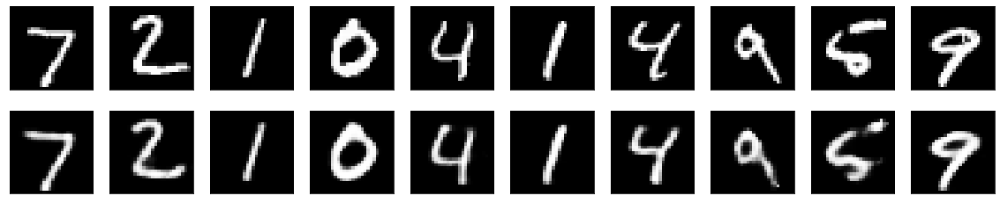

In [46]:
num = 10
plt.figure(figsize=(20, 4))
for i in range(num):
    # display original
    ax = plt.subplot(2, num, i+1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, num, i +1+ num)
    plt.imshow(result1[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

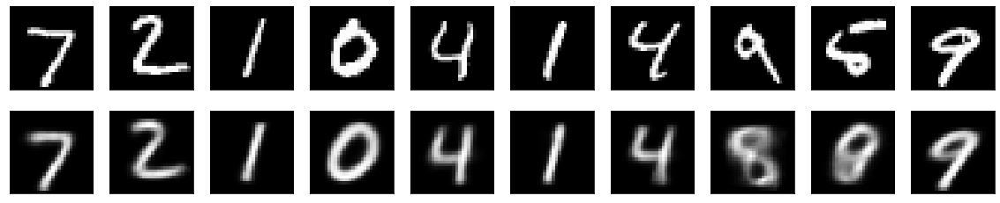

In [78]:
num = 10
plt.figure(figsize=(20, 4))
for i in range(num):
    # display original
    ax = plt.subplot(2, num, i+1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, num, i +1+ num)
    plt.imshow(result1[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

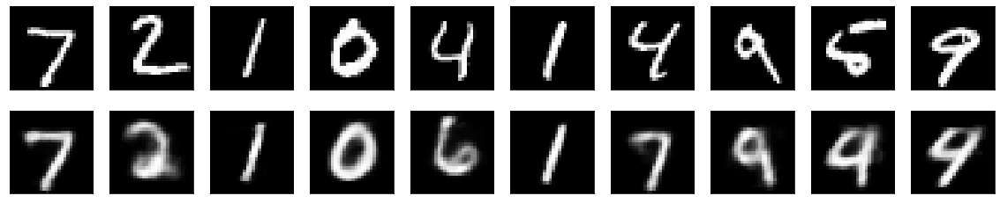

In [115]:
num = 10
plt.figure(figsize=(20, 4))
for i in range(num):
    # display original
    ax = plt.subplot(2, num, i+1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, num, i +1+ num)
    plt.imshow(result1[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

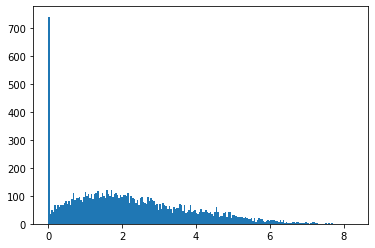

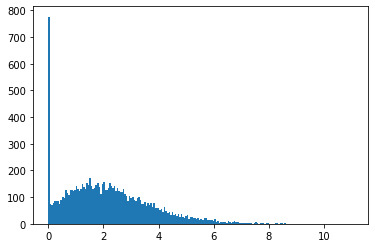

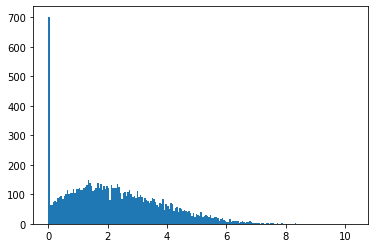

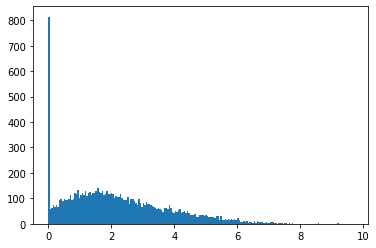

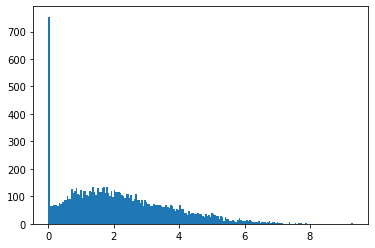

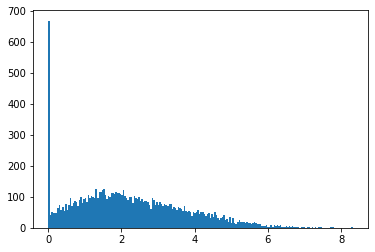

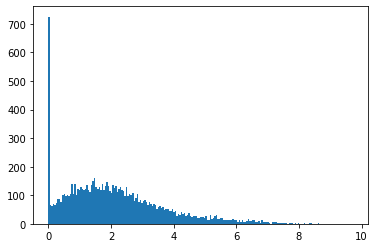

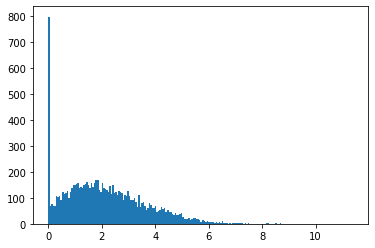

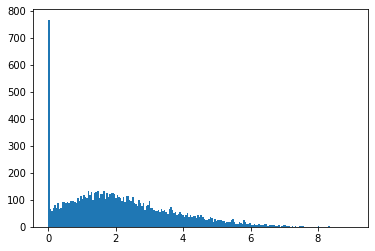

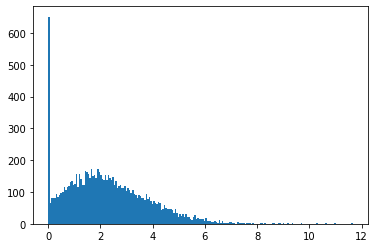

In [142]:
#epochs=8700 tradtional vae
for i in range(10):
    plt.figure()
    plt.hist(embedding1[:,i],200)

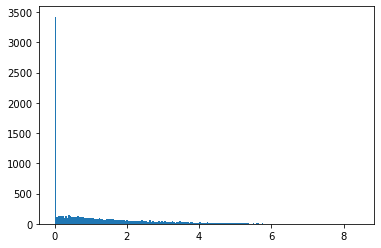

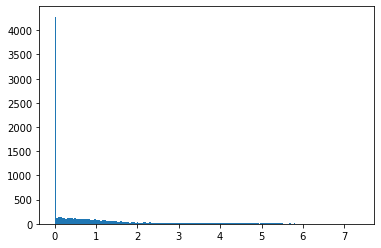

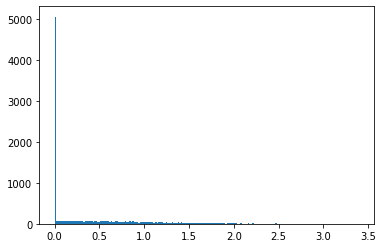

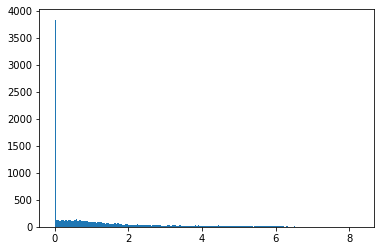

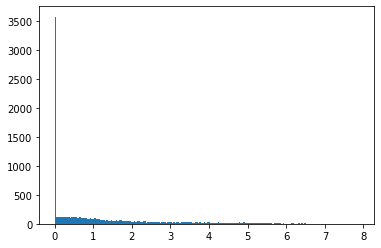

...

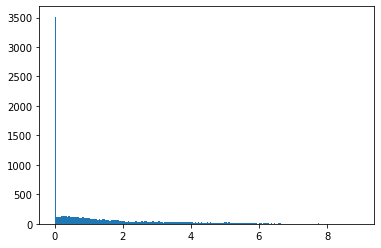

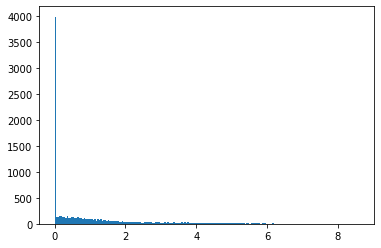

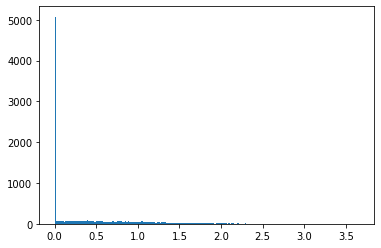

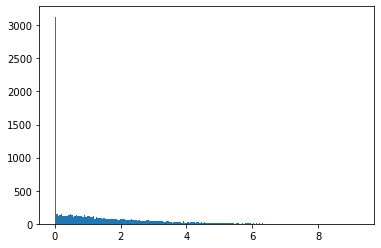

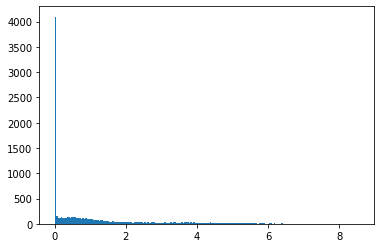

In [81]:
for i in range(20):
    plt.figure()
    plt.hist(embedding1[:,i],200)

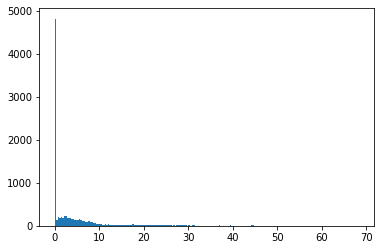

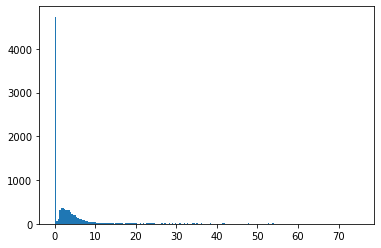

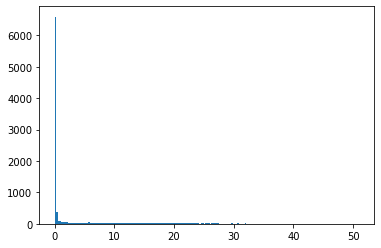

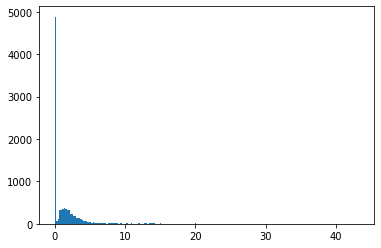

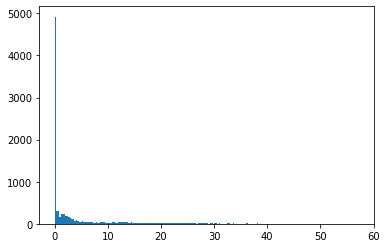

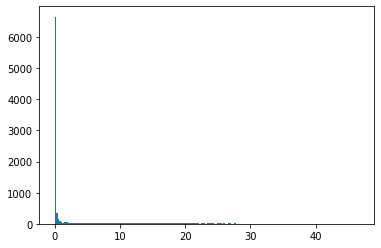

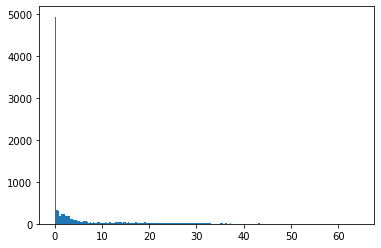

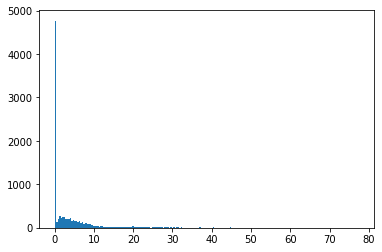

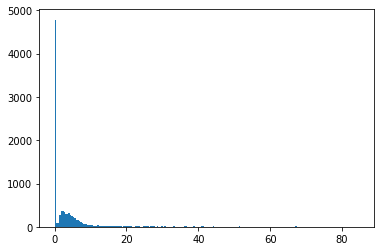

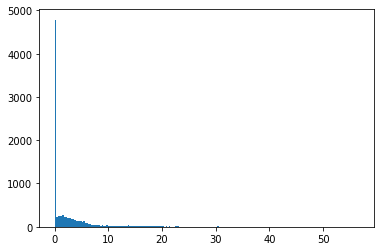

In [117]:
for i in range(10):
    plt.figure()
    plt.hist(embedding1[:,i],200)

In [60]:
best_train_loss = float('inf')

N_EPOCHS = 30000
for epoch in range(N_EPOCHS):
    
    
    train_loss,t_mse,t_kl = train()
    train_loss /= len(x_train)
    t_mse /= len(x_train)
    t_kl /= len(x_train)
    print(f'Epoch {epoch}, Train Loss: {train_loss:.4f}')
    print(f'Epoch {epoch}, MSE Loss: {t_mse:.4f}')
    print(f'Epoch {epoch}, KL Loss: {t_kl:.4f}')
    print('...................................')

    if best_train_loss > train_loss:
        best_train_loss = train_loss
        patience_counter = 1
        checkpoint = {
            "net": model.state_dict(),
            'optimizer': optimizer.state_dict(),
            "epoch": epoch,
            "encoder": encoder.state_dict(), 
            'decoder': decoder.state_dict()
        }
        if epoch >=200:
            torch.save(checkpoint, 'MNIST_2/weights-%s.pkl' % (str(epoch)))
    else:
        patience_counter += 1

    if patience_counter > 15000:
        break

Epoch 0, Train Loss: 129.1187
Epoch 0, MSE Loss: 124.7863
Epoch 0, KL Loss: 4.3324
...................................
Epoch 1, Train Loss: 56.6254
Epoch 1, MSE Loss: 55.9177
Epoch 1, KL Loss: 0.7077
...................................
Epoch 2, Train Loss: 53.4555
Epoch 2, MSE Loss: 53.1615
Epoch 2, KL Loss: 0.2940
...................................
Epoch 3, Train Loss: 52.7583
Epoch 3, MSE Loss: 52.2341
Epoch 3, KL Loss: 0.5241
...................................
Epoch 4, Train Loss: 51.5012
Epoch 4, MSE Loss: 51.2162
Epoch 4, KL Loss: 0.2851
...................................
Epoch 5, Train Loss: 50.1727
Epoch 5, MSE Loss: 50.0815
Epoch 5, KL Loss: 0.0912
...................................
Epoch 6, Train Loss: 48.9867
Epoch 6, MSE Loss: 48.9463
Epoch 6, KL Loss: 0.0404
...................................
Epoch 7, Train Loss: 47.5217
Epoch 7, MSE Loss: 47.5027
Epoch 7, KL Loss: 0.0190
...................................
Epoch 8, Train Loss: 46.5654
Epoch 8, MSE Loss: 46.2992
Epoch 

Epoch 69, Train Loss: 22.2374
Epoch 69, MSE Loss: 22.1888
Epoch 69, KL Loss: 0.0486
...................................
Epoch 70, Train Loss: 22.1258
Epoch 70, MSE Loss: 22.1193
Epoch 70, KL Loss: 0.0064
...................................
Epoch 71, Train Loss: 22.0554
Epoch 71, MSE Loss: 22.0520
Epoch 71, KL Loss: 0.0034
...................................
Epoch 72, Train Loss: 21.9919
Epoch 72, MSE Loss: 21.9882
Epoch 72, KL Loss: 0.0037
...................................
Epoch 73, Train Loss: 21.9241
Epoch 73, MSE Loss: 21.9203
Epoch 73, KL Loss: 0.0038
...................................
Epoch 74, Train Loss: 21.8592
Epoch 74, MSE Loss: 21.8544
Epoch 74, KL Loss: 0.0048
...................................
Epoch 75, Train Loss: 21.8671
Epoch 75, MSE Loss: 21.7929
Epoch 75, KL Loss: 0.0742
...................................
Epoch 76, Train Loss: 21.7742
Epoch 76, MSE Loss: 21.7256
Epoch 76, KL Loss: 0.0486
...................................
Epoch 77, Train Loss: 21.7815
Epoch 77, 

Epoch 137, Train Loss: 18.7254
Epoch 137, MSE Loss: 18.7034
Epoch 137, KL Loss: 0.0220
...................................
Epoch 138, Train Loss: 18.7074
Epoch 138, MSE Loss: 18.6802
Epoch 138, KL Loss: 0.0272
...................................
Epoch 139, Train Loss: 18.6781
Epoch 139, MSE Loss: 18.6580
Epoch 139, KL Loss: 0.0201
...................................
Epoch 140, Train Loss: 18.6956
Epoch 140, MSE Loss: 18.6327
Epoch 140, KL Loss: 0.0629
...................................
Epoch 141, Train Loss: 18.6634
Epoch 141, MSE Loss: 18.6075
Epoch 141, KL Loss: 0.0558
...................................
Epoch 142, Train Loss: 18.5798
Epoch 142, MSE Loss: 18.5790
Epoch 142, KL Loss: 0.0008
...................................
Epoch 143, Train Loss: 18.5590
Epoch 143, MSE Loss: 18.5565
Epoch 143, KL Loss: 0.0025
...................................
Epoch 144, Train Loss: 18.5365
Epoch 144, MSE Loss: 18.5308
Epoch 144, KL Loss: 0.0057
...................................
Epoch 145, Train

Epoch 204, Train Loss: 17.1051
Epoch 204, MSE Loss: 17.1046
Epoch 204, KL Loss: 0.0005
...................................
Epoch 205, Train Loss: 17.0770
Epoch 205, MSE Loss: 17.0763
Epoch 205, KL Loss: 0.0006
...................................
Epoch 206, Train Loss: 17.0494
Epoch 206, MSE Loss: 17.0490
Epoch 206, KL Loss: 0.0004
...................................
Epoch 207, Train Loss: 17.0191
Epoch 207, MSE Loss: 17.0187
Epoch 207, KL Loss: 0.0004
...................................
Epoch 208, Train Loss: 17.0075
Epoch 208, MSE Loss: 17.0032
Epoch 208, KL Loss: 0.0043
...................................
Epoch 209, Train Loss: 17.0231
Epoch 209, MSE Loss: 16.9797
Epoch 209, KL Loss: 0.0433
...................................
Epoch 210, Train Loss: 16.9526
Epoch 210, MSE Loss: 16.9524
Epoch 210, KL Loss: 0.0002
...................................
Epoch 211, Train Loss: 16.9297
Epoch 211, MSE Loss: 16.9291
Epoch 211, KL Loss: 0.0006
...................................
Epoch 212, Train

Epoch 271, Train Loss: 16.0545
Epoch 271, MSE Loss: 16.0545
Epoch 271, KL Loss: 0.0000
...................................
Epoch 272, Train Loss: 16.0490
Epoch 272, MSE Loss: 16.0490
Epoch 272, KL Loss: 0.0000
...................................
Epoch 273, Train Loss: 16.0356
Epoch 273, MSE Loss: 16.0356
Epoch 273, KL Loss: 0.0000
...................................
Epoch 274, Train Loss: 16.0313
Epoch 274, MSE Loss: 16.0313
Epoch 274, KL Loss: 0.0000
...................................
Epoch 275, Train Loss: 16.0792
Epoch 275, MSE Loss: 16.0175
Epoch 275, KL Loss: 0.0617
...................................
Epoch 276, Train Loss: 16.0042
Epoch 276, MSE Loss: 16.0042
Epoch 276, KL Loss: 0.0000
...................................
Epoch 277, Train Loss: 15.9956
Epoch 277, MSE Loss: 15.9956
Epoch 277, KL Loss: 0.0000
...................................
Epoch 278, Train Loss: 15.9789
Epoch 278, MSE Loss: 15.9789
Epoch 278, KL Loss: 0.0000
...................................
Epoch 279, Train

Epoch 338, Train Loss: 15.3629
Epoch 338, MSE Loss: 15.3629
Epoch 338, KL Loss: 0.0000
...................................
Epoch 339, Train Loss: 15.3523
Epoch 339, MSE Loss: 15.3523
Epoch 339, KL Loss: 0.0000
...................................
Epoch 340, Train Loss: 15.3440
Epoch 340, MSE Loss: 15.3440
Epoch 340, KL Loss: 0.0000
...................................
Epoch 341, Train Loss: 15.3908
Epoch 341, MSE Loss: 15.3384
Epoch 341, KL Loss: 0.0524
...................................
Epoch 342, Train Loss: 15.4550
Epoch 342, MSE Loss: 15.3288
Epoch 342, KL Loss: 0.1262
...................................
Epoch 343, Train Loss: 15.3177
Epoch 343, MSE Loss: 15.3177
Epoch 343, KL Loss: 0.0000
...................................
Epoch 344, Train Loss: 15.3109
Epoch 344, MSE Loss: 15.3109
Epoch 344, KL Loss: 0.0000
...................................
Epoch 345, Train Loss: 15.3017
Epoch 345, MSE Loss: 15.3017
Epoch 345, KL Loss: 0.0000
...................................
Epoch 346, Train

Epoch 405, Train Loss: 14.8921
Epoch 405, MSE Loss: 14.8921
Epoch 405, KL Loss: 0.0000
...................................
Epoch 406, Train Loss: 14.8855
Epoch 406, MSE Loss: 14.8855
Epoch 406, KL Loss: 0.0000
...................................
Epoch 407, Train Loss: 14.8764
Epoch 407, MSE Loss: 14.8764
Epoch 407, KL Loss: 0.0000
...................................
Epoch 408, Train Loss: 15.0992
Epoch 408, MSE Loss: 14.8817
Epoch 408, KL Loss: 0.2175
...................................
Epoch 409, Train Loss: 14.8684
Epoch 409, MSE Loss: 14.8684
Epoch 409, KL Loss: 0.0000
...................................
Epoch 410, Train Loss: 14.8575
Epoch 410, MSE Loss: 14.8575
Epoch 410, KL Loss: 0.0000
...................................
Epoch 411, Train Loss: 14.8478
Epoch 411, MSE Loss: 14.8477
Epoch 411, KL Loss: 0.0000
...................................
Epoch 412, Train Loss: 14.8397
Epoch 412, MSE Loss: 14.8397
Epoch 412, KL Loss: 0.0000
...................................
Epoch 413, Train

Epoch 472, Train Loss: 14.4364
Epoch 472, MSE Loss: 14.4364
Epoch 472, KL Loss: 0.0000
...................................
Epoch 473, Train Loss: 14.4328
Epoch 473, MSE Loss: 14.4328
Epoch 473, KL Loss: 0.0000
...................................
Epoch 474, Train Loss: 14.5105
Epoch 474, MSE Loss: 14.4288
Epoch 474, KL Loss: 0.0816
...................................
Epoch 475, Train Loss: 14.4176
Epoch 475, MSE Loss: 14.4176
Epoch 475, KL Loss: 0.0000
...................................
Epoch 476, Train Loss: 14.4153
Epoch 476, MSE Loss: 14.4153
Epoch 476, KL Loss: 0.0000
...................................
Epoch 477, Train Loss: 14.4056
Epoch 477, MSE Loss: 14.4056
Epoch 477, KL Loss: 0.0000
...................................
Epoch 478, Train Loss: 14.4445
Epoch 478, MSE Loss: 14.4029
Epoch 478, KL Loss: 0.0416
...................................
Epoch 479, Train Loss: 14.3947
Epoch 479, MSE Loss: 14.3947
Epoch 479, KL Loss: 0.0000
...................................
Epoch 480, Train

Epoch 539, Train Loss: 14.1440
Epoch 539, MSE Loss: 14.1440
Epoch 539, KL Loss: 0.0000
...................................
Epoch 540, Train Loss: 14.1392
Epoch 540, MSE Loss: 14.1392
Epoch 540, KL Loss: 0.0000
...................................
Epoch 541, Train Loss: 14.1334
Epoch 541, MSE Loss: 14.1334
Epoch 541, KL Loss: 0.0000
...................................
Epoch 542, Train Loss: 14.2010
Epoch 542, MSE Loss: 14.1318
Epoch 542, KL Loss: 0.0692
...................................
Epoch 543, Train Loss: 14.1244
Epoch 543, MSE Loss: 14.1244
Epoch 543, KL Loss: 0.0000
...................................
Epoch 544, Train Loss: 14.1170
Epoch 544, MSE Loss: 14.1170
Epoch 544, KL Loss: 0.0000
...................................
Epoch 545, Train Loss: 14.1098
Epoch 545, MSE Loss: 14.1098
Epoch 545, KL Loss: 0.0000
...................................
Epoch 546, Train Loss: 14.1074
Epoch 546, MSE Loss: 14.1074
Epoch 546, KL Loss: 0.0000
...................................
Epoch 547, Train

Epoch 606, Train Loss: 94.5082
Epoch 606, MSE Loss: 14.3378
Epoch 606, KL Loss: 80.1703
...................................
Epoch 607, Train Loss: 14.0189
Epoch 607, MSE Loss: 14.0189
Epoch 607, KL Loss: 0.0000
...................................
Epoch 608, Train Loss: 13.9263
Epoch 608, MSE Loss: 13.9263
Epoch 608, KL Loss: 0.0000
...................................
Epoch 609, Train Loss: 13.8899
Epoch 609, MSE Loss: 13.8899
Epoch 609, KL Loss: 0.0000
...................................
Epoch 610, Train Loss: 13.8731
Epoch 610, MSE Loss: 13.8731
Epoch 610, KL Loss: 0.0000
...................................
Epoch 611, Train Loss: 13.8667
Epoch 611, MSE Loss: 13.8667
Epoch 611, KL Loss: 0.0000
...................................
Epoch 612, Train Loss: 13.8571
Epoch 612, MSE Loss: 13.8571
Epoch 612, KL Loss: 0.0000
...................................
Epoch 613, Train Loss: 67.6207
Epoch 613, MSE Loss: 14.0886
Epoch 613, KL Loss: 53.5320
...................................
Epoch 614, Tra

Epoch 673, Train Loss: 13.6211
Epoch 673, MSE Loss: 13.6211
Epoch 673, KL Loss: 0.0000
...................................
Epoch 674, Train Loss: 13.6185
Epoch 674, MSE Loss: 13.6185
Epoch 674, KL Loss: 0.0000
...................................
Epoch 675, Train Loss: 13.6106
Epoch 675, MSE Loss: 13.6106
Epoch 675, KL Loss: 0.0000
...................................
Epoch 676, Train Loss: 13.6078
Epoch 676, MSE Loss: 13.6078
Epoch 676, KL Loss: 0.0000
...................................
Epoch 677, Train Loss: 13.6007
Epoch 677, MSE Loss: 13.6007
Epoch 677, KL Loss: 0.0000
...................................
Epoch 678, Train Loss: 13.5973
Epoch 678, MSE Loss: 13.5973
Epoch 678, KL Loss: 0.0000
...................................
Epoch 679, Train Loss: 13.5920
Epoch 679, MSE Loss: 13.5920
Epoch 679, KL Loss: 0.0000
...................................
Epoch 680, Train Loss: 13.5881
Epoch 680, MSE Loss: 13.5881
Epoch 680, KL Loss: 0.0000
...................................
Epoch 681, Train

Epoch 740, Train Loss: 13.3669
Epoch 740, MSE Loss: 13.3669
Epoch 740, KL Loss: 0.0000
...................................
Epoch 741, Train Loss: 13.6198
Epoch 741, MSE Loss: 13.3661
Epoch 741, KL Loss: 0.2537
...................................
Epoch 742, Train Loss: 13.3589
Epoch 742, MSE Loss: 13.3589
Epoch 742, KL Loss: 0.0000
...................................
Epoch 743, Train Loss: 13.3501
Epoch 743, MSE Loss: 13.3501
Epoch 743, KL Loss: 0.0000
...................................
Epoch 744, Train Loss: 13.3496
Epoch 744, MSE Loss: 13.3496
Epoch 744, KL Loss: 0.0000
...................................
Epoch 745, Train Loss: 13.3468
Epoch 745, MSE Loss: 13.3468
Epoch 745, KL Loss: 0.0000
...................................
Epoch 746, Train Loss: 13.3453
Epoch 746, MSE Loss: 13.3453
Epoch 746, KL Loss: 0.0000
...................................
Epoch 747, Train Loss: 13.3389
Epoch 747, MSE Loss: 13.3389
Epoch 747, KL Loss: 0.0000
...................................
Epoch 748, Train

Epoch 807, Train Loss: 13.1918
Epoch 807, MSE Loss: 13.1918
Epoch 807, KL Loss: 0.0000
...................................
Epoch 808, Train Loss: 13.1899
Epoch 808, MSE Loss: 13.1899
Epoch 808, KL Loss: 0.0000
...................................
Epoch 809, Train Loss: 13.1884
Epoch 809, MSE Loss: 13.1884
Epoch 809, KL Loss: 0.0000
...................................
Epoch 810, Train Loss: 13.1823
Epoch 810, MSE Loss: 13.1823
Epoch 810, KL Loss: 0.0000
...................................
Epoch 811, Train Loss: 13.1774
Epoch 811, MSE Loss: 13.1774
Epoch 811, KL Loss: 0.0000
...................................
Epoch 812, Train Loss: 13.1738
Epoch 812, MSE Loss: 13.1738
Epoch 812, KL Loss: 0.0000
...................................
Epoch 813, Train Loss: 13.1700
Epoch 813, MSE Loss: 13.1700
Epoch 813, KL Loss: 0.0000
...................................
Epoch 814, Train Loss: 13.1702
Epoch 814, MSE Loss: 13.1702
Epoch 814, KL Loss: 0.0000
...................................
Epoch 815, Train

Epoch 874, Train Loss: 13.0352
Epoch 874, MSE Loss: 13.0352
Epoch 874, KL Loss: 0.0000
...................................
Epoch 875, Train Loss: 13.0301
Epoch 875, MSE Loss: 13.0301
Epoch 875, KL Loss: 0.0000
...................................
Epoch 876, Train Loss: 13.0291
Epoch 876, MSE Loss: 13.0291
Epoch 876, KL Loss: 0.0000
...................................
Epoch 877, Train Loss: 13.0293
Epoch 877, MSE Loss: 13.0244
Epoch 877, KL Loss: 0.0049
...................................
Epoch 878, Train Loss: 13.0227
Epoch 878, MSE Loss: 13.0227
Epoch 878, KL Loss: 0.0000
...................................
Epoch 879, Train Loss: 13.0150
Epoch 879, MSE Loss: 13.0150
Epoch 879, KL Loss: 0.0000
...................................
Epoch 880, Train Loss: 13.0146
Epoch 880, MSE Loss: 13.0146
Epoch 880, KL Loss: 0.0000
...................................
Epoch 881, Train Loss: 13.0116
Epoch 881, MSE Loss: 13.0116
Epoch 881, KL Loss: 0.0000
...................................
Epoch 882, Train

Epoch 941, Train Loss: 70.1267
Epoch 941, MSE Loss: 13.0848
Epoch 941, KL Loss: 57.0419
...................................
Epoch 942, Train Loss: 13.0360
Epoch 942, MSE Loss: 13.0360
Epoch 942, KL Loss: 0.0000
...................................
Epoch 943, Train Loss: 13.0027
Epoch 943, MSE Loss: 13.0027
Epoch 943, KL Loss: 0.0000
...................................
Epoch 944, Train Loss: 12.9851
Epoch 944, MSE Loss: 12.9851
Epoch 944, KL Loss: 0.0000
...................................
Epoch 945, Train Loss: 12.9725
Epoch 945, MSE Loss: 12.9726
Epoch 945, KL Loss: 0.0000
...................................
Epoch 946, Train Loss: 12.9639
Epoch 946, MSE Loss: 12.9639
Epoch 946, KL Loss: 0.0000
...................................
Epoch 947, Train Loss: 12.9522
Epoch 947, MSE Loss: 12.9522
Epoch 947, KL Loss: 0.0000
...................................
Epoch 948, Train Loss: 12.9447
Epoch 948, MSE Loss: 12.9447
Epoch 948, KL Loss: 0.0000
...................................
Epoch 949, Trai

Epoch 1008, Train Loss: 12.8284
Epoch 1008, MSE Loss: 12.8284
Epoch 1008, KL Loss: 0.0000
...................................
Epoch 1009, Train Loss: 12.8242
Epoch 1009, MSE Loss: 12.8242
Epoch 1009, KL Loss: 0.0000
...................................
Epoch 1010, Train Loss: 12.8165
Epoch 1010, MSE Loss: 12.8165
Epoch 1010, KL Loss: 0.0000
...................................
Epoch 1011, Train Loss: 12.8123
Epoch 1011, MSE Loss: 12.8123
Epoch 1011, KL Loss: 0.0000
...................................
Epoch 1012, Train Loss: 12.8054
Epoch 1012, MSE Loss: 12.8054
Epoch 1012, KL Loss: 0.0000
...................................
Epoch 1013, Train Loss: 12.8030
Epoch 1013, MSE Loss: 12.8030
Epoch 1013, KL Loss: 0.0000
...................................
Epoch 1014, Train Loss: 12.7997
Epoch 1014, MSE Loss: 12.7997
Epoch 1014, KL Loss: 0.0000
...................................
Epoch 1015, Train Loss: 12.7941
Epoch 1015, MSE Loss: 12.7941
Epoch 1015, KL Loss: 0.0000
............................

Epoch 1073, Train Loss: 12.7993
Epoch 1073, MSE Loss: 12.7993
Epoch 1073, KL Loss: 0.0000
...................................
Epoch 1074, Train Loss: 12.7897
Epoch 1074, MSE Loss: 12.7897
Epoch 1074, KL Loss: 0.0000
...................................
Epoch 1075, Train Loss: 12.7783
Epoch 1075, MSE Loss: 12.7783
Epoch 1075, KL Loss: 0.0000
...................................
Epoch 1076, Train Loss: 12.7710
Epoch 1076, MSE Loss: 12.7710
Epoch 1076, KL Loss: 0.0000
...................................
Epoch 1077, Train Loss: 12.7601
Epoch 1077, MSE Loss: 12.7601
Epoch 1077, KL Loss: 0.0000
...................................
Epoch 1078, Train Loss: 12.7566
Epoch 1078, MSE Loss: 12.7566
Epoch 1078, KL Loss: 0.0000
...................................
Epoch 1079, Train Loss: 12.7447
Epoch 1079, MSE Loss: 12.7447
Epoch 1079, KL Loss: 0.0000
...................................
Epoch 1080, Train Loss: 12.7355
Epoch 1080, MSE Loss: 12.7355
Epoch 1080, KL Loss: 0.0000
............................

Epoch 1138, Train Loss: 64.0032
Epoch 1138, MSE Loss: 12.9984
Epoch 1138, KL Loss: 51.0048
...................................
Epoch 1139, Train Loss: 13.0276
Epoch 1139, MSE Loss: 13.0276
Epoch 1139, KL Loss: 0.0000
...................................
Epoch 1140, Train Loss: 12.9416
Epoch 1140, MSE Loss: 12.9416
Epoch 1140, KL Loss: 0.0000
...................................
Epoch 1141, Train Loss: 12.8996
Epoch 1141, MSE Loss: 12.8996
Epoch 1141, KL Loss: 0.0000
...................................
Epoch 1142, Train Loss: 12.8751
Epoch 1142, MSE Loss: 12.8751
Epoch 1142, KL Loss: 0.0000
...................................
Epoch 1143, Train Loss: 12.8459
Epoch 1143, MSE Loss: 12.8459
Epoch 1143, KL Loss: 0.0000
...................................
Epoch 1144, Train Loss: 12.8273
Epoch 1144, MSE Loss: 12.8273
Epoch 1144, KL Loss: 0.0000
...................................
Epoch 1145, Train Loss: 12.8053
Epoch 1145, MSE Loss: 12.8053
Epoch 1145, KL Loss: 0.0000
...........................

Epoch 1204, Train Loss: 12.9921
Epoch 1204, MSE Loss: 12.5098
Epoch 1204, KL Loss: 0.4823
...................................
Epoch 1205, Train Loss: 12.4971
Epoch 1205, MSE Loss: 12.4971
Epoch 1205, KL Loss: 0.0000
...................................
Epoch 1206, Train Loss: 12.4956
Epoch 1206, MSE Loss: 12.4956
Epoch 1206, KL Loss: 0.0000
...................................
Epoch 1207, Train Loss: 90.8902
Epoch 1207, MSE Loss: 12.9047
Epoch 1207, KL Loss: 77.9855
...................................
Epoch 1208, Train Loss: 12.7268
Epoch 1208, MSE Loss: 12.7268
Epoch 1208, KL Loss: 0.0000
...................................
Epoch 1209, Train Loss: 12.6718
Epoch 1209, MSE Loss: 12.6718
Epoch 1209, KL Loss: 0.0000
...................................
Epoch 1210, Train Loss: 12.6452
Epoch 1210, MSE Loss: 12.6452
Epoch 1210, KL Loss: 0.0000
...................................
Epoch 1211, Train Loss: 12.6244
Epoch 1211, MSE Loss: 12.6244
Epoch 1211, KL Loss: 0.0000
...........................

Epoch 1269, Train Loss: 12.5573
Epoch 1269, MSE Loss: 12.5573
Epoch 1269, KL Loss: 0.0000
...................................
Epoch 1270, Train Loss: 12.5350
Epoch 1270, MSE Loss: 12.5350
Epoch 1270, KL Loss: 0.0000
...................................
Epoch 1271, Train Loss: 12.5195
Epoch 1271, MSE Loss: 12.5195
Epoch 1271, KL Loss: 0.0000
...................................
Epoch 1272, Train Loss: 12.5039
Epoch 1272, MSE Loss: 12.5039
Epoch 1272, KL Loss: 0.0000
...................................
Epoch 1273, Train Loss: 12.4921
Epoch 1273, MSE Loss: 12.4921
Epoch 1273, KL Loss: 0.0000
...................................
Epoch 1274, Train Loss: 12.4697
Epoch 1274, MSE Loss: 12.4697
Epoch 1274, KL Loss: 0.0000
...................................
Epoch 1275, Train Loss: 12.4593
Epoch 1275, MSE Loss: 12.4593
Epoch 1275, KL Loss: 0.0000
...................................
Epoch 1276, Train Loss: 12.4497
Epoch 1276, MSE Loss: 12.4497
Epoch 1276, KL Loss: 0.0000
............................

Epoch 1334, Train Loss: 12.5745
Epoch 1334, MSE Loss: 12.5745
Epoch 1334, KL Loss: 0.0000
...................................
Epoch 1335, Train Loss: 12.5457
Epoch 1335, MSE Loss: 12.5457
Epoch 1335, KL Loss: 0.0000
...................................
Epoch 1336, Train Loss: 12.5158
Epoch 1336, MSE Loss: 12.5158
Epoch 1336, KL Loss: 0.0000
...................................
Epoch 1337, Train Loss: 12.4913
Epoch 1337, MSE Loss: 12.4913
Epoch 1337, KL Loss: 0.0000
...................................
Epoch 1338, Train Loss: 12.4707
Epoch 1338, MSE Loss: 12.4707
Epoch 1338, KL Loss: 0.0000
...................................
Epoch 1339, Train Loss: 12.4483
Epoch 1339, MSE Loss: 12.4483
Epoch 1339, KL Loss: 0.0000
...................................
Epoch 1340, Train Loss: 12.4275
Epoch 1340, MSE Loss: 12.4275
Epoch 1340, KL Loss: 0.0000
...................................
Epoch 1341, Train Loss: 12.4137
Epoch 1341, MSE Loss: 12.4137
Epoch 1341, KL Loss: 0.0000
............................

Epoch 1399, Train Loss: 12.4831
Epoch 1399, MSE Loss: 12.4831
Epoch 1399, KL Loss: 0.0000
...................................
Epoch 1400, Train Loss: 12.4483
Epoch 1400, MSE Loss: 12.4483
Epoch 1400, KL Loss: 0.0000
...................................
Epoch 1401, Train Loss: 12.4205
Epoch 1401, MSE Loss: 12.4205
Epoch 1401, KL Loss: 0.0000
...................................
Epoch 1402, Train Loss: 12.3938
Epoch 1402, MSE Loss: 12.3938
Epoch 1402, KL Loss: 0.0000
...................................
Epoch 1403, Train Loss: 12.3789
Epoch 1403, MSE Loss: 12.3789
Epoch 1403, KL Loss: 0.0000
...................................
Epoch 1404, Train Loss: 12.3565
Epoch 1404, MSE Loss: 12.3565
Epoch 1404, KL Loss: 0.0000
...................................
Epoch 1405, Train Loss: 12.3415
Epoch 1405, MSE Loss: 12.3415
Epoch 1405, KL Loss: 0.0000
...................................
Epoch 1406, Train Loss: 12.3248
Epoch 1406, MSE Loss: 12.3248
Epoch 1406, KL Loss: 0.0000
............................

Epoch 1464, Train Loss: 12.1518
Epoch 1464, MSE Loss: 12.1518
Epoch 1464, KL Loss: 0.0000
...................................
Epoch 1465, Train Loss: 12.1443
Epoch 1465, MSE Loss: 12.1443
Epoch 1465, KL Loss: 0.0000
...................................
Epoch 1466, Train Loss: 12.1435
Epoch 1466, MSE Loss: 12.1435
Epoch 1466, KL Loss: 0.0000
...................................
Epoch 1467, Train Loss: 12.1377
Epoch 1467, MSE Loss: 12.1377
Epoch 1467, KL Loss: 0.0000
...................................
Epoch 1468, Train Loss: 133.1358
Epoch 1468, MSE Loss: 12.9778
Epoch 1468, KL Loss: 120.1580
...................................
Epoch 1469, Train Loss: 12.5732
Epoch 1469, MSE Loss: 12.5732
Epoch 1469, KL Loss: 0.0000
...................................
Epoch 1470, Train Loss: 12.4936
Epoch 1470, MSE Loss: 12.4936
Epoch 1470, KL Loss: 0.0000
...................................
Epoch 1471, Train Loss: 12.4443
Epoch 1471, MSE Loss: 12.4443
Epoch 1471, KL Loss: 0.0000
.........................

Epoch 1529, Train Loss: 12.2437
Epoch 1529, MSE Loss: 12.2437
Epoch 1529, KL Loss: 0.0000
...................................
Epoch 1530, Train Loss: 12.2292
Epoch 1530, MSE Loss: 12.2292
Epoch 1530, KL Loss: 0.0000
...................................
Epoch 1531, Train Loss: 12.2099
Epoch 1531, MSE Loss: 12.2099
Epoch 1531, KL Loss: 0.0000
...................................
Epoch 1532, Train Loss: 12.1963
Epoch 1532, MSE Loss: 12.1963
Epoch 1532, KL Loss: 0.0000
...................................
Epoch 1533, Train Loss: 12.1883
Epoch 1533, MSE Loss: 12.1883
Epoch 1533, KL Loss: 0.0000
...................................
Epoch 1534, Train Loss: 12.1718
Epoch 1534, MSE Loss: 12.1718
Epoch 1534, KL Loss: 0.0000
...................................
Epoch 1535, Train Loss: 12.1649
Epoch 1535, MSE Loss: 12.1649
Epoch 1535, KL Loss: 0.0000
...................................
Epoch 1536, Train Loss: 12.1532
Epoch 1536, MSE Loss: 12.1532
Epoch 1536, KL Loss: 0.0000
............................

Epoch 1594, Train Loss: 12.1219
Epoch 1594, MSE Loss: 12.1219
Epoch 1594, KL Loss: 0.0000
...................................
Epoch 1595, Train Loss: 12.1086
Epoch 1595, MSE Loss: 12.1086
Epoch 1595, KL Loss: 0.0000
...................................
Epoch 1596, Train Loss: 12.0953
Epoch 1596, MSE Loss: 12.0953
Epoch 1596, KL Loss: 0.0000
...................................
Epoch 1597, Train Loss: 12.0852
Epoch 1597, MSE Loss: 12.0852
Epoch 1597, KL Loss: 0.0000
...................................
Epoch 1598, Train Loss: 12.0776
Epoch 1598, MSE Loss: 12.0776
Epoch 1598, KL Loss: 0.0000
...................................
Epoch 1599, Train Loss: 12.0639
Epoch 1599, MSE Loss: 12.0639
Epoch 1599, KL Loss: 0.0000
...................................
Epoch 1600, Train Loss: 12.8318
Epoch 1600, MSE Loss: 12.0974
Epoch 1600, KL Loss: 0.7344
...................................
Epoch 1601, Train Loss: 12.0626
Epoch 1601, MSE Loss: 12.0626
Epoch 1601, KL Loss: 0.0000
............................

Epoch 1659, Train Loss: 11.9461
Epoch 1659, MSE Loss: 11.9461
Epoch 1659, KL Loss: 0.0000
...................................
Epoch 1660, Train Loss: 11.9470
Epoch 1660, MSE Loss: 11.9470
Epoch 1660, KL Loss: 0.0000
...................................
Epoch 1661, Train Loss: 11.9379
Epoch 1661, MSE Loss: 11.9379
Epoch 1661, KL Loss: 0.0000
...................................
Epoch 1662, Train Loss: 11.9354
Epoch 1662, MSE Loss: 11.9354
Epoch 1662, KL Loss: 0.0000
...................................
Epoch 1663, Train Loss: 11.9323
Epoch 1663, MSE Loss: 11.9323
Epoch 1663, KL Loss: 0.0000
...................................
Epoch 1664, Train Loss: 11.9300
Epoch 1664, MSE Loss: 11.9300
Epoch 1664, KL Loss: 0.0000
...................................
Epoch 1665, Train Loss: 11.9216
Epoch 1665, MSE Loss: 11.9216
Epoch 1665, KL Loss: 0.0000
...................................
Epoch 1666, Train Loss: 11.9203
Epoch 1666, MSE Loss: 11.9203
Epoch 1666, KL Loss: 0.0000
............................

Epoch 1724, Train Loss: 11.9166
Epoch 1724, MSE Loss: 11.9166
Epoch 1724, KL Loss: 0.0000
...................................
Epoch 1725, Train Loss: 11.9056
Epoch 1725, MSE Loss: 11.9056
Epoch 1725, KL Loss: 0.0000
...................................
Epoch 1726, Train Loss: 11.9023
Epoch 1726, MSE Loss: 11.9023
Epoch 1726, KL Loss: 0.0000
...................................
Epoch 1727, Train Loss: 11.8946
Epoch 1727, MSE Loss: 11.8946
Epoch 1727, KL Loss: 0.0000
...................................
Epoch 1728, Train Loss: 11.8886
Epoch 1728, MSE Loss: 11.8886
Epoch 1728, KL Loss: 0.0000
...................................
Epoch 1729, Train Loss: 12.0044
Epoch 1729, MSE Loss: 11.8891
Epoch 1729, KL Loss: 0.1152
...................................
Epoch 1730, Train Loss: 11.8745
Epoch 1730, MSE Loss: 11.8745
Epoch 1730, KL Loss: 0.0000
...................................
Epoch 1731, Train Loss: 11.8725
Epoch 1731, MSE Loss: 11.8725
Epoch 1731, KL Loss: 0.0000
............................

Epoch 1790, Train Loss: 11.7849
Epoch 1790, MSE Loss: 11.7849
Epoch 1790, KL Loss: 0.0000
...................................
Epoch 1791, Train Loss: 11.7806
Epoch 1791, MSE Loss: 11.7806
Epoch 1791, KL Loss: 0.0000
...................................
Epoch 1792, Train Loss: 11.7766
Epoch 1792, MSE Loss: 11.7766
Epoch 1792, KL Loss: 0.0000
...................................
Epoch 1793, Train Loss: 11.7820
Epoch 1793, MSE Loss: 11.7820
Epoch 1793, KL Loss: 0.0000
...................................
Epoch 1794, Train Loss: 11.7727
Epoch 1794, MSE Loss: 11.7727
Epoch 1794, KL Loss: 0.0000
...................................
Epoch 1795, Train Loss: 11.7683
Epoch 1795, MSE Loss: 11.7684
Epoch 1795, KL Loss: 0.0000
...................................
Epoch 1796, Train Loss: 11.7671
Epoch 1796, MSE Loss: 11.7671
Epoch 1796, KL Loss: 0.0000
...................................
Epoch 1797, Train Loss: 11.7661
Epoch 1797, MSE Loss: 11.7661
Epoch 1797, KL Loss: 0.0000
............................

Epoch 1855, Train Loss: 11.8781
Epoch 1855, MSE Loss: 11.8781
Epoch 1855, KL Loss: 0.0000
...................................
Epoch 1856, Train Loss: 11.8569
Epoch 1856, MSE Loss: 11.8569
Epoch 1856, KL Loss: 0.0000
...................................
Epoch 1857, Train Loss: 11.8475
Epoch 1857, MSE Loss: 11.8475
Epoch 1857, KL Loss: 0.0000
...................................
Epoch 1858, Train Loss: 11.8266
Epoch 1858, MSE Loss: 11.8266
Epoch 1858, KL Loss: 0.0000
...................................
Epoch 1859, Train Loss: 11.8231
Epoch 1859, MSE Loss: 11.8231
Epoch 1859, KL Loss: 0.0000
...................................
Epoch 1860, Train Loss: 11.8104
Epoch 1860, MSE Loss: 11.8104
Epoch 1860, KL Loss: 0.0000
...................................
Epoch 1861, Train Loss: 14.2567
Epoch 1861, MSE Loss: 11.8805
Epoch 1861, KL Loss: 2.3762
...................................
Epoch 1862, Train Loss: 11.8302
Epoch 1862, MSE Loss: 11.8302
Epoch 1862, KL Loss: 0.0000
............................

Epoch 1920, Train Loss: 11.8258
Epoch 1920, MSE Loss: 11.8258
Epoch 1920, KL Loss: 0.0000
...................................
Epoch 1921, Train Loss: 36.2602
Epoch 1921, MSE Loss: 11.9156
Epoch 1921, KL Loss: 24.3446
...................................
Epoch 1922, Train Loss: 11.9995
Epoch 1922, MSE Loss: 11.9995
Epoch 1922, KL Loss: 0.0000
...................................
Epoch 1923, Train Loss: 11.9299
Epoch 1923, MSE Loss: 11.9299
Epoch 1923, KL Loss: 0.0000
...................................
Epoch 1924, Train Loss: 11.8958
Epoch 1924, MSE Loss: 11.8958
Epoch 1924, KL Loss: 0.0000
...................................
Epoch 1925, Train Loss: 11.8631
Epoch 1925, MSE Loss: 11.8631
Epoch 1925, KL Loss: 0.0000
...................................
Epoch 1926, Train Loss: 11.8390
Epoch 1926, MSE Loss: 11.8390
Epoch 1926, KL Loss: 0.0000
...................................
Epoch 1927, Train Loss: 11.8098
Epoch 1927, MSE Loss: 11.8098
Epoch 1927, KL Loss: 0.0000
...........................

Epoch 1985, Train Loss: 11.7424
Epoch 1985, MSE Loss: 11.7424
Epoch 1985, KL Loss: 0.0000
...................................
Epoch 1986, Train Loss: 11.7330
Epoch 1986, MSE Loss: 11.7330
Epoch 1986, KL Loss: 0.0000
...................................
Epoch 1987, Train Loss: 11.7208
Epoch 1987, MSE Loss: 11.7208
Epoch 1987, KL Loss: 0.0000
...................................
Epoch 1988, Train Loss: 23.7173
Epoch 1988, MSE Loss: 12.0144
Epoch 1988, KL Loss: 11.7028
...................................
Epoch 1989, Train Loss: 11.7891
Epoch 1989, MSE Loss: 11.7891
Epoch 1989, KL Loss: 0.0000
...................................
Epoch 1990, Train Loss: 11.7456
Epoch 1990, MSE Loss: 11.7456
Epoch 1990, KL Loss: 0.0000
...................................
Epoch 1991, Train Loss: 11.7252
Epoch 1991, MSE Loss: 11.7252
Epoch 1991, KL Loss: 0.0000
...................................
Epoch 1992, Train Loss: 11.7131
Epoch 1992, MSE Loss: 11.7131
Epoch 1992, KL Loss: 0.0000
...........................

Epoch 2050, Train Loss: 11.5892
Epoch 2050, MSE Loss: 11.5892
Epoch 2050, KL Loss: 0.0000
...................................
Epoch 2051, Train Loss: 11.5867
Epoch 2051, MSE Loss: 11.5867
Epoch 2051, KL Loss: 0.0000
...................................
Epoch 2052, Train Loss: 11.5825
Epoch 2052, MSE Loss: 11.5825
Epoch 2052, KL Loss: 0.0000
...................................
Epoch 2053, Train Loss: 67.6731
Epoch 2053, MSE Loss: 12.0791
Epoch 2053, KL Loss: 55.5940
...................................
Epoch 2054, Train Loss: 11.9607
Epoch 2054, MSE Loss: 11.9607
Epoch 2054, KL Loss: 0.0000
...................................
Epoch 2055, Train Loss: 11.7943
Epoch 2055, MSE Loss: 11.7943
Epoch 2055, KL Loss: 0.0000
...................................
Epoch 2056, Train Loss: 11.7364
Epoch 2056, MSE Loss: 11.7364
Epoch 2056, KL Loss: 0.0000
...................................
Epoch 2057, Train Loss: 11.7057
Epoch 2057, MSE Loss: 11.7057
Epoch 2057, KL Loss: 0.0000
...........................

Epoch 2115, Train Loss: 11.8070
Epoch 2115, MSE Loss: 11.8070
Epoch 2115, KL Loss: 0.0000
...................................
Epoch 2116, Train Loss: 11.7798
Epoch 2116, MSE Loss: 11.7798
Epoch 2116, KL Loss: 0.0000
...................................
Epoch 2117, Train Loss: 11.7563
Epoch 2117, MSE Loss: 11.7563
Epoch 2117, KL Loss: 0.0000
...................................
Epoch 2118, Train Loss: 11.7265
Epoch 2118, MSE Loss: 11.7265
Epoch 2118, KL Loss: 0.0000
...................................
Epoch 2119, Train Loss: 11.7117
Epoch 2119, MSE Loss: 11.7117
Epoch 2119, KL Loss: 0.0000
...................................
Epoch 2120, Train Loss: 11.6910
Epoch 2120, MSE Loss: 11.6910
Epoch 2120, KL Loss: 0.0000
...................................
Epoch 2121, Train Loss: 11.6713
Epoch 2121, MSE Loss: 11.6713
Epoch 2121, KL Loss: 0.0000
...................................
Epoch 2122, Train Loss: 11.6616
Epoch 2122, MSE Loss: 11.6616
Epoch 2122, KL Loss: 0.0000
............................

Epoch 2181, Train Loss: 11.9748
Epoch 2181, MSE Loss: 11.9748
Epoch 2181, KL Loss: 0.0000
...................................
Epoch 2182, Train Loss: 82.4939
Epoch 2182, MSE Loss: 12.7250
Epoch 2182, KL Loss: 69.7689
...................................
Epoch 2183, Train Loss: 12.3313
Epoch 2183, MSE Loss: 12.3313
Epoch 2183, KL Loss: 0.0000
...................................
Epoch 2184, Train Loss: 12.1862
Epoch 2184, MSE Loss: 12.1862
Epoch 2184, KL Loss: 0.0000
...................................
Epoch 2185, Train Loss: 12.0923
Epoch 2185, MSE Loss: 12.0923
Epoch 2185, KL Loss: 0.0000
...................................
Epoch 2186, Train Loss: 12.0219
Epoch 2186, MSE Loss: 12.0219
Epoch 2186, KL Loss: 0.0000
...................................
Epoch 2187, Train Loss: 11.9630
Epoch 2187, MSE Loss: 11.9630
Epoch 2187, KL Loss: 0.0000
...................................
Epoch 2188, Train Loss: 11.9098
Epoch 2188, MSE Loss: 11.9098
Epoch 2188, KL Loss: 0.0000
...........................

Epoch 2246, Train Loss: 11.5398
Epoch 2246, MSE Loss: 11.5398
Epoch 2246, KL Loss: 0.0000
...................................
Epoch 2247, Train Loss: 11.5300
Epoch 2247, MSE Loss: 11.5300
Epoch 2247, KL Loss: 0.0000
...................................
Epoch 2248, Train Loss: 11.5212
Epoch 2248, MSE Loss: 11.5212
Epoch 2248, KL Loss: 0.0000
...................................
Epoch 2249, Train Loss: 11.5187
Epoch 2249, MSE Loss: 11.5187
Epoch 2249, KL Loss: 0.0000
...................................
Epoch 2250, Train Loss: 11.5114
Epoch 2250, MSE Loss: 11.5114
Epoch 2250, KL Loss: 0.0000
...................................
Epoch 2251, Train Loss: 11.5032
Epoch 2251, MSE Loss: 11.5032
Epoch 2251, KL Loss: 0.0000
...................................
Epoch 2252, Train Loss: 11.4983
Epoch 2252, MSE Loss: 11.4983
Epoch 2252, KL Loss: 0.0000
...................................
Epoch 2253, Train Loss: 11.4945
Epoch 2253, MSE Loss: 11.4945
Epoch 2253, KL Loss: 0.0000
............................

Epoch 2312, Train Loss: 11.4079
Epoch 2312, MSE Loss: 11.4079
Epoch 2312, KL Loss: 0.0000
...................................
Epoch 2313, Train Loss: 11.4036
Epoch 2313, MSE Loss: 11.4036
Epoch 2313, KL Loss: 0.0000
...................................
Epoch 2314, Train Loss: 11.4031
Epoch 2314, MSE Loss: 11.4031
Epoch 2314, KL Loss: 0.0000
...................................
Epoch 2315, Train Loss: 11.3990
Epoch 2315, MSE Loss: 11.3990
Epoch 2315, KL Loss: 0.0000
...................................
Epoch 2316, Train Loss: 11.4013
Epoch 2316, MSE Loss: 11.4013
Epoch 2316, KL Loss: 0.0000
...................................
Epoch 2317, Train Loss: 11.3948
Epoch 2317, MSE Loss: 11.3948
Epoch 2317, KL Loss: 0.0000
...................................
Epoch 2318, Train Loss: 13.8898
Epoch 2318, MSE Loss: 11.5538
Epoch 2318, KL Loss: 2.3360
...................................
Epoch 2319, Train Loss: 14.9337
Epoch 2319, MSE Loss: 11.6167
Epoch 2319, KL Loss: 3.3170
............................

Epoch 2377, Train Loss: 12.0308
Epoch 2377, MSE Loss: 12.0308
Epoch 2377, KL Loss: 0.0000
...................................
Epoch 2378, Train Loss: 11.9533
Epoch 2378, MSE Loss: 11.9533
Epoch 2378, KL Loss: 0.0000
...................................
Epoch 2379, Train Loss: 11.8811
Epoch 2379, MSE Loss: 11.8811
Epoch 2379, KL Loss: 0.0000
...................................
Epoch 2380, Train Loss: 11.8236
Epoch 2380, MSE Loss: 11.8236
Epoch 2380, KL Loss: 0.0000
...................................
Epoch 2381, Train Loss: 11.7735
Epoch 2381, MSE Loss: 11.7735
Epoch 2381, KL Loss: 0.0000
...................................
Epoch 2382, Train Loss: 11.7277
Epoch 2382, MSE Loss: 11.7277
Epoch 2382, KL Loss: 0.0000
...................................
Epoch 2383, Train Loss: 11.6845
Epoch 2383, MSE Loss: 11.6845
Epoch 2383, KL Loss: 0.0000
...................................
Epoch 2384, Train Loss: 11.6471
Epoch 2384, MSE Loss: 11.6471
Epoch 2384, KL Loss: 0.0000
............................

Epoch 2442, Train Loss: 11.5472
Epoch 2442, MSE Loss: 11.5472
Epoch 2442, KL Loss: 0.0000
...................................
Epoch 2443, Train Loss: 11.4761
Epoch 2443, MSE Loss: 11.4761
Epoch 2443, KL Loss: 0.0000
...................................
Epoch 2444, Train Loss: 11.4415
Epoch 2444, MSE Loss: 11.4415
Epoch 2444, KL Loss: 0.0000
...................................
Epoch 2445, Train Loss: 11.4221
Epoch 2445, MSE Loss: 11.4221
Epoch 2445, KL Loss: 0.0000
...................................
Epoch 2446, Train Loss: 11.4009
Epoch 2446, MSE Loss: 11.4009
Epoch 2446, KL Loss: 0.0000
...................................
Epoch 2447, Train Loss: 11.3832
Epoch 2447, MSE Loss: 11.3832
Epoch 2447, KL Loss: 0.0000
...................................
Epoch 2448, Train Loss: 11.3699
Epoch 2448, MSE Loss: 11.3699
Epoch 2448, KL Loss: 0.0000
...................................
Epoch 2449, Train Loss: 11.3598
Epoch 2449, MSE Loss: 11.3598
Epoch 2449, KL Loss: 0.0000
............................

Epoch 2507, Train Loss: 11.3344
Epoch 2507, MSE Loss: 11.3344
Epoch 2507, KL Loss: 0.0000
...................................
Epoch 2508, Train Loss: 11.3231
Epoch 2508, MSE Loss: 11.3231
Epoch 2508, KL Loss: 0.0000
...................................
Epoch 2509, Train Loss: 11.3156
Epoch 2509, MSE Loss: 11.3156
Epoch 2509, KL Loss: 0.0000
...................................
Epoch 2510, Train Loss: 11.3105
Epoch 2510, MSE Loss: 11.3105
Epoch 2510, KL Loss: 0.0000
...................................
Epoch 2511, Train Loss: 11.3040
Epoch 2511, MSE Loss: 11.3040
Epoch 2511, KL Loss: 0.0000
...................................
Epoch 2512, Train Loss: 71.5938
Epoch 2512, MSE Loss: 11.9146
Epoch 2512, KL Loss: 59.6792
...................................
Epoch 2513, Train Loss: 11.6372
Epoch 2513, MSE Loss: 11.6372
Epoch 2513, KL Loss: 0.0000
...................................
Epoch 2514, Train Loss: 11.5645
Epoch 2514, MSE Loss: 11.5645
Epoch 2514, KL Loss: 0.0000
...........................

Epoch 2572, Train Loss: 11.2670
Epoch 2572, MSE Loss: 11.2670
Epoch 2572, KL Loss: 0.0000
...................................
Epoch 2573, Train Loss: 11.2631
Epoch 2573, MSE Loss: 11.2631
Epoch 2573, KL Loss: 0.0000
...................................
Epoch 2574, Train Loss: 11.2580
Epoch 2574, MSE Loss: 11.2580
Epoch 2574, KL Loss: 0.0000
...................................
Epoch 2575, Train Loss: 11.2516
Epoch 2575, MSE Loss: 11.2516
Epoch 2575, KL Loss: 0.0000
...................................
Epoch 2576, Train Loss: 11.2504
Epoch 2576, MSE Loss: 11.2504
Epoch 2576, KL Loss: 0.0000
...................................
Epoch 2577, Train Loss: 11.2444
Epoch 2577, MSE Loss: 11.2444
Epoch 2577, KL Loss: 0.0000
...................................
Epoch 2578, Train Loss: 11.2426
Epoch 2578, MSE Loss: 11.2426
Epoch 2578, KL Loss: 0.0000
...................................
Epoch 2579, Train Loss: 11.2404
Epoch 2579, MSE Loss: 11.2404
Epoch 2579, KL Loss: 0.0000
............................

Epoch 2637, Train Loss: 11.3390
Epoch 2637, MSE Loss: 11.3390
Epoch 2637, KL Loss: 0.0000
...................................
Epoch 2638, Train Loss: 11.3242
Epoch 2638, MSE Loss: 11.3242
Epoch 2638, KL Loss: 0.0000
...................................
Epoch 2639, Train Loss: 11.3047
Epoch 2639, MSE Loss: 11.3047
Epoch 2639, KL Loss: 0.0000
...................................
Epoch 2640, Train Loss: 11.2954
Epoch 2640, MSE Loss: 11.2954
Epoch 2640, KL Loss: 0.0000
...................................
Epoch 2641, Train Loss: 11.2807
Epoch 2641, MSE Loss: 11.2807
Epoch 2641, KL Loss: 0.0000
...................................
Epoch 2642, Train Loss: 11.2699
Epoch 2642, MSE Loss: 11.2699
Epoch 2642, KL Loss: 0.0000
...................................
Epoch 2643, Train Loss: 11.2596
Epoch 2643, MSE Loss: 11.2596
Epoch 2643, KL Loss: 0.0000
...................................
Epoch 2644, Train Loss: 11.2481
Epoch 2644, MSE Loss: 11.2481
Epoch 2644, KL Loss: 0.0000
............................

Epoch 2702, Train Loss: 11.1805
Epoch 2702, MSE Loss: 11.1726
Epoch 2702, KL Loss: 0.0078
...................................
Epoch 2703, Train Loss: 11.1645
Epoch 2703, MSE Loss: 11.1645
Epoch 2703, KL Loss: 0.0000
...................................
Epoch 2704, Train Loss: 11.1634
Epoch 2704, MSE Loss: 11.1634
Epoch 2704, KL Loss: 0.0000
...................................
Epoch 2705, Train Loss: 11.1613
Epoch 2705, MSE Loss: 11.1613
Epoch 2705, KL Loss: 0.0000
...................................
Epoch 2706, Train Loss: 62.3371
Epoch 2706, MSE Loss: 11.7998
Epoch 2706, KL Loss: 50.5373
...................................
Epoch 2707, Train Loss: 11.3905
Epoch 2707, MSE Loss: 11.3905
Epoch 2707, KL Loss: 0.0000
...................................
Epoch 2708, Train Loss: 11.3105
Epoch 2708, MSE Loss: 11.3105
Epoch 2708, KL Loss: 0.0000
...................................
Epoch 2709, Train Loss: 11.2695
Epoch 2709, MSE Loss: 11.2695
Epoch 2709, KL Loss: 0.0000
...........................

Epoch 2767, Train Loss: 11.1427
Epoch 2767, MSE Loss: 11.1427
Epoch 2767, KL Loss: 0.0000
...................................
Epoch 2768, Train Loss: 53.9925
Epoch 2768, MSE Loss: 11.6011
Epoch 2768, KL Loss: 42.3914
...................................
Epoch 2769, Train Loss: 11.6111
Epoch 2769, MSE Loss: 11.6111
Epoch 2769, KL Loss: 0.0000
...................................
Epoch 2770, Train Loss: 11.4690
Epoch 2770, MSE Loss: 11.4690
Epoch 2770, KL Loss: 0.0000
...................................
Epoch 2771, Train Loss: 11.3997
Epoch 2771, MSE Loss: 11.3997
Epoch 2771, KL Loss: 0.0000
...................................
Epoch 2772, Train Loss: 11.3460
Epoch 2772, MSE Loss: 11.3460
Epoch 2772, KL Loss: 0.0000
...................................
Epoch 2773, Train Loss: 11.3106
Epoch 2773, MSE Loss: 11.3106
Epoch 2773, KL Loss: 0.0000
...................................
Epoch 2774, Train Loss: 11.2825
Epoch 2774, MSE Loss: 11.2825
Epoch 2774, KL Loss: 0.0000
...........................

Epoch 2832, Train Loss: 11.3407
Epoch 2832, MSE Loss: 11.3407
Epoch 2832, KL Loss: 0.0000
...................................
Epoch 2833, Train Loss: 11.3108
Epoch 2833, MSE Loss: 11.3108
Epoch 2833, KL Loss: 0.0000
...................................
Epoch 2834, Train Loss: 11.2867
Epoch 2834, MSE Loss: 11.2867
Epoch 2834, KL Loss: 0.0000
...................................
Epoch 2835, Train Loss: 11.2739
Epoch 2835, MSE Loss: 11.2739
Epoch 2835, KL Loss: 0.0000
...................................
Epoch 2836, Train Loss: 11.2531
Epoch 2836, MSE Loss: 11.2531
Epoch 2836, KL Loss: 0.0000
...................................
Epoch 2837, Train Loss: 11.2382
Epoch 2837, MSE Loss: 11.2382
Epoch 2837, KL Loss: 0.0000
...................................
Epoch 2838, Train Loss: 11.2212
Epoch 2838, MSE Loss: 11.2212
Epoch 2838, KL Loss: 0.0000
...................................
Epoch 2839, Train Loss: 11.2089
Epoch 2839, MSE Loss: 11.2089
Epoch 2839, KL Loss: 0.0000
............................

Epoch 2897, Train Loss: 11.5991
Epoch 2897, MSE Loss: 11.5991
Epoch 2897, KL Loss: 0.0000
...................................
Epoch 2898, Train Loss: 11.5031
Epoch 2898, MSE Loss: 11.5031
Epoch 2898, KL Loss: 0.0000
...................................
Epoch 2899, Train Loss: 11.4369
Epoch 2899, MSE Loss: 11.4369
Epoch 2899, KL Loss: 0.0000
...................................
Epoch 2900, Train Loss: 11.3875
Epoch 2900, MSE Loss: 11.3875
Epoch 2900, KL Loss: 0.0000
...................................
Epoch 2901, Train Loss: 11.3445
Epoch 2901, MSE Loss: 11.3445
Epoch 2901, KL Loss: 0.0000
...................................
Epoch 2902, Train Loss: 11.3032
Epoch 2902, MSE Loss: 11.3032
Epoch 2902, KL Loss: 0.0000
...................................
Epoch 2903, Train Loss: 11.2734
Epoch 2903, MSE Loss: 11.2734
Epoch 2903, KL Loss: 0.0000
...................................
Epoch 2904, Train Loss: 11.2487
Epoch 2904, MSE Loss: 11.2487
Epoch 2904, KL Loss: 0.0000
............................

Epoch 2962, Train Loss: 60.4093
Epoch 2962, MSE Loss: 12.1428
Epoch 2962, KL Loss: 48.2665
...................................
Epoch 2963, Train Loss: 11.6175
Epoch 2963, MSE Loss: 11.6175
Epoch 2963, KL Loss: 0.0000
...................................
Epoch 2964, Train Loss: 11.4804
Epoch 2964, MSE Loss: 11.4804
Epoch 2964, KL Loss: 0.0000
...................................
Epoch 2965, Train Loss: 11.4091
Epoch 2965, MSE Loss: 11.4091
Epoch 2965, KL Loss: 0.0000
...................................
Epoch 2966, Train Loss: 11.3556
Epoch 2966, MSE Loss: 11.3556
Epoch 2966, KL Loss: 0.0000
...................................
Epoch 2967, Train Loss: 11.3166
Epoch 2967, MSE Loss: 11.3166
Epoch 2967, KL Loss: 0.0000
...................................
Epoch 2968, Train Loss: 11.2833
Epoch 2968, MSE Loss: 11.2833
Epoch 2968, KL Loss: 0.0000
...................................
Epoch 2969, Train Loss: 11.2514
Epoch 2969, MSE Loss: 11.2514
Epoch 2969, KL Loss: 0.0000
...........................

Epoch 3027, Train Loss: 11.2131
Epoch 3027, MSE Loss: 11.2131
Epoch 3027, KL Loss: 0.0000
...................................
Epoch 3028, Train Loss: 11.1960
Epoch 3028, MSE Loss: 11.1960
Epoch 3028, KL Loss: 0.0000
...................................
Epoch 3029, Train Loss: 11.1729
Epoch 3029, MSE Loss: 11.1729
Epoch 3029, KL Loss: 0.0000
...................................
Epoch 3030, Train Loss: 11.1520
Epoch 3030, MSE Loss: 11.1520
Epoch 3030, KL Loss: 0.0000
...................................
Epoch 3031, Train Loss: 11.1421
Epoch 3031, MSE Loss: 11.1421
Epoch 3031, KL Loss: 0.0000
...................................
Epoch 3032, Train Loss: 11.1250
Epoch 3032, MSE Loss: 11.1250
Epoch 3032, KL Loss: 0.0000
...................................
Epoch 3033, Train Loss: 11.1114
Epoch 3033, MSE Loss: 11.1114
Epoch 3033, KL Loss: 0.0000
...................................
Epoch 3034, Train Loss: 11.1031
Epoch 3034, MSE Loss: 11.1031
Epoch 3034, KL Loss: 0.0000
............................

Epoch 3092, Train Loss: 11.1736
Epoch 3092, MSE Loss: 11.1735
Epoch 3092, KL Loss: 0.0000
...................................
Epoch 3093, Train Loss: 11.1487
Epoch 3093, MSE Loss: 11.1487
Epoch 3093, KL Loss: 0.0000
...................................
Epoch 3094, Train Loss: 11.1311
Epoch 3094, MSE Loss: 11.1311
Epoch 3094, KL Loss: 0.0000
...................................
Epoch 3095, Train Loss: 11.1145
Epoch 3095, MSE Loss: 11.1145
Epoch 3095, KL Loss: 0.0000
...................................
Epoch 3096, Train Loss: 11.1000
Epoch 3096, MSE Loss: 11.1000
Epoch 3096, KL Loss: 0.0000
...................................
Epoch 3097, Train Loss: 11.0879
Epoch 3097, MSE Loss: 11.0879
Epoch 3097, KL Loss: 0.0000
...................................
Epoch 3098, Train Loss: 11.0751
Epoch 3098, MSE Loss: 11.0751
Epoch 3098, KL Loss: 0.0000
...................................
Epoch 3099, Train Loss: 11.0659
Epoch 3099, MSE Loss: 11.0659
Epoch 3099, KL Loss: 0.0000
............................

Epoch 3157, Train Loss: 10.9815
Epoch 3157, MSE Loss: 10.9815
Epoch 3157, KL Loss: 0.0000
...................................
Epoch 3158, Train Loss: 10.9779
Epoch 3158, MSE Loss: 10.9779
Epoch 3158, KL Loss: 0.0000
...................................
Epoch 3159, Train Loss: 10.9774
Epoch 3159, MSE Loss: 10.9774
Epoch 3159, KL Loss: 0.0000
...................................
Epoch 3160, Train Loss: 10.9745
Epoch 3160, MSE Loss: 10.9745
Epoch 3160, KL Loss: 0.0000
...................................
Epoch 3161, Train Loss: 10.9724
Epoch 3161, MSE Loss: 10.9724
Epoch 3161, KL Loss: 0.0000
...................................
Epoch 3162, Train Loss: 10.9673
Epoch 3162, MSE Loss: 10.9673
Epoch 3162, KL Loss: 0.0000
...................................
Epoch 3163, Train Loss: 10.9639
Epoch 3163, MSE Loss: 10.9639
Epoch 3163, KL Loss: 0.0000
...................................
Epoch 3164, Train Loss: 10.9576
Epoch 3164, MSE Loss: 10.9576
Epoch 3164, KL Loss: 0.0000
............................

Epoch 3222, Train Loss: 10.9920
Epoch 3222, MSE Loss: 10.9920
Epoch 3222, KL Loss: 0.0000
...................................
Epoch 3223, Train Loss: 10.9829
Epoch 3223, MSE Loss: 10.9828
Epoch 3223, KL Loss: 0.0000
...................................
Epoch 3224, Train Loss: 10.9754
Epoch 3224, MSE Loss: 10.9754
Epoch 3224, KL Loss: 0.0000
...................................
Epoch 3225, Train Loss: 10.9713
Epoch 3225, MSE Loss: 10.9713
Epoch 3225, KL Loss: 0.0000
...................................
Epoch 3226, Train Loss: 10.9620
Epoch 3226, MSE Loss: 10.9620
Epoch 3226, KL Loss: 0.0000
...................................
Epoch 3227, Train Loss: 10.9566
Epoch 3227, MSE Loss: 10.9566
Epoch 3227, KL Loss: 0.0000
...................................
Epoch 3228, Train Loss: 10.9525
Epoch 3228, MSE Loss: 10.9525
Epoch 3228, KL Loss: 0.0000
...................................
Epoch 3229, Train Loss: 10.9468
Epoch 3229, MSE Loss: 10.9468
Epoch 3229, KL Loss: 0.0000
............................

Epoch 3287, Train Loss: 53.6588
Epoch 3287, MSE Loss: 11.3452
Epoch 3287, KL Loss: 42.3136
...................................
Epoch 3288, Train Loss: 11.1208
Epoch 3288, MSE Loss: 11.1208
Epoch 3288, KL Loss: 0.0000
...................................
Epoch 3289, Train Loss: 11.0546
Epoch 3289, MSE Loss: 11.0546
Epoch 3289, KL Loss: 0.0000
...................................
Epoch 3290, Train Loss: 11.0180
Epoch 3290, MSE Loss: 11.0180
Epoch 3290, KL Loss: 0.0000
...................................
Epoch 3291, Train Loss: 11.0039
Epoch 3291, MSE Loss: 11.0039
Epoch 3291, KL Loss: 0.0000
...................................
Epoch 3292, Train Loss: 10.9885
Epoch 3292, MSE Loss: 10.9885
Epoch 3292, KL Loss: 0.0000
...................................
Epoch 3293, Train Loss: 10.9708
Epoch 3293, MSE Loss: 10.9708
Epoch 3293, KL Loss: 0.0000
...................................
Epoch 3294, Train Loss: 10.9639
Epoch 3294, MSE Loss: 10.9639
Epoch 3294, KL Loss: 0.0000
...........................

Epoch 3352, Train Loss: 11.0903
Epoch 3352, MSE Loss: 11.0903
Epoch 3352, KL Loss: 0.0000
...................................
Epoch 3353, Train Loss: 11.0636
Epoch 3353, MSE Loss: 11.0636
Epoch 3353, KL Loss: 0.0000
...................................
Epoch 3354, Train Loss: 11.0427
Epoch 3354, MSE Loss: 11.0427
Epoch 3354, KL Loss: 0.0000
...................................
Epoch 3355, Train Loss: 11.0196
Epoch 3355, MSE Loss: 11.0196
Epoch 3355, KL Loss: 0.0000
...................................
Epoch 3356, Train Loss: 38.4848
Epoch 3356, MSE Loss: 11.4327
Epoch 3356, KL Loss: 27.0522
...................................
Epoch 3357, Train Loss: 11.3401
Epoch 3357, MSE Loss: 11.3401
Epoch 3357, KL Loss: 0.0000
...................................
Epoch 3358, Train Loss: 11.2482
Epoch 3358, MSE Loss: 11.2482
Epoch 3358, KL Loss: 0.0000
...................................
Epoch 3359, Train Loss: 11.1889
Epoch 3359, MSE Loss: 11.1889
Epoch 3359, KL Loss: 0.0000
...........................

Epoch 3417, Train Loss: 10.9248
Epoch 3417, MSE Loss: 10.9248
Epoch 3417, KL Loss: 0.0000
...................................
Epoch 3418, Train Loss: 10.9202
Epoch 3418, MSE Loss: 10.9202
Epoch 3418, KL Loss: 0.0000
...................................
Epoch 3419, Train Loss: 56.7989
Epoch 3419, MSE Loss: 11.8507
Epoch 3419, KL Loss: 44.9482
...................................
Epoch 3420, Train Loss: 37.3718
Epoch 3420, MSE Loss: 11.4986
Epoch 3420, KL Loss: 25.8731
...................................
Epoch 3421, Train Loss: 11.2719
Epoch 3421, MSE Loss: 11.2719
Epoch 3421, KL Loss: 0.0000
...................................
Epoch 3422, Train Loss: 11.2078
Epoch 3422, MSE Loss: 11.2078
Epoch 3422, KL Loss: 0.0000
...................................
Epoch 3423, Train Loss: 11.1702
Epoch 3423, MSE Loss: 11.1702
Epoch 3423, KL Loss: 0.0000
...................................
Epoch 3424, Train Loss: 11.1357
Epoch 3424, MSE Loss: 11.1357
Epoch 3424, KL Loss: 0.0000
..........................

Epoch 3482, Train Loss: 11.1322
Epoch 3482, MSE Loss: 11.1322
Epoch 3482, KL Loss: 0.0000
...................................
Epoch 3483, Train Loss: 11.0928
Epoch 3483, MSE Loss: 11.0928
Epoch 3483, KL Loss: 0.0000
...................................
Epoch 3484, Train Loss: 11.0509
Epoch 3484, MSE Loss: 11.0509
Epoch 3484, KL Loss: 0.0000
...................................
Epoch 3485, Train Loss: 11.0279
Epoch 3485, MSE Loss: 11.0279
Epoch 3485, KL Loss: 0.0000
...................................
Epoch 3486, Train Loss: 11.0010
Epoch 3486, MSE Loss: 11.0010
Epoch 3486, KL Loss: 0.0000
...................................
Epoch 3487, Train Loss: 10.9751
Epoch 3487, MSE Loss: 10.9751
Epoch 3487, KL Loss: 0.0000
...................................
Epoch 3488, Train Loss: 10.9571
Epoch 3488, MSE Loss: 10.9571
Epoch 3488, KL Loss: 0.0000
...................................
Epoch 3489, Train Loss: 44.5235
Epoch 3489, MSE Loss: 11.5616
Epoch 3489, KL Loss: 32.9619
...........................

Epoch 3547, Train Loss: 11.0043
Epoch 3547, MSE Loss: 11.0043
Epoch 3547, KL Loss: 0.0000
...................................
Epoch 3548, Train Loss: 10.9907
Epoch 3548, MSE Loss: 10.9907
Epoch 3548, KL Loss: 0.0000
...................................
Epoch 3549, Train Loss: 10.9694
Epoch 3549, MSE Loss: 10.9694
Epoch 3549, KL Loss: 0.0000
...................................
Epoch 3550, Train Loss: 10.9520
Epoch 3550, MSE Loss: 10.9520
Epoch 3550, KL Loss: 0.0000
...................................
Epoch 3551, Train Loss: 10.9437
Epoch 3551, MSE Loss: 10.9437
Epoch 3551, KL Loss: 0.0000
...................................
Epoch 3552, Train Loss: 10.9233
Epoch 3552, MSE Loss: 10.9233
Epoch 3552, KL Loss: 0.0000
...................................
Epoch 3553, Train Loss: 10.9073
Epoch 3553, MSE Loss: 10.9073
Epoch 3553, KL Loss: 0.0000
...................................
Epoch 3554, Train Loss: 10.8959
Epoch 3554, MSE Loss: 10.8959
Epoch 3554, KL Loss: 0.0000
............................

Epoch 3612, Train Loss: 37.3003
Epoch 3612, MSE Loss: 11.7404
Epoch 3612, KL Loss: 25.5600
...................................
Epoch 3613, Train Loss: 11.7032
Epoch 3613, MSE Loss: 11.7032
Epoch 3613, KL Loss: 0.0000
...................................
Epoch 3614, Train Loss: 11.5038
Epoch 3614, MSE Loss: 11.5038
Epoch 3614, KL Loss: 0.0000
...................................
Epoch 3615, Train Loss: 11.3808
Epoch 3615, MSE Loss: 11.3808
Epoch 3615, KL Loss: 0.0000
...................................
Epoch 3616, Train Loss: 11.2903
Epoch 3616, MSE Loss: 11.2903
Epoch 3616, KL Loss: 0.0000
...................................
Epoch 3617, Train Loss: 11.2162
Epoch 3617, MSE Loss: 11.2162
Epoch 3617, KL Loss: 0.0000
...................................
Epoch 3618, Train Loss: 11.1584
Epoch 3618, MSE Loss: 11.1584
Epoch 3618, KL Loss: 0.0000
...................................
Epoch 3619, Train Loss: 11.1035
Epoch 3619, MSE Loss: 11.1035
Epoch 3619, KL Loss: 0.0000
...........................

Epoch 3677, Train Loss: 10.8358
Epoch 3677, MSE Loss: 10.8358
Epoch 3677, KL Loss: 0.0000
...................................
Epoch 3678, Train Loss: 10.8268
Epoch 3678, MSE Loss: 10.8268
Epoch 3678, KL Loss: 0.0000
...................................
Epoch 3679, Train Loss: 10.8165
Epoch 3679, MSE Loss: 10.8165
Epoch 3679, KL Loss: 0.0000
...................................
Epoch 3680, Train Loss: 10.8083
Epoch 3680, MSE Loss: 10.8083
Epoch 3680, KL Loss: 0.0000
...................................
Epoch 3681, Train Loss: 10.8033
Epoch 3681, MSE Loss: 10.8033
Epoch 3681, KL Loss: 0.0000
...................................
Epoch 3682, Train Loss: 10.7953
Epoch 3682, MSE Loss: 10.7953
Epoch 3682, KL Loss: 0.0000
...................................
Epoch 3683, Train Loss: 10.7940
Epoch 3683, MSE Loss: 10.7940
Epoch 3683, KL Loss: 0.0000
...................................
Epoch 3684, Train Loss: 10.7901
Epoch 3684, MSE Loss: 10.7901
Epoch 3684, KL Loss: 0.0000
............................

Epoch 3742, Train Loss: 11.0452
Epoch 3742, MSE Loss: 11.0452
Epoch 3742, KL Loss: 0.0000
...................................
Epoch 3743, Train Loss: 11.0083
Epoch 3743, MSE Loss: 11.0083
Epoch 3743, KL Loss: 0.0000
...................................
Epoch 3744, Train Loss: 10.9711
Epoch 3744, MSE Loss: 10.9711
Epoch 3744, KL Loss: 0.0000
...................................
Epoch 3745, Train Loss: 10.9392
Epoch 3745, MSE Loss: 10.9392
Epoch 3745, KL Loss: 0.0000
...................................
Epoch 3746, Train Loss: 10.9126
Epoch 3746, MSE Loss: 10.9126
Epoch 3746, KL Loss: 0.0000
...................................
Epoch 3747, Train Loss: 10.8952
Epoch 3747, MSE Loss: 10.8952
Epoch 3747, KL Loss: 0.0000
...................................
Epoch 3748, Train Loss: 10.8748
Epoch 3748, MSE Loss: 10.8749
Epoch 3748, KL Loss: 0.0000
...................................
Epoch 3749, Train Loss: 10.8602
Epoch 3749, MSE Loss: 10.8602
Epoch 3749, KL Loss: 0.0000
............................

Epoch 3807, Train Loss: 11.0401
Epoch 3807, MSE Loss: 11.0401
Epoch 3807, KL Loss: 0.0000
...................................
Epoch 3808, Train Loss: 10.9227
Epoch 3808, MSE Loss: 10.9227
Epoch 3808, KL Loss: 0.0000
...................................
Epoch 3809, Train Loss: 10.8793
Epoch 3809, MSE Loss: 10.8793
Epoch 3809, KL Loss: 0.0000
...................................
Epoch 3810, Train Loss: 10.8436
Epoch 3810, MSE Loss: 10.8436
Epoch 3810, KL Loss: 0.0000
...................................
Epoch 3811, Train Loss: 10.8270
Epoch 3811, MSE Loss: 10.8270
Epoch 3811, KL Loss: 0.0000
...................................
Epoch 3812, Train Loss: 10.8066
Epoch 3812, MSE Loss: 10.8066
Epoch 3812, KL Loss: 0.0000
...................................
Epoch 3813, Train Loss: 10.7923
Epoch 3813, MSE Loss: 10.7923
Epoch 3813, KL Loss: 0.0000
...................................
Epoch 3814, Train Loss: 10.7832
Epoch 3814, MSE Loss: 10.7832
Epoch 3814, KL Loss: 0.0000
............................

Epoch 3872, Train Loss: 10.8108
Epoch 3872, MSE Loss: 10.8108
Epoch 3872, KL Loss: 0.0000
...................................
Epoch 3873, Train Loss: 10.7944
Epoch 3873, MSE Loss: 10.7944
Epoch 3873, KL Loss: 0.0000
...................................
Epoch 3874, Train Loss: 10.7881
Epoch 3874, MSE Loss: 10.7881
Epoch 3874, KL Loss: 0.0000
...................................
Epoch 3875, Train Loss: 10.7754
Epoch 3875, MSE Loss: 10.7754
Epoch 3875, KL Loss: 0.0000
...................................
Epoch 3876, Train Loss: 10.7642
Epoch 3876, MSE Loss: 10.7642
Epoch 3876, KL Loss: 0.0000
...................................
Epoch 3877, Train Loss: 10.7619
Epoch 3877, MSE Loss: 10.7619
Epoch 3877, KL Loss: 0.0000
...................................
Epoch 3878, Train Loss: 10.7534
Epoch 3878, MSE Loss: 10.7534
Epoch 3878, KL Loss: 0.0000
...................................
Epoch 3879, Train Loss: 10.7485
Epoch 3879, MSE Loss: 10.7485
Epoch 3879, KL Loss: 0.0000
............................

Epoch 3937, Train Loss: 10.7214
Epoch 3937, MSE Loss: 10.7214
Epoch 3937, KL Loss: 0.0000
...................................
Epoch 3938, Train Loss: 10.7131
Epoch 3938, MSE Loss: 10.7131
Epoch 3938, KL Loss: 0.0000
...................................
Epoch 3939, Train Loss: 10.7145
Epoch 3939, MSE Loss: 10.7145
Epoch 3939, KL Loss: 0.0000
...................................
Epoch 3940, Train Loss: 10.7072
Epoch 3940, MSE Loss: 10.7072
Epoch 3940, KL Loss: 0.0000
...................................
Epoch 3941, Train Loss: 10.7029
Epoch 3941, MSE Loss: 10.7029
Epoch 3941, KL Loss: 0.0000
...................................
Epoch 3942, Train Loss: 10.6965
Epoch 3942, MSE Loss: 10.6965
Epoch 3942, KL Loss: 0.0000
...................................
Epoch 3943, Train Loss: 10.6938
Epoch 3943, MSE Loss: 10.6938
Epoch 3943, KL Loss: 0.0000
...................................
Epoch 3944, Train Loss: 10.6949
Epoch 3944, MSE Loss: 10.6949
Epoch 3944, KL Loss: 0.0000
............................

Epoch 4002, Train Loss: 10.7271
Epoch 4002, MSE Loss: 10.7271
Epoch 4002, KL Loss: 0.0000
...................................
Epoch 4003, Train Loss: 10.7167
Epoch 4003, MSE Loss: 10.7167
Epoch 4003, KL Loss: 0.0000
...................................
Epoch 4004, Train Loss: 10.7098
Epoch 4004, MSE Loss: 10.7098
Epoch 4004, KL Loss: 0.0000
...................................
Epoch 4005, Train Loss: 10.7079
Epoch 4005, MSE Loss: 10.7079
Epoch 4005, KL Loss: 0.0000
...................................
Epoch 4006, Train Loss: 10.7012
Epoch 4006, MSE Loss: 10.7012
Epoch 4006, KL Loss: 0.0000
...................................
Epoch 4007, Train Loss: 10.6997
Epoch 4007, MSE Loss: 10.6997
Epoch 4007, KL Loss: 0.0000
...................................
Epoch 4008, Train Loss: 48.4670
Epoch 4008, MSE Loss: 11.1606
Epoch 4008, KL Loss: 37.3064
...................................
Epoch 4009, Train Loss: 11.0689
Epoch 4009, MSE Loss: 11.0689
Epoch 4009, KL Loss: 0.0000
...........................

Epoch 4067, Train Loss: 10.6564
Epoch 4067, MSE Loss: 10.6564
Epoch 4067, KL Loss: 0.0000
...................................
Epoch 4068, Train Loss: 10.6603
Epoch 4068, MSE Loss: 10.6603
Epoch 4068, KL Loss: 0.0000
...................................
Epoch 4069, Train Loss: 10.6560
Epoch 4069, MSE Loss: 10.6560
Epoch 4069, KL Loss: 0.0000
...................................
Epoch 4070, Train Loss: 10.6524
Epoch 4070, MSE Loss: 10.6524
Epoch 4070, KL Loss: 0.0000
...................................
Epoch 4071, Train Loss: 10.6492
Epoch 4071, MSE Loss: 10.6492
Epoch 4071, KL Loss: 0.0000
...................................
Epoch 4072, Train Loss: 10.6499
Epoch 4072, MSE Loss: 10.6499
Epoch 4072, KL Loss: 0.0000
...................................
Epoch 4073, Train Loss: 10.6446
Epoch 4073, MSE Loss: 10.6446
Epoch 4073, KL Loss: 0.0000
...................................
Epoch 4074, Train Loss: 29.1564
Epoch 4074, MSE Loss: 11.1473
Epoch 4074, KL Loss: 18.0091
...........................

Epoch 4132, Train Loss: 10.9471
Epoch 4132, MSE Loss: 10.9471
Epoch 4132, KL Loss: 0.0000
...................................
Epoch 4133, Train Loss: 10.8704
Epoch 4133, MSE Loss: 10.8704
Epoch 4133, KL Loss: 0.0000
...................................
Epoch 4134, Train Loss: 10.8279
Epoch 4134, MSE Loss: 10.8279
Epoch 4134, KL Loss: 0.0000
...................................
Epoch 4135, Train Loss: 10.8035
Epoch 4135, MSE Loss: 10.8035
Epoch 4135, KL Loss: 0.0000
...................................
Epoch 4136, Train Loss: 10.7843
Epoch 4136, MSE Loss: 10.7843
Epoch 4136, KL Loss: 0.0000
...................................
Epoch 4137, Train Loss: 10.7638
Epoch 4137, MSE Loss: 10.7638
Epoch 4137, KL Loss: 0.0000
...................................
Epoch 4138, Train Loss: 10.7476
Epoch 4138, MSE Loss: 10.7475
Epoch 4138, KL Loss: 0.0000
...................................
Epoch 4139, Train Loss: 10.7368
Epoch 4139, MSE Loss: 10.7368
Epoch 4139, KL Loss: 0.0000
............................

Epoch 4197, Train Loss: 10.7827
Epoch 4197, MSE Loss: 10.7827
Epoch 4197, KL Loss: 0.0000
...................................
Epoch 4198, Train Loss: 10.7342
Epoch 4198, MSE Loss: 10.7342
Epoch 4198, KL Loss: 0.0000
...................................
Epoch 4199, Train Loss: 10.7059
Epoch 4199, MSE Loss: 10.7059
Epoch 4199, KL Loss: 0.0000
...................................
Epoch 4200, Train Loss: 10.6861
Epoch 4200, MSE Loss: 10.6861
Epoch 4200, KL Loss: 0.0000
...................................
Epoch 4201, Train Loss: 10.6691
Epoch 4201, MSE Loss: 10.6691
Epoch 4201, KL Loss: 0.0000
...................................
Epoch 4202, Train Loss: 10.6610
Epoch 4202, MSE Loss: 10.6610
Epoch 4202, KL Loss: 0.0000
...................................
Epoch 4203, Train Loss: 69.5413
Epoch 4203, MSE Loss: 11.9680
Epoch 4203, KL Loss: 57.5733
...................................
Epoch 4204, Train Loss: 11.4018
Epoch 4204, MSE Loss: 11.4018
Epoch 4204, KL Loss: 0.0000
...........................

Epoch 4262, Train Loss: 10.6875
Epoch 4262, MSE Loss: 10.6875
Epoch 4262, KL Loss: 0.0000
...................................
Epoch 4263, Train Loss: 41.8283
Epoch 4263, MSE Loss: 11.3334
Epoch 4263, KL Loss: 30.4949
...................................
Epoch 4264, Train Loss: 11.0612
Epoch 4264, MSE Loss: 11.0612
Epoch 4264, KL Loss: 0.0000
...................................
Epoch 4265, Train Loss: 10.9536
Epoch 4265, MSE Loss: 10.9535
Epoch 4265, KL Loss: 0.0000
...................................
Epoch 4266, Train Loss: 10.9021
Epoch 4266, MSE Loss: 10.9021
Epoch 4266, KL Loss: 0.0000
...................................
Epoch 4267, Train Loss: 10.8569
Epoch 4267, MSE Loss: 10.8569
Epoch 4267, KL Loss: 0.0000
...................................
Epoch 4268, Train Loss: 10.8286
Epoch 4268, MSE Loss: 10.8286
Epoch 4268, KL Loss: 0.0000
...................................
Epoch 4269, Train Loss: 10.7977
Epoch 4269, MSE Loss: 10.7977
Epoch 4269, KL Loss: 0.0000
...........................

Epoch 4327, Train Loss: 11.1695
Epoch 4327, MSE Loss: 11.1695
Epoch 4327, KL Loss: 0.0000
...................................
Epoch 4328, Train Loss: 11.0583
Epoch 4328, MSE Loss: 11.0583
Epoch 4328, KL Loss: 0.0000
...................................
Epoch 4329, Train Loss: 10.9863
Epoch 4329, MSE Loss: 10.9863
Epoch 4329, KL Loss: 0.0000
...................................
Epoch 4330, Train Loss: 10.9251
Epoch 4330, MSE Loss: 10.9251
Epoch 4330, KL Loss: 0.0000
...................................
Epoch 4331, Train Loss: 10.8681
Epoch 4331, MSE Loss: 10.8681
Epoch 4331, KL Loss: 0.0000
...................................
Epoch 4332, Train Loss: 10.8237
Epoch 4332, MSE Loss: 10.8237
Epoch 4332, KL Loss: 0.0000
...................................
Epoch 4333, Train Loss: 10.7847
Epoch 4333, MSE Loss: 10.7847
Epoch 4333, KL Loss: 0.0000
...................................
Epoch 4334, Train Loss: 10.7574
Epoch 4334, MSE Loss: 10.7574
Epoch 4334, KL Loss: 0.0000
............................

Epoch 4392, Train Loss: 10.7664
Epoch 4392, MSE Loss: 10.7664
Epoch 4392, KL Loss: 0.0000
...................................
Epoch 4393, Train Loss: 10.7372
Epoch 4393, MSE Loss: 10.7372
Epoch 4393, KL Loss: 0.0000
...................................
Epoch 4394, Train Loss: 43.2494
Epoch 4394, MSE Loss: 11.3849
Epoch 4394, KL Loss: 31.8646
...................................
Epoch 4395, Train Loss: 11.2819
Epoch 4395, MSE Loss: 11.2819
Epoch 4395, KL Loss: 0.0000
...................................
Epoch 4396, Train Loss: 10.9886
Epoch 4396, MSE Loss: 10.9886
Epoch 4396, KL Loss: 0.0000
...................................
Epoch 4397, Train Loss: 10.9003
Epoch 4397, MSE Loss: 10.9003
Epoch 4397, KL Loss: 0.0000
...................................
Epoch 4398, Train Loss: 10.8429
Epoch 4398, MSE Loss: 10.8429
Epoch 4398, KL Loss: 0.0000
...................................
Epoch 4399, Train Loss: 10.8002
Epoch 4399, MSE Loss: 10.8002
Epoch 4399, KL Loss: 0.0000
...........................

Epoch 4457, Train Loss: 10.6432
Epoch 4457, MSE Loss: 10.6432
Epoch 4457, KL Loss: 0.0000
...................................
Epoch 4458, Train Loss: 10.6305
Epoch 4458, MSE Loss: 10.6305
Epoch 4458, KL Loss: 0.0000
...................................
Epoch 4459, Train Loss: 45.8408
Epoch 4459, MSE Loss: 11.3391
Epoch 4459, KL Loss: 34.5017
...................................
Epoch 4460, Train Loss: 31.7476
Epoch 4460, MSE Loss: 11.5574
Epoch 4460, KL Loss: 20.1902
...................................
Epoch 4461, Train Loss: 11.5615
Epoch 4461, MSE Loss: 11.5615
Epoch 4461, KL Loss: 0.0000
...................................
Epoch 4462, Train Loss: 11.2942
Epoch 4462, MSE Loss: 11.2942
Epoch 4462, KL Loss: 0.0000
...................................
Epoch 4463, Train Loss: 11.1525
Epoch 4463, MSE Loss: 11.1525
Epoch 4463, KL Loss: 0.0000
...................................
Epoch 4464, Train Loss: 11.0479
Epoch 4464, MSE Loss: 11.0479
Epoch 4464, KL Loss: 0.0000
..........................

Epoch 4522, Train Loss: 10.7533
Epoch 4522, MSE Loss: 10.7533
Epoch 4522, KL Loss: 0.0000
...................................
Epoch 4523, Train Loss: 10.7306
Epoch 4523, MSE Loss: 10.7306
Epoch 4523, KL Loss: 0.0000
...................................
Epoch 4524, Train Loss: 10.7052
Epoch 4524, MSE Loss: 10.7052
Epoch 4524, KL Loss: 0.0000
...................................
Epoch 4525, Train Loss: 10.6822
Epoch 4525, MSE Loss: 10.6822
Epoch 4525, KL Loss: 0.0000
...................................
Epoch 4526, Train Loss: 10.6642
Epoch 4526, MSE Loss: 10.6642
Epoch 4526, KL Loss: 0.0000
...................................
Epoch 4527, Train Loss: 10.6422
Epoch 4527, MSE Loss: 10.6422
Epoch 4527, KL Loss: 0.0000
...................................
Epoch 4528, Train Loss: 10.6347
Epoch 4528, MSE Loss: 10.6347
Epoch 4528, KL Loss: 0.0000
...................................
Epoch 4529, Train Loss: 31.9593
Epoch 4529, MSE Loss: 10.9769
Epoch 4529, KL Loss: 20.9824
...........................

Epoch 4587, Train Loss: 11.3389
Epoch 4587, MSE Loss: 11.3389
Epoch 4587, KL Loss: 0.0000
...................................
Epoch 4588, Train Loss: 11.1643
Epoch 4588, MSE Loss: 11.1643
Epoch 4588, KL Loss: 0.0000
...................................
Epoch 4589, Train Loss: 11.0521
Epoch 4589, MSE Loss: 11.0521
Epoch 4589, KL Loss: 0.0000
...................................
Epoch 4590, Train Loss: 10.9661
Epoch 4590, MSE Loss: 10.9661
Epoch 4590, KL Loss: 0.0000
...................................
Epoch 4591, Train Loss: 10.8917
Epoch 4591, MSE Loss: 10.8917
Epoch 4591, KL Loss: 0.0000
...................................
Epoch 4592, Train Loss: 10.8377
Epoch 4592, MSE Loss: 10.8377
Epoch 4592, KL Loss: 0.0000
...................................
Epoch 4593, Train Loss: 10.7950
Epoch 4593, MSE Loss: 10.7950
Epoch 4593, KL Loss: 0.0000
...................................
Epoch 4594, Train Loss: 10.7574
Epoch 4594, MSE Loss: 10.7574
Epoch 4594, KL Loss: 0.0000
............................

Epoch 4652, Train Loss: 10.6184
Epoch 4652, MSE Loss: 10.6184
Epoch 4652, KL Loss: 0.0000
...................................
Epoch 4653, Train Loss: 10.6042
Epoch 4653, MSE Loss: 10.6042
Epoch 4653, KL Loss: 0.0000
...................................
Epoch 4654, Train Loss: 30.9756
Epoch 4654, MSE Loss: 11.3861
Epoch 4654, KL Loss: 19.5895
...................................
Epoch 4655, Train Loss: 10.9459
Epoch 4655, MSE Loss: 10.9459
Epoch 4655, KL Loss: 0.0000
...................................
Epoch 4656, Train Loss: 10.7802
Epoch 4656, MSE Loss: 10.7802
Epoch 4656, KL Loss: 0.0000
...................................
Epoch 4657, Train Loss: 10.7141
Epoch 4657, MSE Loss: 10.7141
Epoch 4657, KL Loss: 0.0000
...................................
Epoch 4658, Train Loss: 10.6812
Epoch 4658, MSE Loss: 10.6812
Epoch 4658, KL Loss: 0.0000
...................................
Epoch 4659, Train Loss: 10.6523
Epoch 4659, MSE Loss: 10.6523
Epoch 4659, KL Loss: 0.0000
...........................

Epoch 4717, Train Loss: 10.8283
Epoch 4717, MSE Loss: 10.8283
Epoch 4717, KL Loss: 0.0000
...................................
Epoch 4718, Train Loss: 10.7776
Epoch 4718, MSE Loss: 10.7776
Epoch 4718, KL Loss: 0.0000
...................................
Epoch 4719, Train Loss: 10.7381
Epoch 4719, MSE Loss: 10.7381
Epoch 4719, KL Loss: 0.0000
...................................
Epoch 4720, Train Loss: 10.7094
Epoch 4720, MSE Loss: 10.7094
Epoch 4720, KL Loss: 0.0000
...................................
Epoch 4721, Train Loss: 10.6779
Epoch 4721, MSE Loss: 10.6779
Epoch 4721, KL Loss: 0.0000
...................................
Epoch 4722, Train Loss: 10.6536
Epoch 4722, MSE Loss: 10.6536
Epoch 4722, KL Loss: 0.0000
...................................
Epoch 4723, Train Loss: 10.6331
Epoch 4723, MSE Loss: 10.6331
Epoch 4723, KL Loss: 0.0000
...................................
Epoch 4724, Train Loss: 45.5605
Epoch 4724, MSE Loss: 11.4785
Epoch 4724, KL Loss: 34.0819
...........................

Epoch 4782, Train Loss: 10.6464
Epoch 4782, MSE Loss: 10.6464
Epoch 4782, KL Loss: 0.0000
...................................
Epoch 4783, Train Loss: 10.6220
Epoch 4783, MSE Loss: 10.6220
Epoch 4783, KL Loss: 0.0000
...................................
Epoch 4784, Train Loss: 10.6059
Epoch 4784, MSE Loss: 10.6059
Epoch 4784, KL Loss: 0.0000
...................................
Epoch 4785, Train Loss: 10.5890
Epoch 4785, MSE Loss: 10.5890
Epoch 4785, KL Loss: 0.0000
...................................
Epoch 4786, Train Loss: 10.5799
Epoch 4786, MSE Loss: 10.5799
Epoch 4786, KL Loss: 0.0000
...................................
Epoch 4787, Train Loss: 10.5708
Epoch 4787, MSE Loss: 10.5709
Epoch 4787, KL Loss: 0.0000
...................................
Epoch 4788, Train Loss: 10.5595
Epoch 4788, MSE Loss: 10.5595
Epoch 4788, KL Loss: 0.0000
...................................
Epoch 4789, Train Loss: 10.5531
Epoch 4789, MSE Loss: 10.5531
Epoch 4789, KL Loss: 0.0000
............................

Epoch 4847, Train Loss: 41.3609
Epoch 4847, MSE Loss: 11.4009
Epoch 4847, KL Loss: 29.9600
...................................
Epoch 4848, Train Loss: 11.3438
Epoch 4848, MSE Loss: 11.3438
Epoch 4848, KL Loss: 0.0000
...................................
Epoch 4849, Train Loss: 11.0786
Epoch 4849, MSE Loss: 11.0786
Epoch 4849, KL Loss: 0.0000
...................................
Epoch 4850, Train Loss: 10.9453
Epoch 4850, MSE Loss: 10.9453
Epoch 4850, KL Loss: 0.0000
...................................
Epoch 4851, Train Loss: 10.8578
Epoch 4851, MSE Loss: 10.8578
Epoch 4851, KL Loss: 0.0000
...................................
Epoch 4852, Train Loss: 10.7909
Epoch 4852, MSE Loss: 10.7909
Epoch 4852, KL Loss: 0.0000
...................................
Epoch 4853, Train Loss: 10.7455
Epoch 4853, MSE Loss: 10.7455
Epoch 4853, KL Loss: 0.0000
...................................
Epoch 4854, Train Loss: 10.7066
Epoch 4854, MSE Loss: 10.7066
Epoch 4854, KL Loss: 0.0000
...........................

Epoch 4912, Train Loss: 10.5252
Epoch 4912, MSE Loss: 10.5252
Epoch 4912, KL Loss: 0.0000
...................................
Epoch 4913, Train Loss: 10.5142
Epoch 4913, MSE Loss: 10.5142
Epoch 4913, KL Loss: 0.0000
...................................
Epoch 4914, Train Loss: 10.5087
Epoch 4914, MSE Loss: 10.5087
Epoch 4914, KL Loss: 0.0000
...................................
Epoch 4915, Train Loss: 10.5024
Epoch 4915, MSE Loss: 10.5024
Epoch 4915, KL Loss: 0.0000
...................................
Epoch 4916, Train Loss: 10.4994
Epoch 4916, MSE Loss: 10.4994
Epoch 4916, KL Loss: 0.0000
...................................
Epoch 4917, Train Loss: 10.4946
Epoch 4917, MSE Loss: 10.4946
Epoch 4917, KL Loss: 0.0000
...................................
Epoch 4918, Train Loss: 27.4158
Epoch 4918, MSE Loss: 10.9112
Epoch 4918, KL Loss: 16.5046
...................................
Epoch 4919, Train Loss: 10.8385
Epoch 4919, MSE Loss: 10.8385
Epoch 4919, KL Loss: 0.0000
...........................

Epoch 4977, Train Loss: 10.9098
Epoch 4977, MSE Loss: 10.9098
Epoch 4977, KL Loss: 0.0000
...................................
Epoch 4978, Train Loss: 10.7972
Epoch 4978, MSE Loss: 10.7972
Epoch 4978, KL Loss: 0.0000
...................................
Epoch 4979, Train Loss: 10.7246
Epoch 4979, MSE Loss: 10.7246
Epoch 4979, KL Loss: 0.0000
...................................
Epoch 4980, Train Loss: 10.6775
Epoch 4980, MSE Loss: 10.6775
Epoch 4980, KL Loss: 0.0000
...................................
Epoch 4981, Train Loss: 10.6386
Epoch 4981, MSE Loss: 10.6386
Epoch 4981, KL Loss: 0.0000
...................................
Epoch 4982, Train Loss: 38.6841
Epoch 4982, MSE Loss: 11.3136
Epoch 4982, KL Loss: 27.3705
...................................
Epoch 4983, Train Loss: 10.8749
Epoch 4983, MSE Loss: 10.8749
Epoch 4983, KL Loss: 0.0000
...................................
Epoch 4984, Train Loss: 10.7982
Epoch 4984, MSE Loss: 10.7982
Epoch 4984, KL Loss: 0.0000
...........................

Epoch 5042, Train Loss: 10.4968
Epoch 5042, MSE Loss: 10.4968
Epoch 5042, KL Loss: 0.0000
...................................
Epoch 5043, Train Loss: 10.4904
Epoch 5043, MSE Loss: 10.4904
Epoch 5043, KL Loss: 0.0000
...................................
Epoch 5044, Train Loss: 10.4788
Epoch 5044, MSE Loss: 10.4788
Epoch 5044, KL Loss: 0.0000
...................................
Epoch 5045, Train Loss: 10.4780
Epoch 5045, MSE Loss: 10.4780
Epoch 5045, KL Loss: 0.0000
...................................
Epoch 5046, Train Loss: 10.4751
Epoch 5046, MSE Loss: 10.4751
Epoch 5046, KL Loss: 0.0000
...................................
Epoch 5047, Train Loss: 10.4692
Epoch 5047, MSE Loss: 10.4692
Epoch 5047, KL Loss: 0.0000
...................................
Epoch 5048, Train Loss: 10.4636
Epoch 5048, MSE Loss: 10.4637
Epoch 5048, KL Loss: 0.0000
...................................
Epoch 5049, Train Loss: 10.4619
Epoch 5049, MSE Loss: 10.4619
Epoch 5049, KL Loss: 0.0000
............................

Epoch 5107, Train Loss: 10.5649
Epoch 5107, MSE Loss: 10.5649
Epoch 5107, KL Loss: 0.0000
...................................
Epoch 5108, Train Loss: 10.5468
Epoch 5108, MSE Loss: 10.5468
Epoch 5108, KL Loss: 0.0000
...................................
Epoch 5109, Train Loss: 10.5280
Epoch 5109, MSE Loss: 10.5280
Epoch 5109, KL Loss: 0.0000
...................................
Epoch 5110, Train Loss: 10.5191
Epoch 5110, MSE Loss: 10.5191
Epoch 5110, KL Loss: 0.0000
...................................
Epoch 5111, Train Loss: 43.7021
Epoch 5111, MSE Loss: 11.1217
Epoch 5111, KL Loss: 32.5804
...................................
Epoch 5112, Train Loss: 10.8993
Epoch 5112, MSE Loss: 10.8993
Epoch 5112, KL Loss: 0.0000
...................................
Epoch 5113, Train Loss: 10.7555
Epoch 5113, MSE Loss: 10.7555
Epoch 5113, KL Loss: 0.0000
...................................
Epoch 5114, Train Loss: 10.6908
Epoch 5114, MSE Loss: 10.6908
Epoch 5114, KL Loss: 0.0000
...........................

Epoch 5172, Train Loss: 10.4412
Epoch 5172, MSE Loss: 10.4412
Epoch 5172, KL Loss: 0.0000
...................................
Epoch 5173, Train Loss: 10.4362
Epoch 5173, MSE Loss: 10.4362
Epoch 5173, KL Loss: 0.0000
...................................
Epoch 5174, Train Loss: 10.4415
Epoch 5174, MSE Loss: 10.4415
Epoch 5174, KL Loss: 0.0000
...................................
Epoch 5175, Train Loss: 10.4353
Epoch 5175, MSE Loss: 10.4353
Epoch 5175, KL Loss: 0.0000
...................................
Epoch 5176, Train Loss: 10.4313
Epoch 5176, MSE Loss: 10.4313
Epoch 5176, KL Loss: 0.0000
...................................
Epoch 5177, Train Loss: 10.4282
Epoch 5177, MSE Loss: 10.4282
Epoch 5177, KL Loss: 0.0000
...................................
Epoch 5178, Train Loss: 40.1296
Epoch 5178, MSE Loss: 10.7991
Epoch 5178, KL Loss: 29.3306
...................................
Epoch 5179, Train Loss: 10.9556
Epoch 5179, MSE Loss: 10.9556
Epoch 5179, KL Loss: 0.0000
...........................

Epoch 5237, Train Loss: 10.8142
Epoch 5237, MSE Loss: 10.8142
Epoch 5237, KL Loss: 0.0000
...................................
Epoch 5238, Train Loss: 10.7160
Epoch 5238, MSE Loss: 10.7160
Epoch 5238, KL Loss: 0.0000
...................................
Epoch 5239, Train Loss: 10.6619
Epoch 5239, MSE Loss: 10.6619
Epoch 5239, KL Loss: 0.0000
...................................
Epoch 5240, Train Loss: 10.6253
Epoch 5240, MSE Loss: 10.6253
Epoch 5240, KL Loss: 0.0000
...................................
Epoch 5241, Train Loss: 10.5942
Epoch 5241, MSE Loss: 10.5942
Epoch 5241, KL Loss: 0.0000
...................................
Epoch 5242, Train Loss: 10.5730
Epoch 5242, MSE Loss: 10.5730
Epoch 5242, KL Loss: 0.0000
...................................
Epoch 5243, Train Loss: 10.5493
Epoch 5243, MSE Loss: 10.5493
Epoch 5243, KL Loss: 0.0000
...................................
Epoch 5244, Train Loss: 10.5355
Epoch 5244, MSE Loss: 10.5355
Epoch 5244, KL Loss: 0.0000
............................

Epoch 5302, Train Loss: 10.6538
Epoch 5302, MSE Loss: 10.6538
Epoch 5302, KL Loss: 0.0000
...................................
Epoch 5303, Train Loss: 10.5966
Epoch 5303, MSE Loss: 10.5966
Epoch 5303, KL Loss: 0.0000
...................................
Epoch 5304, Train Loss: 10.5530
Epoch 5304, MSE Loss: 10.5530
Epoch 5304, KL Loss: 0.0000
...................................
Epoch 5305, Train Loss: 10.5195
Epoch 5305, MSE Loss: 10.5195
Epoch 5305, KL Loss: 0.0000
...................................
Epoch 5306, Train Loss: 10.4974
Epoch 5306, MSE Loss: 10.4974
Epoch 5306, KL Loss: 0.0000
...................................
Epoch 5307, Train Loss: 10.4775
Epoch 5307, MSE Loss: 10.4775
Epoch 5307, KL Loss: 0.0000
...................................
Epoch 5308, Train Loss: 10.4596
Epoch 5308, MSE Loss: 10.4596
Epoch 5308, KL Loss: 0.0000
...................................
Epoch 5309, Train Loss: 10.4513
Epoch 5309, MSE Loss: 10.4513
Epoch 5309, KL Loss: 0.0000
............................

Epoch 5367, Train Loss: 10.5198
Epoch 5367, MSE Loss: 10.5198
Epoch 5367, KL Loss: 0.0000
...................................
Epoch 5368, Train Loss: 10.5058
Epoch 5368, MSE Loss: 10.5058
Epoch 5368, KL Loss: 0.0000
...................................
Epoch 5369, Train Loss: 10.4862
Epoch 5369, MSE Loss: 10.4862
Epoch 5369, KL Loss: 0.0000
...................................
Epoch 5370, Train Loss: 10.4767
Epoch 5370, MSE Loss: 10.4767
Epoch 5370, KL Loss: 0.0000
...................................
Epoch 5371, Train Loss: 10.4580
Epoch 5371, MSE Loss: 10.4580
Epoch 5371, KL Loss: 0.0000
...................................
Epoch 5372, Train Loss: 10.4449
Epoch 5372, MSE Loss: 10.4449
Epoch 5372, KL Loss: 0.0000
...................................
Epoch 5373, Train Loss: 10.4356
Epoch 5373, MSE Loss: 10.4357
Epoch 5373, KL Loss: 0.0000
...................................
Epoch 5374, Train Loss: 37.4134
Epoch 5374, MSE Loss: 10.4291
Epoch 5374, KL Loss: 26.9843
...........................

Epoch 5432, Train Loss: 10.3764
Epoch 5432, MSE Loss: 10.3764
Epoch 5432, KL Loss: 0.0000
...................................
Epoch 5433, Train Loss: 10.3704
Epoch 5433, MSE Loss: 10.3704
Epoch 5433, KL Loss: 0.0000
...................................
Epoch 5434, Train Loss: 10.3682
Epoch 5434, MSE Loss: 10.3682
Epoch 5434, KL Loss: 0.0000
...................................
Epoch 5435, Train Loss: 10.3679
Epoch 5435, MSE Loss: 10.3679
Epoch 5435, KL Loss: 0.0000
...................................
Epoch 5436, Train Loss: 10.3669
Epoch 5436, MSE Loss: 10.3669
Epoch 5436, KL Loss: 0.0000
...................................
Epoch 5437, Train Loss: 10.3594
Epoch 5437, MSE Loss: 10.3594
Epoch 5437, KL Loss: 0.0000
...................................
Epoch 5438, Train Loss: 10.3591
Epoch 5438, MSE Loss: 10.3591
Epoch 5438, KL Loss: 0.0000
...................................
Epoch 5439, Train Loss: 10.3586
Epoch 5439, MSE Loss: 10.3586
Epoch 5439, KL Loss: 0.0000
............................

Epoch 5497, Train Loss: 10.4109
Epoch 5497, MSE Loss: 10.4109
Epoch 5497, KL Loss: 0.0000
...................................
Epoch 5498, Train Loss: 10.3957
Epoch 5498, MSE Loss: 10.3957
Epoch 5498, KL Loss: 0.0000
...................................
Epoch 5499, Train Loss: 10.3917
Epoch 5499, MSE Loss: 10.3917
Epoch 5499, KL Loss: 0.0000
...................................
Epoch 5500, Train Loss: 39.8637
Epoch 5500, MSE Loss: 11.1562
Epoch 5500, KL Loss: 28.7075
...................................
Epoch 5501, Train Loss: 10.7466
Epoch 5501, MSE Loss: 10.7466
Epoch 5501, KL Loss: 0.0000
...................................
Epoch 5502, Train Loss: 10.6328
Epoch 5502, MSE Loss: 10.6328
Epoch 5502, KL Loss: 0.0000
...................................
Epoch 5503, Train Loss: 10.5713
Epoch 5503, MSE Loss: 10.5713
Epoch 5503, KL Loss: 0.0000
...................................
Epoch 5504, Train Loss: 10.5345
Epoch 5504, MSE Loss: 10.5345
Epoch 5504, KL Loss: 0.0000
...........................

Epoch 5562, Train Loss: 10.3181
Epoch 5562, MSE Loss: 10.3181
Epoch 5562, KL Loss: 0.0000
...................................
Epoch 5563, Train Loss: 10.3175
Epoch 5563, MSE Loss: 10.3175
Epoch 5563, KL Loss: 0.0000
...................................
Epoch 5564, Train Loss: 10.3179
Epoch 5564, MSE Loss: 10.3179
Epoch 5564, KL Loss: 0.0000
...................................
Epoch 5565, Train Loss: 10.3159
Epoch 5565, MSE Loss: 10.3159
Epoch 5565, KL Loss: 0.0000
...................................
Epoch 5566, Train Loss: 10.3139
Epoch 5566, MSE Loss: 10.3139
Epoch 5566, KL Loss: 0.0000
...................................
Epoch 5567, Train Loss: 10.3107
Epoch 5567, MSE Loss: 10.3107
Epoch 5567, KL Loss: 0.0000
...................................
Epoch 5568, Train Loss: 10.3087
Epoch 5568, MSE Loss: 10.3087
Epoch 5568, KL Loss: 0.0000
...................................
Epoch 5569, Train Loss: 10.3116
Epoch 5569, MSE Loss: 10.3116
Epoch 5569, KL Loss: 0.0000
............................

Epoch 5627, Train Loss: 10.7330
Epoch 5627, MSE Loss: 10.7330
Epoch 5627, KL Loss: 0.0000
...................................
Epoch 5628, Train Loss: 10.6117
Epoch 5628, MSE Loss: 10.6117
Epoch 5628, KL Loss: 0.0000
...................................
Epoch 5629, Train Loss: 37.1407
Epoch 5629, MSE Loss: 11.5483
Epoch 5629, KL Loss: 25.5924
...................................
Epoch 5630, Train Loss: 10.8940
Epoch 5630, MSE Loss: 10.8940
Epoch 5630, KL Loss: 0.0000
...................................
Epoch 5631, Train Loss: 10.7356
Epoch 5631, MSE Loss: 10.7356
Epoch 5631, KL Loss: 0.0000
...................................
Epoch 5632, Train Loss: 10.6579
Epoch 5632, MSE Loss: 10.6579
Epoch 5632, KL Loss: 0.0000
...................................
Epoch 5633, Train Loss: 25.5408
Epoch 5633, MSE Loss: 11.0097
Epoch 5633, KL Loss: 14.5311
...................................
Epoch 5634, Train Loss: 10.7799
Epoch 5634, MSE Loss: 10.7799
Epoch 5634, KL Loss: 0.0000
..........................

Epoch 5692, Train Loss: 10.2739
Epoch 5692, MSE Loss: 10.2739
Epoch 5692, KL Loss: 0.0000
...................................
Epoch 5693, Train Loss: 10.2731
Epoch 5693, MSE Loss: 10.2731
Epoch 5693, KL Loss: 0.0000
...................................
Epoch 5694, Train Loss: 10.2699
Epoch 5694, MSE Loss: 10.2699
Epoch 5694, KL Loss: 0.0000
...................................
Epoch 5695, Train Loss: 10.2727
Epoch 5695, MSE Loss: 10.2727
Epoch 5695, KL Loss: 0.0000
...................................
Epoch 5696, Train Loss: 10.2672
Epoch 5696, MSE Loss: 10.2672
Epoch 5696, KL Loss: 0.0000
...................................
Epoch 5697, Train Loss: 10.2669
Epoch 5697, MSE Loss: 10.2669
Epoch 5697, KL Loss: 0.0000
...................................
Epoch 5698, Train Loss: 50.0392
Epoch 5698, MSE Loss: 11.1803
Epoch 5698, KL Loss: 38.8589
...................................
Epoch 5699, Train Loss: 10.6808
Epoch 5699, MSE Loss: 10.6808
Epoch 5699, KL Loss: 0.0000
...........................

Epoch 5757, Train Loss: 10.8984
Epoch 5757, MSE Loss: 10.8984
Epoch 5757, KL Loss: 0.0000
...................................
Epoch 5758, Train Loss: 10.7747
Epoch 5758, MSE Loss: 10.7747
Epoch 5758, KL Loss: 0.0000
...................................
Epoch 5759, Train Loss: 10.6953
Epoch 5759, MSE Loss: 10.6953
Epoch 5759, KL Loss: 0.0000
...................................
Epoch 5760, Train Loss: 10.6396
Epoch 5760, MSE Loss: 10.6396
Epoch 5760, KL Loss: 0.0000
...................................
Epoch 5761, Train Loss: 10.5903
Epoch 5761, MSE Loss: 10.5903
Epoch 5761, KL Loss: 0.0000
...................................
Epoch 5762, Train Loss: 10.5466
Epoch 5762, MSE Loss: 10.5466
Epoch 5762, KL Loss: 0.0000
...................................
Epoch 5763, Train Loss: 10.5105
Epoch 5763, MSE Loss: 10.5105
Epoch 5763, KL Loss: 0.0000
...................................
Epoch 5764, Train Loss: 10.4799
Epoch 5764, MSE Loss: 10.4799
Epoch 5764, KL Loss: 0.0000
............................

Epoch 5822, Train Loss: 10.8633
Epoch 5822, MSE Loss: 10.8633
Epoch 5822, KL Loss: 0.0000
...................................
Epoch 5823, Train Loss: 10.6158
Epoch 5823, MSE Loss: 10.6158
Epoch 5823, KL Loss: 0.0000
...................................
Epoch 5824, Train Loss: 10.5264
Epoch 5824, MSE Loss: 10.5264
Epoch 5824, KL Loss: 0.0000
...................................
Epoch 5825, Train Loss: 10.4688
Epoch 5825, MSE Loss: 10.4688
Epoch 5825, KL Loss: 0.0000
...................................
Epoch 5826, Train Loss: 33.4576
Epoch 5826, MSE Loss: 10.6409
Epoch 5826, KL Loss: 22.8166
...................................
Epoch 5827, Train Loss: 11.2765
Epoch 5827, MSE Loss: 11.2765
Epoch 5827, KL Loss: 0.0000
...................................
Epoch 5828, Train Loss: 10.8633
Epoch 5828, MSE Loss: 10.8633
Epoch 5828, KL Loss: 0.0000
...................................
Epoch 5829, Train Loss: 10.7223
Epoch 5829, MSE Loss: 10.7223
Epoch 5829, KL Loss: 0.0000
...........................

Epoch 5887, Train Loss: 10.5074
Epoch 5887, MSE Loss: 10.5074
Epoch 5887, KL Loss: 0.0000
...................................
Epoch 5888, Train Loss: 10.4700
Epoch 5888, MSE Loss: 10.4700
Epoch 5888, KL Loss: 0.0000
...................................
Epoch 5889, Train Loss: 10.4429
Epoch 5889, MSE Loss: 10.4429
Epoch 5889, KL Loss: 0.0000
...................................
Epoch 5890, Train Loss: 10.4213
Epoch 5890, MSE Loss: 10.4213
Epoch 5890, KL Loss: 0.0000
...................................
Epoch 5891, Train Loss: 10.3986
Epoch 5891, MSE Loss: 10.3986
Epoch 5891, KL Loss: 0.0000
...................................
Epoch 5892, Train Loss: 10.3727
Epoch 5892, MSE Loss: 10.3727
Epoch 5892, KL Loss: 0.0000
...................................
Epoch 5893, Train Loss: 10.3584
Epoch 5893, MSE Loss: 10.3584
Epoch 5893, KL Loss: 0.0000
...................................
Epoch 5894, Train Loss: 10.3452
Epoch 5894, MSE Loss: 10.3452
Epoch 5894, KL Loss: 0.0000
............................

Epoch 5952, Train Loss: 11.1084
Epoch 5952, MSE Loss: 11.1084
Epoch 5952, KL Loss: 0.0000
...................................
Epoch 5953, Train Loss: 10.8722
Epoch 5953, MSE Loss: 10.8722
Epoch 5953, KL Loss: 0.0000
...................................
Epoch 5954, Train Loss: 10.7435
Epoch 5954, MSE Loss: 10.7435
Epoch 5954, KL Loss: 0.0000
...................................
Epoch 5955, Train Loss: 10.6456
Epoch 5955, MSE Loss: 10.6456
Epoch 5955, KL Loss: 0.0000
...................................
Epoch 5956, Train Loss: 10.5709
Epoch 5956, MSE Loss: 10.5709
Epoch 5956, KL Loss: 0.0000
...................................
Epoch 5957, Train Loss: 10.5112
Epoch 5957, MSE Loss: 10.5112
Epoch 5957, KL Loss: 0.0000
...................................
Epoch 5958, Train Loss: 10.4614
Epoch 5958, MSE Loss: 10.4614
Epoch 5958, KL Loss: 0.0000
...................................
Epoch 5959, Train Loss: 10.4168
Epoch 5959, MSE Loss: 10.4168
Epoch 5959, KL Loss: 0.0000
............................

Epoch 6017, Train Loss: 10.3376
Epoch 6017, MSE Loss: 10.3376
Epoch 6017, KL Loss: 0.0000
...................................
Epoch 6018, Train Loss: 10.3200
Epoch 6018, MSE Loss: 10.3200
Epoch 6018, KL Loss: 0.0000
...................................
Epoch 6019, Train Loss: 10.3060
Epoch 6019, MSE Loss: 10.3060
Epoch 6019, KL Loss: 0.0000
...................................
Epoch 6020, Train Loss: 10.2918
Epoch 6020, MSE Loss: 10.2918
Epoch 6020, KL Loss: 0.0000
...................................
Epoch 6021, Train Loss: 10.2825
Epoch 6021, MSE Loss: 10.2825
Epoch 6021, KL Loss: 0.0000
...................................
Epoch 6022, Train Loss: 10.2719
Epoch 6022, MSE Loss: 10.2719
Epoch 6022, KL Loss: 0.0000
...................................
Epoch 6023, Train Loss: 28.8232
Epoch 6023, MSE Loss: 10.4118
Epoch 6023, KL Loss: 18.4114
...................................
Epoch 6024, Train Loss: 11.3915
Epoch 6024, MSE Loss: 11.3915
Epoch 6024, KL Loss: 0.0000
...........................

Epoch 6082, Train Loss: 10.3751
Epoch 6082, MSE Loss: 10.3751
Epoch 6082, KL Loss: 0.0000
...................................
Epoch 6083, Train Loss: 10.3361
Epoch 6083, MSE Loss: 10.3361
Epoch 6083, KL Loss: 0.0000
...................................
Epoch 6084, Train Loss: 10.3069
Epoch 6084, MSE Loss: 10.3069
Epoch 6084, KL Loss: 0.0000
...................................
Epoch 6085, Train Loss: 10.2900
Epoch 6085, MSE Loss: 10.2900
Epoch 6085, KL Loss: 0.0000
...................................
Epoch 6086, Train Loss: 10.2674
Epoch 6086, MSE Loss: 10.2674
Epoch 6086, KL Loss: 0.0000
...................................
Epoch 6087, Train Loss: 10.2557
Epoch 6087, MSE Loss: 10.2557
Epoch 6087, KL Loss: 0.0000
...................................
Epoch 6088, Train Loss: 10.2412
Epoch 6088, MSE Loss: 10.2412
Epoch 6088, KL Loss: 0.0000
...................................
Epoch 6089, Train Loss: 10.2297
Epoch 6089, MSE Loss: 10.2297
Epoch 6089, KL Loss: 0.0000
............................

Epoch 6147, Train Loss: 11.1620
Epoch 6147, MSE Loss: 11.1620
Epoch 6147, KL Loss: 0.0000
...................................
Epoch 6148, Train Loss: 10.5372
Epoch 6148, MSE Loss: 10.5372
Epoch 6148, KL Loss: 0.0000
...................................
Epoch 6149, Train Loss: 10.4212
Epoch 6149, MSE Loss: 10.4212
Epoch 6149, KL Loss: 0.0000
...................................
Epoch 6150, Train Loss: 10.3560
Epoch 6150, MSE Loss: 10.3560
Epoch 6150, KL Loss: 0.0000
...................................
Epoch 6151, Train Loss: 10.3201
Epoch 6151, MSE Loss: 10.3201
Epoch 6151, KL Loss: 0.0000
...................................
Epoch 6152, Train Loss: 10.2930
Epoch 6152, MSE Loss: 10.2930
Epoch 6152, KL Loss: 0.0000
...................................
Epoch 6153, Train Loss: 10.2738
Epoch 6153, MSE Loss: 10.2738
Epoch 6153, KL Loss: 0.0000
...................................
Epoch 6154, Train Loss: 10.2587
Epoch 6154, MSE Loss: 10.2587
Epoch 6154, KL Loss: 0.0000
............................

Epoch 6212, Train Loss: 10.2602
Epoch 6212, MSE Loss: 10.2602
Epoch 6212, KL Loss: 0.0000
...................................
Epoch 6213, Train Loss: 10.2394
Epoch 6213, MSE Loss: 10.2394
Epoch 6213, KL Loss: 0.0000
...................................
Epoch 6214, Train Loss: 10.2275
Epoch 6214, MSE Loss: 10.2275
Epoch 6214, KL Loss: 0.0000
...................................
Epoch 6215, Train Loss: 10.2150
Epoch 6215, MSE Loss: 10.2150
Epoch 6215, KL Loss: 0.0000
...................................
Epoch 6216, Train Loss: 10.2058
Epoch 6216, MSE Loss: 10.2058
Epoch 6216, KL Loss: 0.0000
...................................
Epoch 6217, Train Loss: 42.6142
Epoch 6217, MSE Loss: 11.1122
Epoch 6217, KL Loss: 31.5020
...................................
Epoch 6218, Train Loss: 10.8192
Epoch 6218, MSE Loss: 10.8192
Epoch 6218, KL Loss: 0.0000
...................................
Epoch 6219, Train Loss: 10.5980
Epoch 6219, MSE Loss: 10.5980
Epoch 6219, KL Loss: 0.0000
...........................

Epoch 6277, Train Loss: 10.3230
Epoch 6277, MSE Loss: 10.3230
Epoch 6277, KL Loss: 0.0000
...................................
Epoch 6278, Train Loss: 10.2843
Epoch 6278, MSE Loss: 10.2843
Epoch 6278, KL Loss: 0.0000
...................................
Epoch 6279, Train Loss: 10.2605
Epoch 6279, MSE Loss: 10.2604
Epoch 6279, KL Loss: 0.0000
...................................
Epoch 6280, Train Loss: 10.2404
Epoch 6280, MSE Loss: 10.2404
Epoch 6280, KL Loss: 0.0000
...................................
Epoch 6281, Train Loss: 10.2285
Epoch 6281, MSE Loss: 10.2285
Epoch 6281, KL Loss: 0.0000
...................................
Epoch 6282, Train Loss: 10.2212
Epoch 6282, MSE Loss: 10.2212
Epoch 6282, KL Loss: 0.0000
...................................
Epoch 6283, Train Loss: 40.6683
Epoch 6283, MSE Loss: 10.6718
Epoch 6283, KL Loss: 29.9965
...................................
Epoch 6284, Train Loss: 10.9527
Epoch 6284, MSE Loss: 10.9527
Epoch 6284, KL Loss: 0.0000
...........................

Epoch 6342, Train Loss: 10.7079
Epoch 6342, MSE Loss: 10.7079
Epoch 6342, KL Loss: 0.0000
...................................
Epoch 6343, Train Loss: 10.5551
Epoch 6343, MSE Loss: 10.5552
Epoch 6343, KL Loss: 0.0000
...................................
Epoch 6344, Train Loss: 10.4639
Epoch 6344, MSE Loss: 10.4639
Epoch 6344, KL Loss: 0.0000
...................................
Epoch 6345, Train Loss: 10.4071
Epoch 6345, MSE Loss: 10.4071
Epoch 6345, KL Loss: 0.0000
...................................
Epoch 6346, Train Loss: 10.3579
Epoch 6346, MSE Loss: 10.3579
Epoch 6346, KL Loss: 0.0000
...................................
Epoch 6347, Train Loss: 10.3208
Epoch 6347, MSE Loss: 10.3208
Epoch 6347, KL Loss: 0.0000
...................................
Epoch 6348, Train Loss: 10.2898
Epoch 6348, MSE Loss: 10.2898
Epoch 6348, KL Loss: 0.0000
...................................
Epoch 6349, Train Loss: 10.2668
Epoch 6349, MSE Loss: 10.2668
Epoch 6349, KL Loss: 0.0000
............................

Epoch 6407, Train Loss: 10.7113
Epoch 6407, MSE Loss: 10.7113
Epoch 6407, KL Loss: 0.0000
...................................
Epoch 6408, Train Loss: 10.5623
Epoch 6408, MSE Loss: 10.5623
Epoch 6408, KL Loss: 0.0000
...................................
Epoch 6409, Train Loss: 10.4758
Epoch 6409, MSE Loss: 10.4758
Epoch 6409, KL Loss: 0.0000
...................................
Epoch 6410, Train Loss: 10.4126
Epoch 6410, MSE Loss: 10.4126
Epoch 6410, KL Loss: 0.0000
...................................
Epoch 6411, Train Loss: 10.3669
Epoch 6411, MSE Loss: 10.3669
Epoch 6411, KL Loss: 0.0000
...................................
Epoch 6412, Train Loss: 10.3293
Epoch 6412, MSE Loss: 10.3293
Epoch 6412, KL Loss: 0.0000
...................................
Epoch 6413, Train Loss: 10.3010
Epoch 6413, MSE Loss: 10.3010
Epoch 6413, KL Loss: 0.0000
...................................
Epoch 6414, Train Loss: 10.2748
Epoch 6414, MSE Loss: 10.2748
Epoch 6414, KL Loss: 0.0000
............................

Epoch 6473, Train Loss: 10.2464
Epoch 6473, MSE Loss: 10.2464
Epoch 6473, KL Loss: 0.0000
...................................
Epoch 6474, Train Loss: 10.2205
Epoch 6474, MSE Loss: 10.2205
Epoch 6474, KL Loss: 0.0000
...................................
Epoch 6475, Train Loss: 10.2094
Epoch 6475, MSE Loss: 10.2094
Epoch 6475, KL Loss: 0.0000
...................................
Epoch 6476, Train Loss: 10.1961
Epoch 6476, MSE Loss: 10.1961
Epoch 6476, KL Loss: 0.0000
...................................
Epoch 6477, Train Loss: 10.1829
Epoch 6477, MSE Loss: 10.1829
Epoch 6477, KL Loss: 0.0000
...................................
Epoch 6478, Train Loss: 10.1677
Epoch 6478, MSE Loss: 10.1677
Epoch 6478, KL Loss: 0.0000
...................................
Epoch 6479, Train Loss: 10.1614
Epoch 6479, MSE Loss: 10.1614
Epoch 6479, KL Loss: 0.0000
...................................
Epoch 6480, Train Loss: 10.1536
Epoch 6480, MSE Loss: 10.1536
Epoch 6480, KL Loss: 0.0000
............................

Epoch 6538, Train Loss: 10.2798
Epoch 6538, MSE Loss: 10.2798
Epoch 6538, KL Loss: 0.0000
...................................
Epoch 6539, Train Loss: 10.2556
Epoch 6539, MSE Loss: 10.2556
Epoch 6539, KL Loss: 0.0000
...................................
Epoch 6540, Train Loss: 10.2361
Epoch 6540, MSE Loss: 10.2361
Epoch 6540, KL Loss: 0.0000
...................................
Epoch 6541, Train Loss: 10.2190
Epoch 6541, MSE Loss: 10.2190
Epoch 6541, KL Loss: 0.0000
...................................
Epoch 6542, Train Loss: 10.2076
Epoch 6542, MSE Loss: 10.2076
Epoch 6542, KL Loss: 0.0000
...................................
Epoch 6543, Train Loss: 10.1930
Epoch 6543, MSE Loss: 10.1930
Epoch 6543, KL Loss: 0.0000
...................................
Epoch 6544, Train Loss: 10.1816
Epoch 6544, MSE Loss: 10.1816
Epoch 6544, KL Loss: 0.0000
...................................
Epoch 6545, Train Loss: 10.1711
Epoch 6545, MSE Loss: 10.1711
Epoch 6545, KL Loss: 0.0000
............................

Epoch 6603, Train Loss: 10.1532
Epoch 6603, MSE Loss: 10.1532
Epoch 6603, KL Loss: 0.0000
...................................
Epoch 6604, Train Loss: 10.1462
Epoch 6604, MSE Loss: 10.1462
Epoch 6604, KL Loss: 0.0000
...................................
Epoch 6605, Train Loss: 10.1384
Epoch 6605, MSE Loss: 10.1384
Epoch 6605, KL Loss: 0.0000
...................................
Epoch 6606, Train Loss: 10.1297
Epoch 6606, MSE Loss: 10.1297
Epoch 6606, KL Loss: 0.0000
...................................
Epoch 6607, Train Loss: 10.1213
Epoch 6607, MSE Loss: 10.1213
Epoch 6607, KL Loss: 0.0000
...................................
Epoch 6608, Train Loss: 46.6451
Epoch 6608, MSE Loss: 10.1359
Epoch 6608, KL Loss: 36.5092
...................................
Epoch 6609, Train Loss: 11.8127
Epoch 6609, MSE Loss: 11.8127
Epoch 6609, KL Loss: 0.0000
...................................
Epoch 6610, Train Loss: 10.8226
Epoch 6610, MSE Loss: 10.8226
Epoch 6610, KL Loss: 0.0000
...........................

Epoch 6668, Train Loss: 10.1361
Epoch 6668, MSE Loss: 10.1361
Epoch 6668, KL Loss: 0.0000
...................................
Epoch 6669, Train Loss: 10.1298
Epoch 6669, MSE Loss: 10.1298
Epoch 6669, KL Loss: 0.0000
...................................
Epoch 6670, Train Loss: 10.1202
Epoch 6670, MSE Loss: 10.1202
Epoch 6670, KL Loss: 0.0000
...................................
Epoch 6671, Train Loss: 10.1197
Epoch 6671, MSE Loss: 10.1197
Epoch 6671, KL Loss: 0.0000
...................................
Epoch 6672, Train Loss: 10.1147
Epoch 6672, MSE Loss: 10.1147
Epoch 6672, KL Loss: 0.0000
...................................
Epoch 6673, Train Loss: 10.1155
Epoch 6673, MSE Loss: 10.1155
Epoch 6673, KL Loss: 0.0000
...................................
Epoch 6674, Train Loss: 10.1077
Epoch 6674, MSE Loss: 10.1077
Epoch 6674, KL Loss: 0.0000
...................................
Epoch 6675, Train Loss: 10.1062
Epoch 6675, MSE Loss: 10.1062
Epoch 6675, KL Loss: 0.0000
............................

Epoch 6733, Train Loss: 10.4467
Epoch 6733, MSE Loss: 10.4467
Epoch 6733, KL Loss: 0.0000
...................................
Epoch 6734, Train Loss: 10.3733
Epoch 6734, MSE Loss: 10.3733
Epoch 6734, KL Loss: 0.0000
...................................
Epoch 6735, Train Loss: 10.3127
Epoch 6735, MSE Loss: 10.3127
Epoch 6735, KL Loss: 0.0000
...................................
Epoch 6736, Train Loss: 10.2725
Epoch 6736, MSE Loss: 10.2725
Epoch 6736, KL Loss: 0.0000
...................................
Epoch 6737, Train Loss: 10.2394
Epoch 6737, MSE Loss: 10.2394
Epoch 6737, KL Loss: 0.0000
...................................
Epoch 6738, Train Loss: 25.9289
Epoch 6738, MSE Loss: 10.9718
Epoch 6738, KL Loss: 14.9571
...................................
Epoch 6739, Train Loss: 10.4852
Epoch 6739, MSE Loss: 10.4852
Epoch 6739, KL Loss: 0.0000
...................................
Epoch 6740, Train Loss: 63.2161
Epoch 6740, MSE Loss: 11.7651
Epoch 6740, KL Loss: 51.4510
..........................

Epoch 6798, Train Loss: 10.0848
Epoch 6798, MSE Loss: 10.0848
Epoch 6798, KL Loss: 0.0000
...................................
Epoch 6799, Train Loss: 10.0863
Epoch 6799, MSE Loss: 10.0863
Epoch 6799, KL Loss: 0.0000
...................................
Epoch 6800, Train Loss: 10.0845
Epoch 6800, MSE Loss: 10.0845
Epoch 6800, KL Loss: 0.0000
...................................
Epoch 6801, Train Loss: 10.0782
Epoch 6801, MSE Loss: 10.0782
Epoch 6801, KL Loss: 0.0000
...................................
Epoch 6802, Train Loss: 10.0798
Epoch 6802, MSE Loss: 10.0798
Epoch 6802, KL Loss: 0.0000
...................................
Epoch 6803, Train Loss: 10.0793
Epoch 6803, MSE Loss: 10.0793
Epoch 6803, KL Loss: 0.0000
...................................
Epoch 6804, Train Loss: 10.0739
Epoch 6804, MSE Loss: 10.0739
Epoch 6804, KL Loss: 0.0000
...................................
Epoch 6805, Train Loss: 10.0703
Epoch 6805, MSE Loss: 10.0703
Epoch 6805, KL Loss: 0.0000
............................

Epoch 6863, Train Loss: 10.4262
Epoch 6863, MSE Loss: 10.4262
Epoch 6863, KL Loss: 0.0000
...................................
Epoch 6864, Train Loss: 10.3738
Epoch 6864, MSE Loss: 10.3738
Epoch 6864, KL Loss: 0.0000
...................................
Epoch 6865, Train Loss: 36.8333
Epoch 6865, MSE Loss: 10.6268
Epoch 6865, KL Loss: 26.2065
...................................
Epoch 6866, Train Loss: 11.1955
Epoch 6866, MSE Loss: 11.1955
Epoch 6866, KL Loss: 0.0000
...................................
Epoch 6867, Train Loss: 37.3253
Epoch 6867, MSE Loss: 11.5903
Epoch 6867, KL Loss: 25.7351
...................................
Epoch 6868, Train Loss: 11.0015
Epoch 6868, MSE Loss: 11.0015
Epoch 6868, KL Loss: 0.0000
...................................
Epoch 6869, Train Loss: 10.7921
Epoch 6869, MSE Loss: 10.7921
Epoch 6869, KL Loss: 0.0000
...................................
Epoch 6870, Train Loss: 10.6611
Epoch 6870, MSE Loss: 10.6611
Epoch 6870, KL Loss: 0.0000
..........................

Epoch 6928, Train Loss: 10.0662
Epoch 6928, MSE Loss: 10.0662
Epoch 6928, KL Loss: 0.0000
...................................
Epoch 6929, Train Loss: 10.0630
Epoch 6929, MSE Loss: 10.0630
Epoch 6929, KL Loss: 0.0000
...................................
Epoch 6930, Train Loss: 10.0626
Epoch 6930, MSE Loss: 10.0626
Epoch 6930, KL Loss: 0.0000
...................................
Epoch 6931, Train Loss: 10.0602
Epoch 6931, MSE Loss: 10.0602
Epoch 6931, KL Loss: 0.0000
...................................
Epoch 6932, Train Loss: 10.0543
Epoch 6932, MSE Loss: 10.0543
Epoch 6932, KL Loss: 0.0000
...................................
Epoch 6933, Train Loss: 10.0592
Epoch 6933, MSE Loss: 10.0592
Epoch 6933, KL Loss: 0.0000
...................................
Epoch 6934, Train Loss: 10.0514
Epoch 6934, MSE Loss: 10.0514
Epoch 6934, KL Loss: 0.0000
...................................
Epoch 6935, Train Loss: 10.0509
Epoch 6935, MSE Loss: 10.0509
Epoch 6935, KL Loss: 0.0000
............................

Epoch 6993, Train Loss: 41.4925
Epoch 6993, MSE Loss: 11.4463
Epoch 6993, KL Loss: 30.0462
...................................
Epoch 6994, Train Loss: 11.3393
Epoch 6994, MSE Loss: 11.3393
Epoch 6994, KL Loss: 0.0000
...................................
Epoch 6995, Train Loss: 10.8985
Epoch 6995, MSE Loss: 10.8985
Epoch 6995, KL Loss: 0.0000
...................................
Epoch 6996, Train Loss: 10.7168
Epoch 6996, MSE Loss: 10.7168
Epoch 6996, KL Loss: 0.0000
...................................
Epoch 6997, Train Loss: 10.6024
Epoch 6997, MSE Loss: 10.6024
Epoch 6997, KL Loss: 0.0000
...................................
Epoch 6998, Train Loss: 10.5147
Epoch 6998, MSE Loss: 10.5147
Epoch 6998, KL Loss: 0.0000
...................................
Epoch 6999, Train Loss: 10.4453
Epoch 6999, MSE Loss: 10.4453
Epoch 6999, KL Loss: 0.0000
...................................
Epoch 7000, Train Loss: 36.6678
Epoch 7000, MSE Loss: 11.9538
Epoch 7000, KL Loss: 24.7140
..........................

Epoch 7058, Train Loss: 10.0352
Epoch 7058, MSE Loss: 10.0352
Epoch 7058, KL Loss: 0.0000
...................................
Epoch 7059, Train Loss: 10.0287
Epoch 7059, MSE Loss: 10.0287
Epoch 7059, KL Loss: 0.0000
...................................
Epoch 7060, Train Loss: 10.0247
Epoch 7060, MSE Loss: 10.0247
Epoch 7060, KL Loss: 0.0000
...................................
Epoch 7061, Train Loss: 10.0331
Epoch 7061, MSE Loss: 10.0331
Epoch 7061, KL Loss: 0.0000
...................................
Epoch 7062, Train Loss: 10.0270
Epoch 7062, MSE Loss: 10.0270
Epoch 7062, KL Loss: 0.0000
...................................
Epoch 7063, Train Loss: 10.0223
Epoch 7063, MSE Loss: 10.0223
Epoch 7063, KL Loss: 0.0000
...................................
Epoch 7064, Train Loss: 10.0245
Epoch 7064, MSE Loss: 10.0245
Epoch 7064, KL Loss: 0.0000
...................................
Epoch 7065, Train Loss: 10.0220
Epoch 7065, MSE Loss: 10.0220
Epoch 7065, KL Loss: 0.0000
............................

Epoch 7123, Train Loss: 10.2179
Epoch 7123, MSE Loss: 10.2179
Epoch 7123, KL Loss: 0.0000
...................................
Epoch 7124, Train Loss: 74.0883
Epoch 7124, MSE Loss: 12.6230
Epoch 7124, KL Loss: 61.4653
...................................
Epoch 7125, Train Loss: 11.0562
Epoch 7125, MSE Loss: 11.0562
Epoch 7125, KL Loss: 0.0000
...................................
Epoch 7126, Train Loss: 10.8046
Epoch 7126, MSE Loss: 10.8046
Epoch 7126, KL Loss: 0.0000
...................................
Epoch 7127, Train Loss: 10.6679
Epoch 7127, MSE Loss: 10.6679
Epoch 7127, KL Loss: 0.0000
...................................
Epoch 7128, Train Loss: 10.5625
Epoch 7128, MSE Loss: 10.5625
Epoch 7128, KL Loss: 0.0000
...................................
Epoch 7129, Train Loss: 10.4857
Epoch 7129, MSE Loss: 10.4857
Epoch 7129, KL Loss: 0.0000
...................................
Epoch 7130, Train Loss: 10.4238
Epoch 7130, MSE Loss: 10.4238
Epoch 7130, KL Loss: 0.0000
...........................

Epoch 7188, Train Loss: 10.0104
Epoch 7188, MSE Loss: 10.0104
Epoch 7188, KL Loss: 0.0000
...................................
Epoch 7189, Train Loss: 10.0115
Epoch 7189, MSE Loss: 10.0115
Epoch 7189, KL Loss: 0.0000
...................................
Epoch 7190, Train Loss: 57.8408
Epoch 7190, MSE Loss: 11.0046
Epoch 7190, KL Loss: 46.8362
...................................
Epoch 7191, Train Loss: 10.6861
Epoch 7191, MSE Loss: 10.6861
Epoch 7191, KL Loss: 0.0000
...................................
Epoch 7192, Train Loss: 10.4749
Epoch 7192, MSE Loss: 10.4749
Epoch 7192, KL Loss: 0.0000
...................................
Epoch 7193, Train Loss: 10.3663
Epoch 7193, MSE Loss: 10.3663
Epoch 7193, KL Loss: 0.0000
...................................
Epoch 7194, Train Loss: 10.2964
Epoch 7194, MSE Loss: 10.2964
Epoch 7194, KL Loss: 0.0000
...................................
Epoch 7195, Train Loss: 10.2404
Epoch 7195, MSE Loss: 10.2404
Epoch 7195, KL Loss: 0.0000
...........................

Epoch 7253, Train Loss: 10.8809
Epoch 7253, MSE Loss: 10.8809
Epoch 7253, KL Loss: 0.0000
...................................
Epoch 7254, Train Loss: 41.5645
Epoch 7254, MSE Loss: 11.4649
Epoch 7254, KL Loss: 30.0996
...................................
Epoch 7255, Train Loss: 10.8199
Epoch 7255, MSE Loss: 10.8199
Epoch 7255, KL Loss: 0.0000
...................................
Epoch 7256, Train Loss: 10.6401
Epoch 7256, MSE Loss: 10.6401
Epoch 7256, KL Loss: 0.0000
...................................
Epoch 7257, Train Loss: 10.5332
Epoch 7257, MSE Loss: 10.5332
Epoch 7257, KL Loss: 0.0000
...................................
Epoch 7258, Train Loss: 10.4594
Epoch 7258, MSE Loss: 10.4594
Epoch 7258, KL Loss: 0.0000
...................................
Epoch 7259, Train Loss: 10.3968
Epoch 7259, MSE Loss: 10.3968
Epoch 7259, KL Loss: 0.0000
...................................
Epoch 7260, Train Loss: 10.3438
Epoch 7260, MSE Loss: 10.3438
Epoch 7260, KL Loss: 0.0000
...........................

Epoch 7318, Train Loss: 10.0969
Epoch 7318, MSE Loss: 10.0969
Epoch 7318, KL Loss: 0.0000
...................................
Epoch 7319, Train Loss: 10.0814
Epoch 7319, MSE Loss: 10.0814
Epoch 7319, KL Loss: 0.0000
...................................
Epoch 7320, Train Loss: 10.0674
Epoch 7320, MSE Loss: 10.0674
Epoch 7320, KL Loss: 0.0000
...................................
Epoch 7321, Train Loss: 10.0576
Epoch 7321, MSE Loss: 10.0576
Epoch 7321, KL Loss: 0.0000
...................................
Epoch 7322, Train Loss: 10.0494
Epoch 7322, MSE Loss: 10.0494
Epoch 7322, KL Loss: 0.0000
...................................
Epoch 7323, Train Loss: 10.0422
Epoch 7323, MSE Loss: 10.0422
Epoch 7323, KL Loss: 0.0000
...................................
Epoch 7324, Train Loss: 10.0327
Epoch 7324, MSE Loss: 10.0327
Epoch 7324, KL Loss: 0.0000
...................................
Epoch 7325, Train Loss: 10.0238
Epoch 7325, MSE Loss: 10.0238
Epoch 7325, KL Loss: 0.0000
............................

Epoch 7383, Train Loss: 39.5883
Epoch 7383, MSE Loss: 10.7417
Epoch 7383, KL Loss: 28.8466
...................................
Epoch 7384, Train Loss: 11.1544
Epoch 7384, MSE Loss: 11.1544
Epoch 7384, KL Loss: 0.0000
...................................
Epoch 7385, Train Loss: 10.6370
Epoch 7385, MSE Loss: 10.6370
Epoch 7385, KL Loss: 0.0000
...................................
Epoch 7386, Train Loss: 10.5041
Epoch 7386, MSE Loss: 10.5041
Epoch 7386, KL Loss: 0.0000
...................................
Epoch 7387, Train Loss: 10.4205
Epoch 7387, MSE Loss: 10.4205
Epoch 7387, KL Loss: 0.0000
...................................
Epoch 7388, Train Loss: 10.3552
Epoch 7388, MSE Loss: 10.3552
Epoch 7388, KL Loss: 0.0000
...................................
Epoch 7389, Train Loss: 10.3058
Epoch 7389, MSE Loss: 10.3058
Epoch 7389, KL Loss: 0.0000
...................................
Epoch 7390, Train Loss: 10.2645
Epoch 7390, MSE Loss: 10.2645
Epoch 7390, KL Loss: 0.0000
...........................

Epoch 7448, Train Loss: 10.6943
Epoch 7448, MSE Loss: 10.6943
Epoch 7448, KL Loss: 0.0000
...................................
Epoch 7449, Train Loss: 10.4825
Epoch 7449, MSE Loss: 10.4825
Epoch 7449, KL Loss: 0.0000
...................................
Epoch 7450, Train Loss: 10.3600
Epoch 7450, MSE Loss: 10.3600
Epoch 7450, KL Loss: 0.0000
...................................
Epoch 7451, Train Loss: 10.2860
Epoch 7451, MSE Loss: 10.2860
Epoch 7451, KL Loss: 0.0000
...................................
Epoch 7452, Train Loss: 10.2247
Epoch 7452, MSE Loss: 10.2247
Epoch 7452, KL Loss: 0.0000
...................................
Epoch 7453, Train Loss: 10.1888
Epoch 7453, MSE Loss: 10.1888
Epoch 7453, KL Loss: 0.0000
...................................
Epoch 7454, Train Loss: 10.1563
Epoch 7454, MSE Loss: 10.1563
Epoch 7454, KL Loss: 0.0000
...................................
Epoch 7455, Train Loss: 10.1249
Epoch 7455, MSE Loss: 10.1249
Epoch 7455, KL Loss: 0.0000
............................

Epoch 7513, Train Loss: 10.6528
Epoch 7513, MSE Loss: 10.6528
Epoch 7513, KL Loss: 0.0000
...................................
Epoch 7514, Train Loss: 10.4785
Epoch 7514, MSE Loss: 10.4784
Epoch 7514, KL Loss: 0.0000
...................................
Epoch 7515, Train Loss: 10.3842
Epoch 7515, MSE Loss: 10.3842
Epoch 7515, KL Loss: 0.0000
...................................
Epoch 7516, Train Loss: 10.3192
Epoch 7516, MSE Loss: 10.3192
Epoch 7516, KL Loss: 0.0000
...................................
Epoch 7517, Train Loss: 10.2666
Epoch 7517, MSE Loss: 10.2666
Epoch 7517, KL Loss: 0.0000
...................................
Epoch 7518, Train Loss: 10.2331
Epoch 7518, MSE Loss: 10.2331
Epoch 7518, KL Loss: 0.0000
...................................
Epoch 7519, Train Loss: 10.1967
Epoch 7519, MSE Loss: 10.1967
Epoch 7519, KL Loss: 0.0000
...................................
Epoch 7520, Train Loss: 10.1682
Epoch 7520, MSE Loss: 10.1682
Epoch 7520, KL Loss: 0.0000
............................

Epoch 7579, Train Loss: 10.2441
Epoch 7579, MSE Loss: 10.2441
Epoch 7579, KL Loss: 0.0000
...................................
Epoch 7580, Train Loss: 10.2014
Epoch 7580, MSE Loss: 10.2014
Epoch 7580, KL Loss: 0.0000
...................................
Epoch 7581, Train Loss: 10.1611
Epoch 7581, MSE Loss: 10.1611
Epoch 7581, KL Loss: 0.0000
...................................
Epoch 7582, Train Loss: 31.5086
Epoch 7582, MSE Loss: 10.4421
Epoch 7582, KL Loss: 21.0665
...................................
Epoch 7583, Train Loss: 11.4682
Epoch 7583, MSE Loss: 11.4682
Epoch 7583, KL Loss: 0.0000
...................................
Epoch 7584, Train Loss: 10.7394
Epoch 7584, MSE Loss: 10.7394
Epoch 7584, KL Loss: 0.0000
...................................
Epoch 7585, Train Loss: 10.5138
Epoch 7585, MSE Loss: 10.5138
Epoch 7585, KL Loss: 0.0000
...................................
Epoch 7586, Train Loss: 10.3830
Epoch 7586, MSE Loss: 10.3830
Epoch 7586, KL Loss: 0.0000
...........................

Epoch 7644, Train Loss: 10.2513
Epoch 7644, MSE Loss: 10.2513
Epoch 7644, KL Loss: 0.0000
...................................
Epoch 7645, Train Loss: 10.2121
Epoch 7645, MSE Loss: 10.2121
Epoch 7645, KL Loss: 0.0000
...................................
Epoch 7646, Train Loss: 10.1773
Epoch 7646, MSE Loss: 10.1773
Epoch 7646, KL Loss: 0.0000
...................................
Epoch 7647, Train Loss: 10.1550
Epoch 7647, MSE Loss: 10.1550
Epoch 7647, KL Loss: 0.0000
...................................
Epoch 7648, Train Loss: 10.1298
Epoch 7648, MSE Loss: 10.1298
Epoch 7648, KL Loss: 0.0000
...................................
Epoch 7649, Train Loss: 27.1151
Epoch 7649, MSE Loss: 11.3519
Epoch 7649, KL Loss: 15.7632
...................................
Epoch 7650, Train Loss: 10.6036
Epoch 7650, MSE Loss: 10.6036
Epoch 7650, KL Loss: 0.0000
...................................
Epoch 7651, Train Loss: 10.3725
Epoch 7651, MSE Loss: 10.3725
Epoch 7651, KL Loss: 0.0000
...........................

Epoch 7710, Train Loss: 10.4553
Epoch 7710, MSE Loss: 10.4553
Epoch 7710, KL Loss: 0.0000
...................................
Epoch 7711, Train Loss: 10.3480
Epoch 7711, MSE Loss: 10.3480
Epoch 7711, KL Loss: 0.0000
...................................
Epoch 7712, Train Loss: 10.2796
Epoch 7712, MSE Loss: 10.2796
Epoch 7712, KL Loss: 0.0000
...................................
Epoch 7713, Train Loss: 10.2295
Epoch 7713, MSE Loss: 10.2295
Epoch 7713, KL Loss: 0.0000
...................................
Epoch 7714, Train Loss: 10.1861
Epoch 7714, MSE Loss: 10.1861
Epoch 7714, KL Loss: 0.0000
...................................
Epoch 7715, Train Loss: 10.1492
Epoch 7715, MSE Loss: 10.1492
Epoch 7715, KL Loss: 0.0000
...................................
Epoch 7716, Train Loss: 10.1233
Epoch 7716, MSE Loss: 10.1233
Epoch 7716, KL Loss: 0.0000
...................................
Epoch 7717, Train Loss: 10.0998
Epoch 7717, MSE Loss: 10.0998
Epoch 7717, KL Loss: 0.0000
............................

Epoch 7776, Train Loss: 10.2355
Epoch 7776, MSE Loss: 10.2355
Epoch 7776, KL Loss: 0.0000
...................................
Epoch 7777, Train Loss: 10.1914
Epoch 7777, MSE Loss: 10.1914
Epoch 7777, KL Loss: 0.0000
...................................
Epoch 7778, Train Loss: 10.1612
Epoch 7778, MSE Loss: 10.1612
Epoch 7778, KL Loss: 0.0000
...................................
Epoch 7779, Train Loss: 10.1287
Epoch 7779, MSE Loss: 10.1287
Epoch 7779, KL Loss: 0.0000
...................................
Epoch 7780, Train Loss: 10.1052
Epoch 7780, MSE Loss: 10.1052
Epoch 7780, KL Loss: 0.0000
...................................
Epoch 7781, Train Loss: 42.6826
Epoch 7781, MSE Loss: 11.1298
Epoch 7781, KL Loss: 31.5529
...................................
Epoch 7782, Train Loss: 10.8146
Epoch 7782, MSE Loss: 10.8146
Epoch 7782, KL Loss: 0.0000
...................................
Epoch 7783, Train Loss: 10.5658
Epoch 7783, MSE Loss: 10.5658
Epoch 7783, KL Loss: 0.0000
...........................

Epoch 7842, Train Loss: 10.0736
Epoch 7842, MSE Loss: 10.0736
Epoch 7842, KL Loss: 0.0000
...................................
Epoch 7843, Train Loss: 10.0508
Epoch 7843, MSE Loss: 10.0508
Epoch 7843, KL Loss: 0.0000
...................................
Epoch 7844, Train Loss: 10.0341
Epoch 7844, MSE Loss: 10.0341
Epoch 7844, KL Loss: 0.0000
...................................
Epoch 7845, Train Loss: 10.0226
Epoch 7845, MSE Loss: 10.0226
Epoch 7845, KL Loss: 0.0000
...................................
Epoch 7846, Train Loss: 28.4252
Epoch 7846, MSE Loss: 10.6929
Epoch 7846, KL Loss: 17.7323
...................................
Epoch 7847, Train Loss: 10.5334
Epoch 7847, MSE Loss: 10.5334
Epoch 7847, KL Loss: 0.0000
...................................
Epoch 7848, Train Loss: 10.2828
Epoch 7848, MSE Loss: 10.2828
Epoch 7848, KL Loss: 0.0000
...................................
Epoch 7849, Train Loss: 10.1988
Epoch 7849, MSE Loss: 10.1988
Epoch 7849, KL Loss: 0.0000
...........................

Epoch 7908, Train Loss: 10.5482
Epoch 7908, MSE Loss: 10.5482
Epoch 7908, KL Loss: 0.0000
...................................
Epoch 7909, Train Loss: 10.4297
Epoch 7909, MSE Loss: 10.4296
Epoch 7909, KL Loss: 0.0000
...................................
Epoch 7910, Train Loss: 10.3440
Epoch 7910, MSE Loss: 10.3440
Epoch 7910, KL Loss: 0.0000
...................................
Epoch 7911, Train Loss: 10.2767
Epoch 7911, MSE Loss: 10.2767
Epoch 7911, KL Loss: 0.0000
...................................
Epoch 7912, Train Loss: 10.2278
Epoch 7912, MSE Loss: 10.2278
Epoch 7912, KL Loss: 0.0000
...................................
Epoch 7913, Train Loss: 10.1933
Epoch 7913, MSE Loss: 10.1933
Epoch 7913, KL Loss: 0.0000
...................................
Epoch 7914, Train Loss: 10.1622
Epoch 7914, MSE Loss: 10.1622
Epoch 7914, KL Loss: 0.0000
...................................
Epoch 7915, Train Loss: 10.1325
Epoch 7915, MSE Loss: 10.1325
Epoch 7915, KL Loss: 0.0000
............................

Epoch 7974, Train Loss: 10.2111
Epoch 7974, MSE Loss: 10.2111
Epoch 7974, KL Loss: 0.0000
...................................
Epoch 7975, Train Loss: 10.1504
Epoch 7975, MSE Loss: 10.1504
Epoch 7975, KL Loss: 0.0000
...................................
Epoch 7976, Train Loss: 10.1100
Epoch 7976, MSE Loss: 10.1100
Epoch 7976, KL Loss: 0.0000
...................................
Epoch 7977, Train Loss: 10.0828
Epoch 7977, MSE Loss: 10.0828
Epoch 7977, KL Loss: 0.0000
...................................
Epoch 7978, Train Loss: 10.0588
Epoch 7978, MSE Loss: 10.0588
Epoch 7978, KL Loss: 0.0000
...................................
Epoch 7979, Train Loss: 10.0414
Epoch 7979, MSE Loss: 10.0414
Epoch 7979, KL Loss: 0.0000
...................................
Epoch 7980, Train Loss: 10.0253
Epoch 7980, MSE Loss: 10.0253
Epoch 7980, KL Loss: 0.0000
...................................
Epoch 7981, Train Loss: 10.0156
Epoch 7981, MSE Loss: 10.0156
Epoch 7981, KL Loss: 0.0000
............................

Epoch 8040, Train Loss: 10.1669
Epoch 8040, MSE Loss: 10.1669
Epoch 8040, KL Loss: 0.0000
...................................
Epoch 8041, Train Loss: 10.1306
Epoch 8041, MSE Loss: 10.1306
Epoch 8041, KL Loss: 0.0000
...................................
Epoch 8042, Train Loss: 10.1047
Epoch 8042, MSE Loss: 10.1047
Epoch 8042, KL Loss: 0.0000
...................................
Epoch 8043, Train Loss: 10.0891
Epoch 8043, MSE Loss: 10.0891
Epoch 8043, KL Loss: 0.0000
...................................
Epoch 8044, Train Loss: 10.0680
Epoch 8044, MSE Loss: 10.0680
Epoch 8044, KL Loss: 0.0000
...................................
Epoch 8045, Train Loss: 10.0486
Epoch 8045, MSE Loss: 10.0486
Epoch 8045, KL Loss: 0.0000
...................................
Epoch 8046, Train Loss: 10.0366
Epoch 8046, MSE Loss: 10.0366
Epoch 8046, KL Loss: 0.0000
...................................
Epoch 8047, Train Loss: 10.0221
Epoch 8047, MSE Loss: 10.0221
Epoch 8047, KL Loss: 0.0000
............................

Epoch 8106, Train Loss: 9.9973
Epoch 8106, MSE Loss: 9.9973
Epoch 8106, KL Loss: 0.0000
...................................
Epoch 8107, Train Loss: 9.9878
Epoch 8107, MSE Loss: 9.9878
Epoch 8107, KL Loss: 0.0000
...................................
Epoch 8108, Train Loss: 9.9808
Epoch 8108, MSE Loss: 9.9808
Epoch 8108, KL Loss: 0.0000
...................................
Epoch 8109, Train Loss: 9.9746
Epoch 8109, MSE Loss: 9.9746
Epoch 8109, KL Loss: 0.0000
...................................
Epoch 8110, Train Loss: 9.9663
Epoch 8110, MSE Loss: 9.9663
Epoch 8110, KL Loss: 0.0000
...................................
Epoch 8111, Train Loss: 9.9652
Epoch 8111, MSE Loss: 9.9652
Epoch 8111, KL Loss: 0.0000
...................................
Epoch 8112, Train Loss: 9.9625
Epoch 8112, MSE Loss: 9.9625
Epoch 8112, KL Loss: 0.0000
...................................
Epoch 8113, Train Loss: 9.9565
Epoch 8113, MSE Loss: 9.9565
Epoch 8113, KL Loss: 0.0000
...................................
Epoch 81

Epoch 8172, Train Loss: 9.9994
Epoch 8172, MSE Loss: 9.9994
Epoch 8172, KL Loss: 0.0000
...................................
Epoch 8173, Train Loss: 9.9905
Epoch 8173, MSE Loss: 9.9906
Epoch 8173, KL Loss: 0.0000
...................................
Epoch 8174, Train Loss: 9.9769
Epoch 8174, MSE Loss: 9.9769
Epoch 8174, KL Loss: 0.0000
...................................
Epoch 8175, Train Loss: 9.9713
Epoch 8175, MSE Loss: 9.9713
Epoch 8175, KL Loss: 0.0000
...................................
Epoch 8176, Train Loss: 9.9681
Epoch 8176, MSE Loss: 9.9681
Epoch 8176, KL Loss: 0.0000
...................................
Epoch 8177, Train Loss: 9.9643
Epoch 8177, MSE Loss: 9.9643
Epoch 8177, KL Loss: 0.0000
...................................
Epoch 8178, Train Loss: 9.9598
Epoch 8178, MSE Loss: 9.9598
Epoch 8178, KL Loss: 0.0000
...................................
Epoch 8179, Train Loss: 9.9543
Epoch 8179, MSE Loss: 9.9543
Epoch 8179, KL Loss: 0.0000
...................................
Epoch 81

Epoch 8238, Train Loss: 9.9373
Epoch 8238, MSE Loss: 9.9373
Epoch 8238, KL Loss: 0.0000
...................................
Epoch 8239, Train Loss: 9.9333
Epoch 8239, MSE Loss: 9.9333
Epoch 8239, KL Loss: 0.0000
...................................
Epoch 8240, Train Loss: 9.9369
Epoch 8240, MSE Loss: 9.9369
Epoch 8240, KL Loss: 0.0000
...................................
Epoch 8241, Train Loss: 9.9293
Epoch 8241, MSE Loss: 9.9293
Epoch 8241, KL Loss: 0.0000
...................................
Epoch 8242, Train Loss: 9.9272
Epoch 8242, MSE Loss: 9.9272
Epoch 8242, KL Loss: 0.0000
...................................
Epoch 8243, Train Loss: 9.9218
Epoch 8243, MSE Loss: 9.9218
Epoch 8243, KL Loss: 0.0000
...................................
Epoch 8244, Train Loss: 9.9200
Epoch 8244, MSE Loss: 9.9200
Epoch 8244, KL Loss: 0.0000
...................................
Epoch 8245, Train Loss: 9.9221
Epoch 8245, MSE Loss: 9.9221
Epoch 8245, KL Loss: 0.0000
...................................
Epoch 82

Epoch 8304, Train Loss: 9.9371
Epoch 8304, MSE Loss: 9.9371
Epoch 8304, KL Loss: 0.0000
...................................
Epoch 8305, Train Loss: 9.9381
Epoch 8305, MSE Loss: 9.9381
Epoch 8305, KL Loss: 0.0000
...................................
Epoch 8306, Train Loss: 9.9321
Epoch 8306, MSE Loss: 9.9321
Epoch 8306, KL Loss: 0.0000
...................................
Epoch 8307, Train Loss: 9.9280
Epoch 8307, MSE Loss: 9.9280
Epoch 8307, KL Loss: 0.0000
...................................
Epoch 8308, Train Loss: 9.9273
Epoch 8308, MSE Loss: 9.9273
Epoch 8308, KL Loss: 0.0000
...................................
Epoch 8309, Train Loss: 9.9216
Epoch 8309, MSE Loss: 9.9216
Epoch 8309, KL Loss: 0.0000
...................................
Epoch 8310, Train Loss: 9.9200
Epoch 8310, MSE Loss: 9.9200
Epoch 8310, KL Loss: 0.0000
...................................
Epoch 8311, Train Loss: 9.9171
Epoch 8311, MSE Loss: 9.9171
Epoch 8311, KL Loss: 0.0000
...................................
Epoch 83

Epoch 8370, Train Loss: 9.9027
Epoch 8370, MSE Loss: 9.9027
Epoch 8370, KL Loss: 0.0000
...................................
Epoch 8371, Train Loss: 9.8983
Epoch 8371, MSE Loss: 9.8983
Epoch 8371, KL Loss: 0.0000
...................................
Epoch 8372, Train Loss: 9.9002
Epoch 8372, MSE Loss: 9.9002
Epoch 8372, KL Loss: 0.0000
...................................
Epoch 8373, Train Loss: 44.3229
Epoch 8373, MSE Loss: 10.9734
Epoch 8373, KL Loss: 33.3495
...................................
Epoch 8374, Train Loss: 10.7744
Epoch 8374, MSE Loss: 10.7744
Epoch 8374, KL Loss: 0.0000
...................................
Epoch 8375, Train Loss: 10.4508
Epoch 8375, MSE Loss: 10.4508
Epoch 8375, KL Loss: 0.0000
...................................
Epoch 8376, Train Loss: 10.2991
Epoch 8376, MSE Loss: 10.2991
Epoch 8376, KL Loss: 0.0000
...................................
Epoch 8377, Train Loss: 10.2095
Epoch 8377, MSE Loss: 10.2094
Epoch 8377, KL Loss: 0.0000
.................................

Epoch 8436, Train Loss: 9.8950
Epoch 8436, MSE Loss: 9.8950
Epoch 8436, KL Loss: 0.0000
...................................
Epoch 8437, Train Loss: 9.8976
Epoch 8437, MSE Loss: 9.8976
Epoch 8437, KL Loss: 0.0000
...................................
Epoch 8438, Train Loss: 9.8946
Epoch 8438, MSE Loss: 9.8946
Epoch 8438, KL Loss: 0.0000
...................................
Epoch 8439, Train Loss: 9.8935
Epoch 8439, MSE Loss: 9.8935
Epoch 8439, KL Loss: 0.0000
...................................
Epoch 8440, Train Loss: 9.8894
Epoch 8440, MSE Loss: 9.8894
Epoch 8440, KL Loss: 0.0000
...................................
Epoch 8441, Train Loss: 9.8851
Epoch 8441, MSE Loss: 9.8851
Epoch 8441, KL Loss: 0.0000
...................................
Epoch 8442, Train Loss: 9.8855
Epoch 8442, MSE Loss: 9.8855
Epoch 8442, KL Loss: 0.0000
...................................
Epoch 8443, Train Loss: 59.8568
Epoch 8443, MSE Loss: 11.2307
Epoch 8443, KL Loss: 48.6261
...................................
Epoch

Epoch 8502, Train Loss: 9.8652
Epoch 8502, MSE Loss: 9.8652
Epoch 8502, KL Loss: 0.0000
...................................
Epoch 8503, Train Loss: 9.8610
Epoch 8503, MSE Loss: 9.8610
Epoch 8503, KL Loss: 0.0000
...................................
Epoch 8504, Train Loss: 47.7038
Epoch 8504, MSE Loss: 11.3962
Epoch 8504, KL Loss: 36.3076
...................................
Epoch 8505, Train Loss: 10.5433
Epoch 8505, MSE Loss: 10.5433
Epoch 8505, KL Loss: 0.0000
...................................
Epoch 8506, Train Loss: 10.3396
Epoch 8506, MSE Loss: 10.3396
Epoch 8506, KL Loss: 0.0000
...................................
Epoch 8507, Train Loss: 10.2247
Epoch 8507, MSE Loss: 10.2247
Epoch 8507, KL Loss: 0.0000
...................................
Epoch 8508, Train Loss: 10.1539
Epoch 8508, MSE Loss: 10.1539
Epoch 8508, KL Loss: 0.0000
...................................
Epoch 8509, Train Loss: 10.0975
Epoch 8509, MSE Loss: 10.0975
Epoch 8509, KL Loss: 0.0000
...............................

Epoch 8568, Train Loss: 10.2050
Epoch 8568, MSE Loss: 10.2050
Epoch 8568, KL Loss: 0.0000
...................................
Epoch 8569, Train Loss: 10.1398
Epoch 8569, MSE Loss: 10.1398
Epoch 8569, KL Loss: 0.0000
...................................
Epoch 8570, Train Loss: 10.0896
Epoch 8570, MSE Loss: 10.0896
Epoch 8570, KL Loss: 0.0000
...................................
Epoch 8571, Train Loss: 10.0456
Epoch 8571, MSE Loss: 10.0456
Epoch 8571, KL Loss: 0.0000
...................................
Epoch 8572, Train Loss: 10.0170
Epoch 8572, MSE Loss: 10.0170
Epoch 8572, KL Loss: 0.0000
...................................
Epoch 8573, Train Loss: 9.9867
Epoch 8573, MSE Loss: 9.9867
Epoch 8573, KL Loss: 0.0000
...................................
Epoch 8574, Train Loss: 9.9668
Epoch 8574, MSE Loss: 9.9668
Epoch 8574, KL Loss: 0.0000
...................................
Epoch 8575, Train Loss: 41.3455
Epoch 8575, MSE Loss: 11.4040
Epoch 8575, KL Loss: 29.9416
...............................

Epoch 8634, Train Loss: 10.3032
Epoch 8634, MSE Loss: 10.3032
Epoch 8634, KL Loss: 0.0000
...................................
Epoch 8635, Train Loss: 41.4985
Epoch 8635, MSE Loss: 11.2572
Epoch 8635, KL Loss: 30.2413
...................................
Epoch 8636, Train Loss: 10.7532
Epoch 8636, MSE Loss: 10.7532
Epoch 8636, KL Loss: 0.0000
...................................
Epoch 8637, Train Loss: 10.5188
Epoch 8637, MSE Loss: 10.5188
Epoch 8637, KL Loss: 0.0000
...................................
Epoch 8638, Train Loss: 10.3878
Epoch 8638, MSE Loss: 10.3878
Epoch 8638, KL Loss: 0.0000
...................................
Epoch 8639, Train Loss: 10.2939
Epoch 8639, MSE Loss: 10.2939
Epoch 8639, KL Loss: 0.0000
...................................
Epoch 8640, Train Loss: 10.2226
Epoch 8640, MSE Loss: 10.2226
Epoch 8640, KL Loss: 0.0000
...................................
Epoch 8641, Train Loss: 10.1602
Epoch 8641, MSE Loss: 10.1602
Epoch 8641, KL Loss: 0.0000
...........................

Epoch 8700, Train Loss: 9.9512
Epoch 8700, MSE Loss: 9.9512
Epoch 8700, KL Loss: 0.0000
...................................
Epoch 8701, Train Loss: 9.9371
Epoch 8701, MSE Loss: 9.9371
Epoch 8701, KL Loss: 0.0000
...................................
Epoch 8702, Train Loss: 39.9633
Epoch 8702, MSE Loss: 11.6370
Epoch 8702, KL Loss: 28.3264
...................................
Epoch 8703, Train Loss: 10.8342
Epoch 8703, MSE Loss: 10.8342
Epoch 8703, KL Loss: 0.0000
...................................
Epoch 8704, Train Loss: 10.4780
Epoch 8704, MSE Loss: 10.4780
Epoch 8704, KL Loss: 0.0000
...................................
Epoch 8705, Train Loss: 10.3036
Epoch 8705, MSE Loss: 10.3036
Epoch 8705, KL Loss: 0.0000
...................................
Epoch 8706, Train Loss: 10.1951
Epoch 8706, MSE Loss: 10.1951
Epoch 8706, KL Loss: 0.0000
...................................
Epoch 8707, Train Loss: 10.1264
Epoch 8707, MSE Loss: 10.1264
Epoch 8707, KL Loss: 0.0000
...............................

Epoch 8766, Train Loss: 10.1262
Epoch 8766, MSE Loss: 10.1262
Epoch 8766, KL Loss: 0.0000
...................................
Epoch 8767, Train Loss: 43.3421
Epoch 8767, MSE Loss: 10.2212
Epoch 8767, KL Loss: 33.1209
...................................
Epoch 8768, Train Loss: 11.9986
Epoch 8768, MSE Loss: 11.9986
Epoch 8768, KL Loss: 0.0000
...................................
Epoch 8769, Train Loss: 10.6619
Epoch 8769, MSE Loss: 10.6618
Epoch 8769, KL Loss: 0.0000
...................................
Epoch 8770, Train Loss: 10.4468
Epoch 8770, MSE Loss: 10.4468
Epoch 8770, KL Loss: 0.0000
...................................
Epoch 8771, Train Loss: 10.3163
Epoch 8771, MSE Loss: 10.3163
Epoch 8771, KL Loss: 0.0000
...................................
Epoch 8772, Train Loss: 10.2258
Epoch 8772, MSE Loss: 10.2258
Epoch 8772, KL Loss: 0.0000
...................................
Epoch 8773, Train Loss: 10.1585
Epoch 8773, MSE Loss: 10.1585
Epoch 8773, KL Loss: 0.0000
...........................

Epoch 8832, Train Loss: 10.1896
Epoch 8832, MSE Loss: 10.1896
Epoch 8832, KL Loss: 0.0000
...................................
Epoch 8833, Train Loss: 10.1071
Epoch 8833, MSE Loss: 10.1071
Epoch 8833, KL Loss: 0.0000
...................................
Epoch 8834, Train Loss: 26.2872
Epoch 8834, MSE Loss: 10.2357
Epoch 8834, KL Loss: 16.0515
...................................
Epoch 8835, Train Loss: 10.6917
Epoch 8835, MSE Loss: 10.6917
Epoch 8835, KL Loss: 0.0000
...................................
Epoch 8836, Train Loss: 10.2852
Epoch 8836, MSE Loss: 10.2852
Epoch 8836, KL Loss: 0.0000
...................................
Epoch 8837, Train Loss: 10.1841
Epoch 8837, MSE Loss: 10.1841
Epoch 8837, KL Loss: 0.0000
...................................
Epoch 8838, Train Loss: 10.1199
Epoch 8838, MSE Loss: 10.1199
Epoch 8838, KL Loss: 0.0000
...................................
Epoch 8839, Train Loss: 10.0715
Epoch 8839, MSE Loss: 10.0715
Epoch 8839, KL Loss: 0.0000
...........................

Epoch 8898, Train Loss: 10.2299
Epoch 8898, MSE Loss: 10.2299
Epoch 8898, KL Loss: 0.0000
...................................
Epoch 8899, Train Loss: 10.1560
Epoch 8899, MSE Loss: 10.1560
Epoch 8899, KL Loss: 0.0000
...................................
Epoch 8900, Train Loss: 39.6010
Epoch 8900, MSE Loss: 11.0409
Epoch 8900, KL Loss: 28.5601
...................................
Epoch 8901, Train Loss: 10.9647
Epoch 8901, MSE Loss: 10.9647
Epoch 8901, KL Loss: 0.0000
...................................
Epoch 8902, Train Loss: 10.6650
Epoch 8902, MSE Loss: 10.6650
Epoch 8902, KL Loss: 0.0000
...................................
Epoch 8903, Train Loss: 10.4902
Epoch 8903, MSE Loss: 10.4902
Epoch 8903, KL Loss: 0.0000
...................................
Epoch 8904, Train Loss: 10.3712
Epoch 8904, MSE Loss: 10.3712
Epoch 8904, KL Loss: 0.0000
...................................
Epoch 8905, Train Loss: 36.7692
Epoch 8905, MSE Loss: 11.2711
Epoch 8905, KL Loss: 25.4981
..........................

Epoch 8964, Train Loss: 10.1253
Epoch 8964, MSE Loss: 10.1253
Epoch 8964, KL Loss: 0.0000
...................................
Epoch 8965, Train Loss: 10.0588
Epoch 8965, MSE Loss: 10.0588
Epoch 8965, KL Loss: 0.0000
...................................
Epoch 8966, Train Loss: 10.0170
Epoch 8966, MSE Loss: 10.0170
Epoch 8966, KL Loss: 0.0000
...................................
Epoch 8967, Train Loss: 9.9859
Epoch 8967, MSE Loss: 9.9859
Epoch 8967, KL Loss: 0.0000
...................................
Epoch 8968, Train Loss: 9.9583
Epoch 8968, MSE Loss: 9.9583
Epoch 8968, KL Loss: 0.0000
...................................
Epoch 8969, Train Loss: 9.9357
Epoch 8969, MSE Loss: 9.9357
Epoch 8969, KL Loss: 0.0000
...................................
Epoch 8970, Train Loss: 9.9218
Epoch 8970, MSE Loss: 9.9218
Epoch 8970, KL Loss: 0.0000
...................................
Epoch 8971, Train Loss: 34.5085
Epoch 8971, MSE Loss: 11.3735
Epoch 8971, KL Loss: 23.1350
...................................

Epoch 9030, Train Loss: 10.6572
Epoch 9030, MSE Loss: 10.6572
Epoch 9030, KL Loss: 0.0000
...................................
Epoch 9031, Train Loss: 10.4905
Epoch 9031, MSE Loss: 10.4905
Epoch 9031, KL Loss: 0.0000
...................................
Epoch 9032, Train Loss: 36.2127
Epoch 9032, MSE Loss: 11.5565
Epoch 9032, KL Loss: 24.6561
...................................
Epoch 9033, Train Loss: 10.7458
Epoch 9033, MSE Loss: 10.7458
Epoch 9033, KL Loss: 0.0000
...................................
Epoch 9034, Train Loss: 10.5544
Epoch 9034, MSE Loss: 10.5544
Epoch 9034, KL Loss: 0.0000
...................................
Epoch 9035, Train Loss: 25.1553
Epoch 9035, MSE Loss: 11.3841
Epoch 9035, KL Loss: 13.7712
...................................
Epoch 9036, Train Loss: 36.7675
Epoch 9036, MSE Loss: 11.7164
Epoch 9036, KL Loss: 25.0512
...................................
Epoch 9037, Train Loss: 11.7363
Epoch 9037, MSE Loss: 11.7363
Epoch 9037, KL Loss: 0.0000
.........................

Epoch 9096, Train Loss: 10.3417
Epoch 9096, MSE Loss: 10.3417
Epoch 9096, KL Loss: 0.0000
...................................
Epoch 9097, Train Loss: 10.2342
Epoch 9097, MSE Loss: 10.2342
Epoch 9097, KL Loss: 0.0000
...................................
Epoch 9098, Train Loss: 10.1591
Epoch 9098, MSE Loss: 10.1591
Epoch 9098, KL Loss: 0.0000
...................................
Epoch 9099, Train Loss: 10.1005
Epoch 9099, MSE Loss: 10.1005
Epoch 9099, KL Loss: 0.0000
...................................
Epoch 9100, Train Loss: 10.0526
Epoch 9100, MSE Loss: 10.0526
Epoch 9100, KL Loss: 0.0000
...................................
Epoch 9101, Train Loss: 10.0166
Epoch 9101, MSE Loss: 10.0166
Epoch 9101, KL Loss: 0.0000
...................................
Epoch 9102, Train Loss: 9.9842
Epoch 9102, MSE Loss: 9.9842
Epoch 9102, KL Loss: 0.0000
...................................
Epoch 9103, Train Loss: 9.9538
Epoch 9103, MSE Loss: 9.9538
Epoch 9103, KL Loss: 0.0000
................................

Epoch 9162, Train Loss: 60.1723
Epoch 9162, MSE Loss: 12.0762
Epoch 9162, KL Loss: 48.0961
...................................
Epoch 9163, Train Loss: 12.2971
Epoch 9163, MSE Loss: 12.2971
Epoch 9163, KL Loss: 0.0000
...................................
Epoch 9164, Train Loss: 11.4378
Epoch 9164, MSE Loss: 11.4378
Epoch 9164, KL Loss: 0.0000
...................................
Epoch 9165, Train Loss: 11.0707
Epoch 9165, MSE Loss: 11.0707
Epoch 9165, KL Loss: 0.0000
...................................
Epoch 9166, Train Loss: 10.8449
Epoch 9166, MSE Loss: 10.8449
Epoch 9166, KL Loss: 0.0000
...................................
Epoch 9167, Train Loss: 10.6760
Epoch 9167, MSE Loss: 10.6760
Epoch 9167, KL Loss: 0.0000
...................................
Epoch 9168, Train Loss: 10.5424
Epoch 9168, MSE Loss: 10.5424
Epoch 9168, KL Loss: 0.0000
...................................
Epoch 9169, Train Loss: 10.4411
Epoch 9169, MSE Loss: 10.4411
Epoch 9169, KL Loss: 0.0000
...........................

Epoch 9228, Train Loss: 9.9821
Epoch 9228, MSE Loss: 9.9821
Epoch 9228, KL Loss: 0.0000
...................................
Epoch 9229, Train Loss: 9.9515
Epoch 9229, MSE Loss: 9.9515
Epoch 9229, KL Loss: 0.0000
...................................
Epoch 9230, Train Loss: 9.9223
Epoch 9230, MSE Loss: 9.9223
Epoch 9230, KL Loss: 0.0000
...................................
Epoch 9231, Train Loss: 9.9049
Epoch 9231, MSE Loss: 9.9049
Epoch 9231, KL Loss: 0.0000
...................................
Epoch 9232, Train Loss: 9.8841
Epoch 9232, MSE Loss: 9.8841
Epoch 9232, KL Loss: 0.0000
...................................
Epoch 9233, Train Loss: 9.8658
Epoch 9233, MSE Loss: 9.8658
Epoch 9233, KL Loss: 0.0000
...................................
Epoch 9234, Train Loss: 9.8491
Epoch 9234, MSE Loss: 9.8491
Epoch 9234, KL Loss: 0.0000
...................................
Epoch 9235, Train Loss: 9.8373
Epoch 9235, MSE Loss: 9.8373
Epoch 9235, KL Loss: 0.0000
...................................
Epoch 92

Epoch 9294, Train Loss: 11.1440
Epoch 9294, MSE Loss: 11.1440
Epoch 9294, KL Loss: 0.0000
...................................
Epoch 9295, Train Loss: 10.8487
Epoch 9295, MSE Loss: 10.8487
Epoch 9295, KL Loss: 0.0000
...................................
Epoch 9296, Train Loss: 10.6634
Epoch 9296, MSE Loss: 10.6634
Epoch 9296, KL Loss: 0.0000
...................................
Epoch 9297, Train Loss: 10.5277
Epoch 9297, MSE Loss: 10.5277
Epoch 9297, KL Loss: 0.0000
...................................
Epoch 9298, Train Loss: 10.4241
Epoch 9298, MSE Loss: 10.4241
Epoch 9298, KL Loss: 0.0000
...................................
Epoch 9299, Train Loss: 10.3329
Epoch 9299, MSE Loss: 10.3329
Epoch 9299, KL Loss: 0.0000
...................................
Epoch 9300, Train Loss: 10.2606
Epoch 9300, MSE Loss: 10.2606
Epoch 9300, KL Loss: 0.0000
...................................
Epoch 9301, Train Loss: 10.1958
Epoch 9301, MSE Loss: 10.1958
Epoch 9301, KL Loss: 0.0000
............................

Epoch 9360, Train Loss: 9.9119
Epoch 9360, MSE Loss: 9.9119
Epoch 9360, KL Loss: 0.0000
...................................
Epoch 9361, Train Loss: 9.8836
Epoch 9361, MSE Loss: 9.8836
Epoch 9361, KL Loss: 0.0000
...................................
Epoch 9362, Train Loss: 9.8644
Epoch 9362, MSE Loss: 9.8644
Epoch 9362, KL Loss: 0.0000
...................................
Epoch 9363, Train Loss: 9.8430
Epoch 9363, MSE Loss: 9.8430
Epoch 9363, KL Loss: 0.0000
...................................
Epoch 9364, Train Loss: 9.8299
Epoch 9364, MSE Loss: 9.8299
Epoch 9364, KL Loss: 0.0000
...................................
Epoch 9365, Train Loss: 9.8179
Epoch 9365, MSE Loss: 9.8179
Epoch 9365, KL Loss: 0.0000
...................................
Epoch 9366, Train Loss: 9.8096
Epoch 9366, MSE Loss: 9.8096
Epoch 9366, KL Loss: 0.0000
...................................
Epoch 9367, Train Loss: 9.8018
Epoch 9367, MSE Loss: 9.8018
Epoch 9367, KL Loss: 0.0000
...................................
Epoch 93

Epoch 9426, Train Loss: 10.7097
Epoch 9426, MSE Loss: 10.7097
Epoch 9426, KL Loss: 0.0000
...................................
Epoch 9427, Train Loss: 10.5503
Epoch 9427, MSE Loss: 10.5503
Epoch 9427, KL Loss: 0.0000
...................................
Epoch 9428, Train Loss: 10.4290
Epoch 9428, MSE Loss: 10.4290
Epoch 9428, KL Loss: 0.0000
...................................
Epoch 9429, Train Loss: 10.3317
Epoch 9429, MSE Loss: 10.3317
Epoch 9429, KL Loss: 0.0000
...................................
Epoch 9430, Train Loss: 10.2588
Epoch 9430, MSE Loss: 10.2588
Epoch 9430, KL Loss: 0.0000
...................................
Epoch 9431, Train Loss: 10.1915
Epoch 9431, MSE Loss: 10.1914
Epoch 9431, KL Loss: 0.0000
...................................
Epoch 9432, Train Loss: 10.1401
Epoch 9432, MSE Loss: 10.1401
Epoch 9432, KL Loss: 0.0000
...................................
Epoch 9433, Train Loss: 10.0901
Epoch 9433, MSE Loss: 10.0901
Epoch 9433, KL Loss: 0.0000
............................

Epoch 9492, Train Loss: 9.8189
Epoch 9492, MSE Loss: 9.8189
Epoch 9492, KL Loss: 0.0000
...................................
Epoch 9493, Train Loss: 9.8103
Epoch 9493, MSE Loss: 9.8103
Epoch 9493, KL Loss: 0.0000
...................................
Epoch 9494, Train Loss: 9.8020
Epoch 9494, MSE Loss: 9.8020
Epoch 9494, KL Loss: 0.0000
...................................
Epoch 9495, Train Loss: 9.7889
Epoch 9495, MSE Loss: 9.7889
Epoch 9495, KL Loss: 0.0000
...................................
Epoch 9496, Train Loss: 9.7888
Epoch 9496, MSE Loss: 9.7888
Epoch 9496, KL Loss: 0.0000
...................................
Epoch 9497, Train Loss: 9.7808
Epoch 9497, MSE Loss: 9.7808
Epoch 9497, KL Loss: 0.0000
...................................
Epoch 9498, Train Loss: 9.7755
Epoch 9498, MSE Loss: 9.7755
Epoch 9498, KL Loss: 0.0000
...................................
Epoch 9499, Train Loss: 9.7737
Epoch 9499, MSE Loss: 9.7737
Epoch 9499, KL Loss: 0.0000
...................................
Epoch 95

Epoch 9558, Train Loss: 10.2371
Epoch 9558, MSE Loss: 10.2371
Epoch 9558, KL Loss: 0.0000
...................................
Epoch 9559, Train Loss: 10.1711
Epoch 9559, MSE Loss: 10.1711
Epoch 9559, KL Loss: 0.0000
...................................
Epoch 9560, Train Loss: 10.1143
Epoch 9560, MSE Loss: 10.1143
Epoch 9560, KL Loss: 0.0000
...................................
Epoch 9561, Train Loss: 10.0701
Epoch 9561, MSE Loss: 10.0701
Epoch 9561, KL Loss: 0.0000
...................................
Epoch 9562, Train Loss: 10.0282
Epoch 9562, MSE Loss: 10.0282
Epoch 9562, KL Loss: 0.0000
...................................
Epoch 9563, Train Loss: 9.9943
Epoch 9563, MSE Loss: 9.9943
Epoch 9563, KL Loss: 0.0000
...................................
Epoch 9564, Train Loss: 9.9628
Epoch 9564, MSE Loss: 9.9628
Epoch 9564, KL Loss: 0.0000
...................................
Epoch 9565, Train Loss: 9.9359
Epoch 9565, MSE Loss: 9.9359
Epoch 9565, KL Loss: 0.0000
..................................

Epoch 9624, Train Loss: 9.7780
Epoch 9624, MSE Loss: 9.7780
Epoch 9624, KL Loss: 0.0000
...................................
Epoch 9625, Train Loss: 9.7734
Epoch 9625, MSE Loss: 9.7734
Epoch 9625, KL Loss: 0.0000
...................................
Epoch 9626, Train Loss: 9.7697
Epoch 9626, MSE Loss: 9.7697
Epoch 9626, KL Loss: 0.0000
...................................
Epoch 9627, Train Loss: 9.7624
Epoch 9627, MSE Loss: 9.7624
Epoch 9627, KL Loss: 0.0000
...................................
Epoch 9628, Train Loss: 9.7647
Epoch 9628, MSE Loss: 9.7647
Epoch 9628, KL Loss: 0.0000
...................................
Epoch 9629, Train Loss: 9.7578
Epoch 9629, MSE Loss: 9.7578
Epoch 9629, KL Loss: 0.0000
...................................
Epoch 9630, Train Loss: 9.7556
Epoch 9630, MSE Loss: 9.7556
Epoch 9630, KL Loss: 0.0000
...................................
Epoch 9631, Train Loss: 9.7538
Epoch 9631, MSE Loss: 9.7538
Epoch 9631, KL Loss: 0.0000
...................................
Epoch 96

Epoch 9690, Train Loss: 9.9781
Epoch 9690, MSE Loss: 9.9781
Epoch 9690, KL Loss: 0.0000
...................................
Epoch 9691, Train Loss: 9.9455
Epoch 9691, MSE Loss: 9.9455
Epoch 9691, KL Loss: 0.0000
...................................
Epoch 9692, Train Loss: 9.9155
Epoch 9692, MSE Loss: 9.9155
Epoch 9692, KL Loss: 0.0000
...................................
Epoch 9693, Train Loss: 9.8967
Epoch 9693, MSE Loss: 9.8967
Epoch 9693, KL Loss: 0.0000
...................................
Epoch 9694, Train Loss: 9.8708
Epoch 9694, MSE Loss: 9.8707
Epoch 9694, KL Loss: 0.0000
...................................
Epoch 9695, Train Loss: 9.8507
Epoch 9695, MSE Loss: 9.8507
Epoch 9695, KL Loss: 0.0000
...................................
Epoch 9696, Train Loss: 9.8389
Epoch 9696, MSE Loss: 9.8389
Epoch 9696, KL Loss: 0.0000
...................................
Epoch 9697, Train Loss: 9.8253
Epoch 9697, MSE Loss: 9.8253
Epoch 9697, KL Loss: 0.0000
...................................
Epoch 96

Epoch 9756, Train Loss: 9.7419
Epoch 9756, MSE Loss: 9.7419
Epoch 9756, KL Loss: 0.0000
...................................
Epoch 9757, Train Loss: 9.7433
Epoch 9757, MSE Loss: 9.7433
Epoch 9757, KL Loss: 0.0000
...................................
Epoch 9758, Train Loss: 9.7370
Epoch 9758, MSE Loss: 9.7370
Epoch 9758, KL Loss: 0.0000
...................................
Epoch 9759, Train Loss: 9.7369
Epoch 9759, MSE Loss: 9.7369
Epoch 9759, KL Loss: 0.0000
...................................
Epoch 9760, Train Loss: 9.7361
Epoch 9760, MSE Loss: 9.7361
Epoch 9760, KL Loss: 0.0000
...................................
Epoch 9761, Train Loss: 9.7352
Epoch 9761, MSE Loss: 9.7352
Epoch 9761, KL Loss: 0.0000
...................................
Epoch 9762, Train Loss: 9.7308
Epoch 9762, MSE Loss: 9.7308
Epoch 9762, KL Loss: 0.0000
...................................
Epoch 9763, Train Loss: 9.7290
Epoch 9763, MSE Loss: 9.7290
Epoch 9763, KL Loss: 0.0000
...................................
Epoch 97

Epoch 9822, Train Loss: 9.8734
Epoch 9822, MSE Loss: 9.8734
Epoch 9822, KL Loss: 0.0000
...................................
Epoch 9823, Train Loss: 9.8555
Epoch 9823, MSE Loss: 9.8555
Epoch 9823, KL Loss: 0.0000
...................................
Epoch 9824, Train Loss: 9.8373
Epoch 9824, MSE Loss: 9.8373
Epoch 9824, KL Loss: 0.0000
...................................
Epoch 9825, Train Loss: 9.8227
Epoch 9825, MSE Loss: 9.8227
Epoch 9825, KL Loss: 0.0000
...................................
Epoch 9826, Train Loss: 9.8120
Epoch 9826, MSE Loss: 9.8120
Epoch 9826, KL Loss: 0.0000
...................................
Epoch 9827, Train Loss: 9.7984
Epoch 9827, MSE Loss: 9.7984
Epoch 9827, KL Loss: 0.0000
...................................
Epoch 9828, Train Loss: 9.7884
Epoch 9828, MSE Loss: 9.7884
Epoch 9828, KL Loss: 0.0000
...................................
Epoch 9829, Train Loss: 9.7803
Epoch 9829, MSE Loss: 9.7803
Epoch 9829, KL Loss: 0.0000
...................................
Epoch 98

Epoch 9888, Train Loss: 9.7326
Epoch 9888, MSE Loss: 9.7326
Epoch 9888, KL Loss: 0.0000
...................................
Epoch 9889, Train Loss: 9.7307
Epoch 9889, MSE Loss: 9.7307
Epoch 9889, KL Loss: 0.0000
...................................
Epoch 9890, Train Loss: 9.7300
Epoch 9890, MSE Loss: 9.7300
Epoch 9890, KL Loss: 0.0000
...................................
Epoch 9891, Train Loss: 9.7245
Epoch 9891, MSE Loss: 9.7245
Epoch 9891, KL Loss: 0.0000
...................................
Epoch 9892, Train Loss: 45.3488
Epoch 9892, MSE Loss: 10.7658
Epoch 9892, KL Loss: 34.5830
...................................
Epoch 9893, Train Loss: 10.9600
Epoch 9893, MSE Loss: 10.9600
Epoch 9893, KL Loss: 0.0000
...................................
Epoch 9894, Train Loss: 10.3983
Epoch 9894, MSE Loss: 10.3983
Epoch 9894, KL Loss: 0.0000
...................................
Epoch 9895, Train Loss: 41.6786
Epoch 9895, MSE Loss: 11.7209
Epoch 9895, KL Loss: 29.9578
..................................

Epoch 9954, Train Loss: 9.8332
Epoch 9954, MSE Loss: 9.8332
Epoch 9954, KL Loss: 0.0000
...................................
Epoch 9955, Train Loss: 9.8201
Epoch 9955, MSE Loss: 9.8201
Epoch 9955, KL Loss: 0.0000
...................................
Epoch 9956, Train Loss: 9.8041
Epoch 9956, MSE Loss: 9.8041
Epoch 9956, KL Loss: 0.0000
...................................
Epoch 9957, Train Loss: 9.7932
Epoch 9957, MSE Loss: 9.7932
Epoch 9957, KL Loss: 0.0000
...................................
Epoch 9958, Train Loss: 9.7875
Epoch 9958, MSE Loss: 9.7875
Epoch 9958, KL Loss: 0.0000
...................................
Epoch 9959, Train Loss: 9.7785
Epoch 9959, MSE Loss: 9.7785
Epoch 9959, KL Loss: 0.0000
...................................
Epoch 9960, Train Loss: 9.7712
Epoch 9960, MSE Loss: 9.7712
Epoch 9960, KL Loss: 0.0000
...................................
Epoch 9961, Train Loss: 9.7641
Epoch 9961, MSE Loss: 9.7641
Epoch 9961, KL Loss: 0.0000
...................................
Epoch 99

Epoch 10020, Train Loss: 10.1737
Epoch 10020, MSE Loss: 10.1737
Epoch 10020, KL Loss: 0.0000
...................................
Epoch 10021, Train Loss: 10.0607
Epoch 10021, MSE Loss: 10.0607
Epoch 10021, KL Loss: 0.0000
...................................
Epoch 10022, Train Loss: 9.9875
Epoch 10022, MSE Loss: 9.9875
Epoch 10022, KL Loss: 0.0000
...................................
Epoch 10023, Train Loss: 41.4246
Epoch 10023, MSE Loss: 10.5052
Epoch 10023, KL Loss: 30.9194
...................................
Epoch 10024, Train Loss: 11.5147
Epoch 10024, MSE Loss: 11.5147
Epoch 10024, KL Loss: 0.0000
...................................
Epoch 10025, Train Loss: 10.4856
Epoch 10025, MSE Loss: 10.4856
Epoch 10025, KL Loss: 0.0000
...................................
Epoch 10026, Train Loss: 10.2564
Epoch 10026, MSE Loss: 10.2564
Epoch 10026, KL Loss: 0.0000
...................................
Epoch 10027, Train Loss: 10.1316
Epoch 10027, MSE Loss: 10.1316
Epoch 10027, KL Loss: 0.0000
.....

Epoch 10084, Train Loss: 9.8231
Epoch 10084, MSE Loss: 9.8231
Epoch 10084, KL Loss: 0.0000
...................................
Epoch 10085, Train Loss: 9.8055
Epoch 10085, MSE Loss: 9.8055
Epoch 10085, KL Loss: 0.0000
...................................
Epoch 10086, Train Loss: 9.7969
Epoch 10086, MSE Loss: 9.7969
Epoch 10086, KL Loss: 0.0000
...................................
Epoch 10087, Train Loss: 9.7865
Epoch 10087, MSE Loss: 9.7865
Epoch 10087, KL Loss: 0.0000
...................................
Epoch 10088, Train Loss: 9.7759
Epoch 10088, MSE Loss: 9.7759
Epoch 10088, KL Loss: 0.0000
...................................
Epoch 10089, Train Loss: 9.7737
Epoch 10089, MSE Loss: 9.7737
Epoch 10089, KL Loss: 0.0000
...................................
Epoch 10090, Train Loss: 9.7640
Epoch 10090, MSE Loss: 9.7640
Epoch 10090, KL Loss: 0.0000
...................................
Epoch 10091, Train Loss: 27.8884
Epoch 10091, MSE Loss: 10.6069
Epoch 10091, KL Loss: 17.2815
.................

Epoch 10149, Train Loss: 10.4428
Epoch 10149, MSE Loss: 10.4428
Epoch 10149, KL Loss: 0.0000
...................................
Epoch 10150, Train Loss: 10.2398
Epoch 10150, MSE Loss: 10.2398
Epoch 10150, KL Loss: 0.0000
...................................
Epoch 10151, Train Loss: 10.1186
Epoch 10151, MSE Loss: 10.1186
Epoch 10151, KL Loss: 0.0000
...................................
Epoch 10152, Train Loss: 10.0296
Epoch 10152, MSE Loss: 10.0296
Epoch 10152, KL Loss: 0.0000
...................................
Epoch 10153, Train Loss: 9.9707
Epoch 10153, MSE Loss: 9.9707
Epoch 10153, KL Loss: 0.0000
...................................
Epoch 10154, Train Loss: 9.9173
Epoch 10154, MSE Loss: 9.9173
Epoch 10154, KL Loss: 0.0000
...................................
Epoch 10155, Train Loss: 9.8859
Epoch 10155, MSE Loss: 9.8859
Epoch 10155, KL Loss: 0.0000
...................................
Epoch 10156, Train Loss: 9.8559
Epoch 10156, MSE Loss: 9.8559
Epoch 10156, KL Loss: 0.0000
............

Epoch 10213, Train Loss: 9.8101
Epoch 10213, MSE Loss: 9.8101
Epoch 10213, KL Loss: 0.0000
...................................
Epoch 10214, Train Loss: 9.7974
Epoch 10214, MSE Loss: 9.7974
Epoch 10214, KL Loss: 0.0000
...................................
Epoch 10215, Train Loss: 9.7880
Epoch 10215, MSE Loss: 9.7880
Epoch 10215, KL Loss: 0.0000
...................................
Epoch 10216, Train Loss: 9.7761
Epoch 10216, MSE Loss: 9.7761
Epoch 10216, KL Loss: 0.0000
...................................
Epoch 10217, Train Loss: 9.7665
Epoch 10217, MSE Loss: 9.7665
Epoch 10217, KL Loss: 0.0000
...................................
Epoch 10218, Train Loss: 9.7634
Epoch 10218, MSE Loss: 9.7634
Epoch 10218, KL Loss: 0.0000
...................................
Epoch 10219, Train Loss: 9.7604
Epoch 10219, MSE Loss: 9.7604
Epoch 10219, KL Loss: 0.0000
...................................
Epoch 10220, Train Loss: 27.8570
Epoch 10220, MSE Loss: 11.0618
Epoch 10220, KL Loss: 16.7953
.................

Epoch 10278, Train Loss: 10.5758
Epoch 10278, MSE Loss: 10.5758
Epoch 10278, KL Loss: 0.0000
...................................
Epoch 10279, Train Loss: 10.2865
Epoch 10279, MSE Loss: 10.2865
Epoch 10279, KL Loss: 0.0000
...................................
Epoch 10280, Train Loss: 10.1312
Epoch 10280, MSE Loss: 10.1312
Epoch 10280, KL Loss: 0.0000
...................................
Epoch 10281, Train Loss: 10.0297
Epoch 10281, MSE Loss: 10.0297
Epoch 10281, KL Loss: 0.0000
...................................
Epoch 10282, Train Loss: 9.9684
Epoch 10282, MSE Loss: 9.9684
Epoch 10282, KL Loss: 0.0000
...................................
Epoch 10283, Train Loss: 9.9160
Epoch 10283, MSE Loss: 9.9160
Epoch 10283, KL Loss: 0.0000
...................................
Epoch 10284, Train Loss: 9.8798
Epoch 10284, MSE Loss: 9.8798
Epoch 10284, KL Loss: 0.0000
...................................
Epoch 10285, Train Loss: 9.8542
Epoch 10285, MSE Loss: 9.8542
Epoch 10285, KL Loss: 0.0000
............

Epoch 10342, Train Loss: 9.7848
Epoch 10342, MSE Loss: 9.7848
Epoch 10342, KL Loss: 0.0000
...................................
Epoch 10343, Train Loss: 28.7923
Epoch 10343, MSE Loss: 10.8841
Epoch 10343, KL Loss: 17.9082
...................................
Epoch 10344, Train Loss: 10.2528
Epoch 10344, MSE Loss: 10.2528
Epoch 10344, KL Loss: 0.0000
...................................
Epoch 10345, Train Loss: 10.0572
Epoch 10345, MSE Loss: 10.0572
Epoch 10345, KL Loss: 0.0000
...................................
Epoch 10346, Train Loss: 9.9695
Epoch 10346, MSE Loss: 9.9695
Epoch 10346, KL Loss: 0.0000
...................................
Epoch 10347, Train Loss: 9.9226
Epoch 10347, MSE Loss: 9.9226
Epoch 10347, KL Loss: 0.0000
...................................
Epoch 10348, Train Loss: 9.8817
Epoch 10348, MSE Loss: 9.8817
Epoch 10348, KL Loss: 0.0000
...................................
Epoch 10349, Train Loss: 9.8527
Epoch 10349, MSE Loss: 9.8527
Epoch 10349, KL Loss: 0.0000
.............

Epoch 10407, Train Loss: 10.0436
Epoch 10407, MSE Loss: 10.0436
Epoch 10407, KL Loss: 0.0000
...................................
Epoch 10408, Train Loss: 9.9623
Epoch 10408, MSE Loss: 9.9623
Epoch 10408, KL Loss: 0.0000
...................................
Epoch 10409, Train Loss: 9.9105
Epoch 10409, MSE Loss: 9.9105
Epoch 10409, KL Loss: 0.0000
...................................
Epoch 10410, Train Loss: 9.8722
Epoch 10410, MSE Loss: 9.8722
Epoch 10410, KL Loss: 0.0000
...................................
Epoch 10411, Train Loss: 9.8407
Epoch 10411, MSE Loss: 9.8407
Epoch 10411, KL Loss: 0.0000
...................................
Epoch 10412, Train Loss: 9.8198
Epoch 10412, MSE Loss: 9.8198
Epoch 10412, KL Loss: 0.0000
...................................
Epoch 10413, Train Loss: 9.8045
Epoch 10413, MSE Loss: 9.8045
Epoch 10413, KL Loss: 0.0000
...................................
Epoch 10414, Train Loss: 9.7850
Epoch 10414, MSE Loss: 9.7850
Epoch 10414, KL Loss: 0.0000
..................

Epoch 10473, Train Loss: 9.8944
Epoch 10473, MSE Loss: 9.8944
Epoch 10473, KL Loss: 0.0000
...................................
Epoch 10474, Train Loss: 9.8677
Epoch 10474, MSE Loss: 9.8677
Epoch 10474, KL Loss: 0.0000
...................................
Epoch 10475, Train Loss: 9.8454
Epoch 10475, MSE Loss: 9.8454
Epoch 10475, KL Loss: 0.0000
...................................
Epoch 10476, Train Loss: 9.8282
Epoch 10476, MSE Loss: 9.8282
Epoch 10476, KL Loss: 0.0000
...................................
Epoch 10477, Train Loss: 9.8105
Epoch 10477, MSE Loss: 9.8105
Epoch 10477, KL Loss: 0.0000
...................................
Epoch 10478, Train Loss: 36.9549
Epoch 10478, MSE Loss: 12.2984
Epoch 10478, KL Loss: 24.6566
...................................
Epoch 10479, Train Loss: 10.6628
Epoch 10479, MSE Loss: 10.6628
Epoch 10479, KL Loss: 0.0000
...................................
Epoch 10480, Train Loss: 10.3244
Epoch 10480, MSE Loss: 10.3244
Epoch 10480, KL Loss: 0.0000
.............

Epoch 10538, Train Loss: 9.7872
Epoch 10538, MSE Loss: 9.7872
Epoch 10538, KL Loss: 0.0000
...................................
Epoch 10539, Train Loss: 9.7777
Epoch 10539, MSE Loss: 9.7777
Epoch 10539, KL Loss: 0.0000
...................................
Epoch 10540, Train Loss: 9.7633
Epoch 10540, MSE Loss: 9.7633
Epoch 10540, KL Loss: 0.0000
...................................
Epoch 10541, Train Loss: 9.7516
Epoch 10541, MSE Loss: 9.7516
Epoch 10541, KL Loss: 0.0000
...................................
Epoch 10542, Train Loss: 9.7499
Epoch 10542, MSE Loss: 9.7499
Epoch 10542, KL Loss: 0.0000
...................................
Epoch 10543, Train Loss: 43.7366
Epoch 10543, MSE Loss: 11.4663
Epoch 10543, KL Loss: 32.2703
...................................
Epoch 10544, Train Loss: 10.6688
Epoch 10544, MSE Loss: 10.6688
Epoch 10544, KL Loss: 0.0000
...................................
Epoch 10545, Train Loss: 10.3478
Epoch 10545, MSE Loss: 10.3478
Epoch 10545, KL Loss: 0.0000
.............

Epoch 10602, Train Loss: 9.8314
Epoch 10602, MSE Loss: 9.8314
Epoch 10602, KL Loss: 0.0000
...................................
Epoch 10603, Train Loss: 9.8151
Epoch 10603, MSE Loss: 9.8151
Epoch 10603, KL Loss: 0.0000
...................................
Epoch 10604, Train Loss: 9.8080
Epoch 10604, MSE Loss: 9.8080
Epoch 10604, KL Loss: 0.0000
...................................
Epoch 10605, Train Loss: 9.7915
Epoch 10605, MSE Loss: 9.7915
Epoch 10605, KL Loss: 0.0000
...................................
Epoch 10606, Train Loss: 9.7843
Epoch 10606, MSE Loss: 9.7843
Epoch 10606, KL Loss: 0.0000
...................................
Epoch 10607, Train Loss: 9.7747
Epoch 10607, MSE Loss: 9.7747
Epoch 10607, KL Loss: 0.0000
...................................
Epoch 10608, Train Loss: 36.0091
Epoch 10608, MSE Loss: 12.2850
Epoch 10608, KL Loss: 23.7241
...................................
Epoch 10609, Train Loss: 10.6082
Epoch 10609, MSE Loss: 10.6082
Epoch 10609, KL Loss: 0.0000
...............

Epoch 10667, Train Loss: 9.7523
Epoch 10667, MSE Loss: 9.7523
Epoch 10667, KL Loss: 0.0000
...................................
Epoch 10668, Train Loss: 9.7467
Epoch 10668, MSE Loss: 9.7467
Epoch 10668, KL Loss: 0.0000
...................................
Epoch 10669, Train Loss: 40.9314
Epoch 10669, MSE Loss: 10.7249
Epoch 10669, KL Loss: 30.2066
...................................
Epoch 10670, Train Loss: 10.9655
Epoch 10670, MSE Loss: 10.9655
Epoch 10670, KL Loss: 0.0000
...................................
Epoch 10671, Train Loss: 10.4261
Epoch 10671, MSE Loss: 10.4261
Epoch 10671, KL Loss: 0.0000
...................................
Epoch 10672, Train Loss: 10.2077
Epoch 10672, MSE Loss: 10.2077
Epoch 10672, KL Loss: 0.0000
...................................
Epoch 10673, Train Loss: 10.0812
Epoch 10673, MSE Loss: 10.0812
Epoch 10673, KL Loss: 0.0000
...................................
Epoch 10674, Train Loss: 9.9911
Epoch 10674, MSE Loss: 9.9911
Epoch 10674, KL Loss: 0.0000
.........

Epoch 10732, Train Loss: 34.0516
Epoch 10732, MSE Loss: 10.5538
Epoch 10732, KL Loss: 23.4978
...................................
Epoch 10733, Train Loss: 11.7377
Epoch 10733, MSE Loss: 11.7377
Epoch 10733, KL Loss: 0.0000
...................................
Epoch 10734, Train Loss: 10.5846
Epoch 10734, MSE Loss: 10.5846
Epoch 10734, KL Loss: 0.0000
...................................
Epoch 10735, Train Loss: 10.2804
Epoch 10735, MSE Loss: 10.2804
Epoch 10735, KL Loss: 0.0000
...................................
Epoch 10736, Train Loss: 10.1200
Epoch 10736, MSE Loss: 10.1200
Epoch 10736, KL Loss: 0.0000
...................................
Epoch 10737, Train Loss: 10.0244
Epoch 10737, MSE Loss: 10.0244
Epoch 10737, KL Loss: 0.0000
...................................
Epoch 10738, Train Loss: 9.9583
Epoch 10738, MSE Loss: 9.9583
Epoch 10738, KL Loss: 0.0000
...................................
Epoch 10739, Train Loss: 9.9111
Epoch 10739, MSE Loss: 9.9111
Epoch 10739, KL Loss: 0.0000
.......

Epoch 10797, Train Loss: 40.1544
Epoch 10797, MSE Loss: 11.0555
Epoch 10797, KL Loss: 29.0988
...................................
Epoch 10798, Train Loss: 10.8015
Epoch 10798, MSE Loss: 10.8015
Epoch 10798, KL Loss: 0.0000
...................................
Epoch 10799, Train Loss: 10.3745
Epoch 10799, MSE Loss: 10.3745
Epoch 10799, KL Loss: 0.0000
...................................
Epoch 10800, Train Loss: 10.1714
Epoch 10800, MSE Loss: 10.1714
Epoch 10800, KL Loss: 0.0000
...................................
Epoch 10801, Train Loss: 10.0516
Epoch 10801, MSE Loss: 10.0516
Epoch 10801, KL Loss: 0.0000
...................................
Epoch 10802, Train Loss: 9.9707
Epoch 10802, MSE Loss: 9.9707
Epoch 10802, KL Loss: 0.0000
...................................
Epoch 10803, Train Loss: 9.9123
Epoch 10803, MSE Loss: 9.9123
Epoch 10803, KL Loss: 0.0000
...................................
Epoch 10804, Train Loss: 9.8634
Epoch 10804, MSE Loss: 9.8634
Epoch 10804, KL Loss: 0.0000
.........

Epoch 10861, Train Loss: 10.5334
Epoch 10861, MSE Loss: 10.5334
Epoch 10861, KL Loss: 0.0000
...................................
Epoch 10862, Train Loss: 10.2654
Epoch 10862, MSE Loss: 10.2654
Epoch 10862, KL Loss: 0.0000
...................................
Epoch 10863, Train Loss: 10.1282
Epoch 10863, MSE Loss: 10.1282
Epoch 10863, KL Loss: 0.0000
...................................
Epoch 10864, Train Loss: 10.0308
Epoch 10864, MSE Loss: 10.0308
Epoch 10864, KL Loss: 0.0000
...................................
Epoch 10865, Train Loss: 9.9673
Epoch 10865, MSE Loss: 9.9672
Epoch 10865, KL Loss: 0.0000
...................................
Epoch 10866, Train Loss: 9.9150
Epoch 10866, MSE Loss: 9.9150
Epoch 10866, KL Loss: 0.0000
...................................
Epoch 10867, Train Loss: 9.8785
Epoch 10867, MSE Loss: 9.8785
Epoch 10867, KL Loss: 0.0000
...................................
Epoch 10868, Train Loss: 9.8478
Epoch 10868, MSE Loss: 9.8478
Epoch 10868, KL Loss: 0.0000
............

Epoch 10926, Train Loss: 11.4667
Epoch 10926, MSE Loss: 11.4667
Epoch 10926, KL Loss: 0.0000
...................................
Epoch 10927, Train Loss: 10.5350
Epoch 10927, MSE Loss: 10.5350
Epoch 10927, KL Loss: 0.0000
...................................
Epoch 10928, Train Loss: 10.2677
Epoch 10928, MSE Loss: 10.2677
Epoch 10928, KL Loss: 0.0000
...................................
Epoch 10929, Train Loss: 10.1063
Epoch 10929, MSE Loss: 10.1063
Epoch 10929, KL Loss: 0.0000
...................................
Epoch 10930, Train Loss: 10.0009
Epoch 10930, MSE Loss: 10.0009
Epoch 10930, KL Loss: 0.0000
...................................
Epoch 10931, Train Loss: 9.9331
Epoch 10931, MSE Loss: 9.9331
Epoch 10931, KL Loss: 0.0000
...................................
Epoch 10932, Train Loss: 9.8803
Epoch 10932, MSE Loss: 9.8803
Epoch 10932, KL Loss: 0.0000
...................................
Epoch 10933, Train Loss: 9.8412
Epoch 10933, MSE Loss: 9.8412
Epoch 10933, KL Loss: 0.0000
..........

Epoch 10991, Train Loss: 10.4476
Epoch 10991, MSE Loss: 10.4476
Epoch 10991, KL Loss: 0.0000
...................................
Epoch 10992, Train Loss: 10.2533
Epoch 10992, MSE Loss: 10.2533
Epoch 10992, KL Loss: 0.0000
...................................
Epoch 10993, Train Loss: 10.1300
Epoch 10993, MSE Loss: 10.1300
Epoch 10993, KL Loss: 0.0000
...................................
Epoch 10994, Train Loss: 10.0450
Epoch 10994, MSE Loss: 10.0450
Epoch 10994, KL Loss: 0.0000
...................................
Epoch 10995, Train Loss: 9.9823
Epoch 10995, MSE Loss: 9.9823
Epoch 10995, KL Loss: 0.0000
...................................
Epoch 10996, Train Loss: 9.9342
Epoch 10996, MSE Loss: 9.9342
Epoch 10996, KL Loss: 0.0000
...................................
Epoch 10997, Train Loss: 9.8942
Epoch 10997, MSE Loss: 9.8942
Epoch 10997, KL Loss: 0.0000
...................................
Epoch 10998, Train Loss: 9.8596
Epoch 10998, MSE Loss: 9.8596
Epoch 10998, KL Loss: 0.0000
............

Epoch 11056, Train Loss: 9.9146
Epoch 11056, MSE Loss: 9.9146
Epoch 11056, KL Loss: 0.0000
...................................
Epoch 11057, Train Loss: 9.8710
Epoch 11057, MSE Loss: 9.8710
Epoch 11057, KL Loss: 0.0000
...................................
Epoch 11058, Train Loss: 9.8367
Epoch 11058, MSE Loss: 9.8367
Epoch 11058, KL Loss: 0.0000
...................................
Epoch 11059, Train Loss: 9.8040
Epoch 11059, MSE Loss: 9.8040
Epoch 11059, KL Loss: 0.0000
...................................
Epoch 11060, Train Loss: 9.7815
Epoch 11060, MSE Loss: 9.7815
Epoch 11060, KL Loss: 0.0000
...................................
Epoch 11061, Train Loss: 9.7658
Epoch 11061, MSE Loss: 9.7658
Epoch 11061, KL Loss: 0.0000
...................................
Epoch 11062, Train Loss: 9.7544
Epoch 11062, MSE Loss: 9.7544
Epoch 11062, KL Loss: 0.0000
...................................
Epoch 11063, Train Loss: 9.7412
Epoch 11063, MSE Loss: 9.7412
Epoch 11063, KL Loss: 0.0000
....................

Epoch 11121, Train Loss: 10.2408
Epoch 11121, MSE Loss: 10.2408
Epoch 11121, KL Loss: 0.0000
...................................
Epoch 11122, Train Loss: 10.1054
Epoch 11122, MSE Loss: 10.1054
Epoch 11122, KL Loss: 0.0000
...................................
Epoch 11123, Train Loss: 10.0144
Epoch 11123, MSE Loss: 10.0144
Epoch 11123, KL Loss: 0.0000
...................................
Epoch 11124, Train Loss: 9.9503
Epoch 11124, MSE Loss: 9.9503
Epoch 11124, KL Loss: 0.0000
...................................
Epoch 11125, Train Loss: 9.9049
Epoch 11125, MSE Loss: 9.9049
Epoch 11125, KL Loss: 0.0000
...................................
Epoch 11126, Train Loss: 9.8629
Epoch 11126, MSE Loss: 9.8629
Epoch 11126, KL Loss: 0.0000
...................................
Epoch 11127, Train Loss: 9.8308
Epoch 11127, MSE Loss: 9.8308
Epoch 11127, KL Loss: 0.0000
...................................
Epoch 11128, Train Loss: 9.8068
Epoch 11128, MSE Loss: 9.8068
Epoch 11128, KL Loss: 0.0000
..............

Epoch 11186, Train Loss: 9.8231
Epoch 11186, MSE Loss: 9.8231
Epoch 11186, KL Loss: 0.0000
...................................
Epoch 11187, Train Loss: 9.7969
Epoch 11187, MSE Loss: 9.7969
Epoch 11187, KL Loss: 0.0000
...................................
Epoch 11188, Train Loss: 9.7778
Epoch 11188, MSE Loss: 9.7778
Epoch 11188, KL Loss: 0.0000
...................................
Epoch 11189, Train Loss: 9.7573
Epoch 11189, MSE Loss: 9.7573
Epoch 11189, KL Loss: 0.0000
...................................
Epoch 11190, Train Loss: 9.7420
Epoch 11190, MSE Loss: 9.7420
Epoch 11190, KL Loss: 0.0000
...................................
Epoch 11191, Train Loss: 9.7320
Epoch 11191, MSE Loss: 9.7320
Epoch 11191, KL Loss: 0.0000
...................................
Epoch 11192, Train Loss: 9.7243
Epoch 11192, MSE Loss: 9.7243
Epoch 11192, KL Loss: 0.0000
...................................
Epoch 11193, Train Loss: 9.7137
Epoch 11193, MSE Loss: 9.7137
Epoch 11193, KL Loss: 0.0000
....................

Epoch 11251, Train Loss: 10.1066
Epoch 11251, MSE Loss: 10.1066
Epoch 11251, KL Loss: 0.0000
...................................
Epoch 11252, Train Loss: 10.0266
Epoch 11252, MSE Loss: 10.0266
Epoch 11252, KL Loss: 0.0000
...................................
Epoch 11253, Train Loss: 9.9616
Epoch 11253, MSE Loss: 9.9616
Epoch 11253, KL Loss: 0.0000
...................................
Epoch 11254, Train Loss: 9.9130
Epoch 11254, MSE Loss: 9.9130
Epoch 11254, KL Loss: 0.0000
...................................
Epoch 11255, Train Loss: 9.8726
Epoch 11255, MSE Loss: 9.8726
Epoch 11255, KL Loss: 0.0000
...................................
Epoch 11256, Train Loss: 9.8417
Epoch 11256, MSE Loss: 9.8417
Epoch 11256, KL Loss: 0.0000
...................................
Epoch 11257, Train Loss: 9.8131
Epoch 11257, MSE Loss: 9.8131
Epoch 11257, KL Loss: 0.0000
...................................
Epoch 11258, Train Loss: 9.7872
Epoch 11258, MSE Loss: 9.7872
Epoch 11258, KL Loss: 0.0000
................

Epoch 11316, Train Loss: 9.7837
Epoch 11316, MSE Loss: 9.7837
Epoch 11316, KL Loss: 0.0000
...................................
Epoch 11317, Train Loss: 9.7625
Epoch 11317, MSE Loss: 9.7625
Epoch 11317, KL Loss: 0.0000
...................................
Epoch 11318, Train Loss: 9.7439
Epoch 11318, MSE Loss: 9.7439
Epoch 11318, KL Loss: 0.0000
...................................
Epoch 11319, Train Loss: 9.7301
Epoch 11319, MSE Loss: 9.7301
Epoch 11319, KL Loss: 0.0000
...................................
Epoch 11320, Train Loss: 9.7188
Epoch 11320, MSE Loss: 9.7188
Epoch 11320, KL Loss: 0.0000
...................................
Epoch 11321, Train Loss: 9.7129
Epoch 11321, MSE Loss: 9.7130
Epoch 11321, KL Loss: 0.0000
...................................
Epoch 11322, Train Loss: 9.7058
Epoch 11322, MSE Loss: 9.7058
Epoch 11322, KL Loss: 0.0000
...................................
Epoch 11323, Train Loss: 9.6984
Epoch 11323, MSE Loss: 9.6984
Epoch 11323, KL Loss: 0.0000
....................

Epoch 11381, Train Loss: 10.0379
Epoch 11381, MSE Loss: 10.0379
Epoch 11381, KL Loss: 0.0000
...................................
Epoch 11382, Train Loss: 9.9624
Epoch 11382, MSE Loss: 9.9624
Epoch 11382, KL Loss: 0.0000
...................................
Epoch 11383, Train Loss: 9.9088
Epoch 11383, MSE Loss: 9.9088
Epoch 11383, KL Loss: 0.0000
...................................
Epoch 11384, Train Loss: 9.8679
Epoch 11384, MSE Loss: 9.8679
Epoch 11384, KL Loss: 0.0000
...................................
Epoch 11385, Train Loss: 9.8289
Epoch 11385, MSE Loss: 9.8289
Epoch 11385, KL Loss: 0.0000
...................................
Epoch 11386, Train Loss: 9.7993
Epoch 11386, MSE Loss: 9.7993
Epoch 11386, KL Loss: 0.0000
...................................
Epoch 11387, Train Loss: 9.7755
Epoch 11387, MSE Loss: 9.7755
Epoch 11387, KL Loss: 0.0000
...................................
Epoch 11388, Train Loss: 9.7629
Epoch 11388, MSE Loss: 9.7629
Epoch 11388, KL Loss: 0.0000
..................

Epoch 11446, Train Loss: 9.7258
Epoch 11446, MSE Loss: 9.7258
Epoch 11446, KL Loss: 0.0000
...................................
Epoch 11447, Train Loss: 9.7158
Epoch 11447, MSE Loss: 9.7158
Epoch 11447, KL Loss: 0.0000
...................................
Epoch 11448, Train Loss: 9.7060
Epoch 11448, MSE Loss: 9.7060
Epoch 11448, KL Loss: 0.0000
...................................
Epoch 11449, Train Loss: 9.6993
Epoch 11449, MSE Loss: 9.6993
Epoch 11449, KL Loss: 0.0000
...................................
Epoch 11450, Train Loss: 9.6914
Epoch 11450, MSE Loss: 9.6914
Epoch 11450, KL Loss: 0.0000
...................................
Epoch 11451, Train Loss: 9.6866
Epoch 11451, MSE Loss: 9.6866
Epoch 11451, KL Loss: 0.0000
...................................
Epoch 11452, Train Loss: 9.6814
Epoch 11452, MSE Loss: 9.6814
Epoch 11452, KL Loss: 0.0000
...................................
Epoch 11453, Train Loss: 9.6793
Epoch 11453, MSE Loss: 9.6793
Epoch 11453, KL Loss: 0.0000
....................

Epoch 11511, Train Loss: 9.8423
Epoch 11511, MSE Loss: 9.8423
Epoch 11511, KL Loss: 0.0000
...................................
Epoch 11512, Train Loss: 9.8141
Epoch 11512, MSE Loss: 9.8141
Epoch 11512, KL Loss: 0.0000
...................................
Epoch 11513, Train Loss: 9.7873
Epoch 11513, MSE Loss: 9.7873
Epoch 11513, KL Loss: 0.0000
...................................
Epoch 11514, Train Loss: 9.7672
Epoch 11514, MSE Loss: 9.7672
Epoch 11514, KL Loss: 0.0000
...................................
Epoch 11515, Train Loss: 9.7482
Epoch 11515, MSE Loss: 9.7482
Epoch 11515, KL Loss: 0.0000
...................................
Epoch 11516, Train Loss: 9.7346
Epoch 11516, MSE Loss: 9.7346
Epoch 11516, KL Loss: 0.0000
...................................
Epoch 11517, Train Loss: 9.7203
Epoch 11517, MSE Loss: 9.7203
Epoch 11517, KL Loss: 0.0000
...................................
Epoch 11518, Train Loss: 9.7098
Epoch 11518, MSE Loss: 9.7098
Epoch 11518, KL Loss: 0.0000
....................

Epoch 11576, Train Loss: 9.6895
Epoch 11576, MSE Loss: 9.6895
Epoch 11576, KL Loss: 0.0000
...................................
Epoch 11577, Train Loss: 9.6841
Epoch 11577, MSE Loss: 9.6841
Epoch 11577, KL Loss: 0.0000
...................................
Epoch 11578, Train Loss: 9.6791
Epoch 11578, MSE Loss: 9.6791
Epoch 11578, KL Loss: 0.0000
...................................
Epoch 11579, Train Loss: 9.6724
Epoch 11579, MSE Loss: 9.6724
Epoch 11579, KL Loss: 0.0000
...................................
Epoch 11580, Train Loss: 9.6656
Epoch 11580, MSE Loss: 9.6656
Epoch 11580, KL Loss: 0.0000
...................................
Epoch 11581, Train Loss: 9.6644
Epoch 11581, MSE Loss: 9.6644
Epoch 11581, KL Loss: 0.0000
...................................
Epoch 11582, Train Loss: 9.6582
Epoch 11582, MSE Loss: 9.6582
Epoch 11582, KL Loss: 0.0000
...................................
Epoch 11583, Train Loss: 46.2345
Epoch 11583, MSE Loss: 11.9031
Epoch 11583, KL Loss: 34.3314
.................

Epoch 11641, Train Loss: 9.8281
Epoch 11641, MSE Loss: 9.8281
Epoch 11641, KL Loss: 0.0000
...................................
Epoch 11642, Train Loss: 9.7952
Epoch 11642, MSE Loss: 9.7952
Epoch 11642, KL Loss: 0.0000
...................................
Epoch 11643, Train Loss: 9.7712
Epoch 11643, MSE Loss: 9.7712
Epoch 11643, KL Loss: 0.0000
...................................
Epoch 11644, Train Loss: 9.7479
Epoch 11644, MSE Loss: 9.7479
Epoch 11644, KL Loss: 0.0000
...................................
Epoch 11645, Train Loss: 9.7300
Epoch 11645, MSE Loss: 9.7300
Epoch 11645, KL Loss: 0.0000
...................................
Epoch 11646, Train Loss: 31.2092
Epoch 11646, MSE Loss: 11.9035
Epoch 11646, KL Loss: 19.3057
...................................
Epoch 11647, Train Loss: 10.8668
Epoch 11647, MSE Loss: 10.8668
Epoch 11647, KL Loss: 0.0000
...................................
Epoch 11648, Train Loss: 10.3721
Epoch 11648, MSE Loss: 10.3721
Epoch 11648, KL Loss: 0.0000
.............

Epoch 11706, Train Loss: 9.6598
Epoch 11706, MSE Loss: 9.6598
Epoch 11706, KL Loss: 0.0000
...................................
Epoch 11707, Train Loss: 9.6552
Epoch 11707, MSE Loss: 9.6552
Epoch 11707, KL Loss: 0.0000
...................................
Epoch 11708, Train Loss: 9.6500
Epoch 11708, MSE Loss: 9.6500
Epoch 11708, KL Loss: 0.0000
...................................
Epoch 11709, Train Loss: 9.6430
Epoch 11709, MSE Loss: 9.6430
Epoch 11709, KL Loss: 0.0000
...................................
Epoch 11710, Train Loss: 9.6403
Epoch 11710, MSE Loss: 9.6403
Epoch 11710, KL Loss: 0.0000
...................................
Epoch 11711, Train Loss: 9.6393
Epoch 11711, MSE Loss: 9.6393
Epoch 11711, KL Loss: 0.0000
...................................
Epoch 11712, Train Loss: 9.6370
Epoch 11712, MSE Loss: 9.6370
Epoch 11712, KL Loss: 0.0000
...................................
Epoch 11713, Train Loss: 44.7661
Epoch 11713, MSE Loss: 11.4487
Epoch 11713, KL Loss: 33.3174
.................

Epoch 11771, Train Loss: 9.8150
Epoch 11771, MSE Loss: 9.8150
Epoch 11771, KL Loss: 0.0000
...................................
Epoch 11772, Train Loss: 32.8972
Epoch 11772, MSE Loss: 10.0399
Epoch 11772, KL Loss: 22.8573
...................................
Epoch 11773, Train Loss: 12.1379
Epoch 11773, MSE Loss: 12.1379
Epoch 11773, KL Loss: 0.0000
...................................
Epoch 11774, Train Loss: 10.7264
Epoch 11774, MSE Loss: 10.7264
Epoch 11774, KL Loss: 0.0000
...................................
Epoch 11775, Train Loss: 10.3665
Epoch 11775, MSE Loss: 10.3665
Epoch 11775, KL Loss: 0.0000
...................................
Epoch 11776, Train Loss: 10.1716
Epoch 11776, MSE Loss: 10.1716
Epoch 11776, KL Loss: 0.0000
...................................
Epoch 11777, Train Loss: 10.0450
Epoch 11777, MSE Loss: 10.0450
Epoch 11777, KL Loss: 0.0000
...................................
Epoch 11778, Train Loss: 37.9500
Epoch 11778, MSE Loss: 11.6053
Epoch 11778, KL Loss: 26.3447
....

Epoch 11836, Train Loss: 9.6315
Epoch 11836, MSE Loss: 9.6315
Epoch 11836, KL Loss: 0.0000
...................................
Epoch 11837, Train Loss: 9.6289
Epoch 11837, MSE Loss: 9.6289
Epoch 11837, KL Loss: 0.0000
...................................
Epoch 11838, Train Loss: 9.6264
Epoch 11838, MSE Loss: 9.6264
Epoch 11838, KL Loss: 0.0000
...................................
Epoch 11839, Train Loss: 34.1596
Epoch 11839, MSE Loss: 11.4200
Epoch 11839, KL Loss: 22.7397
...................................
Epoch 11840, Train Loss: 37.9746
Epoch 11840, MSE Loss: 11.8993
Epoch 11840, KL Loss: 26.0754
...................................
Epoch 11841, Train Loss: 11.7981
Epoch 11841, MSE Loss: 11.7981
Epoch 11841, KL Loss: 0.0000
...................................
Epoch 11842, Train Loss: 37.2447
Epoch 11842, MSE Loss: 11.2496
Epoch 11842, KL Loss: 25.9951
...................................
Epoch 11843, Train Loss: 12.1454
Epoch 11843, MSE Loss: 12.1454
Epoch 11843, KL Loss: 0.0000
.......

Epoch 11901, Train Loss: 10.7719
Epoch 11901, MSE Loss: 10.7719
Epoch 11901, KL Loss: 0.0000
...................................
Epoch 11902, Train Loss: 10.3457
Epoch 11902, MSE Loss: 10.3457
Epoch 11902, KL Loss: 0.0000
...................................
Epoch 11903, Train Loss: 10.1357
Epoch 11903, MSE Loss: 10.1357
Epoch 11903, KL Loss: 0.0000
...................................
Epoch 11904, Train Loss: 10.0041
Epoch 11904, MSE Loss: 10.0041
Epoch 11904, KL Loss: 0.0000
...................................
Epoch 11905, Train Loss: 9.9181
Epoch 11905, MSE Loss: 9.9181
Epoch 11905, KL Loss: 0.0000
...................................
Epoch 11906, Train Loss: 9.8534
Epoch 11906, MSE Loss: 9.8534
Epoch 11906, KL Loss: 0.0000
...................................
Epoch 11907, Train Loss: 9.8054
Epoch 11907, MSE Loss: 9.8054
Epoch 11907, KL Loss: 0.0000
...................................
Epoch 11908, Train Loss: 9.7702
Epoch 11908, MSE Loss: 9.7702
Epoch 11908, KL Loss: 0.0000
............

Epoch 11966, Train Loss: 9.6159
Epoch 11966, MSE Loss: 9.6159
Epoch 11966, KL Loss: 0.0000
...................................
Epoch 11967, Train Loss: 34.9836
Epoch 11967, MSE Loss: 11.7667
Epoch 11967, KL Loss: 23.2168
...................................
Epoch 11968, Train Loss: 10.3098
Epoch 11968, MSE Loss: 10.3098
Epoch 11968, KL Loss: 0.0000
...................................
Epoch 11969, Train Loss: 46.3189
Epoch 11969, MSE Loss: 11.0287
Epoch 11969, KL Loss: 35.2902
...................................
Epoch 11970, Train Loss: 28.6245
Epoch 11970, MSE Loss: 12.2630
Epoch 11970, KL Loss: 16.3616
...................................
Epoch 11971, Train Loss: 12.2805
Epoch 11971, MSE Loss: 12.2805
Epoch 11971, KL Loss: 0.0000
...................................
Epoch 11972, Train Loss: 11.1876
Epoch 11972, MSE Loss: 11.1876
Epoch 11972, KL Loss: 0.0000
...................................
Epoch 11973, Train Loss: 10.7350
Epoch 11973, MSE Loss: 10.7350
Epoch 11973, KL Loss: 0.0000
...

Epoch 12031, Train Loss: 9.8898
Epoch 12031, MSE Loss: 9.8898
Epoch 12031, KL Loss: 0.0000
...................................
Epoch 12032, Train Loss: 9.8393
Epoch 12032, MSE Loss: 9.8393
Epoch 12032, KL Loss: 0.0000
...................................
Epoch 12033, Train Loss: 9.7994
Epoch 12033, MSE Loss: 9.7994
Epoch 12033, KL Loss: 0.0000
...................................
Epoch 12034, Train Loss: 9.7601
Epoch 12034, MSE Loss: 9.7601
Epoch 12034, KL Loss: 0.0000
...................................
Epoch 12035, Train Loss: 9.7358
Epoch 12035, MSE Loss: 9.7358
Epoch 12035, KL Loss: 0.0000
...................................
Epoch 12036, Train Loss: 9.7104
Epoch 12036, MSE Loss: 9.7104
Epoch 12036, KL Loss: 0.0000
...................................
Epoch 12037, Train Loss: 9.6905
Epoch 12037, MSE Loss: 9.6905
Epoch 12037, KL Loss: 0.0000
...................................
Epoch 12038, Train Loss: 38.5502
Epoch 12038, MSE Loss: 12.4323
Epoch 12038, KL Loss: 26.1180
.................

Epoch 12096, Train Loss: 9.6065
Epoch 12096, MSE Loss: 9.6065
Epoch 12096, KL Loss: 0.0000
...................................
Epoch 12097, Train Loss: 62.4691
Epoch 12097, MSE Loss: 12.1209
Epoch 12097, KL Loss: 50.3482
...................................
Epoch 12098, Train Loss: 12.8340
Epoch 12098, MSE Loss: 12.8340
Epoch 12098, KL Loss: 0.0000
...................................
Epoch 12099, Train Loss: 11.2147
Epoch 12099, MSE Loss: 11.2147
Epoch 12099, KL Loss: 0.0000
...................................
Epoch 12100, Train Loss: 40.5414
Epoch 12100, MSE Loss: 11.6240
Epoch 12100, KL Loss: 28.9174
...................................
Epoch 12101, Train Loss: 11.8014
Epoch 12101, MSE Loss: 11.8014
Epoch 12101, KL Loss: 0.0000
...................................
Epoch 12102, Train Loss: 11.0832
Epoch 12102, MSE Loss: 11.0832
Epoch 12102, KL Loss: 0.0000
...................................
Epoch 12103, Train Loss: 10.7152
Epoch 12103, MSE Loss: 10.7152
Epoch 12103, KL Loss: 0.0000
....

Epoch 12161, Train Loss: 10.1337
Epoch 12161, MSE Loss: 10.1337
Epoch 12161, KL Loss: 0.0000
...................................
Epoch 12162, Train Loss: 10.0208
Epoch 12162, MSE Loss: 10.0208
Epoch 12162, KL Loss: 0.0000
...................................
Epoch 12163, Train Loss: 9.9389
Epoch 12163, MSE Loss: 9.9389
Epoch 12163, KL Loss: 0.0000
...................................
Epoch 12164, Train Loss: 9.8872
Epoch 12164, MSE Loss: 9.8872
Epoch 12164, KL Loss: 0.0000
...................................
Epoch 12165, Train Loss: 9.8350
Epoch 12165, MSE Loss: 9.8350
Epoch 12165, KL Loss: 0.0000
...................................
Epoch 12166, Train Loss: 9.7952
Epoch 12166, MSE Loss: 9.7952
Epoch 12166, KL Loss: 0.0000
...................................
Epoch 12167, Train Loss: 9.7687
Epoch 12167, MSE Loss: 9.7687
Epoch 12167, KL Loss: 0.0000
...................................
Epoch 12168, Train Loss: 9.7428
Epoch 12168, MSE Loss: 9.7427
Epoch 12168, KL Loss: 0.0000
................

Epoch 12226, Train Loss: 10.8688
Epoch 12226, MSE Loss: 10.8688
Epoch 12226, KL Loss: 0.0000
...................................
Epoch 12227, Train Loss: 10.4566
Epoch 12227, MSE Loss: 10.4566
Epoch 12227, KL Loss: 0.0000
...................................
Epoch 12228, Train Loss: 41.2282
Epoch 12228, MSE Loss: 11.4066
Epoch 12228, KL Loss: 29.8216
...................................
Epoch 12229, Train Loss: 11.4575
Epoch 12229, MSE Loss: 11.4575
Epoch 12229, KL Loss: 0.0000
...................................
Epoch 12230, Train Loss: 10.8776
Epoch 12230, MSE Loss: 10.8776
Epoch 12230, KL Loss: 0.0000
...................................
Epoch 12231, Train Loss: 10.5800
Epoch 12231, MSE Loss: 10.5800
Epoch 12231, KL Loss: 0.0000
...................................
Epoch 12232, Train Loss: 10.3809
Epoch 12232, MSE Loss: 10.3809
Epoch 12232, KL Loss: 0.0000
...................................
Epoch 12233, Train Loss: 10.2329
Epoch 12233, MSE Loss: 10.2329
Epoch 12233, KL Loss: 0.0000
...

Epoch 12291, Train Loss: 9.8970
Epoch 12291, MSE Loss: 9.8970
Epoch 12291, KL Loss: 0.0000
...................................
Epoch 12292, Train Loss: 9.8436
Epoch 12292, MSE Loss: 9.8436
Epoch 12292, KL Loss: 0.0000
...................................
Epoch 12293, Train Loss: 9.7982
Epoch 12293, MSE Loss: 9.7982
Epoch 12293, KL Loss: 0.0000
...................................
Epoch 12294, Train Loss: 9.7706
Epoch 12294, MSE Loss: 9.7706
Epoch 12294, KL Loss: 0.0000
...................................
Epoch 12295, Train Loss: 9.7399
Epoch 12295, MSE Loss: 9.7399
Epoch 12295, KL Loss: 0.0000
...................................
Epoch 12296, Train Loss: 9.7188
Epoch 12296, MSE Loss: 9.7188
Epoch 12296, KL Loss: 0.0000
...................................
Epoch 12297, Train Loss: 9.6970
Epoch 12297, MSE Loss: 9.6970
Epoch 12297, KL Loss: 0.0000
...................................
Epoch 12298, Train Loss: 9.6814
Epoch 12298, MSE Loss: 9.6814
Epoch 12298, KL Loss: 0.0000
....................

Epoch 12356, Train Loss: 11.5241
Epoch 12356, MSE Loss: 11.5241
Epoch 12356, KL Loss: 0.0000
...................................
Epoch 12357, Train Loss: 39.3034
Epoch 12357, MSE Loss: 12.2692
Epoch 12357, KL Loss: 27.0342
...................................
Epoch 12358, Train Loss: 11.3006
Epoch 12358, MSE Loss: 11.3006
Epoch 12358, KL Loss: 0.0000
...................................
Epoch 12359, Train Loss: 10.7845
Epoch 12359, MSE Loss: 10.7845
Epoch 12359, KL Loss: 0.0000
...................................
Epoch 12360, Train Loss: 10.4954
Epoch 12360, MSE Loss: 10.4954
Epoch 12360, KL Loss: 0.0000
...................................
Epoch 12361, Train Loss: 10.3097
Epoch 12361, MSE Loss: 10.3097
Epoch 12361, KL Loss: 0.0000
...................................
Epoch 12362, Train Loss: 10.1675
Epoch 12362, MSE Loss: 10.1675
Epoch 12362, KL Loss: 0.0000
...................................
Epoch 12363, Train Loss: 10.0646
Epoch 12363, MSE Loss: 10.0646
Epoch 12363, KL Loss: 0.0000
...

Epoch 12421, Train Loss: 9.7991
Epoch 12421, MSE Loss: 9.7991
Epoch 12421, KL Loss: 0.0000
...................................
Epoch 12422, Train Loss: 9.7567
Epoch 12422, MSE Loss: 9.7567
Epoch 12422, KL Loss: 0.0000
...................................
Epoch 12423, Train Loss: 9.7270
Epoch 12423, MSE Loss: 9.7270
Epoch 12423, KL Loss: 0.0000
...................................
Epoch 12424, Train Loss: 9.7031
Epoch 12424, MSE Loss: 9.7031
Epoch 12424, KL Loss: 0.0000
...................................
Epoch 12425, Train Loss: 9.6841
Epoch 12425, MSE Loss: 9.6841
Epoch 12425, KL Loss: 0.0000
...................................
Epoch 12426, Train Loss: 9.6698
Epoch 12426, MSE Loss: 9.6698
Epoch 12426, KL Loss: 0.0000
...................................
Epoch 12427, Train Loss: 9.6580
Epoch 12427, MSE Loss: 9.6580
Epoch 12427, KL Loss: 0.0000
...................................
Epoch 12428, Train Loss: 9.6458
Epoch 12428, MSE Loss: 9.6458
Epoch 12428, KL Loss: 0.0000
....................

Epoch 12486, Train Loss: 10.7636
Epoch 12486, MSE Loss: 10.7636
Epoch 12486, KL Loss: 0.0000
...................................
Epoch 12487, Train Loss: 37.6720
Epoch 12487, MSE Loss: 10.5778
Epoch 12487, KL Loss: 27.0942
...................................
Epoch 12488, Train Loss: 11.8743
Epoch 12488, MSE Loss: 11.8743
Epoch 12488, KL Loss: 0.0000
...................................
Epoch 12489, Train Loss: 10.8688
Epoch 12489, MSE Loss: 10.8688
Epoch 12489, KL Loss: 0.0000
...................................
Epoch 12490, Train Loss: 10.5226
Epoch 12490, MSE Loss: 10.5226
Epoch 12490, KL Loss: 0.0000
...................................
Epoch 12491, Train Loss: 10.3092
Epoch 12491, MSE Loss: 10.3092
Epoch 12491, KL Loss: 0.0000
...................................
Epoch 12492, Train Loss: 10.1614
Epoch 12492, MSE Loss: 10.1614
Epoch 12492, KL Loss: 0.0000
...................................
Epoch 12493, Train Loss: 10.0416
Epoch 12493, MSE Loss: 10.0416
Epoch 12493, KL Loss: 0.0000
...

Epoch 12551, Train Loss: 9.7018
Epoch 12551, MSE Loss: 9.7018
Epoch 12551, KL Loss: 0.0000
...................................
Epoch 12552, Train Loss: 9.6820
Epoch 12552, MSE Loss: 9.6820
Epoch 12552, KL Loss: 0.0000
...................................
Epoch 12553, Train Loss: 9.6645
Epoch 12553, MSE Loss: 9.6645
Epoch 12553, KL Loss: 0.0000
...................................
Epoch 12554, Train Loss: 9.6561
Epoch 12554, MSE Loss: 9.6561
Epoch 12554, KL Loss: 0.0000
...................................
Epoch 12555, Train Loss: 9.6414
Epoch 12555, MSE Loss: 9.6414
Epoch 12555, KL Loss: 0.0000
...................................
Epoch 12556, Train Loss: 9.6307
Epoch 12556, MSE Loss: 9.6307
Epoch 12556, KL Loss: 0.0000
...................................
Epoch 12557, Train Loss: 9.6202
Epoch 12557, MSE Loss: 9.6202
Epoch 12557, KL Loss: 0.0000
...................................
Epoch 12558, Train Loss: 9.6127
Epoch 12558, MSE Loss: 9.6127
Epoch 12558, KL Loss: 0.0000
....................

Epoch 12616, Train Loss: 13.0683
Epoch 12616, MSE Loss: 13.0683
Epoch 12616, KL Loss: 0.0000
...................................
Epoch 12617, Train Loss: 11.2025
Epoch 12617, MSE Loss: 11.2025
Epoch 12617, KL Loss: 0.0000
...................................
Epoch 12618, Train Loss: 10.6827
Epoch 12618, MSE Loss: 10.6827
Epoch 12618, KL Loss: 0.0000
...................................
Epoch 12619, Train Loss: 10.3990
Epoch 12619, MSE Loss: 10.3990
Epoch 12619, KL Loss: 0.0000
...................................
Epoch 12620, Train Loss: 10.2177
Epoch 12620, MSE Loss: 10.2177
Epoch 12620, KL Loss: 0.0000
...................................
Epoch 12621, Train Loss: 10.0836
Epoch 12621, MSE Loss: 10.0836
Epoch 12621, KL Loss: 0.0000
...................................
Epoch 12622, Train Loss: 9.9867
Epoch 12622, MSE Loss: 9.9867
Epoch 12622, KL Loss: 0.0000
...................................
Epoch 12623, Train Loss: 30.2374
Epoch 12623, MSE Loss: 10.6996
Epoch 12623, KL Loss: 19.5378
.....

Epoch 12681, Train Loss: 9.6189
Epoch 12681, MSE Loss: 9.6189
Epoch 12681, KL Loss: 0.0000
...................................
Epoch 12682, Train Loss: 9.6087
Epoch 12682, MSE Loss: 9.6087
Epoch 12682, KL Loss: 0.0000
...................................
Epoch 12683, Train Loss: 9.6056
Epoch 12683, MSE Loss: 9.6056
Epoch 12683, KL Loss: 0.0000
...................................
Epoch 12684, Train Loss: 9.5991
Epoch 12684, MSE Loss: 9.5991
Epoch 12684, KL Loss: 0.0000
...................................
Epoch 12685, Train Loss: 9.5938
Epoch 12685, MSE Loss: 9.5938
Epoch 12685, KL Loss: 0.0000
...................................
Epoch 12686, Train Loss: 9.5848
Epoch 12686, MSE Loss: 9.5848
Epoch 12686, KL Loss: 0.0000
...................................
Epoch 12687, Train Loss: 9.5871
Epoch 12687, MSE Loss: 9.5871
Epoch 12687, KL Loss: 0.0000
...................................
Epoch 12688, Train Loss: 9.5804
Epoch 12688, MSE Loss: 9.5804
Epoch 12688, KL Loss: 0.0000
....................

Epoch 12746, Train Loss: 34.0973
Epoch 12746, MSE Loss: 11.8301
Epoch 12746, KL Loss: 22.2672
...................................
Epoch 12747, Train Loss: 11.3470
Epoch 12747, MSE Loss: 11.3470
Epoch 12747, KL Loss: 0.0000
...................................
Epoch 12748, Train Loss: 10.5864
Epoch 12748, MSE Loss: 10.5864
Epoch 12748, KL Loss: 0.0000
...................................
Epoch 12749, Train Loss: 10.2805
Epoch 12749, MSE Loss: 10.2805
Epoch 12749, KL Loss: 0.0000
...................................
Epoch 12750, Train Loss: 10.1030
Epoch 12750, MSE Loss: 10.1030
Epoch 12750, KL Loss: 0.0000
...................................
Epoch 12751, Train Loss: 9.9879
Epoch 12751, MSE Loss: 9.9879
Epoch 12751, KL Loss: 0.0000
...................................
Epoch 12752, Train Loss: 28.4726
Epoch 12752, MSE Loss: 10.8284
Epoch 12752, KL Loss: 17.6442
...................................
Epoch 12753, Train Loss: 10.2360
Epoch 12753, MSE Loss: 10.2361
Epoch 12753, KL Loss: 0.0000
....

Epoch 12811, Train Loss: 9.6322
Epoch 12811, MSE Loss: 9.6322
Epoch 12811, KL Loss: 0.0000
...................................
Epoch 12812, Train Loss: 9.6196
Epoch 12812, MSE Loss: 9.6196
Epoch 12812, KL Loss: 0.0000
...................................
Epoch 12813, Train Loss: 9.6103
Epoch 12813, MSE Loss: 9.6103
Epoch 12813, KL Loss: 0.0000
...................................
Epoch 12814, Train Loss: 9.6043
Epoch 12814, MSE Loss: 9.6043
Epoch 12814, KL Loss: 0.0000
...................................
Epoch 12815, Train Loss: 9.5977
Epoch 12815, MSE Loss: 9.5977
Epoch 12815, KL Loss: 0.0000
...................................
Epoch 12816, Train Loss: 9.5940
Epoch 12816, MSE Loss: 9.5940
Epoch 12816, KL Loss: 0.0000
...................................
Epoch 12817, Train Loss: 9.5856
Epoch 12817, MSE Loss: 9.5856
Epoch 12817, KL Loss: 0.0000
...................................
Epoch 12818, Train Loss: 9.5801
Epoch 12818, MSE Loss: 9.5801
Epoch 12818, KL Loss: 0.0000
....................

Epoch 12876, Train Loss: 9.6673
Epoch 12876, MSE Loss: 9.6673
Epoch 12876, KL Loss: 0.0000
...................................
Epoch 12877, Train Loss: 58.9587
Epoch 12877, MSE Loss: 13.1249
Epoch 12877, KL Loss: 45.8338
...................................
Epoch 12878, Train Loss: 11.6207
Epoch 12878, MSE Loss: 11.6207
Epoch 12878, KL Loss: 0.0000
...................................
Epoch 12879, Train Loss: 10.8063
Epoch 12879, MSE Loss: 10.8063
Epoch 12879, KL Loss: 0.0000
...................................
Epoch 12880, Train Loss: 10.4322
Epoch 12880, MSE Loss: 10.4322
Epoch 12880, KL Loss: 0.0000
...................................
Epoch 12881, Train Loss: 10.2166
Epoch 12881, MSE Loss: 10.2166
Epoch 12881, KL Loss: 0.0000
...................................
Epoch 12882, Train Loss: 10.0717
Epoch 12882, MSE Loss: 10.0717
Epoch 12882, KL Loss: 0.0000
...................................
Epoch 12883, Train Loss: 9.9694
Epoch 12883, MSE Loss: 9.9694
Epoch 12883, KL Loss: 0.0000
.......

Epoch 12941, Train Loss: 9.5926
Epoch 12941, MSE Loss: 9.5926
Epoch 12941, KL Loss: 0.0000
...................................
Epoch 12942, Train Loss: 9.5879
Epoch 12942, MSE Loss: 9.5879
Epoch 12942, KL Loss: 0.0000
...................................
Epoch 12943, Train Loss: 9.5833
Epoch 12943, MSE Loss: 9.5833
Epoch 12943, KL Loss: 0.0000
...................................
Epoch 12944, Train Loss: 9.5779
Epoch 12944, MSE Loss: 9.5779
Epoch 12944, KL Loss: 0.0000
...................................
Epoch 12945, Train Loss: 9.5716
Epoch 12945, MSE Loss: 9.5716
Epoch 12945, KL Loss: 0.0000
...................................
Epoch 12946, Train Loss: 9.5724
Epoch 12946, MSE Loss: 9.5724
Epoch 12946, KL Loss: 0.0000
...................................
Epoch 12947, Train Loss: 9.5648
Epoch 12947, MSE Loss: 9.5648
Epoch 12947, KL Loss: 0.0000
...................................
Epoch 12948, Train Loss: 9.5663
Epoch 12948, MSE Loss: 9.5663
Epoch 12948, KL Loss: 0.0000
....................

Epoch 13006, Train Loss: 9.6187
Epoch 13006, MSE Loss: 9.6187
Epoch 13006, KL Loss: 0.0000
...................................
Epoch 13007, Train Loss: 9.6058
Epoch 13007, MSE Loss: 9.6058
Epoch 13007, KL Loss: 0.0000
...................................
Epoch 13008, Train Loss: 9.5943
Epoch 13008, MSE Loss: 9.5943
Epoch 13008, KL Loss: 0.0000
...................................
Epoch 13009, Train Loss: 62.0488
Epoch 13009, MSE Loss: 11.9154
Epoch 13009, KL Loss: 50.1334
...................................
Epoch 13010, Train Loss: 12.0705
Epoch 13010, MSE Loss: 12.0705
Epoch 13010, KL Loss: 0.0000
...................................
Epoch 13011, Train Loss: 10.8799
Epoch 13011, MSE Loss: 10.8799
Epoch 13011, KL Loss: 0.0000
...................................
Epoch 13012, Train Loss: 10.4676
Epoch 13012, MSE Loss: 10.4676
Epoch 13012, KL Loss: 0.0000
...................................
Epoch 13013, Train Loss: 10.2287
Epoch 13013, MSE Loss: 10.2287
Epoch 13013, KL Loss: 0.0000
.........

Epoch 13071, Train Loss: 9.5847
Epoch 13071, MSE Loss: 9.5847
Epoch 13071, KL Loss: 0.0000
...................................
Epoch 13072, Train Loss: 9.5771
Epoch 13072, MSE Loss: 9.5771
Epoch 13072, KL Loss: 0.0000
...................................
Epoch 13073, Train Loss: 9.5751
Epoch 13073, MSE Loss: 9.5751
Epoch 13073, KL Loss: 0.0000
...................................
Epoch 13074, Train Loss: 9.5688
Epoch 13074, MSE Loss: 9.5688
Epoch 13074, KL Loss: 0.0000
...................................
Epoch 13075, Train Loss: 9.5639
Epoch 13075, MSE Loss: 9.5639
Epoch 13075, KL Loss: 0.0000
...................................
Epoch 13076, Train Loss: 9.5618
Epoch 13076, MSE Loss: 9.5618
Epoch 13076, KL Loss: 0.0000
...................................
Epoch 13077, Train Loss: 41.4156
Epoch 13077, MSE Loss: 11.4704
Epoch 13077, KL Loss: 29.9452
...................................
Epoch 13078, Train Loss: 10.7481
Epoch 13078, MSE Loss: 10.7481
Epoch 13078, KL Loss: 0.0000
...............

Epoch 13136, Train Loss: 42.2371
Epoch 13136, MSE Loss: 11.8365
Epoch 13136, KL Loss: 30.4006
...................................
Epoch 13137, Train Loss: 11.5342
Epoch 13137, MSE Loss: 11.5342
Epoch 13137, KL Loss: 0.0000
...................................
Epoch 13138, Train Loss: 10.6569
Epoch 13138, MSE Loss: 10.6569
Epoch 13138, KL Loss: 0.0000
...................................
Epoch 13139, Train Loss: 10.3303
Epoch 13139, MSE Loss: 10.3303
Epoch 13139, KL Loss: 0.0000
...................................
Epoch 13140, Train Loss: 10.1485
Epoch 13140, MSE Loss: 10.1485
Epoch 13140, KL Loss: 0.0000
...................................
Epoch 13141, Train Loss: 10.0247
Epoch 13141, MSE Loss: 10.0247
Epoch 13141, KL Loss: 0.0000
...................................
Epoch 13142, Train Loss: 9.9383
Epoch 13142, MSE Loss: 9.9383
Epoch 13142, KL Loss: 0.0000
...................................
Epoch 13143, Train Loss: 9.8639
Epoch 13143, MSE Loss: 9.8639
Epoch 13143, KL Loss: 0.0000
.......

Epoch 13201, Train Loss: 9.5815
Epoch 13201, MSE Loss: 9.5815
Epoch 13201, KL Loss: 0.0000
...................................
Epoch 13202, Train Loss: 9.5745
Epoch 13202, MSE Loss: 9.5745
Epoch 13202, KL Loss: 0.0000
...................................
Epoch 13203, Train Loss: 9.5662
Epoch 13203, MSE Loss: 9.5662
Epoch 13203, KL Loss: 0.0000
...................................
Epoch 13204, Train Loss: 9.5647
Epoch 13204, MSE Loss: 9.5647
Epoch 13204, KL Loss: 0.0000
...................................
Epoch 13205, Train Loss: 9.5608
Epoch 13205, MSE Loss: 9.5608
Epoch 13205, KL Loss: 0.0000
...................................
Epoch 13206, Train Loss: 9.5545
Epoch 13206, MSE Loss: 9.5545
Epoch 13206, KL Loss: 0.0000
...................................
Epoch 13207, Train Loss: 40.3976
Epoch 13207, MSE Loss: 11.8856
Epoch 13207, KL Loss: 28.5120
...................................
Epoch 13208, Train Loss: 10.5928
Epoch 13208, MSE Loss: 10.5928
Epoch 13208, KL Loss: 0.0000
...............

Epoch 13266, Train Loss: 44.1919
Epoch 13266, MSE Loss: 12.3775
Epoch 13266, KL Loss: 31.8144
...................................
Epoch 13267, Train Loss: 11.0006
Epoch 13267, MSE Loss: 11.0006
Epoch 13267, KL Loss: 0.0000
...................................
Epoch 13268, Train Loss: 10.4055
Epoch 13268, MSE Loss: 10.4055
Epoch 13268, KL Loss: 0.0000
...................................
Epoch 13269, Train Loss: 10.1468
Epoch 13269, MSE Loss: 10.1468
Epoch 13269, KL Loss: 0.0000
...................................
Epoch 13270, Train Loss: 10.0027
Epoch 13270, MSE Loss: 10.0027
Epoch 13270, KL Loss: 0.0000
...................................
Epoch 13271, Train Loss: 9.9065
Epoch 13271, MSE Loss: 9.9065
Epoch 13271, KL Loss: 0.0000
...................................
Epoch 13272, Train Loss: 9.8417
Epoch 13272, MSE Loss: 9.8417
Epoch 13272, KL Loss: 0.0000
...................................
Epoch 13273, Train Loss: 9.7893
Epoch 13273, MSE Loss: 9.7893
Epoch 13273, KL Loss: 0.0000
.........

Epoch 13331, Train Loss: 9.5712
Epoch 13331, MSE Loss: 9.5712
Epoch 13331, KL Loss: 0.0000
...................................
Epoch 13332, Train Loss: 9.5636
Epoch 13332, MSE Loss: 9.5636
Epoch 13332, KL Loss: 0.0000
...................................
Epoch 13333, Train Loss: 9.5648
Epoch 13333, MSE Loss: 9.5648
Epoch 13333, KL Loss: 0.0000
...................................
Epoch 13334, Train Loss: 40.0767
Epoch 13334, MSE Loss: 10.1716
Epoch 13334, KL Loss: 29.9051
...................................
Epoch 13335, Train Loss: 11.7939
Epoch 13335, MSE Loss: 11.7939
Epoch 13335, KL Loss: 0.0000
...................................
Epoch 13336, Train Loss: 10.4109
Epoch 13336, MSE Loss: 10.4109
Epoch 13336, KL Loss: 0.0000
...................................
Epoch 13337, Train Loss: 10.0975
Epoch 13337, MSE Loss: 10.0975
Epoch 13337, KL Loss: 0.0000
...................................
Epoch 13338, Train Loss: 9.9309
Epoch 13338, MSE Loss: 9.9309
Epoch 13338, KL Loss: 0.0000
...........

Epoch 13396, Train Loss: 9.6240
Epoch 13396, MSE Loss: 9.6240
Epoch 13396, KL Loss: 0.0000
...................................
Epoch 13397, Train Loss: 46.2069
Epoch 13397, MSE Loss: 11.2173
Epoch 13397, KL Loss: 34.9896
...................................
Epoch 13398, Train Loss: 11.7495
Epoch 13398, MSE Loss: 11.7495
Epoch 13398, KL Loss: 0.0000
...................................
Epoch 13399, Train Loss: 10.6187
Epoch 13399, MSE Loss: 10.6187
Epoch 13399, KL Loss: 0.0000
...................................
Epoch 13400, Train Loss: 10.2255
Epoch 13400, MSE Loss: 10.2255
Epoch 13400, KL Loss: 0.0000
...................................
Epoch 13401, Train Loss: 10.0236
Epoch 13401, MSE Loss: 10.0236
Epoch 13401, KL Loss: 0.0000
...................................
Epoch 13402, Train Loss: 9.9076
Epoch 13402, MSE Loss: 9.9076
Epoch 13402, KL Loss: 0.0000
...................................
Epoch 13403, Train Loss: 9.8315
Epoch 13403, MSE Loss: 9.8315
Epoch 13403, KL Loss: 0.0000
.........

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 20925, Train Loss: 9.7939
Epoch 20925, MSE Loss: 9.7939
Epoch 20925, KL Loss: 0.0000
...................................
Epoch 20926, Train Loss: 9.6302
Epoch 20926, MSE Loss: 9.6302
Epoch 20926, KL Loss: 0.0000
...................................
Epoch 20927, Train Loss: 9.5294
Epoch 20927, MSE Loss: 9.5294
Epoch 20927, KL Loss: 0.0000
...................................
Epoch 20928, Train Loss: 9.4643
Epoch 20928, MSE Loss: 9.4643
Epoch 20928, KL Loss: 0.0000
...................................
Epoch 20929, Train Loss: 9.4140
Epoch 20929, MSE Loss: 9.4140
Epoch 20929, KL Loss: 0.0000
...................................
Epoch 20930, Train Loss: 9.3731
Epoch 20930, MSE Loss: 9.3731
Epoch 20930, KL Loss: 0.0000
...................................
Epoch 20931, Train Loss: 9.3406
Epoch 20931, MSE Loss: 9.3406
Epoch 20931, KL Loss: 0.0000
...................................
Epoch 20932, Train Loss: 9.3180
Epoch 20932, MSE Loss: 9.3180
Epoch 20932, KL Loss: 0.0000
....................

Epoch 20990, Train Loss: 9.2414
Epoch 20990, MSE Loss: 9.2414
Epoch 20990, KL Loss: 0.0000
...................................
Epoch 20991, Train Loss: 9.2392
Epoch 20991, MSE Loss: 9.2392
Epoch 20991, KL Loss: 0.0000
...................................
Epoch 20992, Train Loss: 9.2397
Epoch 20992, MSE Loss: 9.2397
Epoch 20992, KL Loss: 0.0000
...................................
Epoch 20993, Train Loss: 9.2346
Epoch 20993, MSE Loss: 9.2346
Epoch 20993, KL Loss: 0.0000
...................................
Epoch 20994, Train Loss: 9.2305
Epoch 20994, MSE Loss: 9.2305
Epoch 20994, KL Loss: 0.0000
...................................
Epoch 20995, Train Loss: 9.2297
Epoch 20995, MSE Loss: 9.2297
Epoch 20995, KL Loss: 0.0000
...................................
Epoch 20996, Train Loss: 9.2279
Epoch 20996, MSE Loss: 9.2279
Epoch 20996, KL Loss: 0.0000
...................................
Epoch 20997, Train Loss: 9.2243
Epoch 20997, MSE Loss: 9.2243
Epoch 20997, KL Loss: 0.0000
....................

Epoch 21055, Train Loss: 9.4295
Epoch 21055, MSE Loss: 9.4295
Epoch 21055, KL Loss: 0.0000
...................................
Epoch 21056, Train Loss: 9.3815
Epoch 21056, MSE Loss: 9.3815
Epoch 21056, KL Loss: 0.0000
...................................
Epoch 21057, Train Loss: 9.3437
Epoch 21057, MSE Loss: 9.3437
Epoch 21057, KL Loss: 0.0000
...................................
Epoch 21058, Train Loss: 9.3124
Epoch 21058, MSE Loss: 9.3124
Epoch 21058, KL Loss: 0.0000
...................................
Epoch 21059, Train Loss: 9.2927
Epoch 21059, MSE Loss: 9.2927
Epoch 21059, KL Loss: 0.0000
...................................
Epoch 21060, Train Loss: 9.2738
Epoch 21060, MSE Loss: 9.2738
Epoch 21060, KL Loss: 0.0000
...................................
Epoch 21061, Train Loss: 124.3872
Epoch 21061, MSE Loss: 12.7744
Epoch 21061, KL Loss: 111.6128
...................................
Epoch 21062, Train Loss: 21.9024
Epoch 21062, MSE Loss: 21.9024
Epoch 21062, KL Loss: 0.0000
.............

Epoch 21119, Train Loss: 11.5300
Epoch 21119, MSE Loss: 11.5191
Epoch 21119, KL Loss: 0.0109
...................................
Epoch 21120, Train Loss: 11.4956
Epoch 21120, MSE Loss: 11.4854
Epoch 21120, KL Loss: 0.0102
...................................
Epoch 21121, Train Loss: 11.4651
Epoch 21121, MSE Loss: 11.4553
Epoch 21121, KL Loss: 0.0099
...................................
Epoch 21122, Train Loss: 11.4426
Epoch 21122, MSE Loss: 11.4299
Epoch 21122, KL Loss: 0.0128
...................................
Epoch 21123, Train Loss: 11.4217
Epoch 21123, MSE Loss: 11.4052
Epoch 21123, KL Loss: 0.0165
...................................
Epoch 21124, Train Loss: 11.3867
Epoch 21124, MSE Loss: 11.3701
Epoch 21124, KL Loss: 0.0167
...................................
Epoch 21125, Train Loss: 11.3726
Epoch 21125, MSE Loss: 11.3493
Epoch 21125, KL Loss: 0.0233
...................................
Epoch 21126, Train Loss: 11.3387
Epoch 21126, MSE Loss: 11.3194
Epoch 21126, KL Loss: 0.0193
....

Epoch 21183, Train Loss: 11.1787
Epoch 21183, MSE Loss: 11.1475
Epoch 21183, KL Loss: 0.0312
...................................
Epoch 21184, Train Loss: 11.1695
Epoch 21184, MSE Loss: 11.1325
Epoch 21184, KL Loss: 0.0370
...................................
Epoch 21185, Train Loss: 11.1246
Epoch 21185, MSE Loss: 11.1011
Epoch 21185, KL Loss: 0.0235
...................................
Epoch 21186, Train Loss: 11.1219
Epoch 21186, MSE Loss: 11.0908
Epoch 21186, KL Loss: 0.0311
...................................
Epoch 21187, Train Loss: 11.0923
Epoch 21187, MSE Loss: 11.0633
Epoch 21187, KL Loss: 0.0290
...................................
Epoch 21188, Train Loss: 11.0812
Epoch 21188, MSE Loss: 11.0522
Epoch 21188, KL Loss: 0.0290
...................................
Epoch 21189, Train Loss: 11.0627
Epoch 21189, MSE Loss: 11.0316
Epoch 21189, KL Loss: 0.0311
...................................
Epoch 21190, Train Loss: 11.0683
Epoch 21190, MSE Loss: 11.0323
Epoch 21190, KL Loss: 0.0360
....

Epoch 21247, Train Loss: 10.8996
Epoch 21247, MSE Loss: 10.8667
Epoch 21247, KL Loss: 0.0330
...................................
Epoch 21248, Train Loss: 10.9013
Epoch 21248, MSE Loss: 10.8624
Epoch 21248, KL Loss: 0.0390
...................................
Epoch 21249, Train Loss: 10.8841
Epoch 21249, MSE Loss: 10.8527
Epoch 21249, KL Loss: 0.0313
...................................
Epoch 21250, Train Loss: 10.8875
Epoch 21250, MSE Loss: 10.8545
Epoch 21250, KL Loss: 0.0331
...................................
Epoch 21251, Train Loss: 10.8938
Epoch 21251, MSE Loss: 10.8543
Epoch 21251, KL Loss: 0.0395
...................................
Epoch 21252, Train Loss: 10.8808
Epoch 21252, MSE Loss: 10.8454
Epoch 21252, KL Loss: 0.0354
...................................
Epoch 21253, Train Loss: 10.8494
Epoch 21253, MSE Loss: 10.8153
Epoch 21253, KL Loss: 0.0340
...................................
Epoch 21254, Train Loss: 10.8560
Epoch 21254, MSE Loss: 10.8197
Epoch 21254, KL Loss: 0.0363
....

Epoch 21311, Train Loss: 10.8788
Epoch 21311, MSE Loss: 10.8442
Epoch 21311, KL Loss: 0.0346
...................................
Epoch 21312, Train Loss: 10.8593
Epoch 21312, MSE Loss: 10.8305
Epoch 21312, KL Loss: 0.0288
...................................
Epoch 21313, Train Loss: 10.8425
Epoch 21313, MSE Loss: 10.8148
Epoch 21313, KL Loss: 0.0276
...................................
Epoch 21314, Train Loss: 10.8223
Epoch 21314, MSE Loss: 10.7949
Epoch 21314, KL Loss: 0.0274
...................................
Epoch 21315, Train Loss: 10.8276
Epoch 21315, MSE Loss: 10.7901
Epoch 21315, KL Loss: 0.0375
...................................
Epoch 21316, Train Loss: 10.8303
Epoch 21316, MSE Loss: 10.7931
Epoch 21316, KL Loss: 0.0372
...................................
Epoch 21317, Train Loss: 60.1741
Epoch 21317, MSE Loss: 13.8542
Epoch 21317, KL Loss: 46.3198
...................................
Epoch 21318, Train Loss: 11.8483
Epoch 21318, MSE Loss: 11.8286
Epoch 21318, KL Loss: 0.0197
...

Epoch 21375, Train Loss: 10.7057
Epoch 21375, MSE Loss: 10.6847
Epoch 21375, KL Loss: 0.0210
...................................
Epoch 21376, Train Loss: 10.7231
Epoch 21376, MSE Loss: 10.6896
Epoch 21376, KL Loss: 0.0335
...................................
Epoch 21377, Train Loss: 10.7038
Epoch 21377, MSE Loss: 10.6812
Epoch 21377, KL Loss: 0.0226
...................................
Epoch 21378, Train Loss: 10.6928
Epoch 21378, MSE Loss: 10.6721
Epoch 21378, KL Loss: 0.0207
...................................
Epoch 21379, Train Loss: 10.6931
Epoch 21379, MSE Loss: 10.6679
Epoch 21379, KL Loss: 0.0252
...................................
Epoch 21380, Train Loss: 10.6896
Epoch 21380, MSE Loss: 10.6668
Epoch 21380, KL Loss: 0.0228
...................................
Epoch 21381, Train Loss: 10.7061
Epoch 21381, MSE Loss: 10.6724
Epoch 21381, KL Loss: 0.0337
...................................
Epoch 21382, Train Loss: 10.6752
Epoch 21382, MSE Loss: 10.6552
Epoch 21382, KL Loss: 0.0200
....

Epoch 21439, Train Loss: 10.8015
Epoch 21439, MSE Loss: 10.7751
Epoch 21439, KL Loss: 0.0265
...................................
Epoch 21440, Train Loss: 10.7856
Epoch 21440, MSE Loss: 10.7580
Epoch 21440, KL Loss: 0.0277
...................................
Epoch 21441, Train Loss: 10.7528
Epoch 21441, MSE Loss: 10.7297
Epoch 21441, KL Loss: 0.0231
...................................
Epoch 21442, Train Loss: 10.7449
Epoch 21442, MSE Loss: 10.7193
Epoch 21442, KL Loss: 0.0255
...................................
Epoch 21443, Train Loss: 10.7261
Epoch 21443, MSE Loss: 10.7057
Epoch 21443, KL Loss: 0.0204
...................................
Epoch 21444, Train Loss: 58.5461
Epoch 21444, MSE Loss: 13.3970
Epoch 21444, KL Loss: 45.1492
...................................
Epoch 21445, Train Loss: 11.9883
Epoch 21445, MSE Loss: 11.9661
Epoch 21445, KL Loss: 0.0222
...................................
Epoch 21446, Train Loss: 11.4743
Epoch 21446, MSE Loss: 11.4611
Epoch 21446, KL Loss: 0.0132
...

Epoch 21503, Train Loss: 10.5360
Epoch 21503, MSE Loss: 10.5360
Epoch 21503, KL Loss: 0.0000
...................................
Epoch 21504, Train Loss: 10.5266
Epoch 21504, MSE Loss: 10.5266
Epoch 21504, KL Loss: 0.0000
...................................
Epoch 21505, Train Loss: 10.5298
Epoch 21505, MSE Loss: 10.5298
Epoch 21505, KL Loss: 0.0000
...................................
Epoch 21506, Train Loss: 10.5201
Epoch 21506, MSE Loss: 10.5200
Epoch 21506, KL Loss: 0.0001
...................................
Epoch 21507, Train Loss: 10.5228
Epoch 21507, MSE Loss: 10.5227
Epoch 21507, KL Loss: 0.0001
...................................
Epoch 21508, Train Loss: 10.5137
Epoch 21508, MSE Loss: 10.5136
Epoch 21508, KL Loss: 0.0001
...................................
Epoch 21509, Train Loss: 10.5071
Epoch 21509, MSE Loss: 10.5066
Epoch 21509, KL Loss: 0.0005
...................................
Epoch 21510, Train Loss: 95.5046
Epoch 21510, MSE Loss: 14.8586
Epoch 21510, KL Loss: 80.6460
...

Epoch 21567, Train Loss: 10.6208
Epoch 21567, MSE Loss: 10.6047
Epoch 21567, KL Loss: 0.0161
...................................
Epoch 21568, Train Loss: 10.6085
Epoch 21568, MSE Loss: 10.5845
Epoch 21568, KL Loss: 0.0240
...................................
Epoch 21569, Train Loss: 10.5730
Epoch 21569, MSE Loss: 10.5618
Epoch 21569, KL Loss: 0.0112
...................................
Epoch 21570, Train Loss: 58.8716
Epoch 21570, MSE Loss: 12.9059
Epoch 21570, KL Loss: 45.9656
...................................
Epoch 21571, Train Loss: 12.1846
Epoch 21571, MSE Loss: 12.1581
Epoch 21571, KL Loss: 0.0265
...................................
Epoch 21572, Train Loss: 11.4625
Epoch 21572, MSE Loss: 11.4453
Epoch 21572, KL Loss: 0.0172
...................................
Epoch 21573, Train Loss: 11.1683
Epoch 21573, MSE Loss: 11.1561
Epoch 21573, KL Loss: 0.0122
...................................
Epoch 21574, Train Loss: 39.5129
Epoch 21574, MSE Loss: 13.7765
Epoch 21574, KL Loss: 25.7365
..

Epoch 21631, Train Loss: 10.4449
Epoch 21631, MSE Loss: 10.4449
Epoch 21631, KL Loss: 0.0000
...................................
Epoch 21632, Train Loss: 10.4348
Epoch 21632, MSE Loss: 10.4348
Epoch 21632, KL Loss: 0.0000
...................................
Epoch 21633, Train Loss: 10.4394
Epoch 21633, MSE Loss: 10.4394
Epoch 21633, KL Loss: 0.0000
...................................
Epoch 21634, Train Loss: 10.4381
Epoch 21634, MSE Loss: 10.4381
Epoch 21634, KL Loss: 0.0000
...................................
Epoch 21635, Train Loss: 55.3969
Epoch 21635, MSE Loss: 14.6224
Epoch 21635, KL Loss: 40.7745
...................................
Epoch 21636, Train Loss: 12.1185
Epoch 21636, MSE Loss: 12.1185
Epoch 21636, KL Loss: 0.0000
...................................
Epoch 21637, Train Loss: 11.4547
Epoch 21637, MSE Loss: 11.4547
Epoch 21637, KL Loss: 0.0000
...................................
Epoch 21638, Train Loss: 49.0911
Epoch 21638, MSE Loss: 13.6213
Epoch 21638, KL Loss: 35.4698
..

Epoch 21695, Train Loss: 10.5567
Epoch 21695, MSE Loss: 10.5278
Epoch 21695, KL Loss: 0.0289
...................................
Epoch 21696, Train Loss: 10.5313
Epoch 21696, MSE Loss: 10.5110
Epoch 21696, KL Loss: 0.0203
...................................
Epoch 21697, Train Loss: 10.5697
Epoch 21697, MSE Loss: 10.5203
Epoch 21697, KL Loss: 0.0494
...................................
Epoch 21698, Train Loss: 10.5149
Epoch 21698, MSE Loss: 10.4957
Epoch 21698, KL Loss: 0.0192
...................................
Epoch 21699, Train Loss: 53.7171
Epoch 21699, MSE Loss: 10.4864
Epoch 21699, KL Loss: 43.2307
...................................
Epoch 21700, Train Loss: 41.9820
Epoch 21700, MSE Loss: 16.1097
Epoch 21700, KL Loss: 25.8723
...................................
Epoch 21701, Train Loss: 12.7355
Epoch 21701, MSE Loss: 12.7117
Epoch 21701, KL Loss: 0.0237
...................................
Epoch 21702, Train Loss: 11.8897
Epoch 21702, MSE Loss: 11.8775
Epoch 21702, KL Loss: 0.0122
..

Epoch 21759, Train Loss: 10.4937
Epoch 21759, MSE Loss: 10.4592
Epoch 21759, KL Loss: 0.0345
...................................
Epoch 21760, Train Loss: 53.3480
Epoch 21760, MSE Loss: 14.1595
Epoch 21760, KL Loss: 39.1885
...................................
Epoch 21761, Train Loss: 12.4210
Epoch 21761, MSE Loss: 12.4087
Epoch 21761, KL Loss: 0.0124
...................................
Epoch 21762, Train Loss: 11.5949
Epoch 21762, MSE Loss: 11.5790
Epoch 21762, KL Loss: 0.0160
...................................
Epoch 21763, Train Loss: 11.2175
Epoch 21763, MSE Loss: 11.1952
Epoch 21763, KL Loss: 0.0222
...................................
Epoch 21764, Train Loss: 11.0039
Epoch 21764, MSE Loss: 10.9804
Epoch 21764, KL Loss: 0.0236
...................................
Epoch 21765, Train Loss: 50.2468
Epoch 21765, MSE Loss: 13.9722
Epoch 21765, KL Loss: 36.2746
...................................
Epoch 21766, Train Loss: 12.6281
Epoch 21766, MSE Loss: 12.6056
Epoch 21766, KL Loss: 0.0225
..

Epoch 21823, Train Loss: 10.5059
Epoch 21823, MSE Loss: 10.4856
Epoch 21823, KL Loss: 0.0203
...................................
Epoch 21824, Train Loss: 10.4986
Epoch 21824, MSE Loss: 10.4774
Epoch 21824, KL Loss: 0.0212
...................................
Epoch 21825, Train Loss: 10.4904
Epoch 21825, MSE Loss: 10.4692
Epoch 21825, KL Loss: 0.0212
...................................
Epoch 21826, Train Loss: 10.4801
Epoch 21826, MSE Loss: 10.4630
Epoch 21826, KL Loss: 0.0170
...................................
Epoch 21827, Train Loss: 10.4735
Epoch 21827, MSE Loss: 10.4522
Epoch 21827, KL Loss: 0.0213
...................................
Epoch 21828, Train Loss: 10.4766
Epoch 21828, MSE Loss: 10.4542
Epoch 21828, KL Loss: 0.0225
...................................
Epoch 21829, Train Loss: 88.8552
Epoch 21829, MSE Loss: 13.5545
Epoch 21829, KL Loss: 75.3007
...................................
Epoch 21830, Train Loss: 14.0336
Epoch 21830, MSE Loss: 13.9141
Epoch 21830, KL Loss: 0.1195
...

Epoch 21887, Train Loss: 113.9391
Epoch 21887, MSE Loss: 15.6999
Epoch 21887, KL Loss: 98.2392
...................................
Epoch 21888, Train Loss: 14.3903
Epoch 21888, MSE Loss: 14.3672
Epoch 21888, KL Loss: 0.0231
...................................
Epoch 21889, Train Loss: 12.9245
Epoch 21889, MSE Loss: 12.9022
Epoch 21889, KL Loss: 0.0223
...................................
Epoch 21890, Train Loss: 12.2149
Epoch 21890, MSE Loss: 12.1912
Epoch 21890, KL Loss: 0.0237
...................................
Epoch 21891, Train Loss: 11.7598
Epoch 21891, MSE Loss: 11.7346
Epoch 21891, KL Loss: 0.0252
...................................
Epoch 21892, Train Loss: 11.4641
Epoch 21892, MSE Loss: 11.4313
Epoch 21892, KL Loss: 0.0328
...................................
Epoch 21893, Train Loss: 11.2478
Epoch 21893, MSE Loss: 11.2180
Epoch 21893, KL Loss: 0.0298
...................................
Epoch 21894, Train Loss: 11.0747
Epoch 21894, MSE Loss: 11.0481
Epoch 21894, KL Loss: 0.0266
..

Epoch 21951, Train Loss: 10.4290
Epoch 21951, MSE Loss: 10.4116
Epoch 21951, KL Loss: 0.0174
...................................
Epoch 21952, Train Loss: 10.4336
Epoch 21952, MSE Loss: 10.4129
Epoch 21952, KL Loss: 0.0208
...................................
Epoch 21953, Train Loss: 10.4307
Epoch 21953, MSE Loss: 10.4104
Epoch 21953, KL Loss: 0.0203
...................................
Epoch 21954, Train Loss: 10.4435
Epoch 21954, MSE Loss: 10.4140
Epoch 21954, KL Loss: 0.0296
...................................
Epoch 21955, Train Loss: 10.4162
Epoch 21955, MSE Loss: 10.4001
Epoch 21955, KL Loss: 0.0161
...................................
Epoch 21956, Train Loss: 10.4202
Epoch 21956, MSE Loss: 10.3993
Epoch 21956, KL Loss: 0.0208
...................................
Epoch 21957, Train Loss: 10.4134
Epoch 21957, MSE Loss: 10.3951
Epoch 21957, KL Loss: 0.0182
...................................
Epoch 21958, Train Loss: 10.4264
Epoch 21958, MSE Loss: 10.3999
Epoch 21958, KL Loss: 0.0265
....

Epoch 22015, Train Loss: 53.1694
Epoch 22015, MSE Loss: 12.4636
Epoch 22015, KL Loss: 40.7059
...................................
Epoch 22016, Train Loss: 14.0677
Epoch 22016, MSE Loss: 14.0491
Epoch 22016, KL Loss: 0.0186
...................................
Epoch 22017, Train Loss: 12.4854
Epoch 22017, MSE Loss: 12.4684
Epoch 22017, KL Loss: 0.0170
...................................
Epoch 22018, Train Loss: 11.9024
Epoch 22018, MSE Loss: 11.8842
Epoch 22018, KL Loss: 0.0182
...................................
Epoch 22019, Train Loss: 11.5345
Epoch 22019, MSE Loss: 11.5138
Epoch 22019, KL Loss: 0.0207
...................................
Epoch 22020, Train Loss: 11.2805
Epoch 22020, MSE Loss: 11.2631
Epoch 22020, KL Loss: 0.0173
...................................
Epoch 22021, Train Loss: 11.1022
Epoch 22021, MSE Loss: 11.0783
Epoch 22021, KL Loss: 0.0239
...................................
Epoch 22022, Train Loss: 10.9629
Epoch 22022, MSE Loss: 10.9418
Epoch 22022, KL Loss: 0.0211
...

Epoch 22079, Train Loss: 10.4323
Epoch 22079, MSE Loss: 10.4001
Epoch 22079, KL Loss: 0.0322
...................................
Epoch 22080, Train Loss: 10.4316
Epoch 22080, MSE Loss: 10.4027
Epoch 22080, KL Loss: 0.0289
...................................
Epoch 22081, Train Loss: 10.4715
Epoch 22081, MSE Loss: 10.4325
Epoch 22081, KL Loss: 0.0390
...................................
Epoch 22082, Train Loss: 10.4187
Epoch 22082, MSE Loss: 10.3971
Epoch 22082, KL Loss: 0.0216
...................................
Epoch 22083, Train Loss: 10.4073
Epoch 22083, MSE Loss: 10.3838
Epoch 22083, KL Loss: 0.0235
...................................
Epoch 22084, Train Loss: 10.4147
Epoch 22084, MSE Loss: 10.3868
Epoch 22084, KL Loss: 0.0279
...................................
Epoch 22085, Train Loss: 10.4179
Epoch 22085, MSE Loss: 10.3930
Epoch 22085, KL Loss: 0.0249
...................................
Epoch 22086, Train Loss: 10.4173
Epoch 22086, MSE Loss: 10.3883
Epoch 22086, KL Loss: 0.0290
....

Epoch 22143, Train Loss: 14.2389
Epoch 22143, MSE Loss: 14.2105
Epoch 22143, KL Loss: 0.0285
...................................
Epoch 22144, Train Loss: 14.0541
Epoch 22144, MSE Loss: 14.0224
Epoch 22144, KL Loss: 0.0317
...................................
Epoch 22145, Train Loss: 13.8678
Epoch 22145, MSE Loss: 13.8320
Epoch 22145, KL Loss: 0.0359
...................................
Epoch 22146, Train Loss: 13.7417
Epoch 22146, MSE Loss: 13.7050
Epoch 22146, KL Loss: 0.0367
...................................
Epoch 22147, Train Loss: 13.6224
Epoch 22147, MSE Loss: 13.5862
Epoch 22147, KL Loss: 0.0362
...................................
Epoch 22148, Train Loss: 13.5212
Epoch 22148, MSE Loss: 13.4668
Epoch 22148, KL Loss: 0.0545
...................................
Epoch 22149, Train Loss: 13.4284
Epoch 22149, MSE Loss: 13.3796
Epoch 22149, KL Loss: 0.0488
...................................
Epoch 22150, Train Loss: 13.3665
Epoch 22150, MSE Loss: 13.3208
Epoch 22150, KL Loss: 0.0457
....

Epoch 22207, Train Loss: 12.3155
Epoch 22207, MSE Loss: 12.2884
Epoch 22207, KL Loss: 0.0271
...................................
Epoch 22208, Train Loss: 12.2944
Epoch 22208, MSE Loss: 12.2717
Epoch 22208, KL Loss: 0.0227
...................................
Epoch 22209, Train Loss: 12.2800
Epoch 22209, MSE Loss: 12.2558
Epoch 22209, KL Loss: 0.0243
...................................
Epoch 22210, Train Loss: 12.2606
Epoch 22210, MSE Loss: 12.2371
Epoch 22210, KL Loss: 0.0236
...................................
Epoch 22211, Train Loss: 12.2407
Epoch 22211, MSE Loss: 12.2188
Epoch 22211, KL Loss: 0.0219
...................................
Epoch 22212, Train Loss: 12.2473
Epoch 22212, MSE Loss: 12.2235
Epoch 22212, KL Loss: 0.0239
...................................
Epoch 22213, Train Loss: 53.6286
Epoch 22213, MSE Loss: 13.7374
Epoch 22213, KL Loss: 39.8912
...................................
Epoch 22214, Train Loss: 14.4138
Epoch 22214, MSE Loss: 14.4007
Epoch 22214, KL Loss: 0.0131
...

Epoch 22271, Train Loss: 12.5238
Epoch 22271, MSE Loss: 12.5006
Epoch 22271, KL Loss: 0.0232
...................................
Epoch 22272, Train Loss: 12.4191
Epoch 22272, MSE Loss: 12.3999
Epoch 22272, KL Loss: 0.0192
...................................
Epoch 22273, Train Loss: 12.3260
Epoch 22273, MSE Loss: 12.3090
Epoch 22273, KL Loss: 0.0169
...................................
Epoch 22274, Train Loss: 12.2858
Epoch 22274, MSE Loss: 12.2622
Epoch 22274, KL Loss: 0.0236
...................................
Epoch 22275, Train Loss: 12.2149
Epoch 22275, MSE Loss: 12.1924
Epoch 22275, KL Loss: 0.0225
...................................
Epoch 22276, Train Loss: 12.1637
Epoch 22276, MSE Loss: 12.1464
Epoch 22276, KL Loss: 0.0173
...................................
Epoch 22277, Train Loss: 12.1324
Epoch 22277, MSE Loss: 12.1157
Epoch 22277, KL Loss: 0.0166
...................................
Epoch 22278, Train Loss: 12.1004
Epoch 22278, MSE Loss: 12.0724
Epoch 22278, KL Loss: 0.0280
....

Epoch 22335, Train Loss: 11.7917
Epoch 22335, MSE Loss: 11.7644
Epoch 22335, KL Loss: 0.0273
...................................
Epoch 22336, Train Loss: 11.7737
Epoch 22336, MSE Loss: 11.7487
Epoch 22336, KL Loss: 0.0250
...................................
Epoch 22337, Train Loss: 11.8284
Epoch 22337, MSE Loss: 11.7721
Epoch 22337, KL Loss: 0.0563
...................................
Epoch 22338, Train Loss: 11.7895
Epoch 22338, MSE Loss: 11.7780
Epoch 22338, KL Loss: 0.0115
...................................
Epoch 22339, Train Loss: 11.7657
Epoch 22339, MSE Loss: 11.7418
Epoch 22339, KL Loss: 0.0239
...................................
Epoch 22340, Train Loss: 11.7423
Epoch 22340, MSE Loss: 11.7256
Epoch 22340, KL Loss: 0.0167
...................................
Epoch 22341, Train Loss: 52.5439
Epoch 22341, MSE Loss: 12.1652
Epoch 22341, KL Loss: 40.3787
...................................
Epoch 22342, Train Loss: 14.8302
Epoch 22342, MSE Loss: 14.7890
Epoch 22342, KL Loss: 0.0412
...

Epoch 22399, Train Loss: 12.0402
Epoch 22399, MSE Loss: 12.0121
Epoch 22399, KL Loss: 0.0281
...................................
Epoch 22400, Train Loss: 11.9784
Epoch 22400, MSE Loss: 11.9505
Epoch 22400, KL Loss: 0.0278
...................................
Epoch 22401, Train Loss: 11.9216
Epoch 22401, MSE Loss: 11.8924
Epoch 22401, KL Loss: 0.0292
...................................
Epoch 22402, Train Loss: 11.8981
Epoch 22402, MSE Loss: 11.8644
Epoch 22402, KL Loss: 0.0337
...................................
Epoch 22403, Train Loss: 11.8775
Epoch 22403, MSE Loss: 11.8460
Epoch 22403, KL Loss: 0.0316
...................................
Epoch 22404, Train Loss: 11.8241
Epoch 22404, MSE Loss: 11.7969
Epoch 22404, KL Loss: 0.0272
...................................
Epoch 22405, Train Loss: 11.7985
Epoch 22405, MSE Loss: 11.7605
Epoch 22405, KL Loss: 0.0380
...................................
Epoch 22406, Train Loss: 11.7868
Epoch 22406, MSE Loss: 11.7557
Epoch 22406, KL Loss: 0.0311
....

Epoch 22463, Train Loss: 11.6144
Epoch 22463, MSE Loss: 11.5934
Epoch 22463, KL Loss: 0.0209
...................................
Epoch 22464, Train Loss: 11.6114
Epoch 22464, MSE Loss: 11.5824
Epoch 22464, KL Loss: 0.0290
...................................
Epoch 22465, Train Loss: 11.6066
Epoch 22465, MSE Loss: 11.5865
Epoch 22465, KL Loss: 0.0200
...................................
Epoch 22466, Train Loss: 11.5999
Epoch 22466, MSE Loss: 11.5768
Epoch 22466, KL Loss: 0.0231
...................................
Epoch 22467, Train Loss: 59.0677
Epoch 22467, MSE Loss: 13.7397
Epoch 22467, KL Loss: 45.3280
...................................
Epoch 22468, Train Loss: 43.5983
Epoch 22468, MSE Loss: 15.2016
Epoch 22468, KL Loss: 28.3967
...................................
Epoch 22469, Train Loss: 14.2351
Epoch 22469, MSE Loss: 14.2124
Epoch 22469, KL Loss: 0.0227
...................................
Epoch 22470, Train Loss: 13.3296
Epoch 22470, MSE Loss: 13.3125
Epoch 22470, KL Loss: 0.0172
..

Epoch 22527, Train Loss: 11.8123
Epoch 22527, MSE Loss: 11.7925
Epoch 22527, KL Loss: 0.0198
...................................
Epoch 22528, Train Loss: 11.7599
Epoch 22528, MSE Loss: 11.7366
Epoch 22528, KL Loss: 0.0233
...................................
Epoch 22529, Train Loss: 11.7315
Epoch 22529, MSE Loss: 11.7125
Epoch 22529, KL Loss: 0.0190
...................................
Epoch 22530, Train Loss: 11.6819
Epoch 22530, MSE Loss: 11.6665
Epoch 22530, KL Loss: 0.0154
...................................
Epoch 22531, Train Loss: 11.6673
Epoch 22531, MSE Loss: 11.6452
Epoch 22531, KL Loss: 0.0221
...................................
Epoch 22532, Train Loss: 11.6340
Epoch 22532, MSE Loss: 11.6141
Epoch 22532, KL Loss: 0.0199
...................................
Epoch 22533, Train Loss: 11.6271
Epoch 22533, MSE Loss: 11.6081
Epoch 22533, KL Loss: 0.0190
...................................
Epoch 22534, Train Loss: 11.6119
Epoch 22534, MSE Loss: 11.5919
Epoch 22534, KL Loss: 0.0199
....

Epoch 22591, Train Loss: 11.5224
Epoch 22591, MSE Loss: 11.5067
Epoch 22591, KL Loss: 0.0156
...................................
Epoch 22592, Train Loss: 11.5072
Epoch 22592, MSE Loss: 11.4927
Epoch 22592, KL Loss: 0.0145
...................................
Epoch 22593, Train Loss: 61.0984
Epoch 22593, MSE Loss: 11.5987
Epoch 22593, KL Loss: 49.4997
...................................
Epoch 22594, Train Loss: 15.6854
Epoch 22594, MSE Loss: 15.6560
Epoch 22594, KL Loss: 0.0293
...................................
Epoch 22595, Train Loss: 12.9934
Epoch 22595, MSE Loss: 12.9790
Epoch 22595, KL Loss: 0.0144
...................................
Epoch 22596, Train Loss: 43.2905
Epoch 22596, MSE Loss: 13.5951
Epoch 22596, KL Loss: 29.6954
...................................
Epoch 22597, Train Loss: 13.4621
Epoch 22597, MSE Loss: 13.4583
Epoch 22597, KL Loss: 0.0038
...................................
Epoch 22598, Train Loss: 12.8445
Epoch 22598, MSE Loss: 12.8387
Epoch 22598, KL Loss: 0.0057
..

Epoch 22655, Train Loss: 11.6359
Epoch 22655, MSE Loss: 11.6230
Epoch 22655, KL Loss: 0.0129
...................................
Epoch 22656, Train Loss: 11.6145
Epoch 22656, MSE Loss: 11.5966
Epoch 22656, KL Loss: 0.0179
...................................
Epoch 22657, Train Loss: 11.5834
Epoch 22657, MSE Loss: 11.5648
Epoch 22657, KL Loss: 0.0185
...................................
Epoch 22658, Train Loss: 11.5676
Epoch 22658, MSE Loss: 11.5546
Epoch 22658, KL Loss: 0.0130
...................................
Epoch 22659, Train Loss: 11.5432
Epoch 22659, MSE Loss: 11.5298
Epoch 22659, KL Loss: 0.0134
...................................
Epoch 22660, Train Loss: 11.5181
Epoch 22660, MSE Loss: 11.5037
Epoch 22660, KL Loss: 0.0144
...................................
Epoch 22661, Train Loss: 55.1140
Epoch 22661, MSE Loss: 11.9511
Epoch 22661, KL Loss: 43.1629
...................................
Epoch 22662, Train Loss: 15.2722
Epoch 22662, MSE Loss: 15.2523
Epoch 22662, KL Loss: 0.0200
...

Epoch 22719, Train Loss: 60.7366
Epoch 22719, MSE Loss: 15.1185
Epoch 22719, KL Loss: 45.6180
...................................
Epoch 22720, Train Loss: 13.2210
Epoch 22720, MSE Loss: 13.2129
Epoch 22720, KL Loss: 0.0081
...................................
Epoch 22721, Train Loss: 12.4731
Epoch 22721, MSE Loss: 12.4624
Epoch 22721, KL Loss: 0.0106
...................................
Epoch 22722, Train Loss: 12.1233
Epoch 22722, MSE Loss: 12.1141
Epoch 22722, KL Loss: 0.0092
...................................
Epoch 22723, Train Loss: 11.9385
Epoch 22723, MSE Loss: 11.9278
Epoch 22723, KL Loss: 0.0108
...................................
Epoch 22724, Train Loss: 11.7948
Epoch 22724, MSE Loss: 11.7847
Epoch 22724, KL Loss: 0.0101
...................................
Epoch 22725, Train Loss: 11.7000
Epoch 22725, MSE Loss: 11.6915
Epoch 22725, KL Loss: 0.0084
...................................
Epoch 22726, Train Loss: 11.6255
Epoch 22726, MSE Loss: 11.6192
Epoch 22726, KL Loss: 0.0063
...

Epoch 22783, Train Loss: 11.5959
Epoch 22783, MSE Loss: 11.5625
Epoch 22783, KL Loss: 0.0335
...................................
Epoch 22784, Train Loss: 11.5573
Epoch 22784, MSE Loss: 11.5287
Epoch 22784, KL Loss: 0.0285
...................................
Epoch 22785, Train Loss: 51.8359
Epoch 22785, MSE Loss: 13.7452
Epoch 22785, KL Loss: 38.0906
...................................
Epoch 22786, Train Loss: 13.8658
Epoch 22786, MSE Loss: 13.8296
Epoch 22786, KL Loss: 0.0362
...................................
Epoch 22787, Train Loss: 12.5804
Epoch 22787, MSE Loss: 12.5757
Epoch 22787, KL Loss: 0.0048
...................................
Epoch 22788, Train Loss: 12.2148
Epoch 22788, MSE Loss: 12.2134
Epoch 22788, KL Loss: 0.0014
...................................
Epoch 22789, Train Loss: 12.0090
Epoch 22789, MSE Loss: 12.0028
Epoch 22789, KL Loss: 0.0061
...................................
Epoch 22790, Train Loss: 11.8999
Epoch 22790, MSE Loss: 11.8739
Epoch 22790, KL Loss: 0.0259
...

Epoch 22847, Train Loss: 12.5442
Epoch 22847, MSE Loss: 12.5342
Epoch 22847, KL Loss: 0.0100
...................................
Epoch 22848, Train Loss: 12.2018
Epoch 22848, MSE Loss: 12.1903
Epoch 22848, KL Loss: 0.0115
...................................
Epoch 22849, Train Loss: 11.9700
Epoch 22849, MSE Loss: 11.9601
Epoch 22849, KL Loss: 0.0099
...................................
Epoch 22850, Train Loss: 11.8178
Epoch 22850, MSE Loss: 11.8090
Epoch 22850, KL Loss: 0.0088
...................................
Epoch 22851, Train Loss: 48.8349
Epoch 22851, MSE Loss: 13.9456
Epoch 22851, KL Loss: 34.8893
...................................
Epoch 22852, Train Loss: 12.8231
Epoch 22852, MSE Loss: 12.8074
Epoch 22852, KL Loss: 0.0157
...................................
Epoch 22853, Train Loss: 12.4113
Epoch 22853, MSE Loss: 12.4107
Epoch 22853, KL Loss: 0.0006
...................................
Epoch 22854, Train Loss: 12.1985
Epoch 22854, MSE Loss: 12.1979
Epoch 22854, KL Loss: 0.0006
...

Epoch 22911, Train Loss: 12.3974
Epoch 22911, MSE Loss: 12.3834
Epoch 22911, KL Loss: 0.0139
...................................
Epoch 22912, Train Loss: 12.0929
Epoch 22912, MSE Loss: 12.0772
Epoch 22912, KL Loss: 0.0157
...................................
Epoch 22913, Train Loss: 11.9231
Epoch 22913, MSE Loss: 11.9058
Epoch 22913, KL Loss: 0.0173
...................................
Epoch 22914, Train Loss: 11.8345
Epoch 22914, MSE Loss: 11.8043
Epoch 22914, KL Loss: 0.0302
...................................
Epoch 22915, Train Loss: 11.7402
Epoch 22915, MSE Loss: 11.7197
Epoch 22915, KL Loss: 0.0205
...................................
Epoch 22916, Train Loss: 11.7204
Epoch 22916, MSE Loss: 11.6740
Epoch 22916, KL Loss: 0.0464
...................................
Epoch 22917, Train Loss: 11.6349
Epoch 22917, MSE Loss: 11.6134
Epoch 22917, KL Loss: 0.0215
...................................
Epoch 22918, Train Loss: 11.5878
Epoch 22918, MSE Loss: 11.5613
Epoch 22918, KL Loss: 0.0266
....

Epoch 22975, Train Loss: 12.0940
Epoch 22975, MSE Loss: 12.0900
Epoch 22975, KL Loss: 0.0040
...................................
Epoch 22976, Train Loss: 11.9317
Epoch 22976, MSE Loss: 11.9260
Epoch 22976, KL Loss: 0.0057
...................................
Epoch 22977, Train Loss: 11.8184
Epoch 22977, MSE Loss: 11.8016
Epoch 22977, KL Loss: 0.0168
...................................
Epoch 22978, Train Loss: 11.7360
Epoch 22978, MSE Loss: 11.7192
Epoch 22978, KL Loss: 0.0168
...................................
Epoch 22979, Train Loss: 11.6792
Epoch 22979, MSE Loss: 11.6593
Epoch 22979, KL Loss: 0.0199
...................................
Epoch 22980, Train Loss: 11.6275
Epoch 22980, MSE Loss: 11.6075
Epoch 22980, KL Loss: 0.0200
...................................
Epoch 22981, Train Loss: 49.7244
Epoch 22981, MSE Loss: 14.0965
Epoch 22981, KL Loss: 35.6278
...................................
Epoch 22982, Train Loss: 12.6348
Epoch 22982, MSE Loss: 12.6343
Epoch 22982, KL Loss: 0.0005
...

Epoch 23039, Train Loss: 11.9930
Epoch 23039, MSE Loss: 11.9843
Epoch 23039, KL Loss: 0.0087
...................................
Epoch 23040, Train Loss: 11.8780
Epoch 23040, MSE Loss: 11.8604
Epoch 23040, KL Loss: 0.0176
...................................
Epoch 23041, Train Loss: 11.7681
Epoch 23041, MSE Loss: 11.7501
Epoch 23041, KL Loss: 0.0180
...................................
Epoch 23042, Train Loss: 11.6930
Epoch 23042, MSE Loss: 11.6727
Epoch 23042, KL Loss: 0.0203
...................................
Epoch 23043, Train Loss: 11.6325
Epoch 23043, MSE Loss: 11.6189
Epoch 23043, KL Loss: 0.0137
...................................
Epoch 23044, Train Loss: 11.5793
Epoch 23044, MSE Loss: 11.5663
Epoch 23044, KL Loss: 0.0131
...................................
Epoch 23045, Train Loss: 11.5304
Epoch 23045, MSE Loss: 11.5163
Epoch 23045, KL Loss: 0.0141
...................................
Epoch 23046, Train Loss: 11.5071
Epoch 23046, MSE Loss: 11.4940
Epoch 23046, KL Loss: 0.0132
....

Epoch 23103, Train Loss: 12.4631
Epoch 23103, MSE Loss: 12.4526
Epoch 23103, KL Loss: 0.0105
...................................
Epoch 23104, Train Loss: 12.2273
Epoch 23104, MSE Loss: 12.2112
Epoch 23104, KL Loss: 0.0161
...................................
Epoch 23105, Train Loss: 12.0615
Epoch 23105, MSE Loss: 12.0456
Epoch 23105, KL Loss: 0.0159
...................................
Epoch 23106, Train Loss: 11.9148
Epoch 23106, MSE Loss: 11.9011
Epoch 23106, KL Loss: 0.0137
...................................
Epoch 23107, Train Loss: 11.8189
Epoch 23107, MSE Loss: 11.7987
Epoch 23107, KL Loss: 0.0201
...................................
Epoch 23108, Train Loss: 11.7275
Epoch 23108, MSE Loss: 11.7086
Epoch 23108, KL Loss: 0.0189
...................................
Epoch 23109, Train Loss: 11.6629
Epoch 23109, MSE Loss: 11.6405
Epoch 23109, KL Loss: 0.0225
...................................
Epoch 23110, Train Loss: 11.6121
Epoch 23110, MSE Loss: 11.5900
Epoch 23110, KL Loss: 0.0221
....

Epoch 23167, Train Loss: 12.0119
Epoch 23167, MSE Loss: 11.9799
Epoch 23167, KL Loss: 0.0319
...................................
Epoch 23168, Train Loss: 11.8802
Epoch 23168, MSE Loss: 11.8527
Epoch 23168, KL Loss: 0.0275
...................................
Epoch 23169, Train Loss: 11.7983
Epoch 23169, MSE Loss: 11.7675
Epoch 23169, KL Loss: 0.0309
...................................
Epoch 23170, Train Loss: 11.7168
Epoch 23170, MSE Loss: 11.6899
Epoch 23170, KL Loss: 0.0269
...................................
Epoch 23171, Train Loss: 11.6639
Epoch 23171, MSE Loss: 11.6368
Epoch 23171, KL Loss: 0.0270
...................................
Epoch 23172, Train Loss: 11.5974
Epoch 23172, MSE Loss: 11.5771
Epoch 23172, KL Loss: 0.0202
...................................
Epoch 23173, Train Loss: 11.5745
Epoch 23173, MSE Loss: 11.5444
Epoch 23173, KL Loss: 0.0301
...................................
Epoch 23174, Train Loss: 11.5463
Epoch 23174, MSE Loss: 11.5183
Epoch 23174, KL Loss: 0.0280
....

Epoch 23231, Train Loss: 11.5585
Epoch 23231, MSE Loss: 11.5242
Epoch 23231, KL Loss: 0.0344
...................................
Epoch 23232, Train Loss: 11.5101
Epoch 23232, MSE Loss: 11.4852
Epoch 23232, KL Loss: 0.0249
...................................
Epoch 23233, Train Loss: 11.4927
Epoch 23233, MSE Loss: 11.4642
Epoch 23233, KL Loss: 0.0286
...................................
Epoch 23234, Train Loss: 11.4477
Epoch 23234, MSE Loss: 11.4233
Epoch 23234, KL Loss: 0.0244
...................................
Epoch 23235, Train Loss: 11.4443
Epoch 23235, MSE Loss: 11.4145
Epoch 23235, KL Loss: 0.0298
...................................
Epoch 23236, Train Loss: 40.9090
Epoch 23236, MSE Loss: 15.1975
Epoch 23236, KL Loss: 25.7115
...................................
Epoch 23237, Train Loss: 13.0614
Epoch 23237, MSE Loss: 12.9906
Epoch 23237, KL Loss: 0.0708
...................................
Epoch 23238, Train Loss: 12.3644
Epoch 23238, MSE Loss: 12.3309
Epoch 23238, KL Loss: 0.0335
...

Epoch 23295, Train Loss: 11.7390
Epoch 23295, MSE Loss: 11.7117
Epoch 23295, KL Loss: 0.0273
...................................
Epoch 23296, Train Loss: 11.6829
Epoch 23296, MSE Loss: 11.6577
Epoch 23296, KL Loss: 0.0252
...................................
Epoch 23297, Train Loss: 11.6372
Epoch 23297, MSE Loss: 11.6064
Epoch 23297, KL Loss: 0.0308
...................................
Epoch 23298, Train Loss: 11.5982
Epoch 23298, MSE Loss: 11.5680
Epoch 23298, KL Loss: 0.0302
...................................
Epoch 23299, Train Loss: 11.5481
Epoch 23299, MSE Loss: 11.5214
Epoch 23299, KL Loss: 0.0267
...................................
Epoch 23300, Train Loss: 11.5424
Epoch 23300, MSE Loss: 11.5107
Epoch 23300, KL Loss: 0.0317
...................................
Epoch 23301, Train Loss: 11.5044
Epoch 23301, MSE Loss: 11.4760
Epoch 23301, KL Loss: 0.0284
...................................
Epoch 23302, Train Loss: 11.4743
Epoch 23302, MSE Loss: 11.4466
Epoch 23302, KL Loss: 0.0277
....

Epoch 23359, Train Loss: 13.4731
Epoch 23359, MSE Loss: 13.4480
Epoch 23359, KL Loss: 0.0250
...................................
Epoch 23360, Train Loss: 12.5332
Epoch 23360, MSE Loss: 12.4881
Epoch 23360, KL Loss: 0.0451
...................................
Epoch 23361, Train Loss: 12.1895
Epoch 23361, MSE Loss: 12.1462
Epoch 23361, KL Loss: 0.0433
...................................
Epoch 23362, Train Loss: 11.9941
Epoch 23362, MSE Loss: 11.9549
Epoch 23362, KL Loss: 0.0392
...................................
Epoch 23363, Train Loss: 11.8688
Epoch 23363, MSE Loss: 11.8323
Epoch 23363, KL Loss: 0.0365
...................................
Epoch 23364, Train Loss: 11.7780
Epoch 23364, MSE Loss: 11.7358
Epoch 23364, KL Loss: 0.0422
...................................
Epoch 23365, Train Loss: 61.8923
Epoch 23365, MSE Loss: 15.6234
Epoch 23365, KL Loss: 46.2689
...................................
Epoch 23366, Train Loss: 13.0327
Epoch 23366, MSE Loss: 13.0032
Epoch 23366, KL Loss: 0.0295
...

Epoch 23423, Train Loss: 11.4224
Epoch 23423, MSE Loss: 11.3975
Epoch 23423, KL Loss: 0.0249
...................................
Epoch 23424, Train Loss: 11.4064
Epoch 23424, MSE Loss: 11.3788
Epoch 23424, KL Loss: 0.0277
...................................
Epoch 23425, Train Loss: 11.3757
Epoch 23425, MSE Loss: 11.3521
Epoch 23425, KL Loss: 0.0236
...................................
Epoch 23426, Train Loss: 11.3785
Epoch 23426, MSE Loss: 11.3540
Epoch 23426, KL Loss: 0.0245
...................................
Epoch 23427, Train Loss: 11.3704
Epoch 23427, MSE Loss: 11.3451
Epoch 23427, KL Loss: 0.0253
...................................
Epoch 23428, Train Loss: 11.3580
Epoch 23428, MSE Loss: 11.3332
Epoch 23428, KL Loss: 0.0248
...................................
Epoch 23429, Train Loss: 11.3493
Epoch 23429, MSE Loss: 11.3242
Epoch 23429, KL Loss: 0.0251
...................................
Epoch 23430, Train Loss: 11.3439
Epoch 23430, MSE Loss: 11.3176
Epoch 23430, KL Loss: 0.0263
....

Epoch 23487, Train Loss: 12.6401
Epoch 23487, MSE Loss: 12.6129
Epoch 23487, KL Loss: 0.0272
...................................
Epoch 23488, Train Loss: 12.1166
Epoch 23488, MSE Loss: 12.0862
Epoch 23488, KL Loss: 0.0304
...................................
Epoch 23489, Train Loss: 11.8783
Epoch 23489, MSE Loss: 11.8439
Epoch 23489, KL Loss: 0.0343
...................................
Epoch 23490, Train Loss: 11.7307
Epoch 23490, MSE Loss: 11.6990
Epoch 23490, KL Loss: 0.0316
...................................
Epoch 23491, Train Loss: 49.1794
Epoch 23491, MSE Loss: 12.3476
Epoch 23491, KL Loss: 36.8317
...................................
Epoch 23492, Train Loss: 14.9654
Epoch 23492, MSE Loss: 14.9046
Epoch 23492, KL Loss: 0.0608
...................................
Epoch 23493, Train Loss: 12.7620
Epoch 23493, MSE Loss: 12.7267
Epoch 23493, KL Loss: 0.0353
...................................
Epoch 23494, Train Loss: 12.2974
Epoch 23494, MSE Loss: 12.2642
Epoch 23494, KL Loss: 0.0332
...

Epoch 23551, Train Loss: 11.2624
Epoch 23551, MSE Loss: 11.2391
Epoch 23551, KL Loss: 0.0233
...................................
Epoch 23552, Train Loss: 11.2437
Epoch 23552, MSE Loss: 11.2232
Epoch 23552, KL Loss: 0.0205
...................................
Epoch 23553, Train Loss: 11.2523
Epoch 23553, MSE Loss: 11.2309
Epoch 23553, KL Loss: 0.0215
...................................
Epoch 23554, Train Loss: 11.2306
Epoch 23554, MSE Loss: 11.2116
Epoch 23554, KL Loss: 0.0190
...................................
Epoch 23555, Train Loss: 11.2279
Epoch 23555, MSE Loss: 11.2079
Epoch 23555, KL Loss: 0.0200
...................................
Epoch 23556, Train Loss: 11.2296
Epoch 23556, MSE Loss: 11.2091
Epoch 23556, KL Loss: 0.0205
...................................
Epoch 23557, Train Loss: 11.2123
Epoch 23557, MSE Loss: 11.1925
Epoch 23557, KL Loss: 0.0198
...................................
Epoch 23558, Train Loss: 11.2087
Epoch 23558, MSE Loss: 11.1902
Epoch 23558, KL Loss: 0.0186
....

Epoch 23615, Train Loss: 12.0168
Epoch 23615, MSE Loss: 11.9704
Epoch 23615, KL Loss: 0.0463
...................................
Epoch 23616, Train Loss: 58.3089
Epoch 23616, MSE Loss: 14.9554
Epoch 23616, KL Loss: 43.3535
...................................
Epoch 23617, Train Loss: 13.1412
Epoch 23617, MSE Loss: 13.1063
Epoch 23617, KL Loss: 0.0350
...................................
Epoch 23618, Train Loss: 12.5686
Epoch 23618, MSE Loss: 12.5359
Epoch 23618, KL Loss: 0.0327
...................................
Epoch 23619, Train Loss: 12.2667
Epoch 23619, MSE Loss: 12.2357
Epoch 23619, KL Loss: 0.0310
...................................
Epoch 23620, Train Loss: 12.0697
Epoch 23620, MSE Loss: 12.0406
Epoch 23620, KL Loss: 0.0291
...................................
Epoch 23621, Train Loss: 11.9062
Epoch 23621, MSE Loss: 11.8778
Epoch 23621, KL Loss: 0.0284
...................................
Epoch 23622, Train Loss: 11.7921
Epoch 23622, MSE Loss: 11.7608
Epoch 23622, KL Loss: 0.0313
...

Epoch 23679, Train Loss: 11.1062
Epoch 23679, MSE Loss: 11.0871
Epoch 23679, KL Loss: 0.0191
...................................
Epoch 23680, Train Loss: 11.1006
Epoch 23680, MSE Loss: 11.0820
Epoch 23680, KL Loss: 0.0186
...................................
Epoch 23681, Train Loss: 11.1080
Epoch 23681, MSE Loss: 11.0868
Epoch 23681, KL Loss: 0.0212
...................................
Epoch 23682, Train Loss: 11.0995
Epoch 23682, MSE Loss: 11.0814
Epoch 23682, KL Loss: 0.0181
...................................
Epoch 23683, Train Loss: 11.0969
Epoch 23683, MSE Loss: 11.0793
Epoch 23683, KL Loss: 0.0177
...................................
Epoch 23684, Train Loss: 11.0878
Epoch 23684, MSE Loss: 11.0695
Epoch 23684, KL Loss: 0.0183
...................................
Epoch 23685, Train Loss: 11.0829
Epoch 23685, MSE Loss: 11.0651
Epoch 23685, KL Loss: 0.0178
...................................
Epoch 23686, Train Loss: 11.0799
Epoch 23686, MSE Loss: 11.0607
Epoch 23686, KL Loss: 0.0192
....

Epoch 23743, Train Loss: 11.6604
Epoch 23743, MSE Loss: 11.6323
Epoch 23743, KL Loss: 0.0281
...................................
Epoch 23744, Train Loss: 11.5622
Epoch 23744, MSE Loss: 11.5331
Epoch 23744, KL Loss: 0.0290
...................................
Epoch 23745, Train Loss: 11.4861
Epoch 23745, MSE Loss: 11.4574
Epoch 23745, KL Loss: 0.0288
...................................
Epoch 23746, Train Loss: 11.4142
Epoch 23746, MSE Loss: 11.3852
Epoch 23746, KL Loss: 0.0290
...................................
Epoch 23747, Train Loss: 11.3498
Epoch 23747, MSE Loss: 11.3204
Epoch 23747, KL Loss: 0.0294
...................................
Epoch 23748, Train Loss: 11.3018
Epoch 23748, MSE Loss: 11.2771
Epoch 23748, KL Loss: 0.0248
...................................
Epoch 23749, Train Loss: 11.2621
Epoch 23749, MSE Loss: 11.2339
Epoch 23749, KL Loss: 0.0282
...................................
Epoch 23750, Train Loss: 11.2450
Epoch 23750, MSE Loss: 11.2019
Epoch 23750, KL Loss: 0.0431
....

Epoch 23807, Train Loss: 10.9814
Epoch 23807, MSE Loss: 10.9593
Epoch 23807, KL Loss: 0.0221
...................................
Epoch 23808, Train Loss: 10.9874
Epoch 23808, MSE Loss: 10.9652
Epoch 23808, KL Loss: 0.0222
...................................
Epoch 23809, Train Loss: 10.9850
Epoch 23809, MSE Loss: 10.9615
Epoch 23809, KL Loss: 0.0235
...................................
Epoch 23810, Train Loss: 10.9849
Epoch 23810, MSE Loss: 10.9601
Epoch 23810, KL Loss: 0.0247
...................................
Epoch 23811, Train Loss: 10.9699
Epoch 23811, MSE Loss: 10.9488
Epoch 23811, KL Loss: 0.0211
...................................
Epoch 23812, Train Loss: 10.9733
Epoch 23812, MSE Loss: 10.9510
Epoch 23812, KL Loss: 0.0222
...................................
Epoch 23813, Train Loss: 10.9659
Epoch 23813, MSE Loss: 10.9444
Epoch 23813, KL Loss: 0.0215
...................................
Epoch 23814, Train Loss: 45.7160
Epoch 23814, MSE Loss: 13.8002
Epoch 23814, KL Loss: 31.9159
...

Epoch 23871, Train Loss: 11.4390
Epoch 23871, MSE Loss: 11.3825
Epoch 23871, KL Loss: 0.0565
...................................
Epoch 23872, Train Loss: 11.3670
Epoch 23872, MSE Loss: 11.3116
Epoch 23872, KL Loss: 0.0555
...................................
Epoch 23873, Train Loss: 11.3020
Epoch 23873, MSE Loss: 11.2476
Epoch 23873, KL Loss: 0.0544
...................................
Epoch 23874, Train Loss: 11.2431
Epoch 23874, MSE Loss: 11.1949
Epoch 23874, KL Loss: 0.0482
...................................
Epoch 23875, Train Loss: 11.2058
Epoch 23875, MSE Loss: 11.1631
Epoch 23875, KL Loss: 0.0427
...................................
Epoch 23876, Train Loss: 11.1565
Epoch 23876, MSE Loss: 11.1215
Epoch 23876, KL Loss: 0.0350
...................................
Epoch 23877, Train Loss: 11.1199
Epoch 23877, MSE Loss: 11.0919
Epoch 23877, KL Loss: 0.0280
...................................
Epoch 23878, Train Loss: 57.8711
Epoch 23878, MSE Loss: 14.7275
Epoch 23878, KL Loss: 43.1436
...

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 26210, Train Loss: 10.2208
Epoch 26210, MSE Loss: 10.2058
Epoch 26210, KL Loss: 0.0150
...................................
Epoch 26211, Train Loss: 10.2237
Epoch 26211, MSE Loss: 10.2092
Epoch 26211, KL Loss: 0.0145
...................................
Epoch 26212, Train Loss: 10.2155
Epoch 26212, MSE Loss: 10.1994
Epoch 26212, KL Loss: 0.0161
...................................
Epoch 26213, Train Loss: 10.2317
Epoch 26213, MSE Loss: 10.2137
Epoch 26213, KL Loss: 0.0180
...................................
Epoch 26214, Train Loss: 10.2378
Epoch 26214, MSE Loss: 10.2133
Epoch 26214, KL Loss: 0.0245
...................................
Epoch 26215, Train Loss: 10.2145
Epoch 26215, MSE Loss: 10.1990
Epoch 26215, KL Loss: 0.0155
...................................
Epoch 26216, Train Loss: 10.2123
Epoch 26216, MSE Loss: 10.1985
Epoch 26216, KL Loss: 0.0138
...................................
Epoch 26217, Train Loss: 10.2063
Epoch 26217, MSE Loss: 10.1904
Epoch 26217, KL Loss: 0.0159
....

Epoch 26274, Train Loss: 10.2896
Epoch 26274, MSE Loss: 10.2844
Epoch 26274, KL Loss: 0.0052
...................................
Epoch 26275, Train Loss: 10.2584
Epoch 26275, MSE Loss: 10.2520
Epoch 26275, KL Loss: 0.0064
...................................
Epoch 26276, Train Loss: 10.2448
Epoch 26276, MSE Loss: 10.2378
Epoch 26276, KL Loss: 0.0070
...................................
Epoch 26277, Train Loss: 10.2373
Epoch 26277, MSE Loss: 10.2291
Epoch 26277, KL Loss: 0.0082
...................................
Epoch 26278, Train Loss: 10.2142
Epoch 26278, MSE Loss: 10.2083
Epoch 26278, KL Loss: 0.0059
...................................
Epoch 26279, Train Loss: 10.2092
Epoch 26279, MSE Loss: 10.2027
Epoch 26279, KL Loss: 0.0066
...................................
Epoch 26280, Train Loss: 10.1930
Epoch 26280, MSE Loss: 10.1863
Epoch 26280, KL Loss: 0.0067
...................................
Epoch 26281, Train Loss: 41.3746
Epoch 26281, MSE Loss: 12.5818
Epoch 26281, KL Loss: 28.7928
...

Epoch 26338, Train Loss: 10.4654
Epoch 26338, MSE Loss: 10.4596
Epoch 26338, KL Loss: 0.0058
...................................
Epoch 26339, Train Loss: 10.4222
Epoch 26339, MSE Loss: 10.4088
Epoch 26339, KL Loss: 0.0135
...................................
Epoch 26340, Train Loss: 10.3728
Epoch 26340, MSE Loss: 10.3594
Epoch 26340, KL Loss: 0.0134
...................................
Epoch 26341, Train Loss: 10.3502
Epoch 26341, MSE Loss: 10.3355
Epoch 26341, KL Loss: 0.0146
...................................
Epoch 26342, Train Loss: 10.3104
Epoch 26342, MSE Loss: 10.2929
Epoch 26342, KL Loss: 0.0175
...................................
Epoch 26343, Train Loss: 10.2932
Epoch 26343, MSE Loss: 10.2761
Epoch 26343, KL Loss: 0.0170
...................................
Epoch 26344, Train Loss: 51.2780
Epoch 26344, MSE Loss: 13.3480
Epoch 26344, KL Loss: 37.9300
...................................
Epoch 26345, Train Loss: 11.4006
Epoch 26345, MSE Loss: 11.3917
Epoch 26345, KL Loss: 0.0089
...

Epoch 26402, Train Loss: 10.2553
Epoch 26402, MSE Loss: 10.2337
Epoch 26402, KL Loss: 0.0216
...................................
Epoch 26403, Train Loss: 10.2433
Epoch 26403, MSE Loss: 10.2252
Epoch 26403, KL Loss: 0.0181
...................................
Epoch 26404, Train Loss: 10.2509
Epoch 26404, MSE Loss: 10.2192
Epoch 26404, KL Loss: 0.0318
...................................
Epoch 26405, Train Loss: 10.2424
Epoch 26405, MSE Loss: 10.2192
Epoch 26405, KL Loss: 0.0232
...................................
Epoch 26406, Train Loss: 10.2214
Epoch 26406, MSE Loss: 10.2025
Epoch 26406, KL Loss: 0.0189
...................................
Epoch 26407, Train Loss: 41.1530
Epoch 26407, MSE Loss: 10.8513
Epoch 26407, KL Loss: 30.3018
...................................
Epoch 26408, Train Loss: 13.8965
Epoch 26408, MSE Loss: 13.8253
Epoch 26408, KL Loss: 0.0712
...................................
Epoch 26409, Train Loss: 11.4166
Epoch 26409, MSE Loss: 11.3905
Epoch 26409, KL Loss: 0.0261
...

Epoch 26466, Train Loss: 10.2573
Epoch 26466, MSE Loss: 10.2391
Epoch 26466, KL Loss: 0.0181
...................................
Epoch 26467, Train Loss: 46.8173
Epoch 26467, MSE Loss: 12.7014
Epoch 26467, KL Loss: 34.1160
...................................
Epoch 26468, Train Loss: 11.8293
Epoch 26468, MSE Loss: 11.8196
Epoch 26468, KL Loss: 0.0096
...................................
Epoch 26469, Train Loss: 11.0162
Epoch 26469, MSE Loss: 11.0103
Epoch 26469, KL Loss: 0.0058
...................................
Epoch 26470, Train Loss: 10.7254
Epoch 26470, MSE Loss: 10.7204
Epoch 26470, KL Loss: 0.0050
...................................
Epoch 26471, Train Loss: 10.5699
Epoch 26471, MSE Loss: 10.5646
Epoch 26471, KL Loss: 0.0053
...................................
Epoch 26472, Train Loss: 10.4682
Epoch 26472, MSE Loss: 10.4608
Epoch 26472, KL Loss: 0.0074
...................................
Epoch 26473, Train Loss: 10.4118
Epoch 26473, MSE Loss: 10.3957
Epoch 26473, KL Loss: 0.0160
...

Epoch 26530, Train Loss: 10.3620
Epoch 26530, MSE Loss: 10.3490
Epoch 26530, KL Loss: 0.0130
...................................
Epoch 26531, Train Loss: 10.3280
Epoch 26531, MSE Loss: 10.3143
Epoch 26531, KL Loss: 0.0138
...................................
Epoch 26532, Train Loss: 10.3054
Epoch 26532, MSE Loss: 10.2888
Epoch 26532, KL Loss: 0.0166
...................................
Epoch 26533, Train Loss: 10.2912
Epoch 26533, MSE Loss: 10.2734
Epoch 26533, KL Loss: 0.0178
...................................
Epoch 26534, Train Loss: 10.2804
Epoch 26534, MSE Loss: 10.2597
Epoch 26534, KL Loss: 0.0207
...................................
Epoch 26535, Train Loss: 10.2629
Epoch 26535, MSE Loss: 10.2428
Epoch 26535, KL Loss: 0.0201
...................................
Epoch 26536, Train Loss: 10.2483
Epoch 26536, MSE Loss: 10.2290
Epoch 26536, KL Loss: 0.0193
...................................
Epoch 26537, Train Loss: 10.2451
Epoch 26537, MSE Loss: 10.2244
Epoch 26537, KL Loss: 0.0207
....

Epoch 26594, Train Loss: 10.7115
Epoch 26594, MSE Loss: 10.7110
Epoch 26594, KL Loss: 0.0005
...................................
Epoch 26595, Train Loss: 10.5455
Epoch 26595, MSE Loss: 10.5449
Epoch 26595, KL Loss: 0.0006
...................................
Epoch 26596, Train Loss: 10.4375
Epoch 26596, MSE Loss: 10.4369
Epoch 26596, KL Loss: 0.0007
...................................
Epoch 26597, Train Loss: 10.3623
Epoch 26597, MSE Loss: 10.3614
Epoch 26597, KL Loss: 0.0009
...................................
Epoch 26598, Train Loss: 10.3111
Epoch 26598, MSE Loss: 10.3104
Epoch 26598, KL Loss: 0.0008
...................................
Epoch 26599, Train Loss: 10.2768
Epoch 26599, MSE Loss: 10.2753
Epoch 26599, KL Loss: 0.0015
...................................
Epoch 26600, Train Loss: 10.2487
Epoch 26600, MSE Loss: 10.2455
Epoch 26600, KL Loss: 0.0032
...................................
Epoch 26601, Train Loss: 10.2215
Epoch 26601, MSE Loss: 10.2177
Epoch 26601, KL Loss: 0.0038
....

Epoch 26658, Train Loss: 10.1921
Epoch 26658, MSE Loss: 10.1918
Epoch 26658, KL Loss: 0.0003
...................................
Epoch 26659, Train Loss: 10.1745
Epoch 26659, MSE Loss: 10.1740
Epoch 26659, KL Loss: 0.0004
...................................
Epoch 26660, Train Loss: 10.1688
Epoch 26660, MSE Loss: 10.1685
Epoch 26660, KL Loss: 0.0003
...................................
Epoch 26661, Train Loss: 10.1545
Epoch 26661, MSE Loss: 10.1542
Epoch 26661, KL Loss: 0.0003
...................................
Epoch 26662, Train Loss: 10.1499
Epoch 26662, MSE Loss: 10.1496
Epoch 26662, KL Loss: 0.0004
...................................
Epoch 26663, Train Loss: 10.1438
Epoch 26663, MSE Loss: 10.1434
Epoch 26663, KL Loss: 0.0004
...................................
Epoch 26664, Train Loss: 10.1412
Epoch 26664, MSE Loss: 10.1407
Epoch 26664, KL Loss: 0.0005
...................................
Epoch 26665, Train Loss: 10.1345
Epoch 26665, MSE Loss: 10.1340
Epoch 26665, KL Loss: 0.0005
....

Epoch 26722, Train Loss: 10.1759
Epoch 26722, MSE Loss: 10.1588
Epoch 26722, KL Loss: 0.0171
...................................
Epoch 26723, Train Loss: 10.1868
Epoch 26723, MSE Loss: 10.1592
Epoch 26723, KL Loss: 0.0276
...................................
Epoch 26724, Train Loss: 10.1737
Epoch 26724, MSE Loss: 10.1546
Epoch 26724, KL Loss: 0.0191
...................................
Epoch 26725, Train Loss: 10.1662
Epoch 26725, MSE Loss: 10.1442
Epoch 26725, KL Loss: 0.0220
...................................
Epoch 26726, Train Loss: 10.1689
Epoch 26726, MSE Loss: 10.1440
Epoch 26726, KL Loss: 0.0249
...................................
Epoch 26727, Train Loss: 10.1648
Epoch 26727, MSE Loss: 10.1369
Epoch 26727, KL Loss: 0.0279
...................................
Epoch 26728, Train Loss: 10.1723
Epoch 26728, MSE Loss: 10.1468
Epoch 26728, KL Loss: 0.0254
...................................
Epoch 26729, Train Loss: 10.1793
Epoch 26729, MSE Loss: 10.1512
Epoch 26729, KL Loss: 0.0281
....

Epoch 26786, Train Loss: 10.1988
Epoch 26786, MSE Loss: 10.1813
Epoch 26786, KL Loss: 0.0175
...................................
Epoch 26787, Train Loss: 10.1942
Epoch 26787, MSE Loss: 10.1744
Epoch 26787, KL Loss: 0.0198
...................................
Epoch 26788, Train Loss: 10.1855
Epoch 26788, MSE Loss: 10.1669
Epoch 26788, KL Loss: 0.0186
...................................
Epoch 26789, Train Loss: 10.1848
Epoch 26789, MSE Loss: 10.1639
Epoch 26789, KL Loss: 0.0209
...................................
Epoch 26790, Train Loss: 10.1807
Epoch 26790, MSE Loss: 10.1640
Epoch 26790, KL Loss: 0.0167
...................................
Epoch 26791, Train Loss: 10.1781
Epoch 26791, MSE Loss: 10.1587
Epoch 26791, KL Loss: 0.0194
...................................
Epoch 26792, Train Loss: 10.1777
Epoch 26792, MSE Loss: 10.1588
Epoch 26792, KL Loss: 0.0189
...................................
Epoch 26793, Train Loss: 10.1706
Epoch 26793, MSE Loss: 10.1539
Epoch 26793, KL Loss: 0.0167
....

Epoch 26850, Train Loss: 10.1776
Epoch 26850, MSE Loss: 10.1609
Epoch 26850, KL Loss: 0.0166
...................................
Epoch 26851, Train Loss: 10.1752
Epoch 26851, MSE Loss: 10.1577
Epoch 26851, KL Loss: 0.0175
...................................
Epoch 26852, Train Loss: 10.1663
Epoch 26852, MSE Loss: 10.1448
Epoch 26852, KL Loss: 0.0214
...................................
Epoch 26853, Train Loss: 56.0722
Epoch 26853, MSE Loss: 13.3589
Epoch 26853, KL Loss: 42.7133
...................................
Epoch 26854, Train Loss: 11.6273
Epoch 26854, MSE Loss: 11.6217
Epoch 26854, KL Loss: 0.0055
...................................
Epoch 26855, Train Loss: 11.0956
Epoch 26855, MSE Loss: 11.0887
Epoch 26855, KL Loss: 0.0068
...................................
Epoch 26856, Train Loss: 10.8510
Epoch 26856, MSE Loss: 10.8347
Epoch 26856, KL Loss: 0.0164
...................................
Epoch 26857, Train Loss: 10.6753
Epoch 26857, MSE Loss: 10.6669
Epoch 26857, KL Loss: 0.0084
...

Epoch 26914, Train Loss: 10.1735
Epoch 26914, MSE Loss: 10.1521
Epoch 26914, KL Loss: 0.0214
...................................
Epoch 26915, Train Loss: 10.1716
Epoch 26915, MSE Loss: 10.1500
Epoch 26915, KL Loss: 0.0216
...................................
Epoch 26916, Train Loss: 10.1583
Epoch 26916, MSE Loss: 10.1449
Epoch 26916, KL Loss: 0.0134
...................................
Epoch 26917, Train Loss: 10.1763
Epoch 26917, MSE Loss: 10.1550
Epoch 26917, KL Loss: 0.0214
...................................
Epoch 26918, Train Loss: 10.1669
Epoch 26918, MSE Loss: 10.1511
Epoch 26918, KL Loss: 0.0158
...................................
Epoch 26919, Train Loss: 10.1589
Epoch 26919, MSE Loss: 10.1399
Epoch 26919, KL Loss: 0.0189
...................................
Epoch 26920, Train Loss: 57.8763
Epoch 26920, MSE Loss: 12.7306
Epoch 26920, KL Loss: 45.1457
...................................
Epoch 26921, Train Loss: 11.8042
Epoch 26921, MSE Loss: 11.7817
Epoch 26921, KL Loss: 0.0226
...

Epoch 26978, Train Loss: 11.1246
Epoch 26978, MSE Loss: 11.1075
Epoch 26978, KL Loss: 0.0171
...................................
Epoch 26979, Train Loss: 10.8520
Epoch 26979, MSE Loss: 10.8371
Epoch 26979, KL Loss: 0.0149
...................................
Epoch 26980, Train Loss: 10.6743
Epoch 26980, MSE Loss: 10.6610
Epoch 26980, KL Loss: 0.0133
...................................
Epoch 26981, Train Loss: 10.5524
Epoch 26981, MSE Loss: 10.5402
Epoch 26981, KL Loss: 0.0122
...................................
Epoch 26982, Train Loss: 10.4511
Epoch 26982, MSE Loss: 10.4410
Epoch 26982, KL Loss: 0.0101
...................................
Epoch 26983, Train Loss: 10.3825
Epoch 26983, MSE Loss: 10.3723
Epoch 26983, KL Loss: 0.0102
...................................
Epoch 26984, Train Loss: 10.3180
Epoch 26984, MSE Loss: 10.3086
Epoch 26984, KL Loss: 0.0094
...................................
Epoch 26985, Train Loss: 10.2773
Epoch 26985, MSE Loss: 10.2678
Epoch 26985, KL Loss: 0.0094
....

Epoch 27042, Train Loss: 11.0578
Epoch 27042, MSE Loss: 11.0578
Epoch 27042, KL Loss: 0.0000
...................................
Epoch 27043, Train Loss: 10.6756
Epoch 27043, MSE Loss: 10.6756
Epoch 27043, KL Loss: 0.0000
...................................
Epoch 27044, Train Loss: 10.5044
Epoch 27044, MSE Loss: 10.5044
Epoch 27044, KL Loss: 0.0000
...................................
Epoch 27045, Train Loss: 10.3895
Epoch 27045, MSE Loss: 10.3895
Epoch 27045, KL Loss: 0.0000
...................................
Epoch 27046, Train Loss: 56.1426
Epoch 27046, MSE Loss: 10.9381
Epoch 27046, KL Loss: 45.2045
...................................
Epoch 27047, Train Loss: 12.7146
Epoch 27047, MSE Loss: 12.7146
Epoch 27047, KL Loss: 0.0000
...................................
Epoch 27048, Train Loss: 11.4263
Epoch 27048, MSE Loss: 11.4258
Epoch 27048, KL Loss: 0.0005
...................................
Epoch 27049, Train Loss: 11.0789
Epoch 27049, MSE Loss: 11.0746
Epoch 27049, KL Loss: 0.0043
...

Epoch 27106, Train Loss: 10.3577
Epoch 27106, MSE Loss: 10.3526
Epoch 27106, KL Loss: 0.0051
...................................
Epoch 27107, Train Loss: 10.3016
Epoch 27107, MSE Loss: 10.2898
Epoch 27107, KL Loss: 0.0118
...................................
Epoch 27108, Train Loss: 10.2598
Epoch 27108, MSE Loss: 10.2396
Epoch 27108, KL Loss: 0.0202
...................................
Epoch 27109, Train Loss: 10.2397
Epoch 27109, MSE Loss: 10.2093
Epoch 27109, KL Loss: 0.0304
...................................
Epoch 27110, Train Loss: 10.2252
Epoch 27110, MSE Loss: 10.1865
Epoch 27110, KL Loss: 0.0387
...................................
Epoch 27111, Train Loss: 10.1892
Epoch 27111, MSE Loss: 10.1583
Epoch 27111, KL Loss: 0.0310
...................................
Epoch 27112, Train Loss: 70.2104
Epoch 27112, MSE Loss: 11.2183
Epoch 27112, KL Loss: 58.9921
...................................
Epoch 27113, Train Loss: 12.0834
Epoch 27113, MSE Loss: 12.0457
Epoch 27113, KL Loss: 0.0377
...

Epoch 27170, Train Loss: 10.2033
Epoch 27170, MSE Loss: 10.1685
Epoch 27170, KL Loss: 0.0347
...................................
Epoch 27171, Train Loss: 59.3898
Epoch 27171, MSE Loss: 13.1918
Epoch 27171, KL Loss: 46.1980
...................................
Epoch 27172, Train Loss: 11.4966
Epoch 27172, MSE Loss: 11.4524
Epoch 27172, KL Loss: 0.0442
...................................
Epoch 27173, Train Loss: 11.0736
Epoch 27173, MSE Loss: 11.0336
Epoch 27173, KL Loss: 0.0399
...................................
Epoch 27174, Train Loss: 10.8393
Epoch 27174, MSE Loss: 10.8050
Epoch 27174, KL Loss: 0.0343
...................................
Epoch 27175, Train Loss: 10.6972
Epoch 27175, MSE Loss: 10.6573
Epoch 27175, KL Loss: 0.0399
...................................
Epoch 27176, Train Loss: 10.5871
Epoch 27176, MSE Loss: 10.5491
Epoch 27176, KL Loss: 0.0380
...................................
Epoch 27177, Train Loss: 10.5025
Epoch 27177, MSE Loss: 10.4668
Epoch 27177, KL Loss: 0.0358
...

Epoch 27234, Train Loss: 10.2949
Epoch 27234, MSE Loss: 10.2724
Epoch 27234, KL Loss: 0.0225
...................................
Epoch 27235, Train Loss: 10.2573
Epoch 27235, MSE Loss: 10.2387
Epoch 27235, KL Loss: 0.0186
...................................
Epoch 27236, Train Loss: 10.2235
Epoch 27236, MSE Loss: 10.2046
Epoch 27236, KL Loss: 0.0189
...................................
Epoch 27237, Train Loss: 65.0132
Epoch 27237, MSE Loss: 12.3512
Epoch 27237, KL Loss: 52.6620
...................................
Epoch 27238, Train Loss: 11.5316
Epoch 27238, MSE Loss: 11.5086
Epoch 27238, KL Loss: 0.0230
...................................
Epoch 27239, Train Loss: 31.8923
Epoch 27239, MSE Loss: 12.9071
Epoch 27239, KL Loss: 18.9852
...................................
Epoch 27240, Train Loss: 11.5961
Epoch 27240, MSE Loss: 11.5690
Epoch 27240, KL Loss: 0.0271
...................................
Epoch 27241, Train Loss: 11.1974
Epoch 27241, MSE Loss: 11.1714
Epoch 27241, KL Loss: 0.0260
..

Epoch 27298, Train Loss: 10.7716
Epoch 27298, MSE Loss: 10.7562
Epoch 27298, KL Loss: 0.0154
...................................
Epoch 27299, Train Loss: 10.6241
Epoch 27299, MSE Loss: 10.6025
Epoch 27299, KL Loss: 0.0216
...................................
Epoch 27300, Train Loss: 10.5298
Epoch 27300, MSE Loss: 10.5061
Epoch 27300, KL Loss: 0.0237
...................................
Epoch 27301, Train Loss: 10.4570
Epoch 27301, MSE Loss: 10.4263
Epoch 27301, KL Loss: 0.0308
...................................
Epoch 27302, Train Loss: 10.4009
Epoch 27302, MSE Loss: 10.3728
Epoch 27302, KL Loss: 0.0280
...................................
Epoch 27303, Train Loss: 41.0040
Epoch 27303, MSE Loss: 12.2357
Epoch 27303, KL Loss: 28.7683
...................................
Epoch 27304, Train Loss: 12.5341
Epoch 27304, MSE Loss: 12.5101
Epoch 27304, KL Loss: 0.0240
...................................
Epoch 27305, Train Loss: 11.2747
Epoch 27305, MSE Loss: 11.2542
Epoch 27305, KL Loss: 0.0205
...

Epoch 27362, Train Loss: 10.9434
Epoch 27362, MSE Loss: 10.9329
Epoch 27362, KL Loss: 0.0105
...................................
Epoch 27363, Train Loss: 10.7752
Epoch 27363, MSE Loss: 10.7600
Epoch 27363, KL Loss: 0.0152
...................................
Epoch 27364, Train Loss: 10.6446
Epoch 27364, MSE Loss: 10.6290
Epoch 27364, KL Loss: 0.0156
...................................
Epoch 27365, Train Loss: 30.0967
Epoch 27365, MSE Loss: 11.1968
Epoch 27365, KL Loss: 18.8999
...................................
Epoch 27366, Train Loss: 12.1647
Epoch 27366, MSE Loss: 12.1205
Epoch 27366, KL Loss: 0.0441
...................................
Epoch 27367, Train Loss: 11.0811
Epoch 27367, MSE Loss: 11.0558
Epoch 27367, KL Loss: 0.0253
...................................
Epoch 27368, Train Loss: 10.7923
Epoch 27368, MSE Loss: 10.7679
Epoch 27368, KL Loss: 0.0245
...................................
Epoch 27369, Train Loss: 10.6274
Epoch 27369, MSE Loss: 10.6089
Epoch 27369, KL Loss: 0.0186
...

Epoch 27426, Train Loss: 11.8231
Epoch 27426, MSE Loss: 11.8104
Epoch 27426, KL Loss: 0.0128
...................................
Epoch 27427, Train Loss: 10.9940
Epoch 27427, MSE Loss: 10.9745
Epoch 27427, KL Loss: 0.0194
...................................
Epoch 27428, Train Loss: 10.7007
Epoch 27428, MSE Loss: 10.6786
Epoch 27428, KL Loss: 0.0221
...................................
Epoch 27429, Train Loss: 10.5330
Epoch 27429, MSE Loss: 10.5061
Epoch 27429, KL Loss: 0.0268
...................................
Epoch 27430, Train Loss: 10.4400
Epoch 27430, MSE Loss: 10.4136
Epoch 27430, KL Loss: 0.0265
...................................
Epoch 27431, Train Loss: 10.3584
Epoch 27431, MSE Loss: 10.3375
Epoch 27431, KL Loss: 0.0209
...................................
Epoch 27432, Train Loss: 10.3006
Epoch 27432, MSE Loss: 10.2831
Epoch 27432, KL Loss: 0.0175
...................................
Epoch 27433, Train Loss: 10.2589
Epoch 27433, MSE Loss: 10.2425
Epoch 27433, KL Loss: 0.0164
....

Epoch 27490, Train Loss: 33.5673
Epoch 27490, MSE Loss: 11.3178
Epoch 27490, KL Loss: 22.2495
...................................
Epoch 27491, Train Loss: 12.1030
Epoch 27491, MSE Loss: 12.0802
Epoch 27491, KL Loss: 0.0228
...................................
Epoch 27492, Train Loss: 10.9966
Epoch 27492, MSE Loss: 10.9749
Epoch 27492, KL Loss: 0.0217
...................................
Epoch 27493, Train Loss: 10.6991
Epoch 27493, MSE Loss: 10.6882
Epoch 27493, KL Loss: 0.0108
...................................
Epoch 27494, Train Loss: 10.5496
Epoch 27494, MSE Loss: 10.5435
Epoch 27494, KL Loss: 0.0062
...................................
Epoch 27495, Train Loss: 10.4537
Epoch 27495, MSE Loss: 10.4483
Epoch 27495, KL Loss: 0.0054
...................................
Epoch 27496, Train Loss: 10.3812
Epoch 27496, MSE Loss: 10.3747
Epoch 27496, KL Loss: 0.0065
...................................
Epoch 27497, Train Loss: 10.3306
Epoch 27497, MSE Loss: 10.3244
Epoch 27497, KL Loss: 0.0062
...

Epoch 27554, Train Loss: 10.7451
Epoch 27554, MSE Loss: 10.7296
Epoch 27554, KL Loss: 0.0155
...................................
Epoch 27555, Train Loss: 10.5592
Epoch 27555, MSE Loss: 10.5430
Epoch 27555, KL Loss: 0.0162
...................................
Epoch 27556, Train Loss: 10.4441
Epoch 27556, MSE Loss: 10.4281
Epoch 27556, KL Loss: 0.0160
...................................
Epoch 27557, Train Loss: 10.3593
Epoch 27557, MSE Loss: 10.3441
Epoch 27557, KL Loss: 0.0152
...................................
Epoch 27558, Train Loss: 10.2904
Epoch 27558, MSE Loss: 10.2773
Epoch 27558, KL Loss: 0.0131
...................................
Epoch 27559, Train Loss: 10.2498
Epoch 27559, MSE Loss: 10.2379
Epoch 27559, KL Loss: 0.0119
...................................
Epoch 27560, Train Loss: 10.2141
Epoch 27560, MSE Loss: 10.2011
Epoch 27560, KL Loss: 0.0131
...................................
Epoch 27561, Train Loss: 10.1888
Epoch 27561, MSE Loss: 10.1764
Epoch 27561, KL Loss: 0.0125
....

Epoch 27618, Train Loss: 10.4797
Epoch 27618, MSE Loss: 10.4608
Epoch 27618, KL Loss: 0.0189
...................................
Epoch 27619, Train Loss: 10.4114
Epoch 27619, MSE Loss: 10.3885
Epoch 27619, KL Loss: 0.0229
...................................
Epoch 27620, Train Loss: 10.3529
Epoch 27620, MSE Loss: 10.3272
Epoch 27620, KL Loss: 0.0257
...................................
Epoch 27621, Train Loss: 10.3108
Epoch 27621, MSE Loss: 10.2859
Epoch 27621, KL Loss: 0.0249
...................................
Epoch 27622, Train Loss: 10.2741
Epoch 27622, MSE Loss: 10.2476
Epoch 27622, KL Loss: 0.0265
...................................
Epoch 27623, Train Loss: 45.3634
Epoch 27623, MSE Loss: 13.5813
Epoch 27623, KL Loss: 31.7821
...................................
Epoch 27624, Train Loss: 11.7109
Epoch 27624, MSE Loss: 11.7011
Epoch 27624, KL Loss: 0.0097
...................................
Epoch 27625, Train Loss: 11.0909
Epoch 27625, MSE Loss: 11.0813
Epoch 27625, KL Loss: 0.0096
...

Epoch 27682, Train Loss: 10.1876
Epoch 27682, MSE Loss: 10.1596
Epoch 27682, KL Loss: 0.0281
...................................
Epoch 27683, Train Loss: 37.6190
Epoch 27683, MSE Loss: 12.5176
Epoch 27683, KL Loss: 25.1014
...................................
Epoch 27684, Train Loss: 11.9938
Epoch 27684, MSE Loss: 11.9776
Epoch 27684, KL Loss: 0.0162
...................................
Epoch 27685, Train Loss: 11.0032
Epoch 27685, MSE Loss: 10.9828
Epoch 27685, KL Loss: 0.0204
...................................
Epoch 27686, Train Loss: 10.6882
Epoch 27686, MSE Loss: 10.6625
Epoch 27686, KL Loss: 0.0258
...................................
Epoch 27687, Train Loss: 10.5169
Epoch 27687, MSE Loss: 10.4944
Epoch 27687, KL Loss: 0.0225
...................................
Epoch 27688, Train Loss: 10.4114
Epoch 27688, MSE Loss: 10.3856
Epoch 27688, KL Loss: 0.0258
...................................
Epoch 27689, Train Loss: 10.3544
Epoch 27689, MSE Loss: 10.3260
Epoch 27689, KL Loss: 0.0284
...

Epoch 27746, Train Loss: 11.7403
Epoch 27746, MSE Loss: 11.7352
Epoch 27746, KL Loss: 0.0051
...................................
Epoch 27747, Train Loss: 11.3626
Epoch 27747, MSE Loss: 11.3589
Epoch 27747, KL Loss: 0.0037
...................................
Epoch 27748, Train Loss: 11.1083
Epoch 27748, MSE Loss: 11.1059
Epoch 27748, KL Loss: 0.0024
...................................
Epoch 27749, Train Loss: 10.9182
Epoch 27749, MSE Loss: 10.9162
Epoch 27749, KL Loss: 0.0020
...................................
Epoch 27750, Train Loss: 10.7707
Epoch 27750, MSE Loss: 10.7686
Epoch 27750, KL Loss: 0.0021
...................................
Epoch 27751, Train Loss: 10.6522
Epoch 27751, MSE Loss: 10.6496
Epoch 27751, KL Loss: 0.0026
...................................
Epoch 27752, Train Loss: 10.5442
Epoch 27752, MSE Loss: 10.5413
Epoch 27752, KL Loss: 0.0028
...................................
Epoch 27753, Train Loss: 10.4668
Epoch 27753, MSE Loss: 10.4637
Epoch 27753, KL Loss: 0.0031
....

Epoch 27810, Train Loss: 10.7775
Epoch 27810, MSE Loss: 10.7739
Epoch 27810, KL Loss: 0.0036
...................................
Epoch 27811, Train Loss: 10.5558
Epoch 27811, MSE Loss: 10.5513
Epoch 27811, KL Loss: 0.0045
...................................
Epoch 27812, Train Loss: 10.4368
Epoch 27812, MSE Loss: 10.4279
Epoch 27812, KL Loss: 0.0089
...................................
Epoch 27813, Train Loss: 10.3508
Epoch 27813, MSE Loss: 10.3410
Epoch 27813, KL Loss: 0.0098
...................................
Epoch 27814, Train Loss: 10.2829
Epoch 27814, MSE Loss: 10.2736
Epoch 27814, KL Loss: 0.0094
...................................
Epoch 27815, Train Loss: 10.2434
Epoch 27815, MSE Loss: 10.2346
Epoch 27815, KL Loss: 0.0088
...................................
Epoch 27816, Train Loss: 10.2046
Epoch 27816, MSE Loss: 10.1959
Epoch 27816, KL Loss: 0.0088
...................................
Epoch 27817, Train Loss: 10.1820
Epoch 27817, MSE Loss: 10.1728
Epoch 27817, KL Loss: 0.0092
....

Epoch 27874, Train Loss: 10.3805
Epoch 27874, MSE Loss: 10.3745
Epoch 27874, KL Loss: 0.0059
...................................
Epoch 27875, Train Loss: 10.3170
Epoch 27875, MSE Loss: 10.3102
Epoch 27875, KL Loss: 0.0069
...................................
Epoch 27876, Train Loss: 10.2672
Epoch 27876, MSE Loss: 10.2608
Epoch 27876, KL Loss: 0.0064
...................................
Epoch 27877, Train Loss: 10.2240
Epoch 27877, MSE Loss: 10.2148
Epoch 27877, KL Loss: 0.0092
...................................
Epoch 27878, Train Loss: 10.1981
Epoch 27878, MSE Loss: 10.1879
Epoch 27878, KL Loss: 0.0102
...................................
Epoch 27879, Train Loss: 10.1715
Epoch 27879, MSE Loss: 10.1603
Epoch 27879, KL Loss: 0.0112
...................................
Epoch 27880, Train Loss: 10.1502
Epoch 27880, MSE Loss: 10.1390
Epoch 27880, KL Loss: 0.0112
...................................
Epoch 27881, Train Loss: 10.1372
Epoch 27881, MSE Loss: 10.1257
Epoch 27881, KL Loss: 0.0114
....

Epoch 27938, Train Loss: 10.3540
Epoch 27938, MSE Loss: 10.3400
Epoch 27938, KL Loss: 0.0141
...................................
Epoch 27939, Train Loss: 10.2882
Epoch 27939, MSE Loss: 10.2752
Epoch 27939, KL Loss: 0.0130
...................................
Epoch 27940, Train Loss: 10.2412
Epoch 27940, MSE Loss: 10.2209
Epoch 27940, KL Loss: 0.0203
...................................
Epoch 27941, Train Loss: 10.2026
Epoch 27941, MSE Loss: 10.1823
Epoch 27941, KL Loss: 0.0203
...................................
Epoch 27942, Train Loss: 10.1716
Epoch 27942, MSE Loss: 10.1544
Epoch 27942, KL Loss: 0.0171
...................................
Epoch 27943, Train Loss: 10.1483
Epoch 27943, MSE Loss: 10.1295
Epoch 27943, KL Loss: 0.0188
...................................
Epoch 27944, Train Loss: 10.1358
Epoch 27944, MSE Loss: 10.1162
Epoch 27944, KL Loss: 0.0196
...................................
Epoch 27945, Train Loss: 10.1104
Epoch 27945, MSE Loss: 10.0951
Epoch 27945, KL Loss: 0.0153
....

Epoch 28002, Train Loss: 10.2643
Epoch 28002, MSE Loss: 10.2564
Epoch 28002, KL Loss: 0.0079
...................................
Epoch 28003, Train Loss: 10.2255
Epoch 28003, MSE Loss: 10.2174
Epoch 28003, KL Loss: 0.0081
...................................
Epoch 28004, Train Loss: 10.1918
Epoch 28004, MSE Loss: 10.1848
Epoch 28004, KL Loss: 0.0070
...................................
Epoch 28005, Train Loss: 10.1672
Epoch 28005, MSE Loss: 10.1606
Epoch 28005, KL Loss: 0.0066
...................................
Epoch 28006, Train Loss: 10.1432
Epoch 28006, MSE Loss: 10.1364
Epoch 28006, KL Loss: 0.0069
...................................
Epoch 28007, Train Loss: 10.1290
Epoch 28007, MSE Loss: 10.1215
Epoch 28007, KL Loss: 0.0075
...................................
Epoch 28008, Train Loss: 10.1121
Epoch 28008, MSE Loss: 10.1043
Epoch 28008, KL Loss: 0.0078
...................................
Epoch 28009, Train Loss: 10.1029
Epoch 28009, MSE Loss: 10.0941
Epoch 28009, KL Loss: 0.0087
....

Epoch 28066, Train Loss: 10.1005
Epoch 28066, MSE Loss: 10.0910
Epoch 28066, KL Loss: 0.0095
...................................
Epoch 28067, Train Loss: 10.0795
Epoch 28067, MSE Loss: 10.0704
Epoch 28067, KL Loss: 0.0091
...................................
Epoch 28068, Train Loss: 10.0776
Epoch 28068, MSE Loss: 10.0687
Epoch 28068, KL Loss: 0.0089
...................................
Epoch 28069, Train Loss: 10.0713
Epoch 28069, MSE Loss: 10.0612
Epoch 28069, KL Loss: 0.0102
...................................
Epoch 28070, Train Loss: 10.0611
Epoch 28070, MSE Loss: 10.0510
Epoch 28070, KL Loss: 0.0100
...................................
Epoch 28071, Train Loss: 10.0627
Epoch 28071, MSE Loss: 10.0535
Epoch 28071, KL Loss: 0.0092
...................................
Epoch 28072, Train Loss: 10.0540
Epoch 28072, MSE Loss: 10.0437
Epoch 28072, KL Loss: 0.0103
...................................
Epoch 28073, Train Loss: 10.0485
Epoch 28073, MSE Loss: 10.0382
Epoch 28073, KL Loss: 0.0103
....

Epoch 28130, Train Loss: 10.1299
Epoch 28130, MSE Loss: 10.1253
Epoch 28130, KL Loss: 0.0046
...................................
Epoch 28131, Train Loss: 10.1062
Epoch 28131, MSE Loss: 10.1009
Epoch 28131, KL Loss: 0.0053
...................................
Epoch 28132, Train Loss: 45.6928
Epoch 28132, MSE Loss: 11.4755
Epoch 28132, KL Loss: 34.2172
...................................
Epoch 28133, Train Loss: 11.8829
Epoch 28133, MSE Loss: 11.8827
Epoch 28133, KL Loss: 0.0002
...................................
Epoch 28134, Train Loss: 10.9004
Epoch 28134, MSE Loss: 10.9001
Epoch 28134, KL Loss: 0.0003
...................................
Epoch 28135, Train Loss: 10.5977
Epoch 28135, MSE Loss: 10.5968
Epoch 28135, KL Loss: 0.0009
...................................
Epoch 28136, Train Loss: 10.4422
Epoch 28136, MSE Loss: 10.4403
Epoch 28136, KL Loss: 0.0019
...................................
Epoch 28137, Train Loss: 10.3428
Epoch 28137, MSE Loss: 10.3406
Epoch 28137, KL Loss: 0.0022
...

Epoch 28194, Train Loss: 10.0474
Epoch 28194, MSE Loss: 10.0299
Epoch 28194, KL Loss: 0.0175
...................................
Epoch 28195, Train Loss: 10.0397
Epoch 28195, MSE Loss: 10.0239
Epoch 28195, KL Loss: 0.0158
...................................
Epoch 28196, Train Loss: 10.0434
Epoch 28196, MSE Loss: 10.0255
Epoch 28196, KL Loss: 0.0179
...................................
Epoch 28197, Train Loss: 10.0417
Epoch 28197, MSE Loss: 10.0246
Epoch 28197, KL Loss: 0.0171
...................................
Epoch 28198, Train Loss: 10.0451
Epoch 28198, MSE Loss: 10.0234
Epoch 28198, KL Loss: 0.0217
...................................
Epoch 28199, Train Loss: 10.0461
Epoch 28199, MSE Loss: 10.0283
Epoch 28199, KL Loss: 0.0178
...................................
Epoch 28200, Train Loss: 10.0370
Epoch 28200, MSE Loss: 10.0213
Epoch 28200, KL Loss: 0.0157
...................................
Epoch 28201, Train Loss: 10.0427
Epoch 28201, MSE Loss: 10.0248
Epoch 28201, KL Loss: 0.0179
....

Epoch 28258, Train Loss: 10.1437
Epoch 28258, MSE Loss: 10.1329
Epoch 28258, KL Loss: 0.0109
...................................
Epoch 28259, Train Loss: 10.1312
Epoch 28259, MSE Loss: 10.1200
Epoch 28259, KL Loss: 0.0112
...................................
Epoch 28260, Train Loss: 10.1115
Epoch 28260, MSE Loss: 10.1017
Epoch 28260, KL Loss: 0.0098
...................................
Epoch 28261, Train Loss: 10.0991
Epoch 28261, MSE Loss: 10.0882
Epoch 28261, KL Loss: 0.0109
...................................
Epoch 28262, Train Loss: 10.0874
Epoch 28262, MSE Loss: 10.0778
Epoch 28262, KL Loss: 0.0096
...................................
Epoch 28263, Train Loss: 10.0753
Epoch 28263, MSE Loss: 10.0646
Epoch 28263, KL Loss: 0.0107
...................................
Epoch 28264, Train Loss: 10.0701
Epoch 28264, MSE Loss: 10.0589
Epoch 28264, KL Loss: 0.0111
...................................
Epoch 28265, Train Loss: 10.0659
Epoch 28265, MSE Loss: 10.0543
Epoch 28265, KL Loss: 0.0116
....

Epoch 28322, Train Loss: 10.0157
Epoch 28322, MSE Loss: 10.0041
Epoch 28322, KL Loss: 0.0116
...................................
Epoch 28323, Train Loss: 10.0116
Epoch 28323, MSE Loss: 10.0028
Epoch 28323, KL Loss: 0.0088
...................................
Epoch 28324, Train Loss: 10.0046
Epoch 28324, MSE Loss: 9.9965
Epoch 28324, KL Loss: 0.0081
...................................
Epoch 28325, Train Loss: 10.0077
Epoch 28325, MSE Loss: 10.0002
Epoch 28325, KL Loss: 0.0075
...................................
Epoch 28326, Train Loss: 10.0061
Epoch 28326, MSE Loss: 9.9967
Epoch 28326, KL Loss: 0.0094
...................................
Epoch 28327, Train Loss: 10.0068
Epoch 28327, MSE Loss: 9.9967
Epoch 28327, KL Loss: 0.0100
...................................
Epoch 28328, Train Loss: 10.0027
Epoch 28328, MSE Loss: 9.9921
Epoch 28328, KL Loss: 0.0106
...................................
Epoch 28329, Train Loss: 10.0095
Epoch 28329, MSE Loss: 9.9980
Epoch 28329, KL Loss: 0.0115
.........

Epoch 28386, Train Loss: 10.0429
Epoch 28386, MSE Loss: 10.0286
Epoch 28386, KL Loss: 0.0143
...................................
Epoch 28387, Train Loss: 10.0347
Epoch 28387, MSE Loss: 10.0195
Epoch 28387, KL Loss: 0.0152
...................................
Epoch 28388, Train Loss: 10.0314
Epoch 28388, MSE Loss: 10.0159
Epoch 28388, KL Loss: 0.0155
...................................
Epoch 28389, Train Loss: 10.0457
Epoch 28389, MSE Loss: 10.0271
Epoch 28389, KL Loss: 0.0186
...................................
Epoch 28390, Train Loss: 10.0289
Epoch 28390, MSE Loss: 10.0158
Epoch 28390, KL Loss: 0.0131
...................................
Epoch 28391, Train Loss: 10.0255
Epoch 28391, MSE Loss: 10.0124
Epoch 28391, KL Loss: 0.0132
...................................
Epoch 28392, Train Loss: 10.0270
Epoch 28392, MSE Loss: 10.0115
Epoch 28392, KL Loss: 0.0155
...................................
Epoch 28393, Train Loss: 10.0200
Epoch 28393, MSE Loss: 10.0041
Epoch 28393, KL Loss: 0.0159
....

Epoch 28450, Train Loss: 10.0200
Epoch 28450, MSE Loss: 9.9952
Epoch 28450, KL Loss: 0.0248
...................................
Epoch 28451, Train Loss: 10.0158
Epoch 28451, MSE Loss: 9.9924
Epoch 28451, KL Loss: 0.0234
...................................
Epoch 28452, Train Loss: 10.0097
Epoch 28452, MSE Loss: 9.9845
Epoch 28452, KL Loss: 0.0252
...................................
Epoch 28453, Train Loss: 10.0172
Epoch 28453, MSE Loss: 9.9894
Epoch 28453, KL Loss: 0.0278
...................................
Epoch 28454, Train Loss: 10.0096
Epoch 28454, MSE Loss: 9.9841
Epoch 28454, KL Loss: 0.0255
...................................
Epoch 28455, Train Loss: 10.0143
Epoch 28455, MSE Loss: 9.9848
Epoch 28455, KL Loss: 0.0295
...................................
Epoch 28456, Train Loss: 10.0165
Epoch 28456, MSE Loss: 9.9827
Epoch 28456, KL Loss: 0.0338
...................................
Epoch 28457, Train Loss: 59.8492
Epoch 28457, MSE Loss: 12.9871
Epoch 28457, KL Loss: 46.8621
..........

Epoch 28514, Train Loss: 10.0017
Epoch 28514, MSE Loss: 9.9789
Epoch 28514, KL Loss: 0.0228
...................................
Epoch 28515, Train Loss: 10.0043
Epoch 28515, MSE Loss: 9.9788
Epoch 28515, KL Loss: 0.0255
...................................
Epoch 28516, Train Loss: 9.9904
Epoch 28516, MSE Loss: 9.9651
Epoch 28516, KL Loss: 0.0252
...................................
Epoch 28517, Train Loss: 9.9874
Epoch 28517, MSE Loss: 9.9647
Epoch 28517, KL Loss: 0.0227
...................................
Epoch 28518, Train Loss: 59.5622
Epoch 28518, MSE Loss: 11.5286
Epoch 28518, KL Loss: 48.0337
...................................
Epoch 28519, Train Loss: 12.4550
Epoch 28519, MSE Loss: 12.4294
Epoch 28519, KL Loss: 0.0257
...................................
Epoch 28520, Train Loss: 11.2616
Epoch 28520, MSE Loss: 11.2335
Epoch 28520, KL Loss: 0.0281
...................................
Epoch 28521, Train Loss: 10.8577
Epoch 28521, MSE Loss: 10.8380
Epoch 28521, KL Loss: 0.0197
.........

Epoch 28578, Train Loss: 11.9583
Epoch 28578, MSE Loss: 11.8845
Epoch 28578, KL Loss: 0.0738
...................................
Epoch 28579, Train Loss: 11.1668
Epoch 28579, MSE Loss: 11.1129
Epoch 28579, KL Loss: 0.0539
...................................
Epoch 28580, Train Loss: 10.8292
Epoch 28580, MSE Loss: 10.7836
Epoch 28580, KL Loss: 0.0456
...................................
Epoch 28581, Train Loss: 10.6176
Epoch 28581, MSE Loss: 10.5792
Epoch 28581, KL Loss: 0.0383
...................................
Epoch 28582, Train Loss: 10.4832
Epoch 28582, MSE Loss: 10.4440
Epoch 28582, KL Loss: 0.0391
...................................
Epoch 28583, Train Loss: 10.3760
Epoch 28583, MSE Loss: 10.3394
Epoch 28583, KL Loss: 0.0365
...................................
Epoch 28584, Train Loss: 10.2786
Epoch 28584, MSE Loss: 10.2499
Epoch 28584, KL Loss: 0.0287
...................................
Epoch 28585, Train Loss: 10.2100
Epoch 28585, MSE Loss: 10.1758
Epoch 28585, KL Loss: 0.0342
....

Epoch 28642, Train Loss: 56.4176
Epoch 28642, MSE Loss: 12.0875
Epoch 28642, KL Loss: 44.3301
...................................
Epoch 28643, Train Loss: 12.1073
Epoch 28643, MSE Loss: 12.0456
Epoch 28643, KL Loss: 0.0617
...................................
Epoch 28644, Train Loss: 11.1856
Epoch 28644, MSE Loss: 11.1213
Epoch 28644, KL Loss: 0.0643
...................................
Epoch 28645, Train Loss: 10.8204
Epoch 28645, MSE Loss: 10.7592
Epoch 28645, KL Loss: 0.0612
...................................
Epoch 28646, Train Loss: 10.6080
Epoch 28646, MSE Loss: 10.5572
Epoch 28646, KL Loss: 0.0508
...................................
Epoch 28647, Train Loss: 10.4693
Epoch 28647, MSE Loss: 10.4235
Epoch 28647, KL Loss: 0.0458
...................................
Epoch 28648, Train Loss: 10.3554
Epoch 28648, MSE Loss: 10.3164
Epoch 28648, KL Loss: 0.0390
...................................
Epoch 28649, Train Loss: 10.2770
Epoch 28649, MSE Loss: 10.2377
Epoch 28649, KL Loss: 0.0393
...

Epoch 28706, Train Loss: 10.0198
Epoch 28706, MSE Loss: 9.9974
Epoch 28706, KL Loss: 0.0223
...................................
Epoch 28707, Train Loss: 9.9970
Epoch 28707, MSE Loss: 9.9730
Epoch 28707, KL Loss: 0.0240
...................................
Epoch 28708, Train Loss: 9.9729
Epoch 28708, MSE Loss: 9.9496
Epoch 28708, KL Loss: 0.0233
...................................
Epoch 28709, Train Loss: 9.9656
Epoch 28709, MSE Loss: 9.9435
Epoch 28709, KL Loss: 0.0222
...................................
Epoch 28710, Train Loss: 9.9509
Epoch 28710, MSE Loss: 9.9280
Epoch 28710, KL Loss: 0.0230
...................................
Epoch 28711, Train Loss: 42.0679
Epoch 28711, MSE Loss: 12.7217
Epoch 28711, KL Loss: 29.3462
...................................
Epoch 28712, Train Loss: 66.3644
Epoch 28712, MSE Loss: 12.2038
Epoch 28712, KL Loss: 54.1606
...................................
Epoch 28713, Train Loss: 12.1201
Epoch 28713, MSE Loss: 12.0890
Epoch 28713, KL Loss: 0.0311
...........

Epoch 28770, Train Loss: 10.5599
Epoch 28770, MSE Loss: 10.5451
Epoch 28770, KL Loss: 0.0147
...................................
Epoch 28771, Train Loss: 10.3342
Epoch 28771, MSE Loss: 10.3230
Epoch 28771, KL Loss: 0.0112
...................................
Epoch 28772, Train Loss: 10.1859
Epoch 28772, MSE Loss: 10.1769
Epoch 28772, KL Loss: 0.0090
...................................
Epoch 28773, Train Loss: 10.0752
Epoch 28773, MSE Loss: 10.0644
Epoch 28773, KL Loss: 0.0109
...................................
Epoch 28774, Train Loss: 9.9931
Epoch 28774, MSE Loss: 9.9834
Epoch 28774, KL Loss: 0.0097
...................................
Epoch 28775, Train Loss: 9.9260
Epoch 28775, MSE Loss: 9.9161
Epoch 28775, KL Loss: 0.0099
...................................
Epoch 28776, Train Loss: 9.8755
Epoch 28776, MSE Loss: 9.8657
Epoch 28776, KL Loss: 0.0098
...................................
Epoch 28777, Train Loss: 41.7992
Epoch 28777, MSE Loss: 12.7531
Epoch 28777, KL Loss: 29.0461
.........

Epoch 28835, Train Loss: 12.4684
Epoch 28835, MSE Loss: 12.4684
Epoch 28835, KL Loss: 0.0000
...................................
Epoch 28836, Train Loss: 10.9924
Epoch 28836, MSE Loss: 10.9924
Epoch 28836, KL Loss: 0.0000
...................................
Epoch 28837, Train Loss: 10.6005
Epoch 28837, MSE Loss: 10.6005
Epoch 28837, KL Loss: 0.0000
...................................
Epoch 28838, Train Loss: 10.3578
Epoch 28838, MSE Loss: 10.3578
Epoch 28838, KL Loss: 0.0000
...................................
Epoch 28839, Train Loss: 10.1757
Epoch 28839, MSE Loss: 10.1757
Epoch 28839, KL Loss: 0.0000
...................................
Epoch 28840, Train Loss: 10.0428
Epoch 28840, MSE Loss: 10.0428
Epoch 28840, KL Loss: 0.0000
...................................
Epoch 28841, Train Loss: 9.9306
Epoch 28841, MSE Loss: 9.9306
Epoch 28841, KL Loss: 0.0000
...................................
Epoch 28842, Train Loss: 9.8459
Epoch 28842, MSE Loss: 9.8459
Epoch 28842, KL Loss: 0.0000
........

Epoch 28900, Train Loss: 9.4052
Epoch 28900, MSE Loss: 9.4052
Epoch 28900, KL Loss: 0.0000
...................................
Epoch 28901, Train Loss: 48.1637
Epoch 28901, MSE Loss: 12.4792
Epoch 28901, KL Loss: 35.6845
...................................
Epoch 28902, Train Loss: 11.4109
Epoch 28902, MSE Loss: 11.3946
Epoch 28902, KL Loss: 0.0163
...................................
Epoch 28903, Train Loss: 10.3985
Epoch 28903, MSE Loss: 10.3985
Epoch 28903, KL Loss: 0.0000
...................................
Epoch 28904, Train Loss: 10.0247
Epoch 28904, MSE Loss: 10.0247
Epoch 28904, KL Loss: 0.0000
...................................
Epoch 28905, Train Loss: 9.8220
Epoch 28905, MSE Loss: 9.8220
Epoch 28905, KL Loss: 0.0000
...................................
Epoch 28906, Train Loss: 9.6980
Epoch 28906, MSE Loss: 9.6980
Epoch 28906, KL Loss: 0.0000
...................................
Epoch 28907, Train Loss: 9.6088
Epoch 28907, MSE Loss: 9.6088
Epoch 28907, KL Loss: 0.0000
...........

Epoch 28965, Train Loss: 9.7946
Epoch 28965, MSE Loss: 9.7946
Epoch 28965, KL Loss: 0.0000
...................................
Epoch 28966, Train Loss: 9.7135
Epoch 28966, MSE Loss: 9.7135
Epoch 28966, KL Loss: 0.0000
...................................
Epoch 28967, Train Loss: 9.6484
Epoch 28967, MSE Loss: 9.6484
Epoch 28967, KL Loss: 0.0000
...................................
Epoch 28968, Train Loss: 84.4061
Epoch 28968, MSE Loss: 11.4185
Epoch 28968, KL Loss: 72.9876
...................................
Epoch 28969, Train Loss: 12.5937
Epoch 28969, MSE Loss: 12.5937
Epoch 28969, KL Loss: 0.0000
...................................
Epoch 28970, Train Loss: 11.2011
Epoch 28970, MSE Loss: 11.2011
Epoch 28970, KL Loss: 0.0000
...................................
Epoch 28971, Train Loss: 10.7545
Epoch 28971, MSE Loss: 10.7545
Epoch 28971, KL Loss: 0.0000
...................................
Epoch 28972, Train Loss: 10.4777
Epoch 28972, MSE Loss: 10.4777
Epoch 28972, KL Loss: 0.0000
.........

Epoch 29030, Train Loss: 9.4477
Epoch 29030, MSE Loss: 9.4477
Epoch 29030, KL Loss: 0.0000
...................................
Epoch 29031, Train Loss: 9.4186
Epoch 29031, MSE Loss: 9.4185
Epoch 29031, KL Loss: 0.0000
...................................
Epoch 29032, Train Loss: 9.3938
Epoch 29032, MSE Loss: 9.3938
Epoch 29032, KL Loss: 0.0000
...................................
Epoch 29033, Train Loss: 9.3771
Epoch 29033, MSE Loss: 9.3771
Epoch 29033, KL Loss: 0.0000
...................................
Epoch 29034, Train Loss: 9.3584
Epoch 29034, MSE Loss: 9.3584
Epoch 29034, KL Loss: 0.0000
...................................
Epoch 29035, Train Loss: 9.3512
Epoch 29035, MSE Loss: 9.3512
Epoch 29035, KL Loss: 0.0000
...................................
Epoch 29036, Train Loss: 9.3364
Epoch 29036, MSE Loss: 9.3364
Epoch 29036, KL Loss: 0.0000
...................................
Epoch 29037, Train Loss: 9.3263
Epoch 29037, MSE Loss: 9.3263
Epoch 29037, KL Loss: 0.0000
....................

Epoch 29095, Train Loss: 10.2877
Epoch 29095, MSE Loss: 10.2877
Epoch 29095, KL Loss: 0.0000
...................................
Epoch 29096, Train Loss: 10.1148
Epoch 29096, MSE Loss: 10.1148
Epoch 29096, KL Loss: 0.0000
...................................
Epoch 29097, Train Loss: 9.9803
Epoch 29097, MSE Loss: 9.9803
Epoch 29097, KL Loss: 0.0000
...................................
Epoch 29098, Train Loss: 9.8723
Epoch 29098, MSE Loss: 9.8723
Epoch 29098, KL Loss: 0.0000
...................................
Epoch 29099, Train Loss: 9.7803
Epoch 29099, MSE Loss: 9.7803
Epoch 29099, KL Loss: 0.0000
...................................
Epoch 29100, Train Loss: 9.7026
Epoch 29100, MSE Loss: 9.7026
Epoch 29100, KL Loss: 0.0000
...................................
Epoch 29101, Train Loss: 9.6354
Epoch 29101, MSE Loss: 9.6354
Epoch 29101, KL Loss: 0.0000
...................................
Epoch 29102, Train Loss: 9.5815
Epoch 29102, MSE Loss: 9.5815
Epoch 29102, KL Loss: 0.0000
................

Epoch 29160, Train Loss: 9.2893
Epoch 29160, MSE Loss: 9.2893
Epoch 29160, KL Loss: 0.0000
...................................
Epoch 29161, Train Loss: 9.2819
Epoch 29161, MSE Loss: 9.2819
Epoch 29161, KL Loss: 0.0000
...................................
Epoch 29162, Train Loss: 39.3850
Epoch 29162, MSE Loss: 11.2485
Epoch 29162, KL Loss: 28.1365
...................................
Epoch 29163, Train Loss: 11.2515
Epoch 29163, MSE Loss: 11.2515
Epoch 29163, KL Loss: 0.0000
...................................
Epoch 29164, Train Loss: 10.2028
Epoch 29164, MSE Loss: 10.2028
Epoch 29164, KL Loss: 0.0000
...................................
Epoch 29165, Train Loss: 9.8577
Epoch 29165, MSE Loss: 9.8576
Epoch 29165, KL Loss: 0.0000
...................................
Epoch 29166, Train Loss: 9.6806
Epoch 29166, MSE Loss: 9.6806
Epoch 29166, KL Loss: 0.0000
...................................
Epoch 29167, Train Loss: 9.5671
Epoch 29167, MSE Loss: 9.5671
Epoch 29167, KL Loss: 0.0000
.............

Epoch 29225, Train Loss: 9.5479
Epoch 29225, MSE Loss: 9.5479
Epoch 29225, KL Loss: 0.0000
...................................
Epoch 29226, Train Loss: 9.4982
Epoch 29226, MSE Loss: 9.4982
Epoch 29226, KL Loss: 0.0000
...................................
Epoch 29227, Train Loss: 9.4568
Epoch 29227, MSE Loss: 9.4568
Epoch 29227, KL Loss: 0.0000
...................................
Epoch 29228, Train Loss: 9.4276
Epoch 29228, MSE Loss: 9.4276
Epoch 29228, KL Loss: 0.0000
...................................
Epoch 29229, Train Loss: 35.3700
Epoch 29229, MSE Loss: 9.9659
Epoch 29229, KL Loss: 25.4041
...................................
Epoch 29230, Train Loss: 12.6871
Epoch 29230, MSE Loss: 12.6871
Epoch 29230, KL Loss: 0.0000
...................................
Epoch 29231, Train Loss: 10.3943
Epoch 29231, MSE Loss: 10.3943
Epoch 29231, KL Loss: 0.0000
...................................
Epoch 29232, Train Loss: 9.9551
Epoch 29232, MSE Loss: 9.9551
Epoch 29232, KL Loss: 0.0000
..............

Epoch 29290, Train Loss: 9.5649
Epoch 29290, MSE Loss: 9.5649
Epoch 29290, KL Loss: 0.0000
...................................
Epoch 29291, Train Loss: 9.4805
Epoch 29291, MSE Loss: 9.4805
Epoch 29291, KL Loss: 0.0000
...................................
Epoch 29292, Train Loss: 9.4243
Epoch 29292, MSE Loss: 9.4243
Epoch 29292, KL Loss: 0.0000
...................................
Epoch 29293, Train Loss: 9.3811
Epoch 29293, MSE Loss: 9.3811
Epoch 29293, KL Loss: 0.0000
...................................
Epoch 29294, Train Loss: 9.3491
Epoch 29294, MSE Loss: 9.3491
Epoch 29294, KL Loss: 0.0000
...................................
Epoch 29295, Train Loss: 9.3243
Epoch 29295, MSE Loss: 9.3243
Epoch 29295, KL Loss: 0.0000
...................................
Epoch 29296, Train Loss: 9.3047
Epoch 29296, MSE Loss: 9.3047
Epoch 29296, KL Loss: 0.0000
...................................
Epoch 29297, Train Loss: 9.2909
Epoch 29297, MSE Loss: 9.2909
Epoch 29297, KL Loss: 0.0000
....................

Epoch 29355, Train Loss: 9.5955
Epoch 29355, MSE Loss: 9.5955
Epoch 29355, KL Loss: 0.0000
...................................
Epoch 29356, Train Loss: 9.5233
Epoch 29356, MSE Loss: 9.5233
Epoch 29356, KL Loss: 0.0000
...................................
Epoch 29357, Train Loss: 9.4697
Epoch 29357, MSE Loss: 9.4697
Epoch 29357, KL Loss: 0.0000
...................................
Epoch 29358, Train Loss: 9.4323
Epoch 29358, MSE Loss: 9.4323
Epoch 29358, KL Loss: 0.0000
...................................
Epoch 29359, Train Loss: 9.3933
Epoch 29359, MSE Loss: 9.3933
Epoch 29359, KL Loss: 0.0000
...................................
Epoch 29360, Train Loss: 9.3679
Epoch 29360, MSE Loss: 9.3679
Epoch 29360, KL Loss: 0.0000
...................................
Epoch 29361, Train Loss: 9.3484
Epoch 29361, MSE Loss: 9.3484
Epoch 29361, KL Loss: 0.0000
...................................
Epoch 29362, Train Loss: 9.3296
Epoch 29362, MSE Loss: 9.3296
Epoch 29362, KL Loss: 0.0000
....................

Epoch 29420, Train Loss: 9.2895
Epoch 29420, MSE Loss: 9.2895
Epoch 29420, KL Loss: 0.0000
...................................
Epoch 29421, Train Loss: 9.2749
Epoch 29421, MSE Loss: 9.2749
Epoch 29421, KL Loss: 0.0000
...................................
Epoch 29422, Train Loss: 49.5041
Epoch 29422, MSE Loss: 11.6677
Epoch 29422, KL Loss: 37.8364
...................................
Epoch 29423, Train Loss: 10.8883
Epoch 29423, MSE Loss: 10.8883
Epoch 29423, KL Loss: 0.0000
...................................
Epoch 29424, Train Loss: 10.3152
Epoch 29424, MSE Loss: 10.3152
Epoch 29424, KL Loss: 0.0000
...................................
Epoch 29425, Train Loss: 10.0284
Epoch 29425, MSE Loss: 10.0284
Epoch 29425, KL Loss: 0.0000
...................................
Epoch 29426, Train Loss: 9.8469
Epoch 29426, MSE Loss: 9.8469
Epoch 29426, KL Loss: 0.0000
...................................
Epoch 29427, Train Loss: 9.7140
Epoch 29427, MSE Loss: 9.7140
Epoch 29427, KL Loss: 0.0000
...........

Epoch 29485, Train Loss: 9.2992
Epoch 29485, MSE Loss: 9.2992
Epoch 29485, KL Loss: 0.0000
...................................
Epoch 29486, Train Loss: 9.2873
Epoch 29486, MSE Loss: 9.2873
Epoch 29486, KL Loss: 0.0000
...................................
Epoch 29487, Train Loss: 9.2770
Epoch 29487, MSE Loss: 9.2770
Epoch 29487, KL Loss: 0.0000
...................................
Epoch 29488, Train Loss: 9.2692
Epoch 29488, MSE Loss: 9.2692
Epoch 29488, KL Loss: 0.0000
...................................
Epoch 29489, Train Loss: 9.2585
Epoch 29489, MSE Loss: 9.2585
Epoch 29489, KL Loss: 0.0000
...................................
Epoch 29490, Train Loss: 9.2518
Epoch 29490, MSE Loss: 9.2518
Epoch 29490, KL Loss: 0.0000
...................................
Epoch 29491, Train Loss: 9.2446
Epoch 29491, MSE Loss: 9.2446
Epoch 29491, KL Loss: 0.0000
...................................
Epoch 29492, Train Loss: 9.2445
Epoch 29492, MSE Loss: 9.2445
Epoch 29492, KL Loss: 0.0000
....................

Epoch 29550, Train Loss: 10.3854
Epoch 29550, MSE Loss: 10.3854
Epoch 29550, KL Loss: 0.0000
...................................
Epoch 29551, Train Loss: 9.9670
Epoch 29551, MSE Loss: 9.9670
Epoch 29551, KL Loss: 0.0000
...................................
Epoch 29552, Train Loss: 9.7721
Epoch 29552, MSE Loss: 9.7721
Epoch 29552, KL Loss: 0.0000
...................................
Epoch 29553, Train Loss: 9.6487
Epoch 29553, MSE Loss: 9.6487
Epoch 29553, KL Loss: 0.0000
...................................
Epoch 29554, Train Loss: 9.5617
Epoch 29554, MSE Loss: 9.5617
Epoch 29554, KL Loss: 0.0000
...................................
Epoch 29555, Train Loss: 9.4883
Epoch 29555, MSE Loss: 9.4883
Epoch 29555, KL Loss: 0.0000
...................................
Epoch 29556, Train Loss: 9.4429
Epoch 29556, MSE Loss: 9.4429
Epoch 29556, KL Loss: 0.0000
...................................
Epoch 29557, Train Loss: 9.3980
Epoch 29557, MSE Loss: 9.3980
Epoch 29557, KL Loss: 0.0000
..................

Epoch 29615, Train Loss: 9.2258
Epoch 29615, MSE Loss: 9.2258
Epoch 29615, KL Loss: 0.0000
...................................
Epoch 29616, Train Loss: 9.2211
Epoch 29616, MSE Loss: 9.2211
Epoch 29616, KL Loss: 0.0000
...................................
Epoch 29617, Train Loss: 9.2162
Epoch 29617, MSE Loss: 9.2162
Epoch 29617, KL Loss: 0.0000
...................................
Epoch 29618, Train Loss: 9.2126
Epoch 29618, MSE Loss: 9.2126
Epoch 29618, KL Loss: 0.0000
...................................
Epoch 29619, Train Loss: 52.8588
Epoch 29619, MSE Loss: 12.1796
Epoch 29619, KL Loss: 40.6791
...................................
Epoch 29620, Train Loss: 10.6181
Epoch 29620, MSE Loss: 10.6181
Epoch 29620, KL Loss: 0.0000
...................................
Epoch 29621, Train Loss: 10.0863
Epoch 29621, MSE Loss: 10.0863
Epoch 29621, KL Loss: 0.0000
...................................
Epoch 29622, Train Loss: 9.8340
Epoch 29622, MSE Loss: 9.8340
Epoch 29622, KL Loss: 0.0000
.............

Epoch 29680, Train Loss: 18.5852
Epoch 29680, MSE Loss: 10.9815
Epoch 29680, KL Loss: 7.6037
...................................
Epoch 29681, Train Loss: 10.1945
Epoch 29681, MSE Loss: 10.1945
Epoch 29681, KL Loss: 0.0000
...................................
Epoch 29682, Train Loss: 9.9126
Epoch 29682, MSE Loss: 9.9126
Epoch 29682, KL Loss: 0.0000
...................................
Epoch 29683, Train Loss: 9.7612
Epoch 29683, MSE Loss: 9.7612
Epoch 29683, KL Loss: 0.0000
...................................
Epoch 29684, Train Loss: 9.6505
Epoch 29684, MSE Loss: 9.6505
Epoch 29684, KL Loss: 0.0000
...................................
Epoch 29685, Train Loss: 9.5729
Epoch 29685, MSE Loss: 9.5729
Epoch 29685, KL Loss: 0.0000
...................................
Epoch 29686, Train Loss: 9.5064
Epoch 29686, MSE Loss: 9.5064
Epoch 29686, KL Loss: 0.0000
...................................
Epoch 29687, Train Loss: 9.4588
Epoch 29687, MSE Loss: 9.4588
Epoch 29687, KL Loss: 0.0000
................

Epoch 29745, Train Loss: 9.8272
Epoch 29745, MSE Loss: 9.8272
Epoch 29745, KL Loss: 0.0000
...................................
Epoch 29746, Train Loss: 9.6859
Epoch 29746, MSE Loss: 9.6859
Epoch 29746, KL Loss: 0.0000
...................................
Epoch 29747, Train Loss: 9.5830
Epoch 29747, MSE Loss: 9.5830
Epoch 29747, KL Loss: 0.0000
...................................
Epoch 29748, Train Loss: 9.5102
Epoch 29748, MSE Loss: 9.5102
Epoch 29748, KL Loss: 0.0000
...................................
Epoch 29749, Train Loss: 9.4527
Epoch 29749, MSE Loss: 9.4527
Epoch 29749, KL Loss: 0.0000
...................................
Epoch 29750, Train Loss: 9.4020
Epoch 29750, MSE Loss: 9.4020
Epoch 29750, KL Loss: 0.0000
...................................
Epoch 29751, Train Loss: 9.3643
Epoch 29751, MSE Loss: 9.3643
Epoch 29751, KL Loss: 0.0000
...................................
Epoch 29752, Train Loss: 9.3333
Epoch 29752, MSE Loss: 9.3333
Epoch 29752, KL Loss: 0.0000
....................

Epoch 29810, Train Loss: 44.7893
Epoch 29810, MSE Loss: 10.0218
Epoch 29810, KL Loss: 34.7675
...................................
Epoch 29811, Train Loss: 11.1965
Epoch 29811, MSE Loss: 11.1965
Epoch 29811, KL Loss: 0.0000
...................................
Epoch 29812, Train Loss: 10.1114
Epoch 29812, MSE Loss: 10.1114
Epoch 29812, KL Loss: 0.0000
...................................
Epoch 29813, Train Loss: 9.8332
Epoch 29813, MSE Loss: 9.8332
Epoch 29813, KL Loss: 0.0000
...................................
Epoch 29814, Train Loss: 9.6926
Epoch 29814, MSE Loss: 9.6926
Epoch 29814, KL Loss: 0.0000
...................................
Epoch 29815, Train Loss: 9.5943
Epoch 29815, MSE Loss: 9.5943
Epoch 29815, KL Loss: 0.0000
...................................
Epoch 29816, Train Loss: 9.5226
Epoch 29816, MSE Loss: 9.5226
Epoch 29816, KL Loss: 0.0000
...................................
Epoch 29817, Train Loss: 9.4678
Epoch 29817, MSE Loss: 9.4678
Epoch 29817, KL Loss: 0.0000
.............

Epoch 29875, Train Loss: 9.3340
Epoch 29875, MSE Loss: 9.3340
Epoch 29875, KL Loss: 0.0000
...................................
Epoch 29876, Train Loss: 9.2990
Epoch 29876, MSE Loss: 9.2990
Epoch 29876, KL Loss: 0.0000
...................................
Epoch 29877, Train Loss: 9.2736
Epoch 29877, MSE Loss: 9.2736
Epoch 29877, KL Loss: 0.0000
...................................
Epoch 29878, Train Loss: 9.2558
Epoch 29878, MSE Loss: 9.2558
Epoch 29878, KL Loss: 0.0000
...................................
Epoch 29879, Train Loss: 9.2362
Epoch 29879, MSE Loss: 9.2362
Epoch 29879, KL Loss: 0.0000
...................................
Epoch 29880, Train Loss: 9.2211
Epoch 29880, MSE Loss: 9.2211
Epoch 29880, KL Loss: 0.0000
...................................
Epoch 29881, Train Loss: 9.2114
Epoch 29881, MSE Loss: 9.2114
Epoch 29881, KL Loss: 0.0000
...................................
Epoch 29882, Train Loss: 41.6040
Epoch 29882, MSE Loss: 11.9528
Epoch 29882, KL Loss: 29.6512
.................

Epoch 29940, Train Loss: 45.4066
Epoch 29940, MSE Loss: 12.3544
Epoch 29940, KL Loss: 33.0523
...................................
Epoch 29941, Train Loss: 10.5351
Epoch 29941, MSE Loss: 10.5351
Epoch 29941, KL Loss: 0.0000
...................................
Epoch 29942, Train Loss: 10.0979
Epoch 29942, MSE Loss: 10.0979
Epoch 29942, KL Loss: 0.0000
...................................
Epoch 29943, Train Loss: 9.8714
Epoch 29943, MSE Loss: 9.8715
Epoch 29943, KL Loss: 0.0000
...................................
Epoch 29944, Train Loss: 9.7275
Epoch 29944, MSE Loss: 9.7275
Epoch 29944, KL Loss: 0.0000
...................................
Epoch 29945, Train Loss: 9.6262
Epoch 29945, MSE Loss: 9.6262
Epoch 29945, KL Loss: 0.0000
...................................
Epoch 29946, Train Loss: 9.5480
Epoch 29946, MSE Loss: 9.5480
Epoch 29946, KL Loss: 0.0000
...................................
Epoch 29947, Train Loss: 9.4848
Epoch 29947, MSE Loss: 9.4848
Epoch 29947, KL Loss: 0.0000
.............

In [75]:
best_train_loss = float('inf')

N_EPOCHS = 10000
for epoch in range(N_EPOCHS):
    
    
    train_loss,t_mse,t_kl = train()
    train_loss /= len(x_train)
    t_mse /= len(x_train)
    t_kl /= len(x_train)
    print(f'Epoch {epoch}, Train Loss: {train_loss:.4f}')
    print(f'Epoch {epoch}, MSE Loss: {t_mse:.4f}')
    print(f'Epoch {epoch}, KL Loss: {t_kl:.4f}')
    print('...................................')

    if best_train_loss > train_loss:
        best_train_loss = train_loss
        patience_counter = 1
        checkpoint = {
            "net": model.state_dict(),
            'optimizer': optimizer.state_dict(),
            "epoch": epoch,
            "encoder": encoder.state_dict(), 
            'decoder': decoder.state_dict()
        }
        if epoch ==10 or epoch>=500:
            torch.save(checkpoint, 'MNIST_1/weights-%s.pkl' % (str(epoch)))
    else:
        patience_counter += 1

    if patience_counter > 5000:
        break

/home/shuyu/anaconda3/envs/tf_2_1/lib/python3.7/site-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


Epoch 0, Train Loss: 205.2230
Epoch 0, MSE Loss: 201.7717
Epoch 0, KL Loss: 3.4514
...................................
Epoch 1, Train Loss: 182.2373
Epoch 1, MSE Loss: 174.6040
Epoch 1, KL Loss: 7.6334
...................................
Epoch 2, Train Loss: 171.4919
Epoch 2, MSE Loss: 160.6492
Epoch 2, KL Loss: 10.8428
...................................
Epoch 3, Train Loss: 165.1432
Epoch 3, MSE Loss: 152.2982
Epoch 3, KL Loss: 12.8451
...................................
Epoch 4, Train Loss: 161.2166
Epoch 4, MSE Loss: 147.3335
Epoch 4, KL Loss: 13.8830
...................................
Epoch 5, Train Loss: 159.1404
Epoch 5, MSE Loss: 144.6241
Epoch 5, KL Loss: 14.5162
...................................
Epoch 6, Train Loss: 157.6095
Epoch 6, MSE Loss: 142.7322
Epoch 6, KL Loss: 14.8772
...................................
Epoch 7, Train Loss: 156.4481
Epoch 7, MSE Loss: 141.1917
Epoch 7, KL Loss: 15.2563
...................................
Epoch 8, Train Loss: 155.7113
Epoch 8, MSE

Epoch 67, Train Loss: 147.9984
Epoch 67, MSE Loss: 128.7282
Epoch 67, KL Loss: 19.2703
...................................
Epoch 68, Train Loss: 148.0665
Epoch 68, MSE Loss: 128.7523
Epoch 68, KL Loss: 19.3143
...................................
Epoch 69, Train Loss: 147.9912
Epoch 69, MSE Loss: 128.6614
Epoch 69, KL Loss: 19.3298
...................................
Epoch 70, Train Loss: 148.0110
Epoch 70, MSE Loss: 128.6043
Epoch 70, KL Loss: 19.4067
...................................
Epoch 71, Train Loss: 147.8636
Epoch 71, MSE Loss: 128.5590
Epoch 71, KL Loss: 19.3045
...................................
Epoch 72, Train Loss: 147.9209
Epoch 72, MSE Loss: 128.5444
Epoch 72, KL Loss: 19.3764
...................................
Epoch 73, Train Loss: 147.9799
Epoch 73, MSE Loss: 128.6067
Epoch 73, KL Loss: 19.3733
...................................
Epoch 74, Train Loss: 147.8019
Epoch 74, MSE Loss: 128.4662
Epoch 74, KL Loss: 19.3358
...................................
Epoch 75, Train 

Epoch 133, Train Loss: 147.2018
Epoch 133, MSE Loss: 127.4018
Epoch 133, KL Loss: 19.8001
...................................
Epoch 134, Train Loss: 147.1835
Epoch 134, MSE Loss: 127.3579
Epoch 134, KL Loss: 19.8255
...................................
Epoch 135, Train Loss: 147.2545
Epoch 135, MSE Loss: 127.4528
Epoch 135, KL Loss: 19.8017
...................................
Epoch 136, Train Loss: 147.0970
Epoch 136, MSE Loss: 127.3101
Epoch 136, KL Loss: 19.7869
...................................
Epoch 137, Train Loss: 147.1274
Epoch 137, MSE Loss: 127.3466
Epoch 137, KL Loss: 19.7808
...................................
Epoch 138, Train Loss: 147.2569
Epoch 138, MSE Loss: 127.3854
Epoch 138, KL Loss: 19.8716
...................................
Epoch 139, Train Loss: 147.2268
Epoch 139, MSE Loss: 127.3782
Epoch 139, KL Loss: 19.8485
...................................
Epoch 140, Train Loss: 147.1908
Epoch 140, MSE Loss: 127.3318
Epoch 140, KL Loss: 19.8589
............................

Epoch 199, Train Loss: 146.8342
Epoch 199, MSE Loss: 126.7968
Epoch 199, KL Loss: 20.0373
...................................
Epoch 200, Train Loss: 146.8322
Epoch 200, MSE Loss: 126.8039
Epoch 200, KL Loss: 20.0283
...................................
Epoch 201, Train Loss: 146.8067
Epoch 201, MSE Loss: 126.7011
Epoch 201, KL Loss: 20.1055
...................................
Epoch 202, Train Loss: 146.7230
Epoch 202, MSE Loss: 126.7371
Epoch 202, KL Loss: 19.9859
...................................
Epoch 203, Train Loss: 146.8492
Epoch 203, MSE Loss: 126.7798
Epoch 203, KL Loss: 20.0695
...................................
Epoch 204, Train Loss: 146.8669
Epoch 204, MSE Loss: 126.8019
Epoch 204, KL Loss: 20.0650
...................................
Epoch 205, Train Loss: 146.6710
Epoch 205, MSE Loss: 126.6211
Epoch 205, KL Loss: 20.0500
...................................
Epoch 206, Train Loss: 146.7746
Epoch 206, MSE Loss: 126.7426
Epoch 206, KL Loss: 20.0320
............................

Epoch 265, Train Loss: 146.5625
Epoch 265, MSE Loss: 126.3829
Epoch 265, KL Loss: 20.1796
...................................
Epoch 266, Train Loss: 146.5636
Epoch 266, MSE Loss: 126.3918
Epoch 266, KL Loss: 20.1718
...................................
Epoch 267, Train Loss: 146.4922
Epoch 267, MSE Loss: 126.3495
Epoch 267, KL Loss: 20.1427
...................................
Epoch 268, Train Loss: 146.5556
Epoch 268, MSE Loss: 126.3492
Epoch 268, KL Loss: 20.2065
...................................
Epoch 269, Train Loss: 146.6531
Epoch 269, MSE Loss: 126.3821
Epoch 269, KL Loss: 20.2711
...................................
Epoch 270, Train Loss: 146.5265
Epoch 270, MSE Loss: 126.3380
Epoch 270, KL Loss: 20.1884
...................................
Epoch 271, Train Loss: 146.6071
Epoch 271, MSE Loss: 126.3775
Epoch 271, KL Loss: 20.2296
...................................
Epoch 272, Train Loss: 146.6207
Epoch 272, MSE Loss: 126.3716
Epoch 272, KL Loss: 20.2491
............................

Epoch 331, Train Loss: 146.4193
Epoch 331, MSE Loss: 126.0923
Epoch 331, KL Loss: 20.3271
...................................
Epoch 332, Train Loss: 146.3373
Epoch 332, MSE Loss: 126.0622
Epoch 332, KL Loss: 20.2751
...................................
Epoch 333, Train Loss: 146.3551
Epoch 333, MSE Loss: 126.0477
Epoch 333, KL Loss: 20.3074
...................................
Epoch 334, Train Loss: 146.3673
Epoch 334, MSE Loss: 126.1577
Epoch 334, KL Loss: 20.2096
...................................
Epoch 335, Train Loss: 146.5318
Epoch 335, MSE Loss: 126.2106
Epoch 335, KL Loss: 20.3212
...................................
Epoch 336, Train Loss: 146.3418
Epoch 336, MSE Loss: 126.0395
Epoch 336, KL Loss: 20.3022
...................................
Epoch 337, Train Loss: 146.3788
Epoch 337, MSE Loss: 126.0571
Epoch 337, KL Loss: 20.3218
...................................
Epoch 338, Train Loss: 146.3120
Epoch 338, MSE Loss: 126.0515
Epoch 338, KL Loss: 20.2606
............................

Epoch 397, Train Loss: 146.2218
Epoch 397, MSE Loss: 125.9241
Epoch 397, KL Loss: 20.2978
...................................
Epoch 398, Train Loss: 146.2225
Epoch 398, MSE Loss: 125.8261
Epoch 398, KL Loss: 20.3964
...................................
Epoch 399, Train Loss: 146.2564
Epoch 399, MSE Loss: 125.8665
Epoch 399, KL Loss: 20.3898
...................................
Epoch 400, Train Loss: 146.2330
Epoch 400, MSE Loss: 125.8869
Epoch 400, KL Loss: 20.3461
...................................
Epoch 401, Train Loss: 146.3197
Epoch 401, MSE Loss: 125.8943
Epoch 401, KL Loss: 20.4254
...................................
Epoch 402, Train Loss: 146.1125
Epoch 402, MSE Loss: 125.7475
Epoch 402, KL Loss: 20.3650
...................................
Epoch 403, Train Loss: 146.1978
Epoch 403, MSE Loss: 125.8267
Epoch 403, KL Loss: 20.3711
...................................
Epoch 404, Train Loss: 146.3030
Epoch 404, MSE Loss: 125.8956
Epoch 404, KL Loss: 20.4075
............................

Epoch 463, Train Loss: 146.1472
Epoch 463, MSE Loss: 125.6912
Epoch 463, KL Loss: 20.4560
...................................
Epoch 464, Train Loss: 146.0484
Epoch 464, MSE Loss: 125.6481
Epoch 464, KL Loss: 20.4004
...................................
Epoch 465, Train Loss: 146.1670
Epoch 465, MSE Loss: 125.7217
Epoch 465, KL Loss: 20.4453
...................................
Epoch 466, Train Loss: 146.0516
Epoch 466, MSE Loss: 125.6592
Epoch 466, KL Loss: 20.3923
...................................
Epoch 467, Train Loss: 146.1434
Epoch 467, MSE Loss: 125.7271
Epoch 467, KL Loss: 20.4164
...................................
Epoch 468, Train Loss: 146.1766
Epoch 468, MSE Loss: 125.6658
Epoch 468, KL Loss: 20.5109
...................................
Epoch 469, Train Loss: 146.1567
Epoch 469, MSE Loss: 125.7551
Epoch 469, KL Loss: 20.4017
...................................
Epoch 470, Train Loss: 146.1023
Epoch 470, MSE Loss: 125.7278
Epoch 470, KL Loss: 20.3744
............................

Epoch 529, Train Loss: 146.0524
Epoch 529, MSE Loss: 125.5094
Epoch 529, KL Loss: 20.5430
...................................
Epoch 530, Train Loss: 146.0821
Epoch 530, MSE Loss: 125.4988
Epoch 530, KL Loss: 20.5834
...................................
Epoch 531, Train Loss: 145.9872
Epoch 531, MSE Loss: 125.5124
Epoch 531, KL Loss: 20.4748
...................................
Epoch 532, Train Loss: 146.0280
Epoch 532, MSE Loss: 125.5110
Epoch 532, KL Loss: 20.5170
...................................
Epoch 533, Train Loss: 146.0647
Epoch 533, MSE Loss: 125.5332
Epoch 533, KL Loss: 20.5315
...................................
Epoch 534, Train Loss: 146.0207
Epoch 534, MSE Loss: 125.5114
Epoch 534, KL Loss: 20.5093
...................................
Epoch 535, Train Loss: 146.1244
Epoch 535, MSE Loss: 125.6138
Epoch 535, KL Loss: 20.5107
...................................
Epoch 536, Train Loss: 146.0982
Epoch 536, MSE Loss: 125.5752
Epoch 536, KL Loss: 20.5230
............................

Epoch 595, Train Loss: 146.0011
Epoch 595, MSE Loss: 125.4427
Epoch 595, KL Loss: 20.5585
...................................
Epoch 596, Train Loss: 146.0296
Epoch 596, MSE Loss: 125.4371
Epoch 596, KL Loss: 20.5924
...................................
Epoch 597, Train Loss: 146.0109
Epoch 597, MSE Loss: 125.4344
Epoch 597, KL Loss: 20.5765
...................................
Epoch 598, Train Loss: 146.0293
Epoch 598, MSE Loss: 125.4764
Epoch 598, KL Loss: 20.5529
...................................
Epoch 599, Train Loss: 145.9589
Epoch 599, MSE Loss: 125.3554
Epoch 599, KL Loss: 20.6034
...................................
Epoch 600, Train Loss: 145.9692
Epoch 600, MSE Loss: 125.3788
Epoch 600, KL Loss: 20.5905
...................................
Epoch 601, Train Loss: 146.0730
Epoch 601, MSE Loss: 125.5191
Epoch 601, KL Loss: 20.5539
...................................
Epoch 602, Train Loss: 146.0307
Epoch 602, MSE Loss: 125.4375
Epoch 602, KL Loss: 20.5931
............................

Epoch 661, Train Loss: 145.9568
Epoch 661, MSE Loss: 125.3315
Epoch 661, KL Loss: 20.6254
...................................
Epoch 662, Train Loss: 145.8317
Epoch 662, MSE Loss: 125.2250
Epoch 662, KL Loss: 20.6067
...................................
Epoch 663, Train Loss: 145.9395
Epoch 663, MSE Loss: 125.3179
Epoch 663, KL Loss: 20.6217
...................................
Epoch 664, Train Loss: 145.9752
Epoch 664, MSE Loss: 125.3408
Epoch 664, KL Loss: 20.6344
...................................
Epoch 665, Train Loss: 145.9587
Epoch 665, MSE Loss: 125.3820
Epoch 665, KL Loss: 20.5766
...................................
Epoch 666, Train Loss: 145.9055
Epoch 666, MSE Loss: 125.2751
Epoch 666, KL Loss: 20.6304
...................................
Epoch 667, Train Loss: 146.0256
Epoch 667, MSE Loss: 125.3960
Epoch 667, KL Loss: 20.6296
...................................
Epoch 668, Train Loss: 145.9323
Epoch 668, MSE Loss: 125.3624
Epoch 668, KL Loss: 20.5699
............................

Epoch 727, Train Loss: 145.9231
Epoch 727, MSE Loss: 125.2736
Epoch 727, KL Loss: 20.6496
...................................
Epoch 728, Train Loss: 145.8690
Epoch 728, MSE Loss: 125.1815
Epoch 728, KL Loss: 20.6875
...................................
Epoch 729, Train Loss: 145.8846
Epoch 729, MSE Loss: 125.2307
Epoch 729, KL Loss: 20.6539
...................................
Epoch 730, Train Loss: 145.6729
Epoch 730, MSE Loss: 125.0898
Epoch 730, KL Loss: 20.5831
...................................
Epoch 731, Train Loss: 145.8340
Epoch 731, MSE Loss: 125.1984
Epoch 731, KL Loss: 20.6356
...................................
Epoch 732, Train Loss: 146.0045
Epoch 732, MSE Loss: 125.2766
Epoch 732, KL Loss: 20.7279
...................................
Epoch 733, Train Loss: 145.9733
Epoch 733, MSE Loss: 125.2302
Epoch 733, KL Loss: 20.7431
...................................
Epoch 734, Train Loss: 145.9763
Epoch 734, MSE Loss: 125.2596
Epoch 734, KL Loss: 20.7167
............................

Epoch 793, Train Loss: 145.7796
Epoch 793, MSE Loss: 125.1976
Epoch 793, KL Loss: 20.5820
...................................
Epoch 794, Train Loss: 145.8535
Epoch 794, MSE Loss: 125.2095
Epoch 794, KL Loss: 20.6440
...................................
Epoch 795, Train Loss: 145.8488
Epoch 795, MSE Loss: 125.1159
Epoch 795, KL Loss: 20.7330
...................................
Epoch 796, Train Loss: 145.7824
Epoch 796, MSE Loss: 125.0710
Epoch 796, KL Loss: 20.7113
...................................
Epoch 797, Train Loss: 145.7283
Epoch 797, MSE Loss: 125.0379
Epoch 797, KL Loss: 20.6904
...................................
Epoch 798, Train Loss: 145.7144
Epoch 798, MSE Loss: 125.0341
Epoch 798, KL Loss: 20.6803
...................................
Epoch 799, Train Loss: 145.8700
Epoch 799, MSE Loss: 125.1588
Epoch 799, KL Loss: 20.7112
...................................
Epoch 800, Train Loss: 145.6128
Epoch 800, MSE Loss: 124.9954
Epoch 800, KL Loss: 20.6173
............................

Epoch 859, Train Loss: 145.8475
Epoch 859, MSE Loss: 125.1713
Epoch 859, KL Loss: 20.6761
...................................
Epoch 860, Train Loss: 145.8031
Epoch 860, MSE Loss: 125.1133
Epoch 860, KL Loss: 20.6898
...................................
Epoch 861, Train Loss: 145.7803
Epoch 861, MSE Loss: 125.1444
Epoch 861, KL Loss: 20.6359
...................................
Epoch 862, Train Loss: 145.8582
Epoch 862, MSE Loss: 125.0848
Epoch 862, KL Loss: 20.7735
...................................
Epoch 863, Train Loss: 145.7527
Epoch 863, MSE Loss: 125.0732
Epoch 863, KL Loss: 20.6795
...................................
Epoch 864, Train Loss: 145.7259
Epoch 864, MSE Loss: 125.0261
Epoch 864, KL Loss: 20.6998
...................................
Epoch 865, Train Loss: 145.8869
Epoch 865, MSE Loss: 125.1341
Epoch 865, KL Loss: 20.7528
...................................
Epoch 866, Train Loss: 145.6359
Epoch 866, MSE Loss: 125.0456
Epoch 866, KL Loss: 20.5903
............................

Epoch 925, Train Loss: 145.8425
Epoch 925, MSE Loss: 125.0976
Epoch 925, KL Loss: 20.7450
...................................
Epoch 926, Train Loss: 145.6122
Epoch 926, MSE Loss: 124.9402
Epoch 926, KL Loss: 20.6721
...................................
Epoch 927, Train Loss: 145.6513
Epoch 927, MSE Loss: 125.0358
Epoch 927, KL Loss: 20.6156
...................................
Epoch 928, Train Loss: 145.7590
Epoch 928, MSE Loss: 125.0426
Epoch 928, KL Loss: 20.7164
...................................
Epoch 929, Train Loss: 145.7452
Epoch 929, MSE Loss: 125.0253
Epoch 929, KL Loss: 20.7199
...................................
Epoch 930, Train Loss: 145.6617
Epoch 930, MSE Loss: 125.0183
Epoch 930, KL Loss: 20.6435
...................................
Epoch 931, Train Loss: 145.7718
Epoch 931, MSE Loss: 125.0281
Epoch 931, KL Loss: 20.7436
...................................
Epoch 932, Train Loss: 145.7505
Epoch 932, MSE Loss: 125.0592
Epoch 932, KL Loss: 20.6913
............................

Epoch 991, Train Loss: 145.6659
Epoch 991, MSE Loss: 124.9607
Epoch 991, KL Loss: 20.7052
...................................
Epoch 992, Train Loss: 145.7349
Epoch 992, MSE Loss: 124.9509
Epoch 992, KL Loss: 20.7839
...................................
Epoch 993, Train Loss: 145.8272
Epoch 993, MSE Loss: 125.0242
Epoch 993, KL Loss: 20.8031
...................................
Epoch 994, Train Loss: 145.7299
Epoch 994, MSE Loss: 124.9304
Epoch 994, KL Loss: 20.7994
...................................
Epoch 995, Train Loss: 145.6788
Epoch 995, MSE Loss: 124.9658
Epoch 995, KL Loss: 20.7130
...................................
Epoch 996, Train Loss: 145.8589
Epoch 996, MSE Loss: 125.0934
Epoch 996, KL Loss: 20.7655
...................................
Epoch 997, Train Loss: 145.8199
Epoch 997, MSE Loss: 125.0409
Epoch 997, KL Loss: 20.7791
...................................
Epoch 998, Train Loss: 145.8112
Epoch 998, MSE Loss: 125.0549
Epoch 998, KL Loss: 20.7563
............................

Epoch 1055, Train Loss: 145.6822
Epoch 1055, MSE Loss: 124.9957
Epoch 1055, KL Loss: 20.6866
...................................
Epoch 1056, Train Loss: 145.6417
Epoch 1056, MSE Loss: 124.9778
Epoch 1056, KL Loss: 20.6640
...................................
Epoch 1057, Train Loss: 145.6803
Epoch 1057, MSE Loss: 124.9808
Epoch 1057, KL Loss: 20.6995
...................................
Epoch 1058, Train Loss: 145.7347
Epoch 1058, MSE Loss: 125.0011
Epoch 1058, KL Loss: 20.7336
...................................
Epoch 1059, Train Loss: 145.8087
Epoch 1059, MSE Loss: 125.1088
Epoch 1059, KL Loss: 20.7000
...................................
Epoch 1060, Train Loss: 145.7341
Epoch 1060, MSE Loss: 124.9507
Epoch 1060, KL Loss: 20.7833
...................................
Epoch 1061, Train Loss: 145.6614
Epoch 1061, MSE Loss: 124.9352
Epoch 1061, KL Loss: 20.7262
...................................
Epoch 1062, Train Loss: 145.5826
Epoch 1062, MSE Loss: 124.9266
Epoch 1062, KL Loss: 20.6559
....

Epoch 1119, Train Loss: 145.6271
Epoch 1119, MSE Loss: 124.9068
Epoch 1119, KL Loss: 20.7203
...................................
Epoch 1120, Train Loss: 145.5617
Epoch 1120, MSE Loss: 124.9274
Epoch 1120, KL Loss: 20.6342
...................................
Epoch 1121, Train Loss: 145.7380
Epoch 1121, MSE Loss: 124.9984
Epoch 1121, KL Loss: 20.7396
...................................
Epoch 1122, Train Loss: 145.8088
Epoch 1122, MSE Loss: 124.9808
Epoch 1122, KL Loss: 20.8280
...................................
Epoch 1123, Train Loss: 145.6239
Epoch 1123, MSE Loss: 124.9042
Epoch 1123, KL Loss: 20.7198
...................................
Epoch 1124, Train Loss: 145.6740
Epoch 1124, MSE Loss: 124.9113
Epoch 1124, KL Loss: 20.7628
...................................
Epoch 1125, Train Loss: 145.7316
Epoch 1125, MSE Loss: 124.9385
Epoch 1125, KL Loss: 20.7930
...................................
Epoch 1126, Train Loss: 145.7764
Epoch 1126, MSE Loss: 124.9553
Epoch 1126, KL Loss: 20.8212
....

Epoch 1183, Train Loss: 145.6978
Epoch 1183, MSE Loss: 125.0015
Epoch 1183, KL Loss: 20.6963
...................................
Epoch 1184, Train Loss: 145.6838
Epoch 1184, MSE Loss: 124.9554
Epoch 1184, KL Loss: 20.7284
...................................
Epoch 1185, Train Loss: 145.7707
Epoch 1185, MSE Loss: 125.0414
Epoch 1185, KL Loss: 20.7293
...................................
Epoch 1186, Train Loss: 145.7222
Epoch 1186, MSE Loss: 125.0105
Epoch 1186, KL Loss: 20.7118
...................................
Epoch 1187, Train Loss: 145.6927
Epoch 1187, MSE Loss: 124.9216
Epoch 1187, KL Loss: 20.7711
...................................
Epoch 1188, Train Loss: 145.5354
Epoch 1188, MSE Loss: 124.8331
Epoch 1188, KL Loss: 20.7023
...................................
Epoch 1189, Train Loss: 145.6177
Epoch 1189, MSE Loss: 124.9445
Epoch 1189, KL Loss: 20.6731
...................................
Epoch 1190, Train Loss: 145.7517
Epoch 1190, MSE Loss: 124.8842
Epoch 1190, KL Loss: 20.8674
....

Epoch 1247, Train Loss: 145.6425
Epoch 1247, MSE Loss: 124.8678
Epoch 1247, KL Loss: 20.7747
...................................
Epoch 1248, Train Loss: 145.6805
Epoch 1248, MSE Loss: 124.8761
Epoch 1248, KL Loss: 20.8044
...................................
Epoch 1249, Train Loss: 145.7022
Epoch 1249, MSE Loss: 124.9407
Epoch 1249, KL Loss: 20.7616
...................................
Epoch 1250, Train Loss: 145.6355
Epoch 1250, MSE Loss: 124.8531
Epoch 1250, KL Loss: 20.7823
...................................
Epoch 1251, Train Loss: 145.7915
Epoch 1251, MSE Loss: 124.9525
Epoch 1251, KL Loss: 20.8391
...................................
Epoch 1252, Train Loss: 145.7657
Epoch 1252, MSE Loss: 125.0043
Epoch 1252, KL Loss: 20.7614
...................................
Epoch 1253, Train Loss: 145.5621
Epoch 1253, MSE Loss: 124.9015
Epoch 1253, KL Loss: 20.6607
...................................
Epoch 1254, Train Loss: 145.6306
Epoch 1254, MSE Loss: 124.9241
Epoch 1254, KL Loss: 20.7065
....

Epoch 1311, Train Loss: 145.6822
Epoch 1311, MSE Loss: 124.8871
Epoch 1311, KL Loss: 20.7950
...................................
Epoch 1312, Train Loss: 145.5941
Epoch 1312, MSE Loss: 124.8200
Epoch 1312, KL Loss: 20.7741
...................................
Epoch 1313, Train Loss: 145.7223
Epoch 1313, MSE Loss: 124.9677
Epoch 1313, KL Loss: 20.7546
...................................
Epoch 1314, Train Loss: 145.6444
Epoch 1314, MSE Loss: 124.9295
Epoch 1314, KL Loss: 20.7149
...................................
Epoch 1315, Train Loss: 145.7425
Epoch 1315, MSE Loss: 124.9585
Epoch 1315, KL Loss: 20.7840
...................................
Epoch 1316, Train Loss: 145.6664
Epoch 1316, MSE Loss: 124.8773
Epoch 1316, KL Loss: 20.7892
...................................
Epoch 1317, Train Loss: 145.5789
Epoch 1317, MSE Loss: 124.8379
Epoch 1317, KL Loss: 20.7410
...................................
Epoch 1318, Train Loss: 145.6342
Epoch 1318, MSE Loss: 124.8252
Epoch 1318, KL Loss: 20.8090
....

Epoch 1375, Train Loss: 145.7035
Epoch 1375, MSE Loss: 124.8572
Epoch 1375, KL Loss: 20.8464
...................................
Epoch 1376, Train Loss: 145.6390
Epoch 1376, MSE Loss: 124.8739
Epoch 1376, KL Loss: 20.7652
...................................
Epoch 1377, Train Loss: 145.5781
Epoch 1377, MSE Loss: 124.9034
Epoch 1377, KL Loss: 20.6746
...................................
Epoch 1378, Train Loss: 145.6188
Epoch 1378, MSE Loss: 124.9125
Epoch 1378, KL Loss: 20.7063
...................................
Epoch 1379, Train Loss: 145.6653
Epoch 1379, MSE Loss: 124.9168
Epoch 1379, KL Loss: 20.7486
...................................
Epoch 1380, Train Loss: 145.7002
Epoch 1380, MSE Loss: 124.9500
Epoch 1380, KL Loss: 20.7502
...................................
Epoch 1381, Train Loss: 145.5766
Epoch 1381, MSE Loss: 124.8371
Epoch 1381, KL Loss: 20.7393
...................................
Epoch 1382, Train Loss: 145.6130
Epoch 1382, MSE Loss: 124.9255
Epoch 1382, KL Loss: 20.6873
....

Epoch 1439, Train Loss: 145.6195
Epoch 1439, MSE Loss: 124.8488
Epoch 1439, KL Loss: 20.7708
...................................
Epoch 1440, Train Loss: 145.6623
Epoch 1440, MSE Loss: 124.9033
Epoch 1440, KL Loss: 20.7589
...................................
Epoch 1441, Train Loss: 145.6410
Epoch 1441, MSE Loss: 124.8587
Epoch 1441, KL Loss: 20.7824
...................................
Epoch 1442, Train Loss: 145.5410
Epoch 1442, MSE Loss: 124.8112
Epoch 1442, KL Loss: 20.7298
...................................
Epoch 1443, Train Loss: 145.5880
Epoch 1443, MSE Loss: 124.7999
Epoch 1443, KL Loss: 20.7881
...................................
Epoch 1444, Train Loss: 145.6558
Epoch 1444, MSE Loss: 124.8520
Epoch 1444, KL Loss: 20.8038
...................................
Epoch 1445, Train Loss: 145.5977
Epoch 1445, MSE Loss: 124.8452
Epoch 1445, KL Loss: 20.7524
...................................
Epoch 1446, Train Loss: 145.7616
Epoch 1446, MSE Loss: 124.9222
Epoch 1446, KL Loss: 20.8394
....

Epoch 1503, Train Loss: 145.6274
Epoch 1503, MSE Loss: 124.9588
Epoch 1503, KL Loss: 20.6686
...................................
Epoch 1504, Train Loss: 145.5853
Epoch 1504, MSE Loss: 124.8070
Epoch 1504, KL Loss: 20.7782
...................................
Epoch 1505, Train Loss: 145.6184
Epoch 1505, MSE Loss: 124.8155
Epoch 1505, KL Loss: 20.8029
...................................
Epoch 1506, Train Loss: 145.6345
Epoch 1506, MSE Loss: 124.8956
Epoch 1506, KL Loss: 20.7389
...................................
Epoch 1507, Train Loss: 145.6521
Epoch 1507, MSE Loss: 124.8572
Epoch 1507, KL Loss: 20.7948
...................................
Epoch 1508, Train Loss: 145.6730
Epoch 1508, MSE Loss: 124.9286
Epoch 1508, KL Loss: 20.7444
...................................
Epoch 1509, Train Loss: 145.6421
Epoch 1509, MSE Loss: 124.8277
Epoch 1509, KL Loss: 20.8144
...................................
Epoch 1510, Train Loss: 145.7029
Epoch 1510, MSE Loss: 124.9785
Epoch 1510, KL Loss: 20.7244
....

Epoch 1567, Train Loss: 145.5111
Epoch 1567, MSE Loss: 124.7134
Epoch 1567, KL Loss: 20.7978
...................................
Epoch 1568, Train Loss: 145.5512
Epoch 1568, MSE Loss: 124.7992
Epoch 1568, KL Loss: 20.7520
...................................
Epoch 1569, Train Loss: 145.6974
Epoch 1569, MSE Loss: 124.8999
Epoch 1569, KL Loss: 20.7975
...................................
Epoch 1570, Train Loss: 145.5089
Epoch 1570, MSE Loss: 124.7583
Epoch 1570, KL Loss: 20.7507
...................................
Epoch 1571, Train Loss: 145.5294
Epoch 1571, MSE Loss: 124.7961
Epoch 1571, KL Loss: 20.7332
...................................
Epoch 1572, Train Loss: 145.6066
Epoch 1572, MSE Loss: 124.8948
Epoch 1572, KL Loss: 20.7119
...................................
Epoch 1573, Train Loss: 145.6611
Epoch 1573, MSE Loss: 124.8679
Epoch 1573, KL Loss: 20.7932
...................................
Epoch 1574, Train Loss: 145.5245
Epoch 1574, MSE Loss: 124.7473
Epoch 1574, KL Loss: 20.7771
....

Epoch 1631, Train Loss: 145.6815
Epoch 1631, MSE Loss: 124.8016
Epoch 1631, KL Loss: 20.8799
...................................
Epoch 1632, Train Loss: 145.5621
Epoch 1632, MSE Loss: 124.7381
Epoch 1632, KL Loss: 20.8240
...................................
Epoch 1633, Train Loss: 145.5825
Epoch 1633, MSE Loss: 124.8704
Epoch 1633, KL Loss: 20.7122
...................................
Epoch 1634, Train Loss: 145.5836
Epoch 1634, MSE Loss: 124.8231
Epoch 1634, KL Loss: 20.7604
...................................
Epoch 1635, Train Loss: 145.6141
Epoch 1635, MSE Loss: 124.7886
Epoch 1635, KL Loss: 20.8256
...................................
Epoch 1636, Train Loss: 145.5626
Epoch 1636, MSE Loss: 124.8741
Epoch 1636, KL Loss: 20.6884
...................................
Epoch 1637, Train Loss: 145.5820
Epoch 1637, MSE Loss: 124.8229
Epoch 1637, KL Loss: 20.7592
...................................
Epoch 1638, Train Loss: 145.7446
Epoch 1638, MSE Loss: 124.9357
Epoch 1638, KL Loss: 20.8089
....

Epoch 1695, Train Loss: 145.5382
Epoch 1695, MSE Loss: 124.7820
Epoch 1695, KL Loss: 20.7562
...................................
Epoch 1696, Train Loss: 145.5956
Epoch 1696, MSE Loss: 124.7533
Epoch 1696, KL Loss: 20.8422
...................................
Epoch 1697, Train Loss: 145.6775
Epoch 1697, MSE Loss: 124.8877
Epoch 1697, KL Loss: 20.7899
...................................
Epoch 1698, Train Loss: 145.6742
Epoch 1698, MSE Loss: 124.7665
Epoch 1698, KL Loss: 20.9077
...................................
Epoch 1699, Train Loss: 145.6282
Epoch 1699, MSE Loss: 124.9096
Epoch 1699, KL Loss: 20.7185
...................................
Epoch 1700, Train Loss: 145.5268
Epoch 1700, MSE Loss: 124.7598
Epoch 1700, KL Loss: 20.7670
...................................
Epoch 1701, Train Loss: 145.5978
Epoch 1701, MSE Loss: 124.8531
Epoch 1701, KL Loss: 20.7446
...................................
Epoch 1702, Train Loss: 145.4889
Epoch 1702, MSE Loss: 124.7982
Epoch 1702, KL Loss: 20.6907
....

Epoch 1759, Train Loss: 145.6281
Epoch 1759, MSE Loss: 124.7961
Epoch 1759, KL Loss: 20.8320
...................................
Epoch 1760, Train Loss: 145.4824
Epoch 1760, MSE Loss: 124.7455
Epoch 1760, KL Loss: 20.7368
...................................
Epoch 1761, Train Loss: 145.5500
Epoch 1761, MSE Loss: 124.7406
Epoch 1761, KL Loss: 20.8093
...................................
Epoch 1762, Train Loss: 145.5266
Epoch 1762, MSE Loss: 124.8059
Epoch 1762, KL Loss: 20.7207
...................................
Epoch 1763, Train Loss: 145.5210
Epoch 1763, MSE Loss: 124.7660
Epoch 1763, KL Loss: 20.7550
...................................
Epoch 1764, Train Loss: 145.6193
Epoch 1764, MSE Loss: 124.8152
Epoch 1764, KL Loss: 20.8042
...................................
Epoch 1765, Train Loss: 145.6137
Epoch 1765, MSE Loss: 124.8037
Epoch 1765, KL Loss: 20.8100
...................................
Epoch 1766, Train Loss: 145.5476
Epoch 1766, MSE Loss: 124.6989
Epoch 1766, KL Loss: 20.8487
....

Epoch 1823, Train Loss: 145.5961
Epoch 1823, MSE Loss: 124.7341
Epoch 1823, KL Loss: 20.8621
...................................
Epoch 1824, Train Loss: 145.6354
Epoch 1824, MSE Loss: 124.8108
Epoch 1824, KL Loss: 20.8246
...................................
Epoch 1825, Train Loss: 145.6127
Epoch 1825, MSE Loss: 124.7340
Epoch 1825, KL Loss: 20.8787
...................................
Epoch 1826, Train Loss: 145.5569
Epoch 1826, MSE Loss: 124.8039
Epoch 1826, KL Loss: 20.7530
...................................
Epoch 1827, Train Loss: 145.5295
Epoch 1827, MSE Loss: 124.7783
Epoch 1827, KL Loss: 20.7512
...................................
Epoch 1828, Train Loss: 145.5708
Epoch 1828, MSE Loss: 124.7339
Epoch 1828, KL Loss: 20.8370
...................................
Epoch 1829, Train Loss: 145.6848
Epoch 1829, MSE Loss: 124.8283
Epoch 1829, KL Loss: 20.8566
...................................
Epoch 1830, Train Loss: 145.4554
Epoch 1830, MSE Loss: 124.7348
Epoch 1830, KL Loss: 20.7206
....

Epoch 1887, Train Loss: 145.6898
Epoch 1887, MSE Loss: 124.8243
Epoch 1887, KL Loss: 20.8656
...................................
Epoch 1888, Train Loss: 145.6056
Epoch 1888, MSE Loss: 124.7538
Epoch 1888, KL Loss: 20.8517
...................................
Epoch 1889, Train Loss: 145.6778
Epoch 1889, MSE Loss: 124.8777
Epoch 1889, KL Loss: 20.8001
...................................
Epoch 1890, Train Loss: 145.5226
Epoch 1890, MSE Loss: 124.7734
Epoch 1890, KL Loss: 20.7491
...................................
Epoch 1891, Train Loss: 145.6816
Epoch 1891, MSE Loss: 124.8472
Epoch 1891, KL Loss: 20.8343
...................................
Epoch 1892, Train Loss: 145.5659
Epoch 1892, MSE Loss: 124.7475
Epoch 1892, KL Loss: 20.8184
...................................
Epoch 1893, Train Loss: 145.7189
Epoch 1893, MSE Loss: 124.8771
Epoch 1893, KL Loss: 20.8417
...................................
Epoch 1894, Train Loss: 145.5655
Epoch 1894, MSE Loss: 124.7625
Epoch 1894, KL Loss: 20.8029
....

Epoch 1951, Train Loss: 145.6555
Epoch 1951, MSE Loss: 124.7981
Epoch 1951, KL Loss: 20.8574
...................................
Epoch 1952, Train Loss: 145.6323
Epoch 1952, MSE Loss: 124.8143
Epoch 1952, KL Loss: 20.8181
...................................
Epoch 1953, Train Loss: 145.5811
Epoch 1953, MSE Loss: 124.7736
Epoch 1953, KL Loss: 20.8076
...................................
Epoch 1954, Train Loss: 145.5942
Epoch 1954, MSE Loss: 124.8001
Epoch 1954, KL Loss: 20.7941
...................................
Epoch 1955, Train Loss: 145.5171
Epoch 1955, MSE Loss: 124.7440
Epoch 1955, KL Loss: 20.7732
...................................
Epoch 1956, Train Loss: 145.5155
Epoch 1956, MSE Loss: 124.7273
Epoch 1956, KL Loss: 20.7882
...................................
Epoch 1957, Train Loss: 145.5618
Epoch 1957, MSE Loss: 124.7616
Epoch 1957, KL Loss: 20.8001
...................................
Epoch 1958, Train Loss: 145.5497
Epoch 1958, MSE Loss: 124.7653
Epoch 1958, KL Loss: 20.7844
....

Epoch 2015, Train Loss: 145.7018
Epoch 2015, MSE Loss: 124.8438
Epoch 2015, KL Loss: 20.8580
...................................
Epoch 2016, Train Loss: 145.4626
Epoch 2016, MSE Loss: 124.7046
Epoch 2016, KL Loss: 20.7579
...................................
Epoch 2017, Train Loss: 145.4555
Epoch 2017, MSE Loss: 124.6184
Epoch 2017, KL Loss: 20.8370
...................................
Epoch 2018, Train Loss: 145.5408
Epoch 2018, MSE Loss: 124.8727
Epoch 2018, KL Loss: 20.6680
...................................
Epoch 2019, Train Loss: 145.7547
Epoch 2019, MSE Loss: 124.9959
Epoch 2019, KL Loss: 20.7588
...................................
Epoch 2020, Train Loss: 145.6693
Epoch 2020, MSE Loss: 124.9031
Epoch 2020, KL Loss: 20.7662
...................................
Epoch 2021, Train Loss: 145.5647
Epoch 2021, MSE Loss: 124.8114
Epoch 2021, KL Loss: 20.7532
...................................
Epoch 2022, Train Loss: 145.6058
Epoch 2022, MSE Loss: 124.8323
Epoch 2022, KL Loss: 20.7735
....

Epoch 2079, Train Loss: 145.5268
Epoch 2079, MSE Loss: 124.7669
Epoch 2079, KL Loss: 20.7598
...................................
Epoch 2080, Train Loss: 145.4808
Epoch 2080, MSE Loss: 124.6565
Epoch 2080, KL Loss: 20.8244
...................................
Epoch 2081, Train Loss: 145.5251
Epoch 2081, MSE Loss: 124.7141
Epoch 2081, KL Loss: 20.8110
...................................
Epoch 2082, Train Loss: 145.5385
Epoch 2082, MSE Loss: 124.7151
Epoch 2082, KL Loss: 20.8233
...................................
Epoch 2083, Train Loss: 145.5885
Epoch 2083, MSE Loss: 124.7976
Epoch 2083, KL Loss: 20.7909
...................................
Epoch 2084, Train Loss: 145.5232
Epoch 2084, MSE Loss: 124.7254
Epoch 2084, KL Loss: 20.7979
...................................
Epoch 2085, Train Loss: 145.6070
Epoch 2085, MSE Loss: 124.8147
Epoch 2085, KL Loss: 20.7924
...................................
Epoch 2086, Train Loss: 145.6243
Epoch 2086, MSE Loss: 124.8716
Epoch 2086, KL Loss: 20.7527
....

Epoch 2143, Train Loss: 145.5852
Epoch 2143, MSE Loss: 124.7514
Epoch 2143, KL Loss: 20.8339
...................................
Epoch 2144, Train Loss: 145.4128
Epoch 2144, MSE Loss: 124.7357
Epoch 2144, KL Loss: 20.6771
...................................
Epoch 2145, Train Loss: 145.6684
Epoch 2145, MSE Loss: 124.8351
Epoch 2145, KL Loss: 20.8333
...................................
Epoch 2146, Train Loss: 145.4696
Epoch 2146, MSE Loss: 124.6682
Epoch 2146, KL Loss: 20.8015
...................................
Epoch 2147, Train Loss: 145.4309
Epoch 2147, MSE Loss: 124.6920
Epoch 2147, KL Loss: 20.7388
...................................
Epoch 2148, Train Loss: 145.5340
Epoch 2148, MSE Loss: 124.6830
Epoch 2148, KL Loss: 20.8510
...................................
Epoch 2149, Train Loss: 145.6180
Epoch 2149, MSE Loss: 124.7733
Epoch 2149, KL Loss: 20.8446
...................................
Epoch 2150, Train Loss: 145.5807
Epoch 2150, MSE Loss: 124.7830
Epoch 2150, KL Loss: 20.7977
....

Epoch 2207, Train Loss: 145.6263
Epoch 2207, MSE Loss: 124.7435
Epoch 2207, KL Loss: 20.8828
...................................
Epoch 2208, Train Loss: 145.6385
Epoch 2208, MSE Loss: 124.8477
Epoch 2208, KL Loss: 20.7907
...................................
Epoch 2209, Train Loss: 145.4308
Epoch 2209, MSE Loss: 124.6861
Epoch 2209, KL Loss: 20.7448
...................................
Epoch 2210, Train Loss: 145.5949
Epoch 2210, MSE Loss: 124.7838
Epoch 2210, KL Loss: 20.8111
...................................
Epoch 2211, Train Loss: 145.7290
Epoch 2211, MSE Loss: 124.9336
Epoch 2211, KL Loss: 20.7954
...................................
Epoch 2212, Train Loss: 145.5983
Epoch 2212, MSE Loss: 124.7436
Epoch 2212, KL Loss: 20.8547
...................................
Epoch 2213, Train Loss: 145.5006
Epoch 2213, MSE Loss: 124.6634
Epoch 2213, KL Loss: 20.8371
...................................
Epoch 2214, Train Loss: 145.5963
Epoch 2214, MSE Loss: 124.7933
Epoch 2214, KL Loss: 20.8031
....

Epoch 2271, Train Loss: 145.5410
Epoch 2271, MSE Loss: 124.7046
Epoch 2271, KL Loss: 20.8365
...................................
Epoch 2272, Train Loss: 145.6297
Epoch 2272, MSE Loss: 124.8359
Epoch 2272, KL Loss: 20.7938
...................................
Epoch 2273, Train Loss: 145.5331
Epoch 2273, MSE Loss: 124.7297
Epoch 2273, KL Loss: 20.8034
...................................
Epoch 2274, Train Loss: 145.4878
Epoch 2274, MSE Loss: 124.7015
Epoch 2274, KL Loss: 20.7864
...................................
Epoch 2275, Train Loss: 145.5340
Epoch 2275, MSE Loss: 124.7962
Epoch 2275, KL Loss: 20.7377
...................................
Epoch 2276, Train Loss: 145.6999
Epoch 2276, MSE Loss: 124.8992
Epoch 2276, KL Loss: 20.8008
...................................
Epoch 2277, Train Loss: 145.6183
Epoch 2277, MSE Loss: 124.7863
Epoch 2277, KL Loss: 20.8321
...................................
Epoch 2278, Train Loss: 145.6356
Epoch 2278, MSE Loss: 124.8305
Epoch 2278, KL Loss: 20.8052
....

Epoch 2335, Train Loss: 145.5108
Epoch 2335, MSE Loss: 124.7010
Epoch 2335, KL Loss: 20.8098
...................................
Epoch 2336, Train Loss: 145.5249
Epoch 2336, MSE Loss: 124.7450
Epoch 2336, KL Loss: 20.7801
...................................
Epoch 2337, Train Loss: 145.6260
Epoch 2337, MSE Loss: 124.7659
Epoch 2337, KL Loss: 20.8602
...................................
Epoch 2338, Train Loss: 145.4843
Epoch 2338, MSE Loss: 124.7010
Epoch 2338, KL Loss: 20.7833
...................................
Epoch 2339, Train Loss: 145.5305
Epoch 2339, MSE Loss: 124.7336
Epoch 2339, KL Loss: 20.7968
...................................
Epoch 2340, Train Loss: 145.5664
Epoch 2340, MSE Loss: 124.7857
Epoch 2340, KL Loss: 20.7807
...................................
Epoch 2341, Train Loss: 145.6436
Epoch 2341, MSE Loss: 124.7623
Epoch 2341, KL Loss: 20.8812
...................................
Epoch 2342, Train Loss: 145.4802
Epoch 2342, MSE Loss: 124.6633
Epoch 2342, KL Loss: 20.8170
....

Epoch 2399, Train Loss: 145.5039
Epoch 2399, MSE Loss: 124.6758
Epoch 2399, KL Loss: 20.8281
...................................
Epoch 2400, Train Loss: 145.7596
Epoch 2400, MSE Loss: 124.9011
Epoch 2400, KL Loss: 20.8586
...................................
Epoch 2401, Train Loss: 145.7536
Epoch 2401, MSE Loss: 124.7886
Epoch 2401, KL Loss: 20.9649
...................................
Epoch 2402, Train Loss: 145.5123
Epoch 2402, MSE Loss: 124.7539
Epoch 2402, KL Loss: 20.7585
...................................
Epoch 2403, Train Loss: 145.6706
Epoch 2403, MSE Loss: 124.8303
Epoch 2403, KL Loss: 20.8403
...................................
Epoch 2404, Train Loss: 145.5932
Epoch 2404, MSE Loss: 124.8385
Epoch 2404, KL Loss: 20.7549
...................................
Epoch 2405, Train Loss: 145.4894
Epoch 2405, MSE Loss: 124.6529
Epoch 2405, KL Loss: 20.8366
...................................
Epoch 2406, Train Loss: 145.6152
Epoch 2406, MSE Loss: 124.8424
Epoch 2406, KL Loss: 20.7729
....

Epoch 2463, Train Loss: 145.4294
Epoch 2463, MSE Loss: 124.6216
Epoch 2463, KL Loss: 20.8077
...................................
Epoch 2464, Train Loss: 145.5620
Epoch 2464, MSE Loss: 124.7831
Epoch 2464, KL Loss: 20.7789
...................................
Epoch 2465, Train Loss: 145.3923
Epoch 2465, MSE Loss: 124.6375
Epoch 2465, KL Loss: 20.7549
...................................
Epoch 2466, Train Loss: 145.6199
Epoch 2466, MSE Loss: 124.7459
Epoch 2466, KL Loss: 20.8739
...................................
Epoch 2467, Train Loss: 145.5799
Epoch 2467, MSE Loss: 124.7101
Epoch 2467, KL Loss: 20.8697
...................................
Epoch 2468, Train Loss: 145.5856
Epoch 2468, MSE Loss: 124.7277
Epoch 2468, KL Loss: 20.8579
...................................
Epoch 2469, Train Loss: 145.5200
Epoch 2469, MSE Loss: 124.7703
Epoch 2469, KL Loss: 20.7498
...................................
Epoch 2470, Train Loss: 145.4669
Epoch 2470, MSE Loss: 124.6437
Epoch 2470, KL Loss: 20.8232
....

Epoch 2527, Train Loss: 145.5645
Epoch 2527, MSE Loss: 124.7128
Epoch 2527, KL Loss: 20.8516
...................................
Epoch 2528, Train Loss: 145.5465
Epoch 2528, MSE Loss: 124.7234
Epoch 2528, KL Loss: 20.8232
...................................
Epoch 2529, Train Loss: 145.5500
Epoch 2529, MSE Loss: 124.7678
Epoch 2529, KL Loss: 20.7821
...................................
Epoch 2530, Train Loss: 145.5031
Epoch 2530, MSE Loss: 124.6700
Epoch 2530, KL Loss: 20.8331
...................................
Epoch 2531, Train Loss: 145.6065
Epoch 2531, MSE Loss: 124.6956
Epoch 2531, KL Loss: 20.9109
...................................
Epoch 2532, Train Loss: 145.4779
Epoch 2532, MSE Loss: 124.7132
Epoch 2532, KL Loss: 20.7648
...................................
Epoch 2533, Train Loss: 145.5513
Epoch 2533, MSE Loss: 124.7376
Epoch 2533, KL Loss: 20.8136
...................................
Epoch 2534, Train Loss: 145.6010
Epoch 2534, MSE Loss: 124.7075
Epoch 2534, KL Loss: 20.8934
....

Epoch 2591, Train Loss: 145.5516
Epoch 2591, MSE Loss: 124.8234
Epoch 2591, KL Loss: 20.7282
...................................
Epoch 2592, Train Loss: 145.5569
Epoch 2592, MSE Loss: 124.7247
Epoch 2592, KL Loss: 20.8322
...................................
Epoch 2593, Train Loss: 145.5833
Epoch 2593, MSE Loss: 124.7569
Epoch 2593, KL Loss: 20.8265
...................................
Epoch 2594, Train Loss: 145.5939
Epoch 2594, MSE Loss: 124.8020
Epoch 2594, KL Loss: 20.7920
...................................
Epoch 2595, Train Loss: 145.6156
Epoch 2595, MSE Loss: 124.7628
Epoch 2595, KL Loss: 20.8528
...................................
Epoch 2596, Train Loss: 145.6062
Epoch 2596, MSE Loss: 124.7367
Epoch 2596, KL Loss: 20.8694
...................................
Epoch 2597, Train Loss: 145.6533
Epoch 2597, MSE Loss: 124.8488
Epoch 2597, KL Loss: 20.8045
...................................
Epoch 2598, Train Loss: 145.4103
Epoch 2598, MSE Loss: 124.6788
Epoch 2598, KL Loss: 20.7314
....

Epoch 2655, Train Loss: 145.5880
Epoch 2655, MSE Loss: 124.7754
Epoch 2655, KL Loss: 20.8127
...................................
Epoch 2656, Train Loss: 145.5251
Epoch 2656, MSE Loss: 124.7900
Epoch 2656, KL Loss: 20.7350
...................................
Epoch 2657, Train Loss: 145.6338
Epoch 2657, MSE Loss: 124.7376
Epoch 2657, KL Loss: 20.8961
...................................
Epoch 2658, Train Loss: 145.5160
Epoch 2658, MSE Loss: 124.6664
Epoch 2658, KL Loss: 20.8495
...................................
Epoch 2659, Train Loss: 145.5088
Epoch 2659, MSE Loss: 124.6669
Epoch 2659, KL Loss: 20.8418
...................................
Epoch 2660, Train Loss: 145.5020
Epoch 2660, MSE Loss: 124.6896
Epoch 2660, KL Loss: 20.8125
...................................
Epoch 2661, Train Loss: 145.3742
Epoch 2661, MSE Loss: 124.6101
Epoch 2661, KL Loss: 20.7641
...................................
Epoch 2662, Train Loss: 145.6234
Epoch 2662, MSE Loss: 124.7644
Epoch 2662, KL Loss: 20.8590
....

Epoch 2719, Train Loss: 145.6138
Epoch 2719, MSE Loss: 124.8208
Epoch 2719, KL Loss: 20.7931
...................................
Epoch 2720, Train Loss: 145.4010
Epoch 2720, MSE Loss: 124.6689
Epoch 2720, KL Loss: 20.7321
...................................
Epoch 2721, Train Loss: 145.6036
Epoch 2721, MSE Loss: 124.7832
Epoch 2721, KL Loss: 20.8205
...................................
Epoch 2722, Train Loss: 145.5800
Epoch 2722, MSE Loss: 124.7692
Epoch 2722, KL Loss: 20.8109
...................................
Epoch 2723, Train Loss: 145.5189
Epoch 2723, MSE Loss: 124.7411
Epoch 2723, KL Loss: 20.7779
...................................
Epoch 2724, Train Loss: 145.5124
Epoch 2724, MSE Loss: 124.6966
Epoch 2724, KL Loss: 20.8157
...................................
Epoch 2725, Train Loss: 145.5304
Epoch 2725, MSE Loss: 124.7258
Epoch 2725, KL Loss: 20.8045
...................................
Epoch 2726, Train Loss: 145.5295
Epoch 2726, MSE Loss: 124.6975
Epoch 2726, KL Loss: 20.8320
....

Epoch 2783, Train Loss: 145.5682
Epoch 2783, MSE Loss: 124.7272
Epoch 2783, KL Loss: 20.8411
...................................
Epoch 2784, Train Loss: 145.5418
Epoch 2784, MSE Loss: 124.7639
Epoch 2784, KL Loss: 20.7779
...................................
Epoch 2785, Train Loss: 145.4925
Epoch 2785, MSE Loss: 124.7331
Epoch 2785, KL Loss: 20.7594
...................................
Epoch 2786, Train Loss: 145.6507
Epoch 2786, MSE Loss: 124.7950
Epoch 2786, KL Loss: 20.8557
...................................
Epoch 2787, Train Loss: 145.3586
Epoch 2787, MSE Loss: 124.5929
Epoch 2787, KL Loss: 20.7656
...................................
Epoch 2788, Train Loss: 145.6026
Epoch 2788, MSE Loss: 124.7323
Epoch 2788, KL Loss: 20.8703
...................................
Epoch 2789, Train Loss: 145.4793
Epoch 2789, MSE Loss: 124.6957
Epoch 2789, KL Loss: 20.7836
...................................
Epoch 2790, Train Loss: 145.5120
Epoch 2790, MSE Loss: 124.7366
Epoch 2790, KL Loss: 20.7754
....

Epoch 2847, Train Loss: 145.4703
Epoch 2847, MSE Loss: 124.6827
Epoch 2847, KL Loss: 20.7875
...................................
Epoch 2848, Train Loss: 145.5183
Epoch 2848, MSE Loss: 124.6666
Epoch 2848, KL Loss: 20.8518
...................................
Epoch 2849, Train Loss: 145.5465
Epoch 2849, MSE Loss: 124.7542
Epoch 2849, KL Loss: 20.7924
...................................
Epoch 2850, Train Loss: 145.5462
Epoch 2850, MSE Loss: 124.7541
Epoch 2850, KL Loss: 20.7921
...................................
Epoch 2851, Train Loss: 145.5545
Epoch 2851, MSE Loss: 124.7701
Epoch 2851, KL Loss: 20.7845
...................................
Epoch 2852, Train Loss: 145.5699
Epoch 2852, MSE Loss: 124.7149
Epoch 2852, KL Loss: 20.8548
...................................
Epoch 2853, Train Loss: 145.5448
Epoch 2853, MSE Loss: 124.6865
Epoch 2853, KL Loss: 20.8582
...................................
Epoch 2854, Train Loss: 145.5060
Epoch 2854, MSE Loss: 124.7517
Epoch 2854, KL Loss: 20.7543
....

Epoch 2911, Train Loss: 145.3745
Epoch 2911, MSE Loss: 124.5831
Epoch 2911, KL Loss: 20.7914
...................................
Epoch 2912, Train Loss: 145.5901
Epoch 2912, MSE Loss: 124.7336
Epoch 2912, KL Loss: 20.8566
...................................
Epoch 2913, Train Loss: 145.5547
Epoch 2913, MSE Loss: 124.7109
Epoch 2913, KL Loss: 20.8438
...................................
Epoch 2914, Train Loss: 145.7114
Epoch 2914, MSE Loss: 124.8419
Epoch 2914, KL Loss: 20.8696
...................................
Epoch 2915, Train Loss: 145.5782
Epoch 2915, MSE Loss: 124.7276
Epoch 2915, KL Loss: 20.8507
...................................
Epoch 2916, Train Loss: 145.6316
Epoch 2916, MSE Loss: 124.8241
Epoch 2916, KL Loss: 20.8075
...................................
Epoch 2917, Train Loss: 145.5641
Epoch 2917, MSE Loss: 124.7125
Epoch 2917, KL Loss: 20.8516
...................................
Epoch 2918, Train Loss: 145.4671
Epoch 2918, MSE Loss: 124.6930
Epoch 2918, KL Loss: 20.7742
....

Epoch 2975, Train Loss: 145.4863
Epoch 2975, MSE Loss: 124.6662
Epoch 2975, KL Loss: 20.8200
...................................
Epoch 2976, Train Loss: 145.6070
Epoch 2976, MSE Loss: 124.8638
Epoch 2976, KL Loss: 20.7432
...................................
Epoch 2977, Train Loss: 145.5647
Epoch 2977, MSE Loss: 124.7597
Epoch 2977, KL Loss: 20.8051
...................................
Epoch 2978, Train Loss: 145.5953
Epoch 2978, MSE Loss: 124.7891
Epoch 2978, KL Loss: 20.8061
...................................
Epoch 2979, Train Loss: 145.3373
Epoch 2979, MSE Loss: 124.5962
Epoch 2979, KL Loss: 20.7411
...................................
Epoch 2980, Train Loss: 145.3521
Epoch 2980, MSE Loss: 124.6534
Epoch 2980, KL Loss: 20.6986
...................................
Epoch 2981, Train Loss: 145.5394
Epoch 2981, MSE Loss: 124.7179
Epoch 2981, KL Loss: 20.8214
...................................
Epoch 2982, Train Loss: 145.4210
Epoch 2982, MSE Loss: 124.6364
Epoch 2982, KL Loss: 20.7847
....

Epoch 3039, Train Loss: 145.6097
Epoch 3039, MSE Loss: 124.8462
Epoch 3039, KL Loss: 20.7636
...................................
Epoch 3040, Train Loss: 145.5577
Epoch 3040, MSE Loss: 124.7861
Epoch 3040, KL Loss: 20.7716
...................................
Epoch 3041, Train Loss: 145.5376
Epoch 3041, MSE Loss: 124.7500
Epoch 3041, KL Loss: 20.7875
...................................
Epoch 3042, Train Loss: 145.6637
Epoch 3042, MSE Loss: 124.8737
Epoch 3042, KL Loss: 20.7900
...................................
Epoch 3043, Train Loss: 145.5398
Epoch 3043, MSE Loss: 124.7236
Epoch 3043, KL Loss: 20.8162
...................................
Epoch 3044, Train Loss: 145.6102
Epoch 3044, MSE Loss: 124.7927
Epoch 3044, KL Loss: 20.8176
...................................
Epoch 3045, Train Loss: 145.5300
Epoch 3045, MSE Loss: 124.6983
Epoch 3045, KL Loss: 20.8317
...................................
Epoch 3046, Train Loss: 145.5068
Epoch 3046, MSE Loss: 124.6612
Epoch 3046, KL Loss: 20.8456
....

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 8775, Train Loss: 145.4639
Epoch 8775, MSE Loss: 124.6929
Epoch 8775, KL Loss: 20.7710
...................................
Epoch 8776, Train Loss: 145.6819
Epoch 8776, MSE Loss: 124.8553
Epoch 8776, KL Loss: 20.8266
...................................
Epoch 8777, Train Loss: 145.4584
Epoch 8777, MSE Loss: 124.6657
Epoch 8777, KL Loss: 20.7928
...................................
Epoch 8778, Train Loss: 145.6303
Epoch 8778, MSE Loss: 124.9192
Epoch 8778, KL Loss: 20.7110
...................................
Epoch 8779, Train Loss: 145.5526
Epoch 8779, MSE Loss: 124.7794
Epoch 8779, KL Loss: 20.7733
...................................
Epoch 8780, Train Loss: 145.5707
Epoch 8780, MSE Loss: 124.7853
Epoch 8780, KL Loss: 20.7855
...................................
Epoch 8781, Train Loss: 145.5592
Epoch 8781, MSE Loss: 124.7508
Epoch 8781, KL Loss: 20.8085
...................................
Epoch 8782, Train Loss: 145.4643
Epoch 8782, MSE Loss: 124.7028
Epoch 8782, KL Loss: 20.7614
....

Epoch 8839, Train Loss: 145.4899
Epoch 8839, MSE Loss: 124.6389
Epoch 8839, KL Loss: 20.8508
...................................
Epoch 8840, Train Loss: 145.4361
Epoch 8840, MSE Loss: 124.6306
Epoch 8840, KL Loss: 20.8056
...................................
Epoch 8841, Train Loss: 145.5216
Epoch 8841, MSE Loss: 124.7099
Epoch 8841, KL Loss: 20.8117
...................................
Epoch 8842, Train Loss: 145.5084
Epoch 8842, MSE Loss: 124.7093
Epoch 8842, KL Loss: 20.7991
...................................
Epoch 8843, Train Loss: 145.5389
Epoch 8843, MSE Loss: 124.6828
Epoch 8843, KL Loss: 20.8561
...................................
Epoch 8844, Train Loss: 145.5085
Epoch 8844, MSE Loss: 124.6218
Epoch 8844, KL Loss: 20.8867
...................................
Epoch 8845, Train Loss: 145.5622
Epoch 8845, MSE Loss: 124.7816
Epoch 8845, KL Loss: 20.7806
...................................
Epoch 8846, Train Loss: 145.5583
Epoch 8846, MSE Loss: 124.7221
Epoch 8846, KL Loss: 20.8362
....

Epoch 8903, Train Loss: 145.5892
Epoch 8903, MSE Loss: 124.8078
Epoch 8903, KL Loss: 20.7815
...................................
Epoch 8904, Train Loss: 145.6323
Epoch 8904, MSE Loss: 124.6371
Epoch 8904, KL Loss: 20.9952
...................................
Epoch 8905, Train Loss: 145.5144
Epoch 8905, MSE Loss: 124.6492
Epoch 8905, KL Loss: 20.8651
...................................
Epoch 8906, Train Loss: 145.4597
Epoch 8906, MSE Loss: 124.6342
Epoch 8906, KL Loss: 20.8255
...................................
Epoch 8907, Train Loss: 145.5039
Epoch 8907, MSE Loss: 124.6748
Epoch 8907, KL Loss: 20.8291
...................................
Epoch 8908, Train Loss: 145.5391
Epoch 8908, MSE Loss: 124.8045
Epoch 8908, KL Loss: 20.7346
...................................
Epoch 8909, Train Loss: 145.5455
Epoch 8909, MSE Loss: 124.7184
Epoch 8909, KL Loss: 20.8270
...................................
Epoch 8910, Train Loss: 145.5234
Epoch 8910, MSE Loss: 124.6394
Epoch 8910, KL Loss: 20.8841
....

Epoch 8967, Train Loss: 145.5356
Epoch 8967, MSE Loss: 124.7320
Epoch 8967, KL Loss: 20.8036
...................................
Epoch 8968, Train Loss: 145.4743
Epoch 8968, MSE Loss: 124.6758
Epoch 8968, KL Loss: 20.7984
...................................
Epoch 8969, Train Loss: 145.4427
Epoch 8969, MSE Loss: 124.5587
Epoch 8969, KL Loss: 20.8839
...................................
Epoch 8970, Train Loss: 145.5104
Epoch 8970, MSE Loss: 124.7361
Epoch 8970, KL Loss: 20.7742
...................................
Epoch 8971, Train Loss: 145.5507
Epoch 8971, MSE Loss: 124.6838
Epoch 8971, KL Loss: 20.8669
...................................
Epoch 8972, Train Loss: 145.6099
Epoch 8972, MSE Loss: 124.7508
Epoch 8972, KL Loss: 20.8591
...................................
Epoch 8973, Train Loss: 145.5125
Epoch 8973, MSE Loss: 124.6425
Epoch 8973, KL Loss: 20.8701
...................................
Epoch 8974, Train Loss: 145.5667
Epoch 8974, MSE Loss: 124.6993
Epoch 8974, KL Loss: 20.8674
....

Epoch 9031, Train Loss: 145.6732
Epoch 9031, MSE Loss: 124.9682
Epoch 9031, KL Loss: 20.7050
...................................
Epoch 9032, Train Loss: 145.6568
Epoch 9032, MSE Loss: 124.9107
Epoch 9032, KL Loss: 20.7461
...................................
Epoch 9033, Train Loss: 145.6480
Epoch 9033, MSE Loss: 124.8556
Epoch 9033, KL Loss: 20.7924
...................................
Epoch 9034, Train Loss: 145.4729
Epoch 9034, MSE Loss: 124.7350
Epoch 9034, KL Loss: 20.7379
...................................
Epoch 9035, Train Loss: 145.4098
Epoch 9035, MSE Loss: 124.6899
Epoch 9035, KL Loss: 20.7197
...................................
Epoch 9036, Train Loss: 145.6166
Epoch 9036, MSE Loss: 124.8340
Epoch 9036, KL Loss: 20.7826
...................................
Epoch 9037, Train Loss: 145.5784
Epoch 9037, MSE Loss: 124.7684
Epoch 9037, KL Loss: 20.8100
...................................
Epoch 9038, Train Loss: 145.4502
Epoch 9038, MSE Loss: 124.7045
Epoch 9038, KL Loss: 20.7457
....

Epoch 9095, Train Loss: 145.5379
Epoch 9095, MSE Loss: 124.7320
Epoch 9095, KL Loss: 20.8060
...................................
Epoch 9096, Train Loss: 145.5118
Epoch 9096, MSE Loss: 124.7118
Epoch 9096, KL Loss: 20.8000
...................................
Epoch 9097, Train Loss: 145.6793
Epoch 9097, MSE Loss: 124.8793
Epoch 9097, KL Loss: 20.8001
...................................
Epoch 9098, Train Loss: 145.5399
Epoch 9098, MSE Loss: 124.7161
Epoch 9098, KL Loss: 20.8238
...................................
Epoch 9099, Train Loss: 145.5093
Epoch 9099, MSE Loss: 124.8043
Epoch 9099, KL Loss: 20.7049
...................................
Epoch 9100, Train Loss: 145.5202
Epoch 9100, MSE Loss: 124.8347
Epoch 9100, KL Loss: 20.6855
...................................
Epoch 9101, Train Loss: 145.4644
Epoch 9101, MSE Loss: 124.7728
Epoch 9101, KL Loss: 20.6915
...................................
Epoch 9102, Train Loss: 145.6218
Epoch 9102, MSE Loss: 124.7750
Epoch 9102, KL Loss: 20.8468
....

Epoch 9159, Train Loss: 145.6278
Epoch 9159, MSE Loss: 124.7191
Epoch 9159, KL Loss: 20.9087
...................................
Epoch 9160, Train Loss: 145.5912
Epoch 9160, MSE Loss: 124.7782
Epoch 9160, KL Loss: 20.8130
...................................
Epoch 9161, Train Loss: 145.6677
Epoch 9161, MSE Loss: 124.7877
Epoch 9161, KL Loss: 20.8799
...................................
Epoch 9162, Train Loss: 145.5759
Epoch 9162, MSE Loss: 124.8156
Epoch 9162, KL Loss: 20.7603
...................................
Epoch 9163, Train Loss: 145.6814
Epoch 9163, MSE Loss: 124.8439
Epoch 9163, KL Loss: 20.8375
...................................
Epoch 9164, Train Loss: 145.5251
Epoch 9164, MSE Loss: 124.7708
Epoch 9164, KL Loss: 20.7544
...................................
Epoch 9165, Train Loss: 145.5857
Epoch 9165, MSE Loss: 124.7490
Epoch 9165, KL Loss: 20.8367
...................................
Epoch 9166, Train Loss: 145.4607
Epoch 9166, MSE Loss: 124.5770
Epoch 9166, KL Loss: 20.8837
....

In [109]:
best_train_loss = float('inf')

N_EPOCHS = 10000
for epoch in range(N_EPOCHS):
    
    
    train_loss,t_mse,t_kl,prior = train()
    train_loss /= len(x_train)
    t_mse /= len(x_train)
    t_kl /= len(x_train)
    prior /= len(x_train)
    print(f'Epoch {epoch}, Train Loss: {train_loss:.4f}')
    print(f'Epoch {epoch}, MSE Loss: {t_mse:.4f}')
    print(f'Epoch {epoch}, KL Loss: {t_kl:.4f}')
    print(f'Epoch {epoch}, Prior: {prior:.4f}')
    print('...................................')

    if best_train_loss > train_loss:
        best_train_loss = train_loss
        patience_counter = 1
        checkpoint = {
            "net": model.state_dict(),
            'optimizer': optimizer.state_dict(),
            "epoch": epoch,
            "encoder": encoder.state_dict(), 
            'decoder': decoder.state_dict()
        }
        if epoch ==10 or epoch>=500:
            torch.save(checkpoint, 'MNIST_5/weights-%s.pkl' % (str(epoch)))
    else:
        patience_counter += 1

    if patience_counter > 5000:
        break

Epoch 0, Train Loss: 45.2499
Epoch 0, MSE Loss: 44.4232
Epoch 0, KL Loss: 0.3577
Epoch 0, Prior: 0.4690
...................................
Epoch 1, Train Loss: 44.7343
Epoch 1, MSE Loss: 43.8732
Epoch 1, KL Loss: 0.3750
Epoch 1, Prior: 0.4862
...................................
Epoch 2, Train Loss: 44.1974
Epoch 2, MSE Loss: 43.2979
Epoch 2, KL Loss: 0.3929
Epoch 2, Prior: 0.5066
...................................
Epoch 3, Train Loss: 43.6977
Epoch 3, MSE Loss: 42.7678
Epoch 3, KL Loss: 0.3930
Epoch 3, Prior: 0.5369
...................................
Epoch 4, Train Loss: 43.2822
Epoch 4, MSE Loss: 42.3247
Epoch 4, KL Loss: 0.3851
Epoch 4, Prior: 0.5723
...................................
Epoch 5, Train Loss: 42.9045
Epoch 5, MSE Loss: 41.9216
Epoch 5, KL Loss: 0.3822
Epoch 5, Prior: 0.6007
...................................
Epoch 6, Train Loss: 42.5573
Epoch 6, MSE Loss: 41.5746
Epoch 6, KL Loss: 0.3490
Epoch 6, Prior: 0.6336
...................................
Epoch 7, Train Loss:

Epoch 58, Train Loss: 36.4263
Epoch 58, MSE Loss: 35.1270
Epoch 58, KL Loss: 0.4234
Epoch 58, Prior: 0.8759
...................................
Epoch 59, Train Loss: 36.3682
Epoch 59, MSE Loss: 35.1086
Epoch 59, KL Loss: 0.4073
Epoch 59, Prior: 0.8523
...................................
Epoch 60, Train Loss: 36.2905
Epoch 60, MSE Loss: 35.0050
Epoch 60, KL Loss: 0.4132
Epoch 60, Prior: 0.8723
...................................
Epoch 61, Train Loss: 36.3231
Epoch 61, MSE Loss: 35.0127
Epoch 61, KL Loss: 0.4292
Epoch 61, Prior: 0.8811
...................................
Epoch 62, Train Loss: 36.2228
Epoch 62, MSE Loss: 34.9356
Epoch 62, KL Loss: 0.4149
Epoch 62, Prior: 0.8724
...................................
Epoch 63, Train Loss: 36.2253
Epoch 63, MSE Loss: 34.9167
Epoch 63, KL Loss: 0.4299
Epoch 63, Prior: 0.8787
...................................
Epoch 64, Train Loss: 36.1112
Epoch 64, MSE Loss: 34.8220
Epoch 64, KL Loss: 0.4212
Epoch 64, Prior: 0.8680
............................

Epoch 115, Train Loss: 34.6197
Epoch 115, MSE Loss: 33.3127
Epoch 115, KL Loss: 0.4187
Epoch 115, Prior: 0.8883
...................................
Epoch 116, Train Loss: 34.5396
Epoch 116, MSE Loss: 33.2393
Epoch 116, KL Loss: 0.4063
Epoch 116, Prior: 0.8941
...................................
Epoch 117, Train Loss: 34.5808
Epoch 117, MSE Loss: 33.3178
Epoch 117, KL Loss: 0.3943
Epoch 117, Prior: 0.8687
...................................
Epoch 118, Train Loss: 34.5352
Epoch 118, MSE Loss: 33.2183
Epoch 118, KL Loss: 0.4329
Epoch 118, Prior: 0.8840
...................................
Epoch 119, Train Loss: 34.5034
Epoch 119, MSE Loss: 33.2531
Epoch 119, KL Loss: 0.3833
Epoch 119, Prior: 0.8670
...................................
Epoch 120, Train Loss: 34.4671
Epoch 120, MSE Loss: 33.1768
Epoch 120, KL Loss: 0.4176
Epoch 120, Prior: 0.8728
...................................
Epoch 121, Train Loss: 34.5032
Epoch 121, MSE Loss: 33.1827
Epoch 121, KL Loss: 0.4231
Epoch 121, Prior: 0.8975


Epoch 171, Train Loss: 33.5743
Epoch 171, MSE Loss: 32.2773
Epoch 171, KL Loss: 0.3970
Epoch 171, Prior: 0.9000
...................................
Epoch 172, Train Loss: 33.5610
Epoch 172, MSE Loss: 32.2753
Epoch 172, KL Loss: 0.3974
Epoch 172, Prior: 0.8883
...................................
Epoch 173, Train Loss: 33.5415
Epoch 173, MSE Loss: 32.2254
Epoch 173, KL Loss: 0.3962
Epoch 173, Prior: 0.9199
...................................
Epoch 174, Train Loss: 33.5211
Epoch 174, MSE Loss: 32.2519
Epoch 174, KL Loss: 0.3820
Epoch 174, Prior: 0.8873
...................................
Epoch 175, Train Loss: 33.4933
Epoch 175, MSE Loss: 32.2120
Epoch 175, KL Loss: 0.3918
Epoch 175, Prior: 0.8895
...................................
Epoch 176, Train Loss: 33.5425
Epoch 176, MSE Loss: 32.2358
Epoch 176, KL Loss: 0.4100
Epoch 176, Prior: 0.8967
...................................
Epoch 177, Train Loss: 33.4805
Epoch 177, MSE Loss: 32.2127
Epoch 177, KL Loss: 0.3804
Epoch 177, Prior: 0.8874


Epoch 227, Train Loss: 32.9215
Epoch 227, MSE Loss: 31.6611
Epoch 227, KL Loss: 0.3821
Epoch 227, Prior: 0.8783
...................................
Epoch 228, Train Loss: 32.8703
Epoch 228, MSE Loss: 31.5988
Epoch 228, KL Loss: 0.3643
Epoch 228, Prior: 0.9072
...................................
Epoch 229, Train Loss: 32.9051
Epoch 229, MSE Loss: 31.6412
Epoch 229, KL Loss: 0.3556
Epoch 229, Prior: 0.9083
...................................
Epoch 230, Train Loss: 32.8415
Epoch 230, MSE Loss: 31.6245
Epoch 230, KL Loss: 0.3226
Epoch 230, Prior: 0.8944
...................................
Epoch 231, Train Loss: 32.8256
Epoch 231, MSE Loss: 31.5879
Epoch 231, KL Loss: 0.3534
Epoch 231, Prior: 0.8843
...................................
Epoch 232, Train Loss: 32.8568
Epoch 232, MSE Loss: 31.6279
Epoch 232, KL Loss: 0.3545
Epoch 232, Prior: 0.8744
...................................
Epoch 233, Train Loss: 32.8587
Epoch 233, MSE Loss: 31.6016
Epoch 233, KL Loss: 0.3765
Epoch 233, Prior: 0.8806


Epoch 283, Train Loss: 32.4692
Epoch 283, MSE Loss: 31.1840
Epoch 283, KL Loss: 0.3531
Epoch 283, Prior: 0.9321
...................................
Epoch 284, Train Loss: 32.4310
Epoch 284, MSE Loss: 31.1731
Epoch 284, KL Loss: 0.3513
Epoch 284, Prior: 0.9066
...................................
Epoch 285, Train Loss: 32.4487
Epoch 285, MSE Loss: 31.2414
Epoch 285, KL Loss: 0.3411
Epoch 285, Prior: 0.8662
...................................
Epoch 286, Train Loss: 32.4341
Epoch 286, MSE Loss: 31.2331
Epoch 286, KL Loss: 0.3339
Epoch 286, Prior: 0.8671
...................................
Epoch 287, Train Loss: 32.4249
Epoch 287, MSE Loss: 31.1983
Epoch 287, KL Loss: 0.3380
Epoch 287, Prior: 0.8886
...................................
Epoch 288, Train Loss: 32.4273
Epoch 288, MSE Loss: 31.2201
Epoch 288, KL Loss: 0.3390
Epoch 288, Prior: 0.8682
...................................
Epoch 289, Train Loss: 32.4428
Epoch 289, MSE Loss: 31.1724
Epoch 289, KL Loss: 0.3776
Epoch 289, Prior: 0.8928


Epoch 339, Train Loss: 32.1174
Epoch 339, MSE Loss: 30.8228
Epoch 339, KL Loss: 0.3926
Epoch 339, Prior: 0.9020
...................................
Epoch 340, Train Loss: 32.1530
Epoch 340, MSE Loss: 30.8884
Epoch 340, KL Loss: 0.3854
Epoch 340, Prior: 0.8791
...................................
Epoch 341, Train Loss: 32.0643
Epoch 341, MSE Loss: 30.8675
Epoch 341, KL Loss: 0.3314
Epoch 341, Prior: 0.8654
...................................
Epoch 342, Train Loss: 32.0447
Epoch 342, MSE Loss: 30.8083
Epoch 342, KL Loss: 0.3348
Epoch 342, Prior: 0.9016
...................................
Epoch 343, Train Loss: 32.0763
Epoch 343, MSE Loss: 30.8685
Epoch 343, KL Loss: 0.3154
Epoch 343, Prior: 0.8924
...................................
Epoch 344, Train Loss: 32.0815
Epoch 344, MSE Loss: 30.8337
Epoch 344, KL Loss: 0.3423
Epoch 344, Prior: 0.9056
...................................
Epoch 345, Train Loss: 32.0940
Epoch 345, MSE Loss: 30.8152
Epoch 345, KL Loss: 0.3778
Epoch 345, Prior: 0.9010


Epoch 395, Train Loss: 31.7913
Epoch 395, MSE Loss: 30.5234
Epoch 395, KL Loss: 0.3672
Epoch 395, Prior: 0.9007
...................................
Epoch 396, Train Loss: 31.7629
Epoch 396, MSE Loss: 30.4837
Epoch 396, KL Loss: 0.3786
Epoch 396, Prior: 0.9006
...................................
Epoch 397, Train Loss: 31.7561
Epoch 397, MSE Loss: 30.4927
Epoch 397, KL Loss: 0.3622
Epoch 397, Prior: 0.9011
...................................
Epoch 398, Train Loss: 31.7566
Epoch 398, MSE Loss: 30.5018
Epoch 398, KL Loss: 0.3473
Epoch 398, Prior: 0.9074
...................................
Epoch 399, Train Loss: 31.8074
Epoch 399, MSE Loss: 30.5451
Epoch 399, KL Loss: 0.3431
Epoch 399, Prior: 0.9192
...................................
Epoch 400, Train Loss: 31.7801
Epoch 400, MSE Loss: 30.5118
Epoch 400, KL Loss: 0.3387
Epoch 400, Prior: 0.9296
...................................
Epoch 401, Train Loss: 31.7260
Epoch 401, MSE Loss: 30.4708
Epoch 401, KL Loss: 0.3417
Epoch 401, Prior: 0.9134


Epoch 451, Train Loss: 31.4765
Epoch 451, MSE Loss: 30.2686
Epoch 451, KL Loss: 0.3108
Epoch 451, Prior: 0.8971
...................................
Epoch 452, Train Loss: 31.4973
Epoch 452, MSE Loss: 30.2921
Epoch 452, KL Loss: 0.3094
Epoch 452, Prior: 0.8957
...................................
Epoch 453, Train Loss: 31.4614
Epoch 453, MSE Loss: 30.2680
Epoch 453, KL Loss: 0.3070
Epoch 453, Prior: 0.8864
...................................
Epoch 454, Train Loss: 31.4765
Epoch 454, MSE Loss: 30.2540
Epoch 454, KL Loss: 0.3198
Epoch 454, Prior: 0.9027
...................................
Epoch 455, Train Loss: 31.4652
Epoch 455, MSE Loss: 30.2231
Epoch 455, KL Loss: 0.3404
Epoch 455, Prior: 0.9018
...................................
Epoch 456, Train Loss: 31.4364
Epoch 456, MSE Loss: 30.2280
Epoch 456, KL Loss: 0.3138
Epoch 456, Prior: 0.8946
...................................
Epoch 457, Train Loss: 31.4973
Epoch 457, MSE Loss: 30.3003
Epoch 457, KL Loss: 0.3037
Epoch 457, Prior: 0.8933


Epoch 507, Train Loss: 31.3178
Epoch 507, MSE Loss: 30.0789
Epoch 507, KL Loss: 0.3309
Epoch 507, Prior: 0.9081
...................................
Epoch 508, Train Loss: 31.2639
Epoch 508, MSE Loss: 30.0135
Epoch 508, KL Loss: 0.3307
Epoch 508, Prior: 0.9197
...................................
Epoch 509, Train Loss: 31.2800
Epoch 509, MSE Loss: 30.0790
Epoch 509, KL Loss: 0.3035
Epoch 509, Prior: 0.8974
...................................
Epoch 510, Train Loss: 31.2366
Epoch 510, MSE Loss: 30.0338
Epoch 510, KL Loss: 0.3035
Epoch 510, Prior: 0.8993
...................................
Epoch 511, Train Loss: 31.3014
Epoch 511, MSE Loss: 30.0731
Epoch 511, KL Loss: 0.3293
Epoch 511, Prior: 0.8989
...................................
Epoch 512, Train Loss: 31.2458
Epoch 512, MSE Loss: 30.0264
Epoch 512, KL Loss: 0.3265
Epoch 512, Prior: 0.8929
...................................
Epoch 513, Train Loss: 31.2218
Epoch 513, MSE Loss: 29.9927
Epoch 513, KL Loss: 0.3212
Epoch 513, Prior: 0.9079


Epoch 563, Train Loss: 31.0251
Epoch 563, MSE Loss: 29.8540
Epoch 563, KL Loss: 0.2863
Epoch 563, Prior: 0.8848
...................................
Epoch 564, Train Loss: 30.9898
Epoch 564, MSE Loss: 29.7947
Epoch 564, KL Loss: 0.3032
Epoch 564, Prior: 0.8918
...................................
Epoch 565, Train Loss: 30.9838
Epoch 565, MSE Loss: 29.7791
Epoch 565, KL Loss: 0.3306
Epoch 565, Prior: 0.8742
...................................
Epoch 566, Train Loss: 30.9962
Epoch 566, MSE Loss: 29.7944
Epoch 566, KL Loss: 0.3281
Epoch 566, Prior: 0.8737
...................................
Epoch 567, Train Loss: 31.0305
Epoch 567, MSE Loss: 29.8485
Epoch 567, KL Loss: 0.2991
Epoch 567, Prior: 0.8830
...................................
Epoch 568, Train Loss: 30.9513
Epoch 568, MSE Loss: 29.7936
Epoch 568, KL Loss: 0.2781
Epoch 568, Prior: 0.8795
...................................
Epoch 569, Train Loss: 31.0408
Epoch 569, MSE Loss: 29.8545
Epoch 569, KL Loss: 0.3042
Epoch 569, Prior: 0.8822


Epoch 619, Train Loss: 30.6816
Epoch 619, MSE Loss: 29.4899
Epoch 619, KL Loss: 0.2791
Epoch 619, Prior: 0.9126
...................................
Epoch 620, Train Loss: 30.6993
Epoch 620, MSE Loss: 29.5056
Epoch 620, KL Loss: 0.2788
Epoch 620, Prior: 0.9149
...................................
Epoch 621, Train Loss: 30.7130
Epoch 621, MSE Loss: 29.4934
Epoch 621, KL Loss: 0.2922
Epoch 621, Prior: 0.9273
...................................
Epoch 622, Train Loss: 30.7748
Epoch 622, MSE Loss: 29.5612
Epoch 622, KL Loss: 0.3083
Epoch 622, Prior: 0.9053
...................................
Epoch 623, Train Loss: 30.6812
Epoch 623, MSE Loss: 29.5054
Epoch 623, KL Loss: 0.2596
Epoch 623, Prior: 0.9162
...................................
Epoch 624, Train Loss: 30.7113
Epoch 624, MSE Loss: 29.5588
Epoch 624, KL Loss: 0.2546
Epoch 624, Prior: 0.8978
...................................
Epoch 625, Train Loss: 30.7608
Epoch 625, MSE Loss: 29.5974
Epoch 625, KL Loss: 0.2629
Epoch 625, Prior: 0.9004


Epoch 675, Train Loss: 30.5721
Epoch 675, MSE Loss: 29.3969
Epoch 675, KL Loss: 0.2743
Epoch 675, Prior: 0.9009
...................................
Epoch 676, Train Loss: 30.5090
Epoch 676, MSE Loss: 29.3195
Epoch 676, KL Loss: 0.2846
Epoch 676, Prior: 0.9048
...................................
Epoch 677, Train Loss: 30.5528
Epoch 677, MSE Loss: 29.3861
Epoch 677, KL Loss: 0.2723
Epoch 677, Prior: 0.8943
...................................
Epoch 678, Train Loss: 30.5314
Epoch 678, MSE Loss: 29.3496
Epoch 678, KL Loss: 0.2711
Epoch 678, Prior: 0.9106
...................................
Epoch 679, Train Loss: 30.5335
Epoch 679, MSE Loss: 29.3572
Epoch 679, KL Loss: 0.2782
Epoch 679, Prior: 0.8981
...................................
Epoch 680, Train Loss: 30.5233
Epoch 680, MSE Loss: 29.3435
Epoch 680, KL Loss: 0.2678
Epoch 680, Prior: 0.9120
...................................
Epoch 681, Train Loss: 30.4795
Epoch 681, MSE Loss: 29.2901
Epoch 681, KL Loss: 0.2549
Epoch 681, Prior: 0.9345


Epoch 731, Train Loss: 30.4000
Epoch 731, MSE Loss: 29.2353
Epoch 731, KL Loss: 0.2385
Epoch 731, Prior: 0.9261
...................................
Epoch 732, Train Loss: 30.3873
Epoch 732, MSE Loss: 29.1943
Epoch 732, KL Loss: 0.2689
Epoch 732, Prior: 0.9241
...................................
Epoch 733, Train Loss: 30.2976
Epoch 733, MSE Loss: 29.1008
Epoch 733, KL Loss: 0.2694
Epoch 733, Prior: 0.9274
...................................
Epoch 734, Train Loss: 30.3559
Epoch 734, MSE Loss: 29.1511
Epoch 734, KL Loss: 0.2538
Epoch 734, Prior: 0.9509
...................................
Epoch 735, Train Loss: 30.3248
Epoch 735, MSE Loss: 29.1546
Epoch 735, KL Loss: 0.2457
Epoch 735, Prior: 0.9245
...................................
Epoch 736, Train Loss: 30.3628
Epoch 736, MSE Loss: 29.2024
Epoch 736, KL Loss: 0.2620
Epoch 736, Prior: 0.8984
...................................
Epoch 737, Train Loss: 30.3382
Epoch 737, MSE Loss: 29.1399
Epoch 737, KL Loss: 0.2728
Epoch 737, Prior: 0.9255


Epoch 787, Train Loss: 30.2230
Epoch 787, MSE Loss: 29.0488
Epoch 787, KL Loss: 0.2478
Epoch 787, Prior: 0.9264
...................................
Epoch 788, Train Loss: 30.1829
Epoch 788, MSE Loss: 29.0067
Epoch 788, KL Loss: 0.2566
Epoch 788, Prior: 0.9197
...................................
Epoch 789, Train Loss: 30.1410
Epoch 789, MSE Loss: 28.9470
Epoch 789, KL Loss: 0.2631
Epoch 789, Prior: 0.9309
...................................
Epoch 790, Train Loss: 30.1681
Epoch 790, MSE Loss: 28.9766
Epoch 790, KL Loss: 0.2736
Epoch 790, Prior: 0.9179
...................................
Epoch 791, Train Loss: 30.2058
Epoch 791, MSE Loss: 29.0209
Epoch 791, KL Loss: 0.2744
Epoch 791, Prior: 0.9106
...................................
Epoch 792, Train Loss: 30.2230
Epoch 792, MSE Loss: 29.0247
Epoch 792, KL Loss: 0.2676
Epoch 792, Prior: 0.9308
...................................
Epoch 793, Train Loss: 30.1188
Epoch 793, MSE Loss: 28.9245
Epoch 793, KL Loss: 0.2757
Epoch 793, Prior: 0.9186


Epoch 843, Train Loss: 30.0265
Epoch 843, MSE Loss: 28.8617
Epoch 843, KL Loss: 0.2431
Epoch 843, Prior: 0.9216
...................................
Epoch 844, Train Loss: 30.1023
Epoch 844, MSE Loss: 28.9270
Epoch 844, KL Loss: 0.2557
Epoch 844, Prior: 0.9196
...................................
Epoch 845, Train Loss: 30.0708
Epoch 845, MSE Loss: 28.8758
Epoch 845, KL Loss: 0.2621
Epoch 845, Prior: 0.9329
...................................
Epoch 846, Train Loss: 29.9558
Epoch 846, MSE Loss: 28.7712
Epoch 846, KL Loss: 0.2551
Epoch 846, Prior: 0.9295
...................................
Epoch 847, Train Loss: 30.0665
Epoch 847, MSE Loss: 28.8784
Epoch 847, KL Loss: 0.2629
Epoch 847, Prior: 0.9252
...................................
Epoch 848, Train Loss: 29.9590
Epoch 848, MSE Loss: 28.7896
Epoch 848, KL Loss: 0.2530
Epoch 848, Prior: 0.9163
...................................
Epoch 849, Train Loss: 30.0028
Epoch 849, MSE Loss: 28.8011
Epoch 849, KL Loss: 0.2760
Epoch 849, Prior: 0.9257


Epoch 899, Train Loss: 29.9477
Epoch 899, MSE Loss: 28.7774
Epoch 899, KL Loss: 0.2370
Epoch 899, Prior: 0.9333
...................................
Epoch 900, Train Loss: 29.8968
Epoch 900, MSE Loss: 28.7367
Epoch 900, KL Loss: 0.2272
Epoch 900, Prior: 0.9328
...................................
Epoch 901, Train Loss: 29.8954
Epoch 901, MSE Loss: 28.7405
Epoch 901, KL Loss: 0.2382
Epoch 901, Prior: 0.9167
...................................
Epoch 902, Train Loss: 29.9131
Epoch 902, MSE Loss: 28.7725
Epoch 902, KL Loss: 0.2207
Epoch 902, Prior: 0.9199
...................................
Epoch 903, Train Loss: 29.9324
Epoch 903, MSE Loss: 28.7837
Epoch 903, KL Loss: 0.2289
Epoch 903, Prior: 0.9198
...................................
Epoch 904, Train Loss: 29.8956
Epoch 904, MSE Loss: 28.7300
Epoch 904, KL Loss: 0.2393
Epoch 904, Prior: 0.9264
...................................
Epoch 905, Train Loss: 29.8523
Epoch 905, MSE Loss: 28.6723
Epoch 905, KL Loss: 0.2410
Epoch 905, Prior: 0.9389


Epoch 955, Train Loss: 29.8413
Epoch 955, MSE Loss: 28.6813
Epoch 955, KL Loss: 0.2255
Epoch 955, Prior: 0.9345
...................................
Epoch 956, Train Loss: 29.8213
Epoch 956, MSE Loss: 28.6504
Epoch 956, KL Loss: 0.2494
Epoch 956, Prior: 0.9215
...................................
Epoch 957, Train Loss: 29.8647
Epoch 957, MSE Loss: 28.7026
Epoch 957, KL Loss: 0.2345
Epoch 957, Prior: 0.9276
...................................
Epoch 958, Train Loss: 29.8237
Epoch 958, MSE Loss: 28.6456
Epoch 958, KL Loss: 0.2718
Epoch 958, Prior: 0.9063
...................................
Epoch 959, Train Loss: 29.8071
Epoch 959, MSE Loss: 28.6057
Epoch 959, KL Loss: 0.2780
Epoch 959, Prior: 0.9235
...................................
Epoch 960, Train Loss: 29.8095
Epoch 960, MSE Loss: 28.6479
Epoch 960, KL Loss: 0.2255
Epoch 960, Prior: 0.9361
...................................
Epoch 961, Train Loss: 29.8602
Epoch 961, MSE Loss: 28.6759
Epoch 961, KL Loss: 0.2312
Epoch 961, Prior: 0.9532


Epoch 1011, Train Loss: 29.8213
Epoch 1011, MSE Loss: 28.6502
Epoch 1011, KL Loss: 0.2448
Epoch 1011, Prior: 0.9263
...................................
Epoch 1012, Train Loss: 29.7862
Epoch 1012, MSE Loss: 28.5881
Epoch 1012, KL Loss: 0.2621
Epoch 1012, Prior: 0.9361
...................................
Epoch 1013, Train Loss: 29.8048
Epoch 1013, MSE Loss: 28.6167
Epoch 1013, KL Loss: 0.2510
Epoch 1013, Prior: 0.9370
...................................
Epoch 1014, Train Loss: 29.6496
Epoch 1014, MSE Loss: 28.4973
Epoch 1014, KL Loss: 0.2304
Epoch 1014, Prior: 0.9219
...................................
Epoch 1015, Train Loss: 29.7326
Epoch 1015, MSE Loss: 28.5666
Epoch 1015, KL Loss: 0.2479
Epoch 1015, Prior: 0.9181
...................................
Epoch 1016, Train Loss: 29.7594
Epoch 1016, MSE Loss: 28.5963
Epoch 1016, KL Loss: 0.2449
Epoch 1016, Prior: 0.9182
...................................
Epoch 1017, Train Loss: 29.7819
Epoch 1017, MSE Loss: 28.5993
Epoch 1017, KL Loss: 0.246

Epoch 1065, Train Loss: 29.6528
Epoch 1065, MSE Loss: 28.4468
Epoch 1065, KL Loss: 0.2402
Epoch 1065, Prior: 0.9657
...................................
Epoch 1066, Train Loss: 29.5961
Epoch 1066, MSE Loss: 28.3871
Epoch 1066, KL Loss: 0.2446
Epoch 1066, Prior: 0.9643
...................................
Epoch 1067, Train Loss: 29.7047
Epoch 1067, MSE Loss: 28.5024
Epoch 1067, KL Loss: 0.2552
Epoch 1067, Prior: 0.9470
...................................
Epoch 1068, Train Loss: 29.6329
Epoch 1068, MSE Loss: 28.4386
Epoch 1068, KL Loss: 0.2638
Epoch 1068, Prior: 0.9305
...................................
Epoch 1069, Train Loss: 29.6074
Epoch 1069, MSE Loss: 28.4274
Epoch 1069, KL Loss: 0.2413
Epoch 1069, Prior: 0.9387
...................................
Epoch 1070, Train Loss: 29.7121
Epoch 1070, MSE Loss: 28.5180
Epoch 1070, KL Loss: 0.2423
Epoch 1070, Prior: 0.9518
...................................
Epoch 1071, Train Loss: 29.6925
Epoch 1071, MSE Loss: 28.4671
Epoch 1071, KL Loss: 0.251

Epoch 1119, Train Loss: 29.6078
Epoch 1119, MSE Loss: 28.3946
Epoch 1119, KL Loss: 0.2724
Epoch 1119, Prior: 0.9407
...................................
Epoch 1120, Train Loss: 29.5596
Epoch 1120, MSE Loss: 28.3911
Epoch 1120, KL Loss: 0.2298
Epoch 1120, Prior: 0.9387
...................................
Epoch 1121, Train Loss: 29.6107
Epoch 1121, MSE Loss: 28.4425
Epoch 1121, KL Loss: 0.2422
Epoch 1121, Prior: 0.9260
...................................
Epoch 1122, Train Loss: 29.5561
Epoch 1122, MSE Loss: 28.3873
Epoch 1122, KL Loss: 0.2413
Epoch 1122, Prior: 0.9275
...................................
Epoch 1123, Train Loss: 29.5393
Epoch 1123, MSE Loss: 28.3618
Epoch 1123, KL Loss: 0.2510
Epoch 1123, Prior: 0.9265
...................................
Epoch 1124, Train Loss: 29.5865
Epoch 1124, MSE Loss: 28.4398
Epoch 1124, KL Loss: 0.2175
Epoch 1124, Prior: 0.9292
...................................
Epoch 1125, Train Loss: 29.6282
Epoch 1125, MSE Loss: 28.4761
Epoch 1125, KL Loss: 0.223

Epoch 1173, Train Loss: 29.5624
Epoch 1173, MSE Loss: 28.4076
Epoch 1173, KL Loss: 0.2150
Epoch 1173, Prior: 0.9398
...................................
Epoch 1174, Train Loss: 29.5401
Epoch 1174, MSE Loss: 28.3960
Epoch 1174, KL Loss: 0.2105
Epoch 1174, Prior: 0.9336
...................................
Epoch 1175, Train Loss: 29.4921
Epoch 1175, MSE Loss: 28.3271
Epoch 1175, KL Loss: 0.2320
Epoch 1175, Prior: 0.9329
...................................
Epoch 1176, Train Loss: 29.4478
Epoch 1176, MSE Loss: 28.2701
Epoch 1176, KL Loss: 0.2314
Epoch 1176, Prior: 0.9463
...................................
Epoch 1177, Train Loss: 29.4631
Epoch 1177, MSE Loss: 28.3157
Epoch 1177, KL Loss: 0.2059
Epoch 1177, Prior: 0.9414
...................................
Epoch 1178, Train Loss: 29.4615
Epoch 1178, MSE Loss: 28.2801
Epoch 1178, KL Loss: 0.2322
Epoch 1178, Prior: 0.9491
...................................
Epoch 1179, Train Loss: 29.5106
Epoch 1179, MSE Loss: 28.3364
Epoch 1179, KL Loss: 0.225

Epoch 1227, Train Loss: 29.4967
Epoch 1227, MSE Loss: 28.3449
Epoch 1227, KL Loss: 0.2189
Epoch 1227, Prior: 0.9328
...................................
Epoch 1228, Train Loss: 29.5086
Epoch 1228, MSE Loss: 28.3490
Epoch 1228, KL Loss: 0.2163
Epoch 1228, Prior: 0.9433
...................................
Epoch 1229, Train Loss: 29.5256
Epoch 1229, MSE Loss: 28.3554
Epoch 1229, KL Loss: 0.2280
Epoch 1229, Prior: 0.9422
...................................
Epoch 1230, Train Loss: 29.3898
Epoch 1230, MSE Loss: 28.2150
Epoch 1230, KL Loss: 0.2295
Epoch 1230, Prior: 0.9454
...................................
Epoch 1231, Train Loss: 29.4520
Epoch 1231, MSE Loss: 28.2932
Epoch 1231, KL Loss: 0.2175
Epoch 1231, Prior: 0.9413
...................................
Epoch 1232, Train Loss: 29.4842
Epoch 1232, MSE Loss: 28.2927
Epoch 1232, KL Loss: 0.2372
Epoch 1232, Prior: 0.9542
...................................
Epoch 1233, Train Loss: 29.4943
Epoch 1233, MSE Loss: 28.3248
Epoch 1233, KL Loss: 0.223

Epoch 1281, Train Loss: 29.3971
Epoch 1281, MSE Loss: 28.1967
Epoch 1281, KL Loss: 0.2486
Epoch 1281, Prior: 0.9518
...................................
Epoch 1282, Train Loss: 29.4278
Epoch 1282, MSE Loss: 28.2266
Epoch 1282, KL Loss: 0.2365
Epoch 1282, Prior: 0.9648
...................................
Epoch 1283, Train Loss: 29.3851
Epoch 1283, MSE Loss: 28.2013
Epoch 1283, KL Loss: 0.2235
Epoch 1283, Prior: 0.9604
...................................
Epoch 1284, Train Loss: 29.3822
Epoch 1284, MSE Loss: 28.2161
Epoch 1284, KL Loss: 0.2209
Epoch 1284, Prior: 0.9452
...................................
Epoch 1285, Train Loss: 29.3911
Epoch 1285, MSE Loss: 28.2176
Epoch 1285, KL Loss: 0.2158
Epoch 1285, Prior: 0.9577
...................................
Epoch 1286, Train Loss: 29.3207
Epoch 1286, MSE Loss: 28.1502
Epoch 1286, KL Loss: 0.2294
Epoch 1286, Prior: 0.9411
...................................
Epoch 1287, Train Loss: 29.3221
Epoch 1287, MSE Loss: 28.1636
Epoch 1287, KL Loss: 0.229

Epoch 1335, Train Loss: 29.3583
Epoch 1335, MSE Loss: 28.1947
Epoch 1335, KL Loss: 0.2131
Epoch 1335, Prior: 0.9506
...................................
Epoch 1336, Train Loss: 29.2672
Epoch 1336, MSE Loss: 28.1194
Epoch 1336, KL Loss: 0.2011
Epoch 1336, Prior: 0.9467
...................................
Epoch 1337, Train Loss: 29.2902
Epoch 1337, MSE Loss: 28.1423
Epoch 1337, KL Loss: 0.2050
Epoch 1337, Prior: 0.9428
...................................
Epoch 1338, Train Loss: 29.3157
Epoch 1338, MSE Loss: 28.1430
Epoch 1338, KL Loss: 0.2235
Epoch 1338, Prior: 0.9493
...................................
Epoch 1339, Train Loss: 29.2865
Epoch 1339, MSE Loss: 28.1306
Epoch 1339, KL Loss: 0.2227
Epoch 1339, Prior: 0.9332
...................................
Epoch 1340, Train Loss: 29.3069
Epoch 1340, MSE Loss: 28.1388
Epoch 1340, KL Loss: 0.2234
Epoch 1340, Prior: 0.9446
...................................
Epoch 1341, Train Loss: 29.2848
Epoch 1341, MSE Loss: 28.1091
Epoch 1341, KL Loss: 0.236

Epoch 1389, Train Loss: 29.2196
Epoch 1389, MSE Loss: 28.0612
Epoch 1389, KL Loss: 0.2186
Epoch 1389, Prior: 0.9398
...................................
Epoch 1390, Train Loss: 29.2073
Epoch 1390, MSE Loss: 28.0258
Epoch 1390, KL Loss: 0.2378
Epoch 1390, Prior: 0.9438
...................................
Epoch 1391, Train Loss: 29.2617
Epoch 1391, MSE Loss: 28.0719
Epoch 1391, KL Loss: 0.2389
Epoch 1391, Prior: 0.9508
...................................
Epoch 1392, Train Loss: 29.1960
Epoch 1392, MSE Loss: 28.0132
Epoch 1392, KL Loss: 0.2239
Epoch 1392, Prior: 0.9589
...................................
Epoch 1393, Train Loss: 29.1855
Epoch 1393, MSE Loss: 28.0167
Epoch 1393, KL Loss: 0.2119
Epoch 1393, Prior: 0.9569
...................................
Epoch 1394, Train Loss: 29.2506
Epoch 1394, MSE Loss: 28.0951
Epoch 1394, KL Loss: 0.2100
Epoch 1394, Prior: 0.9454
...................................
Epoch 1395, Train Loss: 29.1988
Epoch 1395, MSE Loss: 28.0315
Epoch 1395, KL Loss: 0.225

Epoch 1443, Train Loss: 29.1246
Epoch 1443, MSE Loss: 27.9696
Epoch 1443, KL Loss: 0.2089
Epoch 1443, Prior: 0.9462
...................................
Epoch 1444, Train Loss: 29.2098
Epoch 1444, MSE Loss: 28.0690
Epoch 1444, KL Loss: 0.2019
Epoch 1444, Prior: 0.9390
...................................
Epoch 1445, Train Loss: 29.1029
Epoch 1445, MSE Loss: 27.9563
Epoch 1445, KL Loss: 0.2106
Epoch 1445, Prior: 0.9360
...................................
Epoch 1446, Train Loss: 29.1629
Epoch 1446, MSE Loss: 27.9843
Epoch 1446, KL Loss: 0.2289
Epoch 1446, Prior: 0.9498
...................................
Epoch 1447, Train Loss: 29.1933
Epoch 1447, MSE Loss: 28.0316
Epoch 1447, KL Loss: 0.2048
Epoch 1447, Prior: 0.9570
...................................
Epoch 1448, Train Loss: 29.0844
Epoch 1448, MSE Loss: 27.9213
Epoch 1448, KL Loss: 0.2027
Epoch 1448, Prior: 0.9604
...................................
Epoch 1449, Train Loss: 29.1475
Epoch 1449, MSE Loss: 27.9744
Epoch 1449, KL Loss: 0.213

Epoch 1497, Train Loss: 29.0973
Epoch 1497, MSE Loss: 27.9579
Epoch 1497, KL Loss: 0.2004
Epoch 1497, Prior: 0.9389
...................................
Epoch 1498, Train Loss: 29.0366
Epoch 1498, MSE Loss: 27.8912
Epoch 1498, KL Loss: 0.2014
Epoch 1498, Prior: 0.9440
...................................
Epoch 1499, Train Loss: 29.0003
Epoch 1499, MSE Loss: 27.8503
Epoch 1499, KL Loss: 0.2006
Epoch 1499, Prior: 0.9495
...................................
Epoch 1500, Train Loss: 29.0633
Epoch 1500, MSE Loss: 27.8905
Epoch 1500, KL Loss: 0.2280
Epoch 1500, Prior: 0.9447
...................................
Epoch 1501, Train Loss: 29.0947
Epoch 1501, MSE Loss: 27.9245
Epoch 1501, KL Loss: 0.2195
Epoch 1501, Prior: 0.9508
...................................
Epoch 1502, Train Loss: 29.0393
Epoch 1502, MSE Loss: 27.8876
Epoch 1502, KL Loss: 0.2034
Epoch 1502, Prior: 0.9483
...................................
Epoch 1503, Train Loss: 29.0290
Epoch 1503, MSE Loss: 27.8700
Epoch 1503, KL Loss: 0.210

Epoch 1551, Train Loss: 28.9971
Epoch 1551, MSE Loss: 27.8021
Epoch 1551, KL Loss: 0.2229
Epoch 1551, Prior: 0.9721
...................................
Epoch 1552, Train Loss: 28.9808
Epoch 1552, MSE Loss: 27.7994
Epoch 1552, KL Loss: 0.2101
Epoch 1552, Prior: 0.9712
...................................
Epoch 1553, Train Loss: 29.0550
Epoch 1553, MSE Loss: 27.8755
Epoch 1553, KL Loss: 0.2218
Epoch 1553, Prior: 0.9577
...................................
Epoch 1554, Train Loss: 29.0530
Epoch 1554, MSE Loss: 27.8663
Epoch 1554, KL Loss: 0.2280
Epoch 1554, Prior: 0.9586
...................................
Epoch 1555, Train Loss: 28.9761
Epoch 1555, MSE Loss: 27.7755
Epoch 1555, KL Loss: 0.2268
Epoch 1555, Prior: 0.9738
...................................
Epoch 1556, Train Loss: 28.9758
Epoch 1556, MSE Loss: 27.8124
Epoch 1556, KL Loss: 0.2061
Epoch 1556, Prior: 0.9573
...................................
Epoch 1557, Train Loss: 28.9652
Epoch 1557, MSE Loss: 27.7968
Epoch 1557, KL Loss: 0.203

Epoch 1605, Train Loss: 28.9132
Epoch 1605, MSE Loss: 27.7551
Epoch 1605, KL Loss: 0.2049
Epoch 1605, Prior: 0.9532
...................................
Epoch 1606, Train Loss: 28.9529
Epoch 1606, MSE Loss: 27.7997
Epoch 1606, KL Loss: 0.2047
Epoch 1606, Prior: 0.9485
...................................
Epoch 1607, Train Loss: 28.9410
Epoch 1607, MSE Loss: 27.7814
Epoch 1607, KL Loss: 0.2086
Epoch 1607, Prior: 0.9510
...................................
Epoch 1608, Train Loss: 28.9612
Epoch 1608, MSE Loss: 27.7790
Epoch 1608, KL Loss: 0.2321
Epoch 1608, Prior: 0.9501
...................................
Epoch 1609, Train Loss: 28.9101
Epoch 1609, MSE Loss: 27.7469
Epoch 1609, KL Loss: 0.2208
Epoch 1609, Prior: 0.9424
...................................
Epoch 1610, Train Loss: 28.9478
Epoch 1610, MSE Loss: 27.7702
Epoch 1610, KL Loss: 0.2230
Epoch 1610, Prior: 0.9546
...................................
Epoch 1611, Train Loss: 28.9324
Epoch 1611, MSE Loss: 27.7653
Epoch 1611, KL Loss: 0.213

Epoch 1659, Train Loss: 28.8775
Epoch 1659, MSE Loss: 27.6974
Epoch 1659, KL Loss: 0.2048
Epoch 1659, Prior: 0.9753
...................................
Epoch 1660, Train Loss: 28.8352
Epoch 1660, MSE Loss: 27.6768
Epoch 1660, KL Loss: 0.2015
Epoch 1660, Prior: 0.9570
...................................
Epoch 1661, Train Loss: 28.8646
Epoch 1661, MSE Loss: 27.7013
Epoch 1661, KL Loss: 0.2111
Epoch 1661, Prior: 0.9523
...................................
Epoch 1662, Train Loss: 28.8900
Epoch 1662, MSE Loss: 27.7432
Epoch 1662, KL Loss: 0.2010
Epoch 1662, Prior: 0.9459
...................................
Epoch 1663, Train Loss: 28.8613
Epoch 1663, MSE Loss: 27.7348
Epoch 1663, KL Loss: 0.1782
Epoch 1663, Prior: 0.9483
...................................
Epoch 1664, Train Loss: 28.8610
Epoch 1664, MSE Loss: 27.7221
Epoch 1664, KL Loss: 0.1856
Epoch 1664, Prior: 0.9533
...................................
Epoch 1665, Train Loss: 28.9358
Epoch 1665, MSE Loss: 27.7922
Epoch 1665, KL Loss: 0.191

Epoch 1713, Train Loss: 28.8184
Epoch 1713, MSE Loss: 27.6357
Epoch 1713, KL Loss: 0.2194
Epoch 1713, Prior: 0.9633
...................................
Epoch 1714, Train Loss: 28.8123
Epoch 1714, MSE Loss: 27.6377
Epoch 1714, KL Loss: 0.2166
Epoch 1714, Prior: 0.9580
...................................
Epoch 1715, Train Loss: 28.8543
Epoch 1715, MSE Loss: 27.6811
Epoch 1715, KL Loss: 0.2170
Epoch 1715, Prior: 0.9562
...................................
Epoch 1716, Train Loss: 28.8255
Epoch 1716, MSE Loss: 27.6541
Epoch 1716, KL Loss: 0.2126
Epoch 1716, Prior: 0.9588
...................................
Epoch 1717, Train Loss: 28.7507
Epoch 1717, MSE Loss: 27.5901
Epoch 1717, KL Loss: 0.2018
Epoch 1717, Prior: 0.9588
...................................
Epoch 1718, Train Loss: 28.8236
Epoch 1718, MSE Loss: 27.6716
Epoch 1718, KL Loss: 0.2001
Epoch 1718, Prior: 0.9519
...................................
Epoch 1719, Train Loss: 28.8635
Epoch 1719, MSE Loss: 27.7203
Epoch 1719, KL Loss: 0.191

Epoch 1767, Train Loss: 28.8415
Epoch 1767, MSE Loss: 27.7087
Epoch 1767, KL Loss: 0.1783
Epoch 1767, Prior: 0.9544
...................................
Epoch 1768, Train Loss: 28.7565
Epoch 1768, MSE Loss: 27.5997
Epoch 1768, KL Loss: 0.2020
Epoch 1768, Prior: 0.9549
...................................
Epoch 1769, Train Loss: 28.8443
Epoch 1769, MSE Loss: 27.6879
Epoch 1769, KL Loss: 0.2003
Epoch 1769, Prior: 0.9561
...................................
Epoch 1770, Train Loss: 28.7505
Epoch 1770, MSE Loss: 27.6103
Epoch 1770, KL Loss: 0.1858
Epoch 1770, Prior: 0.9544
...................................
Epoch 1771, Train Loss: 28.8121
Epoch 1771, MSE Loss: 27.6664
Epoch 1771, KL Loss: 0.1876
Epoch 1771, Prior: 0.9581
...................................
Epoch 1772, Train Loss: 28.7865
Epoch 1772, MSE Loss: 27.6333
Epoch 1772, KL Loss: 0.1926
Epoch 1772, Prior: 0.9607
...................................
Epoch 1773, Train Loss: 28.7271
Epoch 1773, MSE Loss: 27.5717
Epoch 1773, KL Loss: 0.198

Epoch 1821, Train Loss: 28.6806
Epoch 1821, MSE Loss: 27.5175
Epoch 1821, KL Loss: 0.2069
Epoch 1821, Prior: 0.9562
...................................
Epoch 1822, Train Loss: 28.7579
Epoch 1822, MSE Loss: 27.5753
Epoch 1822, KL Loss: 0.2242
Epoch 1822, Prior: 0.9584
...................................
Epoch 1823, Train Loss: 28.6867
Epoch 1823, MSE Loss: 27.5224
Epoch 1823, KL Loss: 0.2058
Epoch 1823, Prior: 0.9585
...................................
Epoch 1824, Train Loss: 28.8047
Epoch 1824, MSE Loss: 27.6451
Epoch 1824, KL Loss: 0.2004
Epoch 1824, Prior: 0.9592
...................................
Epoch 1825, Train Loss: 28.6851
Epoch 1825, MSE Loss: 27.5194
Epoch 1825, KL Loss: 0.2069
Epoch 1825, Prior: 0.9589
...................................
Epoch 1826, Train Loss: 28.7498
Epoch 1826, MSE Loss: 27.6008
Epoch 1826, KL Loss: 0.1902
Epoch 1826, Prior: 0.9589
...................................
Epoch 1827, Train Loss: 28.8159
Epoch 1827, MSE Loss: 27.6376
Epoch 1827, KL Loss: 0.217

Epoch 1875, Train Loss: 28.6923
Epoch 1875, MSE Loss: 27.5408
Epoch 1875, KL Loss: 0.1912
Epoch 1875, Prior: 0.9603
...................................
Epoch 1876, Train Loss: 28.6802
Epoch 1876, MSE Loss: 27.5356
Epoch 1876, KL Loss: 0.1803
Epoch 1876, Prior: 0.9643
...................................
Epoch 1877, Train Loss: 28.6246
Epoch 1877, MSE Loss: 27.4818
Epoch 1877, KL Loss: 0.1791
Epoch 1877, Prior: 0.9638
...................................
Epoch 1878, Train Loss: 28.7272
Epoch 1878, MSE Loss: 27.5462
Epoch 1878, KL Loss: 0.2137
Epoch 1878, Prior: 0.9673
...................................
Epoch 1879, Train Loss: 28.6986
Epoch 1879, MSE Loss: 27.5300
Epoch 1879, KL Loss: 0.2013
Epoch 1879, Prior: 0.9672
...................................
Epoch 1880, Train Loss: 28.6990
Epoch 1880, MSE Loss: 27.5356
Epoch 1880, KL Loss: 0.2000
Epoch 1880, Prior: 0.9635
...................................
Epoch 1881, Train Loss: 28.5919
Epoch 1881, MSE Loss: 27.4113
Epoch 1881, KL Loss: 0.216

Epoch 1929, Train Loss: 28.6600
Epoch 1929, MSE Loss: 27.5057
Epoch 1929, KL Loss: 0.1900
Epoch 1929, Prior: 0.9643
...................................
Epoch 1930, Train Loss: 28.6530
Epoch 1930, MSE Loss: 27.5034
Epoch 1930, KL Loss: 0.1832
Epoch 1930, Prior: 0.9664
...................................
Epoch 1931, Train Loss: 28.6876
Epoch 1931, MSE Loss: 27.5097
Epoch 1931, KL Loss: 0.2023
Epoch 1931, Prior: 0.9756
...................................
Epoch 1932, Train Loss: 28.6874
Epoch 1932, MSE Loss: 27.5041
Epoch 1932, KL Loss: 0.2141
Epoch 1932, Prior: 0.9692
...................................
Epoch 1933, Train Loss: 28.5837
Epoch 1933, MSE Loss: 27.4210
Epoch 1933, KL Loss: 0.1974
Epoch 1933, Prior: 0.9653
...................................
Epoch 1934, Train Loss: 28.6581
Epoch 1934, MSE Loss: 27.5046
Epoch 1934, KL Loss: 0.1850
Epoch 1934, Prior: 0.9685
...................................
Epoch 1935, Train Loss: 28.6101
Epoch 1935, MSE Loss: 27.4382
Epoch 1935, KL Loss: 0.204

Epoch 1983, Train Loss: 28.6099
Epoch 1983, MSE Loss: 27.4733
Epoch 1983, KL Loss: 0.1794
Epoch 1983, Prior: 0.9572
...................................
Epoch 1984, Train Loss: 28.6658
Epoch 1984, MSE Loss: 27.5192
Epoch 1984, KL Loss: 0.1831
Epoch 1984, Prior: 0.9635
...................................
Epoch 1985, Train Loss: 28.6401
Epoch 1985, MSE Loss: 27.5030
Epoch 1985, KL Loss: 0.1776
Epoch 1985, Prior: 0.9595
...................................
Epoch 1986, Train Loss: 28.6005
Epoch 1986, MSE Loss: 27.4758
Epoch 1986, KL Loss: 0.1611
Epoch 1986, Prior: 0.9636
...................................
Epoch 1987, Train Loss: 28.6037
Epoch 1987, MSE Loss: 27.4890
Epoch 1987, KL Loss: 0.1526
Epoch 1987, Prior: 0.9622
...................................
Epoch 1988, Train Loss: 28.5483
Epoch 1988, MSE Loss: 27.4003
Epoch 1988, KL Loss: 0.1890
Epoch 1988, Prior: 0.9591
...................................
Epoch 1989, Train Loss: 28.7127
Epoch 1989, MSE Loss: 27.5649
Epoch 1989, KL Loss: 0.188

Epoch 2037, Train Loss: 28.6042
Epoch 2037, MSE Loss: 27.4168
Epoch 2037, KL Loss: 0.2193
Epoch 2037, Prior: 0.9681
...................................
Epoch 2038, Train Loss: 28.6838
Epoch 2038, MSE Loss: 27.5049
Epoch 2038, KL Loss: 0.2148
Epoch 2038, Prior: 0.9641
...................................
Epoch 2039, Train Loss: 28.5553
Epoch 2039, MSE Loss: 27.4020
Epoch 2039, KL Loss: 0.1875
Epoch 2039, Prior: 0.9657
...................................
Epoch 2040, Train Loss: 28.5770
Epoch 2040, MSE Loss: 27.4200
Epoch 2040, KL Loss: 0.1915
Epoch 2040, Prior: 0.9656
...................................
Epoch 2041, Train Loss: 28.5918
Epoch 2041, MSE Loss: 27.4485
Epoch 2041, KL Loss: 0.1781
Epoch 2041, Prior: 0.9653
...................................
Epoch 2042, Train Loss: 28.5794
Epoch 2042, MSE Loss: 27.4292
Epoch 2042, KL Loss: 0.1865
Epoch 2042, Prior: 0.9638
...................................
Epoch 2043, Train Loss: 28.5778
Epoch 2043, MSE Loss: 27.4064
Epoch 2043, KL Loss: 0.210

Epoch 2091, Train Loss: 28.5302
Epoch 2091, MSE Loss: 27.3368
Epoch 2091, KL Loss: 0.2128
Epoch 2091, Prior: 0.9807
...................................
Epoch 2092, Train Loss: 28.5286
Epoch 2092, MSE Loss: 27.3625
Epoch 2092, KL Loss: 0.2011
Epoch 2092, Prior: 0.9650
...................................
Epoch 2093, Train Loss: 28.5557
Epoch 2093, MSE Loss: 27.3962
Epoch 2093, KL Loss: 0.1975
Epoch 2093, Prior: 0.9619
...................................
Epoch 2094, Train Loss: 28.4903
Epoch 2094, MSE Loss: 27.3356
Epoch 2094, KL Loss: 0.1911
Epoch 2094, Prior: 0.9636
...................................
Epoch 2095, Train Loss: 28.5608
Epoch 2095, MSE Loss: 27.3732
Epoch 2095, KL Loss: 0.2175
Epoch 2095, Prior: 0.9700
...................................
Epoch 2096, Train Loss: 28.5548
Epoch 2096, MSE Loss: 27.3861
Epoch 2096, KL Loss: 0.2027
Epoch 2096, Prior: 0.9660
...................................
Epoch 2097, Train Loss: 28.5151
Epoch 2097, MSE Loss: 27.3363
Epoch 2097, KL Loss: 0.213

Epoch 2145, Train Loss: 28.4631
Epoch 2145, MSE Loss: 27.3153
Epoch 2145, KL Loss: 0.1837
Epoch 2145, Prior: 0.9641
...................................
Epoch 2146, Train Loss: 28.5443
Epoch 2146, MSE Loss: 27.4032
Epoch 2146, KL Loss: 0.1834
Epoch 2146, Prior: 0.9577
...................................
Epoch 2147, Train Loss: 28.5709
Epoch 2147, MSE Loss: 27.4101
Epoch 2147, KL Loss: 0.2035
Epoch 2147, Prior: 0.9572
...................................
Epoch 2148, Train Loss: 28.4886
Epoch 2148, MSE Loss: 27.3225
Epoch 2148, KL Loss: 0.2066
Epoch 2148, Prior: 0.9595
...................................
Epoch 2149, Train Loss: 28.5126
Epoch 2149, MSE Loss: 27.3471
Epoch 2149, KL Loss: 0.1968
Epoch 2149, Prior: 0.9687
...................................
Epoch 2150, Train Loss: 28.5071
Epoch 2150, MSE Loss: 27.3577
Epoch 2150, KL Loss: 0.1853
Epoch 2150, Prior: 0.9641
...................................
Epoch 2151, Train Loss: 28.5831
Epoch 2151, MSE Loss: 27.4313
Epoch 2151, KL Loss: 0.189

Epoch 2199, Train Loss: 28.4342
Epoch 2199, MSE Loss: 27.2948
Epoch 2199, KL Loss: 0.1737
Epoch 2199, Prior: 0.9657
...................................
Epoch 2200, Train Loss: 28.4258
Epoch 2200, MSE Loss: 27.2902
Epoch 2200, KL Loss: 0.1615
Epoch 2200, Prior: 0.9741
...................................
Epoch 2201, Train Loss: 28.4968
Epoch 2201, MSE Loss: 27.3549
Epoch 2201, KL Loss: 0.1679
Epoch 2201, Prior: 0.9739
...................................
Epoch 2202, Train Loss: 28.4265
Epoch 2202, MSE Loss: 27.2613
Epoch 2202, KL Loss: 0.1915
Epoch 2202, Prior: 0.9737
...................................
Epoch 2203, Train Loss: 28.5140
Epoch 2203, MSE Loss: 27.3585
Epoch 2203, KL Loss: 0.1764
Epoch 2203, Prior: 0.9792
...................................
Epoch 2204, Train Loss: 28.5215
Epoch 2204, MSE Loss: 27.3616
Epoch 2204, KL Loss: 0.1807
Epoch 2204, Prior: 0.9792
...................................
Epoch 2205, Train Loss: 28.4673
Epoch 2205, MSE Loss: 27.2881
Epoch 2205, KL Loss: 0.188

Epoch 2253, Train Loss: 28.4706
Epoch 2253, MSE Loss: 27.2980
Epoch 2253, KL Loss: 0.2076
Epoch 2253, Prior: 0.9650
...................................
Epoch 2254, Train Loss: 28.4453
Epoch 2254, MSE Loss: 27.2804
Epoch 2254, KL Loss: 0.1937
Epoch 2254, Prior: 0.9712
...................................
Epoch 2255, Train Loss: 28.3906
Epoch 2255, MSE Loss: 27.2308
Epoch 2255, KL Loss: 0.1890
Epoch 2255, Prior: 0.9708
...................................
Epoch 2256, Train Loss: 28.4241
Epoch 2256, MSE Loss: 27.2672
Epoch 2256, KL Loss: 0.1951
Epoch 2256, Prior: 0.9618
...................................
Epoch 2257, Train Loss: 28.4097
Epoch 2257, MSE Loss: 27.2642
Epoch 2257, KL Loss: 0.1811
Epoch 2257, Prior: 0.9644
...................................
Epoch 2258, Train Loss: 28.4190
Epoch 2258, MSE Loss: 27.2740
Epoch 2258, KL Loss: 0.1787
Epoch 2258, Prior: 0.9664
...................................
Epoch 2259, Train Loss: 28.4776
Epoch 2259, MSE Loss: 27.3276
Epoch 2259, KL Loss: 0.184

Epoch 2307, Train Loss: 28.4243
Epoch 2307, MSE Loss: 27.2618
Epoch 2307, KL Loss: 0.1953
Epoch 2307, Prior: 0.9672
...................................
Epoch 2308, Train Loss: 28.3839
Epoch 2308, MSE Loss: 27.2142
Epoch 2308, KL Loss: 0.2033
Epoch 2308, Prior: 0.9662
...................................
Epoch 2309, Train Loss: 28.4174
Epoch 2309, MSE Loss: 27.2388
Epoch 2309, KL Loss: 0.2049
Epoch 2309, Prior: 0.9737
...................................
Epoch 2310, Train Loss: 28.3992
Epoch 2310, MSE Loss: 27.2268
Epoch 2310, KL Loss: 0.2056
Epoch 2310, Prior: 0.9669
...................................
Epoch 2311, Train Loss: 28.3784
Epoch 2311, MSE Loss: 27.2015
Epoch 2311, KL Loss: 0.2045
Epoch 2311, Prior: 0.9725
...................................
Epoch 2312, Train Loss: 28.4894
Epoch 2312, MSE Loss: 27.2974
Epoch 2312, KL Loss: 0.2245
Epoch 2312, Prior: 0.9675
...................................
Epoch 2313, Train Loss: 28.5195
Epoch 2313, MSE Loss: 27.3162
Epoch 2313, KL Loss: 0.230

Epoch 2361, Train Loss: 28.3991
Epoch 2361, MSE Loss: 27.2418
Epoch 2361, KL Loss: 0.1963
Epoch 2361, Prior: 0.9610
...................................
Epoch 2362, Train Loss: 28.3342
Epoch 2362, MSE Loss: 27.1923
Epoch 2362, KL Loss: 0.1825
Epoch 2362, Prior: 0.9595
...................................
Epoch 2363, Train Loss: 28.3797
Epoch 2363, MSE Loss: 27.2304
Epoch 2363, KL Loss: 0.1925
Epoch 2363, Prior: 0.9568
...................................
Epoch 2364, Train Loss: 28.3629
Epoch 2364, MSE Loss: 27.1824
Epoch 2364, KL Loss: 0.2173
Epoch 2364, Prior: 0.9632
...................................
Epoch 2365, Train Loss: 28.3619
Epoch 2365, MSE Loss: 27.2015
Epoch 2365, KL Loss: 0.1940
Epoch 2365, Prior: 0.9664
...................................
Epoch 2366, Train Loss: 28.3861
Epoch 2366, MSE Loss: 27.2373
Epoch 2366, KL Loss: 0.1802
Epoch 2366, Prior: 0.9686
...................................
Epoch 2367, Train Loss: 28.3367
Epoch 2367, MSE Loss: 27.2067
Epoch 2367, KL Loss: 0.164

Epoch 2415, Train Loss: 28.4179
Epoch 2415, MSE Loss: 27.2639
Epoch 2415, KL Loss: 0.1792
Epoch 2415, Prior: 0.9748
...................................
Epoch 2416, Train Loss: 28.3417
Epoch 2416, MSE Loss: 27.1880
Epoch 2416, KL Loss: 0.1870
Epoch 2416, Prior: 0.9667
...................................
Epoch 2417, Train Loss: 28.3555
Epoch 2417, MSE Loss: 27.1979
Epoch 2417, KL Loss: 0.1991
Epoch 2417, Prior: 0.9586
...................................
Epoch 2418, Train Loss: 28.3454
Epoch 2418, MSE Loss: 27.2064
Epoch 2418, KL Loss: 0.1719
Epoch 2418, Prior: 0.9671
...................................
Epoch 2419, Train Loss: 28.4174
Epoch 2419, MSE Loss: 27.2652
Epoch 2419, KL Loss: 0.1837
Epoch 2419, Prior: 0.9685
...................................
Epoch 2420, Train Loss: 28.3881
Epoch 2420, MSE Loss: 27.2359
Epoch 2420, KL Loss: 0.1884
Epoch 2420, Prior: 0.9637
...................................
Epoch 2421, Train Loss: 28.3688
Epoch 2421, MSE Loss: 27.2489
Epoch 2421, KL Loss: 0.155

Epoch 2469, Train Loss: 28.3508
Epoch 2469, MSE Loss: 27.1944
Epoch 2469, KL Loss: 0.1982
Epoch 2469, Prior: 0.9582
...................................
Epoch 2470, Train Loss: 28.3108
Epoch 2470, MSE Loss: 27.1435
Epoch 2470, KL Loss: 0.1929
Epoch 2470, Prior: 0.9744
...................................
Epoch 2471, Train Loss: 28.3347
Epoch 2471, MSE Loss: 27.1778
Epoch 2471, KL Loss: 0.1859
Epoch 2471, Prior: 0.9709
...................................
Epoch 2472, Train Loss: 28.2556
Epoch 2472, MSE Loss: 27.0922
Epoch 2472, KL Loss: 0.1962
Epoch 2472, Prior: 0.9673
...................................
Epoch 2473, Train Loss: 28.3372
Epoch 2473, MSE Loss: 27.1550
Epoch 2473, KL Loss: 0.2011
Epoch 2473, Prior: 0.9812
...................................
Epoch 2474, Train Loss: 28.3635
Epoch 2474, MSE Loss: 27.1760
Epoch 2474, KL Loss: 0.1941
Epoch 2474, Prior: 0.9934
...................................
Epoch 2475, Train Loss: 28.3549
Epoch 2475, MSE Loss: 27.1806
Epoch 2475, KL Loss: 0.192

Epoch 2523, Train Loss: 28.3531
Epoch 2523, MSE Loss: 27.2122
Epoch 2523, KL Loss: 0.1648
Epoch 2523, Prior: 0.9761
...................................
Epoch 2524, Train Loss: 28.2511
Epoch 2524, MSE Loss: 27.1067
Epoch 2524, KL Loss: 0.1692
Epoch 2524, Prior: 0.9751
...................................
Epoch 2525, Train Loss: 28.3672
Epoch 2525, MSE Loss: 27.2203
Epoch 2525, KL Loss: 0.1717
Epoch 2525, Prior: 0.9752
...................................
Epoch 2526, Train Loss: 28.2695
Epoch 2526, MSE Loss: 27.1109
Epoch 2526, KL Loss: 0.1835
Epoch 2526, Prior: 0.9751
...................................
Epoch 2527, Train Loss: 28.3368
Epoch 2527, MSE Loss: 27.1837
Epoch 2527, KL Loss: 0.1833
Epoch 2527, Prior: 0.9699
...................................
Epoch 2528, Train Loss: 28.2975
Epoch 2528, MSE Loss: 27.1570
Epoch 2528, KL Loss: 0.1697
Epoch 2528, Prior: 0.9708
...................................
Epoch 2529, Train Loss: 28.3538
Epoch 2529, MSE Loss: 27.2123
Epoch 2529, KL Loss: 0.174

Epoch 2577, Train Loss: 28.2323
Epoch 2577, MSE Loss: 27.0833
Epoch 2577, KL Loss: 0.1774
Epoch 2577, Prior: 0.9716
...................................
Epoch 2578, Train Loss: 28.2830
Epoch 2578, MSE Loss: 27.1322
Epoch 2578, KL Loss: 0.1726
Epoch 2578, Prior: 0.9783
...................................
Epoch 2579, Train Loss: 28.3983
Epoch 2579, MSE Loss: 27.2409
Epoch 2579, KL Loss: 0.1780
Epoch 2579, Prior: 0.9793
...................................
Epoch 2580, Train Loss: 28.2674
Epoch 2580, MSE Loss: 27.1188
Epoch 2580, KL Loss: 0.1844
Epoch 2580, Prior: 0.9642
...................................
Epoch 2581, Train Loss: 28.2519
Epoch 2581, MSE Loss: 27.1087
Epoch 2581, KL Loss: 0.1833
Epoch 2581, Prior: 0.9599
...................................
Epoch 2582, Train Loss: 28.2222
Epoch 2582, MSE Loss: 27.0521
Epoch 2582, KL Loss: 0.2129
Epoch 2582, Prior: 0.9571
...................................
Epoch 2583, Train Loss: 28.3583
Epoch 2583, MSE Loss: 27.2057
Epoch 2583, KL Loss: 0.195

Epoch 2631, Train Loss: 28.2080
Epoch 2631, MSE Loss: 27.0672
Epoch 2631, KL Loss: 0.1671
Epoch 2631, Prior: 0.9737
...................................
Epoch 2632, Train Loss: 28.3302
Epoch 2632, MSE Loss: 27.1767
Epoch 2632, KL Loss: 0.1885
Epoch 2632, Prior: 0.9650
...................................
Epoch 2633, Train Loss: 28.2634
Epoch 2633, MSE Loss: 27.1261
Epoch 2633, KL Loss: 0.1687
Epoch 2633, Prior: 0.9686
...................................
Epoch 2634, Train Loss: 28.2288
Epoch 2634, MSE Loss: 27.0751
Epoch 2634, KL Loss: 0.1860
Epoch 2634, Prior: 0.9676
...................................
Epoch 2635, Train Loss: 28.3123
Epoch 2635, MSE Loss: 27.1727
Epoch 2635, KL Loss: 0.1737
Epoch 2635, Prior: 0.9659
...................................
Epoch 2636, Train Loss: 28.3388
Epoch 2636, MSE Loss: 27.1962
Epoch 2636, KL Loss: 0.1775
Epoch 2636, Prior: 0.9652
...................................
Epoch 2637, Train Loss: 28.3556
Epoch 2637, MSE Loss: 27.1955
Epoch 2637, KL Loss: 0.196

Epoch 2685, Train Loss: 28.2331
Epoch 2685, MSE Loss: 27.0860
Epoch 2685, KL Loss: 0.1725
Epoch 2685, Prior: 0.9745
...................................
Epoch 2686, Train Loss: 28.1999
Epoch 2686, MSE Loss: 27.0502
Epoch 2686, KL Loss: 0.1724
Epoch 2686, Prior: 0.9773
...................................
Epoch 2687, Train Loss: 28.2388
Epoch 2687, MSE Loss: 27.1003
Epoch 2687, KL Loss: 0.1628
Epoch 2687, Prior: 0.9758
...................................
Epoch 2688, Train Loss: 28.2142
Epoch 2688, MSE Loss: 27.0682
Epoch 2688, KL Loss: 0.1716
Epoch 2688, Prior: 0.9743
...................................
Epoch 2689, Train Loss: 28.2499
Epoch 2689, MSE Loss: 27.0952
Epoch 2689, KL Loss: 0.1813
Epoch 2689, Prior: 0.9735
...................................
Epoch 2690, Train Loss: 28.2741
Epoch 2690, MSE Loss: 27.1266
Epoch 2690, KL Loss: 0.1756
Epoch 2690, Prior: 0.9719
...................................
Epoch 2691, Train Loss: 28.2746
Epoch 2691, MSE Loss: 27.1246
Epoch 2691, KL Loss: 0.185

Epoch 2739, Train Loss: 28.1745
Epoch 2739, MSE Loss: 27.0298
Epoch 2739, KL Loss: 0.1819
Epoch 2739, Prior: 0.9628
...................................
Epoch 2740, Train Loss: 28.2210
Epoch 2740, MSE Loss: 27.0813
Epoch 2740, KL Loss: 0.1726
Epoch 2740, Prior: 0.9671
...................................
Epoch 2741, Train Loss: 28.2279
Epoch 2741, MSE Loss: 27.0873
Epoch 2741, KL Loss: 0.1667
Epoch 2741, Prior: 0.9739
...................................
Epoch 2742, Train Loss: 28.1901
Epoch 2742, MSE Loss: 27.0330
Epoch 2742, KL Loss: 0.1740
Epoch 2742, Prior: 0.9832
...................................
Epoch 2743, Train Loss: 28.1647
Epoch 2743, MSE Loss: 27.0121
Epoch 2743, KL Loss: 0.1786
Epoch 2743, Prior: 0.9740
...................................
Epoch 2744, Train Loss: 28.1581
Epoch 2744, MSE Loss: 27.0024
Epoch 2744, KL Loss: 0.1820
Epoch 2744, Prior: 0.9737
...................................
Epoch 2745, Train Loss: 28.2165
Epoch 2745, MSE Loss: 27.0635
Epoch 2745, KL Loss: 0.179

Epoch 2793, Train Loss: 28.1485
Epoch 2793, MSE Loss: 27.0166
Epoch 2793, KL Loss: 0.1689
Epoch 2793, Prior: 0.9630
...................................
Epoch 2794, Train Loss: 28.1914
Epoch 2794, MSE Loss: 27.0559
Epoch 2794, KL Loss: 0.1771
Epoch 2794, Prior: 0.9584
...................................
Epoch 2795, Train Loss: 28.1837
Epoch 2795, MSE Loss: 27.0312
Epoch 2795, KL Loss: 0.1930
Epoch 2795, Prior: 0.9595
...................................
Epoch 2796, Train Loss: 28.2825
Epoch 2796, MSE Loss: 27.1122
Epoch 2796, KL Loss: 0.2014
Epoch 2796, Prior: 0.9688
...................................
Epoch 2797, Train Loss: 28.1879
Epoch 2797, MSE Loss: 27.0131
Epoch 2797, KL Loss: 0.2006
Epoch 2797, Prior: 0.9742
...................................
Epoch 2798, Train Loss: 28.1500
Epoch 2798, MSE Loss: 26.9804
Epoch 2798, KL Loss: 0.2075
Epoch 2798, Prior: 0.9621
...................................
Epoch 2799, Train Loss: 28.1476
Epoch 2799, MSE Loss: 26.9986
Epoch 2799, KL Loss: 0.181

Epoch 2847, Train Loss: 28.1492
Epoch 2847, MSE Loss: 27.0224
Epoch 2847, KL Loss: 0.1619
Epoch 2847, Prior: 0.9650
...................................
Epoch 2848, Train Loss: 28.2114
Epoch 2848, MSE Loss: 27.0876
Epoch 2848, KL Loss: 0.1535
Epoch 2848, Prior: 0.9703
...................................
Epoch 2849, Train Loss: 28.1859
Epoch 2849, MSE Loss: 27.0666
Epoch 2849, KL Loss: 0.1517
Epoch 2849, Prior: 0.9677
...................................
Epoch 2850, Train Loss: 28.1624
Epoch 2850, MSE Loss: 27.0122
Epoch 2850, KL Loss: 0.1872
Epoch 2850, Prior: 0.9629
...................................
Epoch 2851, Train Loss: 28.2032
Epoch 2851, MSE Loss: 27.0469
Epoch 2851, KL Loss: 0.1900
Epoch 2851, Prior: 0.9664
...................................
Epoch 2852, Train Loss: 28.1984
Epoch 2852, MSE Loss: 27.0680
Epoch 2852, KL Loss: 0.1667
Epoch 2852, Prior: 0.9637
...................................
Epoch 2853, Train Loss: 28.1628
Epoch 2853, MSE Loss: 27.0251
Epoch 2853, KL Loss: 0.175

Epoch 2901, Train Loss: 28.1302
Epoch 2901, MSE Loss: 26.9945
Epoch 2901, KL Loss: 0.1676
Epoch 2901, Prior: 0.9680
...................................
Epoch 2902, Train Loss: 28.2146
Epoch 2902, MSE Loss: 27.0624
Epoch 2902, KL Loss: 0.1827
Epoch 2902, Prior: 0.9695
...................................
Epoch 2903, Train Loss: 28.2048
Epoch 2903, MSE Loss: 27.0563
Epoch 2903, KL Loss: 0.1799
Epoch 2903, Prior: 0.9686
...................................
Epoch 2904, Train Loss: 28.1579
Epoch 2904, MSE Loss: 26.9988
Epoch 2904, KL Loss: 0.1896
Epoch 2904, Prior: 0.9695
...................................
Epoch 2905, Train Loss: 28.2379
Epoch 2905, MSE Loss: 27.0776
Epoch 2905, KL Loss: 0.1886
Epoch 2905, Prior: 0.9717
...................................
Epoch 2906, Train Loss: 28.1408
Epoch 2906, MSE Loss: 26.9898
Epoch 2906, KL Loss: 0.1821
Epoch 2906, Prior: 0.9690
...................................
Epoch 2907, Train Loss: 28.1249
Epoch 2907, MSE Loss: 26.9802
Epoch 2907, KL Loss: 0.174

Epoch 2955, Train Loss: 28.1577
Epoch 2955, MSE Loss: 27.0094
Epoch 2955, KL Loss: 0.1778
Epoch 2955, Prior: 0.9705
...................................
Epoch 2956, Train Loss: 28.1549
Epoch 2956, MSE Loss: 26.9888
Epoch 2956, KL Loss: 0.1909
Epoch 2956, Prior: 0.9752
...................................
Epoch 2957, Train Loss: 28.1294
Epoch 2957, MSE Loss: 26.9931
Epoch 2957, KL Loss: 0.1698
Epoch 2957, Prior: 0.9664
...................................
Epoch 2958, Train Loss: 28.1495
Epoch 2958, MSE Loss: 27.0061
Epoch 2958, KL Loss: 0.1826
Epoch 2958, Prior: 0.9609
...................................
Epoch 2959, Train Loss: 28.1520
Epoch 2959, MSE Loss: 26.9929
Epoch 2959, KL Loss: 0.1888
Epoch 2959, Prior: 0.9702
...................................
Epoch 2960, Train Loss: 28.1163
Epoch 2960, MSE Loss: 26.9646
Epoch 2960, KL Loss: 0.1887
Epoch 2960, Prior: 0.9631
...................................
Epoch 2961, Train Loss: 28.1893
Epoch 2961, MSE Loss: 27.0574
Epoch 2961, KL Loss: 0.164

Epoch 3009, Train Loss: 28.1579
Epoch 3009, MSE Loss: 27.0273
Epoch 3009, KL Loss: 0.1715
Epoch 3009, Prior: 0.9591
...................................
Epoch 3010, Train Loss: 28.1838
Epoch 3010, MSE Loss: 27.0452
Epoch 3010, KL Loss: 0.1785
Epoch 3010, Prior: 0.9602
...................................
Epoch 3011, Train Loss: 28.1440
Epoch 3011, MSE Loss: 26.9878
Epoch 3011, KL Loss: 0.1909
Epoch 3011, Prior: 0.9653
...................................
Epoch 3012, Train Loss: 28.1706
Epoch 3012, MSE Loss: 27.0307
Epoch 3012, KL Loss: 0.1674
Epoch 3012, Prior: 0.9726
...................................
Epoch 3013, Train Loss: 28.2117
Epoch 3013, MSE Loss: 27.0497
Epoch 3013, KL Loss: 0.1829
Epoch 3013, Prior: 0.9791
...................................
Epoch 3014, Train Loss: 28.1328
Epoch 3014, MSE Loss: 26.9808
Epoch 3014, KL Loss: 0.1644
Epoch 3014, Prior: 0.9876
...................................
Epoch 3015, Train Loss: 28.0784
Epoch 3015, MSE Loss: 26.9456
Epoch 3015, KL Loss: 0.158

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 6085, Train Loss: 27.4863
Epoch 6085, MSE Loss: 26.3885
Epoch 6085, KL Loss: 0.1133
Epoch 6085, Prior: 0.9845
...................................
Epoch 6086, Train Loss: 27.4557
Epoch 6086, MSE Loss: 26.3555
Epoch 6086, KL Loss: 0.1148
Epoch 6086, Prior: 0.9855
...................................
Epoch 6087, Train Loss: 27.4733
Epoch 6087, MSE Loss: 26.3684
Epoch 6087, KL Loss: 0.1201
Epoch 6087, Prior: 0.9848
...................................
Epoch 6088, Train Loss: 27.4204
Epoch 6088, MSE Loss: 26.3249
Epoch 6088, KL Loss: 0.1077
Epoch 6088, Prior: 0.9877
...................................
Epoch 6089, Train Loss: 27.4770
Epoch 6089, MSE Loss: 26.3550
Epoch 6089, KL Loss: 0.1317
Epoch 6089, Prior: 0.9903
...................................
Epoch 6090, Train Loss: 27.5650
Epoch 6090, MSE Loss: 26.4518
Epoch 6090, KL Loss: 0.1263
Epoch 6090, Prior: 0.9868
...................................
Epoch 6091, Train Loss: 27.4377
Epoch 6091, MSE Loss: 26.3300
Epoch 6091, KL Loss: 0.117

KeyboardInterrupt: 

In [120]:
embedding1.shape

(10000, 10)

In [ ]:
Show the latent figure

In [143]:
import umap
reducer = umap.UMAP(random_state=42)
reducer.fit(embedding1)

UMAP(random_state=42)

In [144]:
embedding = reducer.transform(embedding1)
# Verify that the result of calling transform is
# idenitical to accessing the embedding_ attribute
assert(np.all(embedding == reducer.embedding_))
embedding.shape

(10000, 2)

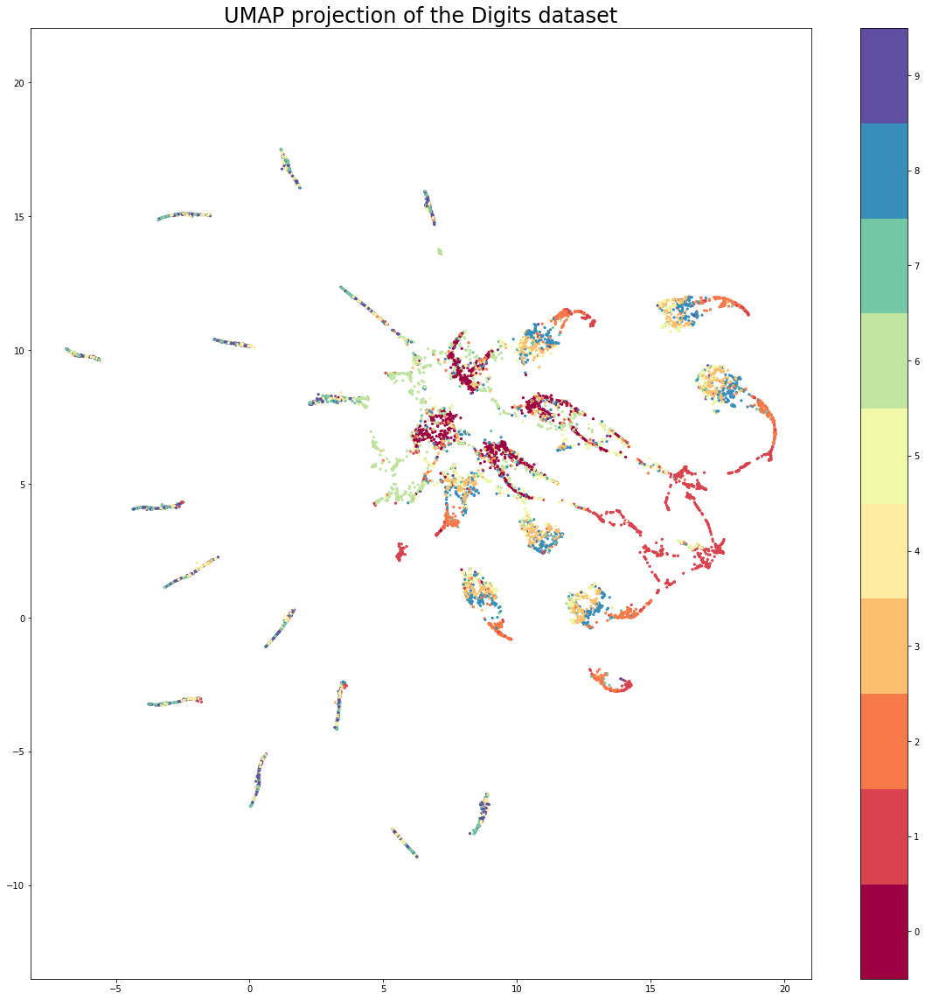

In [126]:
#variational sparse coding
plt.figure(figsize=(20,20))
plt.scatter(embedding[:, 0], embedding[:, 1], c=y_test, cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the Digits dataset', fontsize=24);

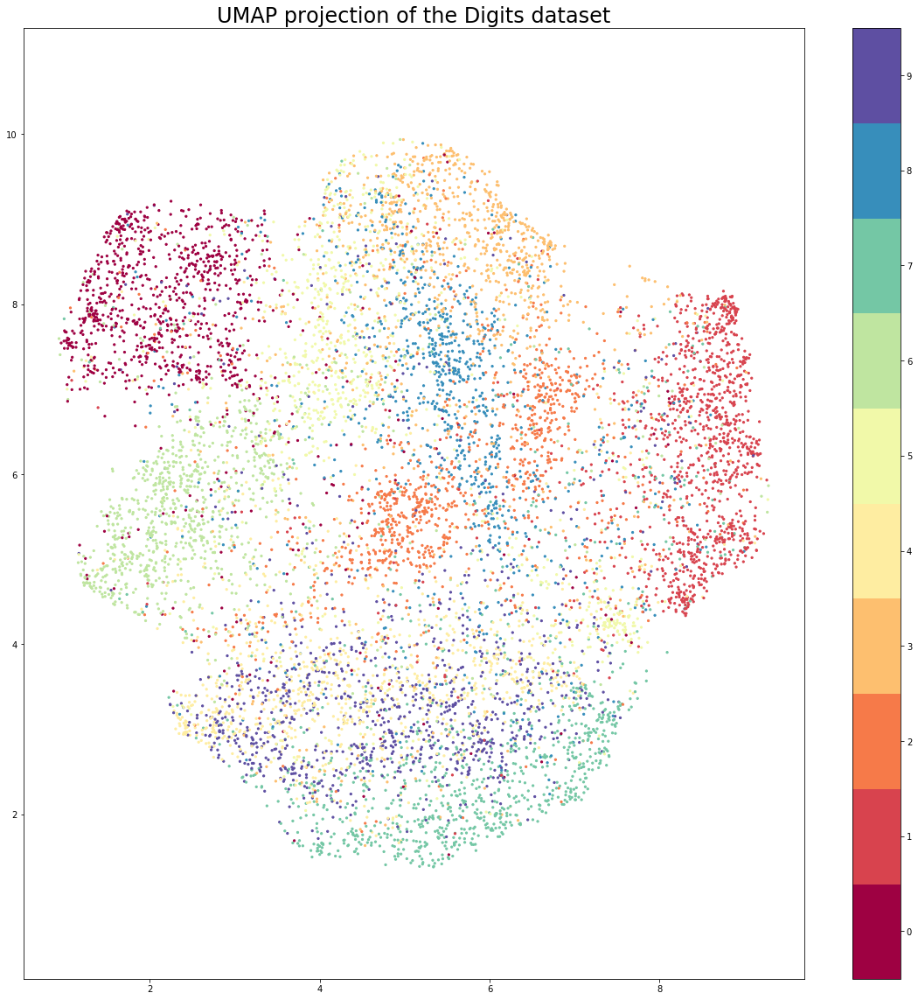

In [145]:
#VAE model 
plt.figure(figsize=(20,20))
plt.scatter(embedding[:, 0], embedding[:, 1], c=y_test, cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the Digits dataset', fontsize=24);

# Con1d-Attention Model MNIST

In [6]:
x_test.shape

(10000, 28, 28)

In [7]:
np.amax(x_test)

1.0

In [10]:
x_tri = np.transpose(x_train,(1,0))

In [11]:
x_tri = x_tri[:,0:1000]

In [24]:
x_tri.shape

(784, 1000, 1)

In [13]:
x_tri = np.atleast_3d(x_tri)

In [14]:
train_iterator = torch.utils.data.DataLoader(x_tri,batch_size = 98,shuffle = True)

In [8]:
class conv_block(nn.Module):
    def __init__(self,t_size,n_step):
        super(conv_block,self).__init__()
        self.cov1d_1 = nn.Conv1d(t_size,t_size,3,stride=1,padding=1,padding_mode = 'zeros')
        self.cov1d_2 = nn.Conv1d(t_size,t_size,3,stride=1,padding=1,padding_mode = 'zeros')
        self.cov1d_3 = nn.Conv1d(t_size,t_size,3,stride=1,padding=1,padding_mode = 'zeros')
        self.attention_1 = nn.MultiheadAttention(n_step, 1)
        self.attention_2 = nn.MultiheadAttention(n_step, 1)
        self.attention_3 = nn.MultiheadAttention(n_step, 1)
        self.norm_1 = nn.LayerNorm([n_step])
        self.norm_2 = nn.LayerNorm([n_step])
        self.norm_3 = nn.LayerNorm([n_step])
        self.drop = nn.Dropout(p=0.2)
        self.relu_1 = nn.ReLU()
        self.relu_2 = nn.ReLU()
        self.relu_3 = nn.ReLU()
        self.relu_4 = nn.ReLU()
        
    def forward(self,x):
        x_input = x
        x_k_v = x_input.transpose(0,1)
        x = self.cov1d_1(x)
        x = self.norm_1(x)
        x = self.relu_1(x)
        x = x.transpose(0,1)
        #implement self-attention layer
        x,_ = self.attention_1(x,x_k_v,x_k_v)
        x = x.transpose(0,1)
        
        x = self.cov1d_2(x)
        x = self.norm_2(x)
        x = self.relu_2(x)
        x = x.transpose(0,1)
        #implement self-attention layer
        x,_ = self.attention_2(x,x_k_v,x_k_v)
        x = x.transpose(0,1)
        
        x = self.cov1d_3(x)
        x = self.norm_3(x)
        x = self.relu_3(x)
        x = x.transpose(0,1)
        #implement self-attention layer
        x,_ = self.attention_3(x,x_k_v,x_k_v)
        x = x.transpose(0,1)
        
        x = self.relu_4(x)
        x = x.add(x_input)
        output = self.drop(x)
        
        return output
        
        

In [9]:
class identity_block(nn.Module):
    def __init__(self,t_size,n_step):
        super(identity_block,self).__init__()
        self.cov1d_1 = nn.Conv1d(t_size,t_size,3,stride=1,padding=1,padding_mode = 'zeros')
        self.attention_1 = nn.MultiheadAttention(n_step, 1)
        self.norm_1 = nn.LayerNorm([n_step])
        self.drop = nn.Dropout(p=0.2)
        self.relu = nn.ReLU()
        
        
    def forward(self,x):
        x_input = x
        x_k_v = x_input.transpose(0,1)
        x = self.cov1d_1(x)
        x = self.norm_1(x)
        x = self.relu(x)
        x = x.transpose(0,1)
        #implement self-attention layer
        x,_ = self.attention_1(x,x_k_v,x_k_v)
        x = x.transpose(0,1)
        output = self.drop(x)
        
        return output
        
        

In [17]:
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder,self).__init__()
        self.cov1d = nn.Conv1d(1,128,3,stride=1,padding=1,padding_mode = 'zeros')
        self.cov1d_1 = nn.Conv1d(128,1,3,stride=1,padding=1,padding_mode = 'zeros')
        self.conv_block_1 = conv_block(t_size=128,n_step=1000)
        self.conv_block_2 = conv_block(t_size=128,n_step=500)
        self.conv_block_3 = conv_block(t_size=128,n_step=250)
        self.iden_block_1 = identity_block(t_size=128,n_step=1000)
        self.iden_block_2 = identity_block(t_size=128,n_step=500)
        self.iden_block_3 = identity_block(t_size=128,n_step=250)
        self.relu_1 = nn.ReLU()
        self.relu_2 = nn.ReLU()
        self.relu_3 = nn.ReLU()
        self.maxpool_1 = nn.MaxPool1d(2,stride=2)
        self.maxpool_2 = nn.MaxPool1d(2,stride=2)
        self.maxpool_3 = nn.MaxPool1d(2,stride=2)
        self.lstm = nn.LSTM(125,32,batch_first=True,bidirectional=True)
        self.dense = nn.Linear(64,20)
#        self.sd = nn.Linear(32,8)
#        self.logspike = nn.Linear(32,8)
        
    def forward(self,x):
        x = x.transpose(1,2)
        x = self.cov1d(x)
        x = self.iden_block_1(x)
        x = self.conv_block_1(x)
        x = self.maxpool_1(x)
        x = self.iden_block_2(x)
        x = self.conv_block_2(x)
        x = self.maxpool_2(x)
        x = self.iden_block_3(x)
        x = self.conv_block_3(x)
        x = self.maxpool_3(x)
        x = self.cov1d_1(x)
        encode,(_,__) = self.lstm(x)
        selection = self.dense(encode)
        selection = self.relu_1(selection)
#         mn = self.mn(encode)
#  #       mn = self.relu_1(mn)
#         sd = self.sd(encode)
#  #       sd = self.relu_2(sd)
#         std = torch.exp(sd*0.5).cuda()
#         eps = torch.normal(1,1,size=std.size()).cuda()
#         gaussian = eps.mul(std).add_(mn).cuda()
        
#         log_spike = -F.relu(-self.logspike(encode))
#         eta = torch.normal(1,1,size=std.size()).cuda()
#         selection = F.relu(50.0*(eta + log_spike.exp() - 1)).cuda()
#         selection = selection.mul(gaussian).cuda()
#         selection = self.relu_3(selection)
        selection = selection.transpose(1,2)
#         x_sample = self.relu_3(x_sample)
#         x_sample = x_sample.transpose(1,2)
        
        return selection
        

In [18]:
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        self.cov1d = nn.Conv1d(128,1,3,stride=1,padding=1,padding_mode = 'zeros')
        self.conv_block_1 = conv_block(t_size=128,n_step=20)
        self.conv_block_2 = conv_block(t_size=128,n_step=40)
        self.conv_block_3 = conv_block(t_size=128,n_step=200)
        self.conv_block_4 = conv_block(t_size=128,n_step=1000)
        self.iden_block_1 = identity_block(t_size=128,n_step=20)
        self.iden_block_2 = identity_block(t_size=128,n_step=40)
        self.iden_block_3 = identity_block(t_size=128,n_step=200)
        self.iden_block_4 = identity_block(t_size=128,n_step=1000)
        self.upsample_1 = nn.Upsample(scale_factor=2, mode='linear', align_corners=True)
        self.upsample_2 = nn.Upsample(scale_factor=5, mode='linear', align_corners=True)
        self.upsample_3 = nn.Upsample(scale_factor=5, mode='linear', align_corners=True)
        

        
    def forward(self,x):
        x = x.transpose(1,2)
        x = x.repeat([1,128,1])
        x = self.iden_block_1(x)
        x = self.conv_block_1(x)
        x = self.upsample_1(x)
        x = self.iden_block_2(x)
        x = self.conv_block_2(x)
        x = self.upsample_2(x)
        x = self.iden_block_3(x)
        x = self.conv_block_3(x)
        x = self.upsample_3(x)
        x = self.iden_block_4(x)
        x = self.conv_block_4(x)
        x = self.cov1d(x)
        x = x.transpose(1,2)
        
        return x
        

In [19]:
class VAE(nn.Module):
    
    ''' This the VAE, which takes a encoder and decoder.

    '''
    def __init__(self, enc, dec):
        super().__init__()

        self.enc = enc
        self.dec = dec

    def forward(self, x):
        # encode
        embedding = self.enc(x)

        # sample from the distribution having latent parameters z_mu, z_var
        # reparameterize

        # decode
        predicted = self.dec(embedding)
        return predicted

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [22]:
encoder = Encoder().to(device)
decoder = Decoder().to(device)
model = VAE(encoder, decoder).to(device)

# optimizer
optimizer = optim.Adam(model.parameters(), lr=3e-5, weight_decay = 1e-7)

In [168]:
def train():
    
     # set the train mode
    model.train()

    # loss of the epoch
    train_loss = 0   

    for i, x in enumerate(train_iterator):
        # reshape the data into [batch_size, 784]
        x = x.to(device, dtype=torch.float)
            
        # update the gradients to zero
        optimizer.zero_grad()

        # forward pass
        predicted_x = model(x)
        
        # reconstruction loss
        loss = F.mse_loss(x, predicted_x, reduction='mean')

        # backward pass
        loss.backward()
        train_loss += loss.item()
            
        # update the weights
        optimizer.step()

    return train_loss

In [ ]:
best_train_loss = float('inf')

N_EPOCHS = 30000
for epoch in range(N_EPOCHS):
    
    
    train_loss = train()
    train_loss /= len(train_iterator)
    print(f'Epoch {epoch}, Train Loss: {train_loss:.4f}')

    if best_train_loss > train_loss:
        best_train_loss = train_loss
        patience_counter = 1
        checkpoint = {
            "net": model.state_dict(),
            'optimizer': optimizer.state_dict(),
            "epoch": epoch,
            "encoder": encoder.state_dict(), 
            'decoder': decoder.state_dict()
        }
        if epoch >=100:
            torch.save(checkpoint, 'MNIST_Att/weights-%s.pkl' % (str(epoch)))
    else:
        patience_counter += 1

    if patience_counter > 15000:
        break

Epoch 0, Train Loss: 0.1229
Epoch 1, Train Loss: 0.1222
Epoch 2, Train Loss: 0.1196
Epoch 3, Train Loss: 0.1096
Epoch 4, Train Loss: 0.0945
Epoch 5, Train Loss: 0.0865
Epoch 6, Train Loss: 0.0798
Epoch 7, Train Loss: 0.0731
Epoch 8, Train Loss: 0.0705
Epoch 9, Train Loss: 0.0691
Epoch 10, Train Loss: 0.0682
Epoch 11, Train Loss: 0.0676
Epoch 12, Train Loss: 0.0671
Epoch 13, Train Loss: 0.0669
Epoch 14, Train Loss: 0.0666
Epoch 15, Train Loss: 0.0664
Epoch 16, Train Loss: 0.0663
Epoch 17, Train Loss: 0.0661
Epoch 18, Train Loss: 0.0660
Epoch 19, Train Loss: 0.0658
Epoch 20, Train Loss: 0.0657
Epoch 21, Train Loss: 0.0656
Epoch 22, Train Loss: 0.0654
Epoch 23, Train Loss: 0.0653
Epoch 24, Train Loss: 0.0653
Epoch 25, Train Loss: 0.0652
Epoch 26, Train Loss: 0.0650
Epoch 27, Train Loss: 0.0650
Epoch 28, Train Loss: 0.0648
Epoch 29, Train Loss: 0.0648
Epoch 30, Train Loss: 0.0647
Epoch 31, Train Loss: 0.0646
Epoch 32, Train Loss: 0.0645
Epoch 33, Train Loss: 0.0645
Epoch 34, Train Loss: 0.

In [23]:
path_checkpoint = "MNIST_Att/weights-5612.pkl"  # 断点路径
checkpoint = torch.load(path_checkpoint)  # 加载断点

model.load_state_dict(checkpoint['net'])# 加载模型可学习参数
encoder.load_state_dict(checkpoint['encoder'])
decoder.load_state_dict(checkpoint['decoder'])
optimizer.load_state_dict(checkpoint['optimizer'])  # 加载优化器参数
start_epoch = checkpoint['epoch']  # 设置开始的epoch

In [25]:
with torch.no_grad():
    value = torch.from_numpy(x_tri)
    test_value = Variable(value.cuda())
    test_value = test_value.float()
#    result,a,b,c = model(test_value)
    result = model(test_value)
    result1 = result.cpu()
#    mn,st,log,embedding = encoder(test_value)
    embedding = encoder(test_value)
    embedding1 = embedding.to('cpu')
    result1 = result1.detach().numpy()
#     result1 = result1.reshape(784,1000,1)
    embedding1 = embedding1.detach().numpy()
    embedding1 = embedding1.reshape(784,20)

In [26]:
result1.shape

(784, 1000, 1)

In [27]:
result1 = np.transpose(result1,(1,0,2))

In [29]:
result1 = result1.reshape(1000,28,28)

In [30]:
x_tri1 = np.transpose(x_tri,(1,0,2))

In [37]:
x_tri.shape

(784, 1000, 1)

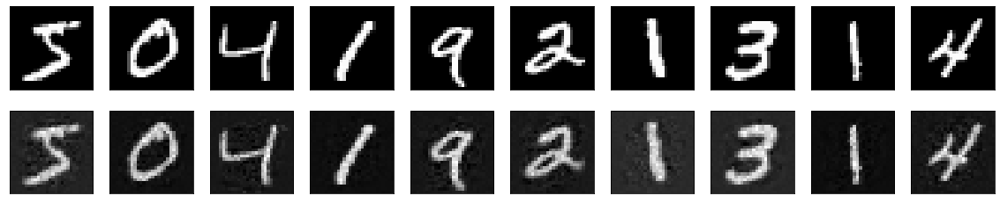

In [31]:
num = 10
plt.figure(figsize=(20, 4))
for i in range(num):
    # display original
    ax = plt.subplot(2, num, i+1)
    plt.imshow(x_tri1[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, num, i +1+ num)
    plt.imshow(result1[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
emb

In [35]:
embedding1.shape

(784, 20)

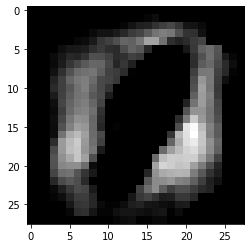

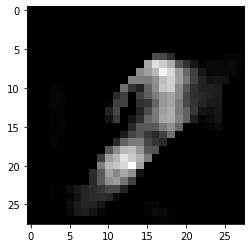

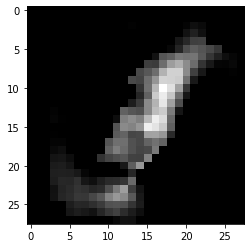

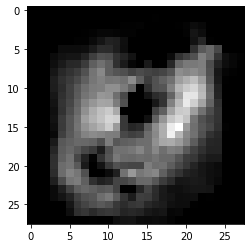

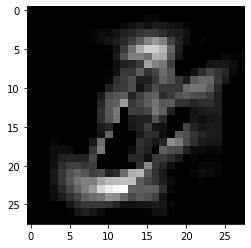

...

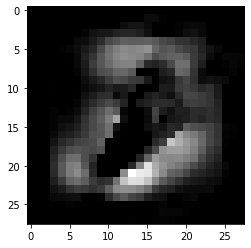

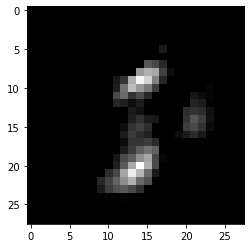

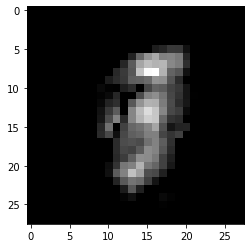

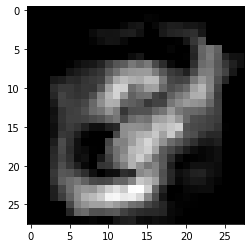

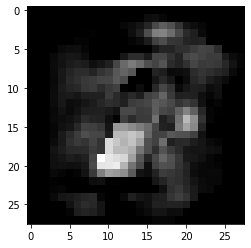

In [32]:
for i in range(20):
    plt.figure()
    plt.imshow(embedding1[:,i].reshape(28,28))

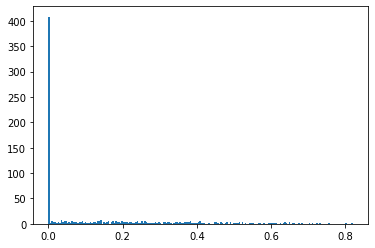

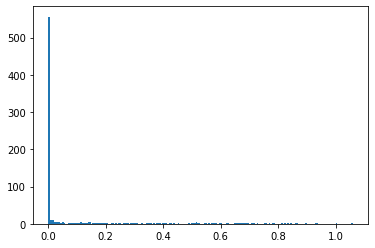

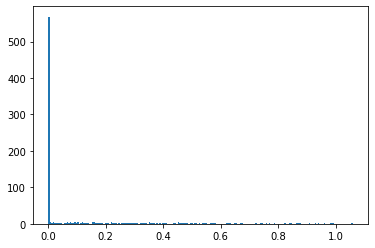

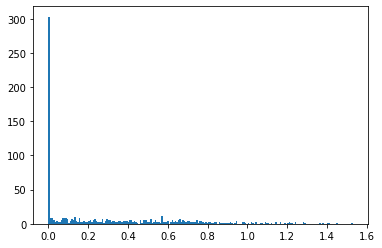

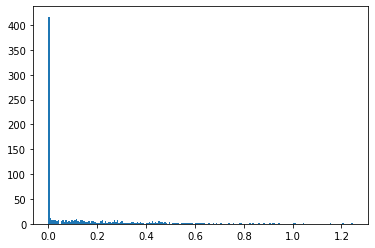

...

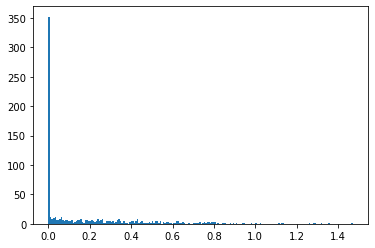

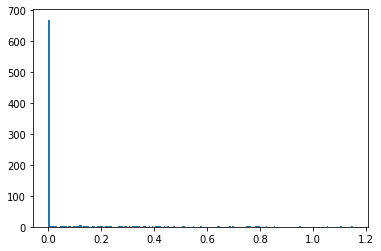

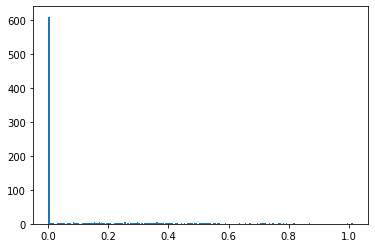

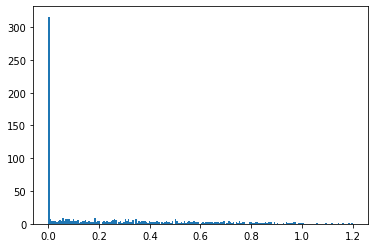

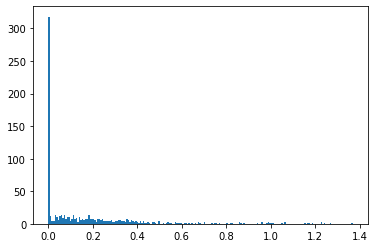

In [34]:
for i in range(20):
    plt.figure()
    plt.hist(embedding1[:,i],200)

In [36]:
i = 0
for name, param in model.named_parameters():
    if param.requires_grad:
        i+=1
        print(name)
        print(i)

enc.cov1d.weight
1
enc.cov1d.bias
2
enc.cov1d_1.weight
3
enc.cov1d_1.bias
4
enc.conv_block_1.cov1d_1.weight
5
enc.conv_block_1.cov1d_1.bias
6
enc.conv_block_1.cov1d_2.weight
7
enc.conv_block_1.cov1d_2.bias
8
enc.conv_block_1.cov1d_3.weight
9
enc.conv_block_1.cov1d_3.bias
10
enc.conv_block_1.attention_1.in_proj_weight
11
enc.conv_block_1.attention_1.in_proj_bias
12
enc.conv_block_1.attention_1.out_proj.weight
13
enc.conv_block_1.attention_1.out_proj.bias
14
enc.conv_block_1.attention_2.in_proj_weight
15
enc.conv_block_1.attention_2.in_proj_bias
16
enc.conv_block_1.attention_2.out_proj.weight
17
enc.conv_block_1.attention_2.out_proj.bias
18
enc.conv_block_1.attention_3.in_proj_weight
19
enc.conv_block_1.attention_3.in_proj_bias
20
enc.conv_block_1.attention_3.out_proj.weight
21
enc.conv_block_1.attention_3.out_proj.bias
22
enc.conv_block_1.norm_1.weight
23
enc.conv_block_1.norm_1.bias
24
enc.conv_block_1.norm_2.weight
25
enc.conv_block_1.norm_2.bias
26
enc.conv_block_1.norm_3.weight
27
e

# Conv1d Attention Test data

In [11]:
x_test.shape

(10000, 28, 28)

In [10]:
x_tes = x_test.reshape(10000,784)

In [12]:
x_tes = np.atleast_3d(x_tes)

In [13]:
x_tes.shape

(10000, 784, 1)

In [14]:
np.amax(x_tes)

1.0

In [28]:
train_iterator = torch.utils.data.DataLoader(x_tes,batch_size = 200,shuffle = True)

In [15]:
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder,self).__init__()
        self.cov1d = nn.Conv1d(1,128,3,stride=1,padding=1,padding_mode = 'zeros')
        self.cov1d_1 = nn.Conv1d(128,1,3,stride=1,padding=1,padding_mode = 'zeros')
        self.conv_block_1 = conv_block(t_size=128,n_step=784)
        self.conv_block_2 = conv_block(t_size=128,n_step=392)
        self.conv_block_3 = conv_block(t_size=128,n_step=196)
        self.iden_block_1 = identity_block(t_size=128,n_step=784)
        self.iden_block_2 = identity_block(t_size=128,n_step=392)
        self.iden_block_3 = identity_block(t_size=128,n_step=196)
        self.relu_1 = nn.ReLU()
        self.relu_2 = nn.ReLU()
        self.relu_3 = nn.ReLU()
        self.maxpool_1 = nn.MaxPool1d(2,stride=2)
        self.maxpool_2 = nn.MaxPool1d(2,stride=2)
        self.maxpool_3 = nn.MaxPool1d(2,stride=2)
        self.lstm = nn.LSTM(98,16,batch_first=True,bidirectional=True)
        self.dense = nn.Linear(32,14)
#        self.sd = nn.Linear(32,8)
#        self.logspike = nn.Linear(32,8)
        
    def forward(self,x):
        x = x.transpose(1,2)
        x = self.cov1d(x)
        x = self.iden_block_1(x)
        x = self.conv_block_1(x)
        x = self.maxpool_1(x)
        x = self.iden_block_2(x)
        x = self.conv_block_2(x)
        x = self.maxpool_2(x)
        x = self.iden_block_3(x)
        x = self.conv_block_3(x)
        x = self.maxpool_3(x)
        x = self.cov1d_1(x)
        encode,(_,__) = self.lstm(x)
        selection = self.dense(encode)
        selection = self.relu_1(selection)
#         mn = self.mn(encode)
#  #       mn = self.relu_1(mn)
#         sd = self.sd(encode)
#  #       sd = self.relu_2(sd)
#         std = torch.exp(sd*0.5).cuda()
#         eps = torch.normal(1,1,size=std.size()).cuda()
#         gaussian = eps.mul(std).add_(mn).cuda()
        
#         log_spike = -F.relu(-self.logspike(encode))
#         eta = torch.normal(1,1,size=std.size()).cuda()
#         selection = F.relu(50.0*(eta + log_spike.exp() - 1)).cuda()
#         selection = selection.mul(gaussian).cuda()
#         selection = self.relu_3(selection)
        selection = selection.transpose(1,2)
#         x_sample = self.relu_3(x_sample)
#         x_sample = x_sample.transpose(1,2)
        
        return selection
        

In [16]:
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        self.cov1d = nn.Conv1d(128,1,3,stride=1,padding=1,padding_mode = 'zeros')
        self.conv_block_1 = conv_block(t_size=128,n_step=14)
        self.conv_block_2 = conv_block(t_size=128,n_step=28)
        self.conv_block_3 = conv_block(t_size=128,n_step=112)
        self.conv_block_4 = conv_block(t_size=128,n_step=784)
        self.iden_block_1 = identity_block(t_size=128,n_step=14)
        self.iden_block_2 = identity_block(t_size=128,n_step=28)
        self.iden_block_3 = identity_block(t_size=128,n_step=112)
        self.iden_block_4 = identity_block(t_size=128,n_step=784)
        self.upsample_1 = nn.Upsample(scale_factor=2, mode='linear', align_corners=True)
        self.upsample_2 = nn.Upsample(scale_factor=4, mode='linear', align_corners=True)
        self.upsample_3 = nn.Upsample(scale_factor=7, mode='linear', align_corners=True)
        

        
    def forward(self,x):
        x = x.transpose(1,2)
        x = x.repeat([1,128,1])
        x = self.iden_block_1(x)
        x = self.conv_block_1(x)
        x = self.upsample_1(x)
        x = self.iden_block_2(x)
        x = self.conv_block_2(x)
        x = self.upsample_2(x)
        x = self.iden_block_3(x)
        x = self.conv_block_3(x)
        x = self.upsample_3(x)
        x = self.iden_block_4(x)
        x = self.conv_block_4(x)
        x = self.cov1d(x)
        x = x.transpose(1,2)
        
        return x
        

In [17]:
class VAE(nn.Module):
    
    ''' This the VAE, which takes a encoder and decoder.

    '''
    def __init__(self, enc, dec):
        super().__init__()

        self.enc = enc
        self.dec = dec

    def forward(self, x):
        # encode
        embedding = self.enc(x)

        # sample from the distribution having latent parameters z_mu, z_var
        # reparameterize

        # decode
        predicted = self.dec(embedding)
        return predicted

In [32]:
encoder = Encoder().to(device)
decoder = Decoder().to(device)
model = VAE(encoder, decoder).to(device)

# optimizer
optimizer = optim.Adam(model.parameters(), lr=3e-5, weight_decay = 1e-7)

In [35]:
def train():
    
     # set the train mode
    model.train()

    # loss of the epoch
    train_loss = 0   

    for i, x in enumerate(train_iterator):
        # reshape the data into [batch_size, 784]
        x = x.to(device, dtype=torch.float)
            
        # update the gradients to zero
        optimizer.zero_grad()

        # forward pass
        predicted_x = model(x)
        
        # reconstruction loss
        loss = F.mse_loss(x, predicted_x, reduction='mean')

        # backward pass
        loss.backward()
        train_loss += loss.item()
            
        # update the weights
        optimizer.step()

    return train_loss

In [22]:
best_train_loss = float('inf')

N_EPOCHS = 30000
for epoch in range(N_EPOCHS):
    
    
    train_loss = train()
    train_loss /= len(train_iterator)
    print(f'Epoch {epoch}, Train Loss: {train_loss:.4f}')

    if best_train_loss > train_loss:
        best_train_loss = train_loss
        patience_counter = 1
        checkpoint = {
            "net": model.state_dict(),
            'optimizer': optimizer.state_dict(),
            "epoch": epoch,
            "encoder": encoder.state_dict(), 
            'decoder': decoder.state_dict()
        }
        if epoch >=1000:
            torch.save(checkpoint, 'MNIST_Test_1/weights-%s.pkl' % (str(epoch)))
    else:
        patience_counter += 1

    if patience_counter > 15000:
        break

Epoch 0, Train Loss: 0.1069
Epoch 1, Train Loss: 0.0699
Epoch 2, Train Loss: 0.0660
Epoch 3, Train Loss: 0.0646
Epoch 4, Train Loss: 0.0643
Epoch 5, Train Loss: 0.0641
Epoch 6, Train Loss: 0.0625
Epoch 7, Train Loss: 0.0590
Epoch 8, Train Loss: 0.0583
Epoch 9, Train Loss: 0.0573
Epoch 10, Train Loss: 0.0566
Epoch 11, Train Loss: 0.0561
Epoch 12, Train Loss: 0.0554
Epoch 13, Train Loss: 0.0537
Epoch 14, Train Loss: 0.0521
Epoch 15, Train Loss: 0.0511
Epoch 16, Train Loss: 0.0504
Epoch 17, Train Loss: 0.0497
Epoch 18, Train Loss: 0.0491
Epoch 19, Train Loss: 0.0482
Epoch 20, Train Loss: 0.0469
Epoch 21, Train Loss: 0.0451
Epoch 22, Train Loss: 0.0430
Epoch 23, Train Loss: 0.0415
Epoch 24, Train Loss: 0.0406
Epoch 25, Train Loss: 0.0397
Epoch 26, Train Loss: 0.0389
Epoch 27, Train Loss: 0.0379
Epoch 28, Train Loss: 0.0368
Epoch 29, Train Loss: 0.0360
Epoch 30, Train Loss: 0.0354
Epoch 31, Train Loss: 0.0349
Epoch 32, Train Loss: 0.0344
Epoch 33, Train Loss: 0.0339
Epoch 34, Train Loss: 0.

Epoch 277, Train Loss: 0.0116
Epoch 278, Train Loss: 0.0116
Epoch 279, Train Loss: 0.0116
Epoch 280, Train Loss: 0.0116
Epoch 281, Train Loss: 0.0116
Epoch 282, Train Loss: 0.0115
Epoch 283, Train Loss: 0.0115
Epoch 284, Train Loss: 0.0115
Epoch 285, Train Loss: 0.0115
Epoch 286, Train Loss: 0.0115
Epoch 287, Train Loss: 0.0115
Epoch 288, Train Loss: 0.0115
Epoch 289, Train Loss: 0.0114
Epoch 290, Train Loss: 0.0114
Epoch 291, Train Loss: 0.0114
Epoch 292, Train Loss: 0.0114
Epoch 293, Train Loss: 0.0113
Epoch 294, Train Loss: 0.0113
Epoch 295, Train Loss: 0.0113
Epoch 296, Train Loss: 0.0113
Epoch 297, Train Loss: 0.0113
Epoch 298, Train Loss: 0.0113
Epoch 299, Train Loss: 0.0112
Epoch 300, Train Loss: 0.0112
Epoch 301, Train Loss: 0.0112
Epoch 302, Train Loss: 0.0112
Epoch 303, Train Loss: 0.0112
Epoch 304, Train Loss: 0.0112
Epoch 305, Train Loss: 0.0112
Epoch 306, Train Loss: 0.0111
Epoch 307, Train Loss: 0.0111
Epoch 308, Train Loss: 0.0111
Epoch 309, Train Loss: 0.0111
Epoch 310,

Epoch 551, Train Loss: 0.0089
Epoch 552, Train Loss: 0.0089
Epoch 553, Train Loss: 0.0089
Epoch 554, Train Loss: 0.0089
Epoch 555, Train Loss: 0.0089
Epoch 556, Train Loss: 0.0089
Epoch 557, Train Loss: 0.0089
Epoch 558, Train Loss: 0.0089
Epoch 559, Train Loss: 0.0089
Epoch 560, Train Loss: 0.0089
Epoch 561, Train Loss: 0.0089
Epoch 562, Train Loss: 0.0089
Epoch 563, Train Loss: 0.0089
Epoch 564, Train Loss: 0.0089
Epoch 565, Train Loss: 0.0089
Epoch 566, Train Loss: 0.0088
Epoch 567, Train Loss: 0.0088
Epoch 568, Train Loss: 0.0088
Epoch 569, Train Loss: 0.0088
Epoch 570, Train Loss: 0.0088
Epoch 571, Train Loss: 0.0088
Epoch 572, Train Loss: 0.0088
Epoch 573, Train Loss: 0.0088
Epoch 574, Train Loss: 0.0088
Epoch 575, Train Loss: 0.0088
Epoch 576, Train Loss: 0.0088
Epoch 577, Train Loss: 0.0088
Epoch 578, Train Loss: 0.0088
Epoch 579, Train Loss: 0.0088
Epoch 580, Train Loss: 0.0088
Epoch 581, Train Loss: 0.0088
Epoch 582, Train Loss: 0.0088
Epoch 583, Train Loss: 0.0088
Epoch 584,

Epoch 825, Train Loss: 0.0079
Epoch 826, Train Loss: 0.0079
Epoch 827, Train Loss: 0.0079
Epoch 828, Train Loss: 0.0079
Epoch 829, Train Loss: 0.0079
Epoch 830, Train Loss: 0.0079
Epoch 831, Train Loss: 0.0079
Epoch 832, Train Loss: 0.0079
Epoch 833, Train Loss: 0.0079
Epoch 834, Train Loss: 0.0079
Epoch 835, Train Loss: 0.0079
Epoch 836, Train Loss: 0.0079
Epoch 837, Train Loss: 0.0078
Epoch 838, Train Loss: 0.0079
Epoch 839, Train Loss: 0.0079
Epoch 840, Train Loss: 0.0079
Epoch 841, Train Loss: 0.0078
Epoch 842, Train Loss: 0.0078
Epoch 843, Train Loss: 0.0078
Epoch 844, Train Loss: 0.0078
Epoch 845, Train Loss: 0.0079
Epoch 846, Train Loss: 0.0078
Epoch 847, Train Loss: 0.0078
Epoch 848, Train Loss: 0.0078
Epoch 849, Train Loss: 0.0078
Epoch 850, Train Loss: 0.0078
Epoch 851, Train Loss: 0.0078
Epoch 852, Train Loss: 0.0078
Epoch 853, Train Loss: 0.0078
Epoch 854, Train Loss: 0.0078
Epoch 855, Train Loss: 0.0078
Epoch 856, Train Loss: 0.0078
Epoch 857, Train Loss: 0.0078
Epoch 858,

Epoch 1095, Train Loss: 0.0073
Epoch 1096, Train Loss: 0.0073
Epoch 1097, Train Loss: 0.0073
Epoch 1098, Train Loss: 0.0073
Epoch 1099, Train Loss: 0.0073
Epoch 1100, Train Loss: 0.0073
Epoch 1101, Train Loss: 0.0073
Epoch 1102, Train Loss: 0.0073
Epoch 1103, Train Loss: 0.0073
Epoch 1104, Train Loss: 0.0073
Epoch 1105, Train Loss: 0.0073
Epoch 1106, Train Loss: 0.0073
Epoch 1107, Train Loss: 0.0073
Epoch 1108, Train Loss: 0.0073
Epoch 1109, Train Loss: 0.0073
Epoch 1110, Train Loss: 0.0073
Epoch 1111, Train Loss: 0.0073
Epoch 1112, Train Loss: 0.0073
Epoch 1113, Train Loss: 0.0073
Epoch 1114, Train Loss: 0.0073
Epoch 1115, Train Loss: 0.0073
Epoch 1116, Train Loss: 0.0073
Epoch 1117, Train Loss: 0.0072
Epoch 1118, Train Loss: 0.0073
Epoch 1119, Train Loss: 0.0073
Epoch 1120, Train Loss: 0.0072
Epoch 1121, Train Loss: 0.0073
Epoch 1122, Train Loss: 0.0073
Epoch 1123, Train Loss: 0.0073
Epoch 1124, Train Loss: 0.0073
Epoch 1125, Train Loss: 0.0072
Epoch 1126, Train Loss: 0.0073
Epoch 11

Epoch 1360, Train Loss: 0.0069
Epoch 1361, Train Loss: 0.0069
Epoch 1362, Train Loss: 0.0069
Epoch 1363, Train Loss: 0.0069
Epoch 1364, Train Loss: 0.0069
Epoch 1365, Train Loss: 0.0069
Epoch 1366, Train Loss: 0.0069
Epoch 1367, Train Loss: 0.0069
Epoch 1368, Train Loss: 0.0069
Epoch 1369, Train Loss: 0.0069
Epoch 1370, Train Loss: 0.0069
Epoch 1371, Train Loss: 0.0069
Epoch 1372, Train Loss: 0.0069
Epoch 1373, Train Loss: 0.0069
Epoch 1374, Train Loss: 0.0069
Epoch 1375, Train Loss: 0.0069
Epoch 1376, Train Loss: 0.0069
Epoch 1377, Train Loss: 0.0069
Epoch 1378, Train Loss: 0.0069
Epoch 1379, Train Loss: 0.0069
Epoch 1380, Train Loss: 0.0069
Epoch 1381, Train Loss: 0.0069
Epoch 1382, Train Loss: 0.0069
Epoch 1383, Train Loss: 0.0069
Epoch 1384, Train Loss: 0.0068
Epoch 1385, Train Loss: 0.0069
Epoch 1386, Train Loss: 0.0068
Epoch 1387, Train Loss: 0.0069
Epoch 1388, Train Loss: 0.0068
Epoch 1389, Train Loss: 0.0068
Epoch 1390, Train Loss: 0.0068
Epoch 1391, Train Loss: 0.0068
Epoch 13

Epoch 1625, Train Loss: 0.0066
Epoch 1626, Train Loss: 0.0066
Epoch 1627, Train Loss: 0.0066
Epoch 1628, Train Loss: 0.0066
Epoch 1629, Train Loss: 0.0066
Epoch 1630, Train Loss: 0.0066
Epoch 1631, Train Loss: 0.0066
Epoch 1632, Train Loss: 0.0066
Epoch 1633, Train Loss: 0.0066
Epoch 1634, Train Loss: 0.0066
Epoch 1635, Train Loss: 0.0066
Epoch 1636, Train Loss: 0.0066
Epoch 1637, Train Loss: 0.0066
Epoch 1638, Train Loss: 0.0066
Epoch 1639, Train Loss: 0.0065
Epoch 1640, Train Loss: 0.0066
Epoch 1641, Train Loss: 0.0065
Epoch 1642, Train Loss: 0.0065
Epoch 1643, Train Loss: 0.0065
Epoch 1644, Train Loss: 0.0065
Epoch 1645, Train Loss: 0.0066
Epoch 1646, Train Loss: 0.0065
Epoch 1647, Train Loss: 0.0065
Epoch 1648, Train Loss: 0.0065
Epoch 1649, Train Loss: 0.0065
Epoch 1650, Train Loss: 0.0066
Epoch 1651, Train Loss: 0.0065
Epoch 1652, Train Loss: 0.0065
Epoch 1653, Train Loss: 0.0065
Epoch 1654, Train Loss: 0.0065
Epoch 1655, Train Loss: 0.0065
Epoch 1656, Train Loss: 0.0065
Epoch 16

Epoch 1890, Train Loss: 0.0062
Epoch 1891, Train Loss: 0.0062
Epoch 1892, Train Loss: 0.0062
Epoch 1893, Train Loss: 0.0062
Epoch 1894, Train Loss: 0.0062
Epoch 1895, Train Loss: 0.0062
Epoch 1896, Train Loss: 0.0062
Epoch 1897, Train Loss: 0.0062
Epoch 1898, Train Loss: 0.0062
Epoch 1899, Train Loss: 0.0062
Epoch 1900, Train Loss: 0.0062
Epoch 1901, Train Loss: 0.0062
Epoch 1902, Train Loss: 0.0062
Epoch 1903, Train Loss: 0.0062
Epoch 1904, Train Loss: 0.0062
Epoch 1905, Train Loss: 0.0062
Epoch 1906, Train Loss: 0.0062
Epoch 1907, Train Loss: 0.0062
Epoch 1908, Train Loss: 0.0062
Epoch 1909, Train Loss: 0.0062
Epoch 1910, Train Loss: 0.0062
Epoch 1911, Train Loss: 0.0062
Epoch 1912, Train Loss: 0.0062
Epoch 1913, Train Loss: 0.0062
Epoch 1914, Train Loss: 0.0062
Epoch 1915, Train Loss: 0.0062
Epoch 1916, Train Loss: 0.0062
Epoch 1917, Train Loss: 0.0062
Epoch 1918, Train Loss: 0.0062
Epoch 1919, Train Loss: 0.0062
Epoch 1920, Train Loss: 0.0061
Epoch 1921, Train Loss: 0.0062
Epoch 19

Epoch 2155, Train Loss: 0.0058
Epoch 2156, Train Loss: 0.0058
Epoch 2157, Train Loss: 0.0058
Epoch 2158, Train Loss: 0.0058
Epoch 2159, Train Loss: 0.0058
Epoch 2160, Train Loss: 0.0058
Epoch 2161, Train Loss: 0.0058
Epoch 2162, Train Loss: 0.0058
Epoch 2163, Train Loss: 0.0058
Epoch 2164, Train Loss: 0.0058
Epoch 2165, Train Loss: 0.0058
Epoch 2166, Train Loss: 0.0058
Epoch 2167, Train Loss: 0.0058
Epoch 2168, Train Loss: 0.0058
Epoch 2169, Train Loss: 0.0058
Epoch 2170, Train Loss: 0.0058
Epoch 2171, Train Loss: 0.0058
Epoch 2172, Train Loss: 0.0058
Epoch 2173, Train Loss: 0.0058
Epoch 2174, Train Loss: 0.0058
Epoch 2175, Train Loss: 0.0058
Epoch 2176, Train Loss: 0.0058
Epoch 2177, Train Loss: 0.0058
Epoch 2178, Train Loss: 0.0058
Epoch 2179, Train Loss: 0.0058
Epoch 2180, Train Loss: 0.0058
Epoch 2181, Train Loss: 0.0058
Epoch 2182, Train Loss: 0.0058
Epoch 2183, Train Loss: 0.0058
Epoch 2184, Train Loss: 0.0058
Epoch 2185, Train Loss: 0.0058
Epoch 2186, Train Loss: 0.0058
Epoch 21

Epoch 2420, Train Loss: 0.0056
Epoch 2421, Train Loss: 0.0056
Epoch 2422, Train Loss: 0.0056
Epoch 2423, Train Loss: 0.0056
Epoch 2424, Train Loss: 0.0056
Epoch 2425, Train Loss: 0.0056
Epoch 2426, Train Loss: 0.0056
Epoch 2427, Train Loss: 0.0056
Epoch 2428, Train Loss: 0.0056
Epoch 2429, Train Loss: 0.0056
Epoch 2430, Train Loss: 0.0056
Epoch 2431, Train Loss: 0.0056
Epoch 2432, Train Loss: 0.0056
Epoch 2433, Train Loss: 0.0056
Epoch 2434, Train Loss: 0.0056
Epoch 2435, Train Loss: 0.0056
Epoch 2436, Train Loss: 0.0056
Epoch 2437, Train Loss: 0.0056
Epoch 2438, Train Loss: 0.0056
Epoch 2439, Train Loss: 0.0056
Epoch 2440, Train Loss: 0.0056
Epoch 2441, Train Loss: 0.0056
Epoch 2442, Train Loss: 0.0056
Epoch 2443, Train Loss: 0.0056
Epoch 2444, Train Loss: 0.0056
Epoch 2445, Train Loss: 0.0056
Epoch 2446, Train Loss: 0.0056
Epoch 2447, Train Loss: 0.0056
Epoch 2448, Train Loss: 0.0056
Epoch 2449, Train Loss: 0.0056
Epoch 2450, Train Loss: 0.0056
Epoch 2451, Train Loss: 0.0056
Epoch 24

Epoch 2685, Train Loss: 0.0054
Epoch 2686, Train Loss: 0.0054
Epoch 2687, Train Loss: 0.0054
Epoch 2688, Train Loss: 0.0054
Epoch 2689, Train Loss: 0.0054
Epoch 2690, Train Loss: 0.0054
Epoch 2691, Train Loss: 0.0054
Epoch 2692, Train Loss: 0.0054
Epoch 2693, Train Loss: 0.0054
Epoch 2694, Train Loss: 0.0054
Epoch 2695, Train Loss: 0.0054
Epoch 2696, Train Loss: 0.0054
Epoch 2697, Train Loss: 0.0054
Epoch 2698, Train Loss: 0.0054
Epoch 2699, Train Loss: 0.0054
Epoch 2700, Train Loss: 0.0054
Epoch 2701, Train Loss: 0.0054
Epoch 2702, Train Loss: 0.0054
Epoch 2703, Train Loss: 0.0054
Epoch 2704, Train Loss: 0.0054
Epoch 2705, Train Loss: 0.0054
Epoch 2706, Train Loss: 0.0054
Epoch 2707, Train Loss: 0.0054
Epoch 2708, Train Loss: 0.0054
Epoch 2709, Train Loss: 0.0054
Epoch 2710, Train Loss: 0.0054
Epoch 2711, Train Loss: 0.0054
Epoch 2712, Train Loss: 0.0054
Epoch 2713, Train Loss: 0.0054
Epoch 2714, Train Loss: 0.0054
Epoch 2715, Train Loss: 0.0054
Epoch 2716, Train Loss: 0.0054
Epoch 27

Epoch 2950, Train Loss: 0.0053
Epoch 2951, Train Loss: 0.0053
Epoch 2952, Train Loss: 0.0053
Epoch 2953, Train Loss: 0.0053
Epoch 2954, Train Loss: 0.0053
Epoch 2955, Train Loss: 0.0053
Epoch 2956, Train Loss: 0.0053
Epoch 2957, Train Loss: 0.0053
Epoch 2958, Train Loss: 0.0053
Epoch 2959, Train Loss: 0.0053
Epoch 2960, Train Loss: 0.0053
Epoch 2961, Train Loss: 0.0053
Epoch 2962, Train Loss: 0.0053
Epoch 2963, Train Loss: 0.0053
Epoch 2964, Train Loss: 0.0053
Epoch 2965, Train Loss: 0.0053
Epoch 2966, Train Loss: 0.0053
Epoch 2967, Train Loss: 0.0053
Epoch 2968, Train Loss: 0.0053
Epoch 2969, Train Loss: 0.0053
Epoch 2970, Train Loss: 0.0053
Epoch 2971, Train Loss: 0.0053
Epoch 2972, Train Loss: 0.0053
Epoch 2973, Train Loss: 0.0053
Epoch 2974, Train Loss: 0.0053
Epoch 2975, Train Loss: 0.0053
Epoch 2976, Train Loss: 0.0053
Epoch 2977, Train Loss: 0.0053
Epoch 2978, Train Loss: 0.0053
Epoch 2979, Train Loss: 0.0053
Epoch 2980, Train Loss: 0.0053
Epoch 2981, Train Loss: 0.0053
Epoch 29

Epoch 3215, Train Loss: 0.0052
Epoch 3216, Train Loss: 0.0052
Epoch 3217, Train Loss: 0.0052
Epoch 3218, Train Loss: 0.0052
Epoch 3219, Train Loss: 0.0052
Epoch 3220, Train Loss: 0.0052
Epoch 3221, Train Loss: 0.0052
Epoch 3222, Train Loss: 0.0052
Epoch 3223, Train Loss: 0.0052
Epoch 3224, Train Loss: 0.0052
Epoch 3225, Train Loss: 0.0052
Epoch 3226, Train Loss: 0.0052
Epoch 3227, Train Loss: 0.0052
Epoch 3228, Train Loss: 0.0052
Epoch 3229, Train Loss: 0.0052
Epoch 3230, Train Loss: 0.0052
Epoch 3231, Train Loss: 0.0052
Epoch 3232, Train Loss: 0.0052
Epoch 3233, Train Loss: 0.0052
Epoch 3234, Train Loss: 0.0052
Epoch 3235, Train Loss: 0.0052
Epoch 3236, Train Loss: 0.0052
Epoch 3237, Train Loss: 0.0052
Epoch 3238, Train Loss: 0.0052
Epoch 3239, Train Loss: 0.0052
Epoch 3240, Train Loss: 0.0052
Epoch 3241, Train Loss: 0.0052
Epoch 3242, Train Loss: 0.0052
Epoch 3243, Train Loss: 0.0052
Epoch 3244, Train Loss: 0.0052
Epoch 3245, Train Loss: 0.0052
Epoch 3246, Train Loss: 0.0052
Epoch 32

Epoch 3480, Train Loss: 0.0051
Epoch 3481, Train Loss: 0.0051
Epoch 3482, Train Loss: 0.0051
Epoch 3483, Train Loss: 0.0051
Epoch 3484, Train Loss: 0.0051
Epoch 3485, Train Loss: 0.0051
Epoch 3486, Train Loss: 0.0051
Epoch 3487, Train Loss: 0.0051
Epoch 3488, Train Loss: 0.0051
Epoch 3489, Train Loss: 0.0051
Epoch 3490, Train Loss: 0.0051
Epoch 3491, Train Loss: 0.0051
Epoch 3492, Train Loss: 0.0051
Epoch 3493, Train Loss: 0.0051
Epoch 3494, Train Loss: 0.0051
Epoch 3495, Train Loss: 0.0051
Epoch 3496, Train Loss: 0.0051
Epoch 3497, Train Loss: 0.0051
Epoch 3498, Train Loss: 0.0051
Epoch 3499, Train Loss: 0.0051
Epoch 3500, Train Loss: 0.0051
Epoch 3501, Train Loss: 0.0051
Epoch 3502, Train Loss: 0.0051
Epoch 3503, Train Loss: 0.0051
Epoch 3504, Train Loss: 0.0051
Epoch 3505, Train Loss: 0.0051
Epoch 3506, Train Loss: 0.0051
Epoch 3507, Train Loss: 0.0051
Epoch 3508, Train Loss: 0.0051
Epoch 3509, Train Loss: 0.0051
Epoch 3510, Train Loss: 0.0051
Epoch 3511, Train Loss: 0.0051
Epoch 35

Epoch 3745, Train Loss: 0.0050
Epoch 3746, Train Loss: 0.0050
Epoch 3747, Train Loss: 0.0050
Epoch 3748, Train Loss: 0.0050
Epoch 3749, Train Loss: 0.0050
Epoch 3750, Train Loss: 0.0050
Epoch 3751, Train Loss: 0.0050
Epoch 3752, Train Loss: 0.0050
Epoch 3753, Train Loss: 0.0050
Epoch 3754, Train Loss: 0.0050
Epoch 3755, Train Loss: 0.0050
Epoch 3756, Train Loss: 0.0050
Epoch 3757, Train Loss: 0.0050
Epoch 3758, Train Loss: 0.0050
Epoch 3759, Train Loss: 0.0050
Epoch 3760, Train Loss: 0.0050
Epoch 3761, Train Loss: 0.0050
Epoch 3762, Train Loss: 0.0050
Epoch 3763, Train Loss: 0.0050
Epoch 3764, Train Loss: 0.0050
Epoch 3765, Train Loss: 0.0050
Epoch 3766, Train Loss: 0.0050
Epoch 3767, Train Loss: 0.0050
Epoch 3768, Train Loss: 0.0050
Epoch 3769, Train Loss: 0.0050
Epoch 3770, Train Loss: 0.0050
Epoch 3771, Train Loss: 0.0050
Epoch 3772, Train Loss: 0.0050
Epoch 3773, Train Loss: 0.0050
Epoch 3774, Train Loss: 0.0050
Epoch 3775, Train Loss: 0.0050
Epoch 3776, Train Loss: 0.0050
Epoch 37

Epoch 4010, Train Loss: 0.0049
Epoch 4011, Train Loss: 0.0049
Epoch 4012, Train Loss: 0.0049
Epoch 4013, Train Loss: 0.0049
Epoch 4014, Train Loss: 0.0049
Epoch 4015, Train Loss: 0.0049
Epoch 4016, Train Loss: 0.0049
Epoch 4017, Train Loss: 0.0049
Epoch 4018, Train Loss: 0.0049
Epoch 4019, Train Loss: 0.0049
Epoch 4020, Train Loss: 0.0049
Epoch 4021, Train Loss: 0.0049
Epoch 4022, Train Loss: 0.0049
Epoch 4023, Train Loss: 0.0049
Epoch 4024, Train Loss: 0.0049
Epoch 4025, Train Loss: 0.0049
Epoch 4026, Train Loss: 0.0049
Epoch 4027, Train Loss: 0.0049
Epoch 4028, Train Loss: 0.0049
Epoch 4029, Train Loss: 0.0049
Epoch 4030, Train Loss: 0.0049
Epoch 4031, Train Loss: 0.0049
Epoch 4032, Train Loss: 0.0049
Epoch 4033, Train Loss: 0.0049
Epoch 4034, Train Loss: 0.0049
Epoch 4035, Train Loss: 0.0049
Epoch 4036, Train Loss: 0.0049
Epoch 4037, Train Loss: 0.0049
Epoch 4038, Train Loss: 0.0049
Epoch 4039, Train Loss: 0.0049
Epoch 4040, Train Loss: 0.0049
Epoch 4041, Train Loss: 0.0049
Epoch 40

Epoch 4275, Train Loss: 0.0048
Epoch 4276, Train Loss: 0.0048
Epoch 4277, Train Loss: 0.0049
Epoch 4278, Train Loss: 0.0049
Epoch 4279, Train Loss: 0.0049
Epoch 4280, Train Loss: 0.0049
Epoch 4281, Train Loss: 0.0048
Epoch 4282, Train Loss: 0.0049
Epoch 4283, Train Loss: 0.0048
Epoch 4284, Train Loss: 0.0049
Epoch 4285, Train Loss: 0.0048
Epoch 4286, Train Loss: 0.0048
Epoch 4287, Train Loss: 0.0048
Epoch 4288, Train Loss: 0.0048
Epoch 4289, Train Loss: 0.0048
Epoch 4290, Train Loss: 0.0048
Epoch 4291, Train Loss: 0.0048
Epoch 4292, Train Loss: 0.0048
Epoch 4293, Train Loss: 0.0048
Epoch 4294, Train Loss: 0.0048
Epoch 4295, Train Loss: 0.0048
Epoch 4296, Train Loss: 0.0048
Epoch 4297, Train Loss: 0.0048
Epoch 4298, Train Loss: 0.0048
Epoch 4299, Train Loss: 0.0048
Epoch 4300, Train Loss: 0.0048
Epoch 4301, Train Loss: 0.0048
Epoch 4302, Train Loss: 0.0048
Epoch 4303, Train Loss: 0.0048
Epoch 4304, Train Loss: 0.0048
Epoch 4305, Train Loss: 0.0048
Epoch 4306, Train Loss: 0.0048
Epoch 43

Epoch 4540, Train Loss: 0.0048
Epoch 4541, Train Loss: 0.0048
Epoch 4542, Train Loss: 0.0048
Epoch 4543, Train Loss: 0.0048
Epoch 4544, Train Loss: 0.0048
Epoch 4545, Train Loss: 0.0048
Epoch 4546, Train Loss: 0.0048
Epoch 4547, Train Loss: 0.0048
Epoch 4548, Train Loss: 0.0048
Epoch 4549, Train Loss: 0.0048
Epoch 4550, Train Loss: 0.0048
Epoch 4551, Train Loss: 0.0048
Epoch 4552, Train Loss: 0.0048
Epoch 4553, Train Loss: 0.0048
Epoch 4554, Train Loss: 0.0048
Epoch 4555, Train Loss: 0.0048
Epoch 4556, Train Loss: 0.0048
Epoch 4557, Train Loss: 0.0048
Epoch 4558, Train Loss: 0.0048
Epoch 4559, Train Loss: 0.0048
Epoch 4560, Train Loss: 0.0048
Epoch 4561, Train Loss: 0.0048
Epoch 4562, Train Loss: 0.0048
Epoch 4563, Train Loss: 0.0048
Epoch 4564, Train Loss: 0.0048
Epoch 4565, Train Loss: 0.0048
Epoch 4566, Train Loss: 0.0048
Epoch 4567, Train Loss: 0.0048
Epoch 4568, Train Loss: 0.0048
Epoch 4569, Train Loss: 0.0048
Epoch 4570, Train Loss: 0.0048
Epoch 4571, Train Loss: 0.0048
Epoch 45

KeyboardInterrupt: 

In [ ]:
best_train_loss = float('inf')

N_EPOCHS = 30000
for epoch in range(N_EPOCHS):
    
    
    train_loss = train()
    train_loss /= len(train_iterator)
    print(f'Epoch {epoch}, Train Loss: {train_loss:.4f}')

    if best_train_loss > train_loss:
        best_train_loss = train_loss
        patience_counter = 1
        checkpoint = {
            "net": model.state_dict(),
            'optimizer': optimizer.state_dict(),
            "epoch": epoch,
            "encoder": encoder.state_dict(), 
            'decoder': decoder.state_dict()
        }
        if epoch >=1000:
            torch.save(checkpoint, 'MNIST_Test_1/weights-%s.pkl' % (str(epoch)))
    else:
        patience_counter += 1

    if patience_counter > 15000:
        break

Epoch 0, Train Loss: 0.1168
Epoch 1, Train Loss: 0.0796
Epoch 2, Train Loss: 0.0680
Epoch 3, Train Loss: 0.0658
Epoch 4, Train Loss: 0.0652
Epoch 5, Train Loss: 0.0648
Epoch 6, Train Loss: 0.0645
Epoch 7, Train Loss: 0.0643
Epoch 8, Train Loss: 0.0640
Epoch 9, Train Loss: 0.0627
Epoch 10, Train Loss: 0.0590
Epoch 11, Train Loss: 0.0583
Epoch 12, Train Loss: 0.0579
Epoch 13, Train Loss: 0.0575
Epoch 14, Train Loss: 0.0570
Epoch 15, Train Loss: 0.0565
Epoch 16, Train Loss: 0.0559
Epoch 17, Train Loss: 0.0554
Epoch 18, Train Loss: 0.0548
Epoch 19, Train Loss: 0.0543
Epoch 20, Train Loss: 0.0538
Epoch 21, Train Loss: 0.0534
Epoch 22, Train Loss: 0.0530
Epoch 23, Train Loss: 0.0526
Epoch 24, Train Loss: 0.0515
Epoch 25, Train Loss: 0.0502
Epoch 26, Train Loss: 0.0492
Epoch 27, Train Loss: 0.0482
Epoch 28, Train Loss: 0.0473
Epoch 29, Train Loss: 0.0466
Epoch 30, Train Loss: 0.0460
Epoch 31, Train Loss: 0.0455
Epoch 32, Train Loss: 0.0450
Epoch 33, Train Loss: 0.0446
Epoch 34, Train Loss: 0.

Epoch 277, Train Loss: 0.0218
Epoch 278, Train Loss: 0.0218
Epoch 279, Train Loss: 0.0218
Epoch 280, Train Loss: 0.0218
Epoch 281, Train Loss: 0.0218
Epoch 282, Train Loss: 0.0217
Epoch 283, Train Loss: 0.0217
Epoch 284, Train Loss: 0.0217
Epoch 285, Train Loss: 0.0217
Epoch 286, Train Loss: 0.0217
Epoch 287, Train Loss: 0.0216
Epoch 288, Train Loss: 0.0216
Epoch 289, Train Loss: 0.0216
Epoch 290, Train Loss: 0.0216
Epoch 291, Train Loss: 0.0216


In [37]:
path_checkpoint = "MNIST_Test_1/weights-7201+4755.pkl"  # 断点路径
checkpoint = torch.load(path_checkpoint)  # 加载断点

model.load_state_dict(checkpoint['net'])# 加载模型可学习参数
encoder.load_state_dict(checkpoint['encoder'])
decoder.load_state_dict(checkpoint['decoder'])
optimizer.load_state_dict(checkpoint['optimizer'])  # 加载优化器参数
start_epoch = checkpoint['epoch']  # 设置开始的epoch

In [21]:
x_z = x_tes[0:4000]    

In [38]:
with torch.no_grad():
    value = torch.from_numpy(x_z)
    test_value = Variable(value.cuda())
    test_value = test_value.float()
#    result,a,b,c = model(test_value)
    result = model(test_value)
    result1 = result.cpu()
#    mn,st,log,embedding = encoder(test_value)
    embedding = encoder(test_value)
    embedding1 = embedding.to('cpu')
    result1 = result1.detach().numpy()
#     result1 = result1.reshape(784,1000,1)
    embedding1 = embedding1.detach().numpy()
    embedding1 = embedding1.reshape(4000,14)

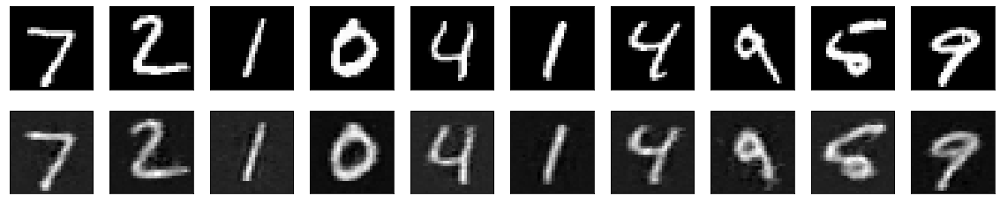

In [39]:
num = 10
plt.figure(figsize=(20, 4))
for i in range(num):
    # display original
    ax = plt.subplot(2, num, i+1)
    plt.imshow(x_z[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, num, i +1+ num)
    plt.imshow(result1[i].reshape(28,28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [40]:
in0 = np.argwhere(y_test[0:4000]==0)
in1 = np.argwhere(y_test[0:4000]==1)
in2 = np.argwhere(y_test[0:4000]==2)
in3 = np.argwhere(y_test[0:4000]==3)
in4 = np.argwhere(y_test[0:4000]==4)
in5 = np.argwhere(y_test[0:4000]==5)
in6 = np.argwhere(y_test[0:4000]==6)
in7 = np.argwhere(y_test[0:4000]==7)
in8 = np.argwhere(y_test[0:4000]==8)
in9 = np.argwhere(y_test[0:4000]==9)

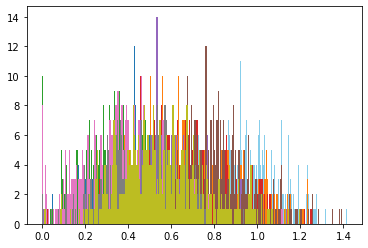

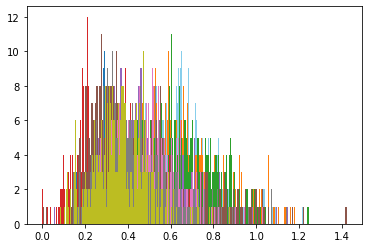

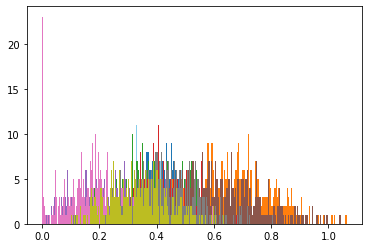

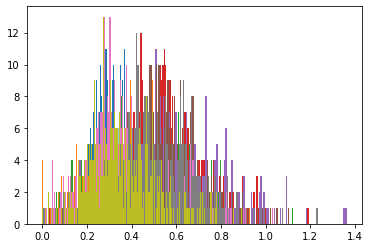

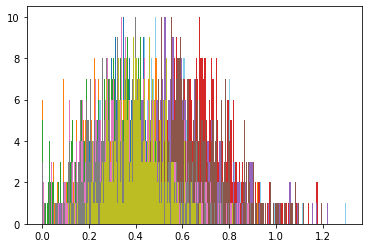

...

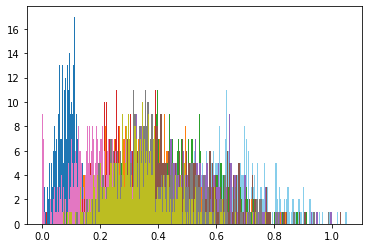

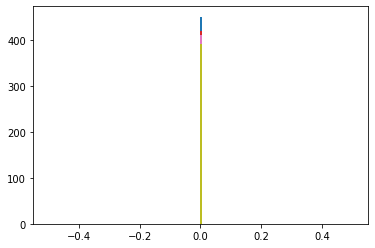

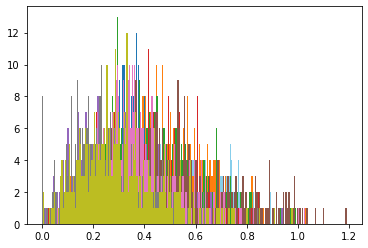

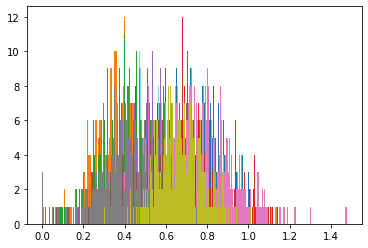

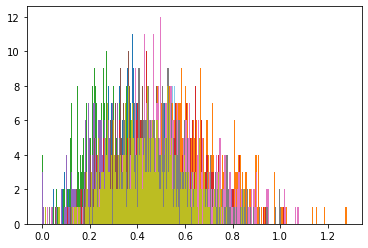

In [43]:
for i in range(14):
    plt.figure()
    plt.hist(embedding1[in0,i],200,color = "skyblue")
    plt.hist(embedding1[in1,i],200)
    plt.hist(embedding1[in2,i],200)
    plt.hist(embedding1[in3,i],200)
    plt.hist(embedding1[in4,i],200)
    plt.hist(embedding1[in5,i],200)
    plt.hist(embedding1[in6,i],200)
    plt.hist(embedding1[in7,i],200)
    plt.hist(embedding1[in8,i],200)
    plt.hist(embedding1[in9,i],200)

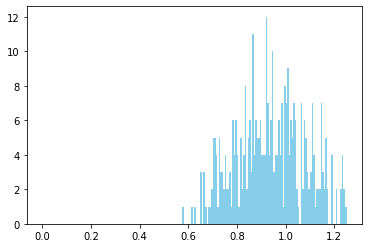

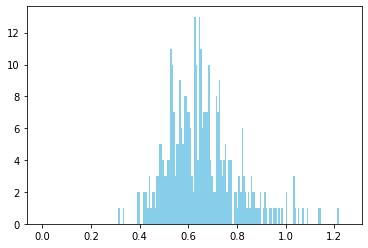

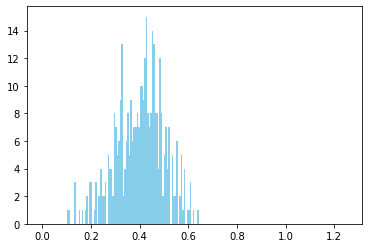

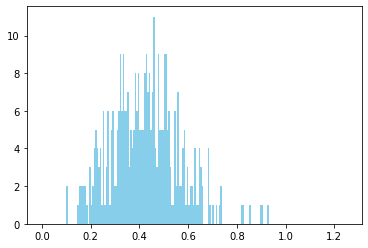

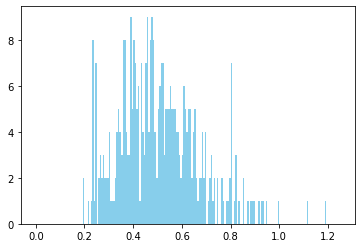

...

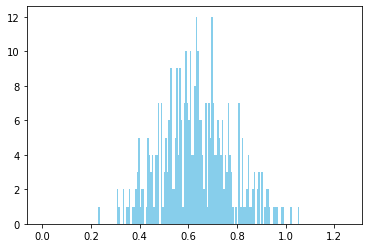

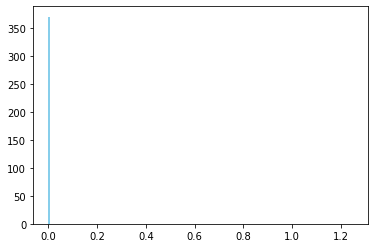

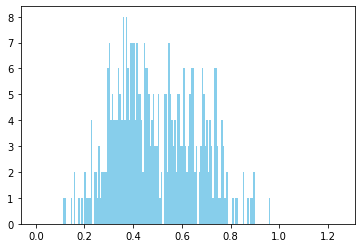

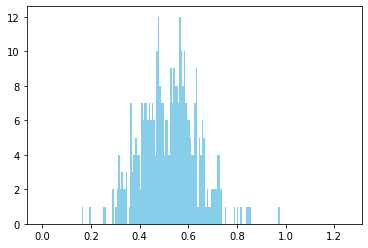

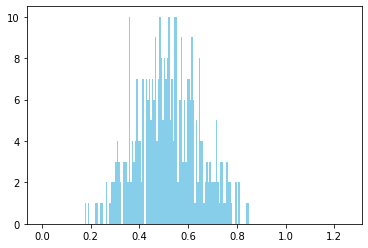

In [62]:
for i in range(14):
    plt.figure()
    plt.hist(embedding1[in0,i],200,range=[0, 1.4],color = "skyblue")


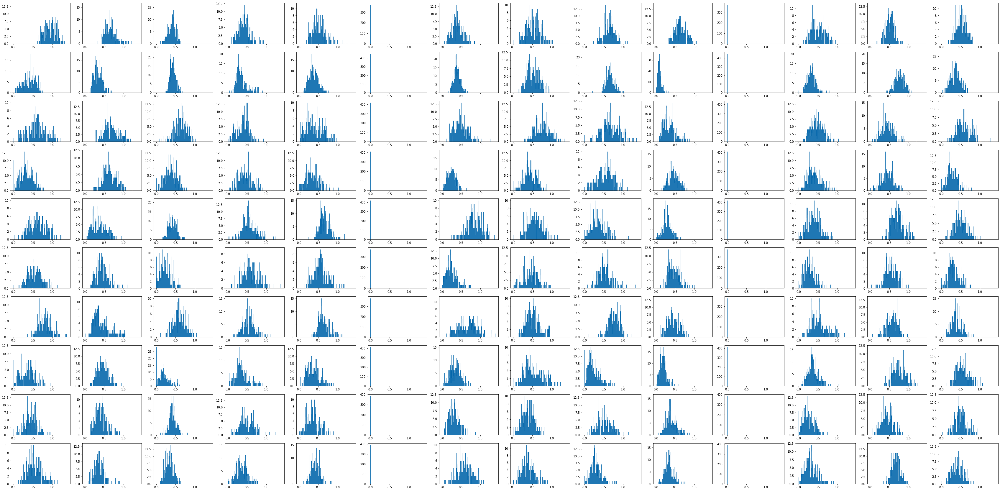

In [64]:
num=14
plt.figure(figsize=(60, 30))
for i in range(num):
    # display original
    ax = plt.subplot(10, num, i+1)
    plt.hist(embedding1[in0,i],200,range=[0, 1.4])
    ax = plt.subplot(10, num, i+1+num)
    plt.hist(embedding1[in1,i],200,range=[0, 1.4])
    ax = plt.subplot(10, num, i+1+2*num)
    plt.hist(embedding1[in2,i],200,range=[0, 1.4])
    ax = plt.subplot(10, num, i+1+3*num)
    plt.hist(embedding1[in3,i],200,range=[0, 1.4])
    ax = plt.subplot(10, num, i+1+4*num)
    plt.hist(embedding1[in4,i],200,range=[0, 1.4])
    ax = plt.subplot(10, num, i+1+5*num)
    plt.hist(embedding1[in5,i],200,range=[0, 1.4])
    ax = plt.subplot(10, num, i+1+6*num)
    plt.hist(embedding1[in6,i],200,range=[0, 1.4])
    ax = plt.subplot(10, num, i+1+7*num)
    plt.hist(embedding1[in7,i],200,range=[0, 1.4])
    ax = plt.subplot(10, num, i+1+8*num)
    plt.hist(embedding1[in8,i],200,range=[0, 1.4])
    ax = plt.subplot(10, num, i+1+9*num)
    plt.hist(embedding1[in9,i],200,range=[0, 1.4])

# k-means

In [65]:
from sklearn.cluster import KMeans

In [72]:
embedding1.shape

(4000, 14)

In [73]:
kmeans = KMeans(n_clusters=10, random_state=0).fit(embedding1)

In [75]:
km = kmeans.labels_

In [76]:
km = np.asarray(km)

In [81]:
y_tes= y_test[0:4000]

In [133]:
in0_ = np.argwhere(km==0)
in1_ = np.argwhere(km==1)
in2_ = np.argwhere(km==2)
in3_ = np.argwhere(km==3)
in4_ = np.argwhere(km==4)
in5_ = np.argwhere(km==5)
in6_ = np.argwhere(km==6)
in7_ = np.argwhere(km==7)
in8_ = np.argwhere(km==8)
in9_ = np.argwhere(km==9)

In [136]:
fi = np.concatenate((in0_, in1_, in2_))

In [143]:
in0.shape

(370, 1)

In [142]:
in0_.shape

(320, 1)

In [ ]:
# cluster 0 is corresponding to 0(80%)

In [144]:
num0=0
num1=0
num2=0
num3=0
num4=0
num5=0
num6=0
num7=0
num8=0
num9=0
length = len(in0_)
for i in range(length):
    if len(np.where(in0==in0_[i])[0])>0:
        num0+=1
    if len(np.where(in1==in0_[i])[0])>0:
        num1+=1
    if len(np.where(in2==in0_[i])[0])>0:
        num2+=1
    if len(np.where(in3==in0_[i])[0])>0:
        num3+=1
    if len(np.where(in4==in0_[i])[0])>0:
        num4+=1
    if len(np.where(in5==in0_[i])[0])>0:
        num5+=1
    if len(np.where(in6==in0_[i])[0])>0:
        num6+=1
    if len(np.where(in7==in0_[i])[0])>0:
        num7+=1
    if len(np.where(in8==in0_[i])[0])>0:
        num8+=1
    if len(np.where(in9==in0_[i])[0])>0:
        num9+=1
print(num0/length,num1/length,num2/length,num3/length,num4/length,num5/length,num6/length,
         num7/length,num8/length,num9/length)

0.803125 0.0 0.096875 0.00625 0.0 0.04375 0.034375 0.003125 0.00625 0.00625


In [ ]:
#cluster 1 is corresponding to 1(87%)

In [146]:
num0=0
num1=0
num2=0
num3=0
num4=0
num5=0
num6=0
num7=0
num8=0
num9=0
length = len(in1_)
for i in range(length):
    if len(np.where(in0==in1_[i])[0])>0:
        num0+=1
    if len(np.where(in1==in1_[i])[0])>0:
        num1+=1
    if len(np.where(in2==in1_[i])[0])>0:
        num2+=1
    if len(np.where(in3==in1_[i])[0])>0:
        num3+=1
    if len(np.where(in4==in1_[i])[0])>0:
        num4+=1
    if len(np.where(in5==in1_[i])[0])>0:
        num5+=1
    if len(np.where(in6==in1_[i])[0])>0:
        num6+=1
    if len(np.where(in7==in1_[i])[0])>0:
        num7+=1
    if len(np.where(in8==in1_[i])[0])>0:
        num8+=1
    if len(np.where(in9==in1_[i])[0])>0:
        num9+=1
print(num0/length,num1/length,num2/length,num3/length,num4/length,num5/length,num6/length,
         num7/length,num8/length,num9/length)

0.0 0.874468085106383 0.00851063829787234 0.010638297872340425 0.023404255319148935 0.01702127659574468 0.00851063829787234 0.02127659574468085 0.00851063829787234 0.027659574468085105


In [ ]:
#cluster 2 is corresponding to 2(91%)

In [149]:
num0=0
num1=0
num2=0
num3=0
num4=0
num5=0
num6=0
num7=0
num8=0
num9=0
length = len(in2_)
for i in range(length):
    res = in2_[i]
    if len(np.where(in0==res)[0])>0:
        num0+=1
    if len(np.where(in1==res)[0])>0:
        num1+=1
    if len(np.where(in2==res)[0])>0:
        num2+=1
    if len(np.where(in3==res)[0])>0:
        num3+=1
    if len(np.where(in4==res)[0])>0:
        num4+=1
    if len(np.where(in5==res)[0])>0:
        num5+=1
    if len(np.where(in6==res)[0])>0:
        num6+=1
    if len(np.where(in7==res)[0])>0:
        num7+=1
    if len(np.where(in8==res)[0])>0:
        num8+=1
    if len(np.where(in9==res)[0])>0:
        num9+=1
print(num0/length,num1/length,num2/length,num3/length,num4/length,num5/length,num6/length,
         num7/length,num8/length,num9/length)

0.003215434083601286 0.003215434083601286 0.9131832797427653 0.04823151125401929 0.0 0.0 0.0 0.00964630225080386 0.022508038585209004 0.0


In [ ]:
# cluster 3 is corresponding to 7(45%) and 9(41%)

In [150]:
num0=0
num1=0
num2=0
num3=0
num4=0
num5=0
num6=0
num7=0
num8=0
num9=0
length = len(in3_)
for i in range(length):
    res = in3_[i]
    if len(np.where(in0==res)[0])>0:
        num0+=1
    if len(np.where(in1==res)[0])>0:
        num1+=1
    if len(np.where(in2==res)[0])>0:
        num2+=1
    if len(np.where(in3==res)[0])>0:
        num3+=1
    if len(np.where(in4==res)[0])>0:
        num4+=1
    if len(np.where(in5==res)[0])>0:
        num5+=1
    if len(np.where(in6==res)[0])>0:
        num6+=1
    if len(np.where(in7==res)[0])>0:
        num7+=1
    if len(np.where(in8==res)[0])>0:
        num8+=1
    if len(np.where(in9==res)[0])>0:
        num9+=1
print(num0/length,num1/length,num2/length,num3/length,num4/length,num5/length,num6/length,
         num7/length,num8/length,num9/length)

0.0 0.0 0.005747126436781609 0.022988505747126436 0.06321839080459771 0.022988505747126436 0.0 0.4578544061302682 0.017241379310344827 0.4099616858237548


In [ ]:
#cluster 4 is corresponding to 4(69%) and 9(22%)

In [151]:
num0=0
num1=0
num2=0
num3=0
num4=0
num5=0
num6=0
num7=0
num8=0
num9=0
length = len(in4_)
for i in range(length):
    res = in4_[i]
    if len(np.where(in0==res)[0])>0:
        num0+=1
    if len(np.where(in1==res)[0])>0:
        num1+=1
    if len(np.where(in2==res)[0])>0:
        num2+=1
    if len(np.where(in3==res)[0])>0:
        num3+=1
    if len(np.where(in4==res)[0])>0:
        num4+=1
    if len(np.where(in5==res)[0])>0:
        num5+=1
    if len(np.where(in6==res)[0])>0:
        num6+=1
    if len(np.where(in7==res)[0])>0:
        num7+=1
    if len(np.where(in8==res)[0])>0:
        num8+=1
    if len(np.where(in9==res)[0])>0:
        num9+=1
print(num0/length,num1/length,num2/length,num3/length,num4/length,num5/length,num6/length,
         num7/length,num8/length,num9/length)

0.0 0.0 0.006342494714587738 0.0 0.693446088794926 0.019027484143763214 0.008456659619450317 0.02536997885835095 0.021141649048625793 0.226215644820296


In [ ]:
#cluster 5 is corresponding to 3(50%) and 5(27%)

In [152]:
num0=0
num1=0
num2=0
num3=0
num4=0
num5=0
num6=0
num7=0
num8=0
num9=0
length = len(in5_)
for i in range(length):
    res = in5_[i]
    if len(np.where(in0==res)[0])>0:
        num0+=1
    if len(np.where(in1==res)[0])>0:
        num1+=1
    if len(np.where(in2==res)[0])>0:
        num2+=1
    if len(np.where(in3==res)[0])>0:
        num3+=1
    if len(np.where(in4==res)[0])>0:
        num4+=1
    if len(np.where(in5==res)[0])>0:
        num5+=1
    if len(np.where(in6==res)[0])>0:
        num6+=1
    if len(np.where(in7==res)[0])>0:
        num7+=1
    if len(np.where(in8==res)[0])>0:
        num8+=1
    if len(np.where(in9==res)[0])>0:
        num9+=1
print(num0/length,num1/length,num2/length,num3/length,num4/length,num5/length,num6/length,
         num7/length,num8/length,num9/length)

0.024719101123595506 0.0044943820224719105 0.038202247191011236 0.501123595505618 0.006741573033707865 0.27191011235955054 0.011235955056179775 0.0044943820224719105 0.1258426966292135 0.011235955056179775


In [ ]:
#cluster 6 is corresponding to 7(47%) and 5(14%)

In [153]:
num0=0
num1=0
num2=0
num3=0
num4=0
num5=0
num6=0
num7=0
num8=0
num9=0
length = len(in6_)
for i in range(length):
    res = in6_[i]
    if len(np.where(in0==res)[0])>0:
        num0+=1
    if len(np.where(in1==res)[0])>0:
        num1+=1
    if len(np.where(in2==res)[0])>0:
        num2+=1
    if len(np.where(in3==res)[0])>0:
        num3+=1
    if len(np.where(in4==res)[0])>0:
        num4+=1
    if len(np.where(in5==res)[0])>0:
        num5+=1
    if len(np.where(in6==res)[0])>0:
        num6+=1
    if len(np.where(in7==res)[0])>0:
        num7+=1
    if len(np.where(in8==res)[0])>0:
        num8+=1
    if len(np.where(in9==res)[0])>0:
        num9+=1
print(num0/length,num1/length,num2/length,num3/length,num4/length,num5/length,num6/length,
         num7/length,num8/length,num9/length)

0.0 0.09183673469387756 0.0782312925170068 0.027210884353741496 0.07142857142857142 0.14625850340136054 0.0 0.46938775510204084 0.04421768707482993 0.07142857142857142


In [ ]:
#cluster 7 is corresponding to 6(81%)

In [154]:
num0=0
num1=0
num2=0
num3=0
num4=0
num5=0
num6=0
num7=0
num8=0
num9=0
length = len(in7_)
for i in range(length):
    res = in7_[i]
    if len(np.where(in0==res)[0])>0:
        num0+=1
    if len(np.where(in1==res)[0])>0:
        num1+=1
    if len(np.where(in2==res)[0])>0:
        num2+=1
    if len(np.where(in3==res)[0])>0:
        num3+=1
    if len(np.where(in4==res)[0])>0:
        num4+=1
    if len(np.where(in5==res)[0])>0:
        num5+=1
    if len(np.where(in6==res)[0])>0:
        num6+=1
    if len(np.where(in7==res)[0])>0:
        num7+=1
    if len(np.where(in8==res)[0])>0:
        num8+=1
    if len(np.where(in9==res)[0])>0:
        num9+=1
print(num0/length,num1/length,num2/length,num3/length,num4/length,num5/length,num6/length,
         num7/length,num8/length,num9/length)

0.0603448275862069 0.008620689655172414 0.0603448275862069 0.0 0.04741379310344827 0.008620689655172414 0.8103448275862069 0.0 0.0 0.004310344827586207


In [ ]:
#cluster 8 is corresponding to 3(26%), 5(17%) and 8(42%)

In [155]:
num0=0
num1=0
num2=0
num3=0
num4=0
num5=0
num6=0
num7=0
num8=0
num9=0
length = len(in8_)
for i in range(length):
    res = in8_[i]
    if len(np.where(in0==res)[0])>0:
        num0+=1
    if len(np.where(in1==res)[0])>0:
        num1+=1
    if len(np.where(in2==res)[0])>0:
        num2+=1
    if len(np.where(in3==res)[0])>0:
        num3+=1
    if len(np.where(in4==res)[0])>0:
        num4+=1
    if len(np.where(in5==res)[0])>0:
        num5+=1
    if len(np.where(in6==res)[0])>0:
        num6+=1
    if len(np.where(in7==res)[0])>0:
        num7+=1
    if len(np.where(in8==res)[0])>0:
        num8+=1
    if len(np.where(in9==res)[0])>0:
        num9+=1
print(num0/length,num1/length,num2/length,num3/length,num4/length,num5/length,num6/length,
         num7/length,num8/length,num9/length)

0.003838771593090211 0.007677543186180422 0.0690978886756238 0.2667946257197697 0.005758157389635317 0.1727447216890595 0.0019193857965451055 0.009596928982725527 0.42610364683301344 0.036468330134357005


In [ ]:
#cluster 9 is corresponding to 0(20%), 5(17%), 6(40%) and 8(15%)

In [156]:
num0=0
num1=0
num2=0
num3=0
num4=0
num5=0
num6=0
num7=0
num8=0
num9=0
length = len(in9_)
for i in range(length):
    res = in9_[i]
    if len(np.where(in0==res)[0])>0:
        num0+=1
    if len(np.where(in1==res)[0])>0:
        num1+=1
    if len(np.where(in2==res)[0])>0:
        num2+=1
    if len(np.where(in3==res)[0])>0:
        num3+=1
    if len(np.where(in4==res)[0])>0:
        num4+=1
    if len(np.where(in5==res)[0])>0:
        num5+=1
    if len(np.where(in6==res)[0])>0:
        num6+=1
    if len(np.where(in7==res)[0])>0:
        num7+=1
    if len(np.where(in8==res)[0])>0:
        num8+=1
    if len(np.where(in9==res)[0])>0:
        num9+=1
print(num0/length,num1/length,num2/length,num3/length,num4/length,num5/length,num6/length,
         num7/length,num8/length,num9/length)

0.20631067961165048 0.007281553398058253 0.007281553398058253 0.009708737864077669 0.019417475728155338 0.17718446601941748 0.40048543689320387 0.0024271844660194173 0.14805825242718446 0.021844660194174758


In [175]:
import umap
from PIL import Image
import matplotlib
from matplotlib.pyplot import imshow

In [159]:
reducer = umap.UMAP(random_state=42)
reducer.fit(embedding1)

UMAP(random_state=42)

In [161]:
embedding = reducer.transform(embedding1)
# Verify that the result of calling transform is
# idenitical to accessing the embedding_ attribute
assert(np.all(embedding == reducer.embedding_))
embedding.shape

(4000, 2)

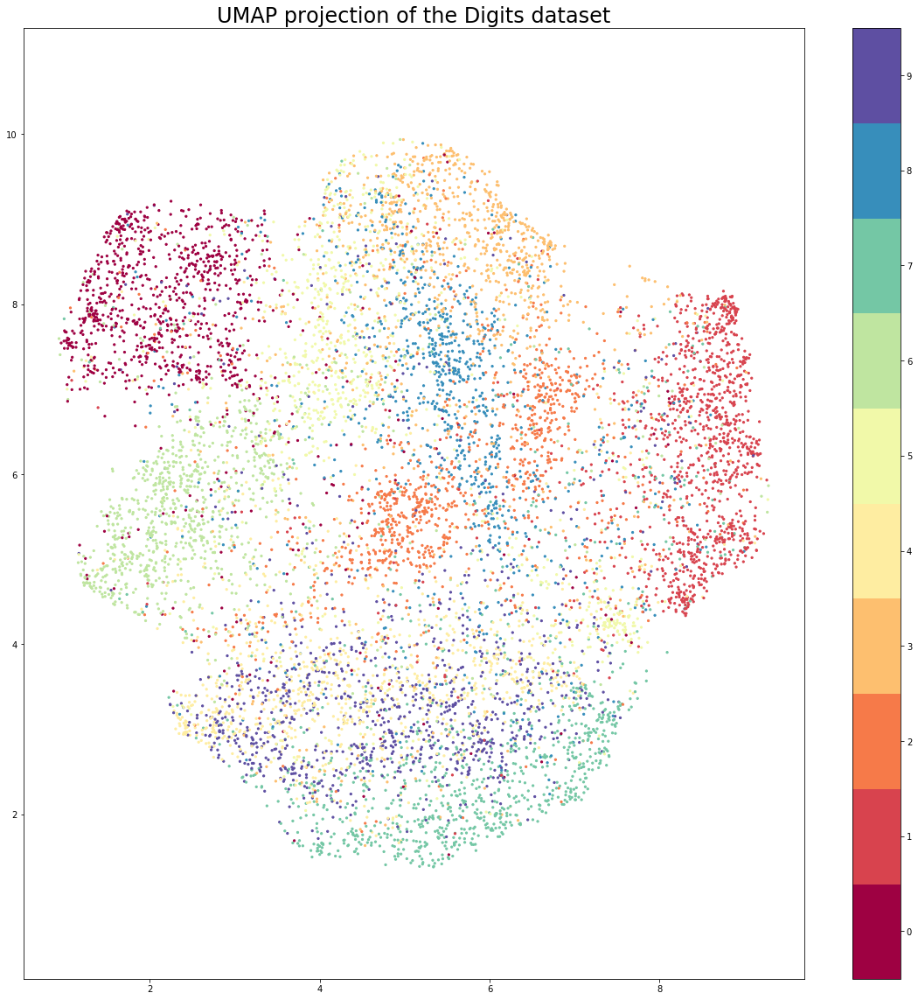

In [145]:
#VAE model 
plt.figure(figsize=(20,20))
plt.scatter(embedding[:, 0], embedding[:, 1], c=y_test, cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the Digits dataset', fontsize=24);

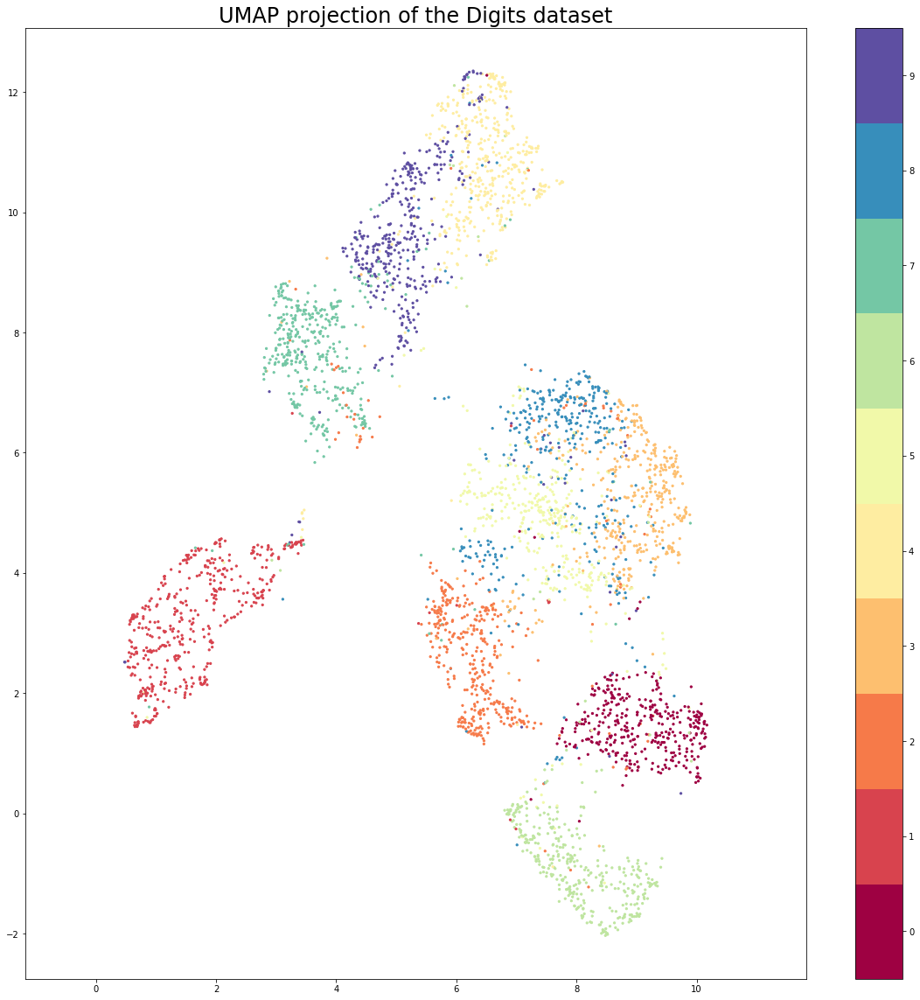

In [162]:
#conv1d-atteention model 
plt.figure(figsize=(20,20))
plt.scatter(embedding[:, 0], embedding[:, 1], c=y_test[0:4000], cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the Digits dataset', fontsize=24);

In [163]:
embedding.shape

(4000, 2)

In [170]:
tx, ty = embedding[:,0], embedding[:,1]
tx1 = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty1 = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

In [171]:
x_test_f1 = x_test[0:4000]

In [177]:
tx1 = tx1[0:1000]
ty1 = ty1[0:1000]
x_test_f1 = x_test_f1[0:1000]

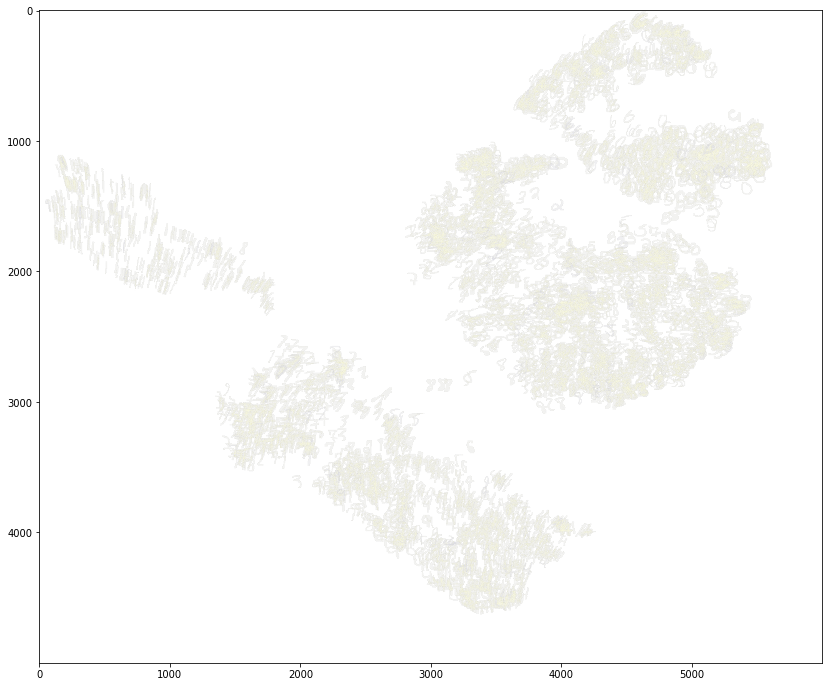

In [176]:
width = 6000
height = 5000
max_dim = 500

full_image = Image.new('RGBA', (width, height))
for img, x, y in zip(x_test_f1, tx1, ty1):
    tile = Image.fromarray(img,'RGBA')
    rs = max(0.2, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))

matplotlib.pyplot.figure(figsize = (16,12))
imshow(full_image)

In [ ]:
tx1 = tx1[0:1000]
ty1 = ty1[0:1000]
x_test_f1 = x_test_f1[0:1000]

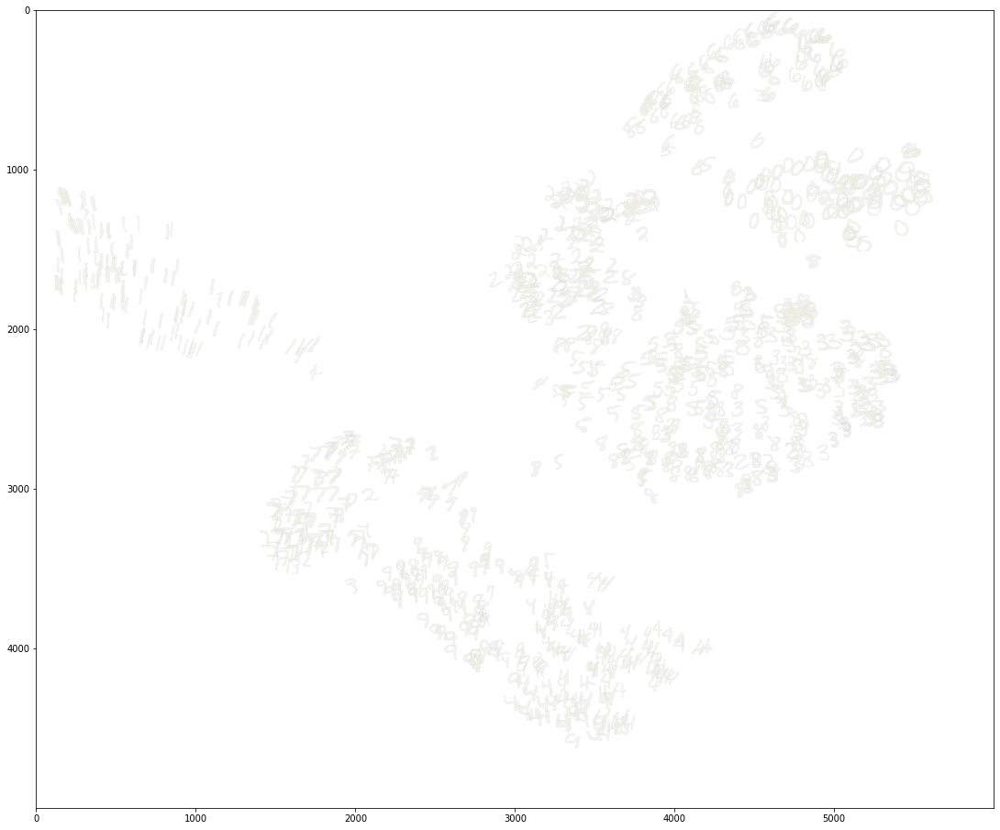

In [179]:
width = 6000
height = 5000
max_dim = 500

full_image = Image.new('RGBA', (width, height))
for img, x, y in zip(x_test_f1, tx1, ty1):
    tile = Image.fromarray(img,'RGBA')
    rs = max(0.2, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))

matplotlib.pyplot.figure(figsize = (20,16))
imshow(full_image)

In [ ]:
tx1 = tx1[0:1000]
ty1 = ty1[0:1000]
x_test_f1 = x_test_f1[0:1000]

In [180]:
x_test_f1.shape

(1000, 28, 28)

In [181]:
x_test_4d = x_test_f1.reshape(1000,28,28,1)

In [182]:
x_test_4d.shape

(1000, 28, 28, 1)

In [184]:
X_ = [tx1,ty1]

In [186]:
X_=np.asarray(X_)

In [188]:
X_ = np.transpose(X_,(1,0))

In [190]:
X_.shape

(1000, 2)

In [196]:
import matplotlib.pyplot as plt
from matplotlib import offsetbox
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import random
def imscatter(x, y, images, number_images_shown, ax=None, zoom=1.0 ): 
#x,y are coordinates of UMAP embeddings, number_images_showns indicate how many images you wanna plot (randomly)
        if ax is None:
            ax = plt.gca()
        x, y = np.atleast_1d(x, y)
        artists = []
        
        shown_images=[]
        x1=[]
        y1=[]
        r= random.sample(range(len(images)),number_images_shown)
        r.sort()
        for i in r:
            shown_images.append(images[i])
            x1.append(x[i])
            y1.append(y[i])
        
        for x0, y0, img0 in zip (x1, y1, shown_images):
            im = OffsetImage(img0[:,:,0], zoom=zoom)
            ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False, pad=0.2)
            artists.append(ax.add_artist(ab))
        ax.update_datalim(np.column_stack([x, y]))
        ax.autoscale()
        return artists
def plot_embedding(X, number_images_shown, imgs, title=None): 
#X is UMAP_embeddings, number_images_shown indicates how many images you wanna plot a time (randomly), imgs are you np.array of images
        plt.figure(figsize=(20, 20))
        ax = plt.subplot(111)
        
        for i in range(X.shape[0]):   #plot the text as dots (like scatter plots)
            plt.text(X[i, 0], X[i, 1], ".", fontdict={'weight': 'bold', 'size': 9})
        
        if hasattr(offsetbox, 'AnnotationBbox'): #plot the images
            imscatter(X[:, 0],  X[:, 1], imgs,  number_images_shown, zoom=0.7, ax=ax)
        if title is not None:
            plt.title(title)

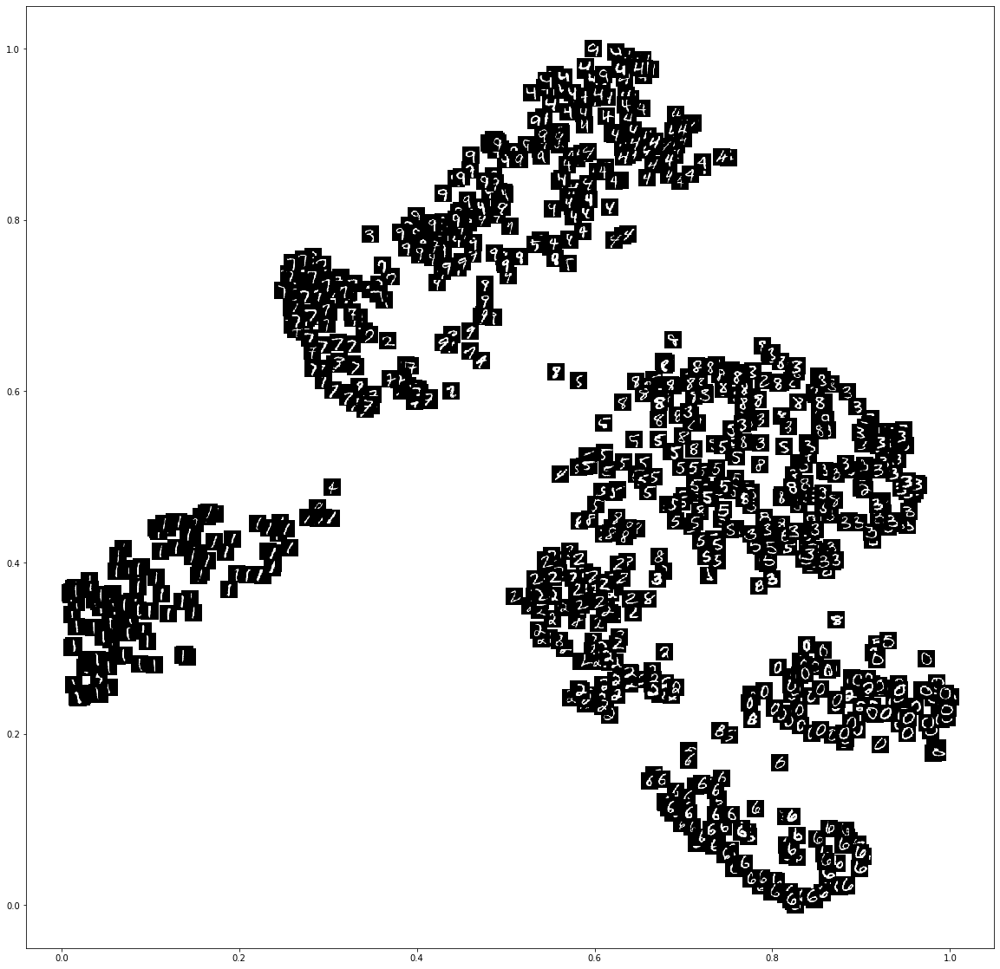

In [197]:
plot_embedding(X_,1000,x_test_4d)

In [123]:
in0_[0]

array([3])

In [125]:
len(np.where(in0_==in0_[0])[0])

1

In [122]:
len(reuslt[0])

1

In [98]:
arr0

[[3],
 [10],
 [13],
 [25],
 [28],
 [69],
 [71],
 [101],
 [106],
 [126],
 [183],
 [188],
 [192],
 [194],
 [222],
 [246],
 [259],
 [269],
 [271],
 [294],
 [296],
 [297],
 [305],
 [311],
 [312],
 [327],
 [380],
 [390],
 [400],
 [407],
 [421],
 [424],
 [440],
 [445],
 [459],
 [485],
 [525],
 [545],
 [546],
 [549],
 [561],
 [581],
 [586],
 [592],
 [608],
 [620],
 [629],
 [644],
 [654],
 [656],
 [701],
 [704],
 [713],
 [721],
 [742],
 [744],
 [750],
 [763],
 [794],
 [804],
 [821],
 [823],
 [845],
 [854],
 [858],
 [871],
 [884],
 [896],
 [904],
 [932],
 [939],
 [972],
 [981],
 [997],
 [1009],
 [1014],
 [1034],
 [1047],
 [1050],
 [1061],
 [1079],
 [1084],
 [1148],
 [1188],
 [1203],
 [1218],
 [1220],
 [1223],
 [1231],
 [1256],
 [1261],
 [1271],
 [1272],
 [1294],
 [1297],
 [1333],
 [1339],
 [1348],
 [1352],
 [1374],
 [1379],
 [1390],
 [1399],
 [1408],
 [1445],
 [1454],
 [1457],
 [1462],
 [1466],
 [1468],
 [1487],
 [1504],
 [1517],
 [1525],
 [1526],
 [1533],
 [1565],
 [1570],
 [1589],
 [1590],
 [

In [34]:
train_iterator = torch.utils.data.DataLoader(x_z,batch_size = 200,shuffle = True)

In [36]:
best_train_loss = float('inf')

N_EPOCHS = 30000
for epoch in range(N_EPOCHS):
    
    
    train_loss = train()
    train_loss /= len(train_iterator)
    print(f'Epoch {epoch}, Train Loss: {train_loss:.4f}')

    if best_train_loss > train_loss:
        best_train_loss = train_loss
        patience_counter = 1
        checkpoint = {
            "net": model.state_dict(),
            'optimizer': optimizer.state_dict(),
            "epoch": epoch,
            "encoder": encoder.state_dict(), 
            'decoder': decoder.state_dict()
        }
        if epoch >=1:
            torch.save(checkpoint, 'MNIST_Test_1/weights-7201+%s.pkl' % (str(epoch)))
    else:
        patience_counter += 1

    if patience_counter > 15000:
        break

Epoch 0, Train Loss: 0.0115
Epoch 1, Train Loss: 0.0114
Epoch 2, Train Loss: 0.0114
Epoch 3, Train Loss: 0.0114
Epoch 4, Train Loss: 0.0113
Epoch 5, Train Loss: 0.0113
Epoch 6, Train Loss: 0.0113
Epoch 7, Train Loss: 0.0113
Epoch 8, Train Loss: 0.0113
Epoch 9, Train Loss: 0.0112
Epoch 10, Train Loss: 0.0112
Epoch 11, Train Loss: 0.0112
Epoch 12, Train Loss: 0.0112
Epoch 13, Train Loss: 0.0112
Epoch 14, Train Loss: 0.0112
Epoch 15, Train Loss: 0.0112
Epoch 16, Train Loss: 0.0112
Epoch 17, Train Loss: 0.0112
Epoch 18, Train Loss: 0.0111
Epoch 19, Train Loss: 0.0112
Epoch 20, Train Loss: 0.0111
Epoch 21, Train Loss: 0.0111
Epoch 22, Train Loss: 0.0111
Epoch 23, Train Loss: 0.0111
Epoch 24, Train Loss: 0.0111
Epoch 25, Train Loss: 0.0111
Epoch 26, Train Loss: 0.0111
Epoch 27, Train Loss: 0.0111
Epoch 28, Train Loss: 0.0111
Epoch 29, Train Loss: 0.0111
Epoch 30, Train Loss: 0.0111
Epoch 31, Train Loss: 0.0111
Epoch 32, Train Loss: 0.0110
Epoch 33, Train Loss: 0.0110
Epoch 34, Train Loss: 0.

Epoch 277, Train Loss: 0.0106
Epoch 278, Train Loss: 0.0106
Epoch 279, Train Loss: 0.0106
Epoch 280, Train Loss: 0.0106
Epoch 281, Train Loss: 0.0106
Epoch 282, Train Loss: 0.0106
Epoch 283, Train Loss: 0.0106
Epoch 284, Train Loss: 0.0106
Epoch 285, Train Loss: 0.0106
Epoch 286, Train Loss: 0.0106
Epoch 287, Train Loss: 0.0106
Epoch 288, Train Loss: 0.0106
Epoch 289, Train Loss: 0.0106
Epoch 290, Train Loss: 0.0106
Epoch 291, Train Loss: 0.0106
Epoch 292, Train Loss: 0.0106
Epoch 293, Train Loss: 0.0106
Epoch 294, Train Loss: 0.0106
Epoch 295, Train Loss: 0.0106
Epoch 296, Train Loss: 0.0106
Epoch 297, Train Loss: 0.0106
Epoch 298, Train Loss: 0.0106
Epoch 299, Train Loss: 0.0106
Epoch 300, Train Loss: 0.0106
Epoch 301, Train Loss: 0.0106
Epoch 302, Train Loss: 0.0106
Epoch 303, Train Loss: 0.0106
Epoch 304, Train Loss: 0.0106
Epoch 305, Train Loss: 0.0106
Epoch 306, Train Loss: 0.0106
Epoch 307, Train Loss: 0.0106
Epoch 308, Train Loss: 0.0106
Epoch 309, Train Loss: 0.0106
Epoch 310,

Epoch 551, Train Loss: 0.0104
Epoch 552, Train Loss: 0.0105
Epoch 553, Train Loss: 0.0104
Epoch 554, Train Loss: 0.0104
Epoch 555, Train Loss: 0.0104
Epoch 556, Train Loss: 0.0104
Epoch 557, Train Loss: 0.0104
Epoch 558, Train Loss: 0.0104
Epoch 559, Train Loss: 0.0104
Epoch 560, Train Loss: 0.0104
Epoch 561, Train Loss: 0.0104
Epoch 562, Train Loss: 0.0104
Epoch 563, Train Loss: 0.0104
Epoch 564, Train Loss: 0.0104
Epoch 565, Train Loss: 0.0104
Epoch 566, Train Loss: 0.0104
Epoch 567, Train Loss: 0.0104
Epoch 568, Train Loss: 0.0104
Epoch 569, Train Loss: 0.0104
Epoch 570, Train Loss: 0.0104
Epoch 571, Train Loss: 0.0104
Epoch 572, Train Loss: 0.0104
Epoch 573, Train Loss: 0.0104
Epoch 574, Train Loss: 0.0104
Epoch 575, Train Loss: 0.0104
Epoch 576, Train Loss: 0.0104
Epoch 577, Train Loss: 0.0104
Epoch 578, Train Loss: 0.0104
Epoch 579, Train Loss: 0.0104
Epoch 580, Train Loss: 0.0104
Epoch 581, Train Loss: 0.0104
Epoch 582, Train Loss: 0.0104
Epoch 583, Train Loss: 0.0104
Epoch 584,

Epoch 825, Train Loss: 0.0103
Epoch 826, Train Loss: 0.0103
Epoch 827, Train Loss: 0.0103
Epoch 828, Train Loss: 0.0103
Epoch 829, Train Loss: 0.0103
Epoch 830, Train Loss: 0.0103
Epoch 831, Train Loss: 0.0103
Epoch 832, Train Loss: 0.0103
Epoch 833, Train Loss: 0.0103
Epoch 834, Train Loss: 0.0103
Epoch 835, Train Loss: 0.0103
Epoch 836, Train Loss: 0.0103
Epoch 837, Train Loss: 0.0103
Epoch 838, Train Loss: 0.0103
Epoch 839, Train Loss: 0.0103
Epoch 840, Train Loss: 0.0103
Epoch 841, Train Loss: 0.0103
Epoch 842, Train Loss: 0.0103
Epoch 843, Train Loss: 0.0103
Epoch 844, Train Loss: 0.0103
Epoch 845, Train Loss: 0.0103
Epoch 846, Train Loss: 0.0103
Epoch 847, Train Loss: 0.0103
Epoch 848, Train Loss: 0.0103
Epoch 849, Train Loss: 0.0103
Epoch 850, Train Loss: 0.0103
Epoch 851, Train Loss: 0.0103
Epoch 852, Train Loss: 0.0103
Epoch 853, Train Loss: 0.0103
Epoch 854, Train Loss: 0.0103
Epoch 855, Train Loss: 0.0103
Epoch 856, Train Loss: 0.0103
Epoch 857, Train Loss: 0.0103
Epoch 858,

Epoch 1095, Train Loss: 0.0102
Epoch 1096, Train Loss: 0.0102
Epoch 1097, Train Loss: 0.0102
Epoch 1098, Train Loss: 0.0102
Epoch 1099, Train Loss: 0.0102
Epoch 1100, Train Loss: 0.0102
Epoch 1101, Train Loss: 0.0102
Epoch 1102, Train Loss: 0.0102
Epoch 1103, Train Loss: 0.0102
Epoch 1104, Train Loss: 0.0102
Epoch 1105, Train Loss: 0.0102
Epoch 1106, Train Loss: 0.0102
Epoch 1107, Train Loss: 0.0102
Epoch 1108, Train Loss: 0.0102
Epoch 1109, Train Loss: 0.0102
Epoch 1110, Train Loss: 0.0102
Epoch 1111, Train Loss: 0.0102
Epoch 1112, Train Loss: 0.0102
Epoch 1113, Train Loss: 0.0102
Epoch 1114, Train Loss: 0.0102
Epoch 1115, Train Loss: 0.0102
Epoch 1116, Train Loss: 0.0102
Epoch 1117, Train Loss: 0.0102
Epoch 1118, Train Loss: 0.0102
Epoch 1119, Train Loss: 0.0102
Epoch 1120, Train Loss: 0.0102
Epoch 1121, Train Loss: 0.0102
Epoch 1122, Train Loss: 0.0102
Epoch 1123, Train Loss: 0.0102
Epoch 1124, Train Loss: 0.0102
Epoch 1125, Train Loss: 0.0102
Epoch 1126, Train Loss: 0.0102
Epoch 11

Epoch 1360, Train Loss: 0.0101
Epoch 1361, Train Loss: 0.0101
Epoch 1362, Train Loss: 0.0101
Epoch 1363, Train Loss: 0.0101
Epoch 1364, Train Loss: 0.0101
Epoch 1365, Train Loss: 0.0101
Epoch 1366, Train Loss: 0.0102
Epoch 1367, Train Loss: 0.0101
Epoch 1368, Train Loss: 0.0101
Epoch 1369, Train Loss: 0.0101
Epoch 1370, Train Loss: 0.0101
Epoch 1371, Train Loss: 0.0101
Epoch 1372, Train Loss: 0.0101
Epoch 1373, Train Loss: 0.0101
Epoch 1374, Train Loss: 0.0101
Epoch 1375, Train Loss: 0.0101
Epoch 1376, Train Loss: 0.0101
Epoch 1377, Train Loss: 0.0101
Epoch 1378, Train Loss: 0.0101
Epoch 1379, Train Loss: 0.0101
Epoch 1380, Train Loss: 0.0101
Epoch 1381, Train Loss: 0.0102
Epoch 1382, Train Loss: 0.0101
Epoch 1383, Train Loss: 0.0101
Epoch 1384, Train Loss: 0.0101
Epoch 1385, Train Loss: 0.0101
Epoch 1386, Train Loss: 0.0102
Epoch 1387, Train Loss: 0.0102
Epoch 1388, Train Loss: 0.0101
Epoch 1389, Train Loss: 0.0101
Epoch 1390, Train Loss: 0.0101
Epoch 1391, Train Loss: 0.0101
Epoch 13

Epoch 1625, Train Loss: 0.0101
Epoch 1626, Train Loss: 0.0101
Epoch 1627, Train Loss: 0.0101
Epoch 1628, Train Loss: 0.0101
Epoch 1629, Train Loss: 0.0101
Epoch 1630, Train Loss: 0.0101
Epoch 1631, Train Loss: 0.0101
Epoch 1632, Train Loss: 0.0101
Epoch 1633, Train Loss: 0.0101
Epoch 1634, Train Loss: 0.0101
Epoch 1635, Train Loss: 0.0100
Epoch 1636, Train Loss: 0.0100
Epoch 1637, Train Loss: 0.0100
Epoch 1638, Train Loss: 0.0100
Epoch 1639, Train Loss: 0.0101
Epoch 1640, Train Loss: 0.0100
Epoch 1641, Train Loss: 0.0101
Epoch 1642, Train Loss: 0.0101
Epoch 1643, Train Loss: 0.0101
Epoch 1644, Train Loss: 0.0101
Epoch 1645, Train Loss: 0.0101
Epoch 1646, Train Loss: 0.0100
Epoch 1647, Train Loss: 0.0101
Epoch 1648, Train Loss: 0.0101
Epoch 1649, Train Loss: 0.0100
Epoch 1650, Train Loss: 0.0100
Epoch 1651, Train Loss: 0.0100
Epoch 1652, Train Loss: 0.0100
Epoch 1653, Train Loss: 0.0100
Epoch 1654, Train Loss: 0.0100
Epoch 1655, Train Loss: 0.0100
Epoch 1656, Train Loss: 0.0100
Epoch 16

Epoch 1890, Train Loss: 0.0100
Epoch 1891, Train Loss: 0.0100
Epoch 1892, Train Loss: 0.0100
Epoch 1893, Train Loss: 0.0100
Epoch 1894, Train Loss: 0.0100
Epoch 1895, Train Loss: 0.0100
Epoch 1896, Train Loss: 0.0100
Epoch 1897, Train Loss: 0.0100
Epoch 1898, Train Loss: 0.0100
Epoch 1899, Train Loss: 0.0100
Epoch 1900, Train Loss: 0.0100
Epoch 1901, Train Loss: 0.0100
Epoch 1902, Train Loss: 0.0100
Epoch 1903, Train Loss: 0.0100
Epoch 1904, Train Loss: 0.0100
Epoch 1905, Train Loss: 0.0100
Epoch 1906, Train Loss: 0.0100
Epoch 1907, Train Loss: 0.0100
Epoch 1908, Train Loss: 0.0100
Epoch 1909, Train Loss: 0.0100
Epoch 1910, Train Loss: 0.0100
Epoch 1911, Train Loss: 0.0100
Epoch 1912, Train Loss: 0.0100
Epoch 1913, Train Loss: 0.0100
Epoch 1914, Train Loss: 0.0100
Epoch 1915, Train Loss: 0.0100
Epoch 1916, Train Loss: 0.0100
Epoch 1917, Train Loss: 0.0100
Epoch 1918, Train Loss: 0.0100
Epoch 1919, Train Loss: 0.0100
Epoch 1920, Train Loss: 0.0100
Epoch 1921, Train Loss: 0.0100
Epoch 19

Epoch 2155, Train Loss: 0.0100
Epoch 2156, Train Loss: 0.0099
Epoch 2157, Train Loss: 0.0100
Epoch 2158, Train Loss: 0.0100
Epoch 2159, Train Loss: 0.0099
Epoch 2160, Train Loss: 0.0099
Epoch 2161, Train Loss: 0.0099
Epoch 2162, Train Loss: 0.0099
Epoch 2163, Train Loss: 0.0100
Epoch 2164, Train Loss: 0.0100
Epoch 2165, Train Loss: 0.0099
Epoch 2166, Train Loss: 0.0099
Epoch 2167, Train Loss: 0.0099
Epoch 2168, Train Loss: 0.0100
Epoch 2169, Train Loss: 0.0100
Epoch 2170, Train Loss: 0.0099
Epoch 2171, Train Loss: 0.0099
Epoch 2172, Train Loss: 0.0099
Epoch 2173, Train Loss: 0.0099
Epoch 2174, Train Loss: 0.0099
Epoch 2175, Train Loss: 0.0100
Epoch 2176, Train Loss: 0.0099
Epoch 2177, Train Loss: 0.0100
Epoch 2178, Train Loss: 0.0099
Epoch 2179, Train Loss: 0.0099
Epoch 2180, Train Loss: 0.0099
Epoch 2181, Train Loss: 0.0099
Epoch 2182, Train Loss: 0.0099
Epoch 2183, Train Loss: 0.0099
Epoch 2184, Train Loss: 0.0099
Epoch 2185, Train Loss: 0.0099
Epoch 2186, Train Loss: 0.0099
Epoch 21

Epoch 2420, Train Loss: 0.0099
Epoch 2421, Train Loss: 0.0099
Epoch 2422, Train Loss: 0.0099
Epoch 2423, Train Loss: 0.0099
Epoch 2424, Train Loss: 0.0099
Epoch 2425, Train Loss: 0.0099
Epoch 2426, Train Loss: 0.0099
Epoch 2427, Train Loss: 0.0099
Epoch 2428, Train Loss: 0.0099
Epoch 2429, Train Loss: 0.0099
Epoch 2430, Train Loss: 0.0099
Epoch 2431, Train Loss: 0.0099
Epoch 2432, Train Loss: 0.0099
Epoch 2433, Train Loss: 0.0099
Epoch 2434, Train Loss: 0.0099
Epoch 2435, Train Loss: 0.0099
Epoch 2436, Train Loss: 0.0099
Epoch 2437, Train Loss: 0.0099
Epoch 2438, Train Loss: 0.0099
Epoch 2439, Train Loss: 0.0099
Epoch 2440, Train Loss: 0.0099
Epoch 2441, Train Loss: 0.0099
Epoch 2442, Train Loss: 0.0099
Epoch 2443, Train Loss: 0.0099
Epoch 2444, Train Loss: 0.0099
Epoch 2445, Train Loss: 0.0099
Epoch 2446, Train Loss: 0.0099
Epoch 2447, Train Loss: 0.0099
Epoch 2448, Train Loss: 0.0099
Epoch 2449, Train Loss: 0.0099
Epoch 2450, Train Loss: 0.0099
Epoch 2451, Train Loss: 0.0099
Epoch 24

Epoch 2685, Train Loss: 0.0098
Epoch 2686, Train Loss: 0.0098
Epoch 2687, Train Loss: 0.0099
Epoch 2688, Train Loss: 0.0099
Epoch 2689, Train Loss: 0.0098
Epoch 2690, Train Loss: 0.0098
Epoch 2691, Train Loss: 0.0098
Epoch 2692, Train Loss: 0.0098
Epoch 2693, Train Loss: 0.0099
Epoch 2694, Train Loss: 0.0098
Epoch 2695, Train Loss: 0.0099
Epoch 2696, Train Loss: 0.0099
Epoch 2697, Train Loss: 0.0099
Epoch 2698, Train Loss: 0.0099
Epoch 2699, Train Loss: 0.0099
Epoch 2700, Train Loss: 0.0098
Epoch 2701, Train Loss: 0.0098
Epoch 2702, Train Loss: 0.0098
Epoch 2703, Train Loss: 0.0099
Epoch 2704, Train Loss: 0.0098
Epoch 2705, Train Loss: 0.0099
Epoch 2706, Train Loss: 0.0098
Epoch 2707, Train Loss: 0.0099
Epoch 2708, Train Loss: 0.0099
Epoch 2709, Train Loss: 0.0098
Epoch 2710, Train Loss: 0.0098
Epoch 2711, Train Loss: 0.0098
Epoch 2712, Train Loss: 0.0099
Epoch 2713, Train Loss: 0.0099
Epoch 2714, Train Loss: 0.0099
Epoch 2715, Train Loss: 0.0099
Epoch 2716, Train Loss: 0.0099
Epoch 27

Epoch 2950, Train Loss: 0.0098
Epoch 2951, Train Loss: 0.0098
Epoch 2952, Train Loss: 0.0098
Epoch 2953, Train Loss: 0.0098
Epoch 2954, Train Loss: 0.0098
Epoch 2955, Train Loss: 0.0098
Epoch 2956, Train Loss: 0.0098
Epoch 2957, Train Loss: 0.0098
Epoch 2958, Train Loss: 0.0098
Epoch 2959, Train Loss: 0.0098
Epoch 2960, Train Loss: 0.0098
Epoch 2961, Train Loss: 0.0098
Epoch 2962, Train Loss: 0.0098
Epoch 2963, Train Loss: 0.0098
Epoch 2964, Train Loss: 0.0098
Epoch 2965, Train Loss: 0.0098
Epoch 2966, Train Loss: 0.0098
Epoch 2967, Train Loss: 0.0098
Epoch 2968, Train Loss: 0.0098
Epoch 2969, Train Loss: 0.0098
Epoch 2970, Train Loss: 0.0098
Epoch 2971, Train Loss: 0.0098
Epoch 2972, Train Loss: 0.0098
Epoch 2973, Train Loss: 0.0098
Epoch 2974, Train Loss: 0.0098
Epoch 2975, Train Loss: 0.0098
Epoch 2976, Train Loss: 0.0098
Epoch 2977, Train Loss: 0.0098
Epoch 2978, Train Loss: 0.0098
Epoch 2979, Train Loss: 0.0098
Epoch 2980, Train Loss: 0.0098
Epoch 2981, Train Loss: 0.0098
Epoch 29

Epoch 3215, Train Loss: 0.0098
Epoch 3216, Train Loss: 0.0098
Epoch 3217, Train Loss: 0.0098
Epoch 3218, Train Loss: 0.0098
Epoch 3219, Train Loss: 0.0098
Epoch 3220, Train Loss: 0.0098
Epoch 3221, Train Loss: 0.0098
Epoch 3222, Train Loss: 0.0098
Epoch 3223, Train Loss: 0.0098
Epoch 3224, Train Loss: 0.0098
Epoch 3225, Train Loss: 0.0098
Epoch 3226, Train Loss: 0.0098
Epoch 3227, Train Loss: 0.0098
Epoch 3228, Train Loss: 0.0098
Epoch 3229, Train Loss: 0.0098
Epoch 3230, Train Loss: 0.0098
Epoch 3231, Train Loss: 0.0098
Epoch 3232, Train Loss: 0.0098
Epoch 3233, Train Loss: 0.0098
Epoch 3234, Train Loss: 0.0098
Epoch 3235, Train Loss: 0.0098
Epoch 3236, Train Loss: 0.0098
Epoch 3237, Train Loss: 0.0098
Epoch 3238, Train Loss: 0.0098
Epoch 3239, Train Loss: 0.0098
Epoch 3240, Train Loss: 0.0098
Epoch 3241, Train Loss: 0.0098
Epoch 3242, Train Loss: 0.0098
Epoch 3243, Train Loss: 0.0098
Epoch 3244, Train Loss: 0.0098
Epoch 3245, Train Loss: 0.0098
Epoch 3246, Train Loss: 0.0098
Epoch 32

Epoch 3480, Train Loss: 0.0097
Epoch 3481, Train Loss: 0.0097
Epoch 3482, Train Loss: 0.0097
Epoch 3483, Train Loss: 0.0097
Epoch 3484, Train Loss: 0.0097
Epoch 3485, Train Loss: 0.0097
Epoch 3486, Train Loss: 0.0097
Epoch 3487, Train Loss: 0.0097
Epoch 3488, Train Loss: 0.0097
Epoch 3489, Train Loss: 0.0097
Epoch 3490, Train Loss: 0.0097
Epoch 3491, Train Loss: 0.0097
Epoch 3492, Train Loss: 0.0097
Epoch 3493, Train Loss: 0.0097
Epoch 3494, Train Loss: 0.0097
Epoch 3495, Train Loss: 0.0098
Epoch 3496, Train Loss: 0.0097
Epoch 3497, Train Loss: 0.0097
Epoch 3498, Train Loss: 0.0097
Epoch 3499, Train Loss: 0.0097
Epoch 3500, Train Loss: 0.0097
Epoch 3501, Train Loss: 0.0098
Epoch 3502, Train Loss: 0.0097
Epoch 3503, Train Loss: 0.0097
Epoch 3504, Train Loss: 0.0097
Epoch 3505, Train Loss: 0.0097
Epoch 3506, Train Loss: 0.0097
Epoch 3507, Train Loss: 0.0097
Epoch 3508, Train Loss: 0.0097
Epoch 3509, Train Loss: 0.0097
Epoch 3510, Train Loss: 0.0097
Epoch 3511, Train Loss: 0.0097
Epoch 35

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 4614, Train Loss: 0.0096
Epoch 4615, Train Loss: 0.0096
Epoch 4616, Train Loss: 0.0096
Epoch 4617, Train Loss: 0.0096
Epoch 4618, Train Loss: 0.0096
Epoch 4619, Train Loss: 0.0096
Epoch 4620, Train Loss: 0.0096
Epoch 4621, Train Loss: 0.0096
Epoch 4622, Train Loss: 0.0096
Epoch 4623, Train Loss: 0.0096
Epoch 4624, Train Loss: 0.0096
Epoch 4625, Train Loss: 0.0096
Epoch 4626, Train Loss: 0.0096
Epoch 4627, Train Loss: 0.0096
Epoch 4628, Train Loss: 0.0096
Epoch 4629, Train Loss: 0.0096
Epoch 4630, Train Loss: 0.0096
Epoch 4631, Train Loss: 0.0096
Epoch 4632, Train Loss: 0.0096
Epoch 4633, Train Loss: 0.0096
Epoch 4634, Train Loss: 0.0096
Epoch 4635, Train Loss: 0.0096
Epoch 4636, Train Loss: 0.0096
Epoch 4637, Train Loss: 0.0096
Epoch 4638, Train Loss: 0.0096
Epoch 4639, Train Loss: 0.0096
Epoch 4640, Train Loss: 0.0096
Epoch 4641, Train Loss: 0.0096
Epoch 4642, Train Loss: 0.0096
Epoch 4643, Train Loss: 0.0096
Epoch 4644, Train Loss: 0.0096
Epoch 4645, Train Loss: 0.0096
Epoch 46

KeyboardInterrupt: 